# Chan Swee Tat
# MoneyLion Assessment
# Loan Repayment Challenge
Nowadays, machine learning has become the hot cake for many business sectors especially fintech sector. Machine learning helps to increase the speed and accuracy of risk assessment process and reduce the losses. </b>

For MoneyLion, Loans are the main revenue driver! 
Therefore,a high performance machine model allows MoneyLion to accurately target the high potential customer and thus able to mitigate losses on the portfolio of loans!

From business point of view, after the loan has been issued, there is still possibility of client settled bankcruptcy and charged off. Thus, a high performance machine learning model can aid MoneyLion to determine which client need to be awarded and penalized.

After having a first glance of dataset, we decided to use 'loanStatus' of the funded loan for target variable to predict the target customer for determining loan risk.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# Convert date string to date format
loan = pd.read_csv('MoneyLion Assessment Questions/loan.csv',parse_dates=['applicationDate','originatedDate'])
loan.head(5)

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF
0,LL-I-07399092,beff4989be82aab4a5b47679216942fd,B,360.0,2016-02-23 17:29:01.940,False,NaT,0.0,False,0,Withdrawn Application,500.0,978.27,IL,bvMandatory,6,NaN,5669ef78e4b0c9d3936440e6,1
1,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,Paid Off Loan,3000.0,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1
2,LL-I-10707532,3c174ae9e2505a5f9ddbff9843281845,B,590.0,2016-08-01 13:51:14.709,False,NaT,0.0,False,0,Withdrawn Application,400.0,1199.45,MO,bvMandatory,3,NaN,579eab11e4b0d0502870ef2f,1
3,LL-I-02272596,9be6f443bb97db7e95fa0c281d34da91,B,360.0,2015-08-06 23:58:08.880,False,NaT,0.0,False,0,Withdrawn Application,500.0,1074.05,IL,bvMandatory,3,NaN,555b1e95e4b0f6f11b267c18,1
4,LL-I-09542882,63b5494f60b5c19c827c7b068443752c,B,590.0,2016-06-05 22:31:34.304,False,NaT,0.0,False,0,Rejected,350.0,814.37,NV,bvMandatory,3,NaN,5754a91be4b0c6a2bf424772,1


In [3]:
loan.info()
loan.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 577682 entries, 0 to 577681
Data columns (total 19 columns):
loanId                              577426 non-null object
anon_ssn                            577682 non-null object
payFrequency                        576409 non-null object
apr                                 573760 non-null float64
applicationDate                     577682 non-null datetime64[ns]
originated                          577682 non-null bool
originatedDate                      46044 non-null datetime64[ns]
nPaidOff                            577658 non-null float64
approved                            577682 non-null bool
isFunded                            577682 non-null int64
loanStatus                          577291 non-null object
loanAmount                          575432 non-null float64
originallyScheduledPaymentAmount    577682 non-null float64
state                               577550 non-null object
leadType                            577682 non-nu

(577682, 19)

In [5]:
loan['loanStatus'].value_counts()

Withdrawn Application          450984
Rejected                        85070
Paid Off Loan                   11427
External Collection             11334
New Loan                         8112
Internal Collection              5567
Returned Item                    1182
CSR Voided New Loan              1026
Settlement Paid Off               708
Credit Return Void                704
Customer Voided New Loan          504
Settled Bankruptcy                326
Pending Paid Off                  169
Charged Off Paid Off              160
Pending Application Fee             5
Pending Application                 4
Pending Rescind                     4
Voided New Loan                     2
Settlement Pending Paid Off         1
Charged Off                         1
Customver Voided New Loan           1
Name: loanStatus, dtype: int64

# loan funded status
Subset ('isFunded' = 1) as we focus on the funded client only.

In [7]:
loanfunded = loan[loan['isFunded']==1]
loanfunded.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF
1,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,Paid Off Loan,3000.0,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1
15,LL-I-12263369,accf40708233e8b7d05fcb89d5a9c081,B,475.0,2016-11-28 19:54:22.982,True,2016-11-29 20:30:40.640,2.0,True,1,New Loan,350.0,893.88,MO,organic,0,Checked,NaN,0
33,LL-I-17826953,7529d29c9d943cc55bc71a85d9c6b7a3,W,645.0,2017-03-01 15:55:41.823,True,2017-03-01 16:15:13.016,0.0,True,1,New Loan,400.0,1364.87,NJ,lead,40,Checked,58b6eef8e4b0b6fca82fd426,1
47,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,Paid Off Loan,1250.0,3313.78,MO,organic,0,Checked,58450a15e4b0bb9d6d7344c7,1
54,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,Paid Off Loan,800.0,2432.08,CA,bvMandatory,10,Checked,578f9346e4b0810ad5e7b72e,1


In [8]:
loanfunded.info()
loanfunded.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38982 entries, 1 to 577662
Data columns (total 19 columns):
loanId                              38982 non-null object
anon_ssn                            38982 non-null object
payFrequency                        38982 non-null object
apr                                 38982 non-null float64
applicationDate                     38982 non-null datetime64[ns]
originated                          38982 non-null bool
originatedDate                      38982 non-null datetime64[ns]
nPaidOff                            38961 non-null float64
approved                            38982 non-null bool
isFunded                            38982 non-null int64
loanStatus                          38982 non-null object
loanAmount                          38982 non-null float64
originallyScheduledPaymentAmount    38982 non-null float64
state                               38982 non-null object
leadType                            38982 non-null object
leadC

(38982, 19)

In [9]:
print(loanfunded.isnull().sum().sort_values(ascending=False))

clarityFraudId                      6622
nPaidOff                              21
fpStatus                               9
hasCF                                  0
anon_ssn                               0
payFrequency                           0
apr                                    0
applicationDate                        0
originated                             0
originatedDate                         0
isFunded                               0
approved                               0
loanStatus                             0
loanAmount                             0
originallyScheduledPaymentAmount       0
state                                  0
leadType                               0
leadCost                               0
loanId                                 0
dtype: int64


In [10]:
# Imputation
loanfunded['nPaidOff']= loanfunded['nPaidOff'].fillna(loanfunded['nPaidOff'] .median())
loanfunded['fpStatus']= loanfunded[['fpStatus']].apply(lambda x: x.fillna(x.value_counts().index[0]))

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [11]:
## After imputation of 'nPaidOff' and 'fpStatus'
## No imputation on 'clarityFraudId' because it is id
print(loanfunded.isnull().sum().sort_values(ascending=False))

clarityFraudId                      6622
hasCF                                  0
approved                               0
anon_ssn                               0
payFrequency                           0
apr                                    0
applicationDate                        0
originated                             0
originatedDate                         0
nPaidOff                               0
isFunded                               0
loanStatus                             0
loanAmount                             0
originallyScheduledPaymentAmount       0
state                                  0
leadType                               0
leadCost                               0
fpStatus                               0
loanId                                 0
dtype: int64


In [12]:
########## NEED TO PLOT THIS
loanfunded['loanStatus'].value_counts() 

Paid Off Loan                  11427
External Collection            11334
New Loan                        8112
Internal Collection             5564
Returned Item                   1182
Settlement Paid Off              708
Settled Bankruptcy               325
Pending Paid Off                 169
Charged Off Paid Off             159
Settlement Pending Paid Off        1
Charged Off                        1
Name: loanStatus, dtype: int64

# Create a target variable for loan dataset
Create target attribute 'target' on loan dataset with 'loanStatus' as it portrays the pattern of client.
#### 'target' - 0 : not the client we target
  - Settled Bankcruptcy: Bankcrupt.
  - Charged Off: Amount of debt is unlikely to be collected.
  - Charged off Paid Off: consider account close eventhough debt still owing, but they paid off the debt in the future.

#### 'target' - 1 : is the client we target
  - Paid Off Loan: The loan was paid off
  - Settlement Paid Off

In [13]:
status = {0: ['Settled Bankruptcy',
              'Charged Off',
              'Charged Off Paid Off'], 
          1:['Paid Off Loan',
             'Settlement Paid Off']}

def target(x):
    for y,z in status.items():
        if x in z:
            return y

In [14]:
loanfunded['target'] = loanfunded['loanStatus'].map(target)
tloanfunded = loanfunded[loanfunded['target'].notna()].reset_index(drop=True)
tloanfunded['target'] = tloanfunded['target'].astype(int)
tloanfunded

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,loanStatus,loanAmount,originallyScheduledPaymentAmount,state,leadType,leadCost,fpStatus,clarityFraudId,hasCF,target
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,Paid Off Loan,3000.0,6395.19,CA,prescreen,0,Checked,569eb3a3e4b096699f685d64,1,1
1,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,Paid Off Loan,1250.0,3313.78,MO,organic,0,Checked,58450a15e4b0bb9d6d7344c7,1,1
2,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,Paid Off Loan,800.0,2432.08,CA,bvMandatory,10,Checked,578f9346e4b0810ad5e7b72e,1,1
3,LL-I-09279047,1d249e27292d25e4d3b4bc142a2a4aea,W,404.1,2016-05-25 03:05:18.849,True,2016-05-25 15:11:36.260,3.0,True,1,Paid Off Loan,300.0,422.64,WI,organic,0,Checked,56621584e4b0100e84141586,1,1
4,LL-I-01316580,2a10b2e04c5eec9a47a8cf5b9b81a2b8,W,590.0,2015-05-26 17:02:27.312,True,2015-05-26 18:45:48.024,0.0,True,1,Paid Off Loan,300.0,896.87,MO,bvMandatory,6,Rejected,NaN,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12615,LL-I-15390953,c81e355845a451b77c29b6515efa2578,B,645.0,2017-01-16 04:56:31.235,True,2017-01-16 05:30:10.885,0.0,True,1,Paid Off Loan,1500.0,5111.56,ND,lead,25,Checked,587c527ce4b08f2487e808ba,1,1
12616,LL-I-12367915,55392b05f72f8c3e32e5157612406ba8,B,565.0,2016-12-01 16:57:49.231,True,2016-12-01 17:28:21.872,3.0,True,1,Paid Off Loan,600.0,1670.18,CA,rc_returning,0,Checked,NaN,0,1
12617,LL-I-15280684,73690518af906288434b2a0cfd972fe0,M,645.0,2017-01-14 19:43:08.685,True,2017-01-14 20:00:10.426,0.0,True,1,Paid Off Loan,375.0,1042.40,AL,lead,25,Checked,587a7f49e4b08f2485d48358,1,1
12618,LL-I-09897110,0538f828b4a0b44502ead5a8033ee779,B,449.0,2016-06-22 01:10:50.110,True,2016-06-22 21:46:54.359,0.0,True,1,Paid Off Loan,400.0,664.12,WI,lead,40,Checked,5769e592e4b0ab6c50364d45,1,1


# Imbalanced dataset
'target' - 1 = 96.15%<br/>
'target' - 0 = 3.85%

Therefore, need to perform oversampling method before training testing split.

In [21]:
ratio=tloanfunded["target"]
np.mean(ratio)

0.9615689381933439

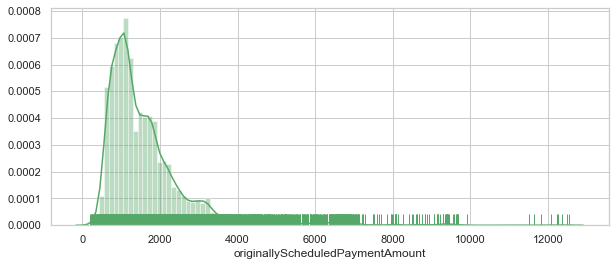

In [23]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.distplot(tloanfunded['originallyScheduledPaymentAmount'],bins=100,color='g',rug=True)

<b>The figure above shows the originally schedule payment amount are right skewed and the peak is around $1000.</b>

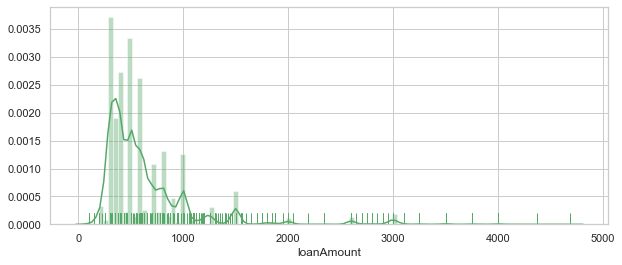

In [28]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.distplot(tloanfunded['loanAmount'],bins=100,color='g',rug=True)


<b>The figure above shows the loan amount are right skewed and the peak is around $300. </b>

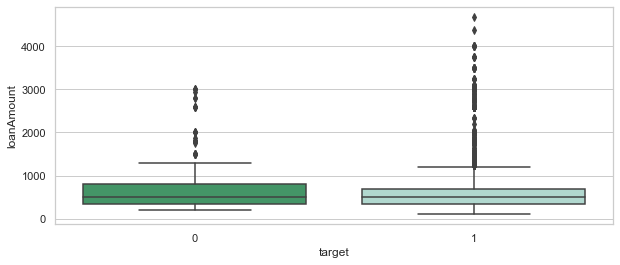

In [105]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 4))
sns.boxplot(x=tloanfunded['target'],
            y=tloanfunded['loanAmount'],
            palette=("BuGn_r"),
           data = tloanfunded)

<b>The boxplot above shows the of target -1 is having more outliers  than target - 0.</b>

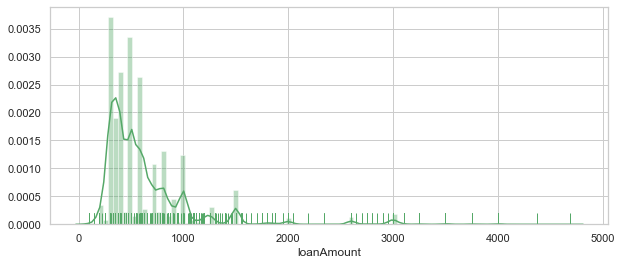

In [26]:
target1=tloanfunded[tloanfunded['target']==1]

sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.distplot(target1['loanAmount'],bins=100,color='g',rug=True)

<b>The figure above shows right skewed on target - 1 (the client we target) which having the peak around $300.</b>

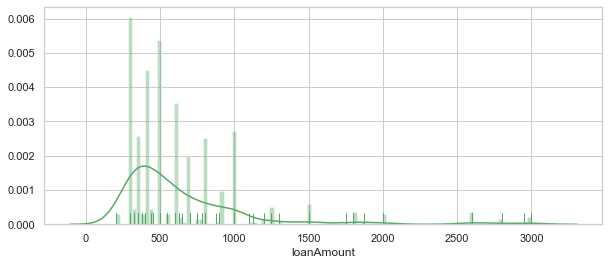

In [27]:
target0=tloanfunded[tloanfunded['target']==0]

sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.distplot(target0['loanAmount'],bins=100,color='g',rug=True)

<b>The figure above shows right skewed on target - 0 (the client we target) which having the peak around $400.

Hence, we can see that the target client (target - 1) will be more biased to the borrower which owe lesser amount when the loan becomes due.</b>

# Merge with payment dataset

In [29]:
payment = pd.read_csv('MoneyLion Assessment Questions/payment.csv',parse_dates=['paymentDate'])
payment

,loanId,installmentIndex,isCollection,paymentDate,principal,fees,paymentAmount,paymentStatus,paymentReturnCode
0,LL-I-00000021,1,False,2014-12-19 05:00:00,22.33,147.28,169.61,Checked,NaN
1,LL-I-00000021,2,False,2015-01-02 05:00:00,26.44,143.17,169.61,Checked,NaN
2,LL-I-00000021,3,False,2015-01-16 05:00:00,31.30,138.31,169.61,Checked,NaN
3,LL-I-00000021,4,False,2015-01-30 05:00:00,37.07,132.54,169.61,Checked,NaN
4,LL-I-00000021,5,False,2015-02-13 05:00:00,43.89,125.72,169.61,Checked,NaN
...,...,...,...,...,...,...,...,...,...
689359,LL-I-18629478,8,False,2017-07-14 04:00:00,45.62,17.67,63.29,None,NaN
689360,LL-I-18629478,9,False,2017-07-31 04:00:00,45.67,17.62,63.29,None,NaN
689361,LL-I-18629478,10,False,2017-08-15 04:00:00,51.12,12.17,63.29,None,NaN
689362,LL-I-18629478,11,False,2017-08-31 04:00:00,54.35,8.94,63.29,None,NaN


In [30]:
payment.info()
payment.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 689364 entries, 0 to 689363
Data columns (total 9 columns):
loanId               689364 non-null object
installmentIndex     689364 non-null int64
isCollection         689364 non-null bool
paymentDate          689364 non-null datetime64[ns]
principal            689364 non-null float64
fees                 689364 non-null float64
paymentAmount        689364 non-null float64
paymentStatus        689364 non-null object
paymentReturnCode    31533 non-null object
dtypes: bool(1), datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 42.7+ MB


(689364, 9)

In [33]:
pivotpayment= payment.pivot_table(index='loanId',values='installmentIndex',columns='paymentStatus',aggfunc='count',fill_value=0).rename_axis(None, axis=1).reset_index()
print(pivotpayment.isnull().sum().sort_values(ascending=False))

Skipped                    0
Returned                   0
Rejected Awaiting Retry    0
Rejected                   0
Pending                    0
None                       0
Complete                   0
Checked                    0
Cancelled                  0
loanId                     0
dtype: int64


In [34]:
tloanfunded1 =  (tloanfunded.merge(pivotpayment, on='loanId', how='left'))


In [36]:
tloanfunded1.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,target,Cancelled,Checked,Complete,None,Pending,Rejected,Rejected Awaiting Retry,Returned,Skipped
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,...,1,3.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,...,1,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,...,1,0.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,LL-I-09279047,1d249e27292d25e4d3b4bc142a2a4aea,W,404.1,2016-05-25 03:05:18.849,True,2016-05-25 15:11:36.260,3.0,True,1,...,1,21.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,LL-I-01316580,2a10b2e04c5eec9a47a8cf5b9b81a2b8,W,590.0,2015-05-26 17:02:27.312,True,2015-05-26 18:45:48.024,0.0,True,1,...,1,21.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [37]:
# Noticed that there are few missing values when merge dataset with pivotpayment.
print(tloanfunded1.isnull().sum().sort_values(ascending=False))

clarityFraudId                      2593
Skipped                                2
Returned                               2
Rejected Awaiting Retry                2
Rejected                               2
Pending                                2
None                                   2
Complete                               2
Checked                                2
Cancelled                              2
nPaidOff                               0
originatedDate                         0
originated                             0
anon_ssn                               0
applicationDate                        0
apr                                    0
payFrequency                           0
isFunded                               0
approved                               0
leadType                               0
loanStatus                             0
loanAmount                             0
originallyScheduledPaymentAmount       0
state                                  0
leadCost        

In [39]:
# Find the row of missing value column.
pd.isnull(tloanfunded1[['Skipped']]).any(1).nonzero()[0]

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  


array([ 443, 5724], dtype=int64)

In [40]:
# Locate the location of missing value and locate it to have a glance on the entire row
# then notice that the pivoted columnss are null 
tloanfunded1.iloc[[443]]

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,target,Cancelled,Checked,Complete,None,Pending,Rejected,Rejected Awaiting Retry,Returned,Skipped
443,LL-I-18584520,c4a4454a273e704224a9e4f791a68801,B,680.0,2017-03-17 21:44:59.440,True,2017-03-23 22:51:38.921,1.0,True,1,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
# Impute the null values with 0
cols = ["Skipped", "Rejected Awaiting Retry",'Rejected','Pending','None','Complete','Checked','Returned','Cancelled']
tloanfunded1[cols]=tloanfunded1[cols].fillna(0)

In [42]:
print(tloanfunded1.isnull().sum().sort_values(ascending=False))

clarityFraudId                      2593
Skipped                                0
state                                  0
anon_ssn                               0
payFrequency                           0
apr                                    0
applicationDate                        0
originated                             0
originatedDate                         0
nPaidOff                               0
approved                               0
isFunded                               0
loanStatus                             0
loanAmount                             0
originallyScheduledPaymentAmount       0
leadType                               0
Returned                               0
leadCost                               0
fpStatus                               0
hasCF                                  0
target                                 0
Cancelled                              0
Checked                                0
Complete                               0
None            

# Merge with clarity dataset

In [43]:
clarity = pd.read_csv('MoneyLion Assessment Questions/clarity_underwriting_variables.csv')
clarity.head()

C:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (9,11,12,13,14,15,16,17,18,19,20,21,22,23,25,26,27,28,29,31,32,33,36,37) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.twentyfourhoursago,.underwritingdataclarity.clearfraud.clearfraudinquiry.oneminuteago,.underwritingdataclarity.clearfraud.clearfraudinquiry.onehourago,.underwritingdataclarity.clearfraud.clearfraudinquiry.ninetydaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.tenminutesago,.underwritingdataclarity.clearfraud.clearfraudinquiry.fifteendaysago,.underwritingdataclarity.clearfraud.clearfraudinquiry.threesixtyfivedaysago,.underwritingdataclarity.clearfraud.clearfraudindicator.inquiryonfilecurrentaddressconflict,...,.underwritingdataclarity.clearfraud.clearfraudidentityverification.phonematchtypedescription,.underwritingdataclarity.clearfraud.clearfraudidentityverification.overallmatchresult,.underwritingdataclarity.clearfraud.clearfraudidentityverification.phonetype,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssndobreasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssnnamereasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.nameaddressreasoncode,.underwritingdataclarity.clearfraud.clearfraudidentityverification.ssndobmatch,.underwritingdataclarity.clearfraud.clearfraudidentityverification.overallmatchreasoncode,clearfraudscore,underwritingid
0,8.0,2.0,2.0,2.0,8.0,2.0,2.0,5.0,10.0,False,...,(M) Mobile Phone,partial,NaN,NaN,NaN,A8,match,6.0,871.0,54cbffcee4b0ba763e43144d
1,5.0,2.0,2.0,2.0,11.0,2.0,2.0,4.0,21.0,True,...,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,397.0,54cc0408e4b0418d9a7f78af
2,9.0,4.0,2.0,3.0,10.0,8.0,2.0,9.0,25.0,False,...,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,572.0,54cc0683e4b0418d9a80adb6
3,3.0,2.0,2.0,2.0,9.0,2.0,2.0,2.0,9.0,False,...,(M) Mobile Phone,partial,NaN,NaN,NaN,NaN,match,11.0,838.0,54cc0780e4b0ba763e43b74a
4,5.0,5.0,2.0,2.0,6.0,5.0,2.0,5.0,6.0,False,...,(M) Mobile Phone,match,NaN,NaN,NaN,NaN,match,1.0,768.0,54cc1d67e4b0ba763e445b45


In [44]:
clarity.info()
clarity.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49752 entries, 0 to 49751
Data columns (total 54 columns):
.underwritingdataclarity.clearfraud.clearfraudinquiry.thirtydaysago                                    49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.twentyfourhoursago                               49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.oneminuteago                                     49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.onehourago                                       49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.ninetydaysago                                    49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.sevendaysago                                     49750 non-null float64
.underwritingdataclarity.clearfraud.clearfraudinquiry.tenminutesago                                    49750 non-null float64
.underwri

(49752, 54)

In [45]:
# Subset 2 important attributes for merging purposes.
# Then merge with tloanfunded1 dataset.

clarity1=clarity[['clearfraudscore','underwritingid']]
tloanfunded2 = tloanfunded1.merge(clarity1,left_on='clarityFraudId',right_on='underwritingid',how='left')

In [47]:
# Check missing values and notice 3 attributes are having missing values. 
# Impute on clearfraudscore ONLY as underwritingid and clarityFraudid are id variables (cannot be imputed).

print(tloanfunded2.isnull().sum().sort_values(ascending=False))

clearfraudscore                     2634
underwritingid                      2604
clarityFraudId                      2593
state                                  0
anon_ssn                               0
payFrequency                           0
apr                                    0
applicationDate                        0
originated                             0
originatedDate                         0
nPaidOff                               0
approved                               0
isFunded                               0
loanStatus                             0
loanAmount                             0
originallyScheduledPaymentAmount       0
leadCost                               0
leadType                               0
fpStatus                               0
hasCF                                  0
target                                 0
Cancelled                              0
Checked                                0
Complete                               0
None            

In [70]:
# to compute correlation plot, need to include numeric datatype attributes only.
forcorr = tloanfunded2.select_dtypes(exclude=['object','datetime64','bool'])
forcorr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12620 entries, 0 to 12619
Data columns (total 18 columns):
apr                                 12620 non-null float64
nPaidOff                            12620 non-null float64
isFunded                            12620 non-null int64
loanAmount                          12620 non-null float64
originallyScheduledPaymentAmount    12620 non-null float64
leadCost                            12620 non-null int64
hasCF                               12620 non-null int64
target                              12620 non-null int32
Cancelled                           12620 non-null float64
Checked                             12620 non-null float64
Complete                            12620 non-null float64
None                                12620 non-null float64
Pending                             12620 non-null float64
Rejected                            12620 non-null float64
Rejected Awaiting Retry             12620 non-null float64
Returned      

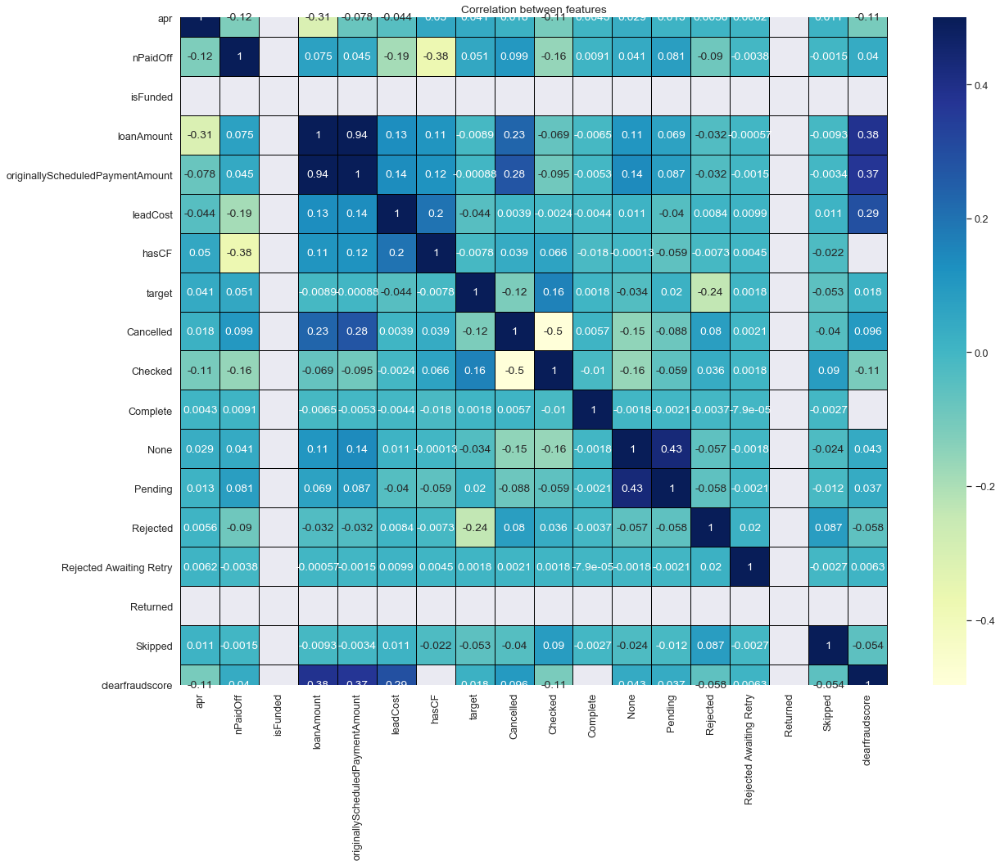

In [71]:
corr=forcorr.corr()

sns.set(font_scale=1.15)
plt.figure(figsize=(20, 15))

sns.heatmap(corr, vmax=.5, linewidths=0.01,
            square=True,annot=True,cmap='YlGnBu',linecolor="black")
plt.title('Correlation between features');

<br>From the above correlation plot, can know that the highest correlated attributes to 'clearfraudscore' are 'loanAmount', 'originallyScheduledPaymentAmount' and 'leadCost'. Therefore we use these attributes to perform knn imputation on 'clearfraudscore'</br>

In [78]:
# df1 ==> Dataset with no imputed attributes
# df2 ==> Attributes for imputation

cols=['loanAmount','clearfraudscore','leadCost','originallyScheduledPaymentAmount']
df1 = tloanfunded2.drop(cols,axis=1)
df2 = tloanfunded2[cols]

In [80]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2)
df2_imputed = imputer.fit_transform(df2)
df2_imputed = pd.DataFrame(df2_imputed)
df2_imputed

,0,1,2,3
0,3000.0,879.0,0.0,6395.19
1,1250.0,835.0,0.0,3313.78
2,800.0,624.0,10.0,2432.08
3,300.0,770.0,0.0,422.64
4,300.0,648.5,6.0,896.87
...,...,...,...,...
12615,1500.0,925.0,25.0,5111.56
12616,600.0,780.5,0.0,1670.18
12617,375.0,700.0,25.0,1042.40
12618,400.0,806.0,40.0,664.12


In [82]:
df2_imputed = df2_imputed.rename(columns = {0: "loanAmount", 
                                            1:"clearfraudscore", 
                                            2:'leadCost',
                                            3:'originallyScheduledPaymentAmount'})
df2_imputed.head()

,loanAmount,clearfraudscore,leadCost,originallyScheduledPaymentAmount
0,3000.0,879.0,0.0,6395.19
1,1250.0,835.0,0.0,3313.78
2,800.0,624.0,10.0,2432.08
3,300.0,770.0,0.0,422.64
4,300.0,648.5,6.0,896.87


In [290]:
# Concatenate dataset and formed imputed 'clearfraudscore' dataset
tloanfunded2 = pd.concat([df1,df2_imputed], axis=1, sort=False)

# Check any missing values other than id var
print(tloanfunded2.isnull().sum().sort_values(ascending=False))

underwritingid                      2604
clarityFraudId                      2593
originallyScheduledPaymentAmount       0
anon_ssn                               0
payFrequency                           0
apr                                    0
applicationDate                        0
originated                             0
originatedDate                         0
nPaidOff                               0
approved                               0
isFunded                               0
loanStatus                             0
state                                  0
leadType                               0
fpStatus                               0
hasCF                                  0
leadCost                               0
target                                 0
Cancelled                              0
Checked                                0
Complete                               0
None                                   0
Pending                                0
Rejected        

In [291]:
tloanfunded2['ssnLoanCount'] = tloanfunded2['anon_ssn'].map(tloanfunded2.groupby('anon_ssn')['loanId'].size())
tloanfunded2['HoursTaken'] = (tloanfunded2['originatedDate'] - tloanfunded2['applicationDate']).astype('timedelta64[h]').astype(int)
tloanfunded2["ApplyDay"] = tloanfunded2["applicationDate"].apply(lambda x: x.day)
tloanfunded2["ApplyMonth"] = tloanfunded2["applicationDate"].apply(lambda x: x.month)
tloanfunded2["ApplyYear"] = tloanfunded2["applicationDate"].apply(lambda x: x.year)
tloanfunded2.head()

,loanId,anon_ssn,payFrequency,apr,applicationDate,originated,originatedDate,nPaidOff,approved,isFunded,...,underwritingid,loanAmount,clearfraudscore,leadCost,originallyScheduledPaymentAmount,ssnLoanCount,HoursTaken,ApplyDay,ApplyMonth,ApplyYear
0,LL-I-06644937,464f5d9ae4fa09ece4048d949191865c,B,199.0,2016-01-19 22:07:36.778,True,2016-01-20 15:49:18.846,0.0,True,1,...,569eb3a3e4b096699f685d64,3000.0,879.0,0.0,6395.19,1,17,19,1,2016
1,LL-I-16519347,bc9fa73468acf18cb968a3a6a3c4697c,S,490.0,2017-01-31 17:48:17.381,True,2017-01-31 18:00:14.520,2.0,True,1,...,58450a15e4b0bb9d6d7344c7,1250.0,835.0,0.0,3313.78,4,0,31,1,2017
2,LL-I-11506719,10cefd11d41612b032fd9cd2debe32dc,B,590.0,2016-08-27 09:08:05.442,True,2016-08-29 15:05:04.014,0.0,True,1,...,578f9346e4b0810ad5e7b72e,800.0,624.0,10.0,2432.08,1,53,27,8,2016
3,LL-I-09279047,1d249e27292d25e4d3b4bc142a2a4aea,W,404.1,2016-05-25 03:05:18.849,True,2016-05-25 15:11:36.260,3.0,True,1,...,56621584e4b0100e84141586,300.0,770.0,0.0,422.64,3,12,25,5,2016
4,LL-I-01316580,2a10b2e04c5eec9a47a8cf5b9b81a2b8,W,590.0,2015-05-26 17:02:27.312,True,2015-05-26 18:45:48.024,0.0,True,1,...,NaN,300.0,648.5,6.0,896.87,1,1,26,5,2015


In [115]:
# From this we can know who is the top 10 client have the highest count of ssnLoanCount

popularcustL = tloanfunded2[['anon_ssn','ssnLoanCount']]
popularcustL.drop_duplicates().sort_values(by='ssnLoanCount', ascending=False).iloc[:10,:]

,anon_ssn,ssnLoanCount
1024,228060b9cc8af6a937d0321122d459f3,12
1330,6877f00bb6989f7d49b2b80ecb52e589,10
1240,e1a86024a1433fa71989ac32bb4255c4,8
1628,b4a3dc71f61eab12616cbd41c27b7788,8
1527,b8220b6957a50194e6f21b325e4eecb7,7
165,c8bb49de1f8ff99d2ecddfb7037dc66e,7
5945,517eaf8f849846fe5a5dfb5f573bb8cd,7
1276,851814124538d1c642d4c403f4706089,7
3299,7732b7bf2d3fc1083884ed363109dc63,6
524,39fe1fcc437429b12d635e75d550f631,6


In [128]:
# From this we can know who is the top 10 client have the highest count of nPaidOff.
# Then we can do some promotion for these clients

idx = popularcustP.groupby(['anon_ssn'])['nPaidOff'].transform(max) == popularcustP['nPaidOff']
popularcustP[idx].drop_duplicates().sort_values(by='nPaidOff', ascending=False).iloc[:10,:]

,anon_ssn,nPaidOff
1917,a790684c26f4512cf710234b2e6eb439,21.0
7971,7bb3124f05c1cab0c0fd0230d7c9ce78,20.0
7731,6ccac7d328be1bc131c5b2acd7b151a6,19.0
1029,d22cc7f8658931b682e12bd7c3d9fb41,19.0
418,6e4505663f2b72d16ff14793dc5bdce1,18.0
10084,55bb2a3d4d245ae623851f3ef1b83492,18.0
10402,3e3de36554babaf84e109021f68b22df,18.0
1740,228060b9cc8af6a937d0321122d459f3,15.0
6432,39f077d513d4b2d6758b7ec15c295163,14.0
2672,46f486a4a0a9ebac694bb85210432af9,14.0


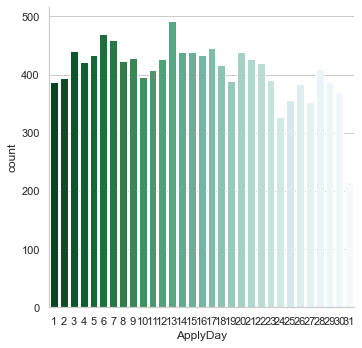

In [316]:
sns.set(style="whitegrid")
sns.catplot(x="ApplyDay",
            kind="count", 
            palette="BuGn_r",
            data=tloanfunded2);

<b>Figure above shows that there are more application on first half of month.</b>

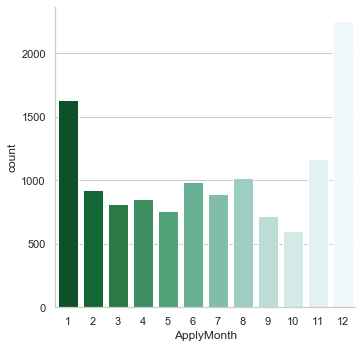

In [142]:
sns.catplot(x="ApplyMonth",
            kind="count",
            palette="BuGn_r",
            data=tloanfunded2);

<b>Figure above shows that there are more application on December.</b>

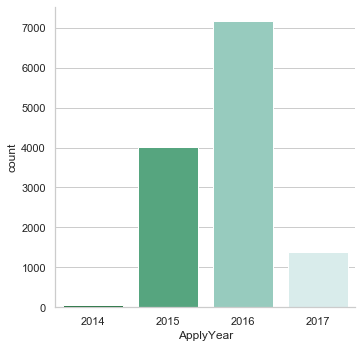

In [143]:
sns.catplot(x="ApplyYear",
            kind="count", 
            palette="BuGn_r", 
            data=tloanfunded2);

<b> Figure above shows that there are more application on year of 2016 </b>

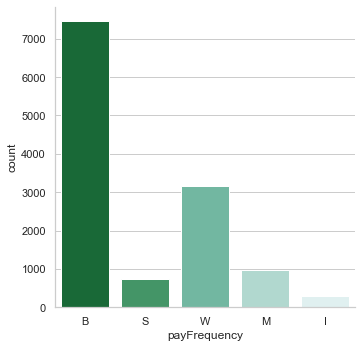

In [100]:
sns.catplot(x="payFrequency",
            kind="count", 
            palette="BuGn_r",
            data=tloanfunded2);

 <b>The figure above indicates the repayment frequency of the loan is more active on biweekly payments</b>

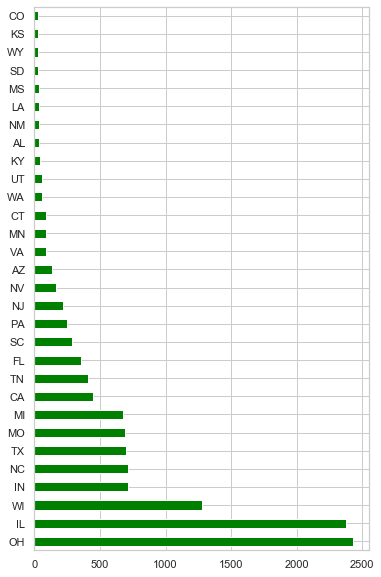

In [308]:
import matplotlib.pyplot as plt
tloanfunded2['state'].value_counts().head(30).plot(kind='barh',color='green', figsize=(6,10))

<b>Figure Above shows the most frequent loan funded state.</b>

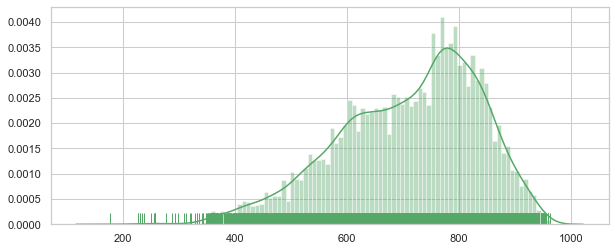

In [300]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.distplot(tloanfunded2[['clearfraudscore']],
             bins=100,
             color='g',
             rug=True)

<b>The figure above shows clearfraud score have the peak around 780. </b>

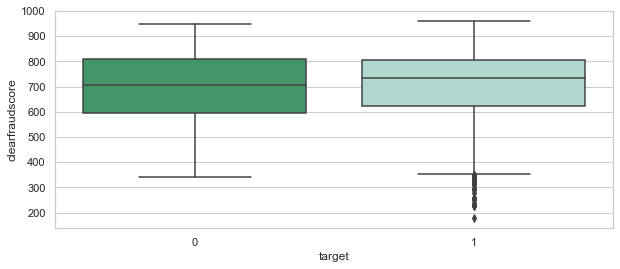

In [103]:
plt.figure(figsize=(10, 4))
sns.boxplot(x = 'target',
            y="clearfraudscore", 
            palette=("BuGn_r"),
            data=tloanfunded2)

<b>Figure above shows target = 1 has more outliers than target = 0. 
However, the median of clearfraudscore of target = 1 is slightly above target = 0.</b>

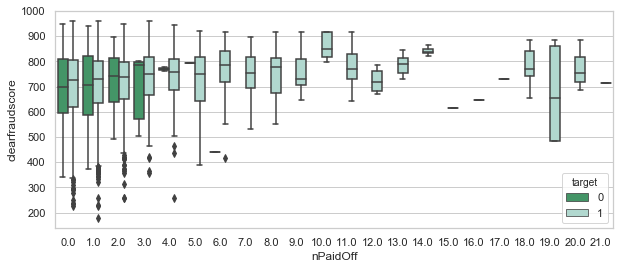

In [317]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 4))
sns.boxplot(x="nPaidOff",
            y="clearfraudscore",
            hue="target", 
            palette=("BuGn_r"),
            data=tloanfunded2)

<b>Figure above shows target = 0 (the client we avoid) have the most nPaidOff at 3 times only. Meaning it is less likely to be the regular customer.</b>

#  Drop meaningless attributes

In [224]:
tloanfunded2 = tloanfunded2.drop(['loanId','anon_ssn','applicationDate','originated','originatedDate','loanStatus','approved','isFunded','clarityFraudId','underwritingid'], axis=1)

In [225]:
tloanfunded2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12620 entries, 0 to 12619
Data columns (total 26 columns):
payFrequency                        12620 non-null object
apr                                 12620 non-null float64
nPaidOff                            12620 non-null float64
state                               12620 non-null object
leadType                            12620 non-null object
fpStatus                            12620 non-null object
hasCF                               12620 non-null int64
target                              12620 non-null int32
Cancelled                           12620 non-null float64
Checked                             12620 non-null float64
Complete                            12620 non-null float64
None                                12620 non-null float64
Pending                             12620 non-null float64
Rejected                            12620 non-null float64
Rejected Awaiting Retry             12620 non-null float64
Returned      

In [226]:
tloanfunded2['originallyScheduledPaymentAmount']=tloanfunded2['originallyScheduledPaymentAmount'].round()
tloanfunded2.head(3)

,payFrequency,apr,nPaidOff,state,leadType,fpStatus,hasCF,target,Cancelled,Checked,...,Skipped,loanAmount,clearfraudscore,leadCost,originallyScheduledPaymentAmount,ssnLoanCount,HoursTaken,ApplyDay,ApplyMonth,ApplyYear
0,B,199.0,0.0,CA,prescreen,Checked,1,1,3.0,22.0,...,0.0,3000.0,879.0,0.0,6395.0,1,17,19,1,2016
1,S,490.0,2.0,MO,organic,Checked,1,1,12.0,1.0,...,0.0,1250.0,835.0,0.0,3314.0,4,0,31,1,2017
2,B,590.0,0.0,CA,bvMandatory,Checked,1,1,0.0,13.0,...,0.0,800.0,624.0,10.0,2432.0,1,53,27,8,2016


In [227]:
# tostr = ['apr','nPaidOff', 'Cancelled','Checked','Complete','None','Pending','Rejected','Rejected Awaiting Retry', 'Returned', 'Skipped','clearfraudscore']
toint = ['leadCost','loanAmount','originallyScheduledPaymentAmount','apr','nPaidOff', 'Cancelled','Checked','Complete','None','Pending','Rejected','Rejected Awaiting Retry', 'Returned', 'Skipped','clearfraudscore']

In [228]:
# tloanfunded2[tostr] = tloanfunded2[tostr].astype(str)
tloanfunded2[toint] = tloanfunded2[toint].astype(int)
tloanfunded2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12620 entries, 0 to 12619
Data columns (total 26 columns):
payFrequency                        12620 non-null object
apr                                 12620 non-null int32
nPaidOff                            12620 non-null int32
state                               12620 non-null object
leadType                            12620 non-null object
fpStatus                            12620 non-null object
hasCF                               12620 non-null int64
target                              12620 non-null int32
Cancelled                           12620 non-null int32
Checked                             12620 non-null int32
Complete                            12620 non-null int32
None                                12620 non-null int32
Pending                             12620 non-null int32
Rejected                            12620 non-null int32
Rejected Awaiting Retry             12620 non-null int32
Returned                        

In [229]:
# Separate input features and target
x_data = tloanfunded2.drop(columns=['target'])
y_data = tloanfunded2['target']

In [230]:
x_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12620 entries, 0 to 12619
Data columns (total 25 columns):
payFrequency                        12620 non-null object
apr                                 12620 non-null int32
nPaidOff                            12620 non-null int32
state                               12620 non-null object
leadType                            12620 non-null object
fpStatus                            12620 non-null object
hasCF                               12620 non-null int64
Cancelled                           12620 non-null int32
Checked                             12620 non-null int32
Complete                            12620 non-null int32
None                                12620 non-null int32
Pending                             12620 non-null int32
Rejected                            12620 non-null int32
Rejected Awaiting Retry             12620 non-null int32
Returned                            12620 non-null int32
Skipped                         

In [321]:
# Apply oversampling method

from sklearn.utils import resample
from sklearn.model_selection import train_test_split

xtrain, xtest, ytrain, ytest = train_test_split(x_data, y_data,random_state=123, test_size=0.30)

# concatenate our training data back together
x_sample = pd.concat([xtrain, ytrain], axis=1)
targetcust = x_sample[x_sample['target']== 1] 
ntargetcust = x_sample[x_sample['target']== 0]  


ntargetcust_upsampled = resample(ntargetcust,
                          replace=True, # sample with replacement
                          n_samples=len(targetcust), # match number in majority class
                          random_state=123) # reproducible results


otloanfunded2 = pd.concat([targetcust, ntargetcust_upsampled])



In [320]:
otloanfunded2['target'].mean()

0.5

In [232]:
# Perform one hot encoding
from sklearn.preprocessing import LabelEncoder
var = ['payFrequency','leadType','fpStatus','state']

for i in var:
    le = LabelEncoder()
    otloanfunded2[i +'_label'] = le.fit_transform(otloanfunded2[i])

In [233]:
otloanfunded2 = otloanfunded2.drop(var, axis=1)


After oversampling method, the target are balanced.

In [234]:
ratio=otloanfunded2["target"]
np.mean(ratio)

0.5

In [235]:

x_data = otloanfunded2.drop(columns=['target'])
y_data = otloanfunded2['target']

# setting up testing and training set
xtrain, xtest, ytrain, ytest = train_test_split(x_data, y_data,random_state=123, test_size=0.30)
methodDict = {}
rmseDict = ()

# Data Modelling and Parameter Tuning
* We used 3 tree-based models to perform data modelling which are Random Forest, XGBoost and Catboost.
* We do not use feature selection as trees algorithm will select suitable features for computation.
* Tree-based models are used because from the data visualization, many outliers were detected.
* Confusion Matrix will be shown and Cross-validation will be performed. 
* AUC will be focused as false negative is very important for this case as it will lead to huge loss if the models missed the potential customer.

In [236]:
# function for evaluation
def evalClassModel(model, ytest, y_pred_class, plot=False):

    confusion = confusion_matrix(ytest, y_pred_class)
    TP = confusion[1, 1]
    TN = confusion[0, 0]
    FP = confusion[0, 1]
    FN = confusion[1, 0]
    sns.heatmap(confusion,annot=True,fmt="d") 
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
    
    accuracy = metrics.accuracy_score(ytest, y_pred_class)
    print('TP:', TP)
    print('TN:', TN)
    print('FP:', FP)
    print('FN:', FN)
    
    print('Classification Accuracy:', accuracy)    
    print('F1 Score:',f1_score(ytest, y_pred_class))
    print('AUC Score:', metrics.roc_auc_score(ytest, y_pred_class))
    print('Cross-validated AUC:', cross_val_score(model, x_data, y_data, cv=50, scoring='roc_auc').mean())
  
    return accuracy

## Random Forest

########### Random Forests ###############


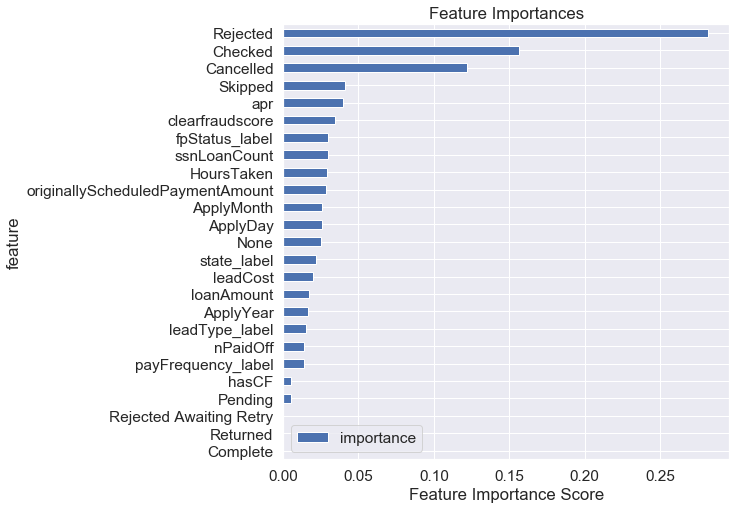

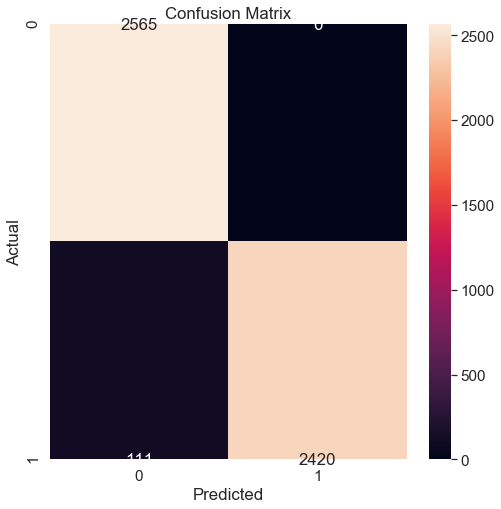

TP: 2420
TN: 2565
FP: 0
FN: 111
Classification Accuracy: 0.9782182103610675
F1 Score: 0.9775802868107453
AUC Score: 0.9780719083366258
Cross-validated AUC: 0.9997014516492291


In [237]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, roc_auc_score,log_loss,f1_score,confusion_matrix
from sklearn.model_selection import cross_val_score

def randomForest():
    # Building and fitting my_forest
    forest = RandomForestClassifier(max_depth = None, min_samples_leaf=8, min_samples_split=2, n_estimators = 50, random_state = 123)
    my_forest = forest.fit(xtrain, ytrain)
    
    # make class predictions for the testing set
    y_pred_class = my_forest.predict(xtest)
    
    print('########### Random Forests ###############')
    feat_imp = pd.DataFrame({'importance':my_forest.feature_importances_})    
    feat_imp['feature'] = xtrain.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:xtrain.shape[1]]
    
    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(title="Feature Importances", figsize=(8,8))
    plt.xlabel('Feature Importance Score')
    plt.show()
    
    accuracy_score = evalClassModel(my_forest, ytest, y_pred_class, True)

    methodDict['R. Forest'] = accuracy_score * 100
    
randomForest()

## XGBoost

In [238]:
from scipy.stats import randint
from scipy.stats import uniform
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
param_distributions={'max_depth': randint(1, 11),
                    'subsample': uniform(0.25, 0.75),
                    'colsample_bytree': uniform(0.25, 0.75),
                    "learning_rate": [0.05, 0.1,0.16]
                         
                    }
xgModel = XGBClassifier()
xgModel.fit(xtrain, ytrain)
rs = RandomizedSearchCV(xgModel,
                        param_distributions,
                        cv=10,
                        n_iter=10,
                        scoring="accuracy",
                        n_jobs=1,
                        verbose=False,
                        random_state=123)

########### Extreme Gradient Boosting ###############


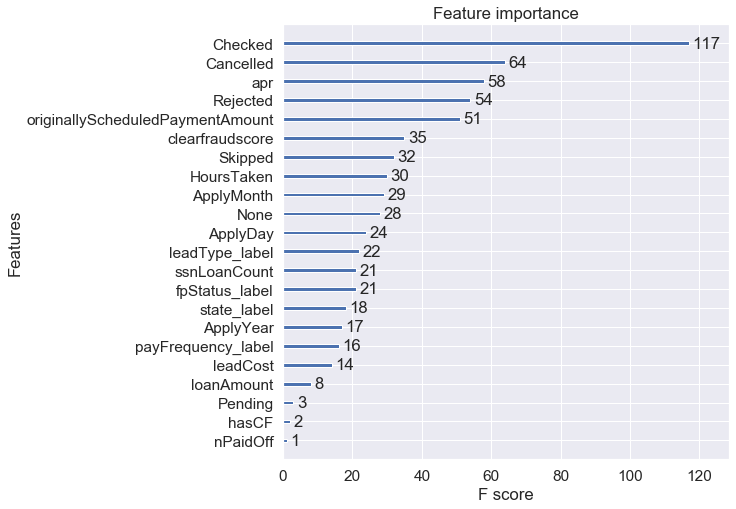

<Figure size 1440x1280 with 0 Axes>

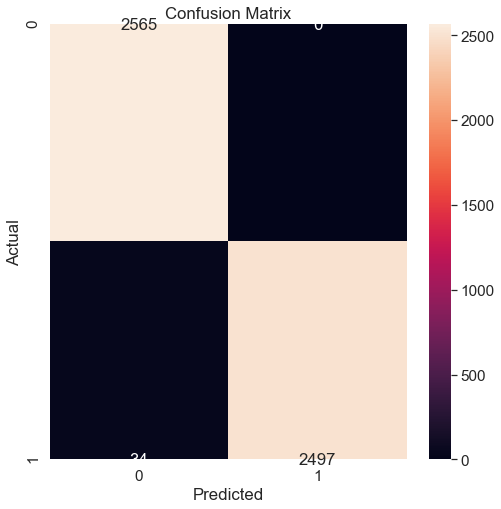

TP: 2497
TN: 2565
FP: 0
FN: 34
Classification Accuracy: 0.9933281004709577
F1 Score: 0.9932378679395386
AUC Score: 0.9932832872382458
Cross-validated AUC: 0.9838478286685368


In [239]:
from xgboost import plot_importance
rs.fit(xtrain, ytrain)
y_pred_class = rs.predict(xtest)

print('########### Extreme Gradient Boosting ###############')
    
# plot feature importance
plot_importance(xgModel)
plt.figure(figsize = (18,16), dpi=80,facecolor='w',edgecolor='k')
plt.rcParams['figure.figsize'] = [8,8]
plt.show()

accuracy_score = evalClassModel(xgModel, ytest, y_pred_class, True)

methodDict['XGBClassifier.'] = accuracy_score * 100



In [314]:
rs.best_params_

{'colsample_bytree': 0.6634860768121684,
 'learning_rate': 0.16,
 'max_depth': 10,
 'subsample': 0.9855731487884616}

## CatBoost


In [242]:
#categorical_features = np.where(x_data.dtypes == 'object')[0]
categorical_features_indices = np.where(tloanfunded2.dtypes == 'object')[0]
categorical_features_indices

array([0, 3, 4, 5], dtype=int64)

In [244]:
from catboost import CatBoostClassifier
param_distributions={'colsample_bylevel': uniform(0.25, 0.75),
                    'learning_rate': [0.03, 0.1],
                    'depth': [4, 6, 10],
                    'l2_leaf_reg': [1, 3, 5, 7, 9]
                    }
catModel = CatBoostClassifier(cat_features=categorical_features_indices)
catModel.fit(xtrain, ytrain)
cat = RandomizedSearchCV(catModel,
                            param_distributions,
                            cv=10,
                            n_iter=10,
                            scoring="accuracy",
                            n_jobs=1,
                            verbose=False, random_state=7)

Learning rate set to 0.029649
0:	learn: 0.6606199	total: 82.8ms	remaining: 1m 22s
1:	learn: 0.6317585	total: 112ms	remaining: 56.1s
2:	learn: 0.6065855	total: 130ms	remaining: 43.4s
3:	learn: 0.5824534	total: 145ms	remaining: 36.1s
4:	learn: 0.5627942	total: 164ms	remaining: 32.6s
5:	learn: 0.5402479	total: 181ms	remaining: 29.9s
6:	learn: 0.5234301	total: 213ms	remaining: 30.2s
7:	learn: 0.5068847	total: 232ms	remaining: 28.8s
8:	learn: 0.4817759	total: 260ms	remaining: 28.6s
9:	learn: 0.4610404	total: 280ms	remaining: 27.7s
10:	learn: 0.4415984	total: 299ms	remaining: 26.9s
11:	learn: 0.4235873	total: 318ms	remaining: 26.2s
12:	learn: 0.4048318	total: 332ms	remaining: 25.2s
13:	learn: 0.3888424	total: 359ms	remaining: 25.3s
14:	learn: 0.3742349	total: 377ms	remaining: 24.8s
15:	learn: 0.3590553	total: 402ms	remaining: 24.7s
16:	learn: 0.3471479	total: 421ms	remaining: 24.3s
17:	learn: 0.3363685	total: 441ms	remaining: 24s
18:	learn: 0.3273174	total: 458ms	remaining: 23.6s
19:	learn: 

166:	learn: 0.0732759	total: 3.87s	remaining: 19.3s
167:	learn: 0.0730694	total: 3.9s	remaining: 19.3s
168:	learn: 0.0726713	total: 3.92s	remaining: 19.3s
169:	learn: 0.0724724	total: 3.94s	remaining: 19.2s
170:	learn: 0.0722399	total: 3.95s	remaining: 19.2s
171:	learn: 0.0719733	total: 3.97s	remaining: 19.1s
172:	learn: 0.0717214	total: 4s	remaining: 19.1s
173:	learn: 0.0715205	total: 4.02s	remaining: 19.1s
174:	learn: 0.0712718	total: 4.04s	remaining: 19s
175:	learn: 0.0710483	total: 4.06s	remaining: 19s
176:	learn: 0.0707102	total: 4.07s	remaining: 18.9s
177:	learn: 0.0705932	total: 4.09s	remaining: 18.9s
178:	learn: 0.0703263	total: 4.11s	remaining: 18.9s
179:	learn: 0.0699857	total: 4.13s	remaining: 18.8s
180:	learn: 0.0698080	total: 4.15s	remaining: 18.8s
181:	learn: 0.0695532	total: 4.18s	remaining: 18.8s
182:	learn: 0.0694064	total: 4.2s	remaining: 18.8s
183:	learn: 0.0691531	total: 4.23s	remaining: 18.7s
184:	learn: 0.0689662	total: 4.25s	remaining: 18.7s
185:	learn: 0.0687452

329:	learn: 0.0476533	total: 7.95s	remaining: 16.1s
330:	learn: 0.0475537	total: 7.97s	remaining: 16.1s
331:	learn: 0.0474209	total: 7.99s	remaining: 16.1s
332:	learn: 0.0473783	total: 8.01s	remaining: 16.1s
333:	learn: 0.0472886	total: 8.03s	remaining: 16s
334:	learn: 0.0471659	total: 8.05s	remaining: 16s
335:	learn: 0.0470481	total: 8.07s	remaining: 16s
336:	learn: 0.0469569	total: 8.09s	remaining: 15.9s
337:	learn: 0.0468782	total: 8.11s	remaining: 15.9s
338:	learn: 0.0467772	total: 8.13s	remaining: 15.9s
339:	learn: 0.0467260	total: 8.16s	remaining: 15.8s
340:	learn: 0.0465700	total: 8.18s	remaining: 15.8s
341:	learn: 0.0464891	total: 8.2s	remaining: 15.8s
342:	learn: 0.0462703	total: 8.22s	remaining: 15.8s
343:	learn: 0.0461478	total: 8.25s	remaining: 15.7s
344:	learn: 0.0460595	total: 8.27s	remaining: 15.7s
345:	learn: 0.0460143	total: 8.29s	remaining: 15.7s
346:	learn: 0.0459251	total: 8.32s	remaining: 15.7s
347:	learn: 0.0458522	total: 8.33s	remaining: 15.6s
348:	learn: 0.04577

494:	learn: 0.0347581	total: 11.9s	remaining: 12.2s
495:	learn: 0.0347265	total: 11.9s	remaining: 12.1s
496:	learn: 0.0346757	total: 12s	remaining: 12.1s
497:	learn: 0.0345520	total: 12s	remaining: 12.1s
498:	learn: 0.0344918	total: 12s	remaining: 12.1s
499:	learn: 0.0344348	total: 12.1s	remaining: 12.1s
500:	learn: 0.0343823	total: 12.1s	remaining: 12s
501:	learn: 0.0343176	total: 12.1s	remaining: 12s
502:	learn: 0.0342070	total: 12.2s	remaining: 12s
503:	learn: 0.0341490	total: 12.2s	remaining: 12s
504:	learn: 0.0341112	total: 12.2s	remaining: 12s
505:	learn: 0.0340116	total: 12.2s	remaining: 11.9s
506:	learn: 0.0339842	total: 12.3s	remaining: 11.9s
507:	learn: 0.0339665	total: 12.3s	remaining: 11.9s
508:	learn: 0.0338942	total: 12.3s	remaining: 11.9s
509:	learn: 0.0338474	total: 12.3s	remaining: 11.8s
510:	learn: 0.0338223	total: 12.3s	remaining: 11.8s
511:	learn: 0.0337650	total: 12.4s	remaining: 11.8s
512:	learn: 0.0336952	total: 12.4s	remaining: 11.8s
513:	learn: 0.0335622	total:

655:	learn: 0.0258083	total: 15.9s	remaining: 8.35s
656:	learn: 0.0257433	total: 16s	remaining: 8.33s
657:	learn: 0.0257004	total: 16s	remaining: 8.3s
658:	learn: 0.0256622	total: 16s	remaining: 8.28s
659:	learn: 0.0256256	total: 16s	remaining: 8.26s
660:	learn: 0.0255909	total: 16s	remaining: 8.22s
661:	learn: 0.0255777	total: 16.1s	remaining: 8.2s
662:	learn: 0.0255680	total: 16.1s	remaining: 8.18s
663:	learn: 0.0255621	total: 16.1s	remaining: 8.15s
664:	learn: 0.0255306	total: 16.1s	remaining: 8.12s
665:	learn: 0.0254886	total: 16.1s	remaining: 8.1s
666:	learn: 0.0254262	total: 16.2s	remaining: 8.07s
667:	learn: 0.0254170	total: 16.2s	remaining: 8.04s
668:	learn: 0.0254082	total: 16.2s	remaining: 8.01s
669:	learn: 0.0253732	total: 16.2s	remaining: 7.99s
670:	learn: 0.0253643	total: 16.2s	remaining: 7.96s
671:	learn: 0.0253509	total: 16.3s	remaining: 7.93s
672:	learn: 0.0252900	total: 16.3s	remaining: 7.91s
673:	learn: 0.0252812	total: 16.3s	remaining: 7.89s
674:	learn: 0.0252549	tot

817:	learn: 0.0203779	total: 20s	remaining: 4.44s
818:	learn: 0.0203587	total: 20s	remaining: 4.42s
819:	learn: 0.0203439	total: 20s	remaining: 4.39s
820:	learn: 0.0203169	total: 20s	remaining: 4.37s
821:	learn: 0.0202790	total: 20.1s	remaining: 4.35s
822:	learn: 0.0202480	total: 20.1s	remaining: 4.32s
823:	learn: 0.0202226	total: 20.1s	remaining: 4.3s
824:	learn: 0.0201994	total: 20.2s	remaining: 4.28s
825:	learn: 0.0201565	total: 20.2s	remaining: 4.26s
826:	learn: 0.0201402	total: 20.2s	remaining: 4.23s
827:	learn: 0.0201133	total: 20.3s	remaining: 4.21s
828:	learn: 0.0200720	total: 20.3s	remaining: 4.18s
829:	learn: 0.0200258	total: 20.3s	remaining: 4.16s
830:	learn: 0.0199990	total: 20.4s	remaining: 4.14s
831:	learn: 0.0199853	total: 20.4s	remaining: 4.11s
832:	learn: 0.0199684	total: 20.4s	remaining: 4.09s
833:	learn: 0.0199392	total: 20.4s	remaining: 4.06s
834:	learn: 0.0199263	total: 20.4s	remaining: 4.04s
835:	learn: 0.0198868	total: 20.5s	remaining: 4.01s
836:	learn: 0.0198681

982:	learn: 0.0163120	total: 24.4s	remaining: 421ms
983:	learn: 0.0162824	total: 24.4s	remaining: 396ms
984:	learn: 0.0162690	total: 24.4s	remaining: 372ms
985:	learn: 0.0162216	total: 24.4s	remaining: 347ms
986:	learn: 0.0161817	total: 24.5s	remaining: 322ms
987:	learn: 0.0161545	total: 24.5s	remaining: 298ms
988:	learn: 0.0161512	total: 24.5s	remaining: 273ms
989:	learn: 0.0161295	total: 24.6s	remaining: 248ms
990:	learn: 0.0161072	total: 24.6s	remaining: 223ms
991:	learn: 0.0160570	total: 24.6s	remaining: 198ms
992:	learn: 0.0160491	total: 24.6s	remaining: 174ms
993:	learn: 0.0160208	total: 24.6s	remaining: 149ms
994:	learn: 0.0159997	total: 24.7s	remaining: 124ms
995:	learn: 0.0159846	total: 24.7s	remaining: 99.1ms
996:	learn: 0.0159746	total: 24.7s	remaining: 74.4ms
997:	learn: 0.0159574	total: 24.7s	remaining: 49.6ms
998:	learn: 0.0159574	total: 24.8s	remaining: 24.8ms
999:	learn: 0.0159426	total: 24.8s	remaining: 0us


In [245]:
cat.fit(xtrain, ytrain)
y_pred_class = cat.predict(xtest)

0:	learn: 0.6021409	total: 31.8ms	remaining: 31.8s
1:	learn: 0.5352830	total: 56.5ms	remaining: 28.2s
2:	learn: 0.4668925	total: 79.2ms	remaining: 26.3s
3:	learn: 0.4047333	total: 101ms	remaining: 25.1s
4:	learn: 0.3633921	total: 129ms	remaining: 25.8s
5:	learn: 0.3312878	total: 160ms	remaining: 26.4s
6:	learn: 0.3113791	total: 190ms	remaining: 26.9s
7:	learn: 0.2881105	total: 211ms	remaining: 26.1s
8:	learn: 0.2488862	total: 228ms	remaining: 25.1s
9:	learn: 0.2192585	total: 244ms	remaining: 24.2s
10:	learn: 0.1985426	total: 264ms	remaining: 23.7s
11:	learn: 0.1897020	total: 286ms	remaining: 23.6s
12:	learn: 0.1740223	total: 311ms	remaining: 23.6s
13:	learn: 0.1622376	total: 337ms	remaining: 23.7s
14:	learn: 0.1581078	total: 359ms	remaining: 23.6s
15:	learn: 0.1553504	total: 382ms	remaining: 23.5s
16:	learn: 0.1493611	total: 405ms	remaining: 23.4s
17:	learn: 0.1436836	total: 425ms	remaining: 23.2s
18:	learn: 0.1413454	total: 444ms	remaining: 22.9s
19:	learn: 0.1398864	total: 480ms	rema

161:	learn: 0.0433168	total: 3.44s	remaining: 17.8s
162:	learn: 0.0430327	total: 3.46s	remaining: 17.7s
163:	learn: 0.0425266	total: 3.48s	remaining: 17.8s
164:	learn: 0.0422138	total: 3.51s	remaining: 17.7s
165:	learn: 0.0420699	total: 3.52s	remaining: 17.7s
166:	learn: 0.0418332	total: 3.54s	remaining: 17.7s
167:	learn: 0.0416578	total: 3.57s	remaining: 17.7s
168:	learn: 0.0414166	total: 3.59s	remaining: 17.6s
169:	learn: 0.0411531	total: 3.61s	remaining: 17.6s
170:	learn: 0.0408490	total: 3.63s	remaining: 17.6s
171:	learn: 0.0406431	total: 3.65s	remaining: 17.6s
172:	learn: 0.0405006	total: 3.66s	remaining: 17.5s
173:	learn: 0.0402098	total: 3.67s	remaining: 17.4s
174:	learn: 0.0400545	total: 3.68s	remaining: 17.4s
175:	learn: 0.0398592	total: 3.7s	remaining: 17.3s
176:	learn: 0.0394833	total: 3.71s	remaining: 17.3s
177:	learn: 0.0394593	total: 3.73s	remaining: 17.2s
178:	learn: 0.0393321	total: 3.75s	remaining: 17.2s
179:	learn: 0.0390508	total: 3.76s	remaining: 17.1s
180:	learn: 0

326:	learn: 0.0205731	total: 6.61s	remaining: 13.6s
327:	learn: 0.0205242	total: 6.63s	remaining: 13.6s
328:	learn: 0.0204960	total: 6.64s	remaining: 13.5s
329:	learn: 0.0204513	total: 6.67s	remaining: 13.5s
330:	learn: 0.0203787	total: 6.7s	remaining: 13.5s
331:	learn: 0.0203128	total: 6.73s	remaining: 13.5s
332:	learn: 0.0202082	total: 6.75s	remaining: 13.5s
333:	learn: 0.0201671	total: 6.76s	remaining: 13.5s
334:	learn: 0.0201208	total: 6.78s	remaining: 13.5s
335:	learn: 0.0200882	total: 6.81s	remaining: 13.5s
336:	learn: 0.0199819	total: 6.82s	remaining: 13.4s
337:	learn: 0.0198807	total: 6.83s	remaining: 13.4s
338:	learn: 0.0198275	total: 6.86s	remaining: 13.4s
339:	learn: 0.0197536	total: 6.89s	remaining: 13.4s
340:	learn: 0.0197229	total: 6.91s	remaining: 13.3s
341:	learn: 0.0196813	total: 6.94s	remaining: 13.4s
342:	learn: 0.0195193	total: 6.96s	remaining: 13.3s
343:	learn: 0.0194079	total: 6.99s	remaining: 13.3s
344:	learn: 0.0193280	total: 7.03s	remaining: 13.3s
345:	learn: 0

492:	learn: 0.0123383	total: 9.98s	remaining: 10.3s
493:	learn: 0.0123383	total: 10s	remaining: 10.2s
494:	learn: 0.0123081	total: 10s	remaining: 10.2s
495:	learn: 0.0122627	total: 10s	remaining: 10.2s
496:	learn: 0.0122226	total: 10.1s	remaining: 10.2s
497:	learn: 0.0122083	total: 10.1s	remaining: 10.2s
498:	learn: 0.0121500	total: 10.1s	remaining: 10.1s
499:	learn: 0.0121237	total: 10.1s	remaining: 10.1s
500:	learn: 0.0121003	total: 10.1s	remaining: 10.1s
501:	learn: 0.0120727	total: 10.2s	remaining: 10.1s
502:	learn: 0.0120650	total: 10.2s	remaining: 10.1s
503:	learn: 0.0120395	total: 10.2s	remaining: 10s
504:	learn: 0.0120190	total: 10.2s	remaining: 10s
505:	learn: 0.0119961	total: 10.2s	remaining: 10s
506:	learn: 0.0119672	total: 10.3s	remaining: 9.99s
507:	learn: 0.0118643	total: 10.3s	remaining: 9.97s
508:	learn: 0.0117987	total: 10.3s	remaining: 9.95s
509:	learn: 0.0117602	total: 10.3s	remaining: 9.93s
510:	learn: 0.0116845	total: 10.4s	remaining: 9.92s
511:	learn: 0.0116393	to

660:	learn: 0.0080825	total: 13.4s	remaining: 6.88s
661:	learn: 0.0080824	total: 13.4s	remaining: 6.86s
662:	learn: 0.0080824	total: 13.4s	remaining: 6.83s
663:	learn: 0.0080652	total: 13.5s	remaining: 6.81s
664:	learn: 0.0080488	total: 13.5s	remaining: 6.79s
665:	learn: 0.0080487	total: 13.5s	remaining: 6.76s
666:	learn: 0.0080387	total: 13.5s	remaining: 6.74s
667:	learn: 0.0080109	total: 13.5s	remaining: 6.72s
668:	learn: 0.0079662	total: 13.5s	remaining: 6.7s
669:	learn: 0.0079475	total: 13.6s	remaining: 6.67s
670:	learn: 0.0079250	total: 13.6s	remaining: 6.65s
671:	learn: 0.0079198	total: 13.6s	remaining: 6.64s
672:	learn: 0.0079057	total: 13.6s	remaining: 6.61s
673:	learn: 0.0078778	total: 13.6s	remaining: 6.59s
674:	learn: 0.0078660	total: 13.7s	remaining: 6.58s
675:	learn: 0.0078660	total: 13.7s	remaining: 6.56s
676:	learn: 0.0078658	total: 13.7s	remaining: 6.54s
677:	learn: 0.0078340	total: 13.7s	remaining: 6.53s
678:	learn: 0.0078234	total: 13.8s	remaining: 6.51s
679:	learn: 0

827:	learn: 0.0059905	total: 16.6s	remaining: 3.45s
828:	learn: 0.0059905	total: 16.6s	remaining: 3.43s
829:	learn: 0.0059671	total: 16.6s	remaining: 3.41s
830:	learn: 0.0059671	total: 16.7s	remaining: 3.39s
831:	learn: 0.0059457	total: 16.7s	remaining: 3.37s
832:	learn: 0.0059457	total: 16.7s	remaining: 3.35s
833:	learn: 0.0059340	total: 16.7s	remaining: 3.33s
834:	learn: 0.0059225	total: 16.7s	remaining: 3.31s
835:	learn: 0.0059225	total: 16.8s	remaining: 3.29s
836:	learn: 0.0059177	total: 16.8s	remaining: 3.27s
837:	learn: 0.0059176	total: 16.8s	remaining: 3.25s
838:	learn: 0.0059077	total: 16.8s	remaining: 3.23s
839:	learn: 0.0058962	total: 16.8s	remaining: 3.21s
840:	learn: 0.0058873	total: 16.9s	remaining: 3.19s
841:	learn: 0.0058872	total: 16.9s	remaining: 3.17s
842:	learn: 0.0058872	total: 16.9s	remaining: 3.15s
843:	learn: 0.0058872	total: 16.9s	remaining: 3.13s
844:	learn: 0.0058739	total: 16.9s	remaining: 3.1s
845:	learn: 0.0058739	total: 16.9s	remaining: 3.08s
846:	learn: 0

989:	learn: 0.0050537	total: 19.6s	remaining: 198ms
990:	learn: 0.0050343	total: 19.6s	remaining: 178ms
991:	learn: 0.0050160	total: 19.6s	remaining: 158ms
992:	learn: 0.0050160	total: 19.6s	remaining: 138ms
993:	learn: 0.0050160	total: 19.6s	remaining: 119ms
994:	learn: 0.0050160	total: 19.7s	remaining: 98.8ms
995:	learn: 0.0050160	total: 19.7s	remaining: 79ms
996:	learn: 0.0050159	total: 19.7s	remaining: 59.3ms
997:	learn: 0.0050159	total: 19.7s	remaining: 39.5ms
998:	learn: 0.0050159	total: 19.7s	remaining: 19.7ms
999:	learn: 0.0050159	total: 19.7s	remaining: 0us
0:	learn: 0.6077193	total: 29.9ms	remaining: 29.9s
1:	learn: 0.5396149	total: 56.9ms	remaining: 28.4s
2:	learn: 0.4704650	total: 74.3ms	remaining: 24.7s
3:	learn: 0.4090746	total: 97.2ms	remaining: 24.2s
4:	learn: 0.3674177	total: 122ms	remaining: 24.3s
5:	learn: 0.3336102	total: 147ms	remaining: 24.4s
6:	learn: 0.3122186	total: 173ms	remaining: 24.5s
7:	learn: 0.2878670	total: 193ms	remaining: 23.9s
8:	learn: 0.2452466	tot

153:	learn: 0.0444061	total: 3.2s	remaining: 17.6s
154:	learn: 0.0442680	total: 3.22s	remaining: 17.6s
155:	learn: 0.0437490	total: 3.25s	remaining: 17.6s
156:	learn: 0.0433988	total: 3.27s	remaining: 17.6s
157:	learn: 0.0432212	total: 3.29s	remaining: 17.6s
158:	learn: 0.0430103	total: 3.32s	remaining: 17.6s
159:	learn: 0.0428711	total: 3.33s	remaining: 17.5s
160:	learn: 0.0427050	total: 3.34s	remaining: 17.4s
161:	learn: 0.0426065	total: 3.37s	remaining: 17.4s
162:	learn: 0.0424536	total: 3.39s	remaining: 17.4s
163:	learn: 0.0423323	total: 3.4s	remaining: 17.4s
164:	learn: 0.0420690	total: 3.43s	remaining: 17.4s
165:	learn: 0.0419839	total: 3.45s	remaining: 17.3s
166:	learn: 0.0419093	total: 3.47s	remaining: 17.3s
167:	learn: 0.0416944	total: 3.48s	remaining: 17.3s
168:	learn: 0.0415653	total: 3.5s	remaining: 17.2s
169:	learn: 0.0415653	total: 3.51s	remaining: 17.2s
170:	learn: 0.0412660	total: 3.53s	remaining: 17.1s
171:	learn: 0.0410768	total: 3.55s	remaining: 17.1s
172:	learn: 0.0

313:	learn: 0.0208242	total: 6.6s	remaining: 14.4s
314:	learn: 0.0206727	total: 6.63s	remaining: 14.4s
315:	learn: 0.0205703	total: 6.64s	remaining: 14.4s
316:	learn: 0.0204922	total: 6.66s	remaining: 14.4s
317:	learn: 0.0204135	total: 6.67s	remaining: 14.3s
318:	learn: 0.0203455	total: 6.69s	remaining: 14.3s
319:	learn: 0.0203037	total: 6.72s	remaining: 14.3s
320:	learn: 0.0202932	total: 6.74s	remaining: 14.3s
321:	learn: 0.0202534	total: 6.76s	remaining: 14.2s
322:	learn: 0.0202123	total: 6.78s	remaining: 14.2s
323:	learn: 0.0201376	total: 6.8s	remaining: 14.2s
324:	learn: 0.0200766	total: 6.82s	remaining: 14.2s
325:	learn: 0.0199733	total: 6.85s	remaining: 14.2s
326:	learn: 0.0198721	total: 6.87s	remaining: 14.1s
327:	learn: 0.0197945	total: 6.88s	remaining: 14.1s
328:	learn: 0.0196660	total: 6.9s	remaining: 14.1s
329:	learn: 0.0196026	total: 6.92s	remaining: 14s
330:	learn: 0.0195044	total: 6.94s	remaining: 14s
331:	learn: 0.0194873	total: 6.96s	remaining: 14s
332:	learn: 0.0193880

474:	learn: 0.0117870	total: 9.79s	remaining: 10.8s
475:	learn: 0.0117644	total: 9.8s	remaining: 10.8s
476:	learn: 0.0117151	total: 9.82s	remaining: 10.8s
477:	learn: 0.0116979	total: 9.84s	remaining: 10.7s
478:	learn: 0.0116433	total: 9.86s	remaining: 10.7s
479:	learn: 0.0115983	total: 9.88s	remaining: 10.7s
480:	learn: 0.0115803	total: 9.9s	remaining: 10.7s
481:	learn: 0.0115374	total: 9.92s	remaining: 10.7s
482:	learn: 0.0114904	total: 9.94s	remaining: 10.6s
483:	learn: 0.0114581	total: 9.96s	remaining: 10.6s
484:	learn: 0.0113639	total: 9.98s	remaining: 10.6s
485:	learn: 0.0113370	total: 10s	remaining: 10.6s
486:	learn: 0.0112938	total: 10s	remaining: 10.6s
487:	learn: 0.0112704	total: 10s	remaining: 10.5s
488:	learn: 0.0112385	total: 10.1s	remaining: 10.5s
489:	learn: 0.0112241	total: 10.1s	remaining: 10.5s
490:	learn: 0.0112154	total: 10.1s	remaining: 10.5s
491:	learn: 0.0111947	total: 10.1s	remaining: 10.4s
492:	learn: 0.0111775	total: 10.1s	remaining: 10.4s
493:	learn: 0.011147

637:	learn: 0.0081105	total: 13s	remaining: 7.37s
638:	learn: 0.0080436	total: 13s	remaining: 7.35s
639:	learn: 0.0080175	total: 13s	remaining: 7.33s
640:	learn: 0.0079855	total: 13.1s	remaining: 7.31s
641:	learn: 0.0079705	total: 13.1s	remaining: 7.29s
642:	learn: 0.0079494	total: 13.1s	remaining: 7.27s
643:	learn: 0.0079494	total: 13.1s	remaining: 7.25s
644:	learn: 0.0079493	total: 13.1s	remaining: 7.22s
645:	learn: 0.0079238	total: 13.1s	remaining: 7.2s
646:	learn: 0.0079237	total: 13.2s	remaining: 7.18s
647:	learn: 0.0078941	total: 13.2s	remaining: 7.16s
648:	learn: 0.0078388	total: 13.2s	remaining: 7.14s
649:	learn: 0.0078388	total: 13.2s	remaining: 7.12s
650:	learn: 0.0078387	total: 13.2s	remaining: 7.1s
651:	learn: 0.0078219	total: 13.3s	remaining: 7.08s
652:	learn: 0.0078219	total: 13.3s	remaining: 7.05s
653:	learn: 0.0078035	total: 13.3s	remaining: 7.03s
654:	learn: 0.0078035	total: 13.3s	remaining: 7.01s
655:	learn: 0.0078018	total: 13.3s	remaining: 6.99s
656:	learn: 0.007778

801:	learn: 0.0062521	total: 16.2s	remaining: 4s
802:	learn: 0.0062521	total: 16.2s	remaining: 3.98s
803:	learn: 0.0062520	total: 16.2s	remaining: 3.96s
804:	learn: 0.0062520	total: 16.3s	remaining: 3.94s
805:	learn: 0.0062251	total: 16.3s	remaining: 3.92s
806:	learn: 0.0062037	total: 16.3s	remaining: 3.9s
807:	learn: 0.0062037	total: 16.3s	remaining: 3.88s
808:	learn: 0.0062036	total: 16.3s	remaining: 3.85s
809:	learn: 0.0061844	total: 16.3s	remaining: 3.83s
810:	learn: 0.0061708	total: 16.4s	remaining: 3.81s
811:	learn: 0.0061703	total: 16.4s	remaining: 3.79s
812:	learn: 0.0061703	total: 16.4s	remaining: 3.77s
813:	learn: 0.0061703	total: 16.4s	remaining: 3.75s
814:	learn: 0.0061702	total: 16.4s	remaining: 3.73s
815:	learn: 0.0061586	total: 16.5s	remaining: 3.71s
816:	learn: 0.0061328	total: 16.5s	remaining: 3.69s
817:	learn: 0.0061037	total: 16.5s	remaining: 3.67s
818:	learn: 0.0061037	total: 16.5s	remaining: 3.65s
819:	learn: 0.0061037	total: 16.5s	remaining: 3.63s
820:	learn: 0.00

969:	learn: 0.0053568	total: 19.2s	remaining: 594ms
970:	learn: 0.0053275	total: 19.2s	remaining: 574ms
971:	learn: 0.0053107	total: 19.2s	remaining: 554ms
972:	learn: 0.0053107	total: 19.3s	remaining: 534ms
973:	learn: 0.0053107	total: 19.3s	remaining: 514ms
974:	learn: 0.0053107	total: 19.3s	remaining: 495ms
975:	learn: 0.0053107	total: 19.3s	remaining: 475ms
976:	learn: 0.0053107	total: 19.3s	remaining: 455ms
977:	learn: 0.0053012	total: 19.3s	remaining: 435ms
978:	learn: 0.0053012	total: 19.3s	remaining: 415ms
979:	learn: 0.0053012	total: 19.4s	remaining: 395ms
980:	learn: 0.0053012	total: 19.4s	remaining: 375ms
981:	learn: 0.0053012	total: 19.4s	remaining: 355ms
982:	learn: 0.0053011	total: 19.4s	remaining: 336ms
983:	learn: 0.0053008	total: 19.4s	remaining: 316ms
984:	learn: 0.0052918	total: 19.4s	remaining: 296ms
985:	learn: 0.0052918	total: 19.5s	remaining: 276ms
986:	learn: 0.0052917	total: 19.5s	remaining: 257ms
987:	learn: 0.0052917	total: 19.5s	remaining: 237ms
988:	learn: 

131:	learn: 0.0483458	total: 2.74s	remaining: 18s
132:	learn: 0.0480609	total: 2.76s	remaining: 18s
133:	learn: 0.0477306	total: 2.78s	remaining: 18s
134:	learn: 0.0472111	total: 2.8s	remaining: 17.9s
135:	learn: 0.0469231	total: 2.82s	remaining: 17.9s
136:	learn: 0.0463514	total: 2.83s	remaining: 17.9s
137:	learn: 0.0459313	total: 2.85s	remaining: 17.8s
138:	learn: 0.0457023	total: 2.87s	remaining: 17.8s
139:	learn: 0.0455212	total: 2.88s	remaining: 17.7s
140:	learn: 0.0452604	total: 2.9s	remaining: 17.6s
141:	learn: 0.0450056	total: 2.92s	remaining: 17.6s
142:	learn: 0.0447209	total: 2.94s	remaining: 17.6s
143:	learn: 0.0446393	total: 2.96s	remaining: 17.6s
144:	learn: 0.0445625	total: 2.98s	remaining: 17.6s
145:	learn: 0.0444225	total: 2.99s	remaining: 17.5s
146:	learn: 0.0441543	total: 3.01s	remaining: 17.5s
147:	learn: 0.0439881	total: 3.03s	remaining: 17.4s
148:	learn: 0.0437648	total: 3.05s	remaining: 17.4s
149:	learn: 0.0437086	total: 3.07s	remaining: 17.4s
150:	learn: 0.043468

296:	learn: 0.0212911	total: 5.95s	remaining: 14.1s
297:	learn: 0.0211259	total: 5.98s	remaining: 14.1s
298:	learn: 0.0210309	total: 6.01s	remaining: 14.1s
299:	learn: 0.0209736	total: 6.03s	remaining: 14.1s
300:	learn: 0.0208442	total: 6.05s	remaining: 14.1s
301:	learn: 0.0207877	total: 6.07s	remaining: 14s
302:	learn: 0.0206600	total: 6.09s	remaining: 14s
303:	learn: 0.0206033	total: 6.11s	remaining: 14s
304:	learn: 0.0205804	total: 6.13s	remaining: 14s
305:	learn: 0.0204395	total: 6.16s	remaining: 14s
306:	learn: 0.0203144	total: 6.19s	remaining: 14s
307:	learn: 0.0201495	total: 6.2s	remaining: 13.9s
308:	learn: 0.0200980	total: 6.23s	remaining: 13.9s
309:	learn: 0.0200823	total: 6.25s	remaining: 13.9s
310:	learn: 0.0199775	total: 6.26s	remaining: 13.9s
311:	learn: 0.0199032	total: 6.29s	remaining: 13.9s
312:	learn: 0.0198548	total: 6.31s	remaining: 13.9s
313:	learn: 0.0198421	total: 6.34s	remaining: 13.8s
314:	learn: 0.0198309	total: 6.35s	remaining: 13.8s
315:	learn: 0.0198177	tot

455:	learn: 0.0121326	total: 9.17s	remaining: 10.9s
456:	learn: 0.0121217	total: 9.19s	remaining: 10.9s
457:	learn: 0.0121216	total: 9.22s	remaining: 10.9s
458:	learn: 0.0120994	total: 9.24s	remaining: 10.9s
459:	learn: 0.0120279	total: 9.26s	remaining: 10.9s
460:	learn: 0.0119951	total: 9.29s	remaining: 10.9s
461:	learn: 0.0119830	total: 9.31s	remaining: 10.8s
462:	learn: 0.0119575	total: 9.33s	remaining: 10.8s
463:	learn: 0.0119046	total: 9.36s	remaining: 10.8s
464:	learn: 0.0119044	total: 9.38s	remaining: 10.8s
465:	learn: 0.0118406	total: 9.41s	remaining: 10.8s
466:	learn: 0.0118112	total: 9.43s	remaining: 10.8s
467:	learn: 0.0117233	total: 9.44s	remaining: 10.7s
468:	learn: 0.0117123	total: 9.46s	remaining: 10.7s
469:	learn: 0.0116747	total: 9.49s	remaining: 10.7s
470:	learn: 0.0116551	total: 9.52s	remaining: 10.7s
471:	learn: 0.0116372	total: 9.54s	remaining: 10.7s
472:	learn: 0.0116122	total: 9.56s	remaining: 10.7s
473:	learn: 0.0115876	total: 9.58s	remaining: 10.6s
474:	learn: 

617:	learn: 0.0080815	total: 12.6s	remaining: 7.79s
618:	learn: 0.0080815	total: 12.6s	remaining: 7.77s
619:	learn: 0.0080811	total: 12.6s	remaining: 7.75s
620:	learn: 0.0080810	total: 12.7s	remaining: 7.73s
621:	learn: 0.0080810	total: 12.7s	remaining: 7.7s
622:	learn: 0.0080671	total: 12.7s	remaining: 7.68s
623:	learn: 0.0080530	total: 12.7s	remaining: 7.65s
624:	learn: 0.0080369	total: 12.7s	remaining: 7.63s
625:	learn: 0.0080230	total: 12.8s	remaining: 7.62s
626:	learn: 0.0080072	total: 12.8s	remaining: 7.59s
627:	learn: 0.0080070	total: 12.8s	remaining: 7.57s
628:	learn: 0.0079786	total: 12.8s	remaining: 7.55s
629:	learn: 0.0079786	total: 12.8s	remaining: 7.53s
630:	learn: 0.0079592	total: 12.8s	remaining: 7.51s
631:	learn: 0.0079383	total: 12.9s	remaining: 7.49s
632:	learn: 0.0079047	total: 12.9s	remaining: 7.46s
633:	learn: 0.0078962	total: 12.9s	remaining: 7.45s
634:	learn: 0.0078962	total: 12.9s	remaining: 7.43s
635:	learn: 0.0078962	total: 12.9s	remaining: 7.41s
636:	learn: 0

784:	learn: 0.0063377	total: 15.8s	remaining: 4.32s
785:	learn: 0.0063352	total: 15.8s	remaining: 4.3s
786:	learn: 0.0063352	total: 15.8s	remaining: 4.28s
787:	learn: 0.0063351	total: 15.8s	remaining: 4.26s
788:	learn: 0.0063158	total: 15.8s	remaining: 4.24s
789:	learn: 0.0063158	total: 15.9s	remaining: 4.21s
790:	learn: 0.0063158	total: 15.9s	remaining: 4.19s
791:	learn: 0.0063003	total: 15.9s	remaining: 4.17s
792:	learn: 0.0063003	total: 15.9s	remaining: 4.15s
793:	learn: 0.0062781	total: 15.9s	remaining: 4.13s
794:	learn: 0.0062780	total: 15.9s	remaining: 4.11s
795:	learn: 0.0062780	total: 15.9s	remaining: 4.09s
796:	learn: 0.0062780	total: 16s	remaining: 4.07s
797:	learn: 0.0062614	total: 16s	remaining: 4.04s
798:	learn: 0.0062278	total: 16s	remaining: 4.02s
799:	learn: 0.0062278	total: 16s	remaining: 4s
800:	learn: 0.0062196	total: 16s	remaining: 3.98s
801:	learn: 0.0062196	total: 16.1s	remaining: 3.96s
802:	learn: 0.0062011	total: 16.1s	remaining: 3.94s
803:	learn: 0.0061735	tota

951:	learn: 0.0055550	total: 18.6s	remaining: 938ms
952:	learn: 0.0055549	total: 18.6s	remaining: 918ms
953:	learn: 0.0055448	total: 18.6s	remaining: 899ms
954:	learn: 0.0055415	total: 18.7s	remaining: 880ms
955:	learn: 0.0055412	total: 18.7s	remaining: 860ms
956:	learn: 0.0055412	total: 18.7s	remaining: 840ms
957:	learn: 0.0055242	total: 18.7s	remaining: 820ms
958:	learn: 0.0055242	total: 18.7s	remaining: 800ms
959:	learn: 0.0055241	total: 18.7s	remaining: 781ms
960:	learn: 0.0055241	total: 18.8s	remaining: 761ms
961:	learn: 0.0055241	total: 18.8s	remaining: 741ms
962:	learn: 0.0055241	total: 18.8s	remaining: 721ms
963:	learn: 0.0055241	total: 18.8s	remaining: 702ms
964:	learn: 0.0055240	total: 18.8s	remaining: 682ms
965:	learn: 0.0055240	total: 18.8s	remaining: 662ms
966:	learn: 0.0055240	total: 18.8s	remaining: 643ms
967:	learn: 0.0055239	total: 18.8s	remaining: 623ms
968:	learn: 0.0055117	total: 18.9s	remaining: 603ms
969:	learn: 0.0054759	total: 18.9s	remaining: 584ms
970:	learn: 

120:	learn: 0.0534366	total: 2.34s	remaining: 17s
121:	learn: 0.0531381	total: 2.36s	remaining: 17s
122:	learn: 0.0527211	total: 2.38s	remaining: 17s
123:	learn: 0.0524016	total: 2.4s	remaining: 17s
124:	learn: 0.0520189	total: 2.42s	remaining: 16.9s
125:	learn: 0.0519181	total: 2.44s	remaining: 16.9s
126:	learn: 0.0513543	total: 2.45s	remaining: 16.8s
127:	learn: 0.0511804	total: 2.47s	remaining: 16.8s
128:	learn: 0.0509587	total: 2.48s	remaining: 16.8s
129:	learn: 0.0506126	total: 2.5s	remaining: 16.7s
130:	learn: 0.0502375	total: 2.52s	remaining: 16.7s
131:	learn: 0.0498723	total: 2.54s	remaining: 16.7s
132:	learn: 0.0496144	total: 2.56s	remaining: 16.7s
133:	learn: 0.0475037	total: 2.59s	remaining: 16.7s
134:	learn: 0.0474396	total: 2.62s	remaining: 16.8s
135:	learn: 0.0472468	total: 2.64s	remaining: 16.8s
136:	learn: 0.0470774	total: 2.66s	remaining: 16.8s
137:	learn: 0.0466230	total: 2.68s	remaining: 16.8s
138:	learn: 0.0460638	total: 2.71s	remaining: 16.8s
139:	learn: 0.0458842	

285:	learn: 0.0224514	total: 5.54s	remaining: 13.8s
286:	learn: 0.0224514	total: 5.56s	remaining: 13.8s
287:	learn: 0.0224514	total: 5.57s	remaining: 13.8s
288:	learn: 0.0223932	total: 5.59s	remaining: 13.8s
289:	learn: 0.0222720	total: 5.61s	remaining: 13.7s
290:	learn: 0.0222412	total: 5.63s	remaining: 13.7s
291:	learn: 0.0221782	total: 5.65s	remaining: 13.7s
292:	learn: 0.0219785	total: 5.67s	remaining: 13.7s
293:	learn: 0.0219263	total: 5.69s	remaining: 13.7s
294:	learn: 0.0219261	total: 5.72s	remaining: 13.7s
295:	learn: 0.0218411	total: 5.74s	remaining: 13.7s
296:	learn: 0.0217855	total: 5.76s	remaining: 13.6s
297:	learn: 0.0217569	total: 5.78s	remaining: 13.6s
298:	learn: 0.0216672	total: 5.8s	remaining: 13.6s
299:	learn: 0.0215427	total: 5.82s	remaining: 13.6s
300:	learn: 0.0213707	total: 5.84s	remaining: 13.6s
301:	learn: 0.0213397	total: 5.87s	remaining: 13.6s
302:	learn: 0.0212852	total: 5.89s	remaining: 13.6s
303:	learn: 0.0211983	total: 5.92s	remaining: 13.5s
304:	learn: 0

446:	learn: 0.0129152	total: 8.74s	remaining: 10.8s
447:	learn: 0.0129151	total: 8.76s	remaining: 10.8s
448:	learn: 0.0129080	total: 8.78s	remaining: 10.8s
449:	learn: 0.0128617	total: 8.79s	remaining: 10.8s
450:	learn: 0.0128427	total: 8.81s	remaining: 10.7s
451:	learn: 0.0128195	total: 8.83s	remaining: 10.7s
452:	learn: 0.0128195	total: 8.84s	remaining: 10.7s
453:	learn: 0.0127453	total: 8.86s	remaining: 10.7s
454:	learn: 0.0127120	total: 8.88s	remaining: 10.6s
455:	learn: 0.0126398	total: 8.89s	remaining: 10.6s
456:	learn: 0.0126188	total: 8.9s	remaining: 10.6s
457:	learn: 0.0126099	total: 8.92s	remaining: 10.6s
458:	learn: 0.0125048	total: 8.95s	remaining: 10.5s
459:	learn: 0.0125047	total: 8.96s	remaining: 10.5s
460:	learn: 0.0124819	total: 8.98s	remaining: 10.5s
461:	learn: 0.0124057	total: 9s	remaining: 10.5s
462:	learn: 0.0123589	total: 9.02s	remaining: 10.5s
463:	learn: 0.0123377	total: 9.04s	remaining: 10.4s
464:	learn: 0.0123377	total: 9.05s	remaining: 10.4s
465:	learn: 0.01

608:	learn: 0.0086132	total: 11.8s	remaining: 7.56s
609:	learn: 0.0086041	total: 11.8s	remaining: 7.54s
610:	learn: 0.0085808	total: 11.8s	remaining: 7.52s
611:	learn: 0.0085807	total: 11.8s	remaining: 7.5s
612:	learn: 0.0085516	total: 11.8s	remaining: 7.48s
613:	learn: 0.0085085	total: 11.9s	remaining: 7.46s
614:	learn: 0.0084805	total: 11.9s	remaining: 7.44s
615:	learn: 0.0084427	total: 11.9s	remaining: 7.42s
616:	learn: 0.0084427	total: 11.9s	remaining: 7.4s
617:	learn: 0.0084350	total: 11.9s	remaining: 7.38s
618:	learn: 0.0084207	total: 12s	remaining: 7.36s
619:	learn: 0.0084063	total: 12s	remaining: 7.34s
620:	learn: 0.0084063	total: 12s	remaining: 7.32s
621:	learn: 0.0084032	total: 12s	remaining: 7.3s
622:	learn: 0.0084032	total: 12s	remaining: 7.28s
623:	learn: 0.0084031	total: 12.1s	remaining: 7.26s
624:	learn: 0.0083483	total: 12.1s	remaining: 7.24s
625:	learn: 0.0083483	total: 12.1s	remaining: 7.22s
626:	learn: 0.0083284	total: 12.1s	remaining: 7.2s
627:	learn: 0.0083284	tota

771:	learn: 0.0065946	total: 14.6s	remaining: 4.31s
772:	learn: 0.0065946	total: 14.6s	remaining: 4.29s
773:	learn: 0.0065946	total: 14.6s	remaining: 4.27s
774:	learn: 0.0065630	total: 14.6s	remaining: 4.25s
775:	learn: 0.0065630	total: 14.7s	remaining: 4.23s
776:	learn: 0.0065629	total: 14.7s	remaining: 4.21s
777:	learn: 0.0065434	total: 14.7s	remaining: 4.19s
778:	learn: 0.0065433	total: 14.7s	remaining: 4.17s
779:	learn: 0.0065254	total: 14.7s	remaining: 4.15s
780:	learn: 0.0065254	total: 14.7s	remaining: 4.13s
781:	learn: 0.0065100	total: 14.8s	remaining: 4.12s
782:	learn: 0.0065100	total: 14.8s	remaining: 4.1s
783:	learn: 0.0065100	total: 14.8s	remaining: 4.08s
784:	learn: 0.0065100	total: 14.8s	remaining: 4.06s
785:	learn: 0.0065100	total: 14.8s	remaining: 4.04s
786:	learn: 0.0065100	total: 14.8s	remaining: 4.02s
787:	learn: 0.0065100	total: 14.9s	remaining: 4s
788:	learn: 0.0065099	total: 14.9s	remaining: 3.98s
789:	learn: 0.0065099	total: 14.9s	remaining: 3.96s
790:	learn: 0.00

932:	learn: 0.0056804	total: 17.4s	remaining: 1.25s
933:	learn: 0.0056804	total: 17.4s	remaining: 1.23s
934:	learn: 0.0056804	total: 17.5s	remaining: 1.21s
935:	learn: 0.0056804	total: 17.5s	remaining: 1.19s
936:	learn: 0.0056795	total: 17.5s	remaining: 1.18s
937:	learn: 0.0056795	total: 17.5s	remaining: 1.16s
938:	learn: 0.0056795	total: 17.5s	remaining: 1.14s
939:	learn: 0.0056794	total: 17.6s	remaining: 1.12s
940:	learn: 0.0056794	total: 17.6s	remaining: 1.1s
941:	learn: 0.0056794	total: 17.6s	remaining: 1.08s
942:	learn: 0.0056794	total: 17.6s	remaining: 1.06s
943:	learn: 0.0056793	total: 17.6s	remaining: 1.04s
944:	learn: 0.0056531	total: 17.6s	remaining: 1.03s
945:	learn: 0.0056531	total: 17.6s	remaining: 1.01s
946:	learn: 0.0056531	total: 17.6s	remaining: 988ms
947:	learn: 0.0056531	total: 17.7s	remaining: 969ms
948:	learn: 0.0056531	total: 17.7s	remaining: 950ms
949:	learn: 0.0056531	total: 17.7s	remaining: 931ms
950:	learn: 0.0056414	total: 17.7s	remaining: 913ms
951:	learn: 0

96:	learn: 0.0618916	total: 1.85s	remaining: 17.2s
97:	learn: 0.0613745	total: 1.87s	remaining: 17.2s
98:	learn: 0.0611835	total: 1.88s	remaining: 17.1s
99:	learn: 0.0607602	total: 1.9s	remaining: 17.1s
100:	learn: 0.0605951	total: 1.91s	remaining: 17s
101:	learn: 0.0601214	total: 1.94s	remaining: 17s
102:	learn: 0.0598341	total: 1.96s	remaining: 17s
103:	learn: 0.0592682	total: 1.98s	remaining: 17s
104:	learn: 0.0590351	total: 2s	remaining: 17s
105:	learn: 0.0583830	total: 2.02s	remaining: 17.1s
106:	learn: 0.0577686	total: 2.04s	remaining: 17s
107:	learn: 0.0570873	total: 2.06s	remaining: 17s
108:	learn: 0.0568066	total: 2.08s	remaining: 17s
109:	learn: 0.0567515	total: 2.09s	remaining: 16.9s
110:	learn: 0.0561473	total: 2.11s	remaining: 16.9s
111:	learn: 0.0558893	total: 2.13s	remaining: 16.9s
112:	learn: 0.0556515	total: 2.15s	remaining: 16.9s
113:	learn: 0.0553100	total: 2.17s	remaining: 16.9s
114:	learn: 0.0549594	total: 2.19s	remaining: 16.9s
115:	learn: 0.0548062	total: 2.21s	r

264:	learn: 0.0258378	total: 5.25s	remaining: 14.6s
265:	learn: 0.0257417	total: 5.27s	remaining: 14.5s
266:	learn: 0.0257082	total: 5.29s	remaining: 14.5s
267:	learn: 0.0255516	total: 5.31s	remaining: 14.5s
268:	learn: 0.0255311	total: 5.33s	remaining: 14.5s
269:	learn: 0.0255002	total: 5.34s	remaining: 14.4s
270:	learn: 0.0254846	total: 5.35s	remaining: 14.4s
271:	learn: 0.0254667	total: 5.37s	remaining: 14.4s
272:	learn: 0.0253220	total: 5.38s	remaining: 14.3s
273:	learn: 0.0253219	total: 5.4s	remaining: 14.3s
274:	learn: 0.0251928	total: 5.42s	remaining: 14.3s
275:	learn: 0.0249853	total: 5.44s	remaining: 14.3s
276:	learn: 0.0249853	total: 5.45s	remaining: 14.2s
277:	learn: 0.0249783	total: 5.47s	remaining: 14.2s
278:	learn: 0.0247105	total: 5.49s	remaining: 14.2s
279:	learn: 0.0246434	total: 5.51s	remaining: 14.2s
280:	learn: 0.0245881	total: 5.53s	remaining: 14.1s
281:	learn: 0.0243432	total: 5.55s	remaining: 14.1s
282:	learn: 0.0243182	total: 5.56s	remaining: 14.1s
283:	learn: 0

428:	learn: 0.0146287	total: 8.44s	remaining: 11.2s
429:	learn: 0.0146169	total: 8.46s	remaining: 11.2s
430:	learn: 0.0145720	total: 8.49s	remaining: 11.2s
431:	learn: 0.0145369	total: 8.51s	remaining: 11.2s
432:	learn: 0.0145091	total: 8.53s	remaining: 11.2s
433:	learn: 0.0144834	total: 8.55s	remaining: 11.1s
434:	learn: 0.0144702	total: 8.56s	remaining: 11.1s
435:	learn: 0.0144578	total: 8.58s	remaining: 11.1s
436:	learn: 0.0144140	total: 8.6s	remaining: 11.1s
437:	learn: 0.0143122	total: 8.62s	remaining: 11.1s
438:	learn: 0.0141991	total: 8.64s	remaining: 11s
439:	learn: 0.0141416	total: 8.66s	remaining: 11s
440:	learn: 0.0141416	total: 8.68s	remaining: 11s
441:	learn: 0.0140736	total: 8.69s	remaining: 11s
442:	learn: 0.0140266	total: 8.71s	remaining: 10.9s
443:	learn: 0.0139620	total: 8.72s	remaining: 10.9s
444:	learn: 0.0139247	total: 8.75s	remaining: 10.9s
445:	learn: 0.0138634	total: 8.77s	remaining: 10.9s
446:	learn: 0.0138411	total: 8.79s	remaining: 10.9s
447:	learn: 0.0137892

595:	learn: 0.0093856	total: 11.7s	remaining: 7.91s
596:	learn: 0.0093544	total: 11.7s	remaining: 7.89s
597:	learn: 0.0093104	total: 11.7s	remaining: 7.87s
598:	learn: 0.0093104	total: 11.7s	remaining: 7.86s
599:	learn: 0.0092838	total: 11.7s	remaining: 7.83s
600:	learn: 0.0092408	total: 11.8s	remaining: 7.81s
601:	learn: 0.0092289	total: 11.8s	remaining: 7.79s
602:	learn: 0.0091942	total: 11.8s	remaining: 7.77s
603:	learn: 0.0091770	total: 11.8s	remaining: 7.75s
604:	learn: 0.0091425	total: 11.8s	remaining: 7.74s
605:	learn: 0.0091265	total: 11.9s	remaining: 7.72s
606:	learn: 0.0090988	total: 11.9s	remaining: 7.7s
607:	learn: 0.0090988	total: 11.9s	remaining: 7.67s
608:	learn: 0.0090656	total: 11.9s	remaining: 7.66s
609:	learn: 0.0090185	total: 11.9s	remaining: 7.64s
610:	learn: 0.0090047	total: 12s	remaining: 7.62s
611:	learn: 0.0089645	total: 12s	remaining: 7.6s
612:	learn: 0.0089462	total: 12s	remaining: 7.58s
613:	learn: 0.0089461	total: 12s	remaining: 7.57s
614:	learn: 0.0089160	

757:	learn: 0.0068194	total: 14.7s	remaining: 4.69s
758:	learn: 0.0068194	total: 14.7s	remaining: 4.67s
759:	learn: 0.0068053	total: 14.7s	remaining: 4.65s
760:	learn: 0.0067816	total: 14.7s	remaining: 4.63s
761:	learn: 0.0067814	total: 14.8s	remaining: 4.61s
762:	learn: 0.0067814	total: 14.8s	remaining: 4.59s
763:	learn: 0.0067809	total: 14.8s	remaining: 4.57s
764:	learn: 0.0067809	total: 14.8s	remaining: 4.55s
765:	learn: 0.0067809	total: 14.8s	remaining: 4.53s
766:	learn: 0.0067730	total: 14.9s	remaining: 4.51s
767:	learn: 0.0067729	total: 14.9s	remaining: 4.49s
768:	learn: 0.0067604	total: 14.9s	remaining: 4.47s
769:	learn: 0.0067604	total: 14.9s	remaining: 4.45s
770:	learn: 0.0067492	total: 14.9s	remaining: 4.44s
771:	learn: 0.0067037	total: 15s	remaining: 4.42s
772:	learn: 0.0066880	total: 15s	remaining: 4.4s
773:	learn: 0.0066787	total: 15s	remaining: 4.38s
774:	learn: 0.0066478	total: 15s	remaining: 4.36s
775:	learn: 0.0066478	total: 15s	remaining: 4.34s
776:	learn: 0.0066478	t

924:	learn: 0.0055636	total: 17.7s	remaining: 1.43s
925:	learn: 0.0055277	total: 17.7s	remaining: 1.41s
926:	learn: 0.0055277	total: 17.7s	remaining: 1.4s
927:	learn: 0.0055277	total: 17.7s	remaining: 1.38s
928:	learn: 0.0055145	total: 17.7s	remaining: 1.36s
929:	learn: 0.0055145	total: 17.8s	remaining: 1.34s
930:	learn: 0.0054949	total: 17.8s	remaining: 1.32s
931:	learn: 0.0054694	total: 17.8s	remaining: 1.3s
932:	learn: 0.0054694	total: 17.8s	remaining: 1.28s
933:	learn: 0.0054694	total: 17.8s	remaining: 1.26s
934:	learn: 0.0054532	total: 17.9s	remaining: 1.24s
935:	learn: 0.0054532	total: 17.9s	remaining: 1.22s
936:	learn: 0.0054531	total: 17.9s	remaining: 1.2s
937:	learn: 0.0054531	total: 17.9s	remaining: 1.18s
938:	learn: 0.0054392	total: 17.9s	remaining: 1.16s
939:	learn: 0.0054245	total: 17.9s	remaining: 1.15s
940:	learn: 0.0054062	total: 18s	remaining: 1.13s
941:	learn: 0.0054062	total: 18s	remaining: 1.11s
942:	learn: 0.0053962	total: 18s	remaining: 1.09s
943:	learn: 0.0053957

91:	learn: 0.0660606	total: 1.8s	remaining: 17.8s
92:	learn: 0.0654634	total: 1.82s	remaining: 17.7s
93:	learn: 0.0651008	total: 1.83s	remaining: 17.7s
94:	learn: 0.0647619	total: 1.85s	remaining: 17.7s
95:	learn: 0.0638615	total: 1.86s	remaining: 17.6s
96:	learn: 0.0633484	total: 1.88s	remaining: 17.5s
97:	learn: 0.0628583	total: 1.89s	remaining: 17.4s
98:	learn: 0.0622893	total: 1.91s	remaining: 17.4s
99:	learn: 0.0619585	total: 1.93s	remaining: 17.3s
100:	learn: 0.0614866	total: 1.94s	remaining: 17.3s
101:	learn: 0.0613903	total: 1.96s	remaining: 17.2s
102:	learn: 0.0608950	total: 1.98s	remaining: 17.2s
103:	learn: 0.0599339	total: 1.99s	remaining: 17.2s
104:	learn: 0.0593639	total: 2.01s	remaining: 17.1s
105:	learn: 0.0588396	total: 2.03s	remaining: 17.1s
106:	learn: 0.0584256	total: 2.05s	remaining: 17.1s
107:	learn: 0.0578619	total: 2.07s	remaining: 17.1s
108:	learn: 0.0576663	total: 2.09s	remaining: 17.1s
109:	learn: 0.0573692	total: 2.11s	remaining: 17.1s
110:	learn: 0.0565697	

253:	learn: 0.0254746	total: 4.83s	remaining: 14.2s
254:	learn: 0.0254353	total: 4.85s	remaining: 14.2s
255:	learn: 0.0253465	total: 4.87s	remaining: 14.2s
256:	learn: 0.0252812	total: 4.88s	remaining: 14.1s
257:	learn: 0.0250760	total: 4.9s	remaining: 14.1s
258:	learn: 0.0250036	total: 4.92s	remaining: 14.1s
259:	learn: 0.0249108	total: 4.94s	remaining: 14.1s
260:	learn: 0.0247823	total: 4.95s	remaining: 14s
261:	learn: 0.0246873	total: 4.97s	remaining: 14s
262:	learn: 0.0245778	total: 4.99s	remaining: 14s
263:	learn: 0.0245536	total: 5.01s	remaining: 14s
264:	learn: 0.0244620	total: 5.03s	remaining: 13.9s
265:	learn: 0.0243474	total: 5.05s	remaining: 13.9s
266:	learn: 0.0242510	total: 5.07s	remaining: 13.9s
267:	learn: 0.0241645	total: 5.09s	remaining: 13.9s
268:	learn: 0.0240432	total: 5.11s	remaining: 13.9s
269:	learn: 0.0239459	total: 5.12s	remaining: 13.8s
270:	learn: 0.0237982	total: 5.14s	remaining: 13.8s
271:	learn: 0.0236556	total: 5.16s	remaining: 13.8s
272:	learn: 0.0236094

412:	learn: 0.0134979	total: 7.81s	remaining: 11.1s
413:	learn: 0.0134622	total: 7.83s	remaining: 11.1s
414:	learn: 0.0134280	total: 7.86s	remaining: 11.1s
415:	learn: 0.0134280	total: 7.87s	remaining: 11.1s
416:	learn: 0.0133872	total: 7.89s	remaining: 11s
417:	learn: 0.0133721	total: 7.91s	remaining: 11s
418:	learn: 0.0133462	total: 7.92s	remaining: 11s
419:	learn: 0.0132869	total: 7.94s	remaining: 11s
420:	learn: 0.0132276	total: 7.96s	remaining: 10.9s
421:	learn: 0.0131937	total: 7.97s	remaining: 10.9s
422:	learn: 0.0131505	total: 7.99s	remaining: 10.9s
423:	learn: 0.0131228	total: 8.01s	remaining: 10.9s
424:	learn: 0.0130763	total: 8.03s	remaining: 10.9s
425:	learn: 0.0130617	total: 8.05s	remaining: 10.8s
426:	learn: 0.0130158	total: 8.06s	remaining: 10.8s
427:	learn: 0.0129401	total: 8.08s	remaining: 10.8s
428:	learn: 0.0128975	total: 8.1s	remaining: 10.8s
429:	learn: 0.0128571	total: 8.11s	remaining: 10.8s
430:	learn: 0.0128570	total: 8.13s	remaining: 10.7s
431:	learn: 0.0128570

574:	learn: 0.0085409	total: 10.8s	remaining: 8s
575:	learn: 0.0085206	total: 10.8s	remaining: 7.98s
576:	learn: 0.0085038	total: 10.9s	remaining: 7.96s
577:	learn: 0.0084767	total: 10.9s	remaining: 7.95s
578:	learn: 0.0084150	total: 10.9s	remaining: 7.92s
579:	learn: 0.0083924	total: 10.9s	remaining: 7.9s
580:	learn: 0.0083560	total: 10.9s	remaining: 7.89s
581:	learn: 0.0083308	total: 10.9s	remaining: 7.86s
582:	learn: 0.0083165	total: 11s	remaining: 7.85s
583:	learn: 0.0083000	total: 11s	remaining: 7.83s
584:	learn: 0.0083000	total: 11s	remaining: 7.81s
585:	learn: 0.0082894	total: 11s	remaining: 7.79s
586:	learn: 0.0082785	total: 11s	remaining: 7.76s
587:	learn: 0.0082543	total: 11.1s	remaining: 7.75s
588:	learn: 0.0082286	total: 11.1s	remaining: 7.73s
589:	learn: 0.0082204	total: 11.1s	remaining: 7.7s
590:	learn: 0.0082111	total: 11.1s	remaining: 7.68s
591:	learn: 0.0081817	total: 11.1s	remaining: 7.66s
592:	learn: 0.0081742	total: 11.1s	remaining: 7.64s
593:	learn: 0.0081742	total

734:	learn: 0.0063129	total: 13.6s	remaining: 4.9s
735:	learn: 0.0063056	total: 13.6s	remaining: 4.88s
736:	learn: 0.0063055	total: 13.6s	remaining: 4.86s
737:	learn: 0.0063051	total: 13.6s	remaining: 4.84s
738:	learn: 0.0062910	total: 13.7s	remaining: 4.82s
739:	learn: 0.0062910	total: 13.7s	remaining: 4.8s
740:	learn: 0.0062895	total: 13.7s	remaining: 4.78s
741:	learn: 0.0062895	total: 13.7s	remaining: 4.76s
742:	learn: 0.0062702	total: 13.7s	remaining: 4.74s
743:	learn: 0.0062702	total: 13.7s	remaining: 4.72s
744:	learn: 0.0062702	total: 13.7s	remaining: 4.7s
745:	learn: 0.0062702	total: 13.8s	remaining: 4.68s
746:	learn: 0.0062702	total: 13.8s	remaining: 4.67s
747:	learn: 0.0062590	total: 13.8s	remaining: 4.65s
748:	learn: 0.0062590	total: 13.8s	remaining: 4.63s
749:	learn: 0.0062384	total: 13.8s	remaining: 4.61s
750:	learn: 0.0062051	total: 13.8s	remaining: 4.59s
751:	learn: 0.0061742	total: 13.9s	remaining: 4.57s
752:	learn: 0.0061584	total: 13.9s	remaining: 4.55s
753:	learn: 0.0

895:	learn: 0.0052762	total: 16.4s	remaining: 1.9s
896:	learn: 0.0052630	total: 16.4s	remaining: 1.88s
897:	learn: 0.0052418	total: 16.4s	remaining: 1.86s
898:	learn: 0.0052418	total: 16.4s	remaining: 1.85s
899:	learn: 0.0052418	total: 16.5s	remaining: 1.83s
900:	learn: 0.0052417	total: 16.5s	remaining: 1.81s
901:	learn: 0.0052417	total: 16.5s	remaining: 1.79s
902:	learn: 0.0052417	total: 16.5s	remaining: 1.77s
903:	learn: 0.0052241	total: 16.5s	remaining: 1.75s
904:	learn: 0.0052082	total: 16.5s	remaining: 1.74s
905:	learn: 0.0052082	total: 16.5s	remaining: 1.72s
906:	learn: 0.0052082	total: 16.6s	remaining: 1.7s
907:	learn: 0.0051971	total: 16.6s	remaining: 1.68s
908:	learn: 0.0051814	total: 16.6s	remaining: 1.66s
909:	learn: 0.0051812	total: 16.6s	remaining: 1.64s
910:	learn: 0.0051572	total: 16.6s	remaining: 1.62s
911:	learn: 0.0051572	total: 16.6s	remaining: 1.61s
912:	learn: 0.0051572	total: 16.7s	remaining: 1.59s
913:	learn: 0.0051288	total: 16.7s	remaining: 1.57s
914:	learn: 0.

58:	learn: 0.0927775	total: 1.18s	remaining: 18.9s
59:	learn: 0.0921729	total: 1.21s	remaining: 19s
60:	learn: 0.0906618	total: 1.24s	remaining: 19s
61:	learn: 0.0901626	total: 1.26s	remaining: 19s
62:	learn: 0.0894644	total: 1.28s	remaining: 19.1s
63:	learn: 0.0863499	total: 1.3s	remaining: 19s
64:	learn: 0.0854907	total: 1.34s	remaining: 19.3s
65:	learn: 0.0848859	total: 1.35s	remaining: 19.2s
66:	learn: 0.0843978	total: 1.38s	remaining: 19.2s
67:	learn: 0.0838226	total: 1.4s	remaining: 19.2s
68:	learn: 0.0833626	total: 1.42s	remaining: 19.1s
69:	learn: 0.0828698	total: 1.44s	remaining: 19.1s
70:	learn: 0.0808280	total: 1.46s	remaining: 19.1s
71:	learn: 0.0802493	total: 1.49s	remaining: 19.2s
72:	learn: 0.0796738	total: 1.5s	remaining: 19.1s
73:	learn: 0.0790857	total: 1.53s	remaining: 19.1s
74:	learn: 0.0788020	total: 1.55s	remaining: 19.1s
75:	learn: 0.0783618	total: 1.57s	remaining: 19.1s
76:	learn: 0.0781383	total: 1.6s	remaining: 19.2s
77:	learn: 0.0778505	total: 1.62s	remaining

219:	learn: 0.0324117	total: 4.42s	remaining: 15.7s
220:	learn: 0.0322701	total: 4.44s	remaining: 15.6s
221:	learn: 0.0321517	total: 4.45s	remaining: 15.6s
222:	learn: 0.0319505	total: 4.47s	remaining: 15.6s
223:	learn: 0.0318745	total: 4.5s	remaining: 15.6s
224:	learn: 0.0317588	total: 4.52s	remaining: 15.6s
225:	learn: 0.0314235	total: 4.54s	remaining: 15.5s
226:	learn: 0.0311801	total: 4.55s	remaining: 15.5s
227:	learn: 0.0311629	total: 4.56s	remaining: 15.5s
228:	learn: 0.0310662	total: 4.59s	remaining: 15.4s
229:	learn: 0.0309047	total: 4.61s	remaining: 15.4s
230:	learn: 0.0307768	total: 4.63s	remaining: 15.4s
231:	learn: 0.0307266	total: 4.65s	remaining: 15.4s
232:	learn: 0.0305440	total: 4.67s	remaining: 15.4s
233:	learn: 0.0304986	total: 4.69s	remaining: 15.3s
234:	learn: 0.0302703	total: 4.7s	remaining: 15.3s
235:	learn: 0.0302452	total: 4.72s	remaining: 15.3s
236:	learn: 0.0300133	total: 4.74s	remaining: 15.3s
237:	learn: 0.0298971	total: 4.77s	remaining: 15.3s
238:	learn: 0.

385:	learn: 0.0171161	total: 7.6s	remaining: 12.1s
386:	learn: 0.0170818	total: 7.62s	remaining: 12.1s
387:	learn: 0.0170441	total: 7.64s	remaining: 12.1s
388:	learn: 0.0169845	total: 7.66s	remaining: 12s
389:	learn: 0.0169136	total: 7.69s	remaining: 12s
390:	learn: 0.0168285	total: 7.71s	remaining: 12s
391:	learn: 0.0168013	total: 7.72s	remaining: 12s
392:	learn: 0.0166866	total: 7.75s	remaining: 12s
393:	learn: 0.0166866	total: 7.76s	remaining: 11.9s
394:	learn: 0.0166540	total: 7.79s	remaining: 11.9s
395:	learn: 0.0166540	total: 7.8s	remaining: 11.9s
396:	learn: 0.0166339	total: 7.81s	remaining: 11.9s
397:	learn: 0.0165556	total: 7.83s	remaining: 11.8s
398:	learn: 0.0165475	total: 7.86s	remaining: 11.8s
399:	learn: 0.0164621	total: 7.88s	remaining: 11.8s
400:	learn: 0.0163209	total: 7.9s	remaining: 11.8s
401:	learn: 0.0162688	total: 7.93s	remaining: 11.8s
402:	learn: 0.0162540	total: 7.96s	remaining: 11.8s
403:	learn: 0.0162296	total: 7.99s	remaining: 11.8s
404:	learn: 0.0160598	tot

549:	learn: 0.0104848	total: 10.8s	remaining: 8.81s
550:	learn: 0.0104407	total: 10.8s	remaining: 8.79s
551:	learn: 0.0103886	total: 10.8s	remaining: 8.78s
552:	learn: 0.0103759	total: 10.8s	remaining: 8.76s
553:	learn: 0.0103759	total: 10.8s	remaining: 8.73s
554:	learn: 0.0103553	total: 10.9s	remaining: 8.71s
555:	learn: 0.0103393	total: 10.9s	remaining: 8.69s
556:	learn: 0.0103000	total: 10.9s	remaining: 8.67s
557:	learn: 0.0102912	total: 10.9s	remaining: 8.66s
558:	learn: 0.0102478	total: 10.9s	remaining: 8.63s
559:	learn: 0.0102447	total: 11s	remaining: 8.62s
560:	learn: 0.0102362	total: 11s	remaining: 8.6s
561:	learn: 0.0102004	total: 11s	remaining: 8.59s
562:	learn: 0.0101590	total: 11s	remaining: 8.57s
563:	learn: 0.0101274	total: 11.1s	remaining: 8.54s
564:	learn: 0.0101104	total: 11.1s	remaining: 8.52s
565:	learn: 0.0101104	total: 11.1s	remaining: 8.5s
566:	learn: 0.0100866	total: 11.1s	remaining: 8.48s
567:	learn: 0.0100791	total: 11.1s	remaining: 8.46s
568:	learn: 0.0100225	

709:	learn: 0.0072514	total: 14s	remaining: 5.72s
710:	learn: 0.0072347	total: 14s	remaining: 5.7s
711:	learn: 0.0072347	total: 14s	remaining: 5.68s
712:	learn: 0.0072162	total: 14.1s	remaining: 5.66s
713:	learn: 0.0071864	total: 14.1s	remaining: 5.64s
714:	learn: 0.0071747	total: 14.1s	remaining: 5.62s
715:	learn: 0.0071747	total: 14.1s	remaining: 5.6s
716:	learn: 0.0071747	total: 14.1s	remaining: 5.58s
717:	learn: 0.0071556	total: 14.1s	remaining: 5.56s
718:	learn: 0.0071556	total: 14.2s	remaining: 5.54s
719:	learn: 0.0071496	total: 14.2s	remaining: 5.51s
720:	learn: 0.0071355	total: 14.2s	remaining: 5.5s
721:	learn: 0.0071355	total: 14.2s	remaining: 5.47s
722:	learn: 0.0071354	total: 14.2s	remaining: 5.45s
723:	learn: 0.0071097	total: 14.3s	remaining: 5.43s
724:	learn: 0.0071096	total: 14.3s	remaining: 5.41s
725:	learn: 0.0071092	total: 14.3s	remaining: 5.39s
726:	learn: 0.0071092	total: 14.3s	remaining: 5.37s
727:	learn: 0.0070785	total: 14.3s	remaining: 5.35s
728:	learn: 0.0070534

869:	learn: 0.0058791	total: 16.8s	remaining: 2.51s
870:	learn: 0.0058791	total: 16.8s	remaining: 2.49s
871:	learn: 0.0058628	total: 16.9s	remaining: 2.47s
872:	learn: 0.0058489	total: 16.9s	remaining: 2.46s
873:	learn: 0.0058489	total: 16.9s	remaining: 2.44s
874:	learn: 0.0058279	total: 16.9s	remaining: 2.42s
875:	learn: 0.0058278	total: 16.9s	remaining: 2.4s
876:	learn: 0.0058113	total: 17s	remaining: 2.38s
877:	learn: 0.0057958	total: 17s	remaining: 2.36s
878:	learn: 0.0057958	total: 17s	remaining: 2.34s
879:	learn: 0.0057958	total: 17s	remaining: 2.32s
880:	learn: 0.0057958	total: 17s	remaining: 2.3s
881:	learn: 0.0057957	total: 17s	remaining: 2.28s
882:	learn: 0.0057957	total: 17.1s	remaining: 2.26s
883:	learn: 0.0057931	total: 17.1s	remaining: 2.24s
884:	learn: 0.0057931	total: 17.1s	remaining: 2.22s
885:	learn: 0.0057931	total: 17.1s	remaining: 2.2s
886:	learn: 0.0057931	total: 17.1s	remaining: 2.18s
887:	learn: 0.0057931	total: 17.1s	remaining: 2.16s
888:	learn: 0.0057931	total

37:	learn: 0.1127199	total: 704ms	remaining: 17.8s
38:	learn: 0.1107413	total: 727ms	remaining: 17.9s
39:	learn: 0.1082536	total: 748ms	remaining: 18s
40:	learn: 0.1066556	total: 763ms	remaining: 17.8s
41:	learn: 0.1048277	total: 773ms	remaining: 17.6s
42:	learn: 0.1021109	total: 784ms	remaining: 17.4s
43:	learn: 0.1010464	total: 803ms	remaining: 17.5s
44:	learn: 0.1004287	total: 823ms	remaining: 17.5s
45:	learn: 0.0992503	total: 845ms	remaining: 17.5s
46:	learn: 0.0986111	total: 864ms	remaining: 17.5s
47:	learn: 0.0978252	total: 890ms	remaining: 17.7s
48:	learn: 0.0971645	total: 934ms	remaining: 18.1s
49:	learn: 0.0955060	total: 962ms	remaining: 18.3s
50:	learn: 0.0942260	total: 988ms	remaining: 18.4s
51:	learn: 0.0931094	total: 1s	remaining: 18.3s
52:	learn: 0.0921899	total: 1.03s	remaining: 18.3s
53:	learn: 0.0909486	total: 1.04s	remaining: 18.3s
54:	learn: 0.0901831	total: 1.06s	remaining: 18.2s
55:	learn: 0.0888777	total: 1.08s	remaining: 18.2s
56:	learn: 0.0879736	total: 1.1s	rem

205:	learn: 0.0330946	total: 3.94s	remaining: 15.2s
206:	learn: 0.0330059	total: 3.96s	remaining: 15.2s
207:	learn: 0.0327009	total: 3.98s	remaining: 15.2s
208:	learn: 0.0325880	total: 4s	remaining: 15.1s
209:	learn: 0.0324641	total: 4.02s	remaining: 15.1s
210:	learn: 0.0322705	total: 4.03s	remaining: 15.1s
211:	learn: 0.0321395	total: 4.05s	remaining: 15s
212:	learn: 0.0320312	total: 4.06s	remaining: 15s
213:	learn: 0.0318991	total: 4.08s	remaining: 15s
214:	learn: 0.0318322	total: 4.09s	remaining: 15s
215:	learn: 0.0317572	total: 4.11s	remaining: 14.9s
216:	learn: 0.0316083	total: 4.13s	remaining: 14.9s
217:	learn: 0.0313826	total: 4.15s	remaining: 14.9s
218:	learn: 0.0313030	total: 4.17s	remaining: 14.9s
219:	learn: 0.0312283	total: 4.19s	remaining: 14.9s
220:	learn: 0.0310981	total: 4.22s	remaining: 14.9s
221:	learn: 0.0308987	total: 4.24s	remaining: 14.9s
222:	learn: 0.0308642	total: 4.26s	remaining: 14.8s
223:	learn: 0.0307630	total: 4.28s	remaining: 14.8s
224:	learn: 0.0305487	t

366:	learn: 0.0171166	total: 7.13s	remaining: 12.3s
367:	learn: 0.0169802	total: 7.15s	remaining: 12.3s
368:	learn: 0.0168564	total: 7.17s	remaining: 12.3s
369:	learn: 0.0168095	total: 7.2s	remaining: 12.3s
370:	learn: 0.0167336	total: 7.22s	remaining: 12.2s
371:	learn: 0.0166527	total: 7.24s	remaining: 12.2s
372:	learn: 0.0164945	total: 7.24s	remaining: 12.2s
373:	learn: 0.0164614	total: 7.26s	remaining: 12.1s
374:	learn: 0.0163629	total: 7.27s	remaining: 12.1s
375:	learn: 0.0162736	total: 7.29s	remaining: 12.1s
376:	learn: 0.0161896	total: 7.31s	remaining: 12.1s
377:	learn: 0.0161429	total: 7.34s	remaining: 12.1s
378:	learn: 0.0160473	total: 7.36s	remaining: 12.1s
379:	learn: 0.0159452	total: 7.38s	remaining: 12s
380:	learn: 0.0158153	total: 7.4s	remaining: 12s
381:	learn: 0.0157737	total: 7.42s	remaining: 12s
382:	learn: 0.0157440	total: 7.43s	remaining: 12s
383:	learn: 0.0156970	total: 7.45s	remaining: 12s
384:	learn: 0.0156494	total: 7.48s	remaining: 12s
385:	learn: 0.0156105	tota

528:	learn: 0.0096694	total: 10.4s	remaining: 9.22s
529:	learn: 0.0096382	total: 10.4s	remaining: 9.19s
530:	learn: 0.0095950	total: 10.4s	remaining: 9.18s
531:	learn: 0.0095488	total: 10.4s	remaining: 9.16s
532:	learn: 0.0095487	total: 10.4s	remaining: 9.15s
533:	learn: 0.0095355	total: 10.5s	remaining: 9.13s
534:	learn: 0.0095075	total: 10.5s	remaining: 9.11s
535:	learn: 0.0094996	total: 10.5s	remaining: 9.09s
536:	learn: 0.0094808	total: 10.5s	remaining: 9.07s
537:	learn: 0.0094575	total: 10.5s	remaining: 9.05s
538:	learn: 0.0094167	total: 10.6s	remaining: 9.04s
539:	learn: 0.0094029	total: 10.6s	remaining: 9.02s
540:	learn: 0.0093629	total: 10.6s	remaining: 9s
541:	learn: 0.0093169	total: 10.6s	remaining: 8.98s
542:	learn: 0.0092869	total: 10.6s	remaining: 8.95s
543:	learn: 0.0092868	total: 10.7s	remaining: 8.93s
544:	learn: 0.0092572	total: 10.7s	remaining: 8.91s
545:	learn: 0.0092428	total: 10.7s	remaining: 8.89s
546:	learn: 0.0092423	total: 10.7s	remaining: 8.87s
547:	learn: 0.0

689:	learn: 0.0069524	total: 13.4s	remaining: 6.01s
690:	learn: 0.0069382	total: 13.4s	remaining: 5.99s
691:	learn: 0.0069198	total: 13.4s	remaining: 5.97s
692:	learn: 0.0069046	total: 13.4s	remaining: 5.95s
693:	learn: 0.0068881	total: 13.5s	remaining: 5.93s
694:	learn: 0.0068881	total: 13.5s	remaining: 5.91s
695:	learn: 0.0068834	total: 13.5s	remaining: 5.89s
696:	learn: 0.0068726	total: 13.5s	remaining: 5.87s
697:	learn: 0.0068517	total: 13.5s	remaining: 5.85s
698:	learn: 0.0068517	total: 13.5s	remaining: 5.83s
699:	learn: 0.0068387	total: 13.6s	remaining: 5.82s
700:	learn: 0.0068220	total: 13.6s	remaining: 5.8s
701:	learn: 0.0067790	total: 13.6s	remaining: 5.78s
702:	learn: 0.0067590	total: 13.6s	remaining: 5.76s
703:	learn: 0.0067400	total: 13.7s	remaining: 5.74s
704:	learn: 0.0067238	total: 13.7s	remaining: 5.72s
705:	learn: 0.0067081	total: 13.7s	remaining: 5.7s
706:	learn: 0.0066985	total: 13.7s	remaining: 5.68s
707:	learn: 0.0066984	total: 13.7s	remaining: 5.66s
708:	learn: 0.

854:	learn: 0.0056885	total: 16.2s	remaining: 2.75s
855:	learn: 0.0056885	total: 16.2s	remaining: 2.73s
856:	learn: 0.0056694	total: 16.3s	remaining: 2.71s
857:	learn: 0.0056563	total: 16.3s	remaining: 2.69s
858:	learn: 0.0056563	total: 16.3s	remaining: 2.67s
859:	learn: 0.0056563	total: 16.3s	remaining: 2.65s
860:	learn: 0.0056562	total: 16.3s	remaining: 2.64s
861:	learn: 0.0056562	total: 16.3s	remaining: 2.62s
862:	learn: 0.0056562	total: 16.4s	remaining: 2.6s
863:	learn: 0.0056561	total: 16.4s	remaining: 2.58s
864:	learn: 0.0056561	total: 16.4s	remaining: 2.56s
865:	learn: 0.0056560	total: 16.4s	remaining: 2.54s
866:	learn: 0.0056456	total: 16.4s	remaining: 2.52s
867:	learn: 0.0056370	total: 16.4s	remaining: 2.5s
868:	learn: 0.0056297	total: 16.5s	remaining: 2.48s
869:	learn: 0.0056294	total: 16.5s	remaining: 2.46s
870:	learn: 0.0056219	total: 16.5s	remaining: 2.44s
871:	learn: 0.0056219	total: 16.5s	remaining: 2.42s
872:	learn: 0.0056219	total: 16.5s	remaining: 2.41s
873:	learn: 0.

13:	learn: 0.1743380	total: 278ms	remaining: 19.6s
14:	learn: 0.1645157	total: 296ms	remaining: 19.5s
15:	learn: 0.1573662	total: 315ms	remaining: 19.4s
16:	learn: 0.1505234	total: 331ms	remaining: 19.1s
17:	learn: 0.1480664	total: 348ms	remaining: 19s
18:	learn: 0.1449752	total: 366ms	remaining: 18.9s
19:	learn: 0.1436862	total: 381ms	remaining: 18.7s
20:	learn: 0.1396010	total: 396ms	remaining: 18.5s
21:	learn: 0.1351468	total: 410ms	remaining: 18.2s
22:	learn: 0.1314998	total: 426ms	remaining: 18.1s
23:	learn: 0.1280588	total: 443ms	remaining: 18s
24:	learn: 0.1267182	total: 463ms	remaining: 18s
25:	learn: 0.1257363	total: 486ms	remaining: 18.2s
26:	learn: 0.1247162	total: 505ms	remaining: 18.2s
27:	learn: 0.1213882	total: 537ms	remaining: 18.6s
28:	learn: 0.1202278	total: 564ms	remaining: 18.9s
29:	learn: 0.1189718	total: 581ms	remaining: 18.8s
30:	learn: 0.1181706	total: 596ms	remaining: 18.6s
31:	learn: 0.1168623	total: 617ms	remaining: 18.7s
32:	learn: 0.1153648	total: 638ms	rem

176:	learn: 0.0407320	total: 3.53s	remaining: 16.4s
177:	learn: 0.0403825	total: 3.55s	remaining: 16.4s
178:	learn: 0.0403248	total: 3.57s	remaining: 16.4s
179:	learn: 0.0401354	total: 3.58s	remaining: 16.3s
180:	learn: 0.0399088	total: 3.6s	remaining: 16.3s
181:	learn: 0.0395561	total: 3.62s	remaining: 16.3s
182:	learn: 0.0392778	total: 3.64s	remaining: 16.3s
183:	learn: 0.0391523	total: 3.66s	remaining: 16.2s
184:	learn: 0.0387787	total: 3.68s	remaining: 16.2s
185:	learn: 0.0385399	total: 3.69s	remaining: 16.2s
186:	learn: 0.0381518	total: 3.71s	remaining: 16.1s
187:	learn: 0.0379627	total: 3.74s	remaining: 16.2s
188:	learn: 0.0378651	total: 3.76s	remaining: 16.2s
189:	learn: 0.0377498	total: 3.78s	remaining: 16.1s
190:	learn: 0.0374922	total: 3.8s	remaining: 16.1s
191:	learn: 0.0372787	total: 3.83s	remaining: 16.1s
192:	learn: 0.0370560	total: 3.85s	remaining: 16.1s
193:	learn: 0.0367905	total: 3.87s	remaining: 16.1s
194:	learn: 0.0366398	total: 3.9s	remaining: 16.1s
195:	learn: 0.0

342:	learn: 0.0190115	total: 6.91s	remaining: 13.2s
343:	learn: 0.0189237	total: 6.93s	remaining: 13.2s
344:	learn: 0.0187498	total: 6.96s	remaining: 13.2s
345:	learn: 0.0186949	total: 6.97s	remaining: 13.2s
346:	learn: 0.0186367	total: 7s	remaining: 13.2s
347:	learn: 0.0185469	total: 7.02s	remaining: 13.2s
348:	learn: 0.0185137	total: 7.04s	remaining: 13.1s
349:	learn: 0.0184710	total: 7.05s	remaining: 13.1s
350:	learn: 0.0184104	total: 7.08s	remaining: 13.1s
351:	learn: 0.0183931	total: 7.12s	remaining: 13.1s
352:	learn: 0.0183666	total: 7.14s	remaining: 13.1s
353:	learn: 0.0183000	total: 7.16s	remaining: 13.1s
354:	learn: 0.0182423	total: 7.18s	remaining: 13.1s
355:	learn: 0.0181629	total: 7.2s	remaining: 13s
356:	learn: 0.0180852	total: 7.23s	remaining: 13s
357:	learn: 0.0180726	total: 7.26s	remaining: 13s
358:	learn: 0.0180050	total: 7.28s	remaining: 13s
359:	learn: 0.0179478	total: 7.31s	remaining: 13s
360:	learn: 0.0179343	total: 7.33s	remaining: 13s
361:	learn: 0.0179052	total:

504:	learn: 0.0109807	total: 10.1s	remaining: 9.92s
505:	learn: 0.0109358	total: 10.1s	remaining: 9.9s
506:	learn: 0.0109172	total: 10.2s	remaining: 9.89s
507:	learn: 0.0108846	total: 10.2s	remaining: 9.86s
508:	learn: 0.0108755	total: 10.2s	remaining: 9.84s
509:	learn: 0.0108385	total: 10.2s	remaining: 9.81s
510:	learn: 0.0108379	total: 10.2s	remaining: 9.79s
511:	learn: 0.0108379	total: 10.3s	remaining: 9.77s
512:	learn: 0.0107717	total: 10.3s	remaining: 9.74s
513:	learn: 0.0107356	total: 10.3s	remaining: 9.72s
514:	learn: 0.0106999	total: 10.3s	remaining: 9.7s
515:	learn: 0.0106677	total: 10.3s	remaining: 9.68s
516:	learn: 0.0106541	total: 10.3s	remaining: 9.66s
517:	learn: 0.0106079	total: 10.4s	remaining: 9.63s
518:	learn: 0.0105474	total: 10.4s	remaining: 9.61s
519:	learn: 0.0105280	total: 10.4s	remaining: 9.59s
520:	learn: 0.0104839	total: 10.4s	remaining: 9.57s
521:	learn: 0.0104714	total: 10.4s	remaining: 9.54s
522:	learn: 0.0104001	total: 10.4s	remaining: 9.53s
523:	learn: 0.

664:	learn: 0.0075372	total: 13.1s	remaining: 6.6s
665:	learn: 0.0075161	total: 13.1s	remaining: 6.58s
666:	learn: 0.0075161	total: 13.1s	remaining: 6.56s
667:	learn: 0.0075040	total: 13.2s	remaining: 6.54s
668:	learn: 0.0075040	total: 13.2s	remaining: 6.52s
669:	learn: 0.0074970	total: 13.2s	remaining: 6.5s
670:	learn: 0.0074664	total: 13.2s	remaining: 6.48s
671:	learn: 0.0074513	total: 13.2s	remaining: 6.46s
672:	learn: 0.0074335	total: 13.3s	remaining: 6.44s
673:	learn: 0.0074335	total: 13.3s	remaining: 6.42s
674:	learn: 0.0074249	total: 13.3s	remaining: 6.4s
675:	learn: 0.0074246	total: 13.3s	remaining: 6.38s
676:	learn: 0.0074246	total: 13.3s	remaining: 6.36s
677:	learn: 0.0074246	total: 13.3s	remaining: 6.33s
678:	learn: 0.0074246	total: 13.4s	remaining: 6.31s
679:	learn: 0.0074246	total: 13.4s	remaining: 6.29s
680:	learn: 0.0074245	total: 13.4s	remaining: 6.27s
681:	learn: 0.0073675	total: 13.4s	remaining: 6.25s
682:	learn: 0.0073674	total: 13.4s	remaining: 6.23s
683:	learn: 0.0

833:	learn: 0.0060141	total: 16.1s	remaining: 3.2s
834:	learn: 0.0060141	total: 16.1s	remaining: 3.19s
835:	learn: 0.0059897	total: 16.2s	remaining: 3.17s
836:	learn: 0.0059740	total: 16.2s	remaining: 3.15s
837:	learn: 0.0059739	total: 16.2s	remaining: 3.13s
838:	learn: 0.0059723	total: 16.2s	remaining: 3.11s
839:	learn: 0.0059723	total: 16.2s	remaining: 3.09s
840:	learn: 0.0059722	total: 16.2s	remaining: 3.07s
841:	learn: 0.0059667	total: 16.3s	remaining: 3.05s
842:	learn: 0.0059667	total: 16.3s	remaining: 3.03s
843:	learn: 0.0059601	total: 16.3s	remaining: 3.02s
844:	learn: 0.0059601	total: 16.3s	remaining: 3s
845:	learn: 0.0059494	total: 16.3s	remaining: 2.98s
846:	learn: 0.0059494	total: 16.4s	remaining: 2.96s
847:	learn: 0.0059242	total: 16.4s	remaining: 2.94s
848:	learn: 0.0059241	total: 16.4s	remaining: 2.92s
849:	learn: 0.0059241	total: 16.4s	remaining: 2.9s
850:	learn: 0.0059140	total: 16.4s	remaining: 2.88s
851:	learn: 0.0058981	total: 16.5s	remaining: 2.86s
852:	learn: 0.005

992:	learn: 0.0049767	total: 18.9s	remaining: 133ms
993:	learn: 0.0049766	total: 18.9s	remaining: 114ms
994:	learn: 0.0049766	total: 19s	remaining: 95.3ms
995:	learn: 0.0049766	total: 19s	remaining: 76.2ms
996:	learn: 0.0049708	total: 19s	remaining: 57.2ms
997:	learn: 0.0049539	total: 19s	remaining: 38.1ms
998:	learn: 0.0049481	total: 19s	remaining: 19.1ms
999:	learn: 0.0049481	total: 19s	remaining: 0us
0:	learn: 0.6375208	total: 23.9ms	remaining: 23.9s
1:	learn: 0.5819921	total: 42.2ms	remaining: 21.1s
2:	learn: 0.5191928	total: 60.3ms	remaining: 20.1s
3:	learn: 0.4657548	total: 78.2ms	remaining: 19.5s
4:	learn: 0.4329799	total: 101ms	remaining: 20.1s
5:	learn: 0.3990101	total: 125ms	remaining: 20.7s
6:	learn: 0.3579419	total: 148ms	remaining: 21s
7:	learn: 0.3234034	total: 166ms	remaining: 20.6s
8:	learn: 0.2970248	total: 179ms	remaining: 19.8s
9:	learn: 0.2703401	total: 200ms	remaining: 19.8s
10:	learn: 0.2635314	total: 222ms	remaining: 20s
11:	learn: 0.2450928	total: 240ms	remainin

158:	learn: 0.0431711	total: 3.26s	remaining: 17.3s
159:	learn: 0.0430808	total: 3.29s	remaining: 17.2s
160:	learn: 0.0428939	total: 3.31s	remaining: 17.3s
161:	learn: 0.0424554	total: 3.33s	remaining: 17.2s
162:	learn: 0.0422201	total: 3.35s	remaining: 17.2s
163:	learn: 0.0420575	total: 3.37s	remaining: 17.2s
164:	learn: 0.0418899	total: 3.39s	remaining: 17.1s
165:	learn: 0.0417349	total: 3.4s	remaining: 17.1s
166:	learn: 0.0415009	total: 3.42s	remaining: 17.1s
167:	learn: 0.0413230	total: 3.44s	remaining: 17.1s
168:	learn: 0.0408789	total: 3.47s	remaining: 17.1s
169:	learn: 0.0405698	total: 3.49s	remaining: 17.1s
170:	learn: 0.0400513	total: 3.51s	remaining: 17s
171:	learn: 0.0398784	total: 3.53s	remaining: 17s
172:	learn: 0.0395720	total: 3.55s	remaining: 17s
173:	learn: 0.0394757	total: 3.58s	remaining: 17s
174:	learn: 0.0393107	total: 3.6s	remaining: 17s
175:	learn: 0.0390807	total: 3.63s	remaining: 17s
176:	learn: 0.0387029	total: 3.66s	remaining: 17s
177:	learn: 0.0385146	total:

322:	learn: 0.0209929	total: 6.67s	remaining: 14s
323:	learn: 0.0208395	total: 6.68s	remaining: 13.9s
324:	learn: 0.0206893	total: 6.71s	remaining: 13.9s
325:	learn: 0.0206760	total: 6.72s	remaining: 13.9s
326:	learn: 0.0205415	total: 6.74s	remaining: 13.9s
327:	learn: 0.0204751	total: 6.76s	remaining: 13.9s
328:	learn: 0.0204009	total: 6.79s	remaining: 13.8s
329:	learn: 0.0203714	total: 6.81s	remaining: 13.8s
330:	learn: 0.0202846	total: 6.82s	remaining: 13.8s
331:	learn: 0.0201653	total: 6.84s	remaining: 13.8s
332:	learn: 0.0200396	total: 6.87s	remaining: 13.8s
333:	learn: 0.0198385	total: 6.88s	remaining: 13.7s
334:	learn: 0.0197382	total: 6.9s	remaining: 13.7s
335:	learn: 0.0196022	total: 6.92s	remaining: 13.7s
336:	learn: 0.0194824	total: 6.93s	remaining: 13.6s
337:	learn: 0.0194411	total: 6.95s	remaining: 13.6s
338:	learn: 0.0194009	total: 6.97s	remaining: 13.6s
339:	learn: 0.0192974	total: 6.99s	remaining: 13.6s
340:	learn: 0.0192320	total: 7.01s	remaining: 13.5s
341:	learn: 0.0

489:	learn: 0.0115218	total: 9.87s	remaining: 10.3s
490:	learn: 0.0114745	total: 9.89s	remaining: 10.2s
491:	learn: 0.0114318	total: 9.9s	remaining: 10.2s
492:	learn: 0.0113902	total: 9.92s	remaining: 10.2s
493:	learn: 0.0113655	total: 9.94s	remaining: 10.2s
494:	learn: 0.0113284	total: 9.96s	remaining: 10.2s
495:	learn: 0.0112822	total: 9.97s	remaining: 10.1s
496:	learn: 0.0112518	total: 9.99s	remaining: 10.1s
497:	learn: 0.0112111	total: 10s	remaining: 10.1s
498:	learn: 0.0112014	total: 10s	remaining: 10.1s
499:	learn: 0.0112014	total: 10.1s	remaining: 10.1s
500:	learn: 0.0111154	total: 10.1s	remaining: 10s
501:	learn: 0.0110618	total: 10.1s	remaining: 10s
502:	learn: 0.0110075	total: 10.1s	remaining: 9.98s
503:	learn: 0.0109757	total: 10.1s	remaining: 9.96s
504:	learn: 0.0109470	total: 10.1s	remaining: 9.94s
505:	learn: 0.0108836	total: 10.2s	remaining: 9.92s
506:	learn: 0.0108578	total: 10.2s	remaining: 9.9s
507:	learn: 0.0108412	total: 10.2s	remaining: 9.89s
508:	learn: 0.0107946	

648:	learn: 0.0078809	total: 12.9s	remaining: 6.99s
649:	learn: 0.0078487	total: 13s	remaining: 6.98s
650:	learn: 0.0078486	total: 13s	remaining: 6.96s
651:	learn: 0.0078273	total: 13s	remaining: 6.94s
652:	learn: 0.0077994	total: 13s	remaining: 6.92s
653:	learn: 0.0077875	total: 13s	remaining: 6.9s
654:	learn: 0.0077874	total: 13.1s	remaining: 6.88s
655:	learn: 0.0077874	total: 13.1s	remaining: 6.86s
656:	learn: 0.0077691	total: 13.1s	remaining: 6.84s
657:	learn: 0.0077526	total: 13.1s	remaining: 6.82s
658:	learn: 0.0077296	total: 13.1s	remaining: 6.8s
659:	learn: 0.0077093	total: 13.2s	remaining: 6.78s
660:	learn: 0.0076818	total: 13.2s	remaining: 6.76s
661:	learn: 0.0076739	total: 13.2s	remaining: 6.75s
662:	learn: 0.0076739	total: 13.2s	remaining: 6.72s
663:	learn: 0.0076630	total: 13.3s	remaining: 6.71s
664:	learn: 0.0076630	total: 13.3s	remaining: 6.68s
665:	learn: 0.0076630	total: 13.3s	remaining: 6.66s
666:	learn: 0.0076630	total: 13.3s	remaining: 6.64s
667:	learn: 0.0076629	to

816:	learn: 0.0062062	total: 16.1s	remaining: 3.6s
817:	learn: 0.0062062	total: 16.1s	remaining: 3.58s
818:	learn: 0.0062060	total: 16.1s	remaining: 3.56s
819:	learn: 0.0061946	total: 16.1s	remaining: 3.54s
820:	learn: 0.0061946	total: 16.1s	remaining: 3.52s
821:	learn: 0.0061946	total: 16.2s	remaining: 3.5s
822:	learn: 0.0061738	total: 16.2s	remaining: 3.48s
823:	learn: 0.0061555	total: 16.2s	remaining: 3.46s
824:	learn: 0.0061493	total: 16.2s	remaining: 3.44s
825:	learn: 0.0061493	total: 16.2s	remaining: 3.42s
826:	learn: 0.0061492	total: 16.3s	remaining: 3.4s
827:	learn: 0.0061492	total: 16.3s	remaining: 3.38s
828:	learn: 0.0061492	total: 16.3s	remaining: 3.36s
829:	learn: 0.0061492	total: 16.3s	remaining: 3.34s
830:	learn: 0.0061014	total: 16.3s	remaining: 3.32s
831:	learn: 0.0061014	total: 16.3s	remaining: 3.3s
832:	learn: 0.0060714	total: 16.4s	remaining: 3.28s
833:	learn: 0.0060713	total: 16.4s	remaining: 3.26s
834:	learn: 0.0060508	total: 16.4s	remaining: 3.24s
835:	learn: 0.00

982:	learn: 0.0053102	total: 19.1s	remaining: 330ms
983:	learn: 0.0053101	total: 19.1s	remaining: 311ms
984:	learn: 0.0053101	total: 19.1s	remaining: 291ms
985:	learn: 0.0053101	total: 19.1s	remaining: 272ms
986:	learn: 0.0052966	total: 19.2s	remaining: 252ms
987:	learn: 0.0052825	total: 19.2s	remaining: 233ms
988:	learn: 0.0052824	total: 19.2s	remaining: 214ms
989:	learn: 0.0052711	total: 19.2s	remaining: 194ms
990:	learn: 0.0052711	total: 19.2s	remaining: 175ms
991:	learn: 0.0052598	total: 19.3s	remaining: 155ms
992:	learn: 0.0052598	total: 19.3s	remaining: 136ms
993:	learn: 0.0052436	total: 19.3s	remaining: 117ms
994:	learn: 0.0052436	total: 19.3s	remaining: 97.2ms
995:	learn: 0.0052227	total: 19.4s	remaining: 77.7ms
996:	learn: 0.0052225	total: 19.4s	remaining: 58.3ms
997:	learn: 0.0052225	total: 19.4s	remaining: 38.9ms
998:	learn: 0.0052225	total: 19.4s	remaining: 19.4ms
999:	learn: 0.0052225	total: 19.4s	remaining: 0us
0:	learn: 0.6661416	total: 23ms	remaining: 22.9s
1:	learn: 0.

143:	learn: 0.1232641	total: 1.96s	remaining: 11.6s
144:	learn: 0.1227737	total: 1.97s	remaining: 11.6s
145:	learn: 0.1220722	total: 1.98s	remaining: 11.6s
146:	learn: 0.1219266	total: 2s	remaining: 11.6s
147:	learn: 0.1215114	total: 2.01s	remaining: 11.6s
148:	learn: 0.1212031	total: 2.03s	remaining: 11.6s
149:	learn: 0.1211275	total: 2.04s	remaining: 11.5s
150:	learn: 0.1205143	total: 2.05s	remaining: 11.5s
151:	learn: 0.1200215	total: 2.06s	remaining: 11.5s
152:	learn: 0.1197273	total: 2.08s	remaining: 11.5s
153:	learn: 0.1194687	total: 2.1s	remaining: 11.5s
154:	learn: 0.1191174	total: 2.11s	remaining: 11.5s
155:	learn: 0.1187763	total: 2.13s	remaining: 11.5s
156:	learn: 0.1184300	total: 2.15s	remaining: 11.5s
157:	learn: 0.1182821	total: 2.17s	remaining: 11.5s
158:	learn: 0.1177339	total: 2.18s	remaining: 11.5s
159:	learn: 0.1174206	total: 2.19s	remaining: 11.5s
160:	learn: 0.1171569	total: 2.21s	remaining: 11.5s
161:	learn: 0.1167908	total: 2.22s	remaining: 11.5s
162:	learn: 0.11

302:	learn: 0.0907485	total: 4.4s	remaining: 10.1s
303:	learn: 0.0905670	total: 4.42s	remaining: 10.1s
304:	learn: 0.0902917	total: 4.43s	remaining: 10.1s
305:	learn: 0.0900910	total: 4.45s	remaining: 10.1s
306:	learn: 0.0900187	total: 4.47s	remaining: 10.1s
307:	learn: 0.0898871	total: 4.48s	remaining: 10.1s
308:	learn: 0.0897855	total: 4.5s	remaining: 10.1s
309:	learn: 0.0896912	total: 4.51s	remaining: 10s
310:	learn: 0.0895565	total: 4.53s	remaining: 10s
311:	learn: 0.0894419	total: 4.54s	remaining: 10s
312:	learn: 0.0893813	total: 4.56s	remaining: 10s
313:	learn: 0.0892680	total: 4.58s	remaining: 10s
314:	learn: 0.0890235	total: 4.6s	remaining: 10s
315:	learn: 0.0888856	total: 4.62s	remaining: 10s
316:	learn: 0.0887392	total: 4.63s	remaining: 9.99s
317:	learn: 0.0885297	total: 4.65s	remaining: 9.98s
318:	learn: 0.0883575	total: 4.66s	remaining: 9.96s
319:	learn: 0.0883058	total: 4.68s	remaining: 9.94s
320:	learn: 0.0881154	total: 4.69s	remaining: 9.93s
321:	learn: 0.0879710	total: 

463:	learn: 0.0724323	total: 6.8s	remaining: 7.86s
464:	learn: 0.0723217	total: 6.82s	remaining: 7.85s
465:	learn: 0.0722185	total: 6.84s	remaining: 7.83s
466:	learn: 0.0721517	total: 6.85s	remaining: 7.82s
467:	learn: 0.0720584	total: 6.86s	remaining: 7.8s
468:	learn: 0.0720364	total: 6.87s	remaining: 7.78s
469:	learn: 0.0720002	total: 6.88s	remaining: 7.76s
470:	learn: 0.0719235	total: 6.9s	remaining: 7.75s
471:	learn: 0.0718819	total: 6.91s	remaining: 7.72s
472:	learn: 0.0717569	total: 6.92s	remaining: 7.71s
473:	learn: 0.0717188	total: 6.93s	remaining: 7.7s
474:	learn: 0.0716660	total: 6.95s	remaining: 7.68s
475:	learn: 0.0715835	total: 6.96s	remaining: 7.66s
476:	learn: 0.0715140	total: 6.98s	remaining: 7.65s
477:	learn: 0.0713915	total: 7s	remaining: 7.64s
478:	learn: 0.0713441	total: 7.02s	remaining: 7.63s
479:	learn: 0.0712981	total: 7.03s	remaining: 7.61s
480:	learn: 0.0711923	total: 7.04s	remaining: 7.6s
481:	learn: 0.0711559	total: 7.05s	remaining: 7.58s
482:	learn: 0.071042

624:	learn: 0.0596472	total: 9.2s	remaining: 5.52s
625:	learn: 0.0594260	total: 9.22s	remaining: 5.51s
626:	learn: 0.0593812	total: 9.24s	remaining: 5.49s
627:	learn: 0.0591903	total: 9.24s	remaining: 5.48s
628:	learn: 0.0591406	total: 9.25s	remaining: 5.46s
629:	learn: 0.0591292	total: 9.27s	remaining: 5.44s
630:	learn: 0.0590366	total: 9.29s	remaining: 5.43s
631:	learn: 0.0589189	total: 9.3s	remaining: 5.42s
632:	learn: 0.0588688	total: 9.31s	remaining: 5.4s
633:	learn: 0.0588438	total: 9.33s	remaining: 5.39s
634:	learn: 0.0588177	total: 9.34s	remaining: 5.37s
635:	learn: 0.0587481	total: 9.35s	remaining: 5.35s
636:	learn: 0.0587143	total: 9.36s	remaining: 5.33s
637:	learn: 0.0586785	total: 9.38s	remaining: 5.32s
638:	learn: 0.0586411	total: 9.39s	remaining: 5.31s
639:	learn: 0.0585892	total: 9.41s	remaining: 5.29s
640:	learn: 0.0585490	total: 9.42s	remaining: 5.28s
641:	learn: 0.0584846	total: 9.44s	remaining: 5.26s
642:	learn: 0.0583863	total: 9.46s	remaining: 5.25s
643:	learn: 0.0

791:	learn: 0.0502171	total: 11.6s	remaining: 3.04s
792:	learn: 0.0501877	total: 11.6s	remaining: 3.03s
793:	learn: 0.0500868	total: 11.6s	remaining: 3.02s
794:	learn: 0.0500624	total: 11.6s	remaining: 3s
795:	learn: 0.0500385	total: 11.7s	remaining: 2.98s
796:	learn: 0.0499951	total: 11.7s	remaining: 2.97s
797:	learn: 0.0499859	total: 11.7s	remaining: 2.95s
798:	learn: 0.0499397	total: 11.7s	remaining: 2.94s
799:	learn: 0.0499175	total: 11.7s	remaining: 2.93s
800:	learn: 0.0498881	total: 11.7s	remaining: 2.91s
801:	learn: 0.0498663	total: 11.7s	remaining: 2.9s
802:	learn: 0.0497436	total: 11.7s	remaining: 2.88s
803:	learn: 0.0497240	total: 11.8s	remaining: 2.87s
804:	learn: 0.0497021	total: 11.8s	remaining: 2.85s
805:	learn: 0.0496816	total: 11.8s	remaining: 2.84s
806:	learn: 0.0496547	total: 11.8s	remaining: 2.82s
807:	learn: 0.0495983	total: 11.8s	remaining: 2.81s
808:	learn: 0.0495762	total: 11.8s	remaining: 2.8s
809:	learn: 0.0495535	total: 11.9s	remaining: 2.78s
810:	learn: 0.049

961:	learn: 0.0435833	total: 14.2s	remaining: 560ms
962:	learn: 0.0435514	total: 14.2s	remaining: 545ms
963:	learn: 0.0434969	total: 14.2s	remaining: 530ms
964:	learn: 0.0434737	total: 14.2s	remaining: 515ms
965:	learn: 0.0434468	total: 14.2s	remaining: 501ms
966:	learn: 0.0434030	total: 14.2s	remaining: 486ms
967:	learn: 0.0433938	total: 14.3s	remaining: 471ms
968:	learn: 0.0433580	total: 14.3s	remaining: 457ms
969:	learn: 0.0433211	total: 14.3s	remaining: 442ms
970:	learn: 0.0432879	total: 14.3s	remaining: 427ms
971:	learn: 0.0432714	total: 14.3s	remaining: 412ms
972:	learn: 0.0432128	total: 14.3s	remaining: 398ms
973:	learn: 0.0432061	total: 14.3s	remaining: 383ms
974:	learn: 0.0431521	total: 14.4s	remaining: 368ms
975:	learn: 0.0431342	total: 14.4s	remaining: 354ms
976:	learn: 0.0431039	total: 14.4s	remaining: 339ms
977:	learn: 0.0430537	total: 14.4s	remaining: 324ms
978:	learn: 0.0430075	total: 14.4s	remaining: 309ms
979:	learn: 0.0429657	total: 14.4s	remaining: 295ms
980:	learn: 

125:	learn: 0.1254076	total: 1.96s	remaining: 13.6s
126:	learn: 0.1251448	total: 1.98s	remaining: 13.6s
127:	learn: 0.1246794	total: 1.99s	remaining: 13.5s
128:	learn: 0.1245458	total: 2s	remaining: 13.5s
129:	learn: 0.1241243	total: 2.02s	remaining: 13.5s
130:	learn: 0.1239685	total: 2.03s	remaining: 13.5s
131:	learn: 0.1235715	total: 2.04s	remaining: 13.4s
132:	learn: 0.1234096	total: 2.06s	remaining: 13.4s
133:	learn: 0.1231767	total: 2.07s	remaining: 13.4s
134:	learn: 0.1230215	total: 2.09s	remaining: 13.4s
135:	learn: 0.1228772	total: 2.1s	remaining: 13.4s
136:	learn: 0.1227854	total: 2.11s	remaining: 13.3s
137:	learn: 0.1223301	total: 2.12s	remaining: 13.3s
138:	learn: 0.1218309	total: 2.14s	remaining: 13.3s
139:	learn: 0.1212463	total: 2.15s	remaining: 13.2s
140:	learn: 0.1209760	total: 2.17s	remaining: 13.2s
141:	learn: 0.1208214	total: 2.19s	remaining: 13.3s
142:	learn: 0.1205651	total: 2.21s	remaining: 13.3s
143:	learn: 0.1203855	total: 2.22s	remaining: 13.2s
144:	learn: 0.12

284:	learn: 0.0909251	total: 4.38s	remaining: 11s
285:	learn: 0.0906424	total: 4.4s	remaining: 11s
286:	learn: 0.0904983	total: 4.42s	remaining: 11s
287:	learn: 0.0903830	total: 4.44s	remaining: 11s
288:	learn: 0.0898158	total: 4.46s	remaining: 11s
289:	learn: 0.0894970	total: 4.49s	remaining: 11s
290:	learn: 0.0892922	total: 4.5s	remaining: 11s
291:	learn: 0.0891925	total: 4.53s	remaining: 11s
292:	learn: 0.0890775	total: 4.54s	remaining: 11s
293:	learn: 0.0888892	total: 4.57s	remaining: 11s
294:	learn: 0.0885358	total: 4.59s	remaining: 11s
295:	learn: 0.0882777	total: 4.61s	remaining: 11s
296:	learn: 0.0881001	total: 4.63s	remaining: 11s
297:	learn: 0.0880000	total: 4.65s	remaining: 11s
298:	learn: 0.0878499	total: 4.67s	remaining: 10.9s
299:	learn: 0.0877421	total: 4.68s	remaining: 10.9s
300:	learn: 0.0876347	total: 4.7s	remaining: 10.9s
301:	learn: 0.0875533	total: 4.72s	remaining: 10.9s
302:	learn: 0.0874065	total: 4.73s	remaining: 10.9s
303:	learn: 0.0872321	total: 4.75s	remainin

453:	learn: 0.0669545	total: 6.96s	remaining: 8.37s
454:	learn: 0.0668858	total: 6.98s	remaining: 8.36s
455:	learn: 0.0667829	total: 7s	remaining: 8.35s
456:	learn: 0.0667045	total: 7.01s	remaining: 8.33s
457:	learn: 0.0665696	total: 7.02s	remaining: 8.31s
458:	learn: 0.0663859	total: 7.03s	remaining: 8.29s
459:	learn: 0.0663465	total: 7.04s	remaining: 8.27s
460:	learn: 0.0662076	total: 7.06s	remaining: 8.26s
461:	learn: 0.0661324	total: 7.08s	remaining: 8.24s
462:	learn: 0.0660309	total: 7.08s	remaining: 8.22s
463:	learn: 0.0659443	total: 7.09s	remaining: 8.2s
464:	learn: 0.0658805	total: 7.11s	remaining: 8.18s
465:	learn: 0.0657570	total: 7.13s	remaining: 8.16s
466:	learn: 0.0657086	total: 7.14s	remaining: 8.15s
467:	learn: 0.0656258	total: 7.16s	remaining: 8.13s
468:	learn: 0.0655707	total: 7.17s	remaining: 8.12s
469:	learn: 0.0655283	total: 7.19s	remaining: 8.11s
470:	learn: 0.0654814	total: 7.2s	remaining: 8.09s
471:	learn: 0.0654098	total: 7.21s	remaining: 8.07s
472:	learn: 0.065

623:	learn: 0.0554768	total: 9.34s	remaining: 5.63s
624:	learn: 0.0554565	total: 9.35s	remaining: 5.61s
625:	learn: 0.0554302	total: 9.37s	remaining: 5.59s
626:	learn: 0.0553677	total: 9.38s	remaining: 5.58s
627:	learn: 0.0553091	total: 9.39s	remaining: 5.57s
628:	learn: 0.0552707	total: 9.41s	remaining: 5.55s
629:	learn: 0.0552360	total: 9.43s	remaining: 5.54s
630:	learn: 0.0551881	total: 9.44s	remaining: 5.52s
631:	learn: 0.0551746	total: 9.45s	remaining: 5.5s
632:	learn: 0.0551112	total: 9.47s	remaining: 5.49s
633:	learn: 0.0549677	total: 9.48s	remaining: 5.47s
634:	learn: 0.0549548	total: 9.5s	remaining: 5.46s
635:	learn: 0.0549180	total: 9.52s	remaining: 5.45s
636:	learn: 0.0548970	total: 9.54s	remaining: 5.43s
637:	learn: 0.0548075	total: 9.55s	remaining: 5.42s
638:	learn: 0.0547974	total: 9.57s	remaining: 5.41s
639:	learn: 0.0547821	total: 9.59s	remaining: 5.39s
640:	learn: 0.0547577	total: 9.6s	remaining: 5.38s
641:	learn: 0.0547360	total: 9.61s	remaining: 5.36s
642:	learn: 0.0

786:	learn: 0.0477416	total: 11.8s	remaining: 3.19s
787:	learn: 0.0476667	total: 11.8s	remaining: 3.17s
788:	learn: 0.0476565	total: 11.8s	remaining: 3.16s
789:	learn: 0.0476207	total: 11.8s	remaining: 3.15s
790:	learn: 0.0475945	total: 11.8s	remaining: 3.13s
791:	learn: 0.0475650	total: 11.9s	remaining: 3.12s
792:	learn: 0.0475304	total: 11.9s	remaining: 3.1s
793:	learn: 0.0474956	total: 11.9s	remaining: 3.08s
794:	learn: 0.0474237	total: 11.9s	remaining: 3.07s
795:	learn: 0.0473997	total: 11.9s	remaining: 3.05s
796:	learn: 0.0473638	total: 11.9s	remaining: 3.04s
797:	learn: 0.0473498	total: 11.9s	remaining: 3.02s
798:	learn: 0.0473265	total: 12s	remaining: 3.01s
799:	learn: 0.0472764	total: 12s	remaining: 2.99s
800:	learn: 0.0472702	total: 12s	remaining: 2.98s
801:	learn: 0.0472211	total: 12s	remaining: 2.96s
802:	learn: 0.0472108	total: 12s	remaining: 2.95s
803:	learn: 0.0471996	total: 12s	remaining: 2.93s
804:	learn: 0.0471550	total: 12s	remaining: 2.92s
805:	learn: 0.0471368	total

956:	learn: 0.0417588	total: 14.4s	remaining: 646ms
957:	learn: 0.0417007	total: 14.4s	remaining: 631ms
958:	learn: 0.0416790	total: 14.4s	remaining: 616ms
959:	learn: 0.0416359	total: 14.4s	remaining: 601ms
960:	learn: 0.0416052	total: 14.4s	remaining: 586ms
961:	learn: 0.0415448	total: 14.4s	remaining: 571ms
962:	learn: 0.0415114	total: 14.5s	remaining: 556ms
963:	learn: 0.0414720	total: 14.5s	remaining: 541ms
964:	learn: 0.0414644	total: 14.5s	remaining: 526ms
965:	learn: 0.0414321	total: 14.5s	remaining: 511ms
966:	learn: 0.0413766	total: 14.5s	remaining: 496ms
967:	learn: 0.0413523	total: 14.5s	remaining: 481ms
968:	learn: 0.0413072	total: 14.6s	remaining: 466ms
969:	learn: 0.0412749	total: 14.6s	remaining: 451ms
970:	learn: 0.0412236	total: 14.6s	remaining: 436ms
971:	learn: 0.0412024	total: 14.6s	remaining: 421ms
972:	learn: 0.0411930	total: 14.6s	remaining: 406ms
973:	learn: 0.0411869	total: 14.6s	remaining: 391ms
974:	learn: 0.0411333	total: 14.6s	remaining: 376ms
975:	learn: 

120:	learn: 0.1272265	total: 1.71s	remaining: 12.4s
121:	learn: 0.1269702	total: 1.73s	remaining: 12.4s
122:	learn: 0.1266137	total: 1.75s	remaining: 12.5s
123:	learn: 0.1263816	total: 1.77s	remaining: 12.5s
124:	learn: 0.1258817	total: 1.78s	remaining: 12.5s
125:	learn: 0.1255377	total: 1.8s	remaining: 12.5s
126:	learn: 0.1253068	total: 1.82s	remaining: 12.5s
127:	learn: 0.1246857	total: 1.83s	remaining: 12.5s
128:	learn: 0.1237923	total: 1.84s	remaining: 12.4s
129:	learn: 0.1232319	total: 1.86s	remaining: 12.4s
130:	learn: 0.1227673	total: 1.87s	remaining: 12.4s
131:	learn: 0.1224470	total: 1.89s	remaining: 12.4s
132:	learn: 0.1218407	total: 1.9s	remaining: 12.4s
133:	learn: 0.1214585	total: 1.92s	remaining: 12.4s
134:	learn: 0.1211862	total: 1.94s	remaining: 12.4s
135:	learn: 0.1210531	total: 1.95s	remaining: 12.4s
136:	learn: 0.1199249	total: 1.96s	remaining: 12.3s
137:	learn: 0.1196997	total: 1.97s	remaining: 12.3s
138:	learn: 0.1195208	total: 1.99s	remaining: 12.3s
139:	learn: 0.

290:	learn: 0.0882440	total: 4.3s	remaining: 10.5s
291:	learn: 0.0880955	total: 4.31s	remaining: 10.4s
292:	learn: 0.0880233	total: 4.32s	remaining: 10.4s
293:	learn: 0.0878712	total: 4.33s	remaining: 10.4s
294:	learn: 0.0877759	total: 4.35s	remaining: 10.4s
295:	learn: 0.0875844	total: 4.37s	remaining: 10.4s
296:	learn: 0.0874589	total: 4.37s	remaining: 10.4s
297:	learn: 0.0872958	total: 4.38s	remaining: 10.3s
298:	learn: 0.0870762	total: 4.4s	remaining: 10.3s
299:	learn: 0.0866919	total: 4.41s	remaining: 10.3s
300:	learn: 0.0865706	total: 4.42s	remaining: 10.3s
301:	learn: 0.0864441	total: 4.44s	remaining: 10.3s
302:	learn: 0.0863652	total: 4.45s	remaining: 10.2s
303:	learn: 0.0863056	total: 4.47s	remaining: 10.2s
304:	learn: 0.0862024	total: 4.49s	remaining: 10.2s
305:	learn: 0.0860911	total: 4.51s	remaining: 10.2s
306:	learn: 0.0859311	total: 4.52s	remaining: 10.2s
307:	learn: 0.0858683	total: 4.54s	remaining: 10.2s
308:	learn: 0.0856739	total: 4.55s	remaining: 10.2s
309:	learn: 0.

449:	learn: 0.0698417	total: 6.53s	remaining: 7.98s
450:	learn: 0.0697182	total: 6.54s	remaining: 7.96s
451:	learn: 0.0696077	total: 6.56s	remaining: 7.95s
452:	learn: 0.0695067	total: 6.57s	remaining: 7.93s
453:	learn: 0.0693792	total: 6.58s	remaining: 7.92s
454:	learn: 0.0693158	total: 6.59s	remaining: 7.9s
455:	learn: 0.0692434	total: 6.61s	remaining: 7.88s
456:	learn: 0.0691424	total: 6.62s	remaining: 7.87s
457:	learn: 0.0690709	total: 6.64s	remaining: 7.85s
458:	learn: 0.0689600	total: 6.65s	remaining: 7.84s
459:	learn: 0.0688472	total: 6.66s	remaining: 7.82s
460:	learn: 0.0687289	total: 6.67s	remaining: 7.8s
461:	learn: 0.0687030	total: 6.69s	remaining: 7.79s
462:	learn: 0.0685662	total: 6.71s	remaining: 7.78s
463:	learn: 0.0684616	total: 6.72s	remaining: 7.76s
464:	learn: 0.0684365	total: 6.73s	remaining: 7.74s
465:	learn: 0.0682891	total: 6.74s	remaining: 7.72s
466:	learn: 0.0682344	total: 6.75s	remaining: 7.7s
467:	learn: 0.0681738	total: 6.76s	remaining: 7.68s
468:	learn: 0.0

617:	learn: 0.0574827	total: 8.94s	remaining: 5.53s
618:	learn: 0.0574185	total: 8.96s	remaining: 5.51s
619:	learn: 0.0573654	total: 8.97s	remaining: 5.5s
620:	learn: 0.0572241	total: 8.99s	remaining: 5.49s
621:	learn: 0.0571532	total: 9.01s	remaining: 5.47s
622:	learn: 0.0570790	total: 9.02s	remaining: 5.46s
623:	learn: 0.0569954	total: 9.03s	remaining: 5.44s
624:	learn: 0.0569484	total: 9.05s	remaining: 5.43s
625:	learn: 0.0568453	total: 9.06s	remaining: 5.41s
626:	learn: 0.0567978	total: 9.08s	remaining: 5.4s
627:	learn: 0.0566891	total: 9.1s	remaining: 5.39s
628:	learn: 0.0566164	total: 9.11s	remaining: 5.38s
629:	learn: 0.0565382	total: 9.13s	remaining: 5.36s
630:	learn: 0.0565131	total: 9.14s	remaining: 5.35s
631:	learn: 0.0564795	total: 9.16s	remaining: 5.33s
632:	learn: 0.0564182	total: 9.17s	remaining: 5.32s
633:	learn: 0.0563602	total: 9.19s	remaining: 5.3s
634:	learn: 0.0563266	total: 9.2s	remaining: 5.29s
635:	learn: 0.0562762	total: 9.22s	remaining: 5.28s
636:	learn: 0.056

778:	learn: 0.0491754	total: 11.4s	remaining: 3.22s
779:	learn: 0.0491343	total: 11.4s	remaining: 3.21s
780:	learn: 0.0491086	total: 11.4s	remaining: 3.19s
781:	learn: 0.0490792	total: 11.4s	remaining: 3.18s
782:	learn: 0.0490111	total: 11.4s	remaining: 3.16s
783:	learn: 0.0489939	total: 11.4s	remaining: 3.15s
784:	learn: 0.0489489	total: 11.4s	remaining: 3.13s
785:	learn: 0.0489427	total: 11.5s	remaining: 3.12s
786:	learn: 0.0488837	total: 11.5s	remaining: 3.1s
787:	learn: 0.0488678	total: 11.5s	remaining: 3.09s
788:	learn: 0.0488560	total: 11.5s	remaining: 3.08s
789:	learn: 0.0487891	total: 11.5s	remaining: 3.06s
790:	learn: 0.0487721	total: 11.5s	remaining: 3.05s
791:	learn: 0.0487560	total: 11.5s	remaining: 3.03s
792:	learn: 0.0486442	total: 11.6s	remaining: 3.02s
793:	learn: 0.0486085	total: 11.6s	remaining: 3s
794:	learn: 0.0485350	total: 11.6s	remaining: 2.99s
795:	learn: 0.0485219	total: 11.6s	remaining: 2.97s
796:	learn: 0.0484958	total: 11.6s	remaining: 2.96s
797:	learn: 0.04

939:	learn: 0.0429483	total: 13.8s	remaining: 878ms
940:	learn: 0.0428518	total: 13.8s	remaining: 864ms
941:	learn: 0.0427614	total: 13.8s	remaining: 849ms
942:	learn: 0.0427515	total: 13.8s	remaining: 835ms
943:	learn: 0.0426989	total: 13.8s	remaining: 820ms
944:	learn: 0.0426444	total: 13.8s	remaining: 806ms
945:	learn: 0.0425743	total: 13.9s	remaining: 791ms
946:	learn: 0.0425224	total: 13.9s	remaining: 776ms
947:	learn: 0.0425038	total: 13.9s	remaining: 762ms
948:	learn: 0.0424990	total: 13.9s	remaining: 747ms
949:	learn: 0.0424875	total: 13.9s	remaining: 732ms
950:	learn: 0.0424744	total: 13.9s	remaining: 718ms
951:	learn: 0.0424415	total: 14s	remaining: 703ms
952:	learn: 0.0423978	total: 14s	remaining: 689ms
953:	learn: 0.0423473	total: 14s	remaining: 674ms
954:	learn: 0.0422994	total: 14s	remaining: 660ms
955:	learn: 0.0422475	total: 14s	remaining: 645ms
956:	learn: 0.0422252	total: 14s	remaining: 630ms
957:	learn: 0.0421872	total: 14s	remaining: 616ms
958:	learn: 0.0421445	tota

109:	learn: 0.1326481	total: 1.43s	remaining: 11.6s
110:	learn: 0.1323917	total: 1.45s	remaining: 11.6s
111:	learn: 0.1321572	total: 1.47s	remaining: 11.6s
112:	learn: 0.1317274	total: 1.48s	remaining: 11.6s
113:	learn: 0.1315754	total: 1.5s	remaining: 11.6s
114:	learn: 0.1310579	total: 1.51s	remaining: 11.6s
115:	learn: 0.1308470	total: 1.53s	remaining: 11.7s
116:	learn: 0.1301451	total: 1.54s	remaining: 11.6s
117:	learn: 0.1299788	total: 1.55s	remaining: 11.6s
118:	learn: 0.1298109	total: 1.56s	remaining: 11.6s
119:	learn: 0.1296133	total: 1.58s	remaining: 11.6s
120:	learn: 0.1294305	total: 1.6s	remaining: 11.6s
121:	learn: 0.1292488	total: 1.61s	remaining: 11.6s
122:	learn: 0.1290260	total: 1.63s	remaining: 11.6s
123:	learn: 0.1281295	total: 1.65s	remaining: 11.6s
124:	learn: 0.1278095	total: 1.66s	remaining: 11.6s
125:	learn: 0.1276020	total: 1.67s	remaining: 11.6s
126:	learn: 0.1271914	total: 1.68s	remaining: 11.6s
127:	learn: 0.1265264	total: 1.69s	remaining: 11.5s
128:	learn: 0.

279:	learn: 0.0901744	total: 4.25s	remaining: 10.9s
280:	learn: 0.0900374	total: 4.26s	remaining: 10.9s
281:	learn: 0.0899637	total: 4.28s	remaining: 10.9s
282:	learn: 0.0897800	total: 4.29s	remaining: 10.9s
283:	learn: 0.0897188	total: 4.31s	remaining: 10.9s
284:	learn: 0.0896074	total: 4.32s	remaining: 10.8s
285:	learn: 0.0894622	total: 4.33s	remaining: 10.8s
286:	learn: 0.0893123	total: 4.35s	remaining: 10.8s
287:	learn: 0.0890457	total: 4.36s	remaining: 10.8s
288:	learn: 0.0888835	total: 4.37s	remaining: 10.7s
289:	learn: 0.0887737	total: 4.38s	remaining: 10.7s
290:	learn: 0.0886355	total: 4.4s	remaining: 10.7s
291:	learn: 0.0884189	total: 4.42s	remaining: 10.7s
292:	learn: 0.0883561	total: 4.44s	remaining: 10.7s
293:	learn: 0.0882715	total: 4.46s	remaining: 10.7s
294:	learn: 0.0880469	total: 4.47s	remaining: 10.7s
295:	learn: 0.0879313	total: 4.48s	remaining: 10.7s
296:	learn: 0.0878873	total: 4.5s	remaining: 10.7s
297:	learn: 0.0878001	total: 4.52s	remaining: 10.6s
298:	learn: 0.

450:	learn: 0.0692313	total: 6.82s	remaining: 8.3s
451:	learn: 0.0691159	total: 6.84s	remaining: 8.29s
452:	learn: 0.0690270	total: 6.86s	remaining: 8.28s
453:	learn: 0.0689233	total: 6.87s	remaining: 8.26s
454:	learn: 0.0687902	total: 6.89s	remaining: 8.25s
455:	learn: 0.0686844	total: 6.91s	remaining: 8.24s
456:	learn: 0.0686029	total: 6.92s	remaining: 8.22s
457:	learn: 0.0684885	total: 6.93s	remaining: 8.21s
458:	learn: 0.0683513	total: 6.95s	remaining: 8.19s
459:	learn: 0.0683116	total: 6.96s	remaining: 8.17s
460:	learn: 0.0682198	total: 6.98s	remaining: 8.16s
461:	learn: 0.0681435	total: 7s	remaining: 8.15s
462:	learn: 0.0679982	total: 7.02s	remaining: 8.14s
463:	learn: 0.0679720	total: 7.02s	remaining: 8.11s
464:	learn: 0.0679177	total: 7.03s	remaining: 8.09s
465:	learn: 0.0678087	total: 7.05s	remaining: 8.08s
466:	learn: 0.0677093	total: 7.06s	remaining: 8.06s
467:	learn: 0.0675500	total: 7.08s	remaining: 8.05s
468:	learn: 0.0672453	total: 7.09s	remaining: 8.03s
469:	learn: 0.06

615:	learn: 0.0573613	total: 9.22s	remaining: 5.75s
616:	learn: 0.0573138	total: 9.23s	remaining: 5.73s
617:	learn: 0.0572560	total: 9.24s	remaining: 5.71s
618:	learn: 0.0572001	total: 9.25s	remaining: 5.69s
619:	learn: 0.0571027	total: 9.27s	remaining: 5.68s
620:	learn: 0.0570630	total: 9.28s	remaining: 5.67s
621:	learn: 0.0570043	total: 9.3s	remaining: 5.65s
622:	learn: 0.0569782	total: 9.31s	remaining: 5.64s
623:	learn: 0.0569633	total: 9.33s	remaining: 5.62s
624:	learn: 0.0569362	total: 9.34s	remaining: 5.61s
625:	learn: 0.0568691	total: 9.36s	remaining: 5.59s
626:	learn: 0.0567770	total: 9.37s	remaining: 5.57s
627:	learn: 0.0567057	total: 9.38s	remaining: 5.56s
628:	learn: 0.0566709	total: 9.4s	remaining: 5.54s
629:	learn: 0.0566269	total: 9.42s	remaining: 5.53s
630:	learn: 0.0565713	total: 9.43s	remaining: 5.51s
631:	learn: 0.0565006	total: 9.44s	remaining: 5.5s
632:	learn: 0.0564607	total: 9.45s	remaining: 5.48s
633:	learn: 0.0563983	total: 9.46s	remaining: 5.46s
634:	learn: 0.0

778:	learn: 0.0492501	total: 11.6s	remaining: 3.29s
779:	learn: 0.0492146	total: 11.6s	remaining: 3.28s
780:	learn: 0.0491957	total: 11.6s	remaining: 3.26s
781:	learn: 0.0491580	total: 11.7s	remaining: 3.25s
782:	learn: 0.0490360	total: 11.7s	remaining: 3.24s
783:	learn: 0.0490200	total: 11.7s	remaining: 3.22s
784:	learn: 0.0489921	total: 11.7s	remaining: 3.21s
785:	learn: 0.0489417	total: 11.7s	remaining: 3.19s
786:	learn: 0.0489039	total: 11.7s	remaining: 3.18s
787:	learn: 0.0488550	total: 11.8s	remaining: 3.16s
788:	learn: 0.0488371	total: 11.8s	remaining: 3.15s
789:	learn: 0.0488234	total: 11.8s	remaining: 3.14s
790:	learn: 0.0487816	total: 11.8s	remaining: 3.12s
791:	learn: 0.0487266	total: 11.8s	remaining: 3.11s
792:	learn: 0.0486736	total: 11.9s	remaining: 3.09s
793:	learn: 0.0486736	total: 11.9s	remaining: 3.08s
794:	learn: 0.0486164	total: 11.9s	remaining: 3.06s
795:	learn: 0.0485570	total: 11.9s	remaining: 3.05s
796:	learn: 0.0485409	total: 11.9s	remaining: 3.04s
797:	learn: 

946:	learn: 0.0430259	total: 14.4s	remaining: 808ms
947:	learn: 0.0429901	total: 14.5s	remaining: 793ms
948:	learn: 0.0429111	total: 14.5s	remaining: 778ms
949:	learn: 0.0428910	total: 14.5s	remaining: 763ms
950:	learn: 0.0428826	total: 14.5s	remaining: 748ms
951:	learn: 0.0428664	total: 14.5s	remaining: 732ms
952:	learn: 0.0427966	total: 14.5s	remaining: 717ms
953:	learn: 0.0427897	total: 14.6s	remaining: 702ms
954:	learn: 0.0427866	total: 14.6s	remaining: 686ms
955:	learn: 0.0427336	total: 14.6s	remaining: 671ms
956:	learn: 0.0427165	total: 14.6s	remaining: 656ms
957:	learn: 0.0427067	total: 14.6s	remaining: 641ms
958:	learn: 0.0426795	total: 14.6s	remaining: 626ms
959:	learn: 0.0426630	total: 14.7s	remaining: 611ms
960:	learn: 0.0426164	total: 14.7s	remaining: 595ms
961:	learn: 0.0426033	total: 14.7s	remaining: 580ms
962:	learn: 0.0425968	total: 14.7s	remaining: 565ms
963:	learn: 0.0425371	total: 14.7s	remaining: 550ms
964:	learn: 0.0425031	total: 14.7s	remaining: 534ms
965:	learn: 

116:	learn: 0.1297933	total: 1.53s	remaining: 11.5s
117:	learn: 0.1292671	total: 1.54s	remaining: 11.5s
118:	learn: 0.1284402	total: 1.55s	remaining: 11.5s
119:	learn: 0.1281601	total: 1.57s	remaining: 11.5s
120:	learn: 0.1278705	total: 1.58s	remaining: 11.5s
121:	learn: 0.1276461	total: 1.6s	remaining: 11.5s
122:	learn: 0.1270610	total: 1.61s	remaining: 11.5s
123:	learn: 0.1268013	total: 1.62s	remaining: 11.4s
124:	learn: 0.1266475	total: 1.64s	remaining: 11.4s
125:	learn: 0.1261932	total: 1.65s	remaining: 11.5s
126:	learn: 0.1259725	total: 1.67s	remaining: 11.5s
127:	learn: 0.1256918	total: 1.68s	remaining: 11.4s
128:	learn: 0.1254647	total: 1.69s	remaining: 11.4s
129:	learn: 0.1252631	total: 1.72s	remaining: 11.5s
130:	learn: 0.1250767	total: 1.73s	remaining: 11.5s
131:	learn: 0.1247068	total: 1.75s	remaining: 11.5s
132:	learn: 0.1245356	total: 1.77s	remaining: 11.5s
133:	learn: 0.1240729	total: 1.77s	remaining: 11.5s
134:	learn: 0.1238026	total: 1.79s	remaining: 11.5s
135:	learn: 0

285:	learn: 0.0882639	total: 4.32s	remaining: 10.8s
286:	learn: 0.0881364	total: 4.34s	remaining: 10.8s
287:	learn: 0.0879011	total: 4.36s	remaining: 10.8s
288:	learn: 0.0878702	total: 4.37s	remaining: 10.8s
289:	learn: 0.0877614	total: 4.38s	remaining: 10.7s
290:	learn: 0.0875471	total: 4.4s	remaining: 10.7s
291:	learn: 0.0874482	total: 4.42s	remaining: 10.7s
292:	learn: 0.0872437	total: 4.42s	remaining: 10.7s
293:	learn: 0.0871705	total: 4.44s	remaining: 10.7s
294:	learn: 0.0870764	total: 4.45s	remaining: 10.6s
295:	learn: 0.0869148	total: 4.47s	remaining: 10.6s
296:	learn: 0.0868218	total: 4.49s	remaining: 10.6s
297:	learn: 0.0867448	total: 4.51s	remaining: 10.6s
298:	learn: 0.0865467	total: 4.53s	remaining: 10.6s
299:	learn: 0.0864182	total: 4.54s	remaining: 10.6s
300:	learn: 0.0862863	total: 4.56s	remaining: 10.6s
301:	learn: 0.0860901	total: 4.57s	remaining: 10.6s
302:	learn: 0.0858540	total: 4.58s	remaining: 10.5s
303:	learn: 0.0856687	total: 4.6s	remaining: 10.5s
304:	learn: 0.

445:	learn: 0.0698613	total: 6.73s	remaining: 8.36s
446:	learn: 0.0697531	total: 6.75s	remaining: 8.35s
447:	learn: 0.0696659	total: 6.76s	remaining: 8.33s
448:	learn: 0.0695426	total: 6.77s	remaining: 8.31s
449:	learn: 0.0695163	total: 6.79s	remaining: 8.3s
450:	learn: 0.0694570	total: 6.81s	remaining: 8.29s
451:	learn: 0.0693417	total: 6.82s	remaining: 8.27s
452:	learn: 0.0692559	total: 6.84s	remaining: 8.26s
453:	learn: 0.0691408	total: 6.85s	remaining: 8.24s
454:	learn: 0.0690746	total: 6.87s	remaining: 8.22s
455:	learn: 0.0688451	total: 6.88s	remaining: 8.21s
456:	learn: 0.0686816	total: 6.89s	remaining: 8.19s
457:	learn: 0.0685453	total: 6.92s	remaining: 8.19s
458:	learn: 0.0684201	total: 6.93s	remaining: 8.17s
459:	learn: 0.0683303	total: 6.95s	remaining: 8.16s
460:	learn: 0.0681770	total: 6.97s	remaining: 8.15s
461:	learn: 0.0681206	total: 6.98s	remaining: 8.13s
462:	learn: 0.0680988	total: 6.99s	remaining: 8.11s
463:	learn: 0.0680257	total: 7.01s	remaining: 8.1s
464:	learn: 0.

613:	learn: 0.0578347	total: 9.32s	remaining: 5.86s
614:	learn: 0.0577536	total: 9.34s	remaining: 5.84s
615:	learn: 0.0577350	total: 9.35s	remaining: 5.83s
616:	learn: 0.0576555	total: 9.37s	remaining: 5.82s
617:	learn: 0.0575760	total: 9.38s	remaining: 5.8s
618:	learn: 0.0575412	total: 9.4s	remaining: 5.79s
619:	learn: 0.0574849	total: 9.42s	remaining: 5.77s
620:	learn: 0.0574016	total: 9.43s	remaining: 5.76s
621:	learn: 0.0573524	total: 9.45s	remaining: 5.74s
622:	learn: 0.0572144	total: 9.46s	remaining: 5.73s
623:	learn: 0.0571459	total: 9.48s	remaining: 5.71s
624:	learn: 0.0570915	total: 9.5s	remaining: 5.7s
625:	learn: 0.0566831	total: 9.52s	remaining: 5.69s
626:	learn: 0.0566531	total: 9.53s	remaining: 5.67s
627:	learn: 0.0566344	total: 9.55s	remaining: 5.66s
628:	learn: 0.0566259	total: 9.56s	remaining: 5.64s
629:	learn: 0.0565857	total: 9.58s	remaining: 5.63s
630:	learn: 0.0565421	total: 9.59s	remaining: 5.61s
631:	learn: 0.0564992	total: 9.61s	remaining: 5.59s
632:	learn: 0.05

779:	learn: 0.0490132	total: 11.8s	remaining: 3.32s
780:	learn: 0.0489709	total: 11.8s	remaining: 3.31s
781:	learn: 0.0489326	total: 11.8s	remaining: 3.29s
782:	learn: 0.0488930	total: 11.8s	remaining: 3.28s
783:	learn: 0.0488568	total: 11.8s	remaining: 3.26s
784:	learn: 0.0488272	total: 11.9s	remaining: 3.25s
785:	learn: 0.0487814	total: 11.9s	remaining: 3.23s
786:	learn: 0.0487596	total: 11.9s	remaining: 3.21s
787:	learn: 0.0487391	total: 11.9s	remaining: 3.2s
788:	learn: 0.0486958	total: 11.9s	remaining: 3.18s
789:	learn: 0.0486912	total: 11.9s	remaining: 3.17s
790:	learn: 0.0486372	total: 11.9s	remaining: 3.15s
791:	learn: 0.0486063	total: 12s	remaining: 3.14s
792:	learn: 0.0485952	total: 12s	remaining: 3.12s
793:	learn: 0.0485417	total: 12s	remaining: 3.11s
794:	learn: 0.0485044	total: 12s	remaining: 3.1s
795:	learn: 0.0484558	total: 12s	remaining: 3.08s
796:	learn: 0.0483213	total: 12s	remaining: 3.06s
797:	learn: 0.0482757	total: 12s	remaining: 3.05s
798:	learn: 0.0482037	total:

948:	learn: 0.0423959	total: 14.4s	remaining: 772ms
949:	learn: 0.0423844	total: 14.4s	remaining: 757ms
950:	learn: 0.0423616	total: 14.4s	remaining: 743ms
951:	learn: 0.0423424	total: 14.4s	remaining: 727ms
952:	learn: 0.0423145	total: 14.4s	remaining: 712ms
953:	learn: 0.0422891	total: 14.5s	remaining: 697ms
954:	learn: 0.0422809	total: 14.5s	remaining: 682ms
955:	learn: 0.0422513	total: 14.5s	remaining: 666ms
956:	learn: 0.0421863	total: 14.5s	remaining: 651ms
957:	learn: 0.0421766	total: 14.5s	remaining: 636ms
958:	learn: 0.0421172	total: 14.5s	remaining: 621ms
959:	learn: 0.0420671	total: 14.5s	remaining: 606ms
960:	learn: 0.0420277	total: 14.6s	remaining: 591ms
961:	learn: 0.0419741	total: 14.6s	remaining: 576ms
962:	learn: 0.0419216	total: 14.6s	remaining: 561ms
963:	learn: 0.0419166	total: 14.6s	remaining: 546ms
964:	learn: 0.0418788	total: 14.6s	remaining: 530ms
965:	learn: 0.0418218	total: 14.6s	remaining: 515ms
966:	learn: 0.0418053	total: 14.6s	remaining: 500ms
967:	learn: 

123:	learn: 0.1232977	total: 1.59s	remaining: 11.2s
124:	learn: 0.1231526	total: 1.6s	remaining: 11.2s
125:	learn: 0.1229176	total: 1.62s	remaining: 11.2s
126:	learn: 0.1225250	total: 1.63s	remaining: 11.2s
127:	learn: 0.1222911	total: 1.64s	remaining: 11.2s
128:	learn: 0.1218143	total: 1.65s	remaining: 11.1s
129:	learn: 0.1215203	total: 1.67s	remaining: 11.2s
130:	learn: 0.1212686	total: 1.68s	remaining: 11.1s
131:	learn: 0.1210604	total: 1.69s	remaining: 11.1s
132:	learn: 0.1206941	total: 1.71s	remaining: 11.1s
133:	learn: 0.1204930	total: 1.72s	remaining: 11.1s
134:	learn: 0.1202238	total: 1.73s	remaining: 11.1s
135:	learn: 0.1196133	total: 1.74s	remaining: 11.1s
136:	learn: 0.1194223	total: 1.76s	remaining: 11.1s
137:	learn: 0.1193006	total: 1.78s	remaining: 11.1s
138:	learn: 0.1186272	total: 1.79s	remaining: 11.1s
139:	learn: 0.1184083	total: 1.8s	remaining: 11.1s
140:	learn: 0.1181925	total: 1.82s	remaining: 11.1s
141:	learn: 0.1179068	total: 1.83s	remaining: 11.1s
142:	learn: 0.

291:	learn: 0.0872428	total: 4.36s	remaining: 10.6s
292:	learn: 0.0870799	total: 4.38s	remaining: 10.6s
293:	learn: 0.0869781	total: 4.4s	remaining: 10.6s
294:	learn: 0.0869052	total: 4.41s	remaining: 10.5s
295:	learn: 0.0867699	total: 4.43s	remaining: 10.5s
296:	learn: 0.0866272	total: 4.45s	remaining: 10.5s
297:	learn: 0.0864678	total: 4.46s	remaining: 10.5s
298:	learn: 0.0863279	total: 4.47s	remaining: 10.5s
299:	learn: 0.0862159	total: 4.48s	remaining: 10.5s
300:	learn: 0.0859858	total: 4.49s	remaining: 10.4s
301:	learn: 0.0858890	total: 4.51s	remaining: 10.4s
302:	learn: 0.0857586	total: 4.52s	remaining: 10.4s
303:	learn: 0.0854805	total: 4.53s	remaining: 10.4s
304:	learn: 0.0853679	total: 4.55s	remaining: 10.4s
305:	learn: 0.0852445	total: 4.56s	remaining: 10.3s
306:	learn: 0.0850933	total: 4.58s	remaining: 10.3s
307:	learn: 0.0850508	total: 4.6s	remaining: 10.3s
308:	learn: 0.0847743	total: 4.6s	remaining: 10.3s
309:	learn: 0.0847122	total: 4.62s	remaining: 10.3s
310:	learn: 0.0

459:	learn: 0.0675375	total: 6.75s	remaining: 7.93s
460:	learn: 0.0673818	total: 6.77s	remaining: 7.92s
461:	learn: 0.0672920	total: 6.78s	remaining: 7.9s
462:	learn: 0.0672505	total: 6.79s	remaining: 7.88s
463:	learn: 0.0671917	total: 6.81s	remaining: 7.86s
464:	learn: 0.0671020	total: 6.82s	remaining: 7.85s
465:	learn: 0.0670062	total: 6.84s	remaining: 7.84s
466:	learn: 0.0669458	total: 6.86s	remaining: 7.83s
467:	learn: 0.0668955	total: 6.87s	remaining: 7.81s
468:	learn: 0.0668241	total: 6.88s	remaining: 7.79s
469:	learn: 0.0667509	total: 6.89s	remaining: 7.77s
470:	learn: 0.0665796	total: 6.91s	remaining: 7.76s
471:	learn: 0.0664872	total: 6.92s	remaining: 7.74s
472:	learn: 0.0664257	total: 6.94s	remaining: 7.74s
473:	learn: 0.0663242	total: 6.96s	remaining: 7.72s
474:	learn: 0.0662421	total: 6.98s	remaining: 7.71s
475:	learn: 0.0662033	total: 6.99s	remaining: 7.7s
476:	learn: 0.0661333	total: 7.01s	remaining: 7.68s
477:	learn: 0.0660599	total: 7.02s	remaining: 7.67s
478:	learn: 0.

624:	learn: 0.0565229	total: 9.17s	remaining: 5.5s
625:	learn: 0.0564328	total: 9.19s	remaining: 5.49s
626:	learn: 0.0563753	total: 9.21s	remaining: 5.48s
627:	learn: 0.0563112	total: 9.22s	remaining: 5.46s
628:	learn: 0.0562067	total: 9.23s	remaining: 5.45s
629:	learn: 0.0561367	total: 9.24s	remaining: 5.43s
630:	learn: 0.0561147	total: 9.25s	remaining: 5.41s
631:	learn: 0.0560809	total: 9.27s	remaining: 5.4s
632:	learn: 0.0560528	total: 9.28s	remaining: 5.38s
633:	learn: 0.0560321	total: 9.3s	remaining: 5.37s
634:	learn: 0.0559716	total: 9.32s	remaining: 5.36s
635:	learn: 0.0559344	total: 9.33s	remaining: 5.34s
636:	learn: 0.0559017	total: 9.34s	remaining: 5.32s
637:	learn: 0.0558434	total: 9.36s	remaining: 5.31s
638:	learn: 0.0557898	total: 9.38s	remaining: 5.3s
639:	learn: 0.0557465	total: 9.39s	remaining: 5.28s
640:	learn: 0.0556653	total: 9.4s	remaining: 5.27s
641:	learn: 0.0556166	total: 9.41s	remaining: 5.25s
642:	learn: 0.0555729	total: 9.42s	remaining: 5.23s
643:	learn: 0.055

785:	learn: 0.0487326	total: 11.6s	remaining: 3.17s
786:	learn: 0.0486587	total: 11.7s	remaining: 3.15s
787:	learn: 0.0486365	total: 11.7s	remaining: 3.14s
788:	learn: 0.0486300	total: 11.7s	remaining: 3.13s
789:	learn: 0.0486265	total: 11.7s	remaining: 3.11s
790:	learn: 0.0486151	total: 11.7s	remaining: 3.1s
791:	learn: 0.0486067	total: 11.7s	remaining: 3.08s
792:	learn: 0.0485297	total: 11.7s	remaining: 3.07s
793:	learn: 0.0484441	total: 11.8s	remaining: 3.05s
794:	learn: 0.0484327	total: 11.8s	remaining: 3.04s
795:	learn: 0.0484147	total: 11.8s	remaining: 3.02s
796:	learn: 0.0483297	total: 11.8s	remaining: 3.01s
797:	learn: 0.0482450	total: 11.8s	remaining: 2.99s
798:	learn: 0.0481765	total: 11.8s	remaining: 2.98s
799:	learn: 0.0481396	total: 11.9s	remaining: 2.96s
800:	learn: 0.0481030	total: 11.9s	remaining: 2.95s
801:	learn: 0.0480678	total: 11.9s	remaining: 2.94s
802:	learn: 0.0480368	total: 11.9s	remaining: 2.92s
803:	learn: 0.0479657	total: 11.9s	remaining: 2.9s
804:	learn: 0.

954:	learn: 0.0421443	total: 14.3s	remaining: 672ms
955:	learn: 0.0421135	total: 14.3s	remaining: 657ms
956:	learn: 0.0420763	total: 14.3s	remaining: 642ms
957:	learn: 0.0420707	total: 14.3s	remaining: 627ms
958:	learn: 0.0420467	total: 14.3s	remaining: 612ms
959:	learn: 0.0420200	total: 14.3s	remaining: 597ms
960:	learn: 0.0419790	total: 14.3s	remaining: 582ms
961:	learn: 0.0419266	total: 14.3s	remaining: 567ms
962:	learn: 0.0419090	total: 14.4s	remaining: 552ms
963:	learn: 0.0418712	total: 14.4s	remaining: 537ms
964:	learn: 0.0418641	total: 14.4s	remaining: 522ms
965:	learn: 0.0417663	total: 14.4s	remaining: 507ms
966:	learn: 0.0417524	total: 14.4s	remaining: 493ms
967:	learn: 0.0417294	total: 14.4s	remaining: 478ms
968:	learn: 0.0416454	total: 14.5s	remaining: 463ms
969:	learn: 0.0415958	total: 14.5s	remaining: 448ms
970:	learn: 0.0415417	total: 14.5s	remaining: 433ms
971:	learn: 0.0415073	total: 14.5s	remaining: 418ms
972:	learn: 0.0414545	total: 14.5s	remaining: 403ms
973:	learn: 

116:	learn: 0.1358914	total: 1.51s	remaining: 11.4s
117:	learn: 0.1356493	total: 1.53s	remaining: 11.4s
118:	learn: 0.1354210	total: 1.55s	remaining: 11.5s
119:	learn: 0.1345106	total: 1.55s	remaining: 11.4s
120:	learn: 0.1341889	total: 1.57s	remaining: 11.4s
121:	learn: 0.1329923	total: 1.58s	remaining: 11.4s
122:	learn: 0.1327812	total: 1.6s	remaining: 11.4s
123:	learn: 0.1325846	total: 1.61s	remaining: 11.4s
124:	learn: 0.1316293	total: 1.62s	remaining: 11.4s
125:	learn: 0.1314090	total: 1.64s	remaining: 11.4s
126:	learn: 0.1309794	total: 1.65s	remaining: 11.4s
127:	learn: 0.1302333	total: 1.66s	remaining: 11.3s
128:	learn: 0.1298428	total: 1.68s	remaining: 11.3s
129:	learn: 0.1297150	total: 1.7s	remaining: 11.4s
130:	learn: 0.1290249	total: 1.72s	remaining: 11.4s
131:	learn: 0.1283764	total: 1.73s	remaining: 11.4s
132:	learn: 0.1280127	total: 1.75s	remaining: 11.4s
133:	learn: 0.1273006	total: 1.76s	remaining: 11.4s
134:	learn: 0.1268933	total: 1.77s	remaining: 11.4s
135:	learn: 0.

277:	learn: 0.0931612	total: 4.08s	remaining: 10.6s
278:	learn: 0.0930294	total: 4.11s	remaining: 10.6s
279:	learn: 0.0928784	total: 4.12s	remaining: 10.6s
280:	learn: 0.0923557	total: 4.13s	remaining: 10.6s
281:	learn: 0.0922239	total: 4.14s	remaining: 10.6s
282:	learn: 0.0920501	total: 4.16s	remaining: 10.5s
283:	learn: 0.0918906	total: 4.17s	remaining: 10.5s
284:	learn: 0.0916387	total: 4.18s	remaining: 10.5s
285:	learn: 0.0915582	total: 4.21s	remaining: 10.5s
286:	learn: 0.0915051	total: 4.22s	remaining: 10.5s
287:	learn: 0.0913273	total: 4.25s	remaining: 10.5s
288:	learn: 0.0912385	total: 4.27s	remaining: 10.5s
289:	learn: 0.0911100	total: 4.29s	remaining: 10.5s
290:	learn: 0.0909063	total: 4.31s	remaining: 10.5s
291:	learn: 0.0907415	total: 4.33s	remaining: 10.5s
292:	learn: 0.0906363	total: 4.34s	remaining: 10.5s
293:	learn: 0.0906024	total: 4.37s	remaining: 10.5s
294:	learn: 0.0903644	total: 4.38s	remaining: 10.5s
295:	learn: 0.0901170	total: 4.4s	remaining: 10.5s
296:	learn: 0

444:	learn: 0.0737553	total: 6.7s	remaining: 8.36s
445:	learn: 0.0735995	total: 6.72s	remaining: 8.35s
446:	learn: 0.0734943	total: 6.74s	remaining: 8.34s
447:	learn: 0.0734196	total: 6.75s	remaining: 8.32s
448:	learn: 0.0733677	total: 6.77s	remaining: 8.31s
449:	learn: 0.0733381	total: 6.79s	remaining: 8.29s
450:	learn: 0.0732303	total: 6.8s	remaining: 8.28s
451:	learn: 0.0731655	total: 6.81s	remaining: 8.26s
452:	learn: 0.0730576	total: 6.83s	remaining: 8.25s
453:	learn: 0.0728624	total: 6.85s	remaining: 8.23s
454:	learn: 0.0728169	total: 6.86s	remaining: 8.22s
455:	learn: 0.0727549	total: 6.88s	remaining: 8.21s
456:	learn: 0.0726905	total: 6.89s	remaining: 8.19s
457:	learn: 0.0726156	total: 6.91s	remaining: 8.18s
458:	learn: 0.0725253	total: 6.93s	remaining: 8.17s
459:	learn: 0.0724608	total: 6.94s	remaining: 8.15s
460:	learn: 0.0723998	total: 6.95s	remaining: 8.13s
461:	learn: 0.0723375	total: 6.96s	remaining: 8.11s
462:	learn: 0.0722526	total: 6.97s	remaining: 8.09s
463:	learn: 0.

604:	learn: 0.0609225	total: 9.12s	remaining: 5.96s
605:	learn: 0.0608642	total: 9.13s	remaining: 5.94s
606:	learn: 0.0608064	total: 9.15s	remaining: 5.92s
607:	learn: 0.0607573	total: 9.16s	remaining: 5.91s
608:	learn: 0.0607400	total: 9.18s	remaining: 5.89s
609:	learn: 0.0606811	total: 9.18s	remaining: 5.87s
610:	learn: 0.0606193	total: 9.2s	remaining: 5.86s
611:	learn: 0.0605696	total: 9.22s	remaining: 5.84s
612:	learn: 0.0604909	total: 9.23s	remaining: 5.83s
613:	learn: 0.0604063	total: 9.25s	remaining: 5.82s
614:	learn: 0.0603245	total: 9.27s	remaining: 5.8s
615:	learn: 0.0602416	total: 9.28s	remaining: 5.79s
616:	learn: 0.0601745	total: 9.31s	remaining: 5.78s
617:	learn: 0.0601018	total: 9.32s	remaining: 5.76s
618:	learn: 0.0599732	total: 9.34s	remaining: 5.75s
619:	learn: 0.0598630	total: 9.35s	remaining: 5.73s
620:	learn: 0.0598276	total: 9.36s	remaining: 5.71s
621:	learn: 0.0597686	total: 9.38s	remaining: 5.7s
622:	learn: 0.0597114	total: 9.38s	remaining: 5.68s
623:	learn: 0.0

768:	learn: 0.0516737	total: 11.5s	remaining: 3.46s
769:	learn: 0.0516714	total: 11.5s	remaining: 3.45s
770:	learn: 0.0516459	total: 11.6s	remaining: 3.43s
771:	learn: 0.0515856	total: 11.6s	remaining: 3.42s
772:	learn: 0.0515444	total: 11.6s	remaining: 3.4s
773:	learn: 0.0515130	total: 11.6s	remaining: 3.39s
774:	learn: 0.0514467	total: 11.6s	remaining: 3.37s
775:	learn: 0.0514156	total: 11.6s	remaining: 3.36s
776:	learn: 0.0513402	total: 11.6s	remaining: 3.34s
777:	learn: 0.0513057	total: 11.7s	remaining: 3.33s
778:	learn: 0.0512786	total: 11.7s	remaining: 3.31s
779:	learn: 0.0512079	total: 11.7s	remaining: 3.29s
780:	learn: 0.0511615	total: 11.7s	remaining: 3.28s
781:	learn: 0.0510602	total: 11.7s	remaining: 3.27s
782:	learn: 0.0510076	total: 11.7s	remaining: 3.25s
783:	learn: 0.0509579	total: 11.8s	remaining: 3.24s
784:	learn: 0.0509002	total: 11.8s	remaining: 3.22s
785:	learn: 0.0508885	total: 11.8s	remaining: 3.2s
786:	learn: 0.0508531	total: 11.8s	remaining: 3.19s
787:	learn: 0.

928:	learn: 0.0451487	total: 13.9s	remaining: 1.06s
929:	learn: 0.0451195	total: 13.9s	remaining: 1.05s
930:	learn: 0.0450727	total: 14s	remaining: 1.03s
931:	learn: 0.0450636	total: 14s	remaining: 1.02s
932:	learn: 0.0450450	total: 14s	remaining: 1s
933:	learn: 0.0450246	total: 14s	remaining: 989ms
934:	learn: 0.0450051	total: 14s	remaining: 974ms
935:	learn: 0.0449735	total: 14s	remaining: 959ms
936:	learn: 0.0449342	total: 14s	remaining: 943ms
937:	learn: 0.0448913	total: 14s	remaining: 929ms
938:	learn: 0.0448394	total: 14.1s	remaining: 914ms
939:	learn: 0.0448283	total: 14.1s	remaining: 899ms
940:	learn: 0.0447745	total: 14.1s	remaining: 884ms
941:	learn: 0.0447282	total: 14.1s	remaining: 870ms
942:	learn: 0.0446783	total: 14.1s	remaining: 855ms
943:	learn: 0.0446654	total: 14.2s	remaining: 840ms
944:	learn: 0.0446568	total: 14.2s	remaining: 825ms
945:	learn: 0.0446333	total: 14.2s	remaining: 810ms
946:	learn: 0.0445807	total: 14.2s	remaining: 795ms
947:	learn: 0.0445382	total: 14

98:	learn: 0.1378309	total: 1.26s	remaining: 11.4s
99:	learn: 0.1371469	total: 1.27s	remaining: 11.5s
100:	learn: 0.1368204	total: 1.29s	remaining: 11.5s
101:	learn: 0.1364262	total: 1.31s	remaining: 11.5s
102:	learn: 0.1358189	total: 1.32s	remaining: 11.5s
103:	learn: 0.1347282	total: 1.33s	remaining: 11.4s
104:	learn: 0.1341626	total: 1.34s	remaining: 11.4s
105:	learn: 0.1337694	total: 1.35s	remaining: 11.4s
106:	learn: 0.1335121	total: 1.37s	remaining: 11.4s
107:	learn: 0.1325199	total: 1.38s	remaining: 11.4s
108:	learn: 0.1321967	total: 1.39s	remaining: 11.4s
109:	learn: 0.1316229	total: 1.4s	remaining: 11.3s
110:	learn: 0.1314677	total: 1.42s	remaining: 11.4s
111:	learn: 0.1307914	total: 1.43s	remaining: 11.4s
112:	learn: 0.1294788	total: 1.45s	remaining: 11.4s
113:	learn: 0.1292768	total: 1.46s	remaining: 11.3s
114:	learn: 0.1290116	total: 1.47s	remaining: 11.3s
115:	learn: 0.1287759	total: 1.49s	remaining: 11.3s
116:	learn: 0.1283588	total: 1.5s	remaining: 11.4s
117:	learn: 0.12

263:	learn: 0.0934669	total: 4.27s	remaining: 11.9s
264:	learn: 0.0934031	total: 4.28s	remaining: 11.9s
265:	learn: 0.0932519	total: 4.3s	remaining: 11.9s
266:	learn: 0.0931175	total: 4.32s	remaining: 11.9s
267:	learn: 0.0929775	total: 4.34s	remaining: 11.9s
268:	learn: 0.0928484	total: 4.35s	remaining: 11.8s
269:	learn: 0.0923889	total: 4.37s	remaining: 11.8s
270:	learn: 0.0923050	total: 4.38s	remaining: 11.8s
271:	learn: 0.0921884	total: 4.4s	remaining: 11.8s
272:	learn: 0.0919117	total: 4.41s	remaining: 11.8s
273:	learn: 0.0918099	total: 4.43s	remaining: 11.7s
274:	learn: 0.0916945	total: 4.46s	remaining: 11.8s
275:	learn: 0.0916394	total: 4.48s	remaining: 11.8s
276:	learn: 0.0914762	total: 4.5s	remaining: 11.7s
277:	learn: 0.0913624	total: 4.51s	remaining: 11.7s
278:	learn: 0.0911638	total: 4.52s	remaining: 11.7s
279:	learn: 0.0910929	total: 4.54s	remaining: 11.7s
280:	learn: 0.0908745	total: 4.56s	remaining: 11.7s
281:	learn: 0.0906973	total: 4.58s	remaining: 11.7s
282:	learn: 0.0

425:	learn: 0.0730169	total: 6.88s	remaining: 9.27s
426:	learn: 0.0728971	total: 6.89s	remaining: 9.25s
427:	learn: 0.0728088	total: 6.91s	remaining: 9.23s
428:	learn: 0.0726034	total: 6.92s	remaining: 9.22s
429:	learn: 0.0723680	total: 6.94s	remaining: 9.2s
430:	learn: 0.0723043	total: 6.96s	remaining: 9.18s
431:	learn: 0.0722490	total: 6.97s	remaining: 9.17s
432:	learn: 0.0721905	total: 6.98s	remaining: 9.14s
433:	learn: 0.0720854	total: 7s	remaining: 9.12s
434:	learn: 0.0719017	total: 7.01s	remaining: 9.1s
435:	learn: 0.0718402	total: 7.02s	remaining: 9.08s
436:	learn: 0.0717215	total: 7.04s	remaining: 9.07s
437:	learn: 0.0716229	total: 7.05s	remaining: 9.05s
438:	learn: 0.0715356	total: 7.07s	remaining: 9.03s
439:	learn: 0.0714753	total: 7.08s	remaining: 9.01s
440:	learn: 0.0714331	total: 7.1s	remaining: 9s
441:	learn: 0.0713617	total: 7.11s	remaining: 8.97s
442:	learn: 0.0712355	total: 7.13s	remaining: 8.96s
443:	learn: 0.0711814	total: 7.14s	remaining: 8.95s
444:	learn: 0.0710688

592:	learn: 0.0603777	total: 9.46s	remaining: 6.49s
593:	learn: 0.0603107	total: 9.48s	remaining: 6.48s
594:	learn: 0.0602349	total: 9.5s	remaining: 6.46s
595:	learn: 0.0601272	total: 9.51s	remaining: 6.45s
596:	learn: 0.0601002	total: 9.53s	remaining: 6.43s
597:	learn: 0.0600336	total: 9.54s	remaining: 6.41s
598:	learn: 0.0599518	total: 9.56s	remaining: 6.4s
599:	learn: 0.0598285	total: 9.57s	remaining: 6.38s
600:	learn: 0.0597798	total: 9.58s	remaining: 6.36s
601:	learn: 0.0597524	total: 9.6s	remaining: 6.35s
602:	learn: 0.0596784	total: 9.62s	remaining: 6.33s
603:	learn: 0.0596614	total: 9.63s	remaining: 6.31s
604:	learn: 0.0595955	total: 9.64s	remaining: 6.29s
605:	learn: 0.0595636	total: 9.66s	remaining: 6.28s
606:	learn: 0.0595307	total: 9.67s	remaining: 6.26s
607:	learn: 0.0594671	total: 9.68s	remaining: 6.24s
608:	learn: 0.0593867	total: 9.7s	remaining: 6.23s
609:	learn: 0.0593190	total: 9.72s	remaining: 6.21s
610:	learn: 0.0592078	total: 9.73s	remaining: 6.19s
611:	learn: 0.05

756:	learn: 0.0499167	total: 11.9s	remaining: 3.81s
757:	learn: 0.0498404	total: 11.9s	remaining: 3.8s
758:	learn: 0.0498016	total: 11.9s	remaining: 3.78s
759:	learn: 0.0497338	total: 11.9s	remaining: 3.77s
760:	learn: 0.0497172	total: 11.9s	remaining: 3.75s
761:	learn: 0.0496721	total: 12s	remaining: 3.73s
762:	learn: 0.0495818	total: 12s	remaining: 3.72s
763:	learn: 0.0495080	total: 12s	remaining: 3.7s
764:	learn: 0.0494584	total: 12s	remaining: 3.69s
765:	learn: 0.0494458	total: 12s	remaining: 3.67s
766:	learn: 0.0493821	total: 12s	remaining: 3.65s
767:	learn: 0.0493288	total: 12s	remaining: 3.63s
768:	learn: 0.0493082	total: 12s	remaining: 3.62s
769:	learn: 0.0492633	total: 12.1s	remaining: 3.6s
770:	learn: 0.0492424	total: 12.1s	remaining: 3.58s
771:	learn: 0.0492332	total: 12.1s	remaining: 3.56s
772:	learn: 0.0491614	total: 12.1s	remaining: 3.55s
773:	learn: 0.0491122	total: 12.1s	remaining: 3.53s
774:	learn: 0.0490816	total: 12.1s	remaining: 3.52s
775:	learn: 0.0490188	total: 12

920:	learn: 0.0431174	total: 14.3s	remaining: 1.23s
921:	learn: 0.0430508	total: 14.3s	remaining: 1.21s
922:	learn: 0.0430359	total: 14.4s	remaining: 1.2s
923:	learn: 0.0429613	total: 14.4s	remaining: 1.18s
924:	learn: 0.0429191	total: 14.4s	remaining: 1.17s
925:	learn: 0.0428778	total: 14.4s	remaining: 1.15s
926:	learn: 0.0428517	total: 14.4s	remaining: 1.14s
927:	learn: 0.0428195	total: 14.4s	remaining: 1.12s
928:	learn: 0.0427599	total: 14.5s	remaining: 1.1s
929:	learn: 0.0427486	total: 14.5s	remaining: 1.09s
930:	learn: 0.0427068	total: 14.5s	remaining: 1.07s
931:	learn: 0.0426526	total: 14.5s	remaining: 1.06s
932:	learn: 0.0426231	total: 14.5s	remaining: 1.04s
933:	learn: 0.0426159	total: 14.5s	remaining: 1.03s
934:	learn: 0.0426016	total: 14.6s	remaining: 1.01s
935:	learn: 0.0425363	total: 14.6s	remaining: 996ms
936:	learn: 0.0425293	total: 14.6s	remaining: 980ms
937:	learn: 0.0424875	total: 14.6s	remaining: 965ms
938:	learn: 0.0424521	total: 14.6s	remaining: 950ms
939:	learn: 0.

84:	learn: 0.1473324	total: 1.03s	remaining: 11.1s
85:	learn: 0.1464322	total: 1.05s	remaining: 11.2s
86:	learn: 0.1454708	total: 1.06s	remaining: 11.1s
87:	learn: 0.1450389	total: 1.07s	remaining: 11.1s
88:	learn: 0.1441201	total: 1.09s	remaining: 11.1s
89:	learn: 0.1433661	total: 1.09s	remaining: 11.1s
90:	learn: 0.1430331	total: 1.11s	remaining: 11.1s
91:	learn: 0.1421544	total: 1.12s	remaining: 11s
92:	learn: 0.1419821	total: 1.13s	remaining: 11.1s
93:	learn: 0.1402323	total: 1.15s	remaining: 11.1s
94:	learn: 0.1398998	total: 1.17s	remaining: 11.1s
95:	learn: 0.1394208	total: 1.18s	remaining: 11.1s
96:	learn: 0.1383202	total: 1.19s	remaining: 11.1s
97:	learn: 0.1372204	total: 1.2s	remaining: 11s
98:	learn: 0.1369302	total: 1.22s	remaining: 11.1s
99:	learn: 0.1360473	total: 1.23s	remaining: 11s
100:	learn: 0.1357330	total: 1.23s	remaining: 11s
101:	learn: 0.1347241	total: 1.24s	remaining: 10.9s
102:	learn: 0.1344494	total: 1.26s	remaining: 11s
103:	learn: 0.1341147	total: 1.27s	rema

246:	learn: 0.0957440	total: 3.45s	remaining: 10.5s
247:	learn: 0.0956057	total: 3.47s	remaining: 10.5s
248:	learn: 0.0954152	total: 3.49s	remaining: 10.5s
249:	learn: 0.0953082	total: 3.5s	remaining: 10.5s
250:	learn: 0.0951525	total: 3.52s	remaining: 10.5s
251:	learn: 0.0950364	total: 3.54s	remaining: 10.5s
252:	learn: 0.0949686	total: 3.55s	remaining: 10.5s
253:	learn: 0.0947587	total: 3.56s	remaining: 10.5s
254:	learn: 0.0946106	total: 3.58s	remaining: 10.4s
255:	learn: 0.0945201	total: 3.59s	remaining: 10.4s
256:	learn: 0.0943591	total: 3.61s	remaining: 10.4s
257:	learn: 0.0941476	total: 3.63s	remaining: 10.4s
258:	learn: 0.0939800	total: 3.65s	remaining: 10.4s
259:	learn: 0.0938869	total: 3.66s	remaining: 10.4s
260:	learn: 0.0937383	total: 3.68s	remaining: 10.4s
261:	learn: 0.0935878	total: 3.7s	remaining: 10.4s
262:	learn: 0.0933466	total: 3.71s	remaining: 10.4s
263:	learn: 0.0932817	total: 3.72s	remaining: 10.4s
264:	learn: 0.0931044	total: 3.74s	remaining: 10.4s
265:	learn: 0.

408:	learn: 0.0736648	total: 6.29s	remaining: 9.09s
409:	learn: 0.0735168	total: 6.31s	remaining: 9.07s
410:	learn: 0.0734058	total: 6.32s	remaining: 9.06s
411:	learn: 0.0732341	total: 6.34s	remaining: 9.04s
412:	learn: 0.0731304	total: 6.35s	remaining: 9.03s
413:	learn: 0.0730325	total: 6.37s	remaining: 9.01s
414:	learn: 0.0728977	total: 6.38s	remaining: 9s
415:	learn: 0.0726582	total: 6.4s	remaining: 8.98s
416:	learn: 0.0725553	total: 6.41s	remaining: 8.96s
417:	learn: 0.0724049	total: 6.43s	remaining: 8.95s
418:	learn: 0.0723235	total: 6.45s	remaining: 8.94s
419:	learn: 0.0721500	total: 6.46s	remaining: 8.92s
420:	learn: 0.0720351	total: 6.47s	remaining: 8.9s
421:	learn: 0.0719341	total: 6.49s	remaining: 8.89s
422:	learn: 0.0718157	total: 6.5s	remaining: 8.87s
423:	learn: 0.0717092	total: 6.51s	remaining: 8.85s
424:	learn: 0.0715782	total: 6.53s	remaining: 8.84s
425:	learn: 0.0714957	total: 6.55s	remaining: 8.82s
426:	learn: 0.0714113	total: 6.56s	remaining: 8.81s
427:	learn: 0.0713

576:	learn: 0.0586461	total: 8.89s	remaining: 6.52s
577:	learn: 0.0586093	total: 8.91s	remaining: 6.51s
578:	learn: 0.0585794	total: 8.93s	remaining: 6.49s
579:	learn: 0.0584829	total: 8.94s	remaining: 6.47s
580:	learn: 0.0583892	total: 8.96s	remaining: 6.46s
581:	learn: 0.0582891	total: 8.97s	remaining: 6.44s
582:	learn: 0.0581878	total: 8.98s	remaining: 6.43s
583:	learn: 0.0581306	total: 9s	remaining: 6.41s
584:	learn: 0.0580899	total: 9.02s	remaining: 6.4s
585:	learn: 0.0580385	total: 9.03s	remaining: 6.38s
586:	learn: 0.0579319	total: 9.04s	remaining: 6.36s
587:	learn: 0.0578968	total: 9.06s	remaining: 6.34s
588:	learn: 0.0578594	total: 9.07s	remaining: 6.33s
589:	learn: 0.0578428	total: 9.09s	remaining: 6.31s
590:	learn: 0.0578271	total: 9.1s	remaining: 6.29s
591:	learn: 0.0577660	total: 9.11s	remaining: 6.28s
592:	learn: 0.0577203	total: 9.12s	remaining: 6.26s
593:	learn: 0.0576495	total: 9.14s	remaining: 6.25s
594:	learn: 0.0576357	total: 9.15s	remaining: 6.23s
595:	learn: 0.057

736:	learn: 0.0503428	total: 11.3s	remaining: 4.03s
737:	learn: 0.0503306	total: 11.3s	remaining: 4.01s
738:	learn: 0.0503118	total: 11.3s	remaining: 4s
739:	learn: 0.0502335	total: 11.3s	remaining: 3.98s
740:	learn: 0.0502100	total: 11.4s	remaining: 3.97s
741:	learn: 0.0501634	total: 11.4s	remaining: 3.95s
742:	learn: 0.0501181	total: 11.4s	remaining: 3.94s
743:	learn: 0.0500800	total: 11.4s	remaining: 3.92s
744:	learn: 0.0500624	total: 11.4s	remaining: 3.91s
745:	learn: 0.0499912	total: 11.4s	remaining: 3.89s
746:	learn: 0.0499809	total: 11.4s	remaining: 3.87s
747:	learn: 0.0499320	total: 11.5s	remaining: 3.86s
748:	learn: 0.0499096	total: 11.5s	remaining: 3.84s
749:	learn: 0.0498871	total: 11.5s	remaining: 3.83s
750:	learn: 0.0498299	total: 11.5s	remaining: 3.81s
751:	learn: 0.0497844	total: 11.5s	remaining: 3.8s
752:	learn: 0.0497603	total: 11.5s	remaining: 3.78s
753:	learn: 0.0497046	total: 11.5s	remaining: 3.76s
754:	learn: 0.0496810	total: 11.6s	remaining: 3.75s
755:	learn: 0.04

903:	learn: 0.0438998	total: 13.9s	remaining: 1.47s
904:	learn: 0.0438602	total: 13.9s	remaining: 1.46s
905:	learn: 0.0437990	total: 13.9s	remaining: 1.44s
906:	learn: 0.0437435	total: 13.9s	remaining: 1.43s
907:	learn: 0.0437304	total: 14s	remaining: 1.41s
908:	learn: 0.0436833	total: 14s	remaining: 1.4s
909:	learn: 0.0436736	total: 14s	remaining: 1.38s
910:	learn: 0.0436542	total: 14s	remaining: 1.37s
911:	learn: 0.0435985	total: 14s	remaining: 1.35s
912:	learn: 0.0435452	total: 14s	remaining: 1.34s
913:	learn: 0.0435187	total: 14.1s	remaining: 1.32s
914:	learn: 0.0434978	total: 14.1s	remaining: 1.31s
915:	learn: 0.0434136	total: 14.1s	remaining: 1.29s
916:	learn: 0.0433799	total: 14.1s	remaining: 1.28s
917:	learn: 0.0433538	total: 14.1s	remaining: 1.26s
918:	learn: 0.0433121	total: 14.1s	remaining: 1.25s
919:	learn: 0.0432740	total: 14.2s	remaining: 1.23s
920:	learn: 0.0432169	total: 14.2s	remaining: 1.22s
921:	learn: 0.0432039	total: 14.2s	remaining: 1.2s
922:	learn: 0.0431726	tota

64:	learn: 0.1682232	total: 772ms	remaining: 11.1s
65:	learn: 0.1678131	total: 789ms	remaining: 11.2s
66:	learn: 0.1659056	total: 796ms	remaining: 11.1s
67:	learn: 0.1655300	total: 816ms	remaining: 11.2s
68:	learn: 0.1635860	total: 828ms	remaining: 11.2s
69:	learn: 0.1630793	total: 846ms	remaining: 11.2s
70:	learn: 0.1613454	total: 855ms	remaining: 11.2s
71:	learn: 0.1598538	total: 863ms	remaining: 11.1s
72:	learn: 0.1580044	total: 874ms	remaining: 11.1s
73:	learn: 0.1566630	total: 886ms	remaining: 11.1s
74:	learn: 0.1547897	total: 895ms	remaining: 11s
75:	learn: 0.1542626	total: 904ms	remaining: 11s
76:	learn: 0.1540440	total: 923ms	remaining: 11.1s
77:	learn: 0.1533098	total: 944ms	remaining: 11.2s
78:	learn: 0.1525879	total: 965ms	remaining: 11.3s
79:	learn: 0.1514380	total: 982ms	remaining: 11.3s
80:	learn: 0.1510218	total: 1s	remaining: 11.4s
81:	learn: 0.1507770	total: 1.02s	remaining: 11.4s
82:	learn: 0.1494710	total: 1.03s	remaining: 11.4s
83:	learn: 0.1485361	total: 1.04s	rema

225:	learn: 0.1013079	total: 3.44s	remaining: 11.8s
226:	learn: 0.1011995	total: 3.46s	remaining: 11.8s
227:	learn: 0.1010094	total: 3.48s	remaining: 11.8s
228:	learn: 0.1008452	total: 3.5s	remaining: 11.8s
229:	learn: 0.1004835	total: 3.52s	remaining: 11.8s
230:	learn: 0.1002464	total: 3.53s	remaining: 11.8s
231:	learn: 0.0998595	total: 3.54s	remaining: 11.7s
232:	learn: 0.0995744	total: 3.56s	remaining: 11.7s
233:	learn: 0.0993251	total: 3.58s	remaining: 11.7s
234:	learn: 0.0991519	total: 3.59s	remaining: 11.7s
235:	learn: 0.0989725	total: 3.61s	remaining: 11.7s
236:	learn: 0.0988785	total: 3.63s	remaining: 11.7s
237:	learn: 0.0987506	total: 3.65s	remaining: 11.7s
238:	learn: 0.0984223	total: 3.66s	remaining: 11.7s
239:	learn: 0.0982072	total: 3.67s	remaining: 11.6s
240:	learn: 0.0980415	total: 3.69s	remaining: 11.6s
241:	learn: 0.0977991	total: 3.71s	remaining: 11.6s
242:	learn: 0.0976862	total: 3.72s	remaining: 11.6s
243:	learn: 0.0976071	total: 3.73s	remaining: 11.5s
244:	learn: 0

385:	learn: 0.0753641	total: 6.24s	remaining: 9.92s
386:	learn: 0.0751624	total: 6.25s	remaining: 9.89s
387:	learn: 0.0750017	total: 6.26s	remaining: 9.87s
388:	learn: 0.0748985	total: 6.27s	remaining: 9.85s
389:	learn: 0.0748153	total: 6.29s	remaining: 9.83s
390:	learn: 0.0746848	total: 6.3s	remaining: 9.82s
391:	learn: 0.0745726	total: 6.32s	remaining: 9.8s
392:	learn: 0.0744368	total: 6.34s	remaining: 9.79s
393:	learn: 0.0743368	total: 6.35s	remaining: 9.77s
394:	learn: 0.0741623	total: 6.37s	remaining: 9.76s
395:	learn: 0.0741042	total: 6.39s	remaining: 9.74s
396:	learn: 0.0739778	total: 6.41s	remaining: 9.73s
397:	learn: 0.0738998	total: 6.42s	remaining: 9.71s
398:	learn: 0.0737882	total: 6.44s	remaining: 9.71s
399:	learn: 0.0736261	total: 6.46s	remaining: 9.69s
400:	learn: 0.0735091	total: 6.47s	remaining: 9.67s
401:	learn: 0.0734257	total: 6.48s	remaining: 9.64s
402:	learn: 0.0733144	total: 6.5s	remaining: 9.63s
403:	learn: 0.0731623	total: 6.51s	remaining: 9.61s
404:	learn: 0.0

547:	learn: 0.0616567	total: 8.63s	remaining: 7.12s
548:	learn: 0.0616477	total: 8.65s	remaining: 7.11s
549:	learn: 0.0616114	total: 8.66s	remaining: 7.09s
550:	learn: 0.0614911	total: 8.68s	remaining: 7.08s
551:	learn: 0.0613898	total: 8.7s	remaining: 7.06s
552:	learn: 0.0613240	total: 8.71s	remaining: 7.04s
553:	learn: 0.0612257	total: 8.73s	remaining: 7.03s
554:	learn: 0.0611994	total: 8.74s	remaining: 7.01s
555:	learn: 0.0610782	total: 8.76s	remaining: 7s
556:	learn: 0.0610486	total: 8.78s	remaining: 6.98s
557:	learn: 0.0610025	total: 8.79s	remaining: 6.96s
558:	learn: 0.0608692	total: 8.8s	remaining: 6.94s
559:	learn: 0.0608413	total: 8.81s	remaining: 6.92s
560:	learn: 0.0607361	total: 8.83s	remaining: 6.91s
561:	learn: 0.0606391	total: 8.85s	remaining: 6.9s
562:	learn: 0.0605990	total: 8.87s	remaining: 6.88s
563:	learn: 0.0605616	total: 8.88s	remaining: 6.87s
564:	learn: 0.0604940	total: 8.9s	remaining: 6.85s
565:	learn: 0.0604209	total: 8.91s	remaining: 6.83s
566:	learn: 0.05979

707:	learn: 0.0498364	total: 11.5s	remaining: 4.74s
708:	learn: 0.0497858	total: 11.5s	remaining: 4.73s
709:	learn: 0.0497720	total: 11.5s	remaining: 4.71s
710:	learn: 0.0497433	total: 11.6s	remaining: 4.7s
711:	learn: 0.0497291	total: 11.6s	remaining: 4.68s
712:	learn: 0.0495784	total: 11.6s	remaining: 4.67s
713:	learn: 0.0495215	total: 11.6s	remaining: 4.65s
714:	learn: 0.0494776	total: 11.6s	remaining: 4.64s
715:	learn: 0.0494027	total: 11.7s	remaining: 4.62s
716:	learn: 0.0493667	total: 11.7s	remaining: 4.61s
717:	learn: 0.0493391	total: 11.7s	remaining: 4.59s
718:	learn: 0.0493116	total: 11.7s	remaining: 4.58s
719:	learn: 0.0492832	total: 11.7s	remaining: 4.56s
720:	learn: 0.0492457	total: 11.7s	remaining: 4.54s
721:	learn: 0.0491595	total: 11.8s	remaining: 4.53s
722:	learn: 0.0490743	total: 11.8s	remaining: 4.51s
723:	learn: 0.0490585	total: 11.8s	remaining: 4.5s
724:	learn: 0.0490528	total: 11.8s	remaining: 4.48s
725:	learn: 0.0490062	total: 11.8s	remaining: 4.46s
726:	learn: 0.

871:	learn: 0.0425883	total: 14.3s	remaining: 2.1s
872:	learn: 0.0425673	total: 14.3s	remaining: 2.08s
873:	learn: 0.0425566	total: 14.3s	remaining: 2.06s
874:	learn: 0.0425303	total: 14.3s	remaining: 2.05s
875:	learn: 0.0425085	total: 14.3s	remaining: 2.03s
876:	learn: 0.0424895	total: 14.3s	remaining: 2.01s
877:	learn: 0.0424753	total: 14.4s	remaining: 2s
878:	learn: 0.0424654	total: 14.4s	remaining: 1.98s
879:	learn: 0.0424300	total: 14.4s	remaining: 1.96s
880:	learn: 0.0423951	total: 14.4s	remaining: 1.95s
881:	learn: 0.0423718	total: 14.4s	remaining: 1.93s
882:	learn: 0.0423254	total: 14.4s	remaining: 1.91s
883:	learn: 0.0422835	total: 14.4s	remaining: 1.89s
884:	learn: 0.0422549	total: 14.5s	remaining: 1.88s
885:	learn: 0.0421771	total: 14.5s	remaining: 1.86s
886:	learn: 0.0421301	total: 14.5s	remaining: 1.85s
887:	learn: 0.0421210	total: 14.5s	remaining: 1.83s
888:	learn: 0.0421089	total: 14.5s	remaining: 1.81s
889:	learn: 0.0420899	total: 14.5s	remaining: 1.8s
890:	learn: 0.042

34:	learn: 0.2021717	total: 658ms	remaining: 18.2s
35:	learn: 0.1999282	total: 682ms	remaining: 18.2s
36:	learn: 0.1977884	total: 701ms	remaining: 18.3s
37:	learn: 0.1938084	total: 721ms	remaining: 18.2s
38:	learn: 0.1912624	total: 732ms	remaining: 18s
39:	learn: 0.1864254	total: 747ms	remaining: 17.9s
40:	learn: 0.1844947	total: 763ms	remaining: 17.9s
41:	learn: 0.1799741	total: 781ms	remaining: 17.8s
42:	learn: 0.1784308	total: 803ms	remaining: 17.9s
43:	learn: 0.1752948	total: 823ms	remaining: 17.9s
44:	learn: 0.1714339	total: 838ms	remaining: 17.8s
45:	learn: 0.1678786	total: 860ms	remaining: 17.8s
46:	learn: 0.1643001	total: 871ms	remaining: 17.7s
47:	learn: 0.1628222	total: 898ms	remaining: 17.8s
48:	learn: 0.1613318	total: 919ms	remaining: 17.8s
49:	learn: 0.1588723	total: 935ms	remaining: 17.8s
50:	learn: 0.1577976	total: 967ms	remaining: 18s
51:	learn: 0.1569919	total: 998ms	remaining: 18.2s
52:	learn: 0.1546362	total: 1.02s	remaining: 18.3s
53:	learn: 0.1524263	total: 1.04s	r

194:	learn: 0.0823262	total: 4.32s	remaining: 17.8s
195:	learn: 0.0820908	total: 4.35s	remaining: 17.9s
196:	learn: 0.0819618	total: 4.38s	remaining: 17.8s
197:	learn: 0.0818295	total: 4.4s	remaining: 17.8s
198:	learn: 0.0816707	total: 4.43s	remaining: 17.8s
199:	learn: 0.0814538	total: 4.46s	remaining: 17.8s
200:	learn: 0.0812896	total: 4.49s	remaining: 17.9s
201:	learn: 0.0811633	total: 4.52s	remaining: 17.9s
202:	learn: 0.0809722	total: 4.55s	remaining: 17.9s
203:	learn: 0.0806491	total: 4.58s	remaining: 17.9s
204:	learn: 0.0803177	total: 4.6s	remaining: 17.8s
205:	learn: 0.0800921	total: 4.62s	remaining: 17.8s
206:	learn: 0.0799293	total: 4.65s	remaining: 17.8s
207:	learn: 0.0796277	total: 4.67s	remaining: 17.8s
208:	learn: 0.0791658	total: 4.7s	remaining: 17.8s
209:	learn: 0.0788151	total: 4.73s	remaining: 17.8s
210:	learn: 0.0786723	total: 4.76s	remaining: 17.8s
211:	learn: 0.0785130	total: 4.78s	remaining: 17.8s
212:	learn: 0.0784153	total: 4.8s	remaining: 17.7s
213:	learn: 0.07

355:	learn: 0.0560394	total: 8.14s	remaining: 14.7s
356:	learn: 0.0559899	total: 8.17s	remaining: 14.7s
357:	learn: 0.0557434	total: 8.19s	remaining: 14.7s
358:	learn: 0.0556129	total: 8.21s	remaining: 14.7s
359:	learn: 0.0555208	total: 8.24s	remaining: 14.6s
360:	learn: 0.0554044	total: 8.25s	remaining: 14.6s
361:	learn: 0.0553607	total: 8.28s	remaining: 14.6s
362:	learn: 0.0552352	total: 8.3s	remaining: 14.6s
363:	learn: 0.0551643	total: 8.33s	remaining: 14.5s
364:	learn: 0.0550760	total: 8.35s	remaining: 14.5s
365:	learn: 0.0550321	total: 8.38s	remaining: 14.5s
366:	learn: 0.0549258	total: 8.39s	remaining: 14.5s
367:	learn: 0.0548106	total: 8.42s	remaining: 14.5s
368:	learn: 0.0546442	total: 8.44s	remaining: 14.4s
369:	learn: 0.0545268	total: 8.46s	remaining: 14.4s
370:	learn: 0.0544275	total: 8.49s	remaining: 14.4s
371:	learn: 0.0543636	total: 8.52s	remaining: 14.4s
372:	learn: 0.0542058	total: 8.54s	remaining: 14.4s
373:	learn: 0.0541543	total: 8.57s	remaining: 14.3s
374:	learn: 0

521:	learn: 0.0405393	total: 12s	remaining: 11s
522:	learn: 0.0404610	total: 12s	remaining: 10.9s
523:	learn: 0.0403497	total: 12s	remaining: 10.9s
524:	learn: 0.0402676	total: 12.1s	remaining: 10.9s
525:	learn: 0.0401577	total: 12.1s	remaining: 10.9s
526:	learn: 0.0399707	total: 12.1s	remaining: 10.9s
527:	learn: 0.0398755	total: 12.1s	remaining: 10.8s
528:	learn: 0.0398330	total: 12.2s	remaining: 10.8s
529:	learn: 0.0397646	total: 12.2s	remaining: 10.8s
530:	learn: 0.0397073	total: 12.2s	remaining: 10.8s
531:	learn: 0.0396082	total: 12.2s	remaining: 10.8s
532:	learn: 0.0394911	total: 12.3s	remaining: 10.7s
533:	learn: 0.0394208	total: 12.3s	remaining: 10.7s
534:	learn: 0.0393637	total: 12.3s	remaining: 10.7s
535:	learn: 0.0392785	total: 12.3s	remaining: 10.7s
536:	learn: 0.0392361	total: 12.3s	remaining: 10.6s
537:	learn: 0.0391852	total: 12.3s	remaining: 10.6s
538:	learn: 0.0391354	total: 12.4s	remaining: 10.6s
539:	learn: 0.0391142	total: 12.4s	remaining: 10.6s
540:	learn: 0.039008

682:	learn: 0.0308888	total: 15.6s	remaining: 7.24s
683:	learn: 0.0308398	total: 15.6s	remaining: 7.21s
684:	learn: 0.0307635	total: 15.6s	remaining: 7.19s
685:	learn: 0.0307301	total: 15.6s	remaining: 7.16s
686:	learn: 0.0306718	total: 15.7s	remaining: 7.14s
687:	learn: 0.0306633	total: 15.7s	remaining: 7.12s
688:	learn: 0.0306514	total: 15.7s	remaining: 7.09s
689:	learn: 0.0306028	total: 15.7s	remaining: 7.07s
690:	learn: 0.0305655	total: 15.8s	remaining: 7.04s
691:	learn: 0.0305496	total: 15.8s	remaining: 7.02s
692:	learn: 0.0305069	total: 15.8s	remaining: 7s
693:	learn: 0.0304222	total: 15.8s	remaining: 6.97s
694:	learn: 0.0303492	total: 15.8s	remaining: 6.95s
695:	learn: 0.0303378	total: 15.9s	remaining: 6.92s
696:	learn: 0.0302373	total: 15.9s	remaining: 6.91s
697:	learn: 0.0301671	total: 15.9s	remaining: 6.89s
698:	learn: 0.0301407	total: 16s	remaining: 6.87s
699:	learn: 0.0301324	total: 16s	remaining: 6.85s
700:	learn: 0.0301000	total: 16s	remaining: 6.83s
701:	learn: 0.0300704

848:	learn: 0.0237662	total: 19.6s	remaining: 3.48s
849:	learn: 0.0237372	total: 19.6s	remaining: 3.46s
850:	learn: 0.0237050	total: 19.6s	remaining: 3.44s
851:	learn: 0.0236830	total: 19.7s	remaining: 3.42s
852:	learn: 0.0236295	total: 19.7s	remaining: 3.39s
853:	learn: 0.0236182	total: 19.7s	remaining: 3.37s
854:	learn: 0.0236050	total: 19.8s	remaining: 3.35s
855:	learn: 0.0235630	total: 19.8s	remaining: 3.33s
856:	learn: 0.0235402	total: 19.8s	remaining: 3.31s
857:	learn: 0.0235026	total: 19.8s	remaining: 3.28s
858:	learn: 0.0234877	total: 19.9s	remaining: 3.26s
859:	learn: 0.0234520	total: 19.9s	remaining: 3.24s
860:	learn: 0.0234440	total: 19.9s	remaining: 3.21s
861:	learn: 0.0234232	total: 19.9s	remaining: 3.19s
862:	learn: 0.0233821	total: 20s	remaining: 3.17s
863:	learn: 0.0233672	total: 20s	remaining: 3.15s
864:	learn: 0.0233491	total: 20s	remaining: 3.12s
865:	learn: 0.0233299	total: 20.1s	remaining: 3.1s
866:	learn: 0.0233178	total: 20.1s	remaining: 3.08s
867:	learn: 0.02323

10:	learn: 0.4509384	total: 253ms	remaining: 22.7s
11:	learn: 0.4303050	total: 272ms	remaining: 22.4s
12:	learn: 0.4116160	total: 288ms	remaining: 21.8s
13:	learn: 0.3961669	total: 306ms	remaining: 21.6s
14:	learn: 0.3841357	total: 328ms	remaining: 21.5s
15:	learn: 0.3707604	total: 344ms	remaining: 21.1s
16:	learn: 0.3575355	total: 360ms	remaining: 20.8s
17:	learn: 0.3462826	total: 380ms	remaining: 20.7s
18:	learn: 0.3363361	total: 398ms	remaining: 20.6s
19:	learn: 0.3271425	total: 415ms	remaining: 20.3s
20:	learn: 0.3177170	total: 440ms	remaining: 20.5s
21:	learn: 0.3088440	total: 467ms	remaining: 20.8s
22:	learn: 0.3015547	total: 480ms	remaining: 20.4s
23:	learn: 0.2888009	total: 494ms	remaining: 20.1s
24:	learn: 0.2754245	total: 513ms	remaining: 20s
25:	learn: 0.2703655	total: 536ms	remaining: 20.1s
26:	learn: 0.2648408	total: 554ms	remaining: 20s
27:	learn: 0.2582394	total: 576ms	remaining: 20s
28:	learn: 0.2537249	total: 597ms	remaining: 20s
29:	learn: 0.2440169	total: 622ms	remai

175:	learn: 0.0859185	total: 3.82s	remaining: 17.9s
176:	learn: 0.0857291	total: 3.85s	remaining: 17.9s
177:	learn: 0.0855342	total: 3.86s	remaining: 17.8s
178:	learn: 0.0853937	total: 3.88s	remaining: 17.8s
179:	learn: 0.0852654	total: 3.91s	remaining: 17.8s
180:	learn: 0.0850077	total: 3.93s	remaining: 17.8s
181:	learn: 0.0843458	total: 3.95s	remaining: 17.8s
182:	learn: 0.0841280	total: 3.98s	remaining: 17.8s
183:	learn: 0.0838938	total: 4s	remaining: 17.7s
184:	learn: 0.0833163	total: 4.02s	remaining: 17.7s
185:	learn: 0.0830563	total: 4.05s	remaining: 17.7s
186:	learn: 0.0829213	total: 4.07s	remaining: 17.7s
187:	learn: 0.0827051	total: 4.09s	remaining: 17.7s
188:	learn: 0.0824334	total: 4.11s	remaining: 17.6s
189:	learn: 0.0820797	total: 4.14s	remaining: 17.6s
190:	learn: 0.0817820	total: 4.16s	remaining: 17.6s
191:	learn: 0.0815529	total: 4.18s	remaining: 17.6s
192:	learn: 0.0812386	total: 4.2s	remaining: 17.6s
193:	learn: 0.0809243	total: 4.22s	remaining: 17.6s
194:	learn: 0.08

336:	learn: 0.0558844	total: 7.41s	remaining: 14.6s
337:	learn: 0.0557809	total: 7.44s	remaining: 14.6s
338:	learn: 0.0557207	total: 7.46s	remaining: 14.6s
339:	learn: 0.0556513	total: 7.48s	remaining: 14.5s
340:	learn: 0.0555103	total: 7.5s	remaining: 14.5s
341:	learn: 0.0553711	total: 7.52s	remaining: 14.5s
342:	learn: 0.0553169	total: 7.54s	remaining: 14.4s
343:	learn: 0.0550461	total: 7.56s	remaining: 14.4s
344:	learn: 0.0548941	total: 7.59s	remaining: 14.4s
345:	learn: 0.0546882	total: 7.62s	remaining: 14.4s
346:	learn: 0.0545144	total: 7.64s	remaining: 14.4s
347:	learn: 0.0544640	total: 7.66s	remaining: 14.3s
348:	learn: 0.0543427	total: 7.68s	remaining: 14.3s
349:	learn: 0.0543103	total: 7.71s	remaining: 14.3s
350:	learn: 0.0542292	total: 7.73s	remaining: 14.3s
351:	learn: 0.0541624	total: 7.75s	remaining: 14.3s
352:	learn: 0.0540424	total: 7.78s	remaining: 14.3s
353:	learn: 0.0538997	total: 7.81s	remaining: 14.3s
354:	learn: 0.0538261	total: 7.83s	remaining: 14.2s
355:	learn: 0

496:	learn: 0.0410903	total: 11.1s	remaining: 11.2s
497:	learn: 0.0410049	total: 11.1s	remaining: 11.2s
498:	learn: 0.0409199	total: 11.1s	remaining: 11.1s
499:	learn: 0.0407923	total: 11.1s	remaining: 11.1s
500:	learn: 0.0407139	total: 11.1s	remaining: 11.1s
501:	learn: 0.0406427	total: 11.2s	remaining: 11.1s
502:	learn: 0.0405682	total: 11.2s	remaining: 11s
503:	learn: 0.0404814	total: 11.2s	remaining: 11s
504:	learn: 0.0404172	total: 11.2s	remaining: 11s
505:	learn: 0.0403337	total: 11.2s	remaining: 11s
506:	learn: 0.0402779	total: 11.3s	remaining: 10.9s
507:	learn: 0.0402233	total: 11.3s	remaining: 10.9s
508:	learn: 0.0401783	total: 11.3s	remaining: 10.9s
509:	learn: 0.0401120	total: 11.3s	remaining: 10.9s
510:	learn: 0.0400754	total: 11.3s	remaining: 10.9s
511:	learn: 0.0399756	total: 11.4s	remaining: 10.8s
512:	learn: 0.0399396	total: 11.4s	remaining: 10.8s
513:	learn: 0.0397728	total: 11.4s	remaining: 10.8s
514:	learn: 0.0397281	total: 11.4s	remaining: 10.8s
515:	learn: 0.039632

656:	learn: 0.0314308	total: 14.9s	remaining: 7.77s
657:	learn: 0.0313797	total: 14.9s	remaining: 7.75s
658:	learn: 0.0313531	total: 14.9s	remaining: 7.72s
659:	learn: 0.0312436	total: 14.9s	remaining: 7.7s
660:	learn: 0.0311763	total: 15s	remaining: 7.68s
661:	learn: 0.0311339	total: 15s	remaining: 7.65s
662:	learn: 0.0310816	total: 15s	remaining: 7.63s
663:	learn: 0.0310546	total: 15s	remaining: 7.6s
664:	learn: 0.0310052	total: 15.1s	remaining: 7.58s
665:	learn: 0.0309143	total: 15.1s	remaining: 7.57s
666:	learn: 0.0308190	total: 15.1s	remaining: 7.54s
667:	learn: 0.0307970	total: 15.1s	remaining: 7.52s
668:	learn: 0.0307290	total: 15.2s	remaining: 7.5s
669:	learn: 0.0306848	total: 15.2s	remaining: 7.47s
670:	learn: 0.0306389	total: 15.2s	remaining: 7.45s
671:	learn: 0.0305752	total: 15.2s	remaining: 7.42s
672:	learn: 0.0305677	total: 15.2s	remaining: 7.4s
673:	learn: 0.0305443	total: 15.3s	remaining: 7.38s
674:	learn: 0.0305042	total: 15.3s	remaining: 7.36s
675:	learn: 0.0304036	to

820:	learn: 0.0244184	total: 18.5s	remaining: 4.04s
821:	learn: 0.0244068	total: 18.6s	remaining: 4.02s
822:	learn: 0.0243809	total: 18.6s	remaining: 4s
823:	learn: 0.0243505	total: 18.6s	remaining: 3.97s
824:	learn: 0.0243150	total: 18.6s	remaining: 3.95s
825:	learn: 0.0243049	total: 18.6s	remaining: 3.93s
826:	learn: 0.0242498	total: 18.7s	remaining: 3.91s
827:	learn: 0.0242436	total: 18.7s	remaining: 3.88s
828:	learn: 0.0242074	total: 18.7s	remaining: 3.86s
829:	learn: 0.0241791	total: 18.7s	remaining: 3.84s
830:	learn: 0.0241688	total: 18.8s	remaining: 3.82s
831:	learn: 0.0241510	total: 18.8s	remaining: 3.79s
832:	learn: 0.0241367	total: 18.8s	remaining: 3.77s
833:	learn: 0.0241334	total: 18.8s	remaining: 3.75s
834:	learn: 0.0241128	total: 18.9s	remaining: 3.73s
835:	learn: 0.0240707	total: 18.9s	remaining: 3.7s
836:	learn: 0.0240350	total: 18.9s	remaining: 3.68s
837:	learn: 0.0240165	total: 18.9s	remaining: 3.66s
838:	learn: 0.0239849	total: 18.9s	remaining: 3.63s
839:	learn: 0.02

979:	learn: 0.0198225	total: 22.2s	remaining: 453ms
980:	learn: 0.0197929	total: 22.2s	remaining: 430ms
981:	learn: 0.0197675	total: 22.3s	remaining: 408ms
982:	learn: 0.0197146	total: 22.3s	remaining: 385ms
983:	learn: 0.0196804	total: 22.3s	remaining: 363ms
984:	learn: 0.0196552	total: 22.3s	remaining: 340ms
985:	learn: 0.0196373	total: 22.3s	remaining: 317ms
986:	learn: 0.0196166	total: 22.4s	remaining: 295ms
987:	learn: 0.0195893	total: 22.4s	remaining: 272ms
988:	learn: 0.0195454	total: 22.4s	remaining: 249ms
989:	learn: 0.0195181	total: 22.4s	remaining: 227ms
990:	learn: 0.0194882	total: 22.5s	remaining: 204ms
991:	learn: 0.0194658	total: 22.5s	remaining: 181ms
992:	learn: 0.0194346	total: 22.5s	remaining: 159ms
993:	learn: 0.0194105	total: 22.5s	remaining: 136ms
994:	learn: 0.0193995	total: 22.6s	remaining: 113ms
995:	learn: 0.0193196	total: 22.6s	remaining: 90.7ms
996:	learn: 0.0192797	total: 22.6s	remaining: 68ms
997:	learn: 0.0192797	total: 22.6s	remaining: 45.4ms
998:	learn:

140:	learn: 0.0958603	total: 3.12s	remaining: 19s
141:	learn: 0.0955298	total: 3.14s	remaining: 19s
142:	learn: 0.0952340	total: 3.17s	remaining: 19s
143:	learn: 0.0948709	total: 3.19s	remaining: 19s
144:	learn: 0.0942251	total: 3.21s	remaining: 18.9s
145:	learn: 0.0940619	total: 3.23s	remaining: 18.9s
146:	learn: 0.0932453	total: 3.24s	remaining: 18.8s
147:	learn: 0.0930835	total: 3.27s	remaining: 18.9s
148:	learn: 0.0927422	total: 3.31s	remaining: 18.9s
149:	learn: 0.0923420	total: 3.33s	remaining: 18.9s
150:	learn: 0.0920021	total: 3.36s	remaining: 18.9s
151:	learn: 0.0916103	total: 3.38s	remaining: 18.9s
152:	learn: 0.0911535	total: 3.4s	remaining: 18.8s
153:	learn: 0.0909732	total: 3.43s	remaining: 18.8s
154:	learn: 0.0906132	total: 3.45s	remaining: 18.8s
155:	learn: 0.0903502	total: 3.48s	remaining: 18.8s
156:	learn: 0.0897620	total: 3.5s	remaining: 18.8s
157:	learn: 0.0890795	total: 3.52s	remaining: 18.8s
158:	learn: 0.0887197	total: 3.55s	remaining: 18.8s
159:	learn: 0.0881208	

305:	learn: 0.0592321	total: 7.19s	remaining: 16.3s
306:	learn: 0.0590173	total: 7.22s	remaining: 16.3s
307:	learn: 0.0588834	total: 7.24s	remaining: 16.3s
308:	learn: 0.0586612	total: 7.27s	remaining: 16.3s
309:	learn: 0.0584908	total: 7.29s	remaining: 16.2s
310:	learn: 0.0583404	total: 7.31s	remaining: 16.2s
311:	learn: 0.0581849	total: 7.33s	remaining: 16.2s
312:	learn: 0.0578523	total: 7.34s	remaining: 16.1s
313:	learn: 0.0576613	total: 7.38s	remaining: 16.1s
314:	learn: 0.0575184	total: 7.4s	remaining: 16.1s
315:	learn: 0.0574496	total: 7.43s	remaining: 16.1s
316:	learn: 0.0573893	total: 7.44s	remaining: 16s
317:	learn: 0.0572473	total: 7.46s	remaining: 16s
318:	learn: 0.0571221	total: 7.49s	remaining: 16s
319:	learn: 0.0569959	total: 7.51s	remaining: 16s
320:	learn: 0.0569402	total: 7.53s	remaining: 15.9s
321:	learn: 0.0568101	total: 7.56s	remaining: 15.9s
322:	learn: 0.0566559	total: 7.58s	remaining: 15.9s
323:	learn: 0.0565453	total: 7.6s	remaining: 15.9s
324:	learn: 0.0563817	

470:	learn: 0.0415864	total: 10.9s	remaining: 12.3s
471:	learn: 0.0415242	total: 10.9s	remaining: 12.2s
472:	learn: 0.0414411	total: 11s	remaining: 12.2s
473:	learn: 0.0414055	total: 11s	remaining: 12.2s
474:	learn: 0.0413304	total: 11s	remaining: 12.2s
475:	learn: 0.0412025	total: 11s	remaining: 12.1s
476:	learn: 0.0411526	total: 11.1s	remaining: 12.1s
477:	learn: 0.0410515	total: 11.1s	remaining: 12.1s
478:	learn: 0.0409910	total: 11.1s	remaining: 12.1s
479:	learn: 0.0409037	total: 11.1s	remaining: 12.1s
480:	learn: 0.0408522	total: 11.1s	remaining: 12s
481:	learn: 0.0408225	total: 11.2s	remaining: 12s
482:	learn: 0.0407839	total: 11.2s	remaining: 12s
483:	learn: 0.0407012	total: 11.2s	remaining: 11.9s
484:	learn: 0.0406379	total: 11.2s	remaining: 11.9s
485:	learn: 0.0405495	total: 11.2s	remaining: 11.9s
486:	learn: 0.0405232	total: 11.3s	remaining: 11.9s
487:	learn: 0.0404891	total: 11.3s	remaining: 11.8s
488:	learn: 0.0404265	total: 11.3s	remaining: 11.8s
489:	learn: 0.0403614	tota

631:	learn: 0.0319386	total: 14.6s	remaining: 8.5s
632:	learn: 0.0318732	total: 14.6s	remaining: 8.48s
633:	learn: 0.0318244	total: 14.6s	remaining: 8.45s
634:	learn: 0.0317948	total: 14.7s	remaining: 8.43s
635:	learn: 0.0317487	total: 14.7s	remaining: 8.41s
636:	learn: 0.0317358	total: 14.7s	remaining: 8.39s
637:	learn: 0.0316796	total: 14.7s	remaining: 8.37s
638:	learn: 0.0316616	total: 14.8s	remaining: 8.34s
639:	learn: 0.0316111	total: 14.8s	remaining: 8.32s
640:	learn: 0.0315418	total: 14.8s	remaining: 8.3s
641:	learn: 0.0314309	total: 14.8s	remaining: 8.28s
642:	learn: 0.0313185	total: 14.9s	remaining: 8.25s
643:	learn: 0.0313090	total: 14.9s	remaining: 8.23s
644:	learn: 0.0312829	total: 14.9s	remaining: 8.21s
645:	learn: 0.0312719	total: 14.9s	remaining: 8.18s
646:	learn: 0.0311718	total: 15s	remaining: 8.16s
647:	learn: 0.0311365	total: 15s	remaining: 8.14s
648:	learn: 0.0311293	total: 15s	remaining: 8.11s
649:	learn: 0.0310888	total: 15s	remaining: 8.09s
650:	learn: 0.0310120	

795:	learn: 0.0250899	total: 18.4s	remaining: 4.72s
796:	learn: 0.0250768	total: 18.4s	remaining: 4.7s
797:	learn: 0.0250421	total: 18.5s	remaining: 4.67s
798:	learn: 0.0250021	total: 18.5s	remaining: 4.65s
799:	learn: 0.0249653	total: 18.5s	remaining: 4.63s
800:	learn: 0.0248881	total: 18.5s	remaining: 4.6s
801:	learn: 0.0248233	total: 18.5s	remaining: 4.58s
802:	learn: 0.0247517	total: 18.6s	remaining: 4.56s
803:	learn: 0.0247256	total: 18.6s	remaining: 4.53s
804:	learn: 0.0247203	total: 18.6s	remaining: 4.51s
805:	learn: 0.0246860	total: 18.7s	remaining: 4.49s
806:	learn: 0.0246695	total: 18.7s	remaining: 4.47s
807:	learn: 0.0246374	total: 18.7s	remaining: 4.45s
808:	learn: 0.0245950	total: 18.8s	remaining: 4.43s
809:	learn: 0.0245717	total: 18.8s	remaining: 4.4s
810:	learn: 0.0245299	total: 18.8s	remaining: 4.38s
811:	learn: 0.0244677	total: 18.8s	remaining: 4.36s
812:	learn: 0.0244263	total: 18.8s	remaining: 4.33s
813:	learn: 0.0243940	total: 18.9s	remaining: 4.31s
814:	learn: 0.0

960:	learn: 0.0200905	total: 22.4s	remaining: 909ms
961:	learn: 0.0200712	total: 22.4s	remaining: 886ms
962:	learn: 0.0200268	total: 22.4s	remaining: 862ms
963:	learn: 0.0199989	total: 22.5s	remaining: 839ms
964:	learn: 0.0199804	total: 22.5s	remaining: 816ms
965:	learn: 0.0199476	total: 22.5s	remaining: 792ms
966:	learn: 0.0199220	total: 22.5s	remaining: 769ms
967:	learn: 0.0198965	total: 22.6s	remaining: 746ms
968:	learn: 0.0198761	total: 22.6s	remaining: 723ms
969:	learn: 0.0198541	total: 22.6s	remaining: 699ms
970:	learn: 0.0198315	total: 22.6s	remaining: 676ms
971:	learn: 0.0197918	total: 22.7s	remaining: 653ms
972:	learn: 0.0197591	total: 22.7s	remaining: 630ms
973:	learn: 0.0197416	total: 22.7s	remaining: 606ms
974:	learn: 0.0197092	total: 22.7s	remaining: 583ms
975:	learn: 0.0196963	total: 22.8s	remaining: 560ms
976:	learn: 0.0196698	total: 22.8s	remaining: 536ms
977:	learn: 0.0196519	total: 22.8s	remaining: 513ms
978:	learn: 0.0196115	total: 22.8s	remaining: 490ms
979:	learn: 

128:	learn: 0.1029156	total: 2.69s	remaining: 18.2s
129:	learn: 0.1027227	total: 2.71s	remaining: 18.1s
130:	learn: 0.1025474	total: 2.73s	remaining: 18.1s
131:	learn: 0.1022703	total: 2.76s	remaining: 18.1s
132:	learn: 0.1019483	total: 2.78s	remaining: 18.1s
133:	learn: 0.1017304	total: 2.8s	remaining: 18.1s
134:	learn: 0.1013891	total: 2.83s	remaining: 18.1s
135:	learn: 0.1010778	total: 2.84s	remaining: 18.1s
136:	learn: 0.1005889	total: 2.87s	remaining: 18.1s
137:	learn: 0.1002770	total: 2.89s	remaining: 18.1s
138:	learn: 0.0993907	total: 2.92s	remaining: 18.1s
139:	learn: 0.0989781	total: 2.94s	remaining: 18.1s
140:	learn: 0.0987832	total: 2.96s	remaining: 18s
141:	learn: 0.0985386	total: 2.98s	remaining: 18s
142:	learn: 0.0982257	total: 3.01s	remaining: 18s
143:	learn: 0.0981503	total: 3.03s	remaining: 18s
144:	learn: 0.0978987	total: 3.05s	remaining: 18s
145:	learn: 0.0975092	total: 3.08s	remaining: 18s
146:	learn: 0.0973863	total: 3.1s	remaining: 18s
147:	learn: 0.0970143	total:

290:	learn: 0.0614304	total: 6.34s	remaining: 15.4s
291:	learn: 0.0612198	total: 6.36s	remaining: 15.4s
292:	learn: 0.0611149	total: 6.38s	remaining: 15.4s
293:	learn: 0.0609434	total: 6.4s	remaining: 15.4s
294:	learn: 0.0607151	total: 6.42s	remaining: 15.3s
295:	learn: 0.0605646	total: 6.44s	remaining: 15.3s
296:	learn: 0.0603599	total: 6.47s	remaining: 15.3s
297:	learn: 0.0602956	total: 6.49s	remaining: 15.3s
298:	learn: 0.0601378	total: 6.51s	remaining: 15.3s
299:	learn: 0.0599445	total: 6.54s	remaining: 15.3s
300:	learn: 0.0598647	total: 6.57s	remaining: 15.3s
301:	learn: 0.0597139	total: 6.6s	remaining: 15.3s
302:	learn: 0.0595197	total: 6.63s	remaining: 15.2s
303:	learn: 0.0593219	total: 6.65s	remaining: 15.2s
304:	learn: 0.0592015	total: 6.67s	remaining: 15.2s
305:	learn: 0.0590382	total: 6.69s	remaining: 15.2s
306:	learn: 0.0588729	total: 6.71s	remaining: 15.2s
307:	learn: 0.0587501	total: 6.74s	remaining: 15.1s
308:	learn: 0.0586122	total: 6.76s	remaining: 15.1s
309:	learn: 0.

455:	learn: 0.0431651	total: 10.1s	remaining: 12.1s
456:	learn: 0.0431101	total: 10.2s	remaining: 12.1s
457:	learn: 0.0431065	total: 10.2s	remaining: 12s
458:	learn: 0.0429921	total: 10.2s	remaining: 12s
459:	learn: 0.0429120	total: 10.2s	remaining: 12s
460:	learn: 0.0428372	total: 10.2s	remaining: 12s
461:	learn: 0.0427806	total: 10.3s	remaining: 11.9s
462:	learn: 0.0427423	total: 10.3s	remaining: 11.9s
463:	learn: 0.0425922	total: 10.3s	remaining: 11.9s
464:	learn: 0.0425787	total: 10.3s	remaining: 11.9s
465:	learn: 0.0424964	total: 10.3s	remaining: 11.8s
466:	learn: 0.0423946	total: 10.4s	remaining: 11.8s
467:	learn: 0.0423336	total: 10.4s	remaining: 11.8s
468:	learn: 0.0422484	total: 10.4s	remaining: 11.8s
469:	learn: 0.0422358	total: 10.4s	remaining: 11.7s
470:	learn: 0.0419559	total: 10.4s	remaining: 11.7s
471:	learn: 0.0418522	total: 10.5s	remaining: 11.7s
472:	learn: 0.0417423	total: 10.5s	remaining: 11.7s
473:	learn: 0.0416601	total: 10.5s	remaining: 11.7s
474:	learn: 0.041625

621:	learn: 0.0324739	total: 14s	remaining: 8.5s
622:	learn: 0.0324291	total: 14s	remaining: 8.48s
623:	learn: 0.0323933	total: 14s	remaining: 8.46s
624:	learn: 0.0323345	total: 14.1s	remaining: 8.44s
625:	learn: 0.0322502	total: 14.1s	remaining: 8.42s
626:	learn: 0.0322232	total: 14.1s	remaining: 8.4s
627:	learn: 0.0322071	total: 14.1s	remaining: 8.37s
628:	learn: 0.0321241	total: 14.2s	remaining: 8.35s
629:	learn: 0.0321027	total: 14.2s	remaining: 8.33s
630:	learn: 0.0320924	total: 14.2s	remaining: 8.31s
631:	learn: 0.0320578	total: 14.2s	remaining: 8.28s
632:	learn: 0.0319761	total: 14.3s	remaining: 8.26s
633:	learn: 0.0318924	total: 14.3s	remaining: 8.24s
634:	learn: 0.0318565	total: 14.3s	remaining: 8.21s
635:	learn: 0.0318055	total: 14.3s	remaining: 8.19s
636:	learn: 0.0317939	total: 14.3s	remaining: 8.17s
637:	learn: 0.0317625	total: 14.4s	remaining: 8.15s
638:	learn: 0.0316594	total: 14.4s	remaining: 8.13s
639:	learn: 0.0316429	total: 14.4s	remaining: 8.11s
640:	learn: 0.031617

780:	learn: 0.0258528	total: 17.6s	remaining: 4.93s
781:	learn: 0.0258166	total: 17.6s	remaining: 4.91s
782:	learn: 0.0257387	total: 17.6s	remaining: 4.89s
783:	learn: 0.0256793	total: 17.7s	remaining: 4.87s
784:	learn: 0.0256256	total: 17.7s	remaining: 4.84s
785:	learn: 0.0255956	total: 17.7s	remaining: 4.82s
786:	learn: 0.0255893	total: 17.7s	remaining: 4.8s
787:	learn: 0.0255674	total: 17.8s	remaining: 4.78s
788:	learn: 0.0255387	total: 17.8s	remaining: 4.75s
789:	learn: 0.0255260	total: 17.8s	remaining: 4.73s
790:	learn: 0.0255186	total: 17.8s	remaining: 4.71s
791:	learn: 0.0254579	total: 17.8s	remaining: 4.69s
792:	learn: 0.0254212	total: 17.9s	remaining: 4.66s
793:	learn: 0.0253148	total: 17.9s	remaining: 4.64s
794:	learn: 0.0252595	total: 17.9s	remaining: 4.62s
795:	learn: 0.0252156	total: 17.9s	remaining: 4.59s
796:	learn: 0.0251887	total: 17.9s	remaining: 4.57s
797:	learn: 0.0250995	total: 18s	remaining: 4.55s
798:	learn: 0.0250931	total: 18s	remaining: 4.53s
799:	learn: 0.025

943:	learn: 0.0210768	total: 21.3s	remaining: 1.26s
944:	learn: 0.0210427	total: 21.3s	remaining: 1.24s
945:	learn: 0.0210160	total: 21.4s	remaining: 1.22s
946:	learn: 0.0209864	total: 21.4s	remaining: 1.2s
947:	learn: 0.0209678	total: 21.4s	remaining: 1.17s
948:	learn: 0.0209364	total: 21.4s	remaining: 1.15s
949:	learn: 0.0209286	total: 21.5s	remaining: 1.13s
950:	learn: 0.0208973	total: 21.5s	remaining: 1.11s
951:	learn: 0.0208937	total: 21.5s	remaining: 1.08s
952:	learn: 0.0208602	total: 21.5s	remaining: 1.06s
953:	learn: 0.0208349	total: 21.5s	remaining: 1.04s
954:	learn: 0.0208282	total: 21.6s	remaining: 1.02s
955:	learn: 0.0207799	total: 21.6s	remaining: 994ms
956:	learn: 0.0207547	total: 21.6s	remaining: 971ms
957:	learn: 0.0207180	total: 21.6s	remaining: 949ms
958:	learn: 0.0207092	total: 21.7s	remaining: 926ms
959:	learn: 0.0206814	total: 21.7s	remaining: 903ms
960:	learn: 0.0206545	total: 21.7s	remaining: 881ms
961:	learn: 0.0206247	total: 21.7s	remaining: 858ms
962:	learn: 0

104:	learn: 0.1089391	total: 2.34s	remaining: 19.9s
105:	learn: 0.1085397	total: 2.37s	remaining: 20s
106:	learn: 0.1083266	total: 2.4s	remaining: 20s
107:	learn: 0.1081442	total: 2.41s	remaining: 19.9s
108:	learn: 0.1074598	total: 2.44s	remaining: 19.9s
109:	learn: 0.1069471	total: 2.46s	remaining: 19.9s
110:	learn: 0.1065793	total: 2.49s	remaining: 19.9s
111:	learn: 0.1063608	total: 2.51s	remaining: 19.9s
112:	learn: 0.1060043	total: 2.53s	remaining: 19.9s
113:	learn: 0.1053858	total: 2.55s	remaining: 19.9s
114:	learn: 0.1044723	total: 2.57s	remaining: 19.8s
115:	learn: 0.1040671	total: 2.6s	remaining: 19.8s
116:	learn: 0.1036151	total: 2.62s	remaining: 19.8s
117:	learn: 0.1032048	total: 2.65s	remaining: 19.8s
118:	learn: 0.1029027	total: 2.67s	remaining: 19.8s
119:	learn: 0.1027015	total: 2.69s	remaining: 19.8s
120:	learn: 0.1020315	total: 2.72s	remaining: 19.7s
121:	learn: 0.1018028	total: 2.74s	remaining: 19.7s
122:	learn: 0.1013306	total: 2.76s	remaining: 19.7s
123:	learn: 0.1010

263:	learn: 0.0660550	total: 5.98s	remaining: 16.7s
264:	learn: 0.0658394	total: 6.01s	remaining: 16.7s
265:	learn: 0.0656462	total: 6.04s	remaining: 16.7s
266:	learn: 0.0654964	total: 6.06s	remaining: 16.6s
267:	learn: 0.0653359	total: 6.09s	remaining: 16.6s
268:	learn: 0.0651434	total: 6.12s	remaining: 16.6s
269:	learn: 0.0649864	total: 6.15s	remaining: 16.6s
270:	learn: 0.0648861	total: 6.18s	remaining: 16.6s
271:	learn: 0.0646378	total: 6.21s	remaining: 16.6s
272:	learn: 0.0644478	total: 6.25s	remaining: 16.6s
273:	learn: 0.0643824	total: 6.28s	remaining: 16.6s
274:	learn: 0.0642397	total: 6.3s	remaining: 16.6s
275:	learn: 0.0640324	total: 6.32s	remaining: 16.6s
276:	learn: 0.0638198	total: 6.35s	remaining: 16.6s
277:	learn: 0.0636349	total: 6.38s	remaining: 16.6s
278:	learn: 0.0634409	total: 6.4s	remaining: 16.5s
279:	learn: 0.0633111	total: 6.42s	remaining: 16.5s
280:	learn: 0.0631976	total: 6.45s	remaining: 16.5s
281:	learn: 0.0630737	total: 6.48s	remaining: 16.5s
282:	learn: 0.

429:	learn: 0.0456345	total: 10.2s	remaining: 13.5s
430:	learn: 0.0455216	total: 10.2s	remaining: 13.5s
431:	learn: 0.0453580	total: 10.2s	remaining: 13.4s
432:	learn: 0.0453128	total: 10.2s	remaining: 13.4s
433:	learn: 0.0450913	total: 10.3s	remaining: 13.4s
434:	learn: 0.0449691	total: 10.3s	remaining: 13.4s
435:	learn: 0.0448672	total: 10.3s	remaining: 13.4s
436:	learn: 0.0448045	total: 10.3s	remaining: 13.3s
437:	learn: 0.0447090	total: 10.4s	remaining: 13.3s
438:	learn: 0.0446528	total: 10.4s	remaining: 13.3s
439:	learn: 0.0446304	total: 10.4s	remaining: 13.3s
440:	learn: 0.0445486	total: 10.5s	remaining: 13.3s
441:	learn: 0.0444656	total: 10.5s	remaining: 13.2s
442:	learn: 0.0443522	total: 10.5s	remaining: 13.2s
443:	learn: 0.0442787	total: 10.5s	remaining: 13.2s
444:	learn: 0.0441592	total: 10.6s	remaining: 13.2s
445:	learn: 0.0440343	total: 10.6s	remaining: 13.1s
446:	learn: 0.0439988	total: 10.6s	remaining: 13.1s
447:	learn: 0.0438962	total: 10.6s	remaining: 13.1s
448:	learn: 

593:	learn: 0.0336974	total: 14s	remaining: 9.59s
594:	learn: 0.0336252	total: 14.1s	remaining: 9.57s
595:	learn: 0.0336058	total: 14.1s	remaining: 9.54s
596:	learn: 0.0335886	total: 14.1s	remaining: 9.52s
597:	learn: 0.0335872	total: 14.1s	remaining: 9.49s
598:	learn: 0.0335697	total: 14.1s	remaining: 9.47s
599:	learn: 0.0334974	total: 14.2s	remaining: 9.45s
600:	learn: 0.0334051	total: 14.2s	remaining: 9.42s
601:	learn: 0.0333666	total: 14.2s	remaining: 9.4s
602:	learn: 0.0333197	total: 14.2s	remaining: 9.38s
603:	learn: 0.0332864	total: 14.3s	remaining: 9.35s
604:	learn: 0.0332435	total: 14.3s	remaining: 9.33s
605:	learn: 0.0332361	total: 14.3s	remaining: 9.3s
606:	learn: 0.0331624	total: 14.3s	remaining: 9.28s
607:	learn: 0.0331137	total: 14.3s	remaining: 9.25s
608:	learn: 0.0330423	total: 14.4s	remaining: 9.23s
609:	learn: 0.0329887	total: 14.4s	remaining: 9.21s
610:	learn: 0.0329634	total: 14.4s	remaining: 9.18s
611:	learn: 0.0328784	total: 14.4s	remaining: 9.16s
612:	learn: 0.03

754:	learn: 0.0265659	total: 18s	remaining: 5.84s
755:	learn: 0.0265397	total: 18s	remaining: 5.82s
756:	learn: 0.0264931	total: 18s	remaining: 5.79s
757:	learn: 0.0264719	total: 18.1s	remaining: 5.77s
758:	learn: 0.0264580	total: 18.1s	remaining: 5.74s
759:	learn: 0.0264359	total: 18.1s	remaining: 5.72s
760:	learn: 0.0263953	total: 18.1s	remaining: 5.7s
761:	learn: 0.0263698	total: 18.2s	remaining: 5.67s
762:	learn: 0.0263298	total: 18.2s	remaining: 5.65s
763:	learn: 0.0263166	total: 18.2s	remaining: 5.63s
764:	learn: 0.0262594	total: 18.2s	remaining: 5.6s
765:	learn: 0.0262245	total: 18.3s	remaining: 5.58s
766:	learn: 0.0261951	total: 18.3s	remaining: 5.55s
767:	learn: 0.0261461	total: 18.3s	remaining: 5.53s
768:	learn: 0.0261311	total: 18.3s	remaining: 5.5s
769:	learn: 0.0260871	total: 18.3s	remaining: 5.48s
770:	learn: 0.0260713	total: 18.4s	remaining: 5.46s
771:	learn: 0.0260208	total: 18.4s	remaining: 5.43s
772:	learn: 0.0259943	total: 18.4s	remaining: 5.41s
773:	learn: 0.0259401

915:	learn: 0.0214752	total: 21.8s	remaining: 2s
916:	learn: 0.0214042	total: 21.9s	remaining: 1.98s
917:	learn: 0.0213994	total: 21.9s	remaining: 1.95s
918:	learn: 0.0213874	total: 21.9s	remaining: 1.93s
919:	learn: 0.0213601	total: 21.9s	remaining: 1.91s
920:	learn: 0.0213577	total: 22s	remaining: 1.88s
921:	learn: 0.0213395	total: 22s	remaining: 1.86s
922:	learn: 0.0213174	total: 22s	remaining: 1.84s
923:	learn: 0.0212518	total: 22.1s	remaining: 1.81s
924:	learn: 0.0212132	total: 22.1s	remaining: 1.79s
925:	learn: 0.0211982	total: 22.1s	remaining: 1.77s
926:	learn: 0.0211744	total: 22.1s	remaining: 1.74s
927:	learn: 0.0211676	total: 22.2s	remaining: 1.72s
928:	learn: 0.0211621	total: 22.2s	remaining: 1.7s
929:	learn: 0.0211335	total: 22.2s	remaining: 1.67s
930:	learn: 0.0211146	total: 22.2s	remaining: 1.65s
931:	learn: 0.0210822	total: 22.3s	remaining: 1.62s
932:	learn: 0.0210627	total: 22.3s	remaining: 1.6s
933:	learn: 0.0210415	total: 22.3s	remaining: 1.57s
934:	learn: 0.0209995	t

78:	learn: 0.1245757	total: 1.67s	remaining: 19.5s
79:	learn: 0.1241004	total: 1.7s	remaining: 19.5s
80:	learn: 0.1227417	total: 1.72s	remaining: 19.5s
81:	learn: 0.1219851	total: 1.74s	remaining: 19.5s
82:	learn: 0.1210819	total: 1.77s	remaining: 19.5s
83:	learn: 0.1194481	total: 1.78s	remaining: 19.4s
84:	learn: 0.1190672	total: 1.8s	remaining: 19.4s
85:	learn: 0.1176487	total: 1.81s	remaining: 19.3s
86:	learn: 0.1173148	total: 1.84s	remaining: 19.3s
87:	learn: 0.1166084	total: 1.87s	remaining: 19.4s
88:	learn: 0.1162091	total: 1.89s	remaining: 19.3s
89:	learn: 0.1159096	total: 1.91s	remaining: 19.3s
90:	learn: 0.1154380	total: 1.95s	remaining: 19.4s
91:	learn: 0.1139413	total: 1.97s	remaining: 19.4s
92:	learn: 0.1136331	total: 1.99s	remaining: 19.4s
93:	learn: 0.1134020	total: 2.02s	remaining: 19.4s
94:	learn: 0.1120674	total: 2.03s	remaining: 19.3s
95:	learn: 0.1110448	total: 2.05s	remaining: 19.3s
96:	learn: 0.1106833	total: 2.08s	remaining: 19.3s
97:	learn: 0.1102697	total: 2.1s	

244:	learn: 0.0679487	total: 5.46s	remaining: 16.8s
245:	learn: 0.0678288	total: 5.49s	remaining: 16.8s
246:	learn: 0.0677194	total: 5.5s	remaining: 16.8s
247:	learn: 0.0675869	total: 5.52s	remaining: 16.7s
248:	learn: 0.0674737	total: 5.54s	remaining: 16.7s
249:	learn: 0.0673085	total: 5.57s	remaining: 16.7s
250:	learn: 0.0672464	total: 5.59s	remaining: 16.7s
251:	learn: 0.0670945	total: 5.61s	remaining: 16.7s
252:	learn: 0.0670386	total: 5.63s	remaining: 16.6s
253:	learn: 0.0668614	total: 5.66s	remaining: 16.6s
254:	learn: 0.0665911	total: 5.68s	remaining: 16.6s
255:	learn: 0.0664795	total: 5.71s	remaining: 16.6s
256:	learn: 0.0663866	total: 5.73s	remaining: 16.6s
257:	learn: 0.0663360	total: 5.75s	remaining: 16.5s
258:	learn: 0.0661613	total: 5.77s	remaining: 16.5s
259:	learn: 0.0658448	total: 5.8s	remaining: 16.5s
260:	learn: 0.0657382	total: 5.82s	remaining: 16.5s
261:	learn: 0.0655736	total: 5.85s	remaining: 16.5s
262:	learn: 0.0653816	total: 5.87s	remaining: 16.5s
263:	learn: 0.

409:	learn: 0.0471994	total: 9.29s	remaining: 13.4s
410:	learn: 0.0470915	total: 9.32s	remaining: 13.4s
411:	learn: 0.0470165	total: 9.35s	remaining: 13.3s
412:	learn: 0.0468933	total: 9.37s	remaining: 13.3s
413:	learn: 0.0468285	total: 9.39s	remaining: 13.3s
414:	learn: 0.0467673	total: 9.41s	remaining: 13.3s
415:	learn: 0.0465969	total: 9.43s	remaining: 13.2s
416:	learn: 0.0465098	total: 9.45s	remaining: 13.2s
417:	learn: 0.0462954	total: 9.48s	remaining: 13.2s
418:	learn: 0.0462004	total: 9.5s	remaining: 13.2s
419:	learn: 0.0460795	total: 9.53s	remaining: 13.2s
420:	learn: 0.0460102	total: 9.55s	remaining: 13.1s
421:	learn: 0.0459405	total: 9.57s	remaining: 13.1s
422:	learn: 0.0458655	total: 9.61s	remaining: 13.1s
423:	learn: 0.0457958	total: 9.64s	remaining: 13.1s
424:	learn: 0.0457430	total: 9.67s	remaining: 13.1s
425:	learn: 0.0456169	total: 9.7s	remaining: 13.1s
426:	learn: 0.0454987	total: 9.72s	remaining: 13s
427:	learn: 0.0454366	total: 9.74s	remaining: 13s
428:	learn: 0.0453

574:	learn: 0.0349424	total: 13.1s	remaining: 9.69s
575:	learn: 0.0349315	total: 13.1s	remaining: 9.67s
576:	learn: 0.0348488	total: 13.2s	remaining: 9.65s
577:	learn: 0.0347791	total: 13.2s	remaining: 9.62s
578:	learn: 0.0346943	total: 13.2s	remaining: 9.59s
579:	learn: 0.0346063	total: 13.2s	remaining: 9.57s
580:	learn: 0.0345815	total: 13.2s	remaining: 9.54s
581:	learn: 0.0345179	total: 13.3s	remaining: 9.52s
582:	learn: 0.0344413	total: 13.3s	remaining: 9.5s
583:	learn: 0.0343695	total: 13.3s	remaining: 9.47s
584:	learn: 0.0343436	total: 13.3s	remaining: 9.44s
585:	learn: 0.0342961	total: 13.3s	remaining: 9.42s
586:	learn: 0.0342399	total: 13.4s	remaining: 9.39s
587:	learn: 0.0341684	total: 13.4s	remaining: 9.37s
588:	learn: 0.0341017	total: 13.4s	remaining: 9.34s
589:	learn: 0.0339987	total: 13.4s	remaining: 9.31s
590:	learn: 0.0339564	total: 13.4s	remaining: 9.29s
591:	learn: 0.0338554	total: 13.5s	remaining: 9.27s
592:	learn: 0.0337411	total: 13.5s	remaining: 9.25s
593:	learn: 0

734:	learn: 0.0269608	total: 16.9s	remaining: 6.1s
735:	learn: 0.0269481	total: 16.9s	remaining: 6.08s
736:	learn: 0.0268842	total: 17s	remaining: 6.06s
737:	learn: 0.0268386	total: 17s	remaining: 6.03s
738:	learn: 0.0268331	total: 17s	remaining: 6.01s
739:	learn: 0.0268171	total: 17s	remaining: 5.99s
740:	learn: 0.0267714	total: 17.1s	remaining: 5.97s
741:	learn: 0.0267429	total: 17.1s	remaining: 5.94s
742:	learn: 0.0267095	total: 17.1s	remaining: 5.92s
743:	learn: 0.0266869	total: 17.1s	remaining: 5.9s
744:	learn: 0.0266624	total: 17.2s	remaining: 5.88s
745:	learn: 0.0266462	total: 17.2s	remaining: 5.85s
746:	learn: 0.0265828	total: 17.2s	remaining: 5.83s
747:	learn: 0.0265614	total: 17.2s	remaining: 5.81s
748:	learn: 0.0265383	total: 17.2s	remaining: 5.78s
749:	learn: 0.0264848	total: 17.3s	remaining: 5.76s
750:	learn: 0.0264100	total: 17.3s	remaining: 5.74s
751:	learn: 0.0264028	total: 17.3s	remaining: 5.71s
752:	learn: 0.0263531	total: 17.4s	remaining: 5.69s
753:	learn: 0.0263446	

899:	learn: 0.0215988	total: 20.7s	remaining: 2.31s
900:	learn: 0.0215682	total: 20.8s	remaining: 2.28s
901:	learn: 0.0215616	total: 20.8s	remaining: 2.26s
902:	learn: 0.0215231	total: 20.8s	remaining: 2.24s
903:	learn: 0.0214928	total: 20.8s	remaining: 2.21s
904:	learn: 0.0214562	total: 20.9s	remaining: 2.19s
905:	learn: 0.0214204	total: 20.9s	remaining: 2.17s
906:	learn: 0.0213651	total: 20.9s	remaining: 2.14s
907:	learn: 0.0213364	total: 20.9s	remaining: 2.12s
908:	learn: 0.0213058	total: 21s	remaining: 2.1s
909:	learn: 0.0212853	total: 21s	remaining: 2.08s
910:	learn: 0.0212365	total: 21s	remaining: 2.05s
911:	learn: 0.0212008	total: 21s	remaining: 2.03s
912:	learn: 0.0210996	total: 21.1s	remaining: 2.01s
913:	learn: 0.0210826	total: 21.1s	remaining: 1.98s
914:	learn: 0.0210419	total: 21.1s	remaining: 1.96s
915:	learn: 0.0210158	total: 21.1s	remaining: 1.94s
916:	learn: 0.0209770	total: 21.2s	remaining: 1.92s
917:	learn: 0.0209515	total: 21.2s	remaining: 1.89s
918:	learn: 0.0209355

68:	learn: 0.1320533	total: 1.43s	remaining: 19.3s
69:	learn: 0.1304140	total: 1.45s	remaining: 19.2s
70:	learn: 0.1298538	total: 1.48s	remaining: 19.3s
71:	learn: 0.1292264	total: 1.5s	remaining: 19.3s
72:	learn: 0.1277280	total: 1.53s	remaining: 19.4s
73:	learn: 0.1274383	total: 1.55s	remaining: 19.4s
74:	learn: 0.1265308	total: 1.57s	remaining: 19.4s
75:	learn: 0.1255207	total: 1.59s	remaining: 19.3s
76:	learn: 0.1250617	total: 1.62s	remaining: 19.4s
77:	learn: 0.1242736	total: 1.64s	remaining: 19.4s
78:	learn: 0.1231731	total: 1.66s	remaining: 19.4s
79:	learn: 0.1222914	total: 1.68s	remaining: 19.3s
80:	learn: 0.1212520	total: 1.7s	remaining: 19.3s
81:	learn: 0.1210109	total: 1.72s	remaining: 19.3s
82:	learn: 0.1202142	total: 1.74s	remaining: 19.3s
83:	learn: 0.1193205	total: 1.76s	remaining: 19.2s
84:	learn: 0.1187470	total: 1.8s	remaining: 19.4s
85:	learn: 0.1184094	total: 1.83s	remaining: 19.5s
86:	learn: 0.1176992	total: 1.84s	remaining: 19.3s
87:	learn: 0.1173394	total: 1.86s	

228:	learn: 0.0754059	total: 5.05s	remaining: 17s
229:	learn: 0.0752568	total: 5.08s	remaining: 17s
230:	learn: 0.0751207	total: 5.1s	remaining: 17s
231:	learn: 0.0748047	total: 5.11s	remaining: 16.9s
232:	learn: 0.0746818	total: 5.13s	remaining: 16.9s
233:	learn: 0.0743754	total: 5.16s	remaining: 16.9s
234:	learn: 0.0740744	total: 5.18s	remaining: 16.9s
235:	learn: 0.0739005	total: 5.21s	remaining: 16.9s
236:	learn: 0.0736030	total: 5.24s	remaining: 16.9s
237:	learn: 0.0733467	total: 5.25s	remaining: 16.8s
238:	learn: 0.0731923	total: 5.28s	remaining: 16.8s
239:	learn: 0.0730384	total: 5.3s	remaining: 16.8s
240:	learn: 0.0729034	total: 5.32s	remaining: 16.7s
241:	learn: 0.0726884	total: 5.34s	remaining: 16.7s
242:	learn: 0.0724895	total: 5.37s	remaining: 16.7s
243:	learn: 0.0723671	total: 5.38s	remaining: 16.7s
244:	learn: 0.0722069	total: 5.4s	remaining: 16.6s
245:	learn: 0.0719947	total: 5.43s	remaining: 16.6s
246:	learn: 0.0717420	total: 5.45s	remaining: 16.6s
247:	learn: 0.0715895

387:	learn: 0.0526472	total: 8.63s	remaining: 13.6s
388:	learn: 0.0525952	total: 8.66s	remaining: 13.6s
389:	learn: 0.0521604	total: 8.69s	remaining: 13.6s
390:	learn: 0.0521216	total: 8.7s	remaining: 13.5s
391:	learn: 0.0520465	total: 8.71s	remaining: 13.5s
392:	learn: 0.0519768	total: 8.73s	remaining: 13.5s
393:	learn: 0.0518799	total: 8.76s	remaining: 13.5s
394:	learn: 0.0518017	total: 8.78s	remaining: 13.4s
395:	learn: 0.0517132	total: 8.81s	remaining: 13.4s
396:	learn: 0.0516612	total: 8.83s	remaining: 13.4s
397:	learn: 0.0515160	total: 8.85s	remaining: 13.4s
398:	learn: 0.0514212	total: 8.87s	remaining: 13.4s
399:	learn: 0.0513435	total: 8.9s	remaining: 13.3s
400:	learn: 0.0511617	total: 8.92s	remaining: 13.3s
401:	learn: 0.0511250	total: 8.94s	remaining: 13.3s
402:	learn: 0.0510269	total: 8.96s	remaining: 13.3s
403:	learn: 0.0509780	total: 8.97s	remaining: 13.2s
404:	learn: 0.0509224	total: 8.98s	remaining: 13.2s
405:	learn: 0.0508074	total: 9.01s	remaining: 13.2s
406:	learn: 0.

548:	learn: 0.0387841	total: 12.3s	remaining: 10.1s
549:	learn: 0.0387298	total: 12.3s	remaining: 10s
550:	learn: 0.0386869	total: 12.3s	remaining: 10s
551:	learn: 0.0386586	total: 12.3s	remaining: 10s
552:	learn: 0.0386277	total: 12.4s	remaining: 9.99s
553:	learn: 0.0385693	total: 12.4s	remaining: 9.97s
554:	learn: 0.0385087	total: 12.4s	remaining: 9.95s
555:	learn: 0.0384154	total: 12.4s	remaining: 9.93s
556:	learn: 0.0383888	total: 12.5s	remaining: 9.91s
557:	learn: 0.0382875	total: 12.5s	remaining: 9.89s
558:	learn: 0.0382331	total: 12.5s	remaining: 9.86s
559:	learn: 0.0381711	total: 12.5s	remaining: 9.84s
560:	learn: 0.0381552	total: 12.5s	remaining: 9.81s
561:	learn: 0.0380689	total: 12.6s	remaining: 9.79s
562:	learn: 0.0379964	total: 12.6s	remaining: 9.78s
563:	learn: 0.0379324	total: 12.6s	remaining: 9.77s
564:	learn: 0.0378363	total: 12.7s	remaining: 9.74s
565:	learn: 0.0377446	total: 12.7s	remaining: 9.72s
566:	learn: 0.0377269	total: 12.7s	remaining: 9.7s
567:	learn: 0.03767

707:	learn: 0.0304012	total: 15.8s	remaining: 6.54s
708:	learn: 0.0303131	total: 15.9s	remaining: 6.52s
709:	learn: 0.0302545	total: 15.9s	remaining: 6.49s
710:	learn: 0.0301861	total: 15.9s	remaining: 6.47s
711:	learn: 0.0301033	total: 15.9s	remaining: 6.45s
712:	learn: 0.0301023	total: 16s	remaining: 6.43s
713:	learn: 0.0300908	total: 16s	remaining: 6.41s
714:	learn: 0.0300659	total: 16s	remaining: 6.39s
715:	learn: 0.0299778	total: 16.1s	remaining: 6.37s
716:	learn: 0.0299718	total: 16.1s	remaining: 6.34s
717:	learn: 0.0299368	total: 16.1s	remaining: 6.32s
718:	learn: 0.0299129	total: 16.1s	remaining: 6.3s
719:	learn: 0.0298923	total: 16.1s	remaining: 6.28s
720:	learn: 0.0298410	total: 16.2s	remaining: 6.26s
721:	learn: 0.0297845	total: 16.2s	remaining: 6.23s
722:	learn: 0.0297226	total: 16.2s	remaining: 6.2s
723:	learn: 0.0297042	total: 16.2s	remaining: 6.18s
724:	learn: 0.0296270	total: 16.3s	remaining: 6.16s
725:	learn: 0.0295637	total: 16.3s	remaining: 6.14s
726:	learn: 0.029563

872:	learn: 0.0235409	total: 19.6s	remaining: 2.85s
873:	learn: 0.0235156	total: 19.6s	remaining: 2.83s
874:	learn: 0.0234893	total: 19.7s	remaining: 2.81s
875:	learn: 0.0234705	total: 19.7s	remaining: 2.79s
876:	learn: 0.0234160	total: 19.7s	remaining: 2.76s
877:	learn: 0.0233986	total: 19.7s	remaining: 2.74s
878:	learn: 0.0233870	total: 19.7s	remaining: 2.72s
879:	learn: 0.0233695	total: 19.8s	remaining: 2.69s
880:	learn: 0.0233255	total: 19.8s	remaining: 2.67s
881:	learn: 0.0233196	total: 19.8s	remaining: 2.65s
882:	learn: 0.0232913	total: 19.8s	remaining: 2.63s
883:	learn: 0.0232659	total: 19.8s	remaining: 2.6s
884:	learn: 0.0232514	total: 19.9s	remaining: 2.58s
885:	learn: 0.0232257	total: 19.9s	remaining: 2.56s
886:	learn: 0.0232100	total: 19.9s	remaining: 2.54s
887:	learn: 0.0231520	total: 19.9s	remaining: 2.51s
888:	learn: 0.0231050	total: 20s	remaining: 2.49s
889:	learn: 0.0230680	total: 20s	remaining: 2.47s
890:	learn: 0.0230244	total: 20s	remaining: 2.45s
891:	learn: 0.02293

36:	learn: 0.2004754	total: 829ms	remaining: 21.6s
37:	learn: 0.1978414	total: 845ms	remaining: 21.4s
38:	learn: 0.1926062	total: 858ms	remaining: 21.1s
39:	learn: 0.1869580	total: 877ms	remaining: 21.1s
40:	learn: 0.1831615	total: 897ms	remaining: 21s
41:	learn: 0.1796238	total: 921ms	remaining: 21s
42:	learn: 0.1786852	total: 949ms	remaining: 21.1s
43:	learn: 0.1749022	total: 977ms	remaining: 21.2s
44:	learn: 0.1718464	total: 993ms	remaining: 21.1s
45:	learn: 0.1686273	total: 1.03s	remaining: 21.3s
46:	learn: 0.1664958	total: 1.05s	remaining: 21.3s
47:	learn: 0.1647389	total: 1.07s	remaining: 21.2s
48:	learn: 0.1617786	total: 1.09s	remaining: 21.1s
49:	learn: 0.1595494	total: 1.1s	remaining: 20.9s
50:	learn: 0.1574561	total: 1.12s	remaining: 20.8s
51:	learn: 0.1563940	total: 1.14s	remaining: 20.8s
52:	learn: 0.1543658	total: 1.16s	remaining: 20.8s
53:	learn: 0.1520679	total: 1.18s	remaining: 20.7s
54:	learn: 0.1505441	total: 1.21s	remaining: 20.8s
55:	learn: 0.1497501	total: 1.23s	re

200:	learn: 0.0784587	total: 4.43s	remaining: 17.6s
201:	learn: 0.0782457	total: 4.46s	remaining: 17.6s
202:	learn: 0.0779304	total: 4.48s	remaining: 17.6s
203:	learn: 0.0777372	total: 4.5s	remaining: 17.6s
204:	learn: 0.0775724	total: 4.53s	remaining: 17.6s
205:	learn: 0.0774123	total: 4.55s	remaining: 17.5s
206:	learn: 0.0770846	total: 4.57s	remaining: 17.5s
207:	learn: 0.0769940	total: 4.59s	remaining: 17.5s
208:	learn: 0.0768402	total: 4.62s	remaining: 17.5s
209:	learn: 0.0767411	total: 4.64s	remaining: 17.5s
210:	learn: 0.0766657	total: 4.67s	remaining: 17.5s
211:	learn: 0.0764388	total: 4.69s	remaining: 17.4s
212:	learn: 0.0761626	total: 4.71s	remaining: 17.4s
213:	learn: 0.0759494	total: 4.74s	remaining: 17.4s
214:	learn: 0.0757312	total: 4.76s	remaining: 17.4s
215:	learn: 0.0755123	total: 4.79s	remaining: 17.4s
216:	learn: 0.0754196	total: 4.81s	remaining: 17.4s
217:	learn: 0.0751940	total: 4.83s	remaining: 17.3s
218:	learn: 0.0749727	total: 4.85s	remaining: 17.3s
219:	learn: 0

366:	learn: 0.0548439	total: 8.21s	remaining: 14.2s
367:	learn: 0.0547455	total: 8.23s	remaining: 14.1s
368:	learn: 0.0545700	total: 8.26s	remaining: 14.1s
369:	learn: 0.0544972	total: 8.27s	remaining: 14.1s
370:	learn: 0.0543165	total: 8.29s	remaining: 14.1s
371:	learn: 0.0542123	total: 8.31s	remaining: 14s
372:	learn: 0.0541184	total: 8.34s	remaining: 14s
373:	learn: 0.0540363	total: 8.36s	remaining: 14s
374:	learn: 0.0538951	total: 8.39s	remaining: 14s
375:	learn: 0.0537986	total: 8.41s	remaining: 14s
376:	learn: 0.0536859	total: 8.44s	remaining: 13.9s
377:	learn: 0.0535376	total: 8.46s	remaining: 13.9s
378:	learn: 0.0533896	total: 8.49s	remaining: 13.9s
379:	learn: 0.0532259	total: 8.51s	remaining: 13.9s
380:	learn: 0.0531405	total: 8.53s	remaining: 13.8s
381:	learn: 0.0530016	total: 8.54s	remaining: 13.8s
382:	learn: 0.0529119	total: 8.56s	remaining: 13.8s
383:	learn: 0.0528225	total: 8.58s	remaining: 13.8s
384:	learn: 0.0526134	total: 8.61s	remaining: 13.8s
385:	learn: 0.0525531	

531:	learn: 0.0394863	total: 12s	remaining: 10.6s
532:	learn: 0.0394767	total: 12.1s	remaining: 10.6s
533:	learn: 0.0394404	total: 12.1s	remaining: 10.5s
534:	learn: 0.0393560	total: 12.1s	remaining: 10.5s
535:	learn: 0.0392876	total: 12.1s	remaining: 10.5s
536:	learn: 0.0392579	total: 12.1s	remaining: 10.5s
537:	learn: 0.0392208	total: 12.2s	remaining: 10.4s
538:	learn: 0.0390909	total: 12.2s	remaining: 10.4s
539:	learn: 0.0389493	total: 12.2s	remaining: 10.4s
540:	learn: 0.0388865	total: 12.2s	remaining: 10.4s
541:	learn: 0.0387508	total: 12.3s	remaining: 10.4s
542:	learn: 0.0386731	total: 12.3s	remaining: 10.3s
543:	learn: 0.0386073	total: 12.3s	remaining: 10.3s
544:	learn: 0.0385165	total: 12.3s	remaining: 10.3s
545:	learn: 0.0384813	total: 12.3s	remaining: 10.3s
546:	learn: 0.0384389	total: 12.4s	remaining: 10.2s
547:	learn: 0.0384046	total: 12.4s	remaining: 10.2s
548:	learn: 0.0383767	total: 12.4s	remaining: 10.2s
549:	learn: 0.0383343	total: 12.4s	remaining: 10.2s
550:	learn: 0.

691:	learn: 0.0300831	total: 15.7s	remaining: 6.98s
692:	learn: 0.0300142	total: 15.7s	remaining: 6.96s
693:	learn: 0.0299108	total: 15.7s	remaining: 6.94s
694:	learn: 0.0298309	total: 15.8s	remaining: 6.92s
695:	learn: 0.0298118	total: 15.8s	remaining: 6.9s
696:	learn: 0.0297810	total: 15.8s	remaining: 6.88s
697:	learn: 0.0297380	total: 15.9s	remaining: 6.86s
698:	learn: 0.0296623	total: 15.9s	remaining: 6.84s
699:	learn: 0.0295937	total: 15.9s	remaining: 6.82s
700:	learn: 0.0295561	total: 15.9s	remaining: 6.8s
701:	learn: 0.0295042	total: 16s	remaining: 6.78s
702:	learn: 0.0293567	total: 16s	remaining: 6.76s
703:	learn: 0.0293260	total: 16s	remaining: 6.74s
704:	learn: 0.0292799	total: 16.1s	remaining: 6.72s
705:	learn: 0.0292679	total: 16.1s	remaining: 6.7s
706:	learn: 0.0291702	total: 16.1s	remaining: 6.68s
707:	learn: 0.0291226	total: 16.1s	remaining: 6.66s
708:	learn: 0.0290760	total: 16.2s	remaining: 6.64s
709:	learn: 0.0290184	total: 16.2s	remaining: 6.62s
710:	learn: 0.0289917

852:	learn: 0.0235875	total: 19.5s	remaining: 3.35s
853:	learn: 0.0235378	total: 19.5s	remaining: 3.33s
854:	learn: 0.0235018	total: 19.5s	remaining: 3.31s
855:	learn: 0.0234793	total: 19.5s	remaining: 3.29s
856:	learn: 0.0233935	total: 19.6s	remaining: 3.26s
857:	learn: 0.0233730	total: 19.6s	remaining: 3.24s
858:	learn: 0.0233065	total: 19.6s	remaining: 3.22s
859:	learn: 0.0232829	total: 19.6s	remaining: 3.19s
860:	learn: 0.0232463	total: 19.7s	remaining: 3.17s
861:	learn: 0.0232227	total: 19.7s	remaining: 3.15s
862:	learn: 0.0231454	total: 19.7s	remaining: 3.13s
863:	learn: 0.0231208	total: 19.7s	remaining: 3.11s
864:	learn: 0.0230978	total: 19.8s	remaining: 3.08s
865:	learn: 0.0230704	total: 19.8s	remaining: 3.06s
866:	learn: 0.0230638	total: 19.8s	remaining: 3.04s
867:	learn: 0.0230389	total: 19.8s	remaining: 3.01s
868:	learn: 0.0230080	total: 19.8s	remaining: 2.99s
869:	learn: 0.0229530	total: 19.9s	remaining: 2.97s
870:	learn: 0.0228760	total: 19.9s	remaining: 2.94s
871:	learn: 

14:	learn: 0.3619439	total: 313ms	remaining: 20.5s
15:	learn: 0.3499360	total: 328ms	remaining: 20.2s
16:	learn: 0.3392834	total: 349ms	remaining: 20.2s
17:	learn: 0.3304912	total: 368ms	remaining: 20.1s
18:	learn: 0.3221936	total: 382ms	remaining: 19.7s
19:	learn: 0.3133719	total: 403ms	remaining: 19.7s
20:	learn: 0.3049285	total: 429ms	remaining: 20s
21:	learn: 0.2979780	total: 443ms	remaining: 19.7s
22:	learn: 0.2889465	total: 471ms	remaining: 20s
23:	learn: 0.2772522	total: 496ms	remaining: 20.2s
24:	learn: 0.2654019	total: 520ms	remaining: 20.3s
25:	learn: 0.2612864	total: 545ms	remaining: 20.4s
26:	learn: 0.2574918	total: 563ms	remaining: 20.3s
27:	learn: 0.2478015	total: 576ms	remaining: 20s
28:	learn: 0.2378706	total: 588ms	remaining: 19.7s
29:	learn: 0.2290529	total: 599ms	remaining: 19.4s
30:	learn: 0.2252800	total: 622ms	remaining: 19.4s
31:	learn: 0.2182515	total: 640ms	remaining: 19.4s
32:	learn: 0.2115600	total: 652ms	remaining: 19.1s
33:	learn: 0.2050250	total: 671ms	rem

175:	learn: 0.0888363	total: 3.91s	remaining: 18.3s
176:	learn: 0.0884125	total: 3.94s	remaining: 18.3s
177:	learn: 0.0880496	total: 3.96s	remaining: 18.3s
178:	learn: 0.0878780	total: 3.98s	remaining: 18.3s
179:	learn: 0.0875825	total: 4s	remaining: 18.2s
180:	learn: 0.0872233	total: 4.02s	remaining: 18.2s
181:	learn: 0.0868655	total: 4.04s	remaining: 18.2s
182:	learn: 0.0863956	total: 4.07s	remaining: 18.2s
183:	learn: 0.0861544	total: 4.09s	remaining: 18.2s
184:	learn: 0.0857732	total: 4.12s	remaining: 18.2s
185:	learn: 0.0856017	total: 4.13s	remaining: 18.1s
186:	learn: 0.0853829	total: 4.16s	remaining: 18.1s
187:	learn: 0.0848061	total: 4.17s	remaining: 18s
188:	learn: 0.0845374	total: 4.2s	remaining: 18s
189:	learn: 0.0842290	total: 4.22s	remaining: 18s
190:	learn: 0.0838581	total: 4.24s	remaining: 18s
191:	learn: 0.0837119	total: 4.26s	remaining: 17.9s
192:	learn: 0.0833935	total: 4.29s	remaining: 17.9s
193:	learn: 0.0829700	total: 4.32s	remaining: 17.9s
194:	learn: 0.0827185	to

337:	learn: 0.0575211	total: 7.73s	remaining: 15.1s
338:	learn: 0.0572564	total: 7.75s	remaining: 15.1s
339:	learn: 0.0571145	total: 7.78s	remaining: 15.1s
340:	learn: 0.0569747	total: 7.8s	remaining: 15.1s
341:	learn: 0.0567993	total: 7.83s	remaining: 15.1s
342:	learn: 0.0566315	total: 7.85s	remaining: 15s
343:	learn: 0.0565278	total: 7.88s	remaining: 15s
344:	learn: 0.0562293	total: 7.9s	remaining: 15s
345:	learn: 0.0560763	total: 7.93s	remaining: 15s
346:	learn: 0.0558752	total: 7.95s	remaining: 15s
347:	learn: 0.0557048	total: 7.98s	remaining: 14.9s
348:	learn: 0.0556038	total: 8s	remaining: 14.9s
349:	learn: 0.0554226	total: 8.02s	remaining: 14.9s
350:	learn: 0.0553909	total: 8.04s	remaining: 14.9s
351:	learn: 0.0552221	total: 8.07s	remaining: 14.8s
352:	learn: 0.0549430	total: 8.08s	remaining: 14.8s
353:	learn: 0.0548765	total: 8.1s	remaining: 14.8s
354:	learn: 0.0547796	total: 8.13s	remaining: 14.8s
355:	learn: 0.0546346	total: 8.15s	remaining: 14.8s
356:	learn: 0.0544675	total:

501:	learn: 0.0412560	total: 11.8s	remaining: 11.7s
502:	learn: 0.0411636	total: 11.8s	remaining: 11.7s
503:	learn: 0.0411034	total: 11.8s	remaining: 11.6s
504:	learn: 0.0409732	total: 11.8s	remaining: 11.6s
505:	learn: 0.0408767	total: 11.9s	remaining: 11.6s
506:	learn: 0.0408227	total: 11.9s	remaining: 11.6s
507:	learn: 0.0407211	total: 11.9s	remaining: 11.5s
508:	learn: 0.0406791	total: 11.9s	remaining: 11.5s
509:	learn: 0.0405728	total: 12s	remaining: 11.5s
510:	learn: 0.0405197	total: 12s	remaining: 11.5s
511:	learn: 0.0404856	total: 12s	remaining: 11.4s
512:	learn: 0.0404121	total: 12s	remaining: 11.4s
513:	learn: 0.0402564	total: 12.1s	remaining: 11.4s
514:	learn: 0.0401558	total: 12.1s	remaining: 11.4s
515:	learn: 0.0400219	total: 12.1s	remaining: 11.4s
516:	learn: 0.0399895	total: 12.1s	remaining: 11.3s
517:	learn: 0.0398687	total: 12.2s	remaining: 11.3s
518:	learn: 0.0397996	total: 12.2s	remaining: 11.3s
519:	learn: 0.0397433	total: 12.2s	remaining: 11.3s
520:	learn: 0.039670

662:	learn: 0.0311346	total: 15.6s	remaining: 7.9s
663:	learn: 0.0310982	total: 15.6s	remaining: 7.88s
664:	learn: 0.0310596	total: 15.6s	remaining: 7.86s
665:	learn: 0.0310530	total: 15.6s	remaining: 7.83s
666:	learn: 0.0309803	total: 15.6s	remaining: 7.81s
667:	learn: 0.0309571	total: 15.7s	remaining: 7.79s
668:	learn: 0.0308962	total: 15.7s	remaining: 7.76s
669:	learn: 0.0308687	total: 15.7s	remaining: 7.74s
670:	learn: 0.0308289	total: 15.7s	remaining: 7.72s
671:	learn: 0.0307624	total: 15.8s	remaining: 7.7s
672:	learn: 0.0306995	total: 15.8s	remaining: 7.68s
673:	learn: 0.0306692	total: 15.8s	remaining: 7.65s
674:	learn: 0.0306283	total: 15.9s	remaining: 7.63s
675:	learn: 0.0305184	total: 15.9s	remaining: 7.6s
676:	learn: 0.0304929	total: 15.9s	remaining: 7.58s
677:	learn: 0.0304529	total: 15.9s	remaining: 7.56s
678:	learn: 0.0304141	total: 15.9s	remaining: 7.54s
679:	learn: 0.0303603	total: 16s	remaining: 7.51s
680:	learn: 0.0303088	total: 16s	remaining: 7.49s
681:	learn: 0.03029

825:	learn: 0.0248678	total: 19.4s	remaining: 4.09s
826:	learn: 0.0248235	total: 19.5s	remaining: 4.07s
827:	learn: 0.0247562	total: 19.5s	remaining: 4.05s
828:	learn: 0.0247139	total: 19.5s	remaining: 4.02s
829:	learn: 0.0246856	total: 19.5s	remaining: 4s
830:	learn: 0.0246562	total: 19.6s	remaining: 3.98s
831:	learn: 0.0246080	total: 19.6s	remaining: 3.95s
832:	learn: 0.0245942	total: 19.6s	remaining: 3.93s
833:	learn: 0.0245827	total: 19.6s	remaining: 3.91s
834:	learn: 0.0245655	total: 19.7s	remaining: 3.88s
835:	learn: 0.0245158	total: 19.7s	remaining: 3.86s
836:	learn: 0.0245104	total: 19.7s	remaining: 3.83s
837:	learn: 0.0244979	total: 19.7s	remaining: 3.81s
838:	learn: 0.0244495	total: 19.7s	remaining: 3.79s
839:	learn: 0.0244391	total: 19.8s	remaining: 3.76s
840:	learn: 0.0243992	total: 19.8s	remaining: 3.74s
841:	learn: 0.0243680	total: 19.8s	remaining: 3.72s
842:	learn: 0.0243580	total: 19.8s	remaining: 3.69s
843:	learn: 0.0243107	total: 19.9s	remaining: 3.67s
844:	learn: 0.0

985:	learn: 0.0200692	total: 23.2s	remaining: 329ms
986:	learn: 0.0200572	total: 23.2s	remaining: 306ms
987:	learn: 0.0200486	total: 23.2s	remaining: 282ms
988:	learn: 0.0200231	total: 23.3s	remaining: 259ms
989:	learn: 0.0199881	total: 23.3s	remaining: 235ms
990:	learn: 0.0199791	total: 23.3s	remaining: 212ms
991:	learn: 0.0199693	total: 23.3s	remaining: 188ms
992:	learn: 0.0199281	total: 23.3s	remaining: 164ms
993:	learn: 0.0198954	total: 23.3s	remaining: 141ms
994:	learn: 0.0198730	total: 23.4s	remaining: 117ms
995:	learn: 0.0198217	total: 23.4s	remaining: 94ms
996:	learn: 0.0197838	total: 23.4s	remaining: 70.5ms
997:	learn: 0.0197483	total: 23.4s	remaining: 47ms
998:	learn: 0.0196906	total: 23.5s	remaining: 23.5ms
999:	learn: 0.0196760	total: 23.5s	remaining: 0us
0:	learn: 0.6595527	total: 25.6ms	remaining: 25.6s
1:	learn: 0.6243456	total: 43.5ms	remaining: 21.7s
2:	learn: 0.5904164	total: 65.1ms	remaining: 21.6s
3:	learn: 0.5610220	total: 85.5ms	remaining: 21.3s
4:	learn: 0.530997

146:	learn: 0.0982166	total: 3.3s	remaining: 19.1s
147:	learn: 0.0978409	total: 3.32s	remaining: 19.1s
148:	learn: 0.0975687	total: 3.34s	remaining: 19.1s
149:	learn: 0.0970273	total: 3.36s	remaining: 19.1s
150:	learn: 0.0964879	total: 3.39s	remaining: 19s
151:	learn: 0.0960745	total: 3.41s	remaining: 19s
152:	learn: 0.0954984	total: 3.42s	remaining: 19s
153:	learn: 0.0952359	total: 3.44s	remaining: 18.9s
154:	learn: 0.0950817	total: 3.46s	remaining: 18.9s
155:	learn: 0.0948431	total: 3.49s	remaining: 18.9s
156:	learn: 0.0946162	total: 3.51s	remaining: 18.8s
157:	learn: 0.0943934	total: 3.53s	remaining: 18.8s
158:	learn: 0.0940455	total: 3.55s	remaining: 18.8s
159:	learn: 0.0937778	total: 3.58s	remaining: 18.8s
160:	learn: 0.0932125	total: 3.6s	remaining: 18.8s
161:	learn: 0.0929545	total: 3.62s	remaining: 18.7s
162:	learn: 0.0927198	total: 3.64s	remaining: 18.7s
163:	learn: 0.0922021	total: 3.66s	remaining: 18.6s
164:	learn: 0.0918906	total: 3.69s	remaining: 18.7s
165:	learn: 0.091690

311:	learn: 0.0601139	total: 7.16s	remaining: 15.8s
312:	learn: 0.0599050	total: 7.19s	remaining: 15.8s
313:	learn: 0.0598597	total: 7.2s	remaining: 15.7s
314:	learn: 0.0597448	total: 7.22s	remaining: 15.7s
315:	learn: 0.0596083	total: 7.24s	remaining: 15.7s
316:	learn: 0.0593674	total: 7.26s	remaining: 15.6s
317:	learn: 0.0592999	total: 7.29s	remaining: 15.6s
318:	learn: 0.0590525	total: 7.3s	remaining: 15.6s
319:	learn: 0.0589480	total: 7.32s	remaining: 15.6s
320:	learn: 0.0584959	total: 7.34s	remaining: 15.5s
321:	learn: 0.0581884	total: 7.36s	remaining: 15.5s
322:	learn: 0.0580686	total: 7.38s	remaining: 15.5s
323:	learn: 0.0579519	total: 7.39s	remaining: 15.4s
324:	learn: 0.0578569	total: 7.41s	remaining: 15.4s
325:	learn: 0.0576270	total: 7.43s	remaining: 15.4s
326:	learn: 0.0574850	total: 7.46s	remaining: 15.3s
327:	learn: 0.0574057	total: 7.48s	remaining: 15.3s
328:	learn: 0.0572528	total: 7.51s	remaining: 15.3s
329:	learn: 0.0571413	total: 7.53s	remaining: 15.3s
330:	learn: 0.

475:	learn: 0.0425543	total: 10.8s	remaining: 11.8s
476:	learn: 0.0424449	total: 10.8s	remaining: 11.8s
477:	learn: 0.0423315	total: 10.8s	remaining: 11.8s
478:	learn: 0.0422800	total: 10.8s	remaining: 11.8s
479:	learn: 0.0421899	total: 10.9s	remaining: 11.8s
480:	learn: 0.0420558	total: 10.9s	remaining: 11.7s
481:	learn: 0.0419785	total: 10.9s	remaining: 11.7s
482:	learn: 0.0419643	total: 10.9s	remaining: 11.7s
483:	learn: 0.0418081	total: 10.9s	remaining: 11.7s
484:	learn: 0.0417758	total: 11s	remaining: 11.6s
485:	learn: 0.0417223	total: 11s	remaining: 11.6s
486:	learn: 0.0416383	total: 11s	remaining: 11.6s
487:	learn: 0.0415651	total: 11s	remaining: 11.6s
488:	learn: 0.0414563	total: 11.1s	remaining: 11.6s
489:	learn: 0.0414218	total: 11.1s	remaining: 11.5s
490:	learn: 0.0413599	total: 11.1s	remaining: 11.5s
491:	learn: 0.0412791	total: 11.1s	remaining: 11.5s
492:	learn: 0.0411729	total: 11.2s	remaining: 11.5s
493:	learn: 0.0410748	total: 11.2s	remaining: 11.4s
494:	learn: 0.041036

636:	learn: 0.0324644	total: 14.4s	remaining: 8.19s
637:	learn: 0.0324049	total: 14.4s	remaining: 8.16s
638:	learn: 0.0323168	total: 14.4s	remaining: 8.14s
639:	learn: 0.0322419	total: 14.4s	remaining: 8.12s
640:	learn: 0.0321540	total: 14.4s	remaining: 8.09s
641:	learn: 0.0321374	total: 14.5s	remaining: 8.07s
642:	learn: 0.0321122	total: 14.5s	remaining: 8.05s
643:	learn: 0.0319762	total: 14.5s	remaining: 8.02s
644:	learn: 0.0319570	total: 14.5s	remaining: 8s
645:	learn: 0.0318963	total: 14.6s	remaining: 7.98s
646:	learn: 0.0318817	total: 14.6s	remaining: 7.96s
647:	learn: 0.0318448	total: 14.6s	remaining: 7.94s
648:	learn: 0.0317454	total: 14.6s	remaining: 7.92s
649:	learn: 0.0317174	total: 14.7s	remaining: 7.89s
650:	learn: 0.0316603	total: 14.7s	remaining: 7.86s
651:	learn: 0.0316603	total: 14.7s	remaining: 7.84s
652:	learn: 0.0316026	total: 14.7s	remaining: 7.81s
653:	learn: 0.0316026	total: 14.7s	remaining: 7.79s
654:	learn: 0.0315254	total: 14.7s	remaining: 7.76s
655:	learn: 0.0

800:	learn: 0.0254387	total: 18.2s	remaining: 4.52s
801:	learn: 0.0253593	total: 18.2s	remaining: 4.5s
802:	learn: 0.0252802	total: 18.2s	remaining: 4.47s
803:	learn: 0.0252404	total: 18.3s	remaining: 4.45s
804:	learn: 0.0252050	total: 18.3s	remaining: 4.43s
805:	learn: 0.0251985	total: 18.3s	remaining: 4.4s
806:	learn: 0.0251723	total: 18.3s	remaining: 4.38s
807:	learn: 0.0251019	total: 18.3s	remaining: 4.36s
808:	learn: 0.0250662	total: 18.4s	remaining: 4.33s
809:	learn: 0.0250466	total: 18.4s	remaining: 4.31s
810:	learn: 0.0250347	total: 18.4s	remaining: 4.29s
811:	learn: 0.0249899	total: 18.4s	remaining: 4.27s
812:	learn: 0.0249376	total: 18.5s	remaining: 4.25s
813:	learn: 0.0249321	total: 18.5s	remaining: 4.22s
814:	learn: 0.0249087	total: 18.5s	remaining: 4.2s
815:	learn: 0.0248563	total: 18.5s	remaining: 4.17s
816:	learn: 0.0248239	total: 18.5s	remaining: 4.15s
817:	learn: 0.0248156	total: 18.6s	remaining: 4.13s
818:	learn: 0.0247804	total: 18.6s	remaining: 4.11s
819:	learn: 0.0

963:	learn: 0.0209909	total: 21.8s	remaining: 814ms
964:	learn: 0.0209485	total: 21.8s	remaining: 792ms
965:	learn: 0.0209287	total: 21.9s	remaining: 770ms
966:	learn: 0.0208971	total: 21.9s	remaining: 747ms
967:	learn: 0.0208735	total: 21.9s	remaining: 725ms
968:	learn: 0.0208473	total: 21.9s	remaining: 702ms
969:	learn: 0.0208402	total: 22s	remaining: 679ms
970:	learn: 0.0207722	total: 22s	remaining: 657ms
971:	learn: 0.0207441	total: 22s	remaining: 634ms
972:	learn: 0.0206942	total: 22s	remaining: 612ms
973:	learn: 0.0206711	total: 22.1s	remaining: 589ms
974:	learn: 0.0206477	total: 22.1s	remaining: 566ms
975:	learn: 0.0206357	total: 22.1s	remaining: 544ms
976:	learn: 0.0206240	total: 22.1s	remaining: 521ms
977:	learn: 0.0205881	total: 22.1s	remaining: 498ms
978:	learn: 0.0205852	total: 22.2s	remaining: 476ms
979:	learn: 0.0205696	total: 22.2s	remaining: 453ms
980:	learn: 0.0205585	total: 22.2s	remaining: 430ms
981:	learn: 0.0205542	total: 22.2s	remaining: 408ms
982:	learn: 0.020527

129:	learn: 0.0674892	total: 5.73s	remaining: 38.4s
130:	learn: 0.0671036	total: 5.78s	remaining: 38.3s
131:	learn: 0.0667113	total: 5.82s	remaining: 38.3s
132:	learn: 0.0664843	total: 5.87s	remaining: 38.3s
133:	learn: 0.0660975	total: 5.92s	remaining: 38.3s
134:	learn: 0.0657851	total: 5.98s	remaining: 38.3s
135:	learn: 0.0655832	total: 6.02s	remaining: 38.2s
136:	learn: 0.0653395	total: 6.06s	remaining: 38.2s
137:	learn: 0.0650627	total: 6.11s	remaining: 38.2s
138:	learn: 0.0647458	total: 6.16s	remaining: 38.2s
139:	learn: 0.0643291	total: 6.2s	remaining: 38.1s
140:	learn: 0.0638504	total: 6.25s	remaining: 38.1s
141:	learn: 0.0634163	total: 6.29s	remaining: 38s
142:	learn: 0.0629736	total: 6.34s	remaining: 38s
143:	learn: 0.0625904	total: 6.38s	remaining: 38s
144:	learn: 0.0623121	total: 6.43s	remaining: 37.9s
145:	learn: 0.0620324	total: 6.48s	remaining: 37.9s
146:	learn: 0.0618235	total: 6.53s	remaining: 37.9s
147:	learn: 0.0614757	total: 6.57s	remaining: 37.8s
148:	learn: 0.06109

290:	learn: 0.0347056	total: 13s	remaining: 31.7s
291:	learn: 0.0345734	total: 13s	remaining: 31.6s
292:	learn: 0.0343636	total: 13.1s	remaining: 31.5s
293:	learn: 0.0341801	total: 13.1s	remaining: 31.5s
294:	learn: 0.0340939	total: 13.2s	remaining: 31.5s
295:	learn: 0.0339374	total: 13.2s	remaining: 31.4s
296:	learn: 0.0338401	total: 13.3s	remaining: 31.4s
297:	learn: 0.0336933	total: 13.3s	remaining: 31.4s
298:	learn: 0.0336065	total: 13.4s	remaining: 31.3s
299:	learn: 0.0334608	total: 13.4s	remaining: 31.3s
300:	learn: 0.0333678	total: 13.5s	remaining: 31.2s
301:	learn: 0.0332825	total: 13.5s	remaining: 31.2s
302:	learn: 0.0332164	total: 13.5s	remaining: 31.1s
303:	learn: 0.0331013	total: 13.6s	remaining: 31.1s
304:	learn: 0.0329476	total: 13.6s	remaining: 31.1s
305:	learn: 0.0328629	total: 13.7s	remaining: 31s
306:	learn: 0.0327463	total: 13.7s	remaining: 31s
307:	learn: 0.0325610	total: 13.8s	remaining: 31s
308:	learn: 0.0323859	total: 13.8s	remaining: 30.9s
309:	learn: 0.0322628	

453:	learn: 0.0205707	total: 20.4s	remaining: 24.6s
454:	learn: 0.0205412	total: 20.5s	remaining: 24.5s
455:	learn: 0.0204817	total: 20.5s	remaining: 24.5s
456:	learn: 0.0204247	total: 20.6s	remaining: 24.5s
457:	learn: 0.0203550	total: 20.6s	remaining: 24.4s
458:	learn: 0.0202908	total: 20.7s	remaining: 24.4s
459:	learn: 0.0202253	total: 20.7s	remaining: 24.3s
460:	learn: 0.0201956	total: 20.8s	remaining: 24.3s
461:	learn: 0.0201158	total: 20.8s	remaining: 24.3s
462:	learn: 0.0200720	total: 20.9s	remaining: 24.2s
463:	learn: 0.0200419	total: 20.9s	remaining: 24.2s
464:	learn: 0.0199809	total: 21s	remaining: 24.1s
465:	learn: 0.0199382	total: 21s	remaining: 24.1s
466:	learn: 0.0198899	total: 21.1s	remaining: 24s
467:	learn: 0.0198230	total: 21.1s	remaining: 24s
468:	learn: 0.0197552	total: 21.2s	remaining: 24s
469:	learn: 0.0196908	total: 21.2s	remaining: 23.9s
470:	learn: 0.0196443	total: 21.2s	remaining: 23.9s
471:	learn: 0.0195925	total: 21.3s	remaining: 23.8s
472:	learn: 0.0195534	

612:	learn: 0.0138620	total: 28.2s	remaining: 17.8s
613:	learn: 0.0138380	total: 28.3s	remaining: 17.8s
614:	learn: 0.0137850	total: 28.3s	remaining: 17.7s
615:	learn: 0.0137647	total: 28.4s	remaining: 17.7s
616:	learn: 0.0137531	total: 28.4s	remaining: 17.6s
617:	learn: 0.0137016	total: 28.5s	remaining: 17.6s
618:	learn: 0.0136785	total: 28.5s	remaining: 17.6s
619:	learn: 0.0136558	total: 28.6s	remaining: 17.5s
620:	learn: 0.0136320	total: 28.7s	remaining: 17.5s
621:	learn: 0.0135774	total: 28.7s	remaining: 17.4s
622:	learn: 0.0135612	total: 28.7s	remaining: 17.4s
623:	learn: 0.0135324	total: 28.8s	remaining: 17.3s
624:	learn: 0.0134882	total: 28.8s	remaining: 17.3s
625:	learn: 0.0134625	total: 28.9s	remaining: 17.3s
626:	learn: 0.0134197	total: 28.9s	remaining: 17.2s
627:	learn: 0.0133920	total: 29s	remaining: 17.2s
628:	learn: 0.0133860	total: 29s	remaining: 17.1s
629:	learn: 0.0133298	total: 29.1s	remaining: 17.1s
630:	learn: 0.0132908	total: 29.1s	remaining: 17s
631:	learn: 0.0132

771:	learn: 0.0101933	total: 35.5s	remaining: 10.5s
772:	learn: 0.0101701	total: 35.6s	remaining: 10.4s
773:	learn: 0.0101537	total: 35.6s	remaining: 10.4s
774:	learn: 0.0101284	total: 35.6s	remaining: 10.3s
775:	learn: 0.0101121	total: 35.7s	remaining: 10.3s
776:	learn: 0.0101026	total: 35.7s	remaining: 10.3s
777:	learn: 0.0100877	total: 35.8s	remaining: 10.2s
778:	learn: 0.0100680	total: 35.8s	remaining: 10.2s
779:	learn: 0.0100443	total: 35.9s	remaining: 10.1s
780:	learn: 0.0100336	total: 35.9s	remaining: 10.1s
781:	learn: 0.0100154	total: 36s	remaining: 10s
782:	learn: 0.0099933	total: 36s	remaining: 9.98s
783:	learn: 0.0099689	total: 36s	remaining: 9.93s
784:	learn: 0.0099480	total: 36.1s	remaining: 9.88s
785:	learn: 0.0099302	total: 36.1s	remaining: 9.84s
786:	learn: 0.0099079	total: 36.2s	remaining: 9.79s
787:	learn: 0.0098995	total: 36.2s	remaining: 9.74s
788:	learn: 0.0098840	total: 36.3s	remaining: 9.7s
789:	learn: 0.0098673	total: 36.3s	remaining: 9.65s
790:	learn: 0.0098526

931:	learn: 0.0077525	total: 43.1s	remaining: 3.14s
932:	learn: 0.0077395	total: 43.1s	remaining: 3.1s
933:	learn: 0.0077245	total: 43.2s	remaining: 3.05s
934:	learn: 0.0077105	total: 43.2s	remaining: 3s
935:	learn: 0.0077026	total: 43.3s	remaining: 2.96s
936:	learn: 0.0076887	total: 43.3s	remaining: 2.91s
937:	learn: 0.0076815	total: 43.4s	remaining: 2.87s
938:	learn: 0.0076658	total: 43.4s	remaining: 2.82s
939:	learn: 0.0076439	total: 43.4s	remaining: 2.77s
940:	learn: 0.0076311	total: 43.5s	remaining: 2.73s
941:	learn: 0.0076166	total: 43.5s	remaining: 2.68s
942:	learn: 0.0075930	total: 43.6s	remaining: 2.63s
943:	learn: 0.0075764	total: 43.6s	remaining: 2.59s
944:	learn: 0.0075683	total: 43.7s	remaining: 2.54s
945:	learn: 0.0075631	total: 43.7s	remaining: 2.49s
946:	learn: 0.0075497	total: 43.7s	remaining: 2.45s
947:	learn: 0.0075435	total: 43.8s	remaining: 2.4s
948:	learn: 0.0075278	total: 43.8s	remaining: 2.35s
949:	learn: 0.0075188	total: 43.9s	remaining: 2.31s
950:	learn: 0.007

97:	learn: 0.0812008	total: 4.32s	remaining: 39.8s
98:	learn: 0.0809803	total: 4.37s	remaining: 39.7s
99:	learn: 0.0806805	total: 4.4s	remaining: 39.6s
100:	learn: 0.0801069	total: 4.45s	remaining: 39.6s
101:	learn: 0.0794454	total: 4.5s	remaining: 39.6s
102:	learn: 0.0789146	total: 4.53s	remaining: 39.5s
103:	learn: 0.0785871	total: 4.58s	remaining: 39.5s
104:	learn: 0.0783365	total: 4.62s	remaining: 39.4s
105:	learn: 0.0778099	total: 4.66s	remaining: 39.3s
106:	learn: 0.0775120	total: 4.72s	remaining: 39.4s
107:	learn: 0.0772564	total: 4.77s	remaining: 39.4s
108:	learn: 0.0764003	total: 4.82s	remaining: 39.4s
109:	learn: 0.0759768	total: 4.86s	remaining: 39.3s
110:	learn: 0.0754741	total: 4.91s	remaining: 39.3s
111:	learn: 0.0749305	total: 4.96s	remaining: 39.3s
112:	learn: 0.0743423	total: 5s	remaining: 39.3s
113:	learn: 0.0738013	total: 5.05s	remaining: 39.2s
114:	learn: 0.0732493	total: 5.09s	remaining: 39.2s
115:	learn: 0.0727519	total: 5.14s	remaining: 39.2s
116:	learn: 0.072387

256:	learn: 0.0388174	total: 11.7s	remaining: 33.9s
257:	learn: 0.0386870	total: 11.8s	remaining: 33.8s
258:	learn: 0.0384585	total: 11.8s	remaining: 33.8s
259:	learn: 0.0384074	total: 11.9s	remaining: 33.8s
260:	learn: 0.0383260	total: 11.9s	remaining: 33.8s
261:	learn: 0.0381879	total: 12s	remaining: 33.8s
262:	learn: 0.0380855	total: 12s	remaining: 33.8s
263:	learn: 0.0379145	total: 12.1s	remaining: 33.7s
264:	learn: 0.0378245	total: 12.1s	remaining: 33.7s
265:	learn: 0.0376707	total: 12.2s	remaining: 33.6s
266:	learn: 0.0375338	total: 12.2s	remaining: 33.6s
267:	learn: 0.0374007	total: 12.3s	remaining: 33.5s
268:	learn: 0.0373026	total: 12.3s	remaining: 33.5s
269:	learn: 0.0371279	total: 12.4s	remaining: 33.4s
270:	learn: 0.0370081	total: 12.4s	remaining: 33.4s
271:	learn: 0.0368783	total: 12.4s	remaining: 33.3s
272:	learn: 0.0367232	total: 12.5s	remaining: 33.3s
273:	learn: 0.0366144	total: 12.5s	remaining: 33.2s
274:	learn: 0.0364137	total: 12.6s	remaining: 33.2s
275:	learn: 0.03

417:	learn: 0.0223061	total: 19.2s	remaining: 26.7s
418:	learn: 0.0222620	total: 19.2s	remaining: 26.6s
419:	learn: 0.0221745	total: 19.2s	remaining: 26.6s
420:	learn: 0.0221042	total: 19.3s	remaining: 26.5s
421:	learn: 0.0220743	total: 19.3s	remaining: 26.5s
422:	learn: 0.0220361	total: 19.4s	remaining: 26.4s
423:	learn: 0.0219867	total: 19.4s	remaining: 26.4s
424:	learn: 0.0219067	total: 19.5s	remaining: 26.4s
425:	learn: 0.0218735	total: 19.5s	remaining: 26.3s
426:	learn: 0.0218083	total: 19.6s	remaining: 26.3s
427:	learn: 0.0217229	total: 19.6s	remaining: 26.3s
428:	learn: 0.0216759	total: 19.7s	remaining: 26.2s
429:	learn: 0.0215984	total: 19.7s	remaining: 26.2s
430:	learn: 0.0215111	total: 19.8s	remaining: 26.1s
431:	learn: 0.0214438	total: 19.8s	remaining: 26.1s
432:	learn: 0.0214323	total: 19.9s	remaining: 26s
433:	learn: 0.0213231	total: 19.9s	remaining: 26s
434:	learn: 0.0212735	total: 20s	remaining: 25.9s
435:	learn: 0.0212132	total: 20s	remaining: 25.9s
436:	learn: 0.021147

579:	learn: 0.0147126	total: 26.7s	remaining: 19.3s
580:	learn: 0.0146764	total: 26.7s	remaining: 19.3s
581:	learn: 0.0146346	total: 26.7s	remaining: 19.2s
582:	learn: 0.0146126	total: 26.8s	remaining: 19.2s
583:	learn: 0.0145714	total: 26.9s	remaining: 19.1s
584:	learn: 0.0145260	total: 26.9s	remaining: 19.1s
585:	learn: 0.0144988	total: 27s	remaining: 19.1s
586:	learn: 0.0144563	total: 27s	remaining: 19s
587:	learn: 0.0144141	total: 27.1s	remaining: 19s
588:	learn: 0.0143875	total: 27.1s	remaining: 18.9s
589:	learn: 0.0143471	total: 27.2s	remaining: 18.9s
590:	learn: 0.0143313	total: 27.2s	remaining: 18.8s
591:	learn: 0.0143173	total: 27.3s	remaining: 18.8s
592:	learn: 0.0142992	total: 27.3s	remaining: 18.8s
593:	learn: 0.0142779	total: 27.4s	remaining: 18.7s
594:	learn: 0.0142460	total: 27.4s	remaining: 18.7s
595:	learn: 0.0142241	total: 27.5s	remaining: 18.6s
596:	learn: 0.0141932	total: 27.5s	remaining: 18.6s
597:	learn: 0.0141717	total: 27.6s	remaining: 18.5s
598:	learn: 0.014123

738:	learn: 0.0105474	total: 34.1s	remaining: 12s
739:	learn: 0.0105079	total: 34.2s	remaining: 12s
740:	learn: 0.0104897	total: 34.2s	remaining: 12s
741:	learn: 0.0104579	total: 34.2s	remaining: 11.9s
742:	learn: 0.0104391	total: 34.3s	remaining: 11.9s
743:	learn: 0.0104210	total: 34.3s	remaining: 11.8s
744:	learn: 0.0103924	total: 34.4s	remaining: 11.8s
745:	learn: 0.0103639	total: 34.4s	remaining: 11.7s
746:	learn: 0.0103426	total: 34.5s	remaining: 11.7s
747:	learn: 0.0103259	total: 34.5s	remaining: 11.6s
748:	learn: 0.0102967	total: 34.6s	remaining: 11.6s
749:	learn: 0.0102740	total: 34.6s	remaining: 11.5s
750:	learn: 0.0102583	total: 34.7s	remaining: 11.5s
751:	learn: 0.0102441	total: 34.7s	remaining: 11.4s
752:	learn: 0.0102312	total: 34.7s	remaining: 11.4s
753:	learn: 0.0102163	total: 34.8s	remaining: 11.3s
754:	learn: 0.0101999	total: 34.8s	remaining: 11.3s
755:	learn: 0.0101910	total: 34.9s	remaining: 11.3s
756:	learn: 0.0101722	total: 34.9s	remaining: 11.2s
757:	learn: 0.0101

898:	learn: 0.0078682	total: 41.3s	remaining: 4.64s
899:	learn: 0.0078527	total: 41.3s	remaining: 4.59s
900:	learn: 0.0078371	total: 41.4s	remaining: 4.55s
901:	learn: 0.0078246	total: 41.4s	remaining: 4.5s
902:	learn: 0.0078119	total: 41.5s	remaining: 4.46s
903:	learn: 0.0078017	total: 41.5s	remaining: 4.41s
904:	learn: 0.0077902	total: 41.6s	remaining: 4.36s
905:	learn: 0.0077773	total: 41.6s	remaining: 4.32s
906:	learn: 0.0077630	total: 41.7s	remaining: 4.27s
907:	learn: 0.0077537	total: 41.7s	remaining: 4.23s
908:	learn: 0.0077427	total: 41.8s	remaining: 4.18s
909:	learn: 0.0077372	total: 41.8s	remaining: 4.13s
910:	learn: 0.0077276	total: 41.9s	remaining: 4.09s
911:	learn: 0.0077158	total: 41.9s	remaining: 4.04s
912:	learn: 0.0077018	total: 41.9s	remaining: 4s
913:	learn: 0.0076918	total: 42s	remaining: 3.95s
914:	learn: 0.0076792	total: 42s	remaining: 3.9s
915:	learn: 0.0076713	total: 42.1s	remaining: 3.86s
916:	learn: 0.0076520	total: 42.1s	remaining: 3.81s
917:	learn: 0.0076380

59:	learn: 0.1170317	total: 2.67s	remaining: 41.8s
60:	learn: 0.1153285	total: 2.72s	remaining: 41.8s
61:	learn: 0.1135765	total: 2.75s	remaining: 41.7s
62:	learn: 0.1126026	total: 2.8s	remaining: 41.6s
63:	learn: 0.1105259	total: 2.84s	remaining: 41.5s
64:	learn: 0.1089541	total: 2.88s	remaining: 41.5s
65:	learn: 0.1075990	total: 2.93s	remaining: 41.5s
66:	learn: 0.1066706	total: 2.98s	remaining: 41.5s
67:	learn: 0.1054990	total: 3.03s	remaining: 41.6s
68:	learn: 0.1050525	total: 3.07s	remaining: 41.4s
69:	learn: 0.1036277	total: 3.12s	remaining: 41.4s
70:	learn: 0.1026512	total: 3.16s	remaining: 41.4s
71:	learn: 0.1019369	total: 3.21s	remaining: 41.3s
72:	learn: 0.1010517	total: 3.26s	remaining: 41.4s
73:	learn: 0.1003009	total: 3.31s	remaining: 41.4s
74:	learn: 0.0991251	total: 3.35s	remaining: 41.4s
75:	learn: 0.0979961	total: 3.4s	remaining: 41.3s
76:	learn: 0.0972259	total: 3.43s	remaining: 41.2s
77:	learn: 0.0960765	total: 3.48s	remaining: 41.2s
78:	learn: 0.0954979	total: 3.53s

221:	learn: 0.0422214	total: 9.93s	remaining: 34.8s
222:	learn: 0.0420053	total: 9.98s	remaining: 34.8s
223:	learn: 0.0419097	total: 10s	remaining: 34.7s
224:	learn: 0.0417435	total: 10.1s	remaining: 34.7s
225:	learn: 0.0415442	total: 10.1s	remaining: 34.6s
226:	learn: 0.0414145	total: 10.2s	remaining: 34.6s
227:	learn: 0.0412506	total: 10.2s	remaining: 34.6s
228:	learn: 0.0410043	total: 10.2s	remaining: 34.5s
229:	learn: 0.0408905	total: 10.3s	remaining: 34.5s
230:	learn: 0.0407715	total: 10.3s	remaining: 34.4s
231:	learn: 0.0406103	total: 10.4s	remaining: 34.3s
232:	learn: 0.0404254	total: 10.4s	remaining: 34.3s
233:	learn: 0.0402306	total: 10.4s	remaining: 34.2s
234:	learn: 0.0401125	total: 10.5s	remaining: 34.1s
235:	learn: 0.0399514	total: 10.5s	remaining: 34.1s
236:	learn: 0.0398109	total: 10.6s	remaining: 34.1s
237:	learn: 0.0396623	total: 10.6s	remaining: 34s
238:	learn: 0.0392701	total: 10.7s	remaining: 34s
239:	learn: 0.0391138	total: 10.7s	remaining: 34s
240:	learn: 0.038973

381:	learn: 0.0240226	total: 17.3s	remaining: 28.1s
382:	learn: 0.0240168	total: 17.4s	remaining: 28s
383:	learn: 0.0239959	total: 17.4s	remaining: 27.9s
384:	learn: 0.0238676	total: 17.5s	remaining: 27.9s
385:	learn: 0.0237696	total: 17.5s	remaining: 27.8s
386:	learn: 0.0237233	total: 17.5s	remaining: 27.8s
387:	learn: 0.0236902	total: 17.6s	remaining: 27.8s
388:	learn: 0.0236034	total: 17.6s	remaining: 27.7s
389:	learn: 0.0235297	total: 17.7s	remaining: 27.7s
390:	learn: 0.0234102	total: 17.7s	remaining: 27.6s
391:	learn: 0.0233412	total: 17.8s	remaining: 27.6s
392:	learn: 0.0232695	total: 17.8s	remaining: 27.5s
393:	learn: 0.0232591	total: 17.9s	remaining: 27.5s
394:	learn: 0.0232242	total: 17.9s	remaining: 27.4s
395:	learn: 0.0231570	total: 18s	remaining: 27.4s
396:	learn: 0.0230903	total: 18s	remaining: 27.4s
397:	learn: 0.0230248	total: 18.1s	remaining: 27.3s
398:	learn: 0.0228979	total: 18.1s	remaining: 27.3s
399:	learn: 0.0228902	total: 18.1s	remaining: 27.2s
400:	learn: 0.0228

542:	learn: 0.0154191	total: 24.7s	remaining: 20.7s
543:	learn: 0.0153776	total: 24.7s	remaining: 20.7s
544:	learn: 0.0153485	total: 24.7s	remaining: 20.7s
545:	learn: 0.0153020	total: 24.8s	remaining: 20.6s
546:	learn: 0.0152687	total: 24.8s	remaining: 20.6s
547:	learn: 0.0152212	total: 24.9s	remaining: 20.5s
548:	learn: 0.0151919	total: 24.9s	remaining: 20.5s
549:	learn: 0.0151414	total: 25s	remaining: 20.4s
550:	learn: 0.0150911	total: 25s	remaining: 20.4s
551:	learn: 0.0150668	total: 25.1s	remaining: 20.3s
552:	learn: 0.0150317	total: 25.1s	remaining: 20.3s
553:	learn: 0.0149954	total: 25.2s	remaining: 20.3s
554:	learn: 0.0149618	total: 25.2s	remaining: 20.2s
555:	learn: 0.0149039	total: 25.3s	remaining: 20.2s
556:	learn: 0.0148708	total: 25.3s	remaining: 20.1s
557:	learn: 0.0148317	total: 25.3s	remaining: 20.1s
558:	learn: 0.0147853	total: 25.4s	remaining: 20s
559:	learn: 0.0147523	total: 25.4s	remaining: 20s
560:	learn: 0.0147193	total: 25.5s	remaining: 19.9s
561:	learn: 0.014687

704:	learn: 0.0108211	total: 32.3s	remaining: 13.5s
705:	learn: 0.0107966	total: 32.3s	remaining: 13.5s
706:	learn: 0.0107777	total: 32.3s	remaining: 13.4s
707:	learn: 0.0107572	total: 32.4s	remaining: 13.4s
708:	learn: 0.0107374	total: 32.4s	remaining: 13.3s
709:	learn: 0.0107206	total: 32.5s	remaining: 13.3s
710:	learn: 0.0107035	total: 32.5s	remaining: 13.2s
711:	learn: 0.0106863	total: 32.6s	remaining: 13.2s
712:	learn: 0.0106611	total: 32.6s	remaining: 13.1s
713:	learn: 0.0106434	total: 32.7s	remaining: 13.1s
714:	learn: 0.0106237	total: 32.7s	remaining: 13s
715:	learn: 0.0105991	total: 32.8s	remaining: 13s
716:	learn: 0.0105809	total: 32.8s	remaining: 13s
717:	learn: 0.0105525	total: 32.9s	remaining: 12.9s
718:	learn: 0.0105297	total: 32.9s	remaining: 12.9s
719:	learn: 0.0105180	total: 32.9s	remaining: 12.8s
720:	learn: 0.0104974	total: 33s	remaining: 12.8s
721:	learn: 0.0104750	total: 33s	remaining: 12.7s
722:	learn: 0.0104579	total: 33.1s	remaining: 12.7s
723:	learn: 0.0104387	

866:	learn: 0.0080520	total: 39.6s	remaining: 6.08s
867:	learn: 0.0080403	total: 39.7s	remaining: 6.03s
868:	learn: 0.0080310	total: 39.7s	remaining: 5.98s
869:	learn: 0.0080193	total: 39.7s	remaining: 5.94s
870:	learn: 0.0080054	total: 39.8s	remaining: 5.89s
871:	learn: 0.0079931	total: 39.8s	remaining: 5.85s
872:	learn: 0.0079756	total: 39.9s	remaining: 5.8s
873:	learn: 0.0079578	total: 39.9s	remaining: 5.75s
874:	learn: 0.0079445	total: 40s	remaining: 5.71s
875:	learn: 0.0079336	total: 40s	remaining: 5.66s
876:	learn: 0.0079216	total: 40.1s	remaining: 5.62s
877:	learn: 0.0079122	total: 40.1s	remaining: 5.57s
878:	learn: 0.0079045	total: 40.1s	remaining: 5.53s
879:	learn: 0.0078919	total: 40.2s	remaining: 5.48s
880:	learn: 0.0078897	total: 40.2s	remaining: 5.43s
881:	learn: 0.0078761	total: 40.2s	remaining: 5.38s
882:	learn: 0.0078575	total: 40.3s	remaining: 5.34s
883:	learn: 0.0078529	total: 40.3s	remaining: 5.29s
884:	learn: 0.0078404	total: 40.4s	remaining: 5.25s
885:	learn: 0.007

28:	learn: 0.2052626	total: 1.28s	remaining: 43s
29:	learn: 0.1986094	total: 1.33s	remaining: 43.1s
30:	learn: 0.1940354	total: 1.38s	remaining: 43.1s
31:	learn: 0.1881339	total: 1.43s	remaining: 43.3s
32:	learn: 0.1849875	total: 1.48s	remaining: 43.4s
33:	learn: 0.1789776	total: 1.53s	remaining: 43.4s
34:	learn: 0.1755449	total: 1.57s	remaining: 43.4s
35:	learn: 0.1719170	total: 1.62s	remaining: 43.4s
36:	learn: 0.1670156	total: 1.66s	remaining: 43.2s
37:	learn: 0.1626951	total: 1.7s	remaining: 43.1s
38:	learn: 0.1583971	total: 1.75s	remaining: 43.1s
39:	learn: 0.1557816	total: 1.8s	remaining: 43.2s
40:	learn: 0.1517285	total: 1.84s	remaining: 43s
41:	learn: 0.1479721	total: 1.87s	remaining: 42.7s
42:	learn: 0.1444822	total: 1.93s	remaining: 42.8s
43:	learn: 0.1414491	total: 1.96s	remaining: 42.6s
44:	learn: 0.1385664	total: 2s	remaining: 42.4s
45:	learn: 0.1355627	total: 2.04s	remaining: 42.2s
46:	learn: 0.1328567	total: 2.07s	remaining: 42s
47:	learn: 0.1303976	total: 2.12s	remainin

188:	learn: 0.0478675	total: 8.24s	remaining: 35.4s
189:	learn: 0.0478576	total: 8.24s	remaining: 35.2s
190:	learn: 0.0477196	total: 8.28s	remaining: 35.1s
191:	learn: 0.0475243	total: 8.32s	remaining: 35s
192:	learn: 0.0473927	total: 8.36s	remaining: 35s
193:	learn: 0.0470927	total: 8.41s	remaining: 34.9s
194:	learn: 0.0468323	total: 8.45s	remaining: 34.9s
195:	learn: 0.0465832	total: 8.49s	remaining: 34.8s
196:	learn: 0.0463370	total: 8.55s	remaining: 34.8s
197:	learn: 0.0461216	total: 8.59s	remaining: 34.8s
198:	learn: 0.0459277	total: 8.63s	remaining: 34.7s
199:	learn: 0.0457124	total: 8.66s	remaining: 34.6s
200:	learn: 0.0455825	total: 8.7s	remaining: 34.6s
201:	learn: 0.0453927	total: 8.74s	remaining: 34.5s
202:	learn: 0.0452697	total: 8.79s	remaining: 34.5s
203:	learn: 0.0450288	total: 8.83s	remaining: 34.5s
204:	learn: 0.0447472	total: 8.88s	remaining: 34.5s
205:	learn: 0.0444978	total: 8.92s	remaining: 34.4s
206:	learn: 0.0443673	total: 8.96s	remaining: 34.3s
207:	learn: 0.044

347:	learn: 0.0270718	total: 15.5s	remaining: 29s
348:	learn: 0.0270016	total: 15.5s	remaining: 29s
349:	learn: 0.0269025	total: 15.6s	remaining: 28.9s
350:	learn: 0.0268125	total: 15.6s	remaining: 28.9s
351:	learn: 0.0267265	total: 15.7s	remaining: 28.9s
352:	learn: 0.0266539	total: 15.7s	remaining: 28.8s
353:	learn: 0.0265683	total: 15.8s	remaining: 28.8s
354:	learn: 0.0265299	total: 15.8s	remaining: 28.7s
355:	learn: 0.0264744	total: 15.9s	remaining: 28.7s
356:	learn: 0.0264614	total: 15.9s	remaining: 28.6s
357:	learn: 0.0263596	total: 15.9s	remaining: 28.6s
358:	learn: 0.0262548	total: 16s	remaining: 28.5s
359:	learn: 0.0262022	total: 16s	remaining: 28.5s
360:	learn: 0.0261373	total: 16s	remaining: 28.4s
361:	learn: 0.0260398	total: 16.1s	remaining: 28.4s
362:	learn: 0.0259407	total: 16.1s	remaining: 28.3s
363:	learn: 0.0258323	total: 16.2s	remaining: 28.3s
364:	learn: 0.0257799	total: 16.2s	remaining: 28.2s
365:	learn: 0.0257273	total: 16.2s	remaining: 28.1s
366:	learn: 0.0256095	

510:	learn: 0.0172563	total: 22.8s	remaining: 21.8s
511:	learn: 0.0172234	total: 22.9s	remaining: 21.8s
512:	learn: 0.0171783	total: 22.9s	remaining: 21.7s
513:	learn: 0.0171397	total: 22.9s	remaining: 21.7s
514:	learn: 0.0170786	total: 23s	remaining: 21.6s
515:	learn: 0.0170337	total: 23s	remaining: 21.6s
516:	learn: 0.0170131	total: 23.1s	remaining: 21.6s
517:	learn: 0.0170099	total: 23.1s	remaining: 21.5s
518:	learn: 0.0169717	total: 23.2s	remaining: 21.5s
519:	learn: 0.0169215	total: 23.2s	remaining: 21.4s
520:	learn: 0.0168890	total: 23.3s	remaining: 21.4s
521:	learn: 0.0168551	total: 23.3s	remaining: 21.3s
522:	learn: 0.0168040	total: 23.3s	remaining: 21.3s
523:	learn: 0.0167483	total: 23.4s	remaining: 21.3s
524:	learn: 0.0167185	total: 23.4s	remaining: 21.2s
525:	learn: 0.0166894	total: 23.5s	remaining: 21.2s
526:	learn: 0.0166256	total: 23.5s	remaining: 21.1s
527:	learn: 0.0166108	total: 23.6s	remaining: 21.1s
528:	learn: 0.0165877	total: 23.6s	remaining: 21s
529:	learn: 0.0165

669:	learn: 0.0120016	total: 30.1s	remaining: 14.8s
670:	learn: 0.0119909	total: 30.1s	remaining: 14.8s
671:	learn: 0.0119743	total: 30.1s	remaining: 14.7s
672:	learn: 0.0119580	total: 30.2s	remaining: 14.7s
673:	learn: 0.0119222	total: 30.3s	remaining: 14.6s
674:	learn: 0.0119031	total: 30.3s	remaining: 14.6s
675:	learn: 0.0118867	total: 30.4s	remaining: 14.6s
676:	learn: 0.0118787	total: 30.4s	remaining: 14.5s
677:	learn: 0.0118524	total: 30.5s	remaining: 14.5s
678:	learn: 0.0118341	total: 30.5s	remaining: 14.4s
679:	learn: 0.0118160	total: 30.6s	remaining: 14.4s
680:	learn: 0.0118060	total: 30.6s	remaining: 14.4s
681:	learn: 0.0117796	total: 30.7s	remaining: 14.3s
682:	learn: 0.0117362	total: 30.7s	remaining: 14.3s
683:	learn: 0.0117190	total: 30.8s	remaining: 14.2s
684:	learn: 0.0116882	total: 30.8s	remaining: 14.2s
685:	learn: 0.0116612	total: 30.9s	remaining: 14.1s
686:	learn: 0.0116499	total: 30.9s	remaining: 14.1s
687:	learn: 0.0116388	total: 31s	remaining: 14.1s
688:	learn: 0.

830:	learn: 0.0089432	total: 37.5s	remaining: 7.62s
831:	learn: 0.0089286	total: 37.5s	remaining: 7.57s
832:	learn: 0.0089187	total: 37.6s	remaining: 7.53s
833:	learn: 0.0089097	total: 37.6s	remaining: 7.49s
834:	learn: 0.0088962	total: 37.7s	remaining: 7.45s
835:	learn: 0.0088831	total: 37.7s	remaining: 7.4s
836:	learn: 0.0088734	total: 37.8s	remaining: 7.36s
837:	learn: 0.0088571	total: 37.8s	remaining: 7.32s
838:	learn: 0.0088417	total: 37.9s	remaining: 7.27s
839:	learn: 0.0088220	total: 37.9s	remaining: 7.22s
840:	learn: 0.0088029	total: 38s	remaining: 7.18s
841:	learn: 0.0087938	total: 38s	remaining: 7.14s
842:	learn: 0.0087767	total: 38.1s	remaining: 7.09s
843:	learn: 0.0087625	total: 38.1s	remaining: 7.05s
844:	learn: 0.0087447	total: 38.2s	remaining: 7.01s
845:	learn: 0.0087283	total: 38.3s	remaining: 6.96s
846:	learn: 0.0087184	total: 38.3s	remaining: 6.92s
847:	learn: 0.0087145	total: 38.3s	remaining: 6.87s
848:	learn: 0.0086961	total: 38.4s	remaining: 6.82s
849:	learn: 0.008

992:	learn: 0.0069378	total: 44.7s	remaining: 315ms
993:	learn: 0.0069270	total: 44.8s	remaining: 270ms
994:	learn: 0.0069186	total: 44.8s	remaining: 225ms
995:	learn: 0.0069110	total: 44.9s	remaining: 180ms
996:	learn: 0.0068997	total: 44.9s	remaining: 135ms
997:	learn: 0.0068894	total: 44.9s	remaining: 90.1ms
998:	learn: 0.0068798	total: 45s	remaining: 45ms
999:	learn: 0.0068674	total: 45s	remaining: 0us
0:	learn: 0.6624418	total: 59.7ms	remaining: 59.6s
1:	learn: 0.6302682	total: 109ms	remaining: 54.6s
2:	learn: 0.6011896	total: 152ms	remaining: 50.6s
3:	learn: 0.5659270	total: 190ms	remaining: 47.3s
4:	learn: 0.5409134	total: 240ms	remaining: 47.8s
5:	learn: 0.5094528	total: 291ms	remaining: 48.2s
6:	learn: 0.4846597	total: 332ms	remaining: 47.1s
7:	learn: 0.4609815	total: 377ms	remaining: 46.7s
8:	learn: 0.4400464	total: 421ms	remaining: 46.3s
9:	learn: 0.4215662	total: 475ms	remaining: 47s
10:	learn: 0.4067614	total: 530ms	remaining: 47.6s
11:	learn: 0.3913455	total: 586ms	remain

155:	learn: 0.0574297	total: 7.03s	remaining: 38s
156:	learn: 0.0571968	total: 7.07s	remaining: 38s
157:	learn: 0.0569869	total: 7.11s	remaining: 37.9s
158:	learn: 0.0565562	total: 7.16s	remaining: 37.9s
159:	learn: 0.0563305	total: 7.21s	remaining: 37.9s
160:	learn: 0.0559760	total: 7.26s	remaining: 37.8s
161:	learn: 0.0557574	total: 7.3s	remaining: 37.8s
162:	learn: 0.0554901	total: 7.34s	remaining: 37.7s
163:	learn: 0.0551983	total: 7.39s	remaining: 37.7s
164:	learn: 0.0549904	total: 7.44s	remaining: 37.6s
165:	learn: 0.0548064	total: 7.47s	remaining: 37.6s
166:	learn: 0.0546069	total: 7.52s	remaining: 37.5s
167:	learn: 0.0543006	total: 7.55s	remaining: 37.4s
168:	learn: 0.0541189	total: 7.6s	remaining: 37.4s
169:	learn: 0.0540063	total: 7.64s	remaining: 37.3s
170:	learn: 0.0538442	total: 7.69s	remaining: 37.3s
171:	learn: 0.0535184	total: 7.72s	remaining: 37.2s
172:	learn: 0.0532869	total: 7.78s	remaining: 37.2s
173:	learn: 0.0530181	total: 7.82s	remaining: 37.1s
174:	learn: 0.0528

314:	learn: 0.0306900	total: 14.2s	remaining: 31s
315:	learn: 0.0305402	total: 14.3s	remaining: 30.9s
316:	learn: 0.0304236	total: 14.3s	remaining: 30.9s
317:	learn: 0.0302729	total: 14.4s	remaining: 30.9s
318:	learn: 0.0301153	total: 14.4s	remaining: 30.8s
319:	learn: 0.0299757	total: 14.5s	remaining: 30.8s
320:	learn: 0.0298394	total: 14.5s	remaining: 30.7s
321:	learn: 0.0297536	total: 14.6s	remaining: 30.7s
322:	learn: 0.0296300	total: 14.6s	remaining: 30.6s
323:	learn: 0.0295318	total: 14.7s	remaining: 30.6s
324:	learn: 0.0294394	total: 14.7s	remaining: 30.5s
325:	learn: 0.0293809	total: 14.8s	remaining: 30.5s
326:	learn: 0.0292584	total: 14.8s	remaining: 30.5s
327:	learn: 0.0291053	total: 14.9s	remaining: 30.4s
328:	learn: 0.0290343	total: 14.9s	remaining: 30.4s
329:	learn: 0.0289193	total: 14.9s	remaining: 30.3s
330:	learn: 0.0288222	total: 15s	remaining: 30.3s
331:	learn: 0.0286855	total: 15s	remaining: 30.3s
332:	learn: 0.0285458	total: 15.1s	remaining: 30.2s
333:	learn: 0.0284

475:	learn: 0.0186945	total: 21.8s	remaining: 24s
476:	learn: 0.0186483	total: 21.8s	remaining: 23.9s
477:	learn: 0.0185906	total: 21.9s	remaining: 23.9s
478:	learn: 0.0185192	total: 21.9s	remaining: 23.8s
479:	learn: 0.0184882	total: 22s	remaining: 23.8s
480:	learn: 0.0184553	total: 22s	remaining: 23.7s
481:	learn: 0.0184296	total: 22.1s	remaining: 23.7s
482:	learn: 0.0183897	total: 22.1s	remaining: 23.7s
483:	learn: 0.0183364	total: 22.1s	remaining: 23.6s
484:	learn: 0.0182950	total: 22.2s	remaining: 23.6s
485:	learn: 0.0182584	total: 22.2s	remaining: 23.5s
486:	learn: 0.0182316	total: 22.3s	remaining: 23.5s
487:	learn: 0.0182012	total: 22.3s	remaining: 23.4s
488:	learn: 0.0181891	total: 22.4s	remaining: 23.4s
489:	learn: 0.0181378	total: 22.4s	remaining: 23.3s
490:	learn: 0.0180790	total: 22.5s	remaining: 23.3s
491:	learn: 0.0180330	total: 22.5s	remaining: 23.2s
492:	learn: 0.0179707	total: 22.6s	remaining: 23.2s
493:	learn: 0.0179525	total: 22.6s	remaining: 23.2s
494:	learn: 0.0179

636:	learn: 0.0130078	total: 29.2s	remaining: 16.7s
637:	learn: 0.0129663	total: 29.3s	remaining: 16.6s
638:	learn: 0.0129444	total: 29.4s	remaining: 16.6s
639:	learn: 0.0129369	total: 29.4s	remaining: 16.6s
640:	learn: 0.0129078	total: 29.5s	remaining: 16.5s
641:	learn: 0.0128595	total: 29.5s	remaining: 16.5s
642:	learn: 0.0128378	total: 29.6s	remaining: 16.4s
643:	learn: 0.0128209	total: 29.6s	remaining: 16.4s
644:	learn: 0.0127922	total: 29.7s	remaining: 16.3s
645:	learn: 0.0127880	total: 29.7s	remaining: 16.3s
646:	learn: 0.0127648	total: 29.8s	remaining: 16.2s
647:	learn: 0.0127378	total: 29.8s	remaining: 16.2s
648:	learn: 0.0126990	total: 29.9s	remaining: 16.2s
649:	learn: 0.0126725	total: 29.9s	remaining: 16.1s
650:	learn: 0.0126314	total: 30s	remaining: 16.1s
651:	learn: 0.0126142	total: 30s	remaining: 16s
652:	learn: 0.0126029	total: 30.1s	remaining: 16s
653:	learn: 0.0125685	total: 30.1s	remaining: 15.9s
654:	learn: 0.0125407	total: 30.2s	remaining: 15.9s
655:	learn: 0.012531

799:	learn: 0.0094278	total: 37.3s	remaining: 9.32s
800:	learn: 0.0094172	total: 37.3s	remaining: 9.28s
801:	learn: 0.0094011	total: 37.4s	remaining: 9.23s
802:	learn: 0.0093787	total: 37.4s	remaining: 9.18s
803:	learn: 0.0093565	total: 37.5s	remaining: 9.14s
804:	learn: 0.0093422	total: 37.5s	remaining: 9.09s
805:	learn: 0.0093174	total: 37.6s	remaining: 9.04s
806:	learn: 0.0092916	total: 37.6s	remaining: 8.99s
807:	learn: 0.0092605	total: 37.7s	remaining: 8.95s
808:	learn: 0.0092488	total: 37.7s	remaining: 8.9s
809:	learn: 0.0092273	total: 37.7s	remaining: 8.85s
810:	learn: 0.0092193	total: 37.8s	remaining: 8.8s
811:	learn: 0.0091974	total: 37.8s	remaining: 8.76s
812:	learn: 0.0091909	total: 37.9s	remaining: 8.71s
813:	learn: 0.0091716	total: 37.9s	remaining: 8.66s
814:	learn: 0.0091465	total: 38s	remaining: 8.62s
815:	learn: 0.0091329	total: 38s	remaining: 8.57s
816:	learn: 0.0090944	total: 38s	remaining: 8.52s
817:	learn: 0.0090733	total: 38.1s	remaining: 8.47s
818:	learn: 0.009049

959:	learn: 0.0071565	total: 44.7s	remaining: 1.86s
960:	learn: 0.0071448	total: 44.8s	remaining: 1.82s
961:	learn: 0.0071323	total: 44.9s	remaining: 1.77s
962:	learn: 0.0071183	total: 44.9s	remaining: 1.73s
963:	learn: 0.0071125	total: 45s	remaining: 1.68s
964:	learn: 0.0070991	total: 45s	remaining: 1.63s
965:	learn: 0.0070917	total: 45.1s	remaining: 1.59s
966:	learn: 0.0070798	total: 45.1s	remaining: 1.54s
967:	learn: 0.0070659	total: 45.2s	remaining: 1.49s
968:	learn: 0.0070550	total: 45.2s	remaining: 1.45s
969:	learn: 0.0070368	total: 45.3s	remaining: 1.4s
970:	learn: 0.0070301	total: 45.3s	remaining: 1.35s
971:	learn: 0.0070187	total: 45.4s	remaining: 1.31s
972:	learn: 0.0070068	total: 45.4s	remaining: 1.26s
973:	learn: 0.0069960	total: 45.5s	remaining: 1.21s
974:	learn: 0.0069835	total: 45.5s	remaining: 1.17s
975:	learn: 0.0069710	total: 45.6s	remaining: 1.12s
976:	learn: 0.0069573	total: 45.6s	remaining: 1.07s
977:	learn: 0.0069422	total: 45.7s	remaining: 1.03s
978:	learn: 0.006

121:	learn: 0.0724722	total: 5.54s	remaining: 39.9s
122:	learn: 0.0721104	total: 5.58s	remaining: 39.8s
123:	learn: 0.0717628	total: 5.63s	remaining: 39.8s
124:	learn: 0.0714572	total: 5.68s	remaining: 39.8s
125:	learn: 0.0711905	total: 5.72s	remaining: 39.7s
126:	learn: 0.0707276	total: 5.77s	remaining: 39.6s
127:	learn: 0.0703570	total: 5.81s	remaining: 39.6s
128:	learn: 0.0700718	total: 5.86s	remaining: 39.6s
129:	learn: 0.0697156	total: 5.91s	remaining: 39.5s
130:	learn: 0.0694275	total: 5.97s	remaining: 39.6s
131:	learn: 0.0688763	total: 6.01s	remaining: 39.5s
132:	learn: 0.0685601	total: 6.06s	remaining: 39.5s
133:	learn: 0.0682943	total: 6.1s	remaining: 39.4s
134:	learn: 0.0675807	total: 6.14s	remaining: 39.4s
135:	learn: 0.0671330	total: 6.19s	remaining: 39.3s
136:	learn: 0.0667847	total: 6.23s	remaining: 39.3s
137:	learn: 0.0661839	total: 6.28s	remaining: 39.2s
138:	learn: 0.0657993	total: 6.32s	remaining: 39.2s
139:	learn: 0.0655074	total: 6.37s	remaining: 39.1s
140:	learn: 0

281:	learn: 0.0339761	total: 13.2s	remaining: 33.7s
282:	learn: 0.0338440	total: 13.3s	remaining: 33.7s
283:	learn: 0.0337470	total: 13.3s	remaining: 33.6s
284:	learn: 0.0336471	total: 13.4s	remaining: 33.5s
285:	learn: 0.0335787	total: 13.4s	remaining: 33.5s
286:	learn: 0.0333887	total: 13.5s	remaining: 33.5s
287:	learn: 0.0332802	total: 13.5s	remaining: 33.4s
288:	learn: 0.0332311	total: 13.6s	remaining: 33.4s
289:	learn: 0.0330762	total: 13.6s	remaining: 33.3s
290:	learn: 0.0329539	total: 13.7s	remaining: 33.3s
291:	learn: 0.0328559	total: 13.7s	remaining: 33.2s
292:	learn: 0.0327864	total: 13.7s	remaining: 33.2s
293:	learn: 0.0326690	total: 13.8s	remaining: 33.1s
294:	learn: 0.0325549	total: 13.8s	remaining: 33.1s
295:	learn: 0.0324699	total: 13.9s	remaining: 33s
296:	learn: 0.0323400	total: 13.9s	remaining: 33s
297:	learn: 0.0322584	total: 14s	remaining: 32.9s
298:	learn: 0.0321467	total: 14s	remaining: 32.9s
299:	learn: 0.0320542	total: 14.1s	remaining: 32.8s
300:	learn: 0.031948

440:	learn: 0.0203576	total: 20.6s	remaining: 26.1s
441:	learn: 0.0202730	total: 20.6s	remaining: 26.1s
442:	learn: 0.0202056	total: 20.7s	remaining: 26s
443:	learn: 0.0201448	total: 20.7s	remaining: 26s
444:	learn: 0.0201149	total: 20.8s	remaining: 25.9s
445:	learn: 0.0200594	total: 20.8s	remaining: 25.9s
446:	learn: 0.0200237	total: 20.9s	remaining: 25.8s
447:	learn: 0.0199578	total: 20.9s	remaining: 25.8s
448:	learn: 0.0199184	total: 21s	remaining: 25.7s
449:	learn: 0.0198213	total: 21s	remaining: 25.7s
450:	learn: 0.0197740	total: 21s	remaining: 25.6s
451:	learn: 0.0197437	total: 21.1s	remaining: 25.6s
452:	learn: 0.0197092	total: 21.1s	remaining: 25.5s
453:	learn: 0.0196318	total: 21.2s	remaining: 25.5s
454:	learn: 0.0195509	total: 21.2s	remaining: 25.4s
455:	learn: 0.0195018	total: 21.3s	remaining: 25.4s
456:	learn: 0.0194837	total: 21.3s	remaining: 25.4s
457:	learn: 0.0194346	total: 21.4s	remaining: 25.3s
458:	learn: 0.0194082	total: 21.4s	remaining: 25.3s
459:	learn: 0.0193794	

599:	learn: 0.0136123	total: 28s	remaining: 18.7s
600:	learn: 0.0135787	total: 28s	remaining: 18.6s
601:	learn: 0.0135455	total: 28.1s	remaining: 18.5s
602:	learn: 0.0135020	total: 28.1s	remaining: 18.5s
603:	learn: 0.0134706	total: 28.1s	remaining: 18.5s
604:	learn: 0.0134308	total: 28.2s	remaining: 18.4s
605:	learn: 0.0134104	total: 28.2s	remaining: 18.4s
606:	learn: 0.0133764	total: 28.3s	remaining: 18.3s
607:	learn: 0.0133415	total: 28.3s	remaining: 18.3s
608:	learn: 0.0133067	total: 28.4s	remaining: 18.2s
609:	learn: 0.0132884	total: 28.4s	remaining: 18.2s
610:	learn: 0.0132708	total: 28.5s	remaining: 18.1s
611:	learn: 0.0132419	total: 28.5s	remaining: 18.1s
612:	learn: 0.0132419	total: 28.5s	remaining: 18s
613:	learn: 0.0131964	total: 28.6s	remaining: 18s
614:	learn: 0.0131741	total: 28.6s	remaining: 17.9s
615:	learn: 0.0131541	total: 28.7s	remaining: 17.9s
616:	learn: 0.0131487	total: 28.7s	remaining: 17.8s
617:	learn: 0.0131085	total: 28.8s	remaining: 17.8s
618:	learn: 0.013066

760:	learn: 0.0096919	total: 35.6s	remaining: 11.2s
761:	learn: 0.0096714	total: 35.7s	remaining: 11.1s
762:	learn: 0.0096504	total: 35.7s	remaining: 11.1s
763:	learn: 0.0096154	total: 35.8s	remaining: 11s
764:	learn: 0.0095891	total: 35.8s	remaining: 11s
765:	learn: 0.0095792	total: 35.9s	remaining: 11s
766:	learn: 0.0095649	total: 35.9s	remaining: 10.9s
767:	learn: 0.0095491	total: 36s	remaining: 10.9s
768:	learn: 0.0095265	total: 36s	remaining: 10.8s
769:	learn: 0.0095185	total: 36s	remaining: 10.8s
770:	learn: 0.0095032	total: 36.1s	remaining: 10.7s
771:	learn: 0.0094744	total: 36.1s	remaining: 10.7s
772:	learn: 0.0094471	total: 36.2s	remaining: 10.6s
773:	learn: 0.0094271	total: 36.2s	remaining: 10.6s
774:	learn: 0.0094080	total: 36.3s	remaining: 10.5s
775:	learn: 0.0093853	total: 36.3s	remaining: 10.5s
776:	learn: 0.0093675	total: 36.3s	remaining: 10.4s
777:	learn: 0.0093474	total: 36.4s	remaining: 10.4s
778:	learn: 0.0093282	total: 36.4s	remaining: 10.3s
779:	learn: 0.0093091	to

922:	learn: 0.0072747	total: 43.3s	remaining: 3.61s
923:	learn: 0.0072631	total: 43.4s	remaining: 3.57s
924:	learn: 0.0072631	total: 43.4s	remaining: 3.52s
925:	learn: 0.0072497	total: 43.5s	remaining: 3.47s
926:	learn: 0.0072417	total: 43.5s	remaining: 3.42s
927:	learn: 0.0072292	total: 43.5s	remaining: 3.38s
928:	learn: 0.0072097	total: 43.6s	remaining: 3.33s
929:	learn: 0.0071969	total: 43.7s	remaining: 3.29s
930:	learn: 0.0071833	total: 43.7s	remaining: 3.24s
931:	learn: 0.0071735	total: 43.8s	remaining: 3.19s
932:	learn: 0.0071586	total: 43.8s	remaining: 3.15s
933:	learn: 0.0071501	total: 43.9s	remaining: 3.1s
934:	learn: 0.0071387	total: 44s	remaining: 3.06s
935:	learn: 0.0071283	total: 44s	remaining: 3.01s
936:	learn: 0.0071283	total: 44s	remaining: 2.96s
937:	learn: 0.0071198	total: 44s	remaining: 2.91s
938:	learn: 0.0071053	total: 44.1s	remaining: 2.86s
939:	learn: 0.0070938	total: 44.1s	remaining: 2.82s
940:	learn: 0.0070773	total: 44.2s	remaining: 2.77s
941:	learn: 0.0070703

84:	learn: 0.0925449	total: 4.19s	remaining: 45.1s
85:	learn: 0.0919208	total: 4.23s	remaining: 45s
86:	learn: 0.0912935	total: 4.28s	remaining: 44.9s
87:	learn: 0.0904362	total: 4.32s	remaining: 44.8s
88:	learn: 0.0894054	total: 4.37s	remaining: 44.7s
89:	learn: 0.0888621	total: 4.41s	remaining: 44.6s
90:	learn: 0.0879015	total: 4.44s	remaining: 44.4s
91:	learn: 0.0873911	total: 4.49s	remaining: 44.3s
92:	learn: 0.0867174	total: 4.54s	remaining: 44.3s
93:	learn: 0.0861627	total: 4.6s	remaining: 44.3s
94:	learn: 0.0855375	total: 4.64s	remaining: 44.2s
95:	learn: 0.0850256	total: 4.68s	remaining: 44.1s
96:	learn: 0.0843766	total: 4.72s	remaining: 44s
97:	learn: 0.0839024	total: 4.76s	remaining: 43.8s
98:	learn: 0.0834044	total: 4.8s	remaining: 43.7s
99:	learn: 0.0825405	total: 4.84s	remaining: 43.6s
100:	learn: 0.0819506	total: 4.89s	remaining: 43.5s
101:	learn: 0.0810848	total: 4.94s	remaining: 43.5s
102:	learn: 0.0803232	total: 4.99s	remaining: 43.5s
103:	learn: 0.0794856	total: 5.03s

245:	learn: 0.0403235	total: 11.9s	remaining: 36.5s
246:	learn: 0.0401688	total: 12s	remaining: 36.5s
247:	learn: 0.0399422	total: 12s	remaining: 36.4s
248:	learn: 0.0397310	total: 12.1s	remaining: 36.4s
249:	learn: 0.0395042	total: 12.1s	remaining: 36.4s
250:	learn: 0.0393387	total: 12.2s	remaining: 36.4s
251:	learn: 0.0391471	total: 12.2s	remaining: 36.4s
252:	learn: 0.0390276	total: 12.3s	remaining: 36.3s
253:	learn: 0.0388203	total: 12.3s	remaining: 36.2s
254:	learn: 0.0386945	total: 12.4s	remaining: 36.2s
255:	learn: 0.0384346	total: 12.4s	remaining: 36.1s
256:	learn: 0.0382736	total: 12.5s	remaining: 36.1s
257:	learn: 0.0382597	total: 12.5s	remaining: 35.9s
258:	learn: 0.0380876	total: 12.5s	remaining: 35.9s
259:	learn: 0.0379706	total: 12.6s	remaining: 35.8s
260:	learn: 0.0378254	total: 12.6s	remaining: 35.8s
261:	learn: 0.0377608	total: 12.7s	remaining: 35.7s
262:	learn: 0.0376433	total: 12.7s	remaining: 35.7s
263:	learn: 0.0374289	total: 12.8s	remaining: 35.6s
264:	learn: 0.03

406:	learn: 0.0236585	total: 20.6s	remaining: 30s
407:	learn: 0.0235518	total: 20.6s	remaining: 29.9s
408:	learn: 0.0234602	total: 20.7s	remaining: 29.9s
409:	learn: 0.0233948	total: 20.7s	remaining: 29.8s
410:	learn: 0.0232775	total: 20.8s	remaining: 29.8s
411:	learn: 0.0232055	total: 20.8s	remaining: 29.7s
412:	learn: 0.0231305	total: 20.9s	remaining: 29.7s
413:	learn: 0.0230349	total: 21s	remaining: 29.7s
414:	learn: 0.0229867	total: 21s	remaining: 29.6s
415:	learn: 0.0229293	total: 21.1s	remaining: 29.6s
416:	learn: 0.0229111	total: 21.1s	remaining: 29.5s
417:	learn: 0.0228684	total: 21.2s	remaining: 29.5s
418:	learn: 0.0228398	total: 21.2s	remaining: 29.4s
419:	learn: 0.0227515	total: 21.3s	remaining: 29.3s
420:	learn: 0.0227001	total: 21.3s	remaining: 29.3s
421:	learn: 0.0226148	total: 21.4s	remaining: 29.2s
422:	learn: 0.0225313	total: 21.4s	remaining: 29.2s
423:	learn: 0.0224710	total: 21.4s	remaining: 29.1s
424:	learn: 0.0224244	total: 21.5s	remaining: 29.1s
425:	learn: 0.0223

567:	learn: 0.0156635	total: 28s	remaining: 21.3s
568:	learn: 0.0156533	total: 28s	remaining: 21.2s
569:	learn: 0.0156141	total: 28.1s	remaining: 21.2s
570:	learn: 0.0155738	total: 28.1s	remaining: 21.1s
571:	learn: 0.0155382	total: 28.2s	remaining: 21.1s
572:	learn: 0.0154828	total: 28.2s	remaining: 21s
573:	learn: 0.0154525	total: 28.3s	remaining: 21s
574:	learn: 0.0154341	total: 28.3s	remaining: 20.9s
575:	learn: 0.0153993	total: 28.3s	remaining: 20.9s
576:	learn: 0.0153565	total: 28.4s	remaining: 20.8s
577:	learn: 0.0153182	total: 28.4s	remaining: 20.8s
578:	learn: 0.0152873	total: 28.5s	remaining: 20.7s
579:	learn: 0.0152341	total: 28.5s	remaining: 20.6s
580:	learn: 0.0152050	total: 28.5s	remaining: 20.6s
581:	learn: 0.0151928	total: 28.6s	remaining: 20.5s
582:	learn: 0.0151538	total: 28.6s	remaining: 20.5s
583:	learn: 0.0151363	total: 28.7s	remaining: 20.4s
584:	learn: 0.0150972	total: 28.7s	remaining: 20.4s
585:	learn: 0.0150708	total: 28.8s	remaining: 20.3s
586:	learn: 0.015025

726:	learn: 0.0111492	total: 35.5s	remaining: 13.3s
727:	learn: 0.0111192	total: 35.6s	remaining: 13.3s
728:	learn: 0.0110960	total: 35.6s	remaining: 13.3s
729:	learn: 0.0110766	total: 35.7s	remaining: 13.2s
730:	learn: 0.0110669	total: 35.7s	remaining: 13.1s
731:	learn: 0.0110545	total: 35.8s	remaining: 13.1s
732:	learn: 0.0110266	total: 35.8s	remaining: 13s
733:	learn: 0.0110061	total: 35.8s	remaining: 13s
734:	learn: 0.0109923	total: 35.9s	remaining: 12.9s
735:	learn: 0.0109785	total: 35.9s	remaining: 12.9s
736:	learn: 0.0109538	total: 36s	remaining: 12.8s
737:	learn: 0.0109469	total: 36s	remaining: 12.8s
738:	learn: 0.0109339	total: 36.1s	remaining: 12.7s
739:	learn: 0.0109219	total: 36.1s	remaining: 12.7s
740:	learn: 0.0108910	total: 36.2s	remaining: 12.7s
741:	learn: 0.0108753	total: 36.3s	remaining: 12.6s
742:	learn: 0.0108480	total: 36.3s	remaining: 12.6s
743:	learn: 0.0108232	total: 36.4s	remaining: 12.5s
744:	learn: 0.0108119	total: 36.4s	remaining: 12.5s
745:	learn: 0.010785

888:	learn: 0.0084888	total: 42.7s	remaining: 5.33s
889:	learn: 0.0084684	total: 42.8s	remaining: 5.29s
890:	learn: 0.0084543	total: 42.8s	remaining: 5.24s
891:	learn: 0.0084412	total: 42.9s	remaining: 5.19s
892:	learn: 0.0084286	total: 42.9s	remaining: 5.14s
893:	learn: 0.0084137	total: 42.9s	remaining: 5.09s
894:	learn: 0.0083995	total: 43s	remaining: 5.04s
895:	learn: 0.0083881	total: 43s	remaining: 4.99s
896:	learn: 0.0083788	total: 43.1s	remaining: 4.95s
897:	learn: 0.0083650	total: 43.1s	remaining: 4.9s
898:	learn: 0.0083445	total: 43.2s	remaining: 4.85s
899:	learn: 0.0083316	total: 43.2s	remaining: 4.8s
900:	learn: 0.0083166	total: 43.3s	remaining: 4.75s
901:	learn: 0.0083057	total: 43.3s	remaining: 4.7s
902:	learn: 0.0082953	total: 43.3s	remaining: 4.66s
903:	learn: 0.0082849	total: 43.4s	remaining: 4.61s
904:	learn: 0.0082651	total: 43.4s	remaining: 4.56s
905:	learn: 0.0082509	total: 43.5s	remaining: 4.51s
906:	learn: 0.0082390	total: 43.5s	remaining: 4.46s
907:	learn: 0.00822

50:	learn: 0.1257333	total: 2.33s	remaining: 43.4s
51:	learn: 0.1242707	total: 2.4s	remaining: 43.9s
52:	learn: 0.1225425	total: 2.46s	remaining: 43.9s
53:	learn: 0.1206034	total: 2.51s	remaining: 44s
54:	learn: 0.1186501	total: 2.56s	remaining: 44.1s
55:	learn: 0.1177558	total: 2.62s	remaining: 44.1s
56:	learn: 0.1166917	total: 2.67s	remaining: 44.1s
57:	learn: 0.1149333	total: 2.72s	remaining: 44.2s
58:	learn: 0.1132086	total: 2.76s	remaining: 44.1s
59:	learn: 0.1120233	total: 2.81s	remaining: 44s
60:	learn: 0.1108805	total: 2.85s	remaining: 43.9s
61:	learn: 0.1100931	total: 2.89s	remaining: 43.7s
62:	learn: 0.1088573	total: 2.93s	remaining: 43.6s
63:	learn: 0.1077301	total: 2.97s	remaining: 43.4s
64:	learn: 0.1064183	total: 3.01s	remaining: 43.3s
65:	learn: 0.1050660	total: 3.06s	remaining: 43.2s
66:	learn: 0.1039385	total: 3.1s	remaining: 43.1s
67:	learn: 0.1031871	total: 3.14s	remaining: 43s
68:	learn: 0.1021056	total: 3.19s	remaining: 43.1s
69:	learn: 0.1010547	total: 3.24s	remai

212:	learn: 0.0444975	total: 9.61s	remaining: 35.5s
213:	learn: 0.0443000	total: 9.66s	remaining: 35.5s
214:	learn: 0.0441175	total: 9.71s	remaining: 35.5s
215:	learn: 0.0439484	total: 9.75s	remaining: 35.4s
216:	learn: 0.0437921	total: 9.8s	remaining: 35.4s
217:	learn: 0.0436237	total: 9.85s	remaining: 35.3s
218:	learn: 0.0434936	total: 9.88s	remaining: 35.3s
219:	learn: 0.0433133	total: 9.93s	remaining: 35.2s
220:	learn: 0.0432281	total: 9.98s	remaining: 35.2s
221:	learn: 0.0430604	total: 10s	remaining: 35.2s
222:	learn: 0.0429368	total: 10.1s	remaining: 35.1s
223:	learn: 0.0427945	total: 10.1s	remaining: 35s
224:	learn: 0.0426641	total: 10.2s	remaining: 35s
225:	learn: 0.0425084	total: 10.2s	remaining: 35s
226:	learn: 0.0423038	total: 10.3s	remaining: 34.9s
227:	learn: 0.0421836	total: 10.3s	remaining: 34.9s
228:	learn: 0.0419915	total: 10.4s	remaining: 34.9s
229:	learn: 0.0418450	total: 10.4s	remaining: 34.8s
230:	learn: 0.0416684	total: 10.4s	remaining: 34.8s
231:	learn: 0.0414978

373:	learn: 0.0248293	total: 17s	remaining: 28.5s
374:	learn: 0.0247696	total: 17.1s	remaining: 28.4s
375:	learn: 0.0246861	total: 17.1s	remaining: 28.4s
376:	learn: 0.0246313	total: 17.1s	remaining: 28.3s
377:	learn: 0.0245474	total: 17.2s	remaining: 28.3s
378:	learn: 0.0244661	total: 17.2s	remaining: 28.2s
379:	learn: 0.0244386	total: 17.3s	remaining: 28.2s
380:	learn: 0.0243710	total: 17.3s	remaining: 28.2s
381:	learn: 0.0242989	total: 17.4s	remaining: 28.1s
382:	learn: 0.0241956	total: 17.4s	remaining: 28.1s
383:	learn: 0.0241545	total: 17.5s	remaining: 28s
384:	learn: 0.0240284	total: 17.5s	remaining: 28s
385:	learn: 0.0239424	total: 17.6s	remaining: 28s
386:	learn: 0.0238467	total: 17.6s	remaining: 27.9s
387:	learn: 0.0237739	total: 17.7s	remaining: 27.9s
388:	learn: 0.0237551	total: 17.7s	remaining: 27.9s
389:	learn: 0.0237154	total: 17.8s	remaining: 27.8s
390:	learn: 0.0236374	total: 17.8s	remaining: 27.8s
391:	learn: 0.0235520	total: 17.9s	remaining: 27.8s
392:	learn: 0.023449

533:	learn: 0.0162428	total: 24.4s	remaining: 21.3s
534:	learn: 0.0161999	total: 24.4s	remaining: 21.2s
535:	learn: 0.0161421	total: 24.5s	remaining: 21.2s
536:	learn: 0.0161036	total: 24.5s	remaining: 21.2s
537:	learn: 0.0160304	total: 24.6s	remaining: 21.1s
538:	learn: 0.0159946	total: 24.6s	remaining: 21.1s
539:	learn: 0.0159538	total: 24.7s	remaining: 21s
540:	learn: 0.0159310	total: 24.7s	remaining: 21s
541:	learn: 0.0158999	total: 24.8s	remaining: 20.9s
542:	learn: 0.0158545	total: 24.8s	remaining: 20.9s
543:	learn: 0.0158172	total: 24.8s	remaining: 20.8s
544:	learn: 0.0157698	total: 24.9s	remaining: 20.8s
545:	learn: 0.0157345	total: 24.9s	remaining: 20.7s
546:	learn: 0.0156742	total: 25s	remaining: 20.7s
547:	learn: 0.0156492	total: 25s	remaining: 20.6s
548:	learn: 0.0156227	total: 25s	remaining: 20.6s
549:	learn: 0.0155841	total: 25.1s	remaining: 20.5s
550:	learn: 0.0155509	total: 25.1s	remaining: 20.5s
551:	learn: 0.0155083	total: 25.2s	remaining: 20.4s
552:	learn: 0.0154659	

692:	learn: 0.0114183	total: 31.7s	remaining: 14s
693:	learn: 0.0113862	total: 31.7s	remaining: 14s
694:	learn: 0.0113542	total: 31.8s	remaining: 13.9s
695:	learn: 0.0113261	total: 31.8s	remaining: 13.9s
696:	learn: 0.0113043	total: 31.9s	remaining: 13.9s
697:	learn: 0.0112798	total: 31.9s	remaining: 13.8s
698:	learn: 0.0112583	total: 32s	remaining: 13.8s
699:	learn: 0.0112450	total: 32s	remaining: 13.7s
700:	learn: 0.0112157	total: 32.1s	remaining: 13.7s
701:	learn: 0.0112020	total: 32.1s	remaining: 13.6s
702:	learn: 0.0111864	total: 32.1s	remaining: 13.6s
703:	learn: 0.0111765	total: 32.2s	remaining: 13.5s
704:	learn: 0.0111451	total: 32.2s	remaining: 13.5s
705:	learn: 0.0111108	total: 32.3s	remaining: 13.5s
706:	learn: 0.0110888	total: 32.3s	remaining: 13.4s
707:	learn: 0.0110715	total: 32.4s	remaining: 13.4s
708:	learn: 0.0110579	total: 32.4s	remaining: 13.3s
709:	learn: 0.0110347	total: 32.5s	remaining: 13.3s
710:	learn: 0.0110087	total: 32.5s	remaining: 13.2s
711:	learn: 0.010995

852:	learn: 0.0083011	total: 39.5s	remaining: 6.8s
853:	learn: 0.0082926	total: 39.5s	remaining: 6.75s
854:	learn: 0.0082757	total: 39.5s	remaining: 6.71s
855:	learn: 0.0082529	total: 39.6s	remaining: 6.66s
856:	learn: 0.0082335	total: 39.6s	remaining: 6.62s
857:	learn: 0.0082185	total: 39.7s	remaining: 6.57s
858:	learn: 0.0082063	total: 39.7s	remaining: 6.52s
859:	learn: 0.0081999	total: 39.8s	remaining: 6.47s
860:	learn: 0.0081876	total: 39.8s	remaining: 6.43s
861:	learn: 0.0081715	total: 39.9s	remaining: 6.38s
862:	learn: 0.0081567	total: 39.9s	remaining: 6.34s
863:	learn: 0.0081450	total: 40s	remaining: 6.29s
864:	learn: 0.0081356	total: 40s	remaining: 6.24s
865:	learn: 0.0081141	total: 40.1s	remaining: 6.2s
866:	learn: 0.0080952	total: 40.1s	remaining: 6.15s
867:	learn: 0.0080833	total: 40.2s	remaining: 6.11s
868:	learn: 0.0080748	total: 40.2s	remaining: 6.06s
869:	learn: 0.0080644	total: 40.3s	remaining: 6.01s
870:	learn: 0.0080522	total: 40.3s	remaining: 5.97s
871:	learn: 0.0080

15:	learn: 0.3321944	total: 735ms	remaining: 45.2s
16:	learn: 0.3211559	total: 781ms	remaining: 45.2s
17:	learn: 0.3105342	total: 834ms	remaining: 45.5s
18:	learn: 0.3016712	total: 877ms	remaining: 45.3s
19:	learn: 0.2920848	total: 917ms	remaining: 44.9s
20:	learn: 0.2836847	total: 967ms	remaining: 45.1s
21:	learn: 0.2732501	total: 1s	remaining: 44.7s
22:	learn: 0.2642088	total: 1.04s	remaining: 44.3s
23:	learn: 0.2563900	total: 1.09s	remaining: 44.5s
24:	learn: 0.2474904	total: 1.14s	remaining: 44.6s
25:	learn: 0.2399673	total: 1.2s	remaining: 44.9s
26:	learn: 0.2329140	total: 1.24s	remaining: 44.8s
27:	learn: 0.2283059	total: 1.29s	remaining: 44.7s
28:	learn: 0.2224925	total: 1.33s	remaining: 44.4s
29:	learn: 0.2176070	total: 1.37s	remaining: 44.4s
30:	learn: 0.2119945	total: 1.42s	remaining: 44.5s
31:	learn: 0.2069160	total: 1.47s	remaining: 44.5s
32:	learn: 0.2019357	total: 1.51s	remaining: 44.3s
33:	learn: 0.1970719	total: 1.56s	remaining: 44.3s
34:	learn: 0.1930516	total: 1.62s	r

180:	learn: 0.0568072	total: 8.43s	remaining: 38.1s
181:	learn: 0.0565562	total: 8.47s	remaining: 38.1s
182:	learn: 0.0563343	total: 8.52s	remaining: 38s
183:	learn: 0.0559565	total: 8.57s	remaining: 38s
184:	learn: 0.0554399	total: 8.61s	remaining: 37.9s
185:	learn: 0.0551234	total: 8.65s	remaining: 37.8s
186:	learn: 0.0546564	total: 8.69s	remaining: 37.8s
187:	learn: 0.0543779	total: 8.73s	remaining: 37.7s
188:	learn: 0.0539436	total: 8.78s	remaining: 37.7s
189:	learn: 0.0538097	total: 8.83s	remaining: 37.6s
190:	learn: 0.0535091	total: 8.86s	remaining: 37.5s
191:	learn: 0.0532535	total: 8.9s	remaining: 37.5s
192:	learn: 0.0529679	total: 8.95s	remaining: 37.4s
193:	learn: 0.0525681	total: 8.99s	remaining: 37.4s
194:	learn: 0.0523164	total: 9.05s	remaining: 37.4s
195:	learn: 0.0520568	total: 9.1s	remaining: 37.3s
196:	learn: 0.0516949	total: 9.15s	remaining: 37.3s
197:	learn: 0.0514998	total: 9.19s	remaining: 37.2s
198:	learn: 0.0512390	total: 9.24s	remaining: 37.2s
199:	learn: 0.0509

341:	learn: 0.0282951	total: 15.9s	remaining: 30.6s
342:	learn: 0.0281967	total: 16s	remaining: 30.6s
343:	learn: 0.0281286	total: 16s	remaining: 30.5s
344:	learn: 0.0280569	total: 16.1s	remaining: 30.5s
345:	learn: 0.0279536	total: 16.1s	remaining: 30.5s
346:	learn: 0.0278835	total: 16.2s	remaining: 30.4s
347:	learn: 0.0277598	total: 16.2s	remaining: 30.4s
348:	learn: 0.0277072	total: 16.3s	remaining: 30.3s
349:	learn: 0.0276321	total: 16.3s	remaining: 30.2s
350:	learn: 0.0275452	total: 16.3s	remaining: 30.2s
351:	learn: 0.0274215	total: 16.4s	remaining: 30.2s
352:	learn: 0.0273133	total: 16.4s	remaining: 30.1s
353:	learn: 0.0271822	total: 16.5s	remaining: 30.1s
354:	learn: 0.0270880	total: 16.5s	remaining: 30s
355:	learn: 0.0269900	total: 16.6s	remaining: 30s
356:	learn: 0.0268947	total: 16.6s	remaining: 29.9s
357:	learn: 0.0267811	total: 16.7s	remaining: 29.9s
358:	learn: 0.0266918	total: 16.7s	remaining: 29.8s
359:	learn: 0.0266394	total: 16.8s	remaining: 29.8s
360:	learn: 0.026557

501:	learn: 0.0176033	total: 23.6s	remaining: 23.4s
502:	learn: 0.0175475	total: 23.6s	remaining: 23.4s
503:	learn: 0.0175327	total: 23.7s	remaining: 23.3s
504:	learn: 0.0174683	total: 23.7s	remaining: 23.3s
505:	learn: 0.0174351	total: 23.8s	remaining: 23.2s
506:	learn: 0.0173624	total: 23.8s	remaining: 23.2s
507:	learn: 0.0173219	total: 23.9s	remaining: 23.1s
508:	learn: 0.0172478	total: 23.9s	remaining: 23.1s
509:	learn: 0.0172095	total: 24s	remaining: 23s
510:	learn: 0.0171370	total: 24s	remaining: 23s
511:	learn: 0.0170964	total: 24.1s	remaining: 23s
512:	learn: 0.0170789	total: 24.2s	remaining: 23s
513:	learn: 0.0170195	total: 24.3s	remaining: 22.9s
514:	learn: 0.0169642	total: 24.3s	remaining: 22.9s
515:	learn: 0.0169188	total: 24.4s	remaining: 22.9s
516:	learn: 0.0168662	total: 24.5s	remaining: 22.9s
517:	learn: 0.0168031	total: 24.5s	remaining: 22.8s
518:	learn: 0.0167814	total: 24.6s	remaining: 22.8s
519:	learn: 0.0167417	total: 24.7s	remaining: 22.8s
520:	learn: 0.0166794	to

660:	learn: 0.0119824	total: 31.7s	remaining: 16.3s
661:	learn: 0.0119470	total: 31.8s	remaining: 16.2s
662:	learn: 0.0119122	total: 31.8s	remaining: 16.2s
663:	learn: 0.0118896	total: 31.9s	remaining: 16.1s
664:	learn: 0.0118683	total: 31.9s	remaining: 16.1s
665:	learn: 0.0118542	total: 32s	remaining: 16s
666:	learn: 0.0118411	total: 32s	remaining: 16s
667:	learn: 0.0118173	total: 32s	remaining: 15.9s
668:	learn: 0.0117888	total: 32.1s	remaining: 15.9s
669:	learn: 0.0117411	total: 32.1s	remaining: 15.8s
670:	learn: 0.0117173	total: 32.2s	remaining: 15.8s
671:	learn: 0.0116983	total: 32.2s	remaining: 15.7s
672:	learn: 0.0116765	total: 32.3s	remaining: 15.7s
673:	learn: 0.0116439	total: 32.4s	remaining: 15.6s
674:	learn: 0.0116227	total: 32.4s	remaining: 15.6s
675:	learn: 0.0115971	total: 32.4s	remaining: 15.6s
676:	learn: 0.0115821	total: 32.5s	remaining: 15.5s
677:	learn: 0.0115610	total: 32.5s	remaining: 15.5s
678:	learn: 0.0115440	total: 32.6s	remaining: 15.4s
679:	learn: 0.0115217	

821:	learn: 0.0089325	total: 39.5s	remaining: 8.55s
822:	learn: 0.0089169	total: 39.5s	remaining: 8.5s
823:	learn: 0.0088993	total: 39.6s	remaining: 8.45s
824:	learn: 0.0088894	total: 39.6s	remaining: 8.41s
825:	learn: 0.0088732	total: 39.7s	remaining: 8.36s
826:	learn: 0.0088585	total: 39.7s	remaining: 8.31s
827:	learn: 0.0088392	total: 39.8s	remaining: 8.26s
828:	learn: 0.0088172	total: 39.8s	remaining: 8.21s
829:	learn: 0.0088072	total: 39.9s	remaining: 8.17s
830:	learn: 0.0087853	total: 39.9s	remaining: 8.12s
831:	learn: 0.0087821	total: 40s	remaining: 8.07s
832:	learn: 0.0087724	total: 40s	remaining: 8.02s
833:	learn: 0.0087501	total: 40.1s	remaining: 7.97s
834:	learn: 0.0087401	total: 40.1s	remaining: 7.92s
835:	learn: 0.0087140	total: 40.2s	remaining: 7.88s
836:	learn: 0.0087013	total: 40.2s	remaining: 7.83s
837:	learn: 0.0086847	total: 40.3s	remaining: 7.78s
838:	learn: 0.0086691	total: 40.3s	remaining: 7.74s
839:	learn: 0.0086488	total: 40.4s	remaining: 7.69s
840:	learn: 0.008

980:	learn: 0.0068681	total: 47.1s	remaining: 913ms
981:	learn: 0.0068564	total: 47.2s	remaining: 865ms
982:	learn: 0.0068357	total: 47.2s	remaining: 817ms
983:	learn: 0.0068177	total: 47.3s	remaining: 769ms
984:	learn: 0.0068072	total: 47.4s	remaining: 721ms
985:	learn: 0.0067977	total: 47.4s	remaining: 673ms
986:	learn: 0.0067904	total: 47.5s	remaining: 625ms
987:	learn: 0.0067847	total: 47.5s	remaining: 577ms
988:	learn: 0.0067767	total: 47.6s	remaining: 529ms
989:	learn: 0.0067694	total: 47.6s	remaining: 481ms
990:	learn: 0.0067614	total: 47.7s	remaining: 433ms
991:	learn: 0.0067479	total: 47.7s	remaining: 385ms
992:	learn: 0.0067358	total: 47.8s	remaining: 337ms
993:	learn: 0.0067294	total: 47.8s	remaining: 289ms
994:	learn: 0.0067220	total: 47.9s	remaining: 241ms
995:	learn: 0.0067123	total: 47.9s	remaining: 192ms
996:	learn: 0.0066959	total: 48s	remaining: 144ms
997:	learn: 0.0066899	total: 48s	remaining: 96.2ms
998:	learn: 0.0066824	total: 48.1s	remaining: 48.1ms
999:	learn: 0.

142:	learn: 0.0626472	total: 7.31s	remaining: 43.8s
143:	learn: 0.0622864	total: 7.36s	remaining: 43.7s
144:	learn: 0.0620955	total: 7.4s	remaining: 43.7s
145:	learn: 0.0619815	total: 7.47s	remaining: 43.7s
146:	learn: 0.0618085	total: 7.52s	remaining: 43.6s
147:	learn: 0.0615361	total: 7.56s	remaining: 43.5s
148:	learn: 0.0612539	total: 7.62s	remaining: 43.5s
149:	learn: 0.0610364	total: 7.67s	remaining: 43.4s
150:	learn: 0.0608338	total: 7.73s	remaining: 43.4s
151:	learn: 0.0606370	total: 7.76s	remaining: 43.3s
152:	learn: 0.0603935	total: 7.81s	remaining: 43.3s
153:	learn: 0.0600123	total: 7.87s	remaining: 43.3s
154:	learn: 0.0597042	total: 7.93s	remaining: 43.2s
155:	learn: 0.0594593	total: 7.99s	remaining: 43.2s
156:	learn: 0.0590895	total: 8.06s	remaining: 43.3s
157:	learn: 0.0587922	total: 8.12s	remaining: 43.2s
158:	learn: 0.0585365	total: 8.17s	remaining: 43.2s
159:	learn: 0.0582310	total: 8.24s	remaining: 43.2s
160:	learn: 0.0580473	total: 8.29s	remaining: 43.2s
161:	learn: 0

302:	learn: 0.0317924	total: 15.3s	remaining: 35.2s
303:	learn: 0.0316230	total: 15.4s	remaining: 35.2s
304:	learn: 0.0314534	total: 15.4s	remaining: 35.1s
305:	learn: 0.0312976	total: 15.5s	remaining: 35s
306:	learn: 0.0312062	total: 15.5s	remaining: 35s
307:	learn: 0.0311414	total: 15.6s	remaining: 34.9s
308:	learn: 0.0309600	total: 15.6s	remaining: 34.9s
309:	learn: 0.0308405	total: 15.7s	remaining: 34.8s
310:	learn: 0.0307156	total: 15.7s	remaining: 34.8s
311:	learn: 0.0306197	total: 15.8s	remaining: 34.7s
312:	learn: 0.0305090	total: 15.8s	remaining: 34.7s
313:	learn: 0.0303433	total: 15.9s	remaining: 34.6s
314:	learn: 0.0303021	total: 15.9s	remaining: 34.6s
315:	learn: 0.0301542	total: 16s	remaining: 34.5s
316:	learn: 0.0300157	total: 16s	remaining: 34.5s
317:	learn: 0.0298683	total: 16.1s	remaining: 34.4s
318:	learn: 0.0297441	total: 16.1s	remaining: 34.4s
319:	learn: 0.0295703	total: 16.1s	remaining: 34.3s
320:	learn: 0.0294403	total: 16.2s	remaining: 34.3s
321:	learn: 0.029290

464:	learn: 0.0188361	total: 23.7s	remaining: 27.2s
465:	learn: 0.0187609	total: 23.7s	remaining: 27.2s
466:	learn: 0.0187307	total: 23.8s	remaining: 27.1s
467:	learn: 0.0187148	total: 23.8s	remaining: 27s
468:	learn: 0.0186725	total: 23.8s	remaining: 27s
469:	learn: 0.0186110	total: 23.9s	remaining: 26.9s
470:	learn: 0.0185690	total: 23.9s	remaining: 26.9s
471:	learn: 0.0185237	total: 24s	remaining: 26.8s
472:	learn: 0.0184928	total: 24s	remaining: 26.8s
473:	learn: 0.0184634	total: 24.1s	remaining: 26.7s
474:	learn: 0.0184003	total: 24.1s	remaining: 26.7s
475:	learn: 0.0183899	total: 24.2s	remaining: 26.6s
476:	learn: 0.0183258	total: 24.2s	remaining: 26.6s
477:	learn: 0.0182951	total: 24.3s	remaining: 26.5s
478:	learn: 0.0182678	total: 24.3s	remaining: 26.5s
479:	learn: 0.0182182	total: 24.4s	remaining: 26.4s
480:	learn: 0.0181791	total: 24.4s	remaining: 26.4s
481:	learn: 0.0181147	total: 24.5s	remaining: 26.3s
482:	learn: 0.0180330	total: 24.5s	remaining: 26.3s
483:	learn: 0.018021

623:	learn: 0.0132025	total: 31.6s	remaining: 19.1s
624:	learn: 0.0131733	total: 31.7s	remaining: 19s
625:	learn: 0.0131516	total: 31.8s	remaining: 19s
626:	learn: 0.0131452	total: 31.8s	remaining: 18.9s
627:	learn: 0.0131260	total: 31.9s	remaining: 18.9s
628:	learn: 0.0131127	total: 31.9s	remaining: 18.8s
629:	learn: 0.0130991	total: 32s	remaining: 18.8s
630:	learn: 0.0130712	total: 32s	remaining: 18.7s
631:	learn: 0.0130532	total: 32.1s	remaining: 18.7s
632:	learn: 0.0130248	total: 32.1s	remaining: 18.6s
633:	learn: 0.0130075	total: 32.2s	remaining: 18.6s
634:	learn: 0.0129905	total: 32.2s	remaining: 18.5s
635:	learn: 0.0129730	total: 32.3s	remaining: 18.5s
636:	learn: 0.0129526	total: 32.3s	remaining: 18.4s
637:	learn: 0.0129160	total: 32.4s	remaining: 18.4s
638:	learn: 0.0128928	total: 32.4s	remaining: 18.3s
639:	learn: 0.0128585	total: 32.5s	remaining: 18.3s
640:	learn: 0.0128357	total: 32.6s	remaining: 18.2s
641:	learn: 0.0128090	total: 32.6s	remaining: 18.2s
642:	learn: 0.012794

786:	learn: 0.0096852	total: 40.3s	remaining: 10.9s
787:	learn: 0.0096569	total: 40.3s	remaining: 10.9s
788:	learn: 0.0096392	total: 40.4s	remaining: 10.8s
789:	learn: 0.0096235	total: 40.4s	remaining: 10.7s
790:	learn: 0.0096090	total: 40.5s	remaining: 10.7s
791:	learn: 0.0095885	total: 40.5s	remaining: 10.6s
792:	learn: 0.0095694	total: 40.6s	remaining: 10.6s
793:	learn: 0.0095576	total: 40.6s	remaining: 10.5s
794:	learn: 0.0095293	total: 40.7s	remaining: 10.5s
795:	learn: 0.0095022	total: 40.7s	remaining: 10.4s
796:	learn: 0.0094913	total: 40.8s	remaining: 10.4s
797:	learn: 0.0094870	total: 40.8s	remaining: 10.3s
798:	learn: 0.0094761	total: 40.9s	remaining: 10.3s
799:	learn: 0.0094761	total: 40.9s	remaining: 10.2s
800:	learn: 0.0094672	total: 40.9s	remaining: 10.2s
801:	learn: 0.0094574	total: 41s	remaining: 10.1s
802:	learn: 0.0094390	total: 41s	remaining: 10.1s
803:	learn: 0.0094221	total: 41.1s	remaining: 10s
804:	learn: 0.0094168	total: 41.1s	remaining: 9.96s
805:	learn: 0.0094

947:	learn: 0.0074986	total: 48s	remaining: 2.63s
948:	learn: 0.0074872	total: 48.1s	remaining: 2.58s
949:	learn: 0.0074731	total: 48.1s	remaining: 2.53s
950:	learn: 0.0074698	total: 48.2s	remaining: 2.48s
951:	learn: 0.0074588	total: 48.2s	remaining: 2.43s
952:	learn: 0.0074432	total: 48.3s	remaining: 2.38s
953:	learn: 0.0074290	total: 48.3s	remaining: 2.33s
954:	learn: 0.0074196	total: 48.4s	remaining: 2.28s
955:	learn: 0.0074026	total: 48.4s	remaining: 2.23s
956:	learn: 0.0073899	total: 48.4s	remaining: 2.18s
957:	learn: 0.0073845	total: 48.5s	remaining: 2.13s
958:	learn: 0.0073670	total: 48.5s	remaining: 2.08s
959:	learn: 0.0073576	total: 48.6s	remaining: 2.02s
960:	learn: 0.0073497	total: 48.6s	remaining: 1.97s
961:	learn: 0.0073447	total: 48.7s	remaining: 1.92s
962:	learn: 0.0073332	total: 48.7s	remaining: 1.87s
963:	learn: 0.0073206	total: 48.8s	remaining: 1.82s
964:	learn: 0.0073061	total: 48.8s	remaining: 1.77s
965:	learn: 0.0072918	total: 48.9s	remaining: 1.72s
966:	learn: 0.

113:	learn: 0.0745255	total: 1.91s	remaining: 14.9s
114:	learn: 0.0741646	total: 1.94s	remaining: 14.9s
115:	learn: 0.0739516	total: 1.95s	remaining: 14.8s
116:	learn: 0.0738128	total: 1.96s	remaining: 14.8s
117:	learn: 0.0737200	total: 1.98s	remaining: 14.8s
118:	learn: 0.0735691	total: 1.99s	remaining: 14.8s
119:	learn: 0.0731326	total: 2.01s	remaining: 14.8s
120:	learn: 0.0727693	total: 2.03s	remaining: 14.7s
121:	learn: 0.0720157	total: 2.05s	remaining: 14.7s
122:	learn: 0.0716251	total: 2.07s	remaining: 14.7s
123:	learn: 0.0710749	total: 2.08s	remaining: 14.7s
124:	learn: 0.0708540	total: 2.12s	remaining: 14.8s
125:	learn: 0.0706146	total: 2.14s	remaining: 14.9s
126:	learn: 0.0703591	total: 2.15s	remaining: 14.8s
127:	learn: 0.0700682	total: 2.16s	remaining: 14.7s
128:	learn: 0.0696769	total: 2.18s	remaining: 14.7s
129:	learn: 0.0694165	total: 2.19s	remaining: 14.7s
130:	learn: 0.0689277	total: 2.2s	remaining: 14.6s
131:	learn: 0.0685729	total: 2.21s	remaining: 14.6s
132:	learn: 0

278:	learn: 0.0405459	total: 4.74s	remaining: 12.3s
279:	learn: 0.0403856	total: 4.76s	remaining: 12.3s
280:	learn: 0.0403191	total: 4.77s	remaining: 12.2s
281:	learn: 0.0400978	total: 4.79s	remaining: 12.2s
282:	learn: 0.0400226	total: 4.8s	remaining: 12.2s
283:	learn: 0.0399113	total: 4.82s	remaining: 12.2s
284:	learn: 0.0396703	total: 4.83s	remaining: 12.1s
285:	learn: 0.0394603	total: 4.85s	remaining: 12.1s
286:	learn: 0.0393526	total: 4.87s	remaining: 12.1s
287:	learn: 0.0391352	total: 4.89s	remaining: 12.1s
288:	learn: 0.0390335	total: 4.91s	remaining: 12.1s
289:	learn: 0.0388642	total: 4.94s	remaining: 12.1s
290:	learn: 0.0387393	total: 4.96s	remaining: 12.1s
291:	learn: 0.0386374	total: 4.98s	remaining: 12.1s
292:	learn: 0.0384771	total: 5s	remaining: 12.1s
293:	learn: 0.0383980	total: 5.01s	remaining: 12s
294:	learn: 0.0383605	total: 5.03s	remaining: 12s
295:	learn: 0.0382878	total: 5.04s	remaining: 12s
296:	learn: 0.0381763	total: 5.06s	remaining: 12s
297:	learn: 0.0381093	to

441:	learn: 0.0237108	total: 7.57s	remaining: 9.56s
442:	learn: 0.0236678	total: 7.59s	remaining: 9.55s
443:	learn: 0.0235861	total: 7.61s	remaining: 9.53s
444:	learn: 0.0235636	total: 7.62s	remaining: 9.5s
445:	learn: 0.0235525	total: 7.64s	remaining: 9.48s
446:	learn: 0.0235151	total: 7.65s	remaining: 9.47s
447:	learn: 0.0234900	total: 7.67s	remaining: 9.45s
448:	learn: 0.0234514	total: 7.69s	remaining: 9.43s
449:	learn: 0.0233818	total: 7.7s	remaining: 9.42s
450:	learn: 0.0232841	total: 7.72s	remaining: 9.4s
451:	learn: 0.0232726	total: 7.74s	remaining: 9.38s
452:	learn: 0.0231718	total: 7.76s	remaining: 9.37s
453:	learn: 0.0231425	total: 7.78s	remaining: 9.36s
454:	learn: 0.0231240	total: 7.79s	remaining: 9.34s
455:	learn: 0.0230918	total: 7.81s	remaining: 9.32s
456:	learn: 0.0230616	total: 7.83s	remaining: 9.3s
457:	learn: 0.0229790	total: 7.84s	remaining: 9.28s
458:	learn: 0.0229284	total: 7.85s	remaining: 9.26s
459:	learn: 0.0229120	total: 7.87s	remaining: 9.23s
460:	learn: 0.02

603:	learn: 0.0152010	total: 10.2s	remaining: 6.66s
604:	learn: 0.0151787	total: 10.2s	remaining: 6.65s
605:	learn: 0.0151409	total: 10.2s	remaining: 6.63s
606:	learn: 0.0151065	total: 10.2s	remaining: 6.62s
607:	learn: 0.0150480	total: 10.2s	remaining: 6.6s
608:	learn: 0.0150016	total: 10.3s	remaining: 6.59s
609:	learn: 0.0149686	total: 10.3s	remaining: 6.58s
610:	learn: 0.0149685	total: 10.3s	remaining: 6.56s
611:	learn: 0.0149288	total: 10.3s	remaining: 6.54s
612:	learn: 0.0148871	total: 10.3s	remaining: 6.52s
613:	learn: 0.0148185	total: 10.4s	remaining: 6.51s
614:	learn: 0.0147858	total: 10.4s	remaining: 6.49s
615:	learn: 0.0147752	total: 10.4s	remaining: 6.48s
616:	learn: 0.0147170	total: 10.4s	remaining: 6.46s
617:	learn: 0.0146830	total: 10.4s	remaining: 6.44s
618:	learn: 0.0146397	total: 10.4s	remaining: 6.42s
619:	learn: 0.0146064	total: 10.5s	remaining: 6.41s
620:	learn: 0.0145603	total: 10.5s	remaining: 6.39s
621:	learn: 0.0145366	total: 10.5s	remaining: 6.37s
622:	learn: 0

765:	learn: 0.0102751	total: 12.8s	remaining: 3.9s
766:	learn: 0.0102281	total: 12.8s	remaining: 3.88s
767:	learn: 0.0101929	total: 12.8s	remaining: 3.86s
768:	learn: 0.0101675	total: 12.8s	remaining: 3.85s
769:	learn: 0.0101233	total: 12.8s	remaining: 3.83s
770:	learn: 0.0101169	total: 12.8s	remaining: 3.81s
771:	learn: 0.0101004	total: 12.8s	remaining: 3.79s
772:	learn: 0.0100684	total: 12.9s	remaining: 3.77s
773:	learn: 0.0100243	total: 12.9s	remaining: 3.76s
774:	learn: 0.0099756	total: 12.9s	remaining: 3.74s
775:	learn: 0.0099501	total: 12.9s	remaining: 3.72s
776:	learn: 0.0099501	total: 12.9s	remaining: 3.7s
777:	learn: 0.0099101	total: 12.9s	remaining: 3.69s
778:	learn: 0.0098961	total: 12.9s	remaining: 3.67s
779:	learn: 0.0098757	total: 13s	remaining: 3.65s
780:	learn: 0.0098396	total: 13s	remaining: 3.64s
781:	learn: 0.0098133	total: 13s	remaining: 3.62s
782:	learn: 0.0097883	total: 13s	remaining: 3.6s
783:	learn: 0.0097720	total: 13s	remaining: 3.59s
784:	learn: 0.0097339	tot

932:	learn: 0.0071133	total: 15.4s	remaining: 1.1s
933:	learn: 0.0071133	total: 15.4s	remaining: 1.08s
934:	learn: 0.0070975	total: 15.4s	remaining: 1.07s
935:	learn: 0.0070766	total: 15.4s	remaining: 1.05s
936:	learn: 0.0070624	total: 15.4s	remaining: 1.03s
937:	learn: 0.0070542	total: 15.4s	remaining: 1.02s
938:	learn: 0.0069856	total: 15.4s	remaining: 1s
939:	learn: 0.0069653	total: 15.5s	remaining: 987ms
940:	learn: 0.0069498	total: 15.5s	remaining: 970ms
941:	learn: 0.0069317	total: 15.5s	remaining: 954ms
942:	learn: 0.0069299	total: 15.5s	remaining: 938ms
943:	learn: 0.0069299	total: 15.5s	remaining: 921ms
944:	learn: 0.0069299	total: 15.5s	remaining: 905ms
945:	learn: 0.0069222	total: 15.6s	remaining: 889ms
946:	learn: 0.0069159	total: 15.6s	remaining: 872ms
947:	learn: 0.0069159	total: 15.6s	remaining: 856ms
948:	learn: 0.0069089	total: 15.6s	remaining: 840ms
949:	learn: 0.0069053	total: 15.6s	remaining: 823ms
950:	learn: 0.0068900	total: 15.7s	remaining: 806ms
951:	learn: 0.00

98:	learn: 0.0882615	total: 1.51s	remaining: 13.8s
99:	learn: 0.0875354	total: 1.53s	remaining: 13.8s
100:	learn: 0.0874733	total: 1.54s	remaining: 13.8s
101:	learn: 0.0869758	total: 1.56s	remaining: 13.8s
102:	learn: 0.0858750	total: 1.57s	remaining: 13.7s
103:	learn: 0.0854780	total: 1.59s	remaining: 13.7s
104:	learn: 0.0846936	total: 1.6s	remaining: 13.7s
105:	learn: 0.0842695	total: 1.62s	remaining: 13.6s
106:	learn: 0.0838613	total: 1.63s	remaining: 13.6s
107:	learn: 0.0832631	total: 1.64s	remaining: 13.6s
108:	learn: 0.0825362	total: 1.66s	remaining: 13.6s
109:	learn: 0.0823099	total: 1.67s	remaining: 13.5s
110:	learn: 0.0817302	total: 1.68s	remaining: 13.5s
111:	learn: 0.0805197	total: 1.7s	remaining: 13.5s
112:	learn: 0.0801369	total: 1.72s	remaining: 13.5s
113:	learn: 0.0795869	total: 1.73s	remaining: 13.4s
114:	learn: 0.0787714	total: 1.74s	remaining: 13.4s
115:	learn: 0.0785108	total: 1.76s	remaining: 13.4s
116:	learn: 0.0779414	total: 1.78s	remaining: 13.4s
117:	learn: 0.07

257:	learn: 0.0440080	total: 3.89s	remaining: 11.2s
258:	learn: 0.0438356	total: 3.9s	remaining: 11.2s
259:	learn: 0.0437929	total: 3.91s	remaining: 11.1s
260:	learn: 0.0436586	total: 3.93s	remaining: 11.1s
261:	learn: 0.0435332	total: 3.95s	remaining: 11.1s
262:	learn: 0.0434471	total: 3.96s	remaining: 11.1s
263:	learn: 0.0433636	total: 3.98s	remaining: 11.1s
264:	learn: 0.0431767	total: 4s	remaining: 11.1s
265:	learn: 0.0430294	total: 4.01s	remaining: 11.1s
266:	learn: 0.0428688	total: 4.03s	remaining: 11.1s
267:	learn: 0.0426945	total: 4.05s	remaining: 11.1s
268:	learn: 0.0426021	total: 4.05s	remaining: 11s
269:	learn: 0.0424793	total: 4.06s	remaining: 11s
270:	learn: 0.0424043	total: 4.08s	remaining: 11s
271:	learn: 0.0422463	total: 4.11s	remaining: 11s
272:	learn: 0.0421390	total: 4.13s	remaining: 11s
273:	learn: 0.0420303	total: 4.14s	remaining: 11s
274:	learn: 0.0419557	total: 4.16s	remaining: 11s
275:	learn: 0.0418996	total: 4.18s	remaining: 11s
276:	learn: 0.0416575	total: 4.1

421:	learn: 0.0274167	total: 6.48s	remaining: 8.88s
422:	learn: 0.0273440	total: 6.5s	remaining: 8.87s
423:	learn: 0.0272657	total: 6.52s	remaining: 8.86s
424:	learn: 0.0271049	total: 6.54s	remaining: 8.84s
425:	learn: 0.0270067	total: 6.55s	remaining: 8.83s
426:	learn: 0.0269120	total: 6.57s	remaining: 8.82s
427:	learn: 0.0268152	total: 6.58s	remaining: 8.8s
428:	learn: 0.0267715	total: 6.59s	remaining: 8.77s
429:	learn: 0.0267093	total: 6.61s	remaining: 8.76s
430:	learn: 0.0266212	total: 6.62s	remaining: 8.74s
431:	learn: 0.0265843	total: 6.64s	remaining: 8.73s
432:	learn: 0.0265377	total: 6.65s	remaining: 8.71s
433:	learn: 0.0264764	total: 6.67s	remaining: 8.7s
434:	learn: 0.0263184	total: 6.69s	remaining: 8.69s
435:	learn: 0.0262003	total: 6.71s	remaining: 8.68s
436:	learn: 0.0260642	total: 6.73s	remaining: 8.67s
437:	learn: 0.0260174	total: 6.74s	remaining: 8.65s
438:	learn: 0.0259956	total: 6.76s	remaining: 8.64s
439:	learn: 0.0259413	total: 6.78s	remaining: 8.63s
440:	learn: 0.0

589:	learn: 0.0176345	total: 9.49s	remaining: 6.59s
590:	learn: 0.0175673	total: 9.51s	remaining: 6.58s
591:	learn: 0.0174773	total: 9.53s	remaining: 6.57s
592:	learn: 0.0174252	total: 9.55s	remaining: 6.55s
593:	learn: 0.0174032	total: 9.56s	remaining: 6.54s
594:	learn: 0.0173561	total: 9.58s	remaining: 6.52s
595:	learn: 0.0172608	total: 9.59s	remaining: 6.5s
596:	learn: 0.0172491	total: 9.6s	remaining: 6.48s
597:	learn: 0.0171987	total: 9.62s	remaining: 6.46s
598:	learn: 0.0171557	total: 9.63s	remaining: 6.45s
599:	learn: 0.0171216	total: 9.65s	remaining: 6.43s
600:	learn: 0.0170370	total: 9.67s	remaining: 6.42s
601:	learn: 0.0169596	total: 9.69s	remaining: 6.41s
602:	learn: 0.0168655	total: 9.71s	remaining: 6.39s
603:	learn: 0.0167681	total: 9.73s	remaining: 6.38s
604:	learn: 0.0167358	total: 9.74s	remaining: 6.36s
605:	learn: 0.0167007	total: 9.77s	remaining: 6.35s
606:	learn: 0.0166891	total: 9.78s	remaining: 6.33s
607:	learn: 0.0166574	total: 9.8s	remaining: 6.32s
608:	learn: 0.0

750:	learn: 0.0119482	total: 12.1s	remaining: 4s
751:	learn: 0.0119043	total: 12.1s	remaining: 3.98s
752:	learn: 0.0118890	total: 12.1s	remaining: 3.96s
753:	learn: 0.0116670	total: 12.1s	remaining: 3.95s
754:	learn: 0.0116520	total: 12.1s	remaining: 3.93s
755:	learn: 0.0115823	total: 12.1s	remaining: 3.92s
756:	learn: 0.0115585	total: 12.2s	remaining: 3.9s
757:	learn: 0.0115191	total: 12.2s	remaining: 3.88s
758:	learn: 0.0114463	total: 12.2s	remaining: 3.87s
759:	learn: 0.0114155	total: 12.2s	remaining: 3.85s
760:	learn: 0.0113894	total: 12.2s	remaining: 3.84s
761:	learn: 0.0113751	total: 12.2s	remaining: 3.82s
762:	learn: 0.0113534	total: 12.3s	remaining: 3.81s
763:	learn: 0.0113095	total: 12.3s	remaining: 3.79s
764:	learn: 0.0112698	total: 12.3s	remaining: 3.77s
765:	learn: 0.0111998	total: 12.3s	remaining: 3.76s
766:	learn: 0.0111997	total: 12.3s	remaining: 3.74s
767:	learn: 0.0111691	total: 12.3s	remaining: 3.72s
768:	learn: 0.0111411	total: 12.3s	remaining: 3.7s
769:	learn: 0.011

912:	learn: 0.0079637	total: 14.6s	remaining: 1.39s
913:	learn: 0.0079494	total: 14.6s	remaining: 1.38s
914:	learn: 0.0079494	total: 14.7s	remaining: 1.36s
915:	learn: 0.0079212	total: 14.7s	remaining: 1.35s
916:	learn: 0.0078969	total: 14.7s	remaining: 1.33s
917:	learn: 0.0078891	total: 14.7s	remaining: 1.31s
918:	learn: 0.0078772	total: 14.7s	remaining: 1.3s
919:	learn: 0.0078617	total: 14.8s	remaining: 1.28s
920:	learn: 0.0078477	total: 14.8s	remaining: 1.27s
921:	learn: 0.0078412	total: 14.8s	remaining: 1.25s
922:	learn: 0.0078409	total: 14.8s	remaining: 1.23s
923:	learn: 0.0078408	total: 14.8s	remaining: 1.22s
924:	learn: 0.0078224	total: 14.8s	remaining: 1.2s
925:	learn: 0.0077909	total: 14.9s	remaining: 1.19s
926:	learn: 0.0077633	total: 14.9s	remaining: 1.17s
927:	learn: 0.0077531	total: 14.9s	remaining: 1.15s
928:	learn: 0.0077531	total: 14.9s	remaining: 1.14s
929:	learn: 0.0077386	total: 14.9s	remaining: 1.12s
930:	learn: 0.0077386	total: 14.9s	remaining: 1.11s
931:	learn: 0.

82:	learn: 0.0927976	total: 1.17s	remaining: 12.9s
83:	learn: 0.0922483	total: 1.18s	remaining: 12.9s
84:	learn: 0.0920364	total: 1.2s	remaining: 12.9s
85:	learn: 0.0912248	total: 1.21s	remaining: 12.9s
86:	learn: 0.0910082	total: 1.22s	remaining: 12.8s
87:	learn: 0.0903388	total: 1.23s	remaining: 12.8s
88:	learn: 0.0898311	total: 1.25s	remaining: 12.8s
89:	learn: 0.0890983	total: 1.27s	remaining: 12.8s
90:	learn: 0.0883248	total: 1.28s	remaining: 12.8s
91:	learn: 0.0878395	total: 1.3s	remaining: 12.8s
92:	learn: 0.0872990	total: 1.32s	remaining: 12.8s
93:	learn: 0.0869702	total: 1.32s	remaining: 12.8s
94:	learn: 0.0864998	total: 1.34s	remaining: 12.8s
95:	learn: 0.0859121	total: 1.36s	remaining: 12.8s
96:	learn: 0.0851677	total: 1.38s	remaining: 12.8s
97:	learn: 0.0847270	total: 1.38s	remaining: 12.7s
98:	learn: 0.0842308	total: 1.4s	remaining: 12.7s
99:	learn: 0.0837531	total: 1.41s	remaining: 12.7s
100:	learn: 0.0835720	total: 1.43s	remaining: 12.7s
101:	learn: 0.0833097	total: 1.44

246:	learn: 0.0450795	total: 3.55s	remaining: 10.8s
247:	learn: 0.0449589	total: 3.58s	remaining: 10.8s
248:	learn: 0.0448395	total: 3.59s	remaining: 10.8s
249:	learn: 0.0446488	total: 3.6s	remaining: 10.8s
250:	learn: 0.0445479	total: 3.62s	remaining: 10.8s
251:	learn: 0.0444804	total: 3.64s	remaining: 10.8s
252:	learn: 0.0443516	total: 3.65s	remaining: 10.8s
253:	learn: 0.0442069	total: 3.67s	remaining: 10.8s
254:	learn: 0.0441537	total: 3.68s	remaining: 10.8s
255:	learn: 0.0440959	total: 3.69s	remaining: 10.7s
256:	learn: 0.0439383	total: 3.71s	remaining: 10.7s
257:	learn: 0.0439097	total: 3.71s	remaining: 10.7s
258:	learn: 0.0438300	total: 3.74s	remaining: 10.7s
259:	learn: 0.0435969	total: 3.75s	remaining: 10.7s
260:	learn: 0.0433793	total: 3.77s	remaining: 10.7s
261:	learn: 0.0432637	total: 3.79s	remaining: 10.7s
262:	learn: 0.0432084	total: 3.8s	remaining: 10.6s
263:	learn: 0.0431168	total: 3.82s	remaining: 10.6s
264:	learn: 0.0427633	total: 3.83s	remaining: 10.6s
265:	learn: 0.

411:	learn: 0.0268771	total: 6.14s	remaining: 8.76s
412:	learn: 0.0267892	total: 6.16s	remaining: 8.75s
413:	learn: 0.0267324	total: 6.17s	remaining: 8.73s
414:	learn: 0.0267126	total: 6.18s	remaining: 8.71s
415:	learn: 0.0266342	total: 6.2s	remaining: 8.7s
416:	learn: 0.0266105	total: 6.21s	remaining: 8.69s
417:	learn: 0.0265469	total: 6.23s	remaining: 8.67s
418:	learn: 0.0264774	total: 6.24s	remaining: 8.66s
419:	learn: 0.0264064	total: 6.26s	remaining: 8.64s
420:	learn: 0.0262996	total: 6.27s	remaining: 8.62s
421:	learn: 0.0262220	total: 6.28s	remaining: 8.6s
422:	learn: 0.0260742	total: 6.3s	remaining: 8.59s
423:	learn: 0.0259826	total: 6.31s	remaining: 8.57s
424:	learn: 0.0259121	total: 6.32s	remaining: 8.56s
425:	learn: 0.0258581	total: 6.34s	remaining: 8.55s
426:	learn: 0.0257165	total: 6.36s	remaining: 8.53s
427:	learn: 0.0255836	total: 6.37s	remaining: 8.52s
428:	learn: 0.0254300	total: 6.39s	remaining: 8.5s
429:	learn: 0.0253463	total: 6.41s	remaining: 8.49s
430:	learn: 0.025

575:	learn: 0.0165384	total: 8.72s	remaining: 6.42s
576:	learn: 0.0164318	total: 8.74s	remaining: 6.41s
577:	learn: 0.0163866	total: 8.76s	remaining: 6.39s
578:	learn: 0.0163256	total: 8.78s	remaining: 6.38s
579:	learn: 0.0163067	total: 8.79s	remaining: 6.37s
580:	learn: 0.0162465	total: 8.8s	remaining: 6.35s
581:	learn: 0.0162265	total: 8.82s	remaining: 6.33s
582:	learn: 0.0161338	total: 8.84s	remaining: 6.32s
583:	learn: 0.0160932	total: 8.85s	remaining: 6.31s
584:	learn: 0.0160489	total: 8.86s	remaining: 6.29s
585:	learn: 0.0160229	total: 8.88s	remaining: 6.27s
586:	learn: 0.0159918	total: 8.9s	remaining: 6.26s
587:	learn: 0.0159414	total: 8.92s	remaining: 6.25s
588:	learn: 0.0158989	total: 8.94s	remaining: 6.24s
589:	learn: 0.0158554	total: 8.95s	remaining: 6.22s
590:	learn: 0.0158010	total: 8.97s	remaining: 6.21s
591:	learn: 0.0157891	total: 8.99s	remaining: 6.2s
592:	learn: 0.0157622	total: 9.01s	remaining: 6.18s
593:	learn: 0.0156704	total: 9.02s	remaining: 6.16s
594:	learn: 0.0

740:	learn: 0.0107448	total: 11.3s	remaining: 3.95s
741:	learn: 0.0107172	total: 11.3s	remaining: 3.94s
742:	learn: 0.0106741	total: 11.3s	remaining: 3.92s
743:	learn: 0.0106330	total: 11.4s	remaining: 3.91s
744:	learn: 0.0105778	total: 11.4s	remaining: 3.9s
745:	learn: 0.0105382	total: 11.4s	remaining: 3.88s
746:	learn: 0.0105151	total: 11.4s	remaining: 3.87s
747:	learn: 0.0104832	total: 11.4s	remaining: 3.85s
748:	learn: 0.0104741	total: 11.4s	remaining: 3.83s
749:	learn: 0.0104645	total: 11.5s	remaining: 3.82s
750:	learn: 0.0104508	total: 11.5s	remaining: 3.81s
751:	learn: 0.0104399	total: 11.5s	remaining: 3.79s
752:	learn: 0.0104034	total: 11.5s	remaining: 3.78s
753:	learn: 0.0103780	total: 11.5s	remaining: 3.76s
754:	learn: 0.0103503	total: 11.5s	remaining: 3.75s
755:	learn: 0.0103315	total: 11.6s	remaining: 3.73s
756:	learn: 0.0103074	total: 11.6s	remaining: 3.72s
757:	learn: 0.0103073	total: 11.6s	remaining: 3.7s
758:	learn: 0.0102990	total: 11.6s	remaining: 3.69s
759:	learn: 0.

902:	learn: 0.0073346	total: 13.9s	remaining: 1.49s
903:	learn: 0.0073345	total: 13.9s	remaining: 1.47s
904:	learn: 0.0073345	total: 13.9s	remaining: 1.46s
905:	learn: 0.0073137	total: 13.9s	remaining: 1.44s
906:	learn: 0.0073136	total: 13.9s	remaining: 1.43s
907:	learn: 0.0073045	total: 13.9s	remaining: 1.41s
908:	learn: 0.0073044	total: 14s	remaining: 1.4s
909:	learn: 0.0072898	total: 14s	remaining: 1.38s
910:	learn: 0.0072897	total: 14s	remaining: 1.37s
911:	learn: 0.0072897	total: 14s	remaining: 1.35s
912:	learn: 0.0072530	total: 14s	remaining: 1.34s
913:	learn: 0.0072530	total: 14s	remaining: 1.32s
914:	learn: 0.0072353	total: 14.1s	remaining: 1.3s
915:	learn: 0.0072199	total: 14.1s	remaining: 1.29s
916:	learn: 0.0071987	total: 14.1s	remaining: 1.27s
917:	learn: 0.0071975	total: 14.1s	remaining: 1.26s
918:	learn: 0.0071975	total: 14.1s	remaining: 1.25s
919:	learn: 0.0071975	total: 14.1s	remaining: 1.23s
920:	learn: 0.0071975	total: 14.1s	remaining: 1.21s
921:	learn: 0.0071656	tota

71:	learn: 0.0955300	total: 1.03s	remaining: 13.3s
72:	learn: 0.0950252	total: 1.05s	remaining: 13.4s
73:	learn: 0.0946524	total: 1.07s	remaining: 13.3s
74:	learn: 0.0940622	total: 1.07s	remaining: 13.3s
75:	learn: 0.0934500	total: 1.09s	remaining: 13.2s
76:	learn: 0.0925457	total: 1.1s	remaining: 13.2s
77:	learn: 0.0919132	total: 1.12s	remaining: 13.3s
78:	learn: 0.0915418	total: 1.14s	remaining: 13.3s
79:	learn: 0.0910278	total: 1.16s	remaining: 13.3s
80:	learn: 0.0908282	total: 1.16s	remaining: 13.2s
81:	learn: 0.0904748	total: 1.18s	remaining: 13.2s
82:	learn: 0.0901701	total: 1.19s	remaining: 13.2s
83:	learn: 0.0895529	total: 1.22s	remaining: 13.3s
84:	learn: 0.0893909	total: 1.24s	remaining: 13.3s
85:	learn: 0.0890272	total: 1.25s	remaining: 13.3s
86:	learn: 0.0886795	total: 1.26s	remaining: 13.3s
87:	learn: 0.0881163	total: 1.28s	remaining: 13.3s
88:	learn: 0.0873416	total: 1.29s	remaining: 13.2s
89:	learn: 0.0866102	total: 1.3s	remaining: 13.2s
90:	learn: 0.0862914	total: 1.32s

231:	learn: 0.0475658	total: 3.43s	remaining: 11.3s
232:	learn: 0.0475443	total: 3.44s	remaining: 11.3s
233:	learn: 0.0472855	total: 3.46s	remaining: 11.3s
234:	learn: 0.0470800	total: 3.47s	remaining: 11.3s
235:	learn: 0.0468733	total: 3.49s	remaining: 11.3s
236:	learn: 0.0467349	total: 3.51s	remaining: 11.3s
237:	learn: 0.0466432	total: 3.52s	remaining: 11.3s
238:	learn: 0.0464665	total: 3.54s	remaining: 11.3s
239:	learn: 0.0464221	total: 3.55s	remaining: 11.2s
240:	learn: 0.0462918	total: 3.56s	remaining: 11.2s
241:	learn: 0.0461079	total: 3.58s	remaining: 11.2s
242:	learn: 0.0459993	total: 3.59s	remaining: 11.2s
243:	learn: 0.0458665	total: 3.61s	remaining: 11.2s
244:	learn: 0.0456837	total: 3.63s	remaining: 11.2s
245:	learn: 0.0454187	total: 3.65s	remaining: 11.2s
246:	learn: 0.0452535	total: 3.67s	remaining: 11.2s
247:	learn: 0.0451776	total: 3.68s	remaining: 11.2s
248:	learn: 0.0450565	total: 3.69s	remaining: 11.1s
249:	learn: 0.0449997	total: 3.71s	remaining: 11.1s
250:	learn: 

392:	learn: 0.0293485	total: 5.86s	remaining: 9.05s
393:	learn: 0.0292086	total: 5.88s	remaining: 9.04s
394:	learn: 0.0291443	total: 5.89s	remaining: 9.02s
395:	learn: 0.0291046	total: 5.91s	remaining: 9.01s
396:	learn: 0.0290409	total: 5.92s	remaining: 9s
397:	learn: 0.0290256	total: 5.93s	remaining: 8.97s
398:	learn: 0.0289584	total: 5.95s	remaining: 8.96s
399:	learn: 0.0289249	total: 5.96s	remaining: 8.94s
400:	learn: 0.0288678	total: 5.98s	remaining: 8.93s
401:	learn: 0.0286907	total: 5.99s	remaining: 8.91s
402:	learn: 0.0286081	total: 6.01s	remaining: 8.9s
403:	learn: 0.0285589	total: 6.02s	remaining: 8.89s
404:	learn: 0.0283699	total: 6.04s	remaining: 8.87s
405:	learn: 0.0283275	total: 6.06s	remaining: 8.87s
406:	learn: 0.0279677	total: 6.08s	remaining: 8.86s
407:	learn: 0.0278492	total: 6.09s	remaining: 8.84s
408:	learn: 0.0277704	total: 6.1s	remaining: 8.81s
409:	learn: 0.0277291	total: 6.12s	remaining: 8.8s
410:	learn: 0.0276860	total: 6.13s	remaining: 8.79s
411:	learn: 0.0276

558:	learn: 0.0183499	total: 8.46s	remaining: 6.67s
559:	learn: 0.0183246	total: 8.48s	remaining: 6.66s
560:	learn: 0.0183016	total: 8.49s	remaining: 6.64s
561:	learn: 0.0182663	total: 8.5s	remaining: 6.63s
562:	learn: 0.0182456	total: 8.52s	remaining: 6.61s
563:	learn: 0.0182104	total: 8.53s	remaining: 6.59s
564:	learn: 0.0181484	total: 8.54s	remaining: 6.58s
565:	learn: 0.0181275	total: 8.56s	remaining: 6.56s
566:	learn: 0.0180841	total: 8.57s	remaining: 6.54s
567:	learn: 0.0180136	total: 8.58s	remaining: 6.53s
568:	learn: 0.0179988	total: 8.6s	remaining: 6.51s
569:	learn: 0.0179346	total: 8.61s	remaining: 6.5s
570:	learn: 0.0179208	total: 8.62s	remaining: 6.48s
571:	learn: 0.0178952	total: 8.64s	remaining: 6.46s
572:	learn: 0.0178704	total: 8.66s	remaining: 6.45s
573:	learn: 0.0177891	total: 8.68s	remaining: 6.44s
574:	learn: 0.0177553	total: 8.69s	remaining: 6.42s
575:	learn: 0.0177002	total: 8.71s	remaining: 6.41s
576:	learn: 0.0176420	total: 8.72s	remaining: 6.39s
577:	learn: 0.0

724:	learn: 0.0123282	total: 11s	remaining: 4.19s
725:	learn: 0.0123002	total: 11.1s	remaining: 4.17s
726:	learn: 0.0122721	total: 11.1s	remaining: 4.16s
727:	learn: 0.0122551	total: 11.1s	remaining: 4.14s
728:	learn: 0.0122351	total: 11.1s	remaining: 4.13s
729:	learn: 0.0122125	total: 11.1s	remaining: 4.11s
730:	learn: 0.0122007	total: 11.1s	remaining: 4.1s
731:	learn: 0.0121786	total: 11.2s	remaining: 4.08s
732:	learn: 0.0121674	total: 11.2s	remaining: 4.07s
733:	learn: 0.0121105	total: 11.2s	remaining: 4.05s
734:	learn: 0.0121013	total: 11.2s	remaining: 4.04s
735:	learn: 0.0120866	total: 11.2s	remaining: 4.02s
736:	learn: 0.0120690	total: 11.2s	remaining: 4.01s
737:	learn: 0.0120533	total: 11.3s	remaining: 4s
738:	learn: 0.0120371	total: 11.3s	remaining: 3.98s
739:	learn: 0.0120181	total: 11.3s	remaining: 3.96s
740:	learn: 0.0119820	total: 11.3s	remaining: 3.95s
741:	learn: 0.0119695	total: 11.3s	remaining: 3.93s
742:	learn: 0.0119467	total: 11.3s	remaining: 3.92s
743:	learn: 0.0119

883:	learn: 0.0087848	total: 13.4s	remaining: 1.76s
884:	learn: 0.0087848	total: 13.5s	remaining: 1.75s
885:	learn: 0.0087660	total: 13.5s	remaining: 1.73s
886:	learn: 0.0086933	total: 13.5s	remaining: 1.72s
887:	learn: 0.0086772	total: 13.5s	remaining: 1.7s
888:	learn: 0.0086771	total: 13.5s	remaining: 1.69s
889:	learn: 0.0086743	total: 13.5s	remaining: 1.67s
890:	learn: 0.0086481	total: 13.6s	remaining: 1.66s
891:	learn: 0.0086285	total: 13.6s	remaining: 1.64s
892:	learn: 0.0085956	total: 13.6s	remaining: 1.63s
893:	learn: 0.0085589	total: 13.6s	remaining: 1.61s
894:	learn: 0.0085312	total: 13.7s	remaining: 1.6s
895:	learn: 0.0085311	total: 13.7s	remaining: 1.59s
896:	learn: 0.0085174	total: 13.7s	remaining: 1.57s
897:	learn: 0.0085083	total: 13.7s	remaining: 1.56s
898:	learn: 0.0085083	total: 13.7s	remaining: 1.54s
899:	learn: 0.0084893	total: 13.8s	remaining: 1.53s
900:	learn: 0.0084893	total: 13.8s	remaining: 1.51s
901:	learn: 0.0084893	total: 13.8s	remaining: 1.5s
902:	learn: 0.0

43:	learn: 0.1158085	total: 607ms	remaining: 13.2s
44:	learn: 0.1153277	total: 623ms	remaining: 13.2s
45:	learn: 0.1143411	total: 631ms	remaining: 13.1s
46:	learn: 0.1123485	total: 646ms	remaining: 13.1s
47:	learn: 0.1117520	total: 663ms	remaining: 13.1s
48:	learn: 0.1111373	total: 673ms	remaining: 13.1s
49:	learn: 0.1102204	total: 690ms	remaining: 13.1s
50:	learn: 0.1098448	total: 706ms	remaining: 13.1s
51:	learn: 0.1090723	total: 722ms	remaining: 13.2s
52:	learn: 0.1083486	total: 732ms	remaining: 13.1s
53:	learn: 0.1073754	total: 749ms	remaining: 13.1s
54:	learn: 0.1067809	total: 766ms	remaining: 13.2s
55:	learn: 0.1060288	total: 783ms	remaining: 13.2s
56:	learn: 0.1057948	total: 809ms	remaining: 13.4s
57:	learn: 0.1052329	total: 828ms	remaining: 13.5s
58:	learn: 0.1045850	total: 847ms	remaining: 13.5s
59:	learn: 0.1038549	total: 867ms	remaining: 13.6s
60:	learn: 0.1032395	total: 885ms	remaining: 13.6s
61:	learn: 0.1024290	total: 896ms	remaining: 13.6s
62:	learn: 0.1012984	total: 904

212:	learn: 0.0481687	total: 3.19s	remaining: 11.8s
213:	learn: 0.0477491	total: 3.21s	remaining: 11.8s
214:	learn: 0.0477041	total: 3.23s	remaining: 11.8s
215:	learn: 0.0476342	total: 3.25s	remaining: 11.8s
216:	learn: 0.0474921	total: 3.26s	remaining: 11.8s
217:	learn: 0.0472902	total: 3.27s	remaining: 11.7s
218:	learn: 0.0471788	total: 3.29s	remaining: 11.7s
219:	learn: 0.0469486	total: 3.31s	remaining: 11.7s
220:	learn: 0.0467046	total: 3.32s	remaining: 11.7s
221:	learn: 0.0466146	total: 3.34s	remaining: 11.7s
222:	learn: 0.0463985	total: 3.35s	remaining: 11.7s
223:	learn: 0.0462992	total: 3.37s	remaining: 11.7s
224:	learn: 0.0461587	total: 3.39s	remaining: 11.7s
225:	learn: 0.0459892	total: 3.4s	remaining: 11.7s
226:	learn: 0.0458544	total: 3.41s	remaining: 11.6s
227:	learn: 0.0458157	total: 3.43s	remaining: 11.6s
228:	learn: 0.0454910	total: 3.45s	remaining: 11.6s
229:	learn: 0.0453517	total: 3.46s	remaining: 11.6s
230:	learn: 0.0452467	total: 3.48s	remaining: 11.6s
231:	learn: 0

373:	learn: 0.0271660	total: 5.76s	remaining: 9.63s
374:	learn: 0.0271115	total: 5.77s	remaining: 9.62s
375:	learn: 0.0269417	total: 5.79s	remaining: 9.61s
376:	learn: 0.0269070	total: 5.8s	remaining: 9.58s
377:	learn: 0.0268624	total: 5.81s	remaining: 9.56s
378:	learn: 0.0267999	total: 5.82s	remaining: 9.54s
379:	learn: 0.0267608	total: 5.84s	remaining: 9.52s
380:	learn: 0.0267079	total: 5.85s	remaining: 9.5s
381:	learn: 0.0265045	total: 5.86s	remaining: 9.48s
382:	learn: 0.0263747	total: 5.88s	remaining: 9.47s
383:	learn: 0.0262838	total: 5.9s	remaining: 9.46s
384:	learn: 0.0262144	total: 5.91s	remaining: 9.45s
385:	learn: 0.0260511	total: 5.93s	remaining: 9.43s
386:	learn: 0.0260326	total: 5.94s	remaining: 9.42s
387:	learn: 0.0259512	total: 5.97s	remaining: 9.41s
388:	learn: 0.0259075	total: 5.98s	remaining: 9.4s
389:	learn: 0.0257711	total: 6s	remaining: 9.39s
390:	learn: 0.0257390	total: 6.03s	remaining: 9.39s
391:	learn: 0.0256468	total: 6.05s	remaining: 9.39s
392:	learn: 0.02561

533:	learn: 0.0168021	total: 8.56s	remaining: 7.47s
534:	learn: 0.0167579	total: 8.58s	remaining: 7.46s
535:	learn: 0.0167358	total: 8.6s	remaining: 7.45s
536:	learn: 0.0166929	total: 8.62s	remaining: 7.43s
537:	learn: 0.0166371	total: 8.64s	remaining: 7.42s
538:	learn: 0.0166001	total: 8.66s	remaining: 7.41s
539:	learn: 0.0165662	total: 8.68s	remaining: 7.39s
540:	learn: 0.0165164	total: 8.7s	remaining: 7.38s
541:	learn: 0.0164801	total: 8.72s	remaining: 7.37s
542:	learn: 0.0164457	total: 8.74s	remaining: 7.36s
543:	learn: 0.0163593	total: 8.77s	remaining: 7.35s
544:	learn: 0.0163137	total: 8.78s	remaining: 7.33s
545:	learn: 0.0161646	total: 8.8s	remaining: 7.32s
546:	learn: 0.0161146	total: 8.82s	remaining: 7.3s
547:	learn: 0.0160819	total: 8.83s	remaining: 7.29s
548:	learn: 0.0160348	total: 8.84s	remaining: 7.26s
549:	learn: 0.0159599	total: 8.86s	remaining: 7.25s
550:	learn: 0.0158803	total: 8.87s	remaining: 7.23s
551:	learn: 0.0158310	total: 8.89s	remaining: 7.21s
552:	learn: 0.01

693:	learn: 0.0107233	total: 11.3s	remaining: 4.99s
694:	learn: 0.0107156	total: 11.3s	remaining: 4.98s
695:	learn: 0.0107019	total: 11.4s	remaining: 4.96s
696:	learn: 0.0106798	total: 11.4s	remaining: 4.94s
697:	learn: 0.0106300	total: 11.4s	remaining: 4.93s
698:	learn: 0.0106121	total: 11.4s	remaining: 4.91s
699:	learn: 0.0105996	total: 11.4s	remaining: 4.89s
700:	learn: 0.0105684	total: 11.4s	remaining: 4.88s
701:	learn: 0.0105509	total: 11.5s	remaining: 4.86s
702:	learn: 0.0105325	total: 11.5s	remaining: 4.85s
703:	learn: 0.0105140	total: 11.5s	remaining: 4.83s
704:	learn: 0.0104892	total: 11.5s	remaining: 4.81s
705:	learn: 0.0104767	total: 11.5s	remaining: 4.8s
706:	learn: 0.0104610	total: 11.5s	remaining: 4.78s
707:	learn: 0.0104584	total: 11.6s	remaining: 4.77s
708:	learn: 0.0104026	total: 11.6s	remaining: 4.75s
709:	learn: 0.0103440	total: 11.6s	remaining: 4.73s
710:	learn: 0.0103001	total: 11.6s	remaining: 4.71s
711:	learn: 0.0102535	total: 11.6s	remaining: 4.7s
712:	learn: 0.

856:	learn: 0.0074474	total: 14s	remaining: 2.33s
857:	learn: 0.0074474	total: 14s	remaining: 2.31s
858:	learn: 0.0074223	total: 14s	remaining: 2.3s
859:	learn: 0.0073956	total: 14s	remaining: 2.28s
860:	learn: 0.0073763	total: 14s	remaining: 2.26s
861:	learn: 0.0073516	total: 14s	remaining: 2.25s
862:	learn: 0.0073423	total: 14.1s	remaining: 2.23s
863:	learn: 0.0073422	total: 14.1s	remaining: 2.21s
864:	learn: 0.0073422	total: 14.1s	remaining: 2.2s
865:	learn: 0.0073277	total: 14.1s	remaining: 2.18s
866:	learn: 0.0073007	total: 14.1s	remaining: 2.16s
867:	learn: 0.0072771	total: 14.1s	remaining: 2.15s
868:	learn: 0.0072377	total: 14.2s	remaining: 2.13s
869:	learn: 0.0072248	total: 14.2s	remaining: 2.12s
870:	learn: 0.0071747	total: 14.2s	remaining: 2.1s
871:	learn: 0.0071746	total: 14.2s	remaining: 2.08s
872:	learn: 0.0071661	total: 14.2s	remaining: 2.07s
873:	learn: 0.0071661	total: 14.2s	remaining: 2.05s
874:	learn: 0.0071403	total: 14.3s	remaining: 2.04s
875:	learn: 0.0071403	total

18:	learn: 0.1562645	total: 247ms	remaining: 12.8s
19:	learn: 0.1539896	total: 266ms	remaining: 13s
20:	learn: 0.1520439	total: 282ms	remaining: 13.1s
21:	learn: 0.1506053	total: 298ms	remaining: 13.3s
22:	learn: 0.1488851	total: 313ms	remaining: 13.3s
23:	learn: 0.1476529	total: 331ms	remaining: 13.4s
24:	learn: 0.1462707	total: 345ms	remaining: 13.5s
25:	learn: 0.1450883	total: 363ms	remaining: 13.6s
26:	learn: 0.1400818	total: 376ms	remaining: 13.6s
27:	learn: 0.1384454	total: 396ms	remaining: 13.7s
28:	learn: 0.1367298	total: 414ms	remaining: 13.8s
29:	learn: 0.1349761	total: 431ms	remaining: 13.9s
30:	learn: 0.1320013	total: 441ms	remaining: 13.8s
31:	learn: 0.1278736	total: 453ms	remaining: 13.7s
32:	learn: 0.1251347	total: 465ms	remaining: 13.6s
33:	learn: 0.1237982	total: 477ms	remaining: 13.6s
34:	learn: 0.1227646	total: 495ms	remaining: 13.6s
35:	learn: 0.1218894	total: 512ms	remaining: 13.7s
36:	learn: 0.1210261	total: 529ms	remaining: 13.8s
37:	learn: 0.1193634	total: 537ms

185:	learn: 0.0531741	total: 2.88s	remaining: 12.6s
186:	learn: 0.0531205	total: 2.89s	remaining: 12.6s
187:	learn: 0.0528398	total: 2.91s	remaining: 12.6s
188:	learn: 0.0526569	total: 2.93s	remaining: 12.6s
189:	learn: 0.0525091	total: 2.94s	remaining: 12.5s
190:	learn: 0.0524149	total: 2.95s	remaining: 12.5s
191:	learn: 0.0522059	total: 2.97s	remaining: 12.5s
192:	learn: 0.0518369	total: 2.98s	remaining: 12.5s
193:	learn: 0.0517814	total: 3s	remaining: 12.5s
194:	learn: 0.0516339	total: 3.02s	remaining: 12.5s
195:	learn: 0.0513259	total: 3.04s	remaining: 12.5s
196:	learn: 0.0511615	total: 3.06s	remaining: 12.5s
197:	learn: 0.0510305	total: 3.08s	remaining: 12.5s
198:	learn: 0.0508827	total: 3.1s	remaining: 12.5s
199:	learn: 0.0508355	total: 3.11s	remaining: 12.4s
200:	learn: 0.0506789	total: 3.13s	remaining: 12.4s
201:	learn: 0.0505387	total: 3.14s	remaining: 12.4s
202:	learn: 0.0502765	total: 3.16s	remaining: 12.4s
203:	learn: 0.0501413	total: 3.17s	remaining: 12.4s
204:	learn: 0.04

352:	learn: 0.0301138	total: 5.64s	remaining: 10.3s
353:	learn: 0.0300315	total: 5.66s	remaining: 10.3s
354:	learn: 0.0299501	total: 5.68s	remaining: 10.3s
355:	learn: 0.0298182	total: 5.71s	remaining: 10.3s
356:	learn: 0.0297386	total: 5.73s	remaining: 10.3s
357:	learn: 0.0296641	total: 5.75s	remaining: 10.3s
358:	learn: 0.0296248	total: 5.77s	remaining: 10.3s
359:	learn: 0.0295331	total: 5.79s	remaining: 10.3s
360:	learn: 0.0294289	total: 5.81s	remaining: 10.3s
361:	learn: 0.0293171	total: 5.84s	remaining: 10.3s
362:	learn: 0.0291943	total: 5.86s	remaining: 10.3s
363:	learn: 0.0290793	total: 5.87s	remaining: 10.3s
364:	learn: 0.0288809	total: 5.88s	remaining: 10.2s
365:	learn: 0.0287627	total: 5.89s	remaining: 10.2s
366:	learn: 0.0286741	total: 5.9s	remaining: 10.2s
367:	learn: 0.0286535	total: 5.91s	remaining: 10.1s
368:	learn: 0.0285393	total: 5.92s	remaining: 10.1s
369:	learn: 0.0284190	total: 5.94s	remaining: 10.1s
370:	learn: 0.0283334	total: 5.95s	remaining: 10.1s
371:	learn: 0

511:	learn: 0.0191380	total: 8.24s	remaining: 7.86s
512:	learn: 0.0190735	total: 8.27s	remaining: 7.85s
513:	learn: 0.0190446	total: 8.29s	remaining: 7.84s
514:	learn: 0.0190259	total: 8.31s	remaining: 7.83s
515:	learn: 0.0189899	total: 8.33s	remaining: 7.81s
516:	learn: 0.0189182	total: 8.35s	remaining: 7.8s
517:	learn: 0.0188775	total: 8.36s	remaining: 7.78s
518:	learn: 0.0187513	total: 8.38s	remaining: 7.76s
519:	learn: 0.0186931	total: 8.39s	remaining: 7.75s
520:	learn: 0.0186507	total: 8.41s	remaining: 7.73s
521:	learn: 0.0185673	total: 8.43s	remaining: 7.72s
522:	learn: 0.0185363	total: 8.45s	remaining: 7.71s
523:	learn: 0.0185070	total: 8.47s	remaining: 7.69s
524:	learn: 0.0184304	total: 8.48s	remaining: 7.68s
525:	learn: 0.0183842	total: 8.5s	remaining: 7.66s
526:	learn: 0.0183676	total: 8.52s	remaining: 7.64s
527:	learn: 0.0183530	total: 8.53s	remaining: 7.62s
528:	learn: 0.0182471	total: 8.55s	remaining: 7.61s
529:	learn: 0.0182176	total: 8.56s	remaining: 7.59s
530:	learn: 0.

670:	learn: 0.0125550	total: 11s	remaining: 5.41s
671:	learn: 0.0125193	total: 11.1s	remaining: 5.4s
672:	learn: 0.0124786	total: 11.1s	remaining: 5.38s
673:	learn: 0.0124051	total: 11.1s	remaining: 5.37s
674:	learn: 0.0123683	total: 11.1s	remaining: 5.35s
675:	learn: 0.0122845	total: 11.1s	remaining: 5.33s
676:	learn: 0.0122656	total: 11.1s	remaining: 5.32s
677:	learn: 0.0122347	total: 11.2s	remaining: 5.3s
678:	learn: 0.0122011	total: 11.2s	remaining: 5.28s
679:	learn: 0.0121805	total: 11.2s	remaining: 5.26s
680:	learn: 0.0121148	total: 11.2s	remaining: 5.25s
681:	learn: 0.0120918	total: 11.2s	remaining: 5.23s
682:	learn: 0.0120731	total: 11.2s	remaining: 5.22s
683:	learn: 0.0120280	total: 11.3s	remaining: 5.2s
684:	learn: 0.0120052	total: 11.3s	remaining: 5.19s
685:	learn: 0.0119680	total: 11.3s	remaining: 5.17s
686:	learn: 0.0119494	total: 11.3s	remaining: 5.15s
687:	learn: 0.0119133	total: 11.3s	remaining: 5.14s
688:	learn: 0.0118979	total: 11.3s	remaining: 5.12s
689:	learn: 0.011

834:	learn: 0.0086268	total: 13.8s	remaining: 2.73s
835:	learn: 0.0086123	total: 13.8s	remaining: 2.71s
836:	learn: 0.0085824	total: 13.8s	remaining: 2.7s
837:	learn: 0.0085630	total: 13.9s	remaining: 2.68s
838:	learn: 0.0085561	total: 13.9s	remaining: 2.67s
839:	learn: 0.0085369	total: 13.9s	remaining: 2.65s
840:	learn: 0.0085326	total: 13.9s	remaining: 2.63s
841:	learn: 0.0085157	total: 14s	remaining: 2.62s
842:	learn: 0.0084886	total: 14s	remaining: 2.6s
843:	learn: 0.0083471	total: 14s	remaining: 2.59s
844:	learn: 0.0083398	total: 14s	remaining: 2.57s
845:	learn: 0.0083398	total: 14s	remaining: 2.56s
846:	learn: 0.0083323	total: 14.1s	remaining: 2.54s
847:	learn: 0.0082972	total: 14.1s	remaining: 2.53s
848:	learn: 0.0082781	total: 14.1s	remaining: 2.51s
849:	learn: 0.0082573	total: 14.1s	remaining: 2.5s
850:	learn: 0.0082481	total: 14.2s	remaining: 2.48s
851:	learn: 0.0082407	total: 14.2s	remaining: 2.46s
852:	learn: 0.0082245	total: 14.2s	remaining: 2.45s
853:	learn: 0.0082027	tot

999:	learn: 0.0058339	total: 16.9s	remaining: 0us
0:	learn: 0.6180147	total: 23.9ms	remaining: 23.9s
1:	learn: 0.5519888	total: 52.3ms	remaining: 26.1s
2:	learn: 0.5005134	total: 61.6ms	remaining: 20.5s
3:	learn: 0.4640186	total: 88ms	remaining: 21.9s
4:	learn: 0.4092441	total: 104ms	remaining: 20.6s
5:	learn: 0.3690671	total: 126ms	remaining: 21s
6:	learn: 0.3391206	total: 134ms	remaining: 19s
7:	learn: 0.3249643	total: 156ms	remaining: 19.4s
8:	learn: 0.2997791	total: 165ms	remaining: 18.1s
9:	learn: 0.2928758	total: 181ms	remaining: 17.9s
10:	learn: 0.2603916	total: 202ms	remaining: 18.2s
11:	learn: 0.2361224	total: 214ms	remaining: 17.7s
12:	learn: 0.2168427	total: 225ms	remaining: 17.1s
13:	learn: 0.2134666	total: 239ms	remaining: 16.8s
14:	learn: 0.1978421	total: 250ms	remaining: 16.4s
15:	learn: 0.1956376	total: 264ms	remaining: 16.2s
16:	learn: 0.1904614	total: 278ms	remaining: 16.1s
17:	learn: 0.1799952	total: 288ms	remaining: 15.7s
18:	learn: 0.1702667	total: 306ms	remaining:

166:	learn: 0.0619256	total: 2.53s	remaining: 12.6s
167:	learn: 0.0616163	total: 2.55s	remaining: 12.6s
168:	learn: 0.0613707	total: 2.57s	remaining: 12.6s
169:	learn: 0.0608625	total: 2.58s	remaining: 12.6s
170:	learn: 0.0605865	total: 2.6s	remaining: 12.6s
171:	learn: 0.0602236	total: 2.61s	remaining: 12.6s
172:	learn: 0.0599830	total: 2.63s	remaining: 12.6s
173:	learn: 0.0596495	total: 2.64s	remaining: 12.6s
174:	learn: 0.0594841	total: 2.65s	remaining: 12.5s
175:	learn: 0.0593677	total: 2.67s	remaining: 12.5s
176:	learn: 0.0592989	total: 2.68s	remaining: 12.5s
177:	learn: 0.0590109	total: 2.7s	remaining: 12.5s
178:	learn: 0.0588555	total: 2.72s	remaining: 12.5s
179:	learn: 0.0587422	total: 2.73s	remaining: 12.5s
180:	learn: 0.0583528	total: 2.75s	remaining: 12.4s
181:	learn: 0.0581755	total: 2.75s	remaining: 12.4s
182:	learn: 0.0579349	total: 2.76s	remaining: 12.3s
183:	learn: 0.0576939	total: 2.78s	remaining: 12.3s
184:	learn: 0.0573982	total: 2.79s	remaining: 12.3s
185:	learn: 0.

334:	learn: 0.0338277	total: 5.14s	remaining: 10.2s
335:	learn: 0.0337191	total: 5.16s	remaining: 10.2s
336:	learn: 0.0335734	total: 5.19s	remaining: 10.2s
337:	learn: 0.0334900	total: 5.21s	remaining: 10.2s
338:	learn: 0.0333992	total: 5.23s	remaining: 10.2s
339:	learn: 0.0331951	total: 5.25s	remaining: 10.2s
340:	learn: 0.0331497	total: 5.26s	remaining: 10.2s
341:	learn: 0.0330088	total: 5.28s	remaining: 10.2s
342:	learn: 0.0328223	total: 5.3s	remaining: 10.2s
343:	learn: 0.0327381	total: 5.31s	remaining: 10.1s
344:	learn: 0.0326334	total: 5.33s	remaining: 10.1s
345:	learn: 0.0324712	total: 5.35s	remaining: 10.1s
346:	learn: 0.0324359	total: 5.37s	remaining: 10.1s
347:	learn: 0.0322353	total: 5.38s	remaining: 10.1s
348:	learn: 0.0320901	total: 5.39s	remaining: 10.1s
349:	learn: 0.0320640	total: 5.41s	remaining: 10.1s
350:	learn: 0.0319363	total: 5.43s	remaining: 10s
351:	learn: 0.0319177	total: 5.45s	remaining: 10s
352:	learn: 0.0318299	total: 5.46s	remaining: 10s
353:	learn: 0.03169

496:	learn: 0.0204746	total: 7.77s	remaining: 7.86s
497:	learn: 0.0204154	total: 7.79s	remaining: 7.85s
498:	learn: 0.0203860	total: 7.81s	remaining: 7.84s
499:	learn: 0.0203436	total: 7.83s	remaining: 7.83s
500:	learn: 0.0201845	total: 7.85s	remaining: 7.82s
501:	learn: 0.0201664	total: 7.87s	remaining: 7.81s
502:	learn: 0.0201127	total: 7.89s	remaining: 7.79s
503:	learn: 0.0200847	total: 7.9s	remaining: 7.77s
504:	learn: 0.0200361	total: 7.91s	remaining: 7.76s
505:	learn: 0.0199824	total: 7.93s	remaining: 7.74s
506:	learn: 0.0198944	total: 7.95s	remaining: 7.73s
507:	learn: 0.0198066	total: 7.97s	remaining: 7.71s
508:	learn: 0.0197229	total: 7.99s	remaining: 7.7s
509:	learn: 0.0197127	total: 8s	remaining: 7.69s
510:	learn: 0.0196605	total: 8.02s	remaining: 7.67s
511:	learn: 0.0196192	total: 8.03s	remaining: 7.65s
512:	learn: 0.0195328	total: 8.05s	remaining: 7.64s
513:	learn: 0.0195013	total: 8.06s	remaining: 7.63s
514:	learn: 0.0194441	total: 8.07s	remaining: 7.6s
515:	learn: 0.0193

660:	learn: 0.0125010	total: 10.3s	remaining: 5.29s
661:	learn: 0.0124557	total: 10.3s	remaining: 5.28s
662:	learn: 0.0124195	total: 10.4s	remaining: 5.26s
663:	learn: 0.0124074	total: 10.4s	remaining: 5.25s
664:	learn: 0.0124073	total: 10.4s	remaining: 5.23s
665:	learn: 0.0123424	total: 10.4s	remaining: 5.21s
666:	learn: 0.0123364	total: 10.4s	remaining: 5.2s
667:	learn: 0.0122987	total: 10.4s	remaining: 5.18s
668:	learn: 0.0122692	total: 10.4s	remaining: 5.17s
669:	learn: 0.0122436	total: 10.5s	remaining: 5.15s
670:	learn: 0.0121735	total: 10.5s	remaining: 5.13s
671:	learn: 0.0121611	total: 10.5s	remaining: 5.12s
672:	learn: 0.0121155	total: 10.5s	remaining: 5.1s
673:	learn: 0.0120940	total: 10.5s	remaining: 5.08s
674:	learn: 0.0120804	total: 10.5s	remaining: 5.07s
675:	learn: 0.0120033	total: 10.5s	remaining: 5.05s
676:	learn: 0.0119831	total: 10.6s	remaining: 5.04s
677:	learn: 0.0119688	total: 10.6s	remaining: 5.02s
678:	learn: 0.0119236	total: 10.6s	remaining: 5.01s
679:	learn: 0.

822:	learn: 0.0084214	total: 12.9s	remaining: 2.78s
823:	learn: 0.0083946	total: 13s	remaining: 2.77s
824:	learn: 0.0083744	total: 13s	remaining: 2.75s
825:	learn: 0.0083591	total: 13s	remaining: 2.73s
826:	learn: 0.0083446	total: 13s	remaining: 2.72s
827:	learn: 0.0083305	total: 13s	remaining: 2.7s
828:	learn: 0.0083218	total: 13s	remaining: 2.69s
829:	learn: 0.0083098	total: 13s	remaining: 2.67s
830:	learn: 0.0082980	total: 13.1s	remaining: 2.65s
831:	learn: 0.0082584	total: 13.1s	remaining: 2.64s
832:	learn: 0.0082405	total: 13.1s	remaining: 2.63s
833:	learn: 0.0082128	total: 13.1s	remaining: 2.61s
834:	learn: 0.0081945	total: 13.1s	remaining: 2.6s
835:	learn: 0.0081795	total: 13.2s	remaining: 2.58s
836:	learn: 0.0081624	total: 13.2s	remaining: 2.57s
837:	learn: 0.0081457	total: 13.2s	remaining: 2.55s
838:	learn: 0.0081295	total: 13.2s	remaining: 2.54s
839:	learn: 0.0081106	total: 13.2s	remaining: 2.52s
840:	learn: 0.0080830	total: 13.2s	remaining: 2.5s
841:	learn: 0.0080720	total: 

995:	learn: 0.0062470	total: 15.5s	remaining: 62.3ms
996:	learn: 0.0062381	total: 15.5s	remaining: 46.7ms
997:	learn: 0.0062239	total: 15.5s	remaining: 31.1ms
998:	learn: 0.0062065	total: 15.6s	remaining: 15.6ms
999:	learn: 0.0061903	total: 15.6s	remaining: 0us
0:	learn: 0.6104332	total: 19.2ms	remaining: 19.2s
1:	learn: 0.5430657	total: 32.4ms	remaining: 16.2s
2:	learn: 0.4890778	total: 49.1ms	remaining: 16.3s
3:	learn: 0.4328100	total: 69.4ms	remaining: 17.3s
4:	learn: 0.3833269	total: 83.5ms	remaining: 16.6s
5:	learn: 0.3509921	total: 104ms	remaining: 17.3s
6:	learn: 0.3208177	total: 116ms	remaining: 16.4s
7:	learn: 0.2995313	total: 130ms	remaining: 16.2s
8:	learn: 0.2627012	total: 142ms	remaining: 15.6s
9:	learn: 0.2564578	total: 156ms	remaining: 15.4s
10:	learn: 0.2323860	total: 167ms	remaining: 15s
11:	learn: 0.2122479	total: 176ms	remaining: 14.5s
12:	learn: 0.2039430	total: 190ms	remaining: 14.4s
13:	learn: 0.1890537	total: 197ms	remaining: 13.9s
14:	learn: 0.1781876	total: 205

156:	learn: 0.0607864	total: 2.29s	remaining: 12.3s
157:	learn: 0.0603655	total: 2.31s	remaining: 12.3s
158:	learn: 0.0600991	total: 2.32s	remaining: 12.3s
159:	learn: 0.0598150	total: 2.33s	remaining: 12.3s
160:	learn: 0.0596855	total: 2.35s	remaining: 12.3s
161:	learn: 0.0594446	total: 2.36s	remaining: 12.2s
162:	learn: 0.0592075	total: 2.38s	remaining: 12.2s
163:	learn: 0.0589026	total: 2.39s	remaining: 12.2s
164:	learn: 0.0584891	total: 2.41s	remaining: 12.2s
165:	learn: 0.0581990	total: 2.42s	remaining: 12.2s
166:	learn: 0.0580900	total: 2.43s	remaining: 12.1s
167:	learn: 0.0579601	total: 2.44s	remaining: 12.1s
168:	learn: 0.0577899	total: 2.46s	remaining: 12.1s
169:	learn: 0.0576540	total: 2.48s	remaining: 12.1s
170:	learn: 0.0574536	total: 2.5s	remaining: 12.1s
171:	learn: 0.0572398	total: 2.51s	remaining: 12.1s
172:	learn: 0.0570682	total: 2.53s	remaining: 12.1s
173:	learn: 0.0567793	total: 2.54s	remaining: 12s
174:	learn: 0.0565820	total: 2.55s	remaining: 12s
175:	learn: 0.056

324:	learn: 0.0337465	total: 4.86s	remaining: 10.1s
325:	learn: 0.0336783	total: 4.88s	remaining: 10.1s
326:	learn: 0.0335978	total: 4.9s	remaining: 10.1s
327:	learn: 0.0334486	total: 4.91s	remaining: 10.1s
328:	learn: 0.0333420	total: 4.93s	remaining: 10.1s
329:	learn: 0.0332884	total: 4.94s	remaining: 10s
330:	learn: 0.0331977	total: 4.96s	remaining: 10s
331:	learn: 0.0329254	total: 4.96s	remaining: 9.99s
332:	learn: 0.0327751	total: 4.97s	remaining: 9.96s
333:	learn: 0.0327151	total: 4.99s	remaining: 9.95s
334:	learn: 0.0326540	total: 5s	remaining: 9.94s
335:	learn: 0.0324954	total: 5.02s	remaining: 9.92s
336:	learn: 0.0322607	total: 5.04s	remaining: 9.92s
337:	learn: 0.0322032	total: 5.06s	remaining: 9.92s
338:	learn: 0.0321553	total: 5.08s	remaining: 9.91s
339:	learn: 0.0320340	total: 5.1s	remaining: 9.9s
340:	learn: 0.0319188	total: 5.12s	remaining: 9.88s
341:	learn: 0.0318416	total: 5.13s	remaining: 9.87s
342:	learn: 0.0317119	total: 5.15s	remaining: 9.86s
343:	learn: 0.0316202	

485:	learn: 0.0213903	total: 7.43s	remaining: 7.86s
486:	learn: 0.0213400	total: 7.45s	remaining: 7.85s
487:	learn: 0.0212892	total: 7.46s	remaining: 7.83s
488:	learn: 0.0212263	total: 7.48s	remaining: 7.81s
489:	learn: 0.0212104	total: 7.49s	remaining: 7.8s
490:	learn: 0.0211373	total: 7.51s	remaining: 7.78s
491:	learn: 0.0210997	total: 7.52s	remaining: 7.76s
492:	learn: 0.0210361	total: 7.54s	remaining: 7.75s
493:	learn: 0.0209914	total: 7.55s	remaining: 7.73s
494:	learn: 0.0209610	total: 7.57s	remaining: 7.72s
495:	learn: 0.0209326	total: 7.59s	remaining: 7.71s
496:	learn: 0.0208639	total: 7.61s	remaining: 7.7s
497:	learn: 0.0207300	total: 7.63s	remaining: 7.69s
498:	learn: 0.0206828	total: 7.64s	remaining: 7.67s
499:	learn: 0.0206568	total: 7.66s	remaining: 7.66s
500:	learn: 0.0206031	total: 7.68s	remaining: 7.65s
501:	learn: 0.0205646	total: 7.7s	remaining: 7.64s
502:	learn: 0.0205084	total: 7.72s	remaining: 7.63s
503:	learn: 0.0203459	total: 7.74s	remaining: 7.62s
504:	learn: 0.0

650:	learn: 0.0136796	total: 10.1s	remaining: 5.39s
651:	learn: 0.0136580	total: 10.1s	remaining: 5.38s
652:	learn: 0.0136355	total: 10.1s	remaining: 5.36s
653:	learn: 0.0136085	total: 10.1s	remaining: 5.35s
654:	learn: 0.0135539	total: 10.1s	remaining: 5.33s
655:	learn: 0.0135171	total: 10.1s	remaining: 5.31s
656:	learn: 0.0135038	total: 10.1s	remaining: 5.3s
657:	learn: 0.0134865	total: 10.2s	remaining: 5.28s
658:	learn: 0.0134502	total: 10.2s	remaining: 5.27s
659:	learn: 0.0134019	total: 10.2s	remaining: 5.25s
660:	learn: 0.0133450	total: 10.2s	remaining: 5.23s
661:	learn: 0.0133225	total: 10.2s	remaining: 5.22s
662:	learn: 0.0132906	total: 10.2s	remaining: 5.21s
663:	learn: 0.0132293	total: 10.3s	remaining: 5.19s
664:	learn: 0.0132052	total: 10.3s	remaining: 5.17s
665:	learn: 0.0131633	total: 10.3s	remaining: 5.16s
666:	learn: 0.0131195	total: 10.3s	remaining: 5.14s
667:	learn: 0.0131148	total: 10.3s	remaining: 5.12s
668:	learn: 0.0130935	total: 10.3s	remaining: 5.1s
669:	learn: 0.

815:	learn: 0.0089683	total: 12.6s	remaining: 2.85s
816:	learn: 0.0089510	total: 12.6s	remaining: 2.83s
817:	learn: 0.0089275	total: 12.7s	remaining: 2.82s
818:	learn: 0.0089039	total: 12.7s	remaining: 2.8s
819:	learn: 0.0088816	total: 12.7s	remaining: 2.79s
820:	learn: 0.0088318	total: 12.7s	remaining: 2.77s
821:	learn: 0.0088318	total: 12.7s	remaining: 2.76s
822:	learn: 0.0088294	total: 12.7s	remaining: 2.74s
823:	learn: 0.0088155	total: 12.8s	remaining: 2.73s
824:	learn: 0.0088064	total: 12.8s	remaining: 2.71s
825:	learn: 0.0088064	total: 12.8s	remaining: 2.69s
826:	learn: 0.0087775	total: 12.8s	remaining: 2.68s
827:	learn: 0.0087617	total: 12.8s	remaining: 2.67s
828:	learn: 0.0087443	total: 12.8s	remaining: 2.65s
829:	learn: 0.0087377	total: 12.9s	remaining: 2.63s
830:	learn: 0.0087272	total: 12.9s	remaining: 2.62s
831:	learn: 0.0087272	total: 12.9s	remaining: 2.6s
832:	learn: 0.0087271	total: 12.9s	remaining: 2.59s
833:	learn: 0.0087271	total: 12.9s	remaining: 2.57s
834:	learn: 0.

980:	learn: 0.0067482	total: 15.2s	remaining: 294ms
981:	learn: 0.0067371	total: 15.2s	remaining: 279ms
982:	learn: 0.0067311	total: 15.2s	remaining: 264ms
983:	learn: 0.0067311	total: 15.3s	remaining: 248ms
984:	learn: 0.0067311	total: 15.3s	remaining: 232ms
985:	learn: 0.0067311	total: 15.3s	remaining: 217ms
986:	learn: 0.0067232	total: 15.3s	remaining: 201ms
987:	learn: 0.0067115	total: 15.3s	remaining: 186ms
988:	learn: 0.0067115	total: 15.3s	remaining: 170ms
989:	learn: 0.0066974	total: 15.3s	remaining: 155ms
990:	learn: 0.0066974	total: 15.3s	remaining: 139ms
991:	learn: 0.0066974	total: 15.3s	remaining: 124ms
992:	learn: 0.0066974	total: 15.3s	remaining: 108ms
993:	learn: 0.0066865	total: 15.4s	remaining: 92.7ms
994:	learn: 0.0066837	total: 15.4s	remaining: 77.3ms
995:	learn: 0.0066677	total: 15.4s	remaining: 61.9ms
996:	learn: 0.0066677	total: 15.4s	remaining: 46.4ms
997:	learn: 0.0066571	total: 15.4s	remaining: 30.9ms
998:	learn: 0.0066571	total: 15.4s	remaining: 15.5ms
999:	l

149:	learn: 0.0629107	total: 2.26s	remaining: 12.8s
150:	learn: 0.0625671	total: 2.29s	remaining: 12.8s
151:	learn: 0.0622957	total: 2.3s	remaining: 12.8s
152:	learn: 0.0620595	total: 2.31s	remaining: 12.8s
153:	learn: 0.0619450	total: 2.32s	remaining: 12.8s
154:	learn: 0.0614595	total: 2.34s	remaining: 12.8s
155:	learn: 0.0609532	total: 2.35s	remaining: 12.7s
156:	learn: 0.0608462	total: 2.37s	remaining: 12.7s
157:	learn: 0.0604827	total: 2.38s	remaining: 12.7s
158:	learn: 0.0601129	total: 2.4s	remaining: 12.7s
159:	learn: 0.0595687	total: 2.41s	remaining: 12.6s
160:	learn: 0.0594462	total: 2.42s	remaining: 12.6s
161:	learn: 0.0592753	total: 2.42s	remaining: 12.5s
162:	learn: 0.0591441	total: 2.43s	remaining: 12.5s
163:	learn: 0.0589926	total: 2.45s	remaining: 12.5s
164:	learn: 0.0586362	total: 2.46s	remaining: 12.4s
165:	learn: 0.0581749	total: 2.48s	remaining: 12.4s
166:	learn: 0.0579698	total: 2.49s	remaining: 12.4s
167:	learn: 0.0577942	total: 2.51s	remaining: 12.4s
168:	learn: 0.

317:	learn: 0.0335333	total: 4.9s	remaining: 10.5s
318:	learn: 0.0334231	total: 4.91s	remaining: 10.5s
319:	learn: 0.0331858	total: 4.93s	remaining: 10.5s
320:	learn: 0.0330996	total: 4.95s	remaining: 10.5s
321:	learn: 0.0329752	total: 4.97s	remaining: 10.5s
322:	learn: 0.0327828	total: 4.99s	remaining: 10.5s
323:	learn: 0.0327265	total: 5s	remaining: 10.4s
324:	learn: 0.0326533	total: 5.03s	remaining: 10.4s
325:	learn: 0.0325148	total: 5.04s	remaining: 10.4s
326:	learn: 0.0322705	total: 5.07s	remaining: 10.4s
327:	learn: 0.0321715	total: 5.09s	remaining: 10.4s
328:	learn: 0.0320463	total: 5.11s	remaining: 10.4s
329:	learn: 0.0319011	total: 5.13s	remaining: 10.4s
330:	learn: 0.0317532	total: 5.14s	remaining: 10.4s
331:	learn: 0.0316110	total: 5.15s	remaining: 10.4s
332:	learn: 0.0315090	total: 5.17s	remaining: 10.3s
333:	learn: 0.0312976	total: 5.18s	remaining: 10.3s
334:	learn: 0.0311866	total: 5.19s	remaining: 10.3s
335:	learn: 0.0310604	total: 5.21s	remaining: 10.3s
336:	learn: 0.03

481:	learn: 0.0207472	total: 7.67s	remaining: 8.24s
482:	learn: 0.0207300	total: 7.69s	remaining: 8.23s
483:	learn: 0.0206689	total: 7.71s	remaining: 8.22s
484:	learn: 0.0206168	total: 7.72s	remaining: 8.2s
485:	learn: 0.0205407	total: 7.74s	remaining: 8.18s
486:	learn: 0.0204688	total: 7.75s	remaining: 8.17s
487:	learn: 0.0204483	total: 7.77s	remaining: 8.15s
488:	learn: 0.0204197	total: 7.78s	remaining: 8.13s
489:	learn: 0.0203678	total: 7.79s	remaining: 8.11s
490:	learn: 0.0203509	total: 7.8s	remaining: 8.08s
491:	learn: 0.0203190	total: 7.82s	remaining: 8.07s
492:	learn: 0.0202914	total: 7.83s	remaining: 8.05s
493:	learn: 0.0202432	total: 7.85s	remaining: 8.04s
494:	learn: 0.0201851	total: 7.88s	remaining: 8.04s
495:	learn: 0.0201555	total: 7.91s	remaining: 8.03s
496:	learn: 0.0201134	total: 7.92s	remaining: 8.02s
497:	learn: 0.0200234	total: 7.95s	remaining: 8.01s
498:	learn: 0.0199731	total: 7.97s	remaining: 8s
499:	learn: 0.0199432	total: 7.99s	remaining: 7.99s
500:	learn: 0.019

642:	learn: 0.0133023	total: 10.5s	remaining: 5.82s
643:	learn: 0.0132326	total: 10.5s	remaining: 5.81s
644:	learn: 0.0131812	total: 10.5s	remaining: 5.79s
645:	learn: 0.0131551	total: 10.5s	remaining: 5.78s
646:	learn: 0.0130826	total: 10.5s	remaining: 5.75s
647:	learn: 0.0130318	total: 10.6s	remaining: 5.74s
648:	learn: 0.0130118	total: 10.6s	remaining: 5.72s
649:	learn: 0.0129862	total: 10.6s	remaining: 5.7s
650:	learn: 0.0129695	total: 10.6s	remaining: 5.68s
651:	learn: 0.0129056	total: 10.6s	remaining: 5.67s
652:	learn: 0.0128719	total: 10.6s	remaining: 5.65s
653:	learn: 0.0127069	total: 10.7s	remaining: 5.64s
654:	learn: 0.0126848	total: 10.7s	remaining: 5.62s
655:	learn: 0.0126519	total: 10.7s	remaining: 5.61s
656:	learn: 0.0126064	total: 10.7s	remaining: 5.59s
657:	learn: 0.0125782	total: 10.7s	remaining: 5.57s
658:	learn: 0.0124871	total: 10.7s	remaining: 5.55s
659:	learn: 0.0124751	total: 10.8s	remaining: 5.54s
660:	learn: 0.0124456	total: 10.8s	remaining: 5.52s
661:	learn: 0

806:	learn: 0.0084644	total: 13.2s	remaining: 3.17s
807:	learn: 0.0084570	total: 13.3s	remaining: 3.15s
808:	learn: 0.0084443	total: 13.3s	remaining: 3.13s
809:	learn: 0.0084309	total: 13.3s	remaining: 3.12s
810:	learn: 0.0084192	total: 13.3s	remaining: 3.1s
811:	learn: 0.0083955	total: 13.3s	remaining: 3.08s
812:	learn: 0.0083954	total: 13.3s	remaining: 3.07s
813:	learn: 0.0083677	total: 13.4s	remaining: 3.05s
814:	learn: 0.0083677	total: 13.4s	remaining: 3.04s
815:	learn: 0.0083544	total: 13.4s	remaining: 3.02s
816:	learn: 0.0083264	total: 13.4s	remaining: 3s
817:	learn: 0.0082878	total: 13.4s	remaining: 2.99s
818:	learn: 0.0082625	total: 13.5s	remaining: 2.97s
819:	learn: 0.0082434	total: 13.5s	remaining: 2.96s
820:	learn: 0.0082139	total: 13.5s	remaining: 2.94s
821:	learn: 0.0081610	total: 13.5s	remaining: 2.93s
822:	learn: 0.0081523	total: 13.5s	remaining: 2.91s
823:	learn: 0.0081320	total: 13.6s	remaining: 2.9s
824:	learn: 0.0081319	total: 13.6s	remaining: 2.88s
825:	learn: 0.008

966:	learn: 0.0064625	total: 15.6s	remaining: 534ms
967:	learn: 0.0064445	total: 15.7s	remaining: 517ms
968:	learn: 0.0064445	total: 15.7s	remaining: 501ms
969:	learn: 0.0064431	total: 15.7s	remaining: 485ms
970:	learn: 0.0064282	total: 15.7s	remaining: 469ms
971:	learn: 0.0064145	total: 15.7s	remaining: 452ms
972:	learn: 0.0064043	total: 15.7s	remaining: 436ms
973:	learn: 0.0064043	total: 15.7s	remaining: 420ms
974:	learn: 0.0064043	total: 15.7s	remaining: 404ms
975:	learn: 0.0064042	total: 15.8s	remaining: 387ms
976:	learn: 0.0064042	total: 15.8s	remaining: 371ms
977:	learn: 0.0064042	total: 15.8s	remaining: 355ms
978:	learn: 0.0063928	total: 15.8s	remaining: 339ms
979:	learn: 0.0063845	total: 15.8s	remaining: 323ms
980:	learn: 0.0063834	total: 15.8s	remaining: 306ms
981:	learn: 0.0063705	total: 15.8s	remaining: 290ms
982:	learn: 0.0063610	total: 15.9s	remaining: 274ms
983:	learn: 0.0063531	total: 15.9s	remaining: 258ms
984:	learn: 0.0063530	total: 15.9s	remaining: 242ms
985:	learn: 

136:	learn: 0.0645623	total: 2.11s	remaining: 13.3s
137:	learn: 0.0642494	total: 2.12s	remaining: 13.2s
138:	learn: 0.0641216	total: 2.13s	remaining: 13.2s
139:	learn: 0.0638049	total: 2.15s	remaining: 13.2s
140:	learn: 0.0636917	total: 2.16s	remaining: 13.2s
141:	learn: 0.0634643	total: 2.18s	remaining: 13.2s
142:	learn: 0.0632366	total: 2.21s	remaining: 13.2s
143:	learn: 0.0631538	total: 2.23s	remaining: 13.2s
144:	learn: 0.0628175	total: 2.24s	remaining: 13.2s
145:	learn: 0.0626793	total: 2.26s	remaining: 13.2s
146:	learn: 0.0622593	total: 2.27s	remaining: 13.2s
147:	learn: 0.0619493	total: 2.29s	remaining: 13.2s
148:	learn: 0.0617351	total: 2.31s	remaining: 13.2s
149:	learn: 0.0614763	total: 2.33s	remaining: 13.2s
150:	learn: 0.0612177	total: 2.34s	remaining: 13.2s
151:	learn: 0.0606976	total: 2.36s	remaining: 13.2s
152:	learn: 0.0604920	total: 2.39s	remaining: 13.2s
153:	learn: 0.0602009	total: 2.41s	remaining: 13.2s
154:	learn: 0.0601418	total: 2.43s	remaining: 13.2s
155:	learn: 

302:	learn: 0.0366928	total: 4.9s	remaining: 11.3s
303:	learn: 0.0365576	total: 4.92s	remaining: 11.3s
304:	learn: 0.0364997	total: 4.94s	remaining: 11.3s
305:	learn: 0.0363931	total: 4.96s	remaining: 11.3s
306:	learn: 0.0363110	total: 4.97s	remaining: 11.2s
307:	learn: 0.0361955	total: 4.99s	remaining: 11.2s
308:	learn: 0.0360958	total: 5s	remaining: 11.2s
309:	learn: 0.0360210	total: 5.02s	remaining: 11.2s
310:	learn: 0.0359603	total: 5.03s	remaining: 11.1s
311:	learn: 0.0358871	total: 5.04s	remaining: 11.1s
312:	learn: 0.0358079	total: 5.06s	remaining: 11.1s
313:	learn: 0.0357306	total: 5.07s	remaining: 11.1s
314:	learn: 0.0356530	total: 5.08s	remaining: 11.1s
315:	learn: 0.0356047	total: 5.1s	remaining: 11s
316:	learn: 0.0355915	total: 5.12s	remaining: 11s
317:	learn: 0.0354334	total: 5.13s	remaining: 11s
318:	learn: 0.0353934	total: 5.14s	remaining: 11s
319:	learn: 0.0353170	total: 5.16s	remaining: 11s
320:	learn: 0.0351640	total: 5.18s	remaining: 11s
321:	learn: 0.0350785	total: 

467:	learn: 0.0228203	total: 7.88s	remaining: 8.95s
468:	learn: 0.0227741	total: 7.9s	remaining: 8.94s
469:	learn: 0.0227184	total: 7.92s	remaining: 8.93s
470:	learn: 0.0226974	total: 7.93s	remaining: 8.91s
471:	learn: 0.0226624	total: 7.95s	remaining: 8.89s
472:	learn: 0.0226447	total: 7.96s	remaining: 8.87s
473:	learn: 0.0226292	total: 7.98s	remaining: 8.86s
474:	learn: 0.0225688	total: 8s	remaining: 8.84s
475:	learn: 0.0225210	total: 8.02s	remaining: 8.82s
476:	learn: 0.0224174	total: 8.03s	remaining: 8.81s
477:	learn: 0.0223361	total: 8.05s	remaining: 8.79s
478:	learn: 0.0223091	total: 8.06s	remaining: 8.77s
479:	learn: 0.0221714	total: 8.09s	remaining: 8.76s
480:	learn: 0.0221139	total: 8.11s	remaining: 8.75s
481:	learn: 0.0221057	total: 8.12s	remaining: 8.72s
482:	learn: 0.0219586	total: 8.13s	remaining: 8.7s
483:	learn: 0.0218850	total: 8.15s	remaining: 8.69s
484:	learn: 0.0218554	total: 8.16s	remaining: 8.67s
485:	learn: 0.0218279	total: 8.18s	remaining: 8.66s
486:	learn: 0.021

630:	learn: 0.0152118	total: 10.5s	remaining: 6.12s
631:	learn: 0.0151688	total: 10.5s	remaining: 6.1s
632:	learn: 0.0151330	total: 10.5s	remaining: 6.08s
633:	learn: 0.0151048	total: 10.5s	remaining: 6.07s
634:	learn: 0.0149984	total: 10.5s	remaining: 6.05s
635:	learn: 0.0149584	total: 10.5s	remaining: 6.03s
636:	learn: 0.0148900	total: 10.6s	remaining: 6.01s
637:	learn: 0.0148504	total: 10.6s	remaining: 6s
638:	learn: 0.0147571	total: 10.6s	remaining: 5.98s
639:	learn: 0.0147152	total: 10.6s	remaining: 5.96s
640:	learn: 0.0146866	total: 10.6s	remaining: 5.95s
641:	learn: 0.0146626	total: 10.6s	remaining: 5.93s
642:	learn: 0.0146221	total: 10.6s	remaining: 5.91s
643:	learn: 0.0145961	total: 10.7s	remaining: 5.9s
644:	learn: 0.0145715	total: 10.7s	remaining: 5.88s
645:	learn: 0.0145238	total: 10.7s	remaining: 5.87s
646:	learn: 0.0144916	total: 10.7s	remaining: 5.85s
647:	learn: 0.0144599	total: 10.7s	remaining: 5.84s
648:	learn: 0.0143740	total: 10.8s	remaining: 5.82s
649:	learn: 0.014

793:	learn: 0.0102259	total: 13.2s	remaining: 3.44s
794:	learn: 0.0101880	total: 13.3s	remaining: 3.42s
795:	learn: 0.0101633	total: 13.3s	remaining: 3.4s
796:	learn: 0.0101184	total: 13.3s	remaining: 3.38s
797:	learn: 0.0101051	total: 13.3s	remaining: 3.37s
798:	learn: 0.0100582	total: 13.3s	remaining: 3.35s
799:	learn: 0.0100443	total: 13.3s	remaining: 3.33s
800:	learn: 0.0100266	total: 13.4s	remaining: 3.32s
801:	learn: 0.0099914	total: 13.4s	remaining: 3.3s
802:	learn: 0.0099729	total: 13.4s	remaining: 3.29s
803:	learn: 0.0099439	total: 13.4s	remaining: 3.27s
804:	learn: 0.0099311	total: 13.4s	remaining: 3.25s
805:	learn: 0.0099091	total: 13.4s	remaining: 3.24s
806:	learn: 0.0098940	total: 13.5s	remaining: 3.22s
807:	learn: 0.0098346	total: 13.5s	remaining: 3.2s
808:	learn: 0.0098077	total: 13.5s	remaining: 3.19s
809:	learn: 0.0097868	total: 13.5s	remaining: 3.17s
810:	learn: 0.0097718	total: 13.5s	remaining: 3.15s
811:	learn: 0.0097186	total: 13.5s	remaining: 3.13s
812:	learn: 0.0

959:	learn: 0.0066058	total: 15.8s	remaining: 660ms
960:	learn: 0.0066058	total: 15.9s	remaining: 643ms
961:	learn: 0.0066058	total: 15.9s	remaining: 627ms
962:	learn: 0.0066058	total: 15.9s	remaining: 610ms
963:	learn: 0.0066057	total: 15.9s	remaining: 593ms
964:	learn: 0.0065980	total: 15.9s	remaining: 576ms
965:	learn: 0.0065870	total: 15.9s	remaining: 559ms
966:	learn: 0.0065672	total: 15.9s	remaining: 543ms
967:	learn: 0.0065672	total: 15.9s	remaining: 526ms
968:	learn: 0.0065671	total: 15.9s	remaining: 509ms
969:	learn: 0.0065671	total: 15.9s	remaining: 493ms
970:	learn: 0.0065670	total: 15.9s	remaining: 476ms
971:	learn: 0.0065669	total: 15.9s	remaining: 459ms
972:	learn: 0.0065581	total: 16s	remaining: 443ms
973:	learn: 0.0065462	total: 16s	remaining: 426ms
974:	learn: 0.0065323	total: 16s	remaining: 410ms
975:	learn: 0.0065227	total: 16s	remaining: 394ms
976:	learn: 0.0065124	total: 16s	remaining: 377ms
977:	learn: 0.0064784	total: 16s	remaining: 361ms
978:	learn: 0.0064668	to

122:	learn: 0.0610793	total: 6.66s	remaining: 47.5s
123:	learn: 0.0606498	total: 6.72s	remaining: 47.5s
124:	learn: 0.0603181	total: 6.79s	remaining: 47.5s
125:	learn: 0.0598928	total: 6.85s	remaining: 47.5s
126:	learn: 0.0595068	total: 6.91s	remaining: 47.5s
127:	learn: 0.0592806	total: 6.96s	remaining: 47.5s
128:	learn: 0.0589306	total: 7.02s	remaining: 47.4s
129:	learn: 0.0586693	total: 7.08s	remaining: 47.4s
130:	learn: 0.0582056	total: 7.14s	remaining: 47.4s
131:	learn: 0.0578554	total: 7.2s	remaining: 47.3s
132:	learn: 0.0576588	total: 7.25s	remaining: 47.3s
133:	learn: 0.0571390	total: 7.32s	remaining: 47.3s
134:	learn: 0.0568239	total: 7.38s	remaining: 47.3s
135:	learn: 0.0565574	total: 7.43s	remaining: 47.2s
136:	learn: 0.0562218	total: 7.49s	remaining: 47.2s
137:	learn: 0.0558907	total: 7.55s	remaining: 47.2s
138:	learn: 0.0556038	total: 7.61s	remaining: 47.2s
139:	learn: 0.0552988	total: 7.68s	remaining: 47.2s
140:	learn: 0.0550582	total: 7.73s	remaining: 47.1s
141:	learn: 0

283:	learn: 0.0295025	total: 16s	remaining: 40.3s
284:	learn: 0.0294054	total: 16.1s	remaining: 40.3s
285:	learn: 0.0293352	total: 16.1s	remaining: 40.2s
286:	learn: 0.0291370	total: 16.2s	remaining: 40.2s
287:	learn: 0.0290099	total: 16.2s	remaining: 40.2s
288:	learn: 0.0288977	total: 16.3s	remaining: 40.1s
289:	learn: 0.0287856	total: 16.4s	remaining: 40.1s
290:	learn: 0.0286562	total: 16.4s	remaining: 40s
291:	learn: 0.0285540	total: 16.5s	remaining: 39.9s
292:	learn: 0.0284237	total: 16.5s	remaining: 39.9s
293:	learn: 0.0283598	total: 16.6s	remaining: 39.8s
294:	learn: 0.0282037	total: 16.6s	remaining: 39.8s
295:	learn: 0.0281263	total: 16.7s	remaining: 39.7s
296:	learn: 0.0280302	total: 16.8s	remaining: 39.7s
297:	learn: 0.0279318	total: 16.8s	remaining: 39.6s
298:	learn: 0.0278148	total: 16.9s	remaining: 39.6s
299:	learn: 0.0277125	total: 16.9s	remaining: 39.5s
300:	learn: 0.0275676	total: 17s	remaining: 39.5s
301:	learn: 0.0274795	total: 17.1s	remaining: 39.4s
302:	learn: 0.0273

442:	learn: 0.0181848	total: 25.3s	remaining: 31.8s
443:	learn: 0.0181347	total: 25.3s	remaining: 31.7s
444:	learn: 0.0181102	total: 25.4s	remaining: 31.7s
445:	learn: 0.0180203	total: 25.5s	remaining: 31.6s
446:	learn: 0.0179813	total: 25.5s	remaining: 31.6s
447:	learn: 0.0179476	total: 25.6s	remaining: 31.5s
448:	learn: 0.0178923	total: 25.6s	remaining: 31.4s
449:	learn: 0.0178426	total: 25.7s	remaining: 31.4s
450:	learn: 0.0178072	total: 25.7s	remaining: 31.3s
451:	learn: 0.0178023	total: 25.8s	remaining: 31.3s
452:	learn: 0.0177783	total: 25.9s	remaining: 31.2s
453:	learn: 0.0177570	total: 25.9s	remaining: 31.2s
454:	learn: 0.0177444	total: 26s	remaining: 31.1s
455:	learn: 0.0176750	total: 26s	remaining: 31.1s
456:	learn: 0.0176253	total: 26.1s	remaining: 31s
457:	learn: 0.0175725	total: 26.2s	remaining: 31s
458:	learn: 0.0175159	total: 26.2s	remaining: 30.9s
459:	learn: 0.0174789	total: 26.3s	remaining: 30.8s
460:	learn: 0.0174112	total: 26.3s	remaining: 30.8s
461:	learn: 0.017374

602:	learn: 0.0125109	total: 34.4s	remaining: 22.7s
603:	learn: 0.0124999	total: 34.5s	remaining: 22.6s
604:	learn: 0.0124796	total: 34.5s	remaining: 22.5s
605:	learn: 0.0124389	total: 34.6s	remaining: 22.5s
606:	learn: 0.0124233	total: 34.7s	remaining: 22.4s
607:	learn: 0.0124095	total: 34.7s	remaining: 22.4s
608:	learn: 0.0123786	total: 34.8s	remaining: 22.3s
609:	learn: 0.0123470	total: 34.8s	remaining: 22.3s
610:	learn: 0.0123206	total: 34.9s	remaining: 22.2s
611:	learn: 0.0122777	total: 35s	remaining: 22.2s
612:	learn: 0.0122482	total: 35s	remaining: 22.1s
613:	learn: 0.0122343	total: 35.1s	remaining: 22s
614:	learn: 0.0122145	total: 35.1s	remaining: 22s
615:	learn: 0.0121974	total: 35.2s	remaining: 21.9s
616:	learn: 0.0121796	total: 35.2s	remaining: 21.9s
617:	learn: 0.0121504	total: 35.3s	remaining: 21.8s
618:	learn: 0.0121247	total: 35.3s	remaining: 21.7s
619:	learn: 0.0120927	total: 35.4s	remaining: 21.7s
620:	learn: 0.0120869	total: 35.4s	remaining: 21.6s
621:	learn: 0.012039

761:	learn: 0.0089726	total: 43.5s	remaining: 13.6s
762:	learn: 0.0089580	total: 43.6s	remaining: 13.5s
763:	learn: 0.0089407	total: 43.7s	remaining: 13.5s
764:	learn: 0.0089170	total: 43.7s	remaining: 13.4s
765:	learn: 0.0089057	total: 43.8s	remaining: 13.4s
766:	learn: 0.0088735	total: 43.9s	remaining: 13.3s
767:	learn: 0.0088573	total: 43.9s	remaining: 13.3s
768:	learn: 0.0088375	total: 44s	remaining: 13.2s
769:	learn: 0.0088171	total: 44.1s	remaining: 13.2s
770:	learn: 0.0087998	total: 44.1s	remaining: 13.1s
771:	learn: 0.0087676	total: 44.2s	remaining: 13.1s
772:	learn: 0.0087540	total: 44.3s	remaining: 13s
773:	learn: 0.0087427	total: 44.3s	remaining: 12.9s
774:	learn: 0.0087254	total: 44.4s	remaining: 12.9s
775:	learn: 0.0087053	total: 44.5s	remaining: 12.8s
776:	learn: 0.0086847	total: 44.6s	remaining: 12.8s
777:	learn: 0.0086692	total: 44.6s	remaining: 12.7s
778:	learn: 0.0086451	total: 44.7s	remaining: 12.7s
779:	learn: 0.0086222	total: 44.7s	remaining: 12.6s
780:	learn: 0.00

921:	learn: 0.0068723	total: 52.5s	remaining: 4.44s
922:	learn: 0.0068604	total: 52.5s	remaining: 4.38s
923:	learn: 0.0068502	total: 52.6s	remaining: 4.32s
924:	learn: 0.0068422	total: 52.6s	remaining: 4.27s
925:	learn: 0.0068287	total: 52.7s	remaining: 4.21s
926:	learn: 0.0068173	total: 52.7s	remaining: 4.15s
927:	learn: 0.0068109	total: 52.8s	remaining: 4.09s
928:	learn: 0.0068001	total: 52.8s	remaining: 4.04s
929:	learn: 0.0067906	total: 52.9s	remaining: 3.98s
930:	learn: 0.0067800	total: 53s	remaining: 3.92s
931:	learn: 0.0067678	total: 53s	remaining: 3.87s
932:	learn: 0.0067589	total: 53.1s	remaining: 3.81s
933:	learn: 0.0067512	total: 53.1s	remaining: 3.75s
934:	learn: 0.0067438	total: 53.2s	remaining: 3.7s
935:	learn: 0.0067347	total: 53.2s	remaining: 3.64s
936:	learn: 0.0067295	total: 53.3s	remaining: 3.58s
937:	learn: 0.0067179	total: 53.3s	remaining: 3.52s
938:	learn: 0.0067013	total: 53.4s	remaining: 3.47s
939:	learn: 0.0066869	total: 53.4s	remaining: 3.41s
940:	learn: 0.006

84:	learn: 0.0806843	total: 4.71s	remaining: 50.7s
85:	learn: 0.0800488	total: 4.77s	remaining: 50.7s
86:	learn: 0.0793630	total: 4.83s	remaining: 50.7s
87:	learn: 0.0787001	total: 4.88s	remaining: 50.6s
88:	learn: 0.0783078	total: 4.93s	remaining: 50.5s
89:	learn: 0.0777396	total: 4.99s	remaining: 50.4s
90:	learn: 0.0769292	total: 5.04s	remaining: 50.3s
91:	learn: 0.0761539	total: 5.09s	remaining: 50.2s
92:	learn: 0.0754871	total: 5.14s	remaining: 50.2s
93:	learn: 0.0750287	total: 5.21s	remaining: 50.2s
94:	learn: 0.0741775	total: 5.26s	remaining: 50.1s
95:	learn: 0.0737170	total: 5.32s	remaining: 50.1s
96:	learn: 0.0732286	total: 5.38s	remaining: 50.1s
97:	learn: 0.0726954	total: 5.43s	remaining: 50s
98:	learn: 0.0721016	total: 5.49s	remaining: 50s
99:	learn: 0.0718260	total: 5.54s	remaining: 49.9s
100:	learn: 0.0717194	total: 5.56s	remaining: 49.5s
101:	learn: 0.0710470	total: 5.62s	remaining: 49.5s
102:	learn: 0.0707297	total: 5.67s	remaining: 49.3s
103:	learn: 0.0703335	total: 5.7

244:	learn: 0.0340563	total: 13.7s	remaining: 42.3s
245:	learn: 0.0339486	total: 13.8s	remaining: 42.2s
246:	learn: 0.0338489	total: 13.8s	remaining: 42.2s
247:	learn: 0.0337447	total: 13.9s	remaining: 42.1s
248:	learn: 0.0337034	total: 13.9s	remaining: 42.1s
249:	learn: 0.0335248	total: 14s	remaining: 42s
250:	learn: 0.0333507	total: 14.1s	remaining: 42s
251:	learn: 0.0332303	total: 14.1s	remaining: 41.9s
252:	learn: 0.0330982	total: 14.2s	remaining: 41.9s
253:	learn: 0.0329860	total: 14.2s	remaining: 41.8s
254:	learn: 0.0329325	total: 14.3s	remaining: 41.8s
255:	learn: 0.0328838	total: 14.4s	remaining: 41.7s
256:	learn: 0.0327247	total: 14.4s	remaining: 41.7s
257:	learn: 0.0325550	total: 14.5s	remaining: 41.6s
258:	learn: 0.0324199	total: 14.5s	remaining: 41.5s
259:	learn: 0.0322487	total: 14.6s	remaining: 41.5s
260:	learn: 0.0320199	total: 14.6s	remaining: 41.4s
261:	learn: 0.0319843	total: 14.7s	remaining: 41.4s
262:	learn: 0.0318836	total: 14.8s	remaining: 41.3s
263:	learn: 0.0317

404:	learn: 0.0193759	total: 23.6s	remaining: 34.7s
405:	learn: 0.0193301	total: 23.7s	remaining: 34.7s
406:	learn: 0.0192763	total: 23.8s	remaining: 34.6s
407:	learn: 0.0192313	total: 23.8s	remaining: 34.6s
408:	learn: 0.0191536	total: 23.9s	remaining: 34.5s
409:	learn: 0.0191248	total: 23.9s	remaining: 34.5s
410:	learn: 0.0190743	total: 24s	remaining: 34.4s
411:	learn: 0.0190408	total: 24.1s	remaining: 34.4s
412:	learn: 0.0190125	total: 24.1s	remaining: 34.3s
413:	learn: 0.0189250	total: 24.2s	remaining: 34.2s
414:	learn: 0.0188995	total: 24.2s	remaining: 34.2s
415:	learn: 0.0188162	total: 24.3s	remaining: 34.1s
416:	learn: 0.0187572	total: 24.4s	remaining: 34.1s
417:	learn: 0.0187155	total: 24.5s	remaining: 34s
418:	learn: 0.0186442	total: 24.5s	remaining: 34s
419:	learn: 0.0185743	total: 24.6s	remaining: 34s
420:	learn: 0.0185132	total: 24.6s	remaining: 33.9s
421:	learn: 0.0184639	total: 24.7s	remaining: 33.8s
422:	learn: 0.0184189	total: 24.8s	remaining: 33.8s
423:	learn: 0.018354

564:	learn: 0.0124301	total: 33.2s	remaining: 25.6s
565:	learn: 0.0124070	total: 33.3s	remaining: 25.5s
566:	learn: 0.0123767	total: 33.3s	remaining: 25.5s
567:	learn: 0.0123621	total: 33.4s	remaining: 25.4s
568:	learn: 0.0123479	total: 33.5s	remaining: 25.3s
569:	learn: 0.0123038	total: 33.5s	remaining: 25.3s
570:	learn: 0.0122782	total: 33.6s	remaining: 25.2s
571:	learn: 0.0122496	total: 33.6s	remaining: 25.1s
572:	learn: 0.0122323	total: 33.7s	remaining: 25.1s
573:	learn: 0.0122170	total: 33.7s	remaining: 25s
574:	learn: 0.0122108	total: 33.8s	remaining: 25s
575:	learn: 0.0121760	total: 33.8s	remaining: 24.9s
576:	learn: 0.0121326	total: 33.9s	remaining: 24.9s
577:	learn: 0.0121222	total: 34s	remaining: 24.8s
578:	learn: 0.0121032	total: 34s	remaining: 24.7s
579:	learn: 0.0120734	total: 34.1s	remaining: 24.7s
580:	learn: 0.0120481	total: 34.2s	remaining: 24.6s
581:	learn: 0.0120136	total: 34.3s	remaining: 24.6s
582:	learn: 0.0120014	total: 34.3s	remaining: 24.6s
583:	learn: 0.011981

724:	learn: 0.0088861	total: 43.1s	remaining: 16.3s
725:	learn: 0.0088790	total: 43.1s	remaining: 16.3s
726:	learn: 0.0088632	total: 43.2s	remaining: 16.2s
727:	learn: 0.0088546	total: 43.2s	remaining: 16.1s
728:	learn: 0.0088484	total: 43.3s	remaining: 16.1s
729:	learn: 0.0088297	total: 43.3s	remaining: 16s
730:	learn: 0.0088162	total: 43.4s	remaining: 16s
731:	learn: 0.0088040	total: 43.5s	remaining: 15.9s
732:	learn: 0.0087894	total: 43.5s	remaining: 15.8s
733:	learn: 0.0087812	total: 43.6s	remaining: 15.8s
734:	learn: 0.0087812	total: 43.6s	remaining: 15.7s
735:	learn: 0.0087699	total: 43.7s	remaining: 15.7s
736:	learn: 0.0087559	total: 43.7s	remaining: 15.6s
737:	learn: 0.0087357	total: 43.8s	remaining: 15.6s
738:	learn: 0.0087218	total: 43.9s	remaining: 15.5s
739:	learn: 0.0087035	total: 43.9s	remaining: 15.4s
740:	learn: 0.0086953	total: 44s	remaining: 15.4s
741:	learn: 0.0086760	total: 44.1s	remaining: 15.3s
742:	learn: 0.0086572	total: 44.2s	remaining: 15.3s
743:	learn: 0.0086

884:	learn: 0.0069046	total: 52.6s	remaining: 6.84s
885:	learn: 0.0068874	total: 52.7s	remaining: 6.78s
886:	learn: 0.0068712	total: 52.8s	remaining: 6.72s
887:	learn: 0.0068548	total: 52.8s	remaining: 6.66s
888:	learn: 0.0068361	total: 52.9s	remaining: 6.6s
889:	learn: 0.0068245	total: 52.9s	remaining: 6.54s
890:	learn: 0.0068204	total: 53s	remaining: 6.48s
891:	learn: 0.0068147	total: 53s	remaining: 6.42s
892:	learn: 0.0068124	total: 53.1s	remaining: 6.36s
893:	learn: 0.0068005	total: 53.1s	remaining: 6.3s
894:	learn: 0.0067916	total: 53.2s	remaining: 6.24s
895:	learn: 0.0067814	total: 53.3s	remaining: 6.18s
896:	learn: 0.0067685	total: 53.3s	remaining: 6.12s
897:	learn: 0.0067558	total: 53.4s	remaining: 6.06s
898:	learn: 0.0067417	total: 53.4s	remaining: 6s
899:	learn: 0.0067308	total: 53.5s	remaining: 5.94s
900:	learn: 0.0067285	total: 53.5s	remaining: 5.88s
901:	learn: 0.0067106	total: 53.6s	remaining: 5.82s
902:	learn: 0.0067035	total: 53.6s	remaining: 5.76s
903:	learn: 0.0066299

47:	learn: 0.1220089	total: 2.62s	remaining: 51.9s
48:	learn: 0.1196767	total: 2.67s	remaining: 51.8s
49:	learn: 0.1174198	total: 2.72s	remaining: 51.7s
50:	learn: 0.1155985	total: 2.77s	remaining: 51.6s
51:	learn: 0.1137001	total: 2.83s	remaining: 51.6s
52:	learn: 0.1118840	total: 2.88s	remaining: 51.5s
53:	learn: 0.1101149	total: 2.94s	remaining: 51.4s
54:	learn: 0.1086383	total: 2.98s	remaining: 51.2s
55:	learn: 0.1077795	total: 3.05s	remaining: 51.4s
56:	learn: 0.1063960	total: 3.1s	remaining: 51.2s
57:	learn: 0.1050846	total: 3.15s	remaining: 51.2s
58:	learn: 0.1037295	total: 3.21s	remaining: 51.3s
59:	learn: 0.1025339	total: 3.28s	remaining: 51.3s
60:	learn: 0.1011668	total: 3.33s	remaining: 51.2s
61:	learn: 0.0996687	total: 3.38s	remaining: 51.1s
62:	learn: 0.0985950	total: 3.44s	remaining: 51.2s
63:	learn: 0.0975440	total: 3.5s	remaining: 51.2s
64:	learn: 0.0963331	total: 3.55s	remaining: 51.1s
65:	learn: 0.0951604	total: 3.6s	remaining: 51s
66:	learn: 0.0941878	total: 3.66s	re

207:	learn: 0.0387308	total: 11.9s	remaining: 45.4s
208:	learn: 0.0385653	total: 12s	remaining: 45.4s
209:	learn: 0.0383228	total: 12s	remaining: 45.3s
210:	learn: 0.0380999	total: 12.1s	remaining: 45.3s
211:	learn: 0.0378902	total: 12.2s	remaining: 45.2s
212:	learn: 0.0376554	total: 12.2s	remaining: 45.2s
213:	learn: 0.0374586	total: 12.3s	remaining: 45.1s
214:	learn: 0.0371923	total: 12.4s	remaining: 45.1s
215:	learn: 0.0369789	total: 12.4s	remaining: 45.1s
216:	learn: 0.0368488	total: 12.5s	remaining: 45s
217:	learn: 0.0366630	total: 12.6s	remaining: 45s
218:	learn: 0.0365545	total: 12.6s	remaining: 45s
219:	learn: 0.0363558	total: 12.7s	remaining: 44.9s
220:	learn: 0.0362398	total: 12.7s	remaining: 44.9s
221:	learn: 0.0361596	total: 12.8s	remaining: 44.9s
222:	learn: 0.0359906	total: 12.9s	remaining: 44.8s
223:	learn: 0.0359013	total: 12.9s	remaining: 44.8s
224:	learn: 0.0352880	total: 13s	remaining: 44.7s
225:	learn: 0.0351495	total: 13s	remaining: 44.7s
226:	learn: 0.0350002	tota

368:	learn: 0.0210872	total: 21.7s	remaining: 37.1s
369:	learn: 0.0210200	total: 21.8s	remaining: 37s
370:	learn: 0.0209528	total: 21.8s	remaining: 37s
371:	learn: 0.0209213	total: 21.9s	remaining: 36.9s
372:	learn: 0.0208516	total: 21.9s	remaining: 36.8s
373:	learn: 0.0207963	total: 22s	remaining: 36.8s
374:	learn: 0.0207415	total: 22.1s	remaining: 36.8s
375:	learn: 0.0206610	total: 22.2s	remaining: 36.8s
376:	learn: 0.0205961	total: 22.3s	remaining: 36.8s
377:	learn: 0.0205176	total: 22.3s	remaining: 36.7s
378:	learn: 0.0204025	total: 22.4s	remaining: 36.7s
379:	learn: 0.0203225	total: 22.5s	remaining: 36.7s
380:	learn: 0.0202925	total: 22.5s	remaining: 36.6s
381:	learn: 0.0202207	total: 22.6s	remaining: 36.6s
382:	learn: 0.0201666	total: 22.7s	remaining: 36.6s
383:	learn: 0.0200838	total: 22.8s	remaining: 36.5s
384:	learn: 0.0200268	total: 22.9s	remaining: 36.5s
385:	learn: 0.0199714	total: 22.9s	remaining: 36.5s
386:	learn: 0.0198679	total: 23s	remaining: 36.4s
387:	learn: 0.019791

530:	learn: 0.0137949	total: 31.4s	remaining: 27.7s
531:	learn: 0.0137490	total: 31.4s	remaining: 27.6s
532:	learn: 0.0137042	total: 31.5s	remaining: 27.6s
533:	learn: 0.0136833	total: 31.5s	remaining: 27.5s
534:	learn: 0.0136439	total: 31.6s	remaining: 27.5s
535:	learn: 0.0136280	total: 31.6s	remaining: 27.4s
536:	learn: 0.0135879	total: 31.7s	remaining: 27.3s
537:	learn: 0.0135608	total: 31.8s	remaining: 27.3s
538:	learn: 0.0135384	total: 31.8s	remaining: 27.2s
539:	learn: 0.0134858	total: 31.9s	remaining: 27.2s
540:	learn: 0.0134525	total: 31.9s	remaining: 27.1s
541:	learn: 0.0134253	total: 32s	remaining: 27s
542:	learn: 0.0133689	total: 32.1s	remaining: 27s
543:	learn: 0.0133354	total: 32.1s	remaining: 26.9s
544:	learn: 0.0132889	total: 32.2s	remaining: 26.9s
545:	learn: 0.0132545	total: 32.2s	remaining: 26.8s
546:	learn: 0.0132389	total: 32.3s	remaining: 26.8s
547:	learn: 0.0132139	total: 32.4s	remaining: 26.7s
548:	learn: 0.0131786	total: 32.4s	remaining: 26.6s
549:	learn: 0.0131

690:	learn: 0.0093779	total: 40.9s	remaining: 18.3s
691:	learn: 0.0093613	total: 41s	remaining: 18.2s
692:	learn: 0.0093447	total: 41s	remaining: 18.2s
693:	learn: 0.0093326	total: 41.1s	remaining: 18.1s
694:	learn: 0.0093116	total: 41.1s	remaining: 18.1s
695:	learn: 0.0093028	total: 41.2s	remaining: 18s
696:	learn: 0.0092891	total: 41.2s	remaining: 17.9s
697:	learn: 0.0092745	total: 41.3s	remaining: 17.9s
698:	learn: 0.0092297	total: 41.4s	remaining: 17.8s
699:	learn: 0.0092070	total: 41.4s	remaining: 17.8s
700:	learn: 0.0091848	total: 41.5s	remaining: 17.7s
701:	learn: 0.0091669	total: 41.5s	remaining: 17.6s
702:	learn: 0.0091344	total: 41.6s	remaining: 17.6s
703:	learn: 0.0091163	total: 41.6s	remaining: 17.5s
704:	learn: 0.0090988	total: 41.7s	remaining: 17.4s
705:	learn: 0.0090699	total: 41.8s	remaining: 17.4s
706:	learn: 0.0090541	total: 41.8s	remaining: 17.3s
707:	learn: 0.0090292	total: 41.9s	remaining: 17.3s
708:	learn: 0.0090291	total: 41.9s	remaining: 17.2s
709:	learn: 0.0090

850:	learn: 0.0071035	total: 49.9s	remaining: 8.74s
851:	learn: 0.0070936	total: 50s	remaining: 8.68s
852:	learn: 0.0070860	total: 50s	remaining: 8.62s
853:	learn: 0.0070691	total: 50.1s	remaining: 8.56s
854:	learn: 0.0070585	total: 50.1s	remaining: 8.5s
855:	learn: 0.0070437	total: 50.2s	remaining: 8.44s
856:	learn: 0.0070174	total: 50.2s	remaining: 8.38s
857:	learn: 0.0070024	total: 50.3s	remaining: 8.32s
858:	learn: 0.0069927	total: 50.3s	remaining: 8.26s
859:	learn: 0.0069746	total: 50.4s	remaining: 8.21s
860:	learn: 0.0069612	total: 50.5s	remaining: 8.15s
861:	learn: 0.0069520	total: 50.5s	remaining: 8.09s
862:	learn: 0.0069419	total: 50.6s	remaining: 8.03s
863:	learn: 0.0069257	total: 50.6s	remaining: 7.97s
864:	learn: 0.0069093	total: 50.7s	remaining: 7.91s
865:	learn: 0.0069016	total: 50.8s	remaining: 7.85s
866:	learn: 0.0068613	total: 50.8s	remaining: 7.79s
867:	learn: 0.0068538	total: 50.9s	remaining: 7.73s
868:	learn: 0.0068465	total: 50.9s	remaining: 7.67s
869:	learn: 0.006

12:	learn: 0.3470970	total: 716ms	remaining: 54.4s
13:	learn: 0.3339465	total: 786ms	remaining: 55.4s
14:	learn: 0.3193851	total: 843ms	remaining: 55.3s
15:	learn: 0.3078521	total: 894ms	remaining: 55s
16:	learn: 0.2949212	total: 959ms	remaining: 55.4s
17:	learn: 0.2835682	total: 1.03s	remaining: 56.5s
18:	learn: 0.2741997	total: 1.11s	remaining: 57.2s
19:	learn: 0.2638927	total: 1.15s	remaining: 56.2s
20:	learn: 0.2553262	total: 1.22s	remaining: 56.7s
21:	learn: 0.2443180	total: 1.27s	remaining: 56.4s
22:	learn: 0.2334242	total: 1.32s	remaining: 56s
23:	learn: 0.2231294	total: 1.37s	remaining: 55.7s
24:	learn: 0.2169167	total: 1.43s	remaining: 55.7s
25:	learn: 0.2096417	total: 1.48s	remaining: 55.4s
26:	learn: 0.2011724	total: 1.53s	remaining: 55.1s
27:	learn: 0.1937460	total: 1.57s	remaining: 54.5s
28:	learn: 0.1867974	total: 1.62s	remaining: 54.3s
29:	learn: 0.1812532	total: 1.67s	remaining: 53.9s
30:	learn: 0.1766750	total: 1.71s	remaining: 53.6s
31:	learn: 0.1712820	total: 1.76s	r

176:	learn: 0.0460391	total: 9.65s	remaining: 44.9s
177:	learn: 0.0458733	total: 9.72s	remaining: 44.9s
178:	learn: 0.0457636	total: 9.77s	remaining: 44.8s
179:	learn: 0.0455202	total: 9.82s	remaining: 44.8s
180:	learn: 0.0451826	total: 9.89s	remaining: 44.8s
181:	learn: 0.0451480	total: 9.91s	remaining: 44.5s
182:	learn: 0.0448882	total: 9.97s	remaining: 44.5s
183:	learn: 0.0447157	total: 10s	remaining: 44.5s
184:	learn: 0.0440902	total: 10.1s	remaining: 44.4s
185:	learn: 0.0439190	total: 10.1s	remaining: 44.4s
186:	learn: 0.0437628	total: 10.2s	remaining: 44.3s
187:	learn: 0.0435703	total: 10.3s	remaining: 44.3s
188:	learn: 0.0433423	total: 10.3s	remaining: 44.3s
189:	learn: 0.0431859	total: 10.4s	remaining: 44.2s
190:	learn: 0.0429970	total: 10.4s	remaining: 44.2s
191:	learn: 0.0428577	total: 10.5s	remaining: 44.2s
192:	learn: 0.0427607	total: 10.6s	remaining: 44.1s
193:	learn: 0.0424253	total: 10.6s	remaining: 44.1s
194:	learn: 0.0423029	total: 10.7s	remaining: 44.1s
195:	learn: 0.

337:	learn: 0.0246681	total: 19.3s	remaining: 37.8s
338:	learn: 0.0246589	total: 19.3s	remaining: 37.7s
339:	learn: 0.0245210	total: 19.4s	remaining: 37.6s
340:	learn: 0.0244515	total: 19.4s	remaining: 37.6s
341:	learn: 0.0243671	total: 19.5s	remaining: 37.5s
342:	learn: 0.0243184	total: 19.6s	remaining: 37.5s
343:	learn: 0.0242652	total: 19.6s	remaining: 37.4s
344:	learn: 0.0241400	total: 19.7s	remaining: 37.4s
345:	learn: 0.0240346	total: 19.8s	remaining: 37.4s
346:	learn: 0.0239875	total: 19.8s	remaining: 37.3s
347:	learn: 0.0238775	total: 19.9s	remaining: 37.2s
348:	learn: 0.0238280	total: 19.9s	remaining: 37.2s
349:	learn: 0.0237447	total: 20s	remaining: 37.1s
350:	learn: 0.0236335	total: 20s	remaining: 37.1s
351:	learn: 0.0236044	total: 20.1s	remaining: 37s
352:	learn: 0.0234878	total: 20.2s	remaining: 37s
353:	learn: 0.0234052	total: 20.2s	remaining: 36.9s
354:	learn: 0.0233022	total: 20.3s	remaining: 36.8s
355:	learn: 0.0232216	total: 20.3s	remaining: 36.8s
356:	learn: 0.023165

497:	learn: 0.0156522	total: 29s	remaining: 29.2s
498:	learn: 0.0156196	total: 29.1s	remaining: 29.2s
499:	learn: 0.0155860	total: 29.1s	remaining: 29.1s
500:	learn: 0.0155475	total: 29.2s	remaining: 29.1s
501:	learn: 0.0155111	total: 29.2s	remaining: 29s
502:	learn: 0.0154635	total: 29.3s	remaining: 29s
503:	learn: 0.0154216	total: 29.4s	remaining: 28.9s
504:	learn: 0.0153768	total: 29.4s	remaining: 28.9s
505:	learn: 0.0153435	total: 29.5s	remaining: 28.8s
506:	learn: 0.0152897	total: 29.6s	remaining: 28.8s
507:	learn: 0.0152783	total: 29.6s	remaining: 28.7s
508:	learn: 0.0152731	total: 29.7s	remaining: 28.6s
509:	learn: 0.0152505	total: 29.7s	remaining: 28.6s
510:	learn: 0.0152183	total: 29.8s	remaining: 28.5s
511:	learn: 0.0151627	total: 29.9s	remaining: 28.5s
512:	learn: 0.0151373	total: 29.9s	remaining: 28.4s
513:	learn: 0.0151098	total: 30s	remaining: 28.3s
514:	learn: 0.0150457	total: 30s	remaining: 28.3s
515:	learn: 0.0150036	total: 30.1s	remaining: 28.2s
516:	learn: 0.0149795	

656:	learn: 0.0110156	total: 38.4s	remaining: 20.1s
657:	learn: 0.0109957	total: 38.5s	remaining: 20s
658:	learn: 0.0109236	total: 38.6s	remaining: 19.9s
659:	learn: 0.0108960	total: 38.6s	remaining: 19.9s
660:	learn: 0.0108621	total: 38.7s	remaining: 19.8s
661:	learn: 0.0108420	total: 38.7s	remaining: 19.8s
662:	learn: 0.0108155	total: 38.8s	remaining: 19.7s
663:	learn: 0.0107881	total: 38.9s	remaining: 19.7s
664:	learn: 0.0107686	total: 38.9s	remaining: 19.6s
665:	learn: 0.0107408	total: 39s	remaining: 19.5s
666:	learn: 0.0107345	total: 39s	remaining: 19.5s
667:	learn: 0.0107247	total: 39.1s	remaining: 19.4s
668:	learn: 0.0106940	total: 39.2s	remaining: 19.4s
669:	learn: 0.0106695	total: 39.2s	remaining: 19.3s
670:	learn: 0.0106450	total: 39.3s	remaining: 19.3s
671:	learn: 0.0106099	total: 39.3s	remaining: 19.2s
672:	learn: 0.0105736	total: 39.4s	remaining: 19.1s
673:	learn: 0.0105573	total: 39.4s	remaining: 19.1s
674:	learn: 0.0105331	total: 39.5s	remaining: 19s
675:	learn: 0.010520

817:	learn: 0.0079497	total: 47.7s	remaining: 10.6s
818:	learn: 0.0079362	total: 47.7s	remaining: 10.6s
819:	learn: 0.0079279	total: 47.8s	remaining: 10.5s
820:	learn: 0.0079089	total: 47.8s	remaining: 10.4s
821:	learn: 0.0078994	total: 47.9s	remaining: 10.4s
822:	learn: 0.0078891	total: 48s	remaining: 10.3s
823:	learn: 0.0078752	total: 48s	remaining: 10.3s
824:	learn: 0.0078698	total: 48.1s	remaining: 10.2s
825:	learn: 0.0078500	total: 48.1s	remaining: 10.1s
826:	learn: 0.0078423	total: 48.2s	remaining: 10.1s
827:	learn: 0.0078373	total: 48.2s	remaining: 10s
828:	learn: 0.0078198	total: 48.3s	remaining: 9.96s
829:	learn: 0.0078178	total: 48.4s	remaining: 9.91s
830:	learn: 0.0078178	total: 48.4s	remaining: 9.85s
831:	learn: 0.0077829	total: 48.5s	remaining: 9.79s
832:	learn: 0.0077672	total: 48.5s	remaining: 9.73s
833:	learn: 0.0077523	total: 48.6s	remaining: 9.67s
834:	learn: 0.0077487	total: 48.6s	remaining: 9.61s
835:	learn: 0.0077340	total: 48.7s	remaining: 9.55s
836:	learn: 0.0077

976:	learn: 0.0063959	total: 56.4s	remaining: 1.33s
977:	learn: 0.0063875	total: 56.5s	remaining: 1.27s
978:	learn: 0.0063848	total: 56.5s	remaining: 1.21s
979:	learn: 0.0063782	total: 56.6s	remaining: 1.16s
980:	learn: 0.0063641	total: 56.7s	remaining: 1.1s
981:	learn: 0.0063565	total: 56.7s	remaining: 1.04s
982:	learn: 0.0063565	total: 56.8s	remaining: 982ms
983:	learn: 0.0063466	total: 56.8s	remaining: 924ms
984:	learn: 0.0063466	total: 56.8s	remaining: 865ms
985:	learn: 0.0063442	total: 56.9s	remaining: 808ms
986:	learn: 0.0063442	total: 56.9s	remaining: 750ms
987:	learn: 0.0063310	total: 57s	remaining: 692ms
988:	learn: 0.0063265	total: 57s	remaining: 634ms
989:	learn: 0.0063198	total: 57.1s	remaining: 577ms
990:	learn: 0.0062955	total: 57.2s	remaining: 519ms
991:	learn: 0.0062806	total: 57.2s	remaining: 462ms
992:	learn: 0.0062727	total: 57.3s	remaining: 404ms
993:	learn: 0.0062616	total: 57.3s	remaining: 346ms
994:	learn: 0.0062545	total: 57.4s	remaining: 288ms
995:	learn: 0.006

139:	learn: 0.0569460	total: 8.17s	remaining: 50.2s
140:	learn: 0.0567428	total: 8.22s	remaining: 50.1s
141:	learn: 0.0563924	total: 8.27s	remaining: 49.9s
142:	learn: 0.0562183	total: 8.32s	remaining: 49.9s
143:	learn: 0.0558089	total: 8.38s	remaining: 49.8s
144:	learn: 0.0555080	total: 8.46s	remaining: 49.9s
145:	learn: 0.0552868	total: 8.51s	remaining: 49.8s
146:	learn: 0.0551263	total: 8.57s	remaining: 49.7s
147:	learn: 0.0548906	total: 8.63s	remaining: 49.7s
148:	learn: 0.0547746	total: 8.69s	remaining: 49.6s
149:	learn: 0.0543881	total: 8.74s	remaining: 49.5s
150:	learn: 0.0541344	total: 8.81s	remaining: 49.5s
151:	learn: 0.0536134	total: 8.87s	remaining: 49.5s
152:	learn: 0.0532833	total: 8.92s	remaining: 49.4s
153:	learn: 0.0529737	total: 8.98s	remaining: 49.3s
154:	learn: 0.0526218	total: 9.04s	remaining: 49.3s
155:	learn: 0.0523763	total: 9.1s	remaining: 49.2s
156:	learn: 0.0522454	total: 9.15s	remaining: 49.1s
157:	learn: 0.0518949	total: 9.21s	remaining: 49.1s
158:	learn: 0

301:	learn: 0.0281649	total: 17.6s	remaining: 40.7s
302:	learn: 0.0281473	total: 17.7s	remaining: 40.7s
303:	learn: 0.0280528	total: 17.7s	remaining: 40.6s
304:	learn: 0.0279692	total: 17.8s	remaining: 40.6s
305:	learn: 0.0278487	total: 17.9s	remaining: 40.6s
306:	learn: 0.0277720	total: 17.9s	remaining: 40.5s
307:	learn: 0.0276577	total: 18s	remaining: 40.5s
308:	learn: 0.0275557	total: 18.1s	remaining: 40.5s
309:	learn: 0.0275111	total: 18.1s	remaining: 40.4s
310:	learn: 0.0274507	total: 18.2s	remaining: 40.4s
311:	learn: 0.0273598	total: 18.3s	remaining: 40.3s
312:	learn: 0.0272327	total: 18.3s	remaining: 40.3s
313:	learn: 0.0271657	total: 18.4s	remaining: 40.2s
314:	learn: 0.0271159	total: 18.5s	remaining: 40.2s
315:	learn: 0.0270575	total: 18.5s	remaining: 40.1s
316:	learn: 0.0269447	total: 18.6s	remaining: 40.1s
317:	learn: 0.0268393	total: 18.7s	remaining: 40s
318:	learn: 0.0267847	total: 18.7s	remaining: 39.9s
319:	learn: 0.0267389	total: 18.8s	remaining: 39.9s
320:	learn: 0.02

462:	learn: 0.0170279	total: 27.3s	remaining: 31.6s
463:	learn: 0.0169804	total: 27.3s	remaining: 31.6s
464:	learn: 0.0169313	total: 27.4s	remaining: 31.5s
465:	learn: 0.0168901	total: 27.5s	remaining: 31.5s
466:	learn: 0.0168436	total: 27.5s	remaining: 31.4s
467:	learn: 0.0167641	total: 27.6s	remaining: 31.4s
468:	learn: 0.0167423	total: 27.6s	remaining: 31.3s
469:	learn: 0.0166787	total: 27.7s	remaining: 31.3s
470:	learn: 0.0166474	total: 27.8s	remaining: 31.2s
471:	learn: 0.0165859	total: 27.9s	remaining: 31.2s
472:	learn: 0.0165759	total: 27.9s	remaining: 31.1s
473:	learn: 0.0165039	total: 28s	remaining: 31.1s
474:	learn: 0.0164576	total: 28.1s	remaining: 31s
475:	learn: 0.0163894	total: 28.1s	remaining: 31s
476:	learn: 0.0163735	total: 28.2s	remaining: 30.9s
477:	learn: 0.0163174	total: 28.3s	remaining: 30.9s
478:	learn: 0.0162967	total: 28.3s	remaining: 30.8s
479:	learn: 0.0162879	total: 28.4s	remaining: 30.7s
480:	learn: 0.0162295	total: 28.4s	remaining: 30.7s
481:	learn: 0.0161

622:	learn: 0.0114879	total: 37.3s	remaining: 22.5s
623:	learn: 0.0114604	total: 37.4s	remaining: 22.5s
624:	learn: 0.0114406	total: 37.4s	remaining: 22.5s
625:	learn: 0.0114232	total: 37.5s	remaining: 22.4s
626:	learn: 0.0114090	total: 37.6s	remaining: 22.3s
627:	learn: 0.0113600	total: 37.6s	remaining: 22.3s
628:	learn: 0.0112823	total: 37.7s	remaining: 22.2s
629:	learn: 0.0112553	total: 37.7s	remaining: 22.2s
630:	learn: 0.0112304	total: 37.8s	remaining: 22.1s
631:	learn: 0.0111982	total: 37.9s	remaining: 22s
632:	learn: 0.0111834	total: 37.9s	remaining: 22s
633:	learn: 0.0111461	total: 38s	remaining: 21.9s
634:	learn: 0.0111267	total: 38s	remaining: 21.9s
635:	learn: 0.0110947	total: 38.1s	remaining: 21.8s
636:	learn: 0.0110658	total: 38.1s	remaining: 21.7s
637:	learn: 0.0110401	total: 38.2s	remaining: 21.7s
638:	learn: 0.0110161	total: 38.3s	remaining: 21.6s
639:	learn: 0.0109916	total: 38.3s	remaining: 21.6s
640:	learn: 0.0109667	total: 38.4s	remaining: 21.5s
641:	learn: 0.010955

785:	learn: 0.0080616	total: 47.1s	remaining: 12.8s
786:	learn: 0.0080491	total: 47.1s	remaining: 12.7s
787:	learn: 0.0080396	total: 47.2s	remaining: 12.7s
788:	learn: 0.0080205	total: 47.2s	remaining: 12.6s
789:	learn: 0.0080127	total: 47.3s	remaining: 12.6s
790:	learn: 0.0080034	total: 47.3s	remaining: 12.5s
791:	learn: 0.0079945	total: 47.4s	remaining: 12.4s
792:	learn: 0.0079804	total: 47.5s	remaining: 12.4s
793:	learn: 0.0079550	total: 47.5s	remaining: 12.3s
794:	learn: 0.0079446	total: 47.6s	remaining: 12.3s
795:	learn: 0.0079230	total: 47.6s	remaining: 12.2s
796:	learn: 0.0079145	total: 47.7s	remaining: 12.2s
797:	learn: 0.0078935	total: 47.8s	remaining: 12.1s
798:	learn: 0.0078834	total: 47.8s	remaining: 12s
799:	learn: 0.0078774	total: 47.9s	remaining: 12s
800:	learn: 0.0078673	total: 48s	remaining: 11.9s
801:	learn: 0.0078602	total: 48s	remaining: 11.9s
802:	learn: 0.0078457	total: 48.1s	remaining: 11.8s
803:	learn: 0.0078334	total: 48.1s	remaining: 11.7s
804:	learn: 0.007823

947:	learn: 0.0062193	total: 56.5s	remaining: 3.1s
948:	learn: 0.0062108	total: 56.5s	remaining: 3.04s
949:	learn: 0.0061970	total: 56.6s	remaining: 2.98s
950:	learn: 0.0061970	total: 56.6s	remaining: 2.92s
951:	learn: 0.0061869	total: 56.7s	remaining: 2.86s
952:	learn: 0.0061774	total: 56.8s	remaining: 2.8s
953:	learn: 0.0061666	total: 56.8s	remaining: 2.74s
954:	learn: 0.0061550	total: 56.9s	remaining: 2.68s
955:	learn: 0.0061462	total: 56.9s	remaining: 2.62s
956:	learn: 0.0061369	total: 57s	remaining: 2.56s
957:	learn: 0.0061253	total: 57.1s	remaining: 2.5s
958:	learn: 0.0061114	total: 57.1s	remaining: 2.44s
959:	learn: 0.0061011	total: 57.2s	remaining: 2.38s
960:	learn: 0.0060980	total: 57.2s	remaining: 2.32s
961:	learn: 0.0060853	total: 57.3s	remaining: 2.26s
962:	learn: 0.0060776	total: 57.3s	remaining: 2.2s
963:	learn: 0.0060675	total: 57.4s	remaining: 2.14s
964:	learn: 0.0060550	total: 57.4s	remaining: 2.08s
965:	learn: 0.0060458	total: 57.5s	remaining: 2.02s
966:	learn: 0.0060

110:	learn: 0.0639526	total: 6.05s	remaining: 48.5s
111:	learn: 0.0635082	total: 6.12s	remaining: 48.5s
112:	learn: 0.0629967	total: 6.2s	remaining: 48.6s
113:	learn: 0.0625319	total: 6.27s	remaining: 48.7s
114:	learn: 0.0620895	total: 6.34s	remaining: 48.8s
115:	learn: 0.0617619	total: 6.4s	remaining: 48.8s
116:	learn: 0.0614923	total: 6.48s	remaining: 48.9s
117:	learn: 0.0611424	total: 6.55s	remaining: 48.9s
118:	learn: 0.0608496	total: 6.61s	remaining: 49s
119:	learn: 0.0605255	total: 6.68s	remaining: 49s
120:	learn: 0.0601252	total: 6.77s	remaining: 49.2s
121:	learn: 0.0597896	total: 6.86s	remaining: 49.4s
122:	learn: 0.0593790	total: 6.93s	remaining: 49.4s
123:	learn: 0.0587482	total: 6.99s	remaining: 49.4s
124:	learn: 0.0585088	total: 7.05s	remaining: 49.3s
125:	learn: 0.0582320	total: 7.12s	remaining: 49.4s
126:	learn: 0.0579327	total: 7.17s	remaining: 49.3s
127:	learn: 0.0578069	total: 7.24s	remaining: 49.3s
128:	learn: 0.0573777	total: 7.3s	remaining: 49.3s
129:	learn: 0.05712

271:	learn: 0.0299039	total: 16s	remaining: 42.8s
272:	learn: 0.0297679	total: 16.1s	remaining: 42.8s
273:	learn: 0.0297209	total: 16.1s	remaining: 42.7s
274:	learn: 0.0296110	total: 16.2s	remaining: 42.6s
275:	learn: 0.0294830	total: 16.2s	remaining: 42.6s
276:	learn: 0.0294059	total: 16.3s	remaining: 42.5s
277:	learn: 0.0293049	total: 16.3s	remaining: 42.4s
278:	learn: 0.0292363	total: 16.4s	remaining: 42.4s
279:	learn: 0.0291506	total: 16.5s	remaining: 42.3s
280:	learn: 0.0289831	total: 16.5s	remaining: 42.3s
281:	learn: 0.0288881	total: 16.6s	remaining: 42.2s
282:	learn: 0.0288301	total: 16.6s	remaining: 42.1s
283:	learn: 0.0287326	total: 16.7s	remaining: 42.1s
284:	learn: 0.0285525	total: 16.8s	remaining: 42s
285:	learn: 0.0284501	total: 16.8s	remaining: 42s
286:	learn: 0.0282840	total: 16.9s	remaining: 41.9s
287:	learn: 0.0281913	total: 16.9s	remaining: 41.9s
288:	learn: 0.0280830	total: 17s	remaining: 41.8s
289:	learn: 0.0280270	total: 17s	remaining: 41.7s
290:	learn: 0.0279110	

431:	learn: 0.0172911	total: 25.8s	remaining: 33.9s
432:	learn: 0.0172466	total: 25.8s	remaining: 33.8s
433:	learn: 0.0171848	total: 25.9s	remaining: 33.7s
434:	learn: 0.0171387	total: 25.9s	remaining: 33.7s
435:	learn: 0.0171043	total: 26s	remaining: 33.6s
436:	learn: 0.0170692	total: 26.1s	remaining: 33.6s
437:	learn: 0.0170299	total: 26.1s	remaining: 33.5s
438:	learn: 0.0169982	total: 26.2s	remaining: 33.5s
439:	learn: 0.0169552	total: 26.2s	remaining: 33.4s
440:	learn: 0.0168955	total: 26.3s	remaining: 33.4s
441:	learn: 0.0168685	total: 26.4s	remaining: 33.3s
442:	learn: 0.0168485	total: 26.5s	remaining: 33.3s
443:	learn: 0.0168154	total: 26.5s	remaining: 33.2s
444:	learn: 0.0167220	total: 26.6s	remaining: 33.2s
445:	learn: 0.0166932	total: 26.7s	remaining: 33.1s
446:	learn: 0.0166625	total: 26.8s	remaining: 33.1s
447:	learn: 0.0165975	total: 26.8s	remaining: 33s
448:	learn: 0.0165476	total: 26.9s	remaining: 33s
449:	learn: 0.0165248	total: 26.9s	remaining: 32.9s
450:	learn: 0.0164

590:	learn: 0.0113174	total: 35.4s	remaining: 24.5s
591:	learn: 0.0112988	total: 35.5s	remaining: 24.5s
592:	learn: 0.0112785	total: 35.6s	remaining: 24.4s
593:	learn: 0.0112594	total: 35.6s	remaining: 24.3s
594:	learn: 0.0112302	total: 35.7s	remaining: 24.3s
595:	learn: 0.0111922	total: 35.7s	remaining: 24.2s
596:	learn: 0.0111613	total: 35.8s	remaining: 24.2s
597:	learn: 0.0111542	total: 35.8s	remaining: 24.1s
598:	learn: 0.0111396	total: 35.9s	remaining: 24s
599:	learn: 0.0111308	total: 36s	remaining: 24s
600:	learn: 0.0111115	total: 36s	remaining: 23.9s
601:	learn: 0.0110832	total: 36.1s	remaining: 23.8s
602:	learn: 0.0110565	total: 36.1s	remaining: 23.8s
603:	learn: 0.0110324	total: 36.2s	remaining: 23.7s
604:	learn: 0.0110086	total: 36.2s	remaining: 23.6s
605:	learn: 0.0109818	total: 36.3s	remaining: 23.6s
606:	learn: 0.0109570	total: 36.3s	remaining: 23.5s
607:	learn: 0.0109384	total: 36.4s	remaining: 23.4s
608:	learn: 0.0109188	total: 36.4s	remaining: 23.4s
609:	learn: 0.010908

749:	learn: 0.0082987	total: 44.5s	remaining: 14.8s
750:	learn: 0.0082852	total: 44.5s	remaining: 14.8s
751:	learn: 0.0082699	total: 44.5s	remaining: 14.7s
752:	learn: 0.0082605	total: 44.6s	remaining: 14.6s
753:	learn: 0.0082465	total: 44.7s	remaining: 14.6s
754:	learn: 0.0082420	total: 44.7s	remaining: 14.5s
755:	learn: 0.0082234	total: 44.8s	remaining: 14.5s
756:	learn: 0.0082130	total: 44.9s	remaining: 14.4s
757:	learn: 0.0081975	total: 44.9s	remaining: 14.3s
758:	learn: 0.0081830	total: 45s	remaining: 14.3s
759:	learn: 0.0081633	total: 45s	remaining: 14.2s
760:	learn: 0.0081633	total: 45.1s	remaining: 14.2s
761:	learn: 0.0081469	total: 45.1s	remaining: 14.1s
762:	learn: 0.0081373	total: 45.2s	remaining: 14s
763:	learn: 0.0081187	total: 45.2s	remaining: 14s
764:	learn: 0.0081101	total: 45.3s	remaining: 13.9s
765:	learn: 0.0080993	total: 45.3s	remaining: 13.8s
766:	learn: 0.0080834	total: 45.4s	remaining: 13.8s
767:	learn: 0.0080578	total: 45.4s	remaining: 13.7s
768:	learn: 0.008045

909:	learn: 0.0064651	total: 53.3s	remaining: 5.27s
910:	learn: 0.0064625	total: 53.3s	remaining: 5.21s
911:	learn: 0.0064531	total: 53.4s	remaining: 5.15s
912:	learn: 0.0064440	total: 53.4s	remaining: 5.09s
913:	learn: 0.0064312	total: 53.5s	remaining: 5.03s
914:	learn: 0.0064180	total: 53.5s	remaining: 4.97s
915:	learn: 0.0064111	total: 53.6s	remaining: 4.92s
916:	learn: 0.0064111	total: 53.7s	remaining: 4.86s
917:	learn: 0.0064010	total: 53.7s	remaining: 4.8s
918:	learn: 0.0063885	total: 53.8s	remaining: 4.74s
919:	learn: 0.0063885	total: 53.9s	remaining: 4.68s
920:	learn: 0.0063804	total: 53.9s	remaining: 4.63s
921:	learn: 0.0063764	total: 54s	remaining: 4.57s
922:	learn: 0.0063648	total: 54.1s	remaining: 4.51s
923:	learn: 0.0063537	total: 54.1s	remaining: 4.45s
924:	learn: 0.0063536	total: 54.2s	remaining: 4.39s
925:	learn: 0.0063389	total: 54.2s	remaining: 4.33s
926:	learn: 0.0063345	total: 54.3s	remaining: 4.28s
927:	learn: 0.0063274	total: 54.3s	remaining: 4.22s
928:	learn: 0.0

72:	learn: 0.0891475	total: 3.91s	remaining: 49.7s
73:	learn: 0.0881674	total: 3.96s	remaining: 49.5s
74:	learn: 0.0873543	total: 4.01s	remaining: 49.4s
75:	learn: 0.0866704	total: 4.07s	remaining: 49.4s
76:	learn: 0.0856509	total: 4.13s	remaining: 49.5s
77:	learn: 0.0847440	total: 4.17s	remaining: 49.3s
78:	learn: 0.0841283	total: 4.23s	remaining: 49.3s
79:	learn: 0.0834169	total: 4.29s	remaining: 49.3s
80:	learn: 0.0829616	total: 4.35s	remaining: 49.3s
81:	learn: 0.0822729	total: 4.41s	remaining: 49.4s
82:	learn: 0.0812966	total: 4.46s	remaining: 49.2s
83:	learn: 0.0804388	total: 4.51s	remaining: 49.2s
84:	learn: 0.0797782	total: 4.56s	remaining: 49.1s
85:	learn: 0.0791178	total: 4.61s	remaining: 49s
86:	learn: 0.0783912	total: 4.66s	remaining: 48.9s
87:	learn: 0.0777383	total: 4.71s	remaining: 48.9s
88:	learn: 0.0771341	total: 4.78s	remaining: 48.9s
89:	learn: 0.0764333	total: 4.83s	remaining: 48.9s
90:	learn: 0.0760396	total: 4.89s	remaining: 48.8s
91:	learn: 0.0755112	total: 4.95s

232:	learn: 0.0375970	total: 13.2s	remaining: 43.5s
233:	learn: 0.0373769	total: 13.3s	remaining: 43.5s
234:	learn: 0.0372354	total: 13.3s	remaining: 43.4s
235:	learn: 0.0369913	total: 13.4s	remaining: 43.4s
236:	learn: 0.0367655	total: 13.5s	remaining: 43.3s
237:	learn: 0.0366236	total: 13.5s	remaining: 43.3s
238:	learn: 0.0365330	total: 13.6s	remaining: 43.2s
239:	learn: 0.0363346	total: 13.6s	remaining: 43.2s
240:	learn: 0.0361460	total: 13.7s	remaining: 43.1s
241:	learn: 0.0360283	total: 13.7s	remaining: 43s
242:	learn: 0.0358359	total: 13.8s	remaining: 43s
243:	learn: 0.0357829	total: 13.8s	remaining: 42.9s
244:	learn: 0.0356248	total: 13.9s	remaining: 42.9s
245:	learn: 0.0354747	total: 14s	remaining: 42.8s
246:	learn: 0.0353141	total: 14s	remaining: 42.7s
247:	learn: 0.0351773	total: 14.1s	remaining: 42.7s
248:	learn: 0.0351140	total: 14.1s	remaining: 42.6s
249:	learn: 0.0350350	total: 14.2s	remaining: 42.6s
250:	learn: 0.0349325	total: 14.3s	remaining: 42.5s
251:	learn: 0.034859

392:	learn: 0.0219272	total: 22.6s	remaining: 34.9s
393:	learn: 0.0218909	total: 22.7s	remaining: 34.9s
394:	learn: 0.0218017	total: 22.7s	remaining: 34.8s
395:	learn: 0.0217776	total: 22.8s	remaining: 34.7s
396:	learn: 0.0216914	total: 22.8s	remaining: 34.7s
397:	learn: 0.0215928	total: 22.9s	remaining: 34.6s
398:	learn: 0.0215039	total: 22.9s	remaining: 34.6s
399:	learn: 0.0214680	total: 23s	remaining: 34.5s
400:	learn: 0.0213642	total: 23.1s	remaining: 34.5s
401:	learn: 0.0212941	total: 23.1s	remaining: 34.4s
402:	learn: 0.0212447	total: 23.2s	remaining: 34.4s
403:	learn: 0.0212281	total: 23.3s	remaining: 34.3s
404:	learn: 0.0211640	total: 23.3s	remaining: 34.3s
405:	learn: 0.0211294	total: 23.4s	remaining: 34.2s
406:	learn: 0.0210539	total: 23.4s	remaining: 34.2s
407:	learn: 0.0209762	total: 23.5s	remaining: 34.1s
408:	learn: 0.0208811	total: 23.6s	remaining: 34s
409:	learn: 0.0208050	total: 23.6s	remaining: 34s
410:	learn: 0.0207362	total: 23.7s	remaining: 33.9s
411:	learn: 0.0206

552:	learn: 0.0140623	total: 32.5s	remaining: 26.3s
553:	learn: 0.0140356	total: 32.6s	remaining: 26.2s
554:	learn: 0.0139851	total: 32.6s	remaining: 26.2s
555:	learn: 0.0139645	total: 32.7s	remaining: 26.1s
556:	learn: 0.0139430	total: 32.7s	remaining: 26s
557:	learn: 0.0139333	total: 32.8s	remaining: 26s
558:	learn: 0.0138840	total: 32.9s	remaining: 25.9s
559:	learn: 0.0138435	total: 32.9s	remaining: 25.9s
560:	learn: 0.0138089	total: 33s	remaining: 25.8s
561:	learn: 0.0137851	total: 33s	remaining: 25.7s
562:	learn: 0.0137625	total: 33.1s	remaining: 25.7s
563:	learn: 0.0137480	total: 33.2s	remaining: 25.6s
564:	learn: 0.0136986	total: 33.2s	remaining: 25.6s
565:	learn: 0.0136723	total: 33.3s	remaining: 25.5s
566:	learn: 0.0136269	total: 33.3s	remaining: 25.4s
567:	learn: 0.0136045	total: 33.4s	remaining: 25.4s
568:	learn: 0.0135739	total: 33.5s	remaining: 25.3s
569:	learn: 0.0135185	total: 33.5s	remaining: 25.3s
570:	learn: 0.0134737	total: 33.6s	remaining: 25.2s
571:	learn: 0.013456

712:	learn: 0.0101055	total: 42.1s	remaining: 16.9s
713:	learn: 0.0100615	total: 42.2s	remaining: 16.9s
714:	learn: 0.0100394	total: 42.2s	remaining: 16.8s
715:	learn: 0.0100259	total: 42.3s	remaining: 16.8s
716:	learn: 0.0100008	total: 42.4s	remaining: 16.7s
717:	learn: 0.0099933	total: 42.4s	remaining: 16.7s
718:	learn: 0.0099648	total: 42.5s	remaining: 16.6s
719:	learn: 0.0099568	total: 42.6s	remaining: 16.6s
720:	learn: 0.0099358	total: 42.7s	remaining: 16.5s
721:	learn: 0.0099228	total: 42.7s	remaining: 16.5s
722:	learn: 0.0098933	total: 42.8s	remaining: 16.4s
723:	learn: 0.0098681	total: 42.9s	remaining: 16.4s
724:	learn: 0.0098576	total: 43s	remaining: 16.3s
725:	learn: 0.0098363	total: 43s	remaining: 16.2s
726:	learn: 0.0098101	total: 43.1s	remaining: 16.2s
727:	learn: 0.0097940	total: 43.2s	remaining: 16.2s
728:	learn: 0.0097692	total: 43.3s	remaining: 16.1s
729:	learn: 0.0097573	total: 43.4s	remaining: 16s
730:	learn: 0.0097525	total: 43.4s	remaining: 16s
731:	learn: 0.009727

871:	learn: 0.0075613	total: 52.5s	remaining: 7.7s
872:	learn: 0.0075447	total: 52.5s	remaining: 7.64s
873:	learn: 0.0075305	total: 52.6s	remaining: 7.58s
874:	learn: 0.0075191	total: 52.7s	remaining: 7.53s
875:	learn: 0.0075083	total: 52.8s	remaining: 7.47s
876:	learn: 0.0075010	total: 52.8s	remaining: 7.41s
877:	learn: 0.0074931	total: 52.9s	remaining: 7.35s
878:	learn: 0.0074855	total: 52.9s	remaining: 7.29s
879:	learn: 0.0074701	total: 53s	remaining: 7.23s
880:	learn: 0.0074603	total: 53.1s	remaining: 7.17s
881:	learn: 0.0074438	total: 53.2s	remaining: 7.11s
882:	learn: 0.0074314	total: 53.3s	remaining: 7.06s
883:	learn: 0.0073499	total: 53.4s	remaining: 7s
884:	learn: 0.0073301	total: 53.5s	remaining: 6.95s
885:	learn: 0.0073301	total: 53.5s	remaining: 6.88s
886:	learn: 0.0073300	total: 53.6s	remaining: 6.82s
887:	learn: 0.0073211	total: 53.6s	remaining: 6.77s
888:	learn: 0.0073021	total: 53.7s	remaining: 6.71s
889:	learn: 0.0072934	total: 53.8s	remaining: 6.65s
890:	learn: 0.0072

34:	learn: 0.1720723	total: 1.79s	remaining: 49.5s
35:	learn: 0.1672983	total: 1.83s	remaining: 49.1s
36:	learn: 0.1622480	total: 1.88s	remaining: 48.8s
37:	learn: 0.1578908	total: 1.92s	remaining: 48.7s
38:	learn: 0.1537230	total: 1.98s	remaining: 48.9s
39:	learn: 0.1492395	total: 2.03s	remaining: 48.7s
40:	learn: 0.1455279	total: 2.08s	remaining: 48.7s
41:	learn: 0.1419861	total: 2.13s	remaining: 48.5s
42:	learn: 0.1388695	total: 2.18s	remaining: 48.5s
43:	learn: 0.1357757	total: 2.23s	remaining: 48.4s
44:	learn: 0.1329605	total: 2.28s	remaining: 48.5s
45:	learn: 0.1305971	total: 2.33s	remaining: 48.4s
46:	learn: 0.1279443	total: 2.39s	remaining: 48.5s
47:	learn: 0.1253539	total: 2.45s	remaining: 48.6s
48:	learn: 0.1234279	total: 2.5s	remaining: 48.4s
49:	learn: 0.1215424	total: 2.54s	remaining: 48.3s
50:	learn: 0.1194934	total: 2.6s	remaining: 48.3s
51:	learn: 0.1174858	total: 2.65s	remaining: 48.2s
52:	learn: 0.1154210	total: 2.7s	remaining: 48.2s
53:	learn: 0.1135957	total: 2.75s	

197:	learn: 0.0411028	total: 11.1s	remaining: 44.9s
198:	learn: 0.0408597	total: 11.2s	remaining: 44.9s
199:	learn: 0.0407255	total: 11.2s	remaining: 44.8s
200:	learn: 0.0405796	total: 11.3s	remaining: 44.8s
201:	learn: 0.0404379	total: 11.3s	remaining: 44.7s
202:	learn: 0.0402828	total: 11.4s	remaining: 44.7s
203:	learn: 0.0400655	total: 11.4s	remaining: 44.6s
204:	learn: 0.0399075	total: 11.5s	remaining: 44.5s
205:	learn: 0.0396671	total: 11.5s	remaining: 44.4s
206:	learn: 0.0394450	total: 11.6s	remaining: 44.4s
207:	learn: 0.0391890	total: 11.6s	remaining: 44.3s
208:	learn: 0.0391112	total: 11.7s	remaining: 44.2s
209:	learn: 0.0388868	total: 11.7s	remaining: 44.2s
210:	learn: 0.0387424	total: 11.8s	remaining: 44.1s
211:	learn: 0.0386192	total: 11.8s	remaining: 44s
212:	learn: 0.0384630	total: 11.9s	remaining: 44s
213:	learn: 0.0382715	total: 11.9s	remaining: 43.9s
214:	learn: 0.0381251	total: 12s	remaining: 43.8s
215:	learn: 0.0379407	total: 12.1s	remaining: 43.7s
216:	learn: 0.0377

359:	learn: 0.0226192	total: 20.6s	remaining: 36.6s
360:	learn: 0.0225553	total: 20.7s	remaining: 36.6s
361:	learn: 0.0225212	total: 20.7s	remaining: 36.5s
362:	learn: 0.0224891	total: 20.8s	remaining: 36.4s
363:	learn: 0.0224400	total: 20.8s	remaining: 36.4s
364:	learn: 0.0223520	total: 20.9s	remaining: 36.3s
365:	learn: 0.0223022	total: 20.9s	remaining: 36.3s
366:	learn: 0.0222207	total: 21s	remaining: 36.2s
367:	learn: 0.0221698	total: 21.1s	remaining: 36.2s
368:	learn: 0.0220873	total: 21.1s	remaining: 36.1s
369:	learn: 0.0220419	total: 21.2s	remaining: 36.1s
370:	learn: 0.0220058	total: 21.2s	remaining: 36s
371:	learn: 0.0219164	total: 21.3s	remaining: 35.9s
372:	learn: 0.0218380	total: 21.4s	remaining: 35.9s
373:	learn: 0.0217853	total: 21.4s	remaining: 35.8s
374:	learn: 0.0216990	total: 21.5s	remaining: 35.8s
375:	learn: 0.0216794	total: 21.6s	remaining: 35.8s
376:	learn: 0.0216286	total: 21.6s	remaining: 35.7s
377:	learn: 0.0215545	total: 21.7s	remaining: 35.7s
378:	learn: 0.02

518:	learn: 0.0146891	total: 29.8s	remaining: 27.6s
519:	learn: 0.0146527	total: 29.9s	remaining: 27.6s
520:	learn: 0.0146136	total: 29.9s	remaining: 27.5s
521:	learn: 0.0145862	total: 30s	remaining: 27.5s
522:	learn: 0.0145639	total: 30.1s	remaining: 27.4s
523:	learn: 0.0145291	total: 30.1s	remaining: 27.4s
524:	learn: 0.0144997	total: 30.2s	remaining: 27.3s
525:	learn: 0.0144831	total: 30.3s	remaining: 27.3s
526:	learn: 0.0144419	total: 30.4s	remaining: 27.2s
527:	learn: 0.0144037	total: 30.4s	remaining: 27.2s
528:	learn: 0.0143625	total: 30.5s	remaining: 27.1s
529:	learn: 0.0142588	total: 30.5s	remaining: 27.1s
530:	learn: 0.0142205	total: 30.6s	remaining: 27s
531:	learn: 0.0141822	total: 30.7s	remaining: 27s
532:	learn: 0.0141730	total: 30.7s	remaining: 26.9s
533:	learn: 0.0141267	total: 30.8s	remaining: 26.9s
534:	learn: 0.0141102	total: 30.9s	remaining: 26.8s
535:	learn: 0.0140137	total: 30.9s	remaining: 26.7s
536:	learn: 0.0139996	total: 31s	remaining: 26.7s
537:	learn: 0.013975

677:	learn: 0.0101644	total: 39.1s	remaining: 18.6s
678:	learn: 0.0101410	total: 39.2s	remaining: 18.5s
679:	learn: 0.0101132	total: 39.2s	remaining: 18.5s
680:	learn: 0.0100938	total: 39.3s	remaining: 18.4s
681:	learn: 0.0100800	total: 39.3s	remaining: 18.3s
682:	learn: 0.0100553	total: 39.4s	remaining: 18.3s
683:	learn: 0.0100494	total: 39.5s	remaining: 18.2s
684:	learn: 0.0100292	total: 39.5s	remaining: 18.2s
685:	learn: 0.0099812	total: 39.6s	remaining: 18.1s
686:	learn: 0.0099609	total: 39.6s	remaining: 18.1s
687:	learn: 0.0099423	total: 39.7s	remaining: 18s
688:	learn: 0.0099235	total: 39.8s	remaining: 17.9s
689:	learn: 0.0099067	total: 39.8s	remaining: 17.9s
690:	learn: 0.0098888	total: 39.9s	remaining: 17.8s
691:	learn: 0.0098620	total: 39.9s	remaining: 17.8s
692:	learn: 0.0098539	total: 40s	remaining: 17.7s
693:	learn: 0.0098218	total: 40s	remaining: 17.6s
694:	learn: 0.0098009	total: 40.1s	remaining: 17.6s
695:	learn: 0.0097822	total: 40.1s	remaining: 17.5s
696:	learn: 0.0097

836:	learn: 0.0075743	total: 48.5s	remaining: 9.45s
837:	learn: 0.0075654	total: 48.6s	remaining: 9.4s
838:	learn: 0.0075597	total: 48.7s	remaining: 9.34s
839:	learn: 0.0075483	total: 48.7s	remaining: 9.28s
840:	learn: 0.0075352	total: 48.8s	remaining: 9.23s
841:	learn: 0.0075246	total: 48.9s	remaining: 9.17s
842:	learn: 0.0075175	total: 48.9s	remaining: 9.11s
843:	learn: 0.0075003	total: 49s	remaining: 9.05s
844:	learn: 0.0074808	total: 49s	remaining: 8.99s
845:	learn: 0.0074586	total: 49.1s	remaining: 8.93s
846:	learn: 0.0074484	total: 49.1s	remaining: 8.87s
847:	learn: 0.0074372	total: 49.2s	remaining: 8.82s
848:	learn: 0.0074216	total: 49.3s	remaining: 8.76s
849:	learn: 0.0074093	total: 49.3s	remaining: 8.7s
850:	learn: 0.0074009	total: 49.4s	remaining: 8.64s
851:	learn: 0.0073952	total: 49.4s	remaining: 8.58s
852:	learn: 0.0073846	total: 49.5s	remaining: 8.52s
853:	learn: 0.0073708	total: 49.5s	remaining: 8.47s
854:	learn: 0.0073668	total: 49.6s	remaining: 8.41s
855:	learn: 0.0073

997:	learn: 0.0060425	total: 57.4s	remaining: 115ms
998:	learn: 0.0060393	total: 57.5s	remaining: 57.6ms
999:	learn: 0.0060328	total: 57.6s	remaining: 0us
0:	learn: 0.6610370	total: 67.6ms	remaining: 1m 7s
1:	learn: 0.6280249	total: 124ms	remaining: 1m 2s
2:	learn: 0.5961938	total: 186ms	remaining: 1m 1s
3:	learn: 0.5698147	total: 237ms	remaining: 59.1s
4:	learn: 0.5461887	total: 301ms	remaining: 60s
5:	learn: 0.5201144	total: 352ms	remaining: 58.4s
6:	learn: 0.4981317	total: 409ms	remaining: 58s
7:	learn: 0.4790619	total: 466ms	remaining: 57.7s
8:	learn: 0.4543451	total: 534ms	remaining: 58.8s
9:	learn: 0.4316653	total: 591ms	remaining: 58.5s
10:	learn: 0.4109267	total: 642ms	remaining: 57.7s
11:	learn: 0.3916067	total: 702ms	remaining: 57.8s
12:	learn: 0.3744230	total: 760ms	remaining: 57.7s
13:	learn: 0.3588999	total: 826ms	remaining: 58.2s
14:	learn: 0.3447629	total: 878ms	remaining: 57.7s
15:	learn: 0.3307468	total: 938ms	remaining: 57.7s
16:	learn: 0.3171953	total: 1s	remaining: 

159:	learn: 0.0501616	total: 8.84s	remaining: 46.4s
160:	learn: 0.0498972	total: 8.9s	remaining: 46.4s
161:	learn: 0.0493764	total: 8.95s	remaining: 46.3s
162:	learn: 0.0491053	total: 9s	remaining: 46.2s
163:	learn: 0.0486223	total: 9.06s	remaining: 46.2s
164:	learn: 0.0483263	total: 9.13s	remaining: 46.2s
165:	learn: 0.0479863	total: 9.18s	remaining: 46.1s
166:	learn: 0.0478232	total: 9.23s	remaining: 46s
167:	learn: 0.0474860	total: 9.29s	remaining: 46s
168:	learn: 0.0471774	total: 9.34s	remaining: 45.9s
169:	learn: 0.0469385	total: 9.41s	remaining: 46s
170:	learn: 0.0467617	total: 9.47s	remaining: 45.9s
171:	learn: 0.0465265	total: 9.54s	remaining: 45.9s
172:	learn: 0.0461886	total: 9.59s	remaining: 45.9s
173:	learn: 0.0459615	total: 9.65s	remaining: 45.8s
174:	learn: 0.0457533	total: 9.7s	remaining: 45.7s
175:	learn: 0.0453391	total: 9.76s	remaining: 45.7s
176:	learn: 0.0450898	total: 9.82s	remaining: 45.7s
177:	learn: 0.0448701	total: 9.89s	remaining: 45.7s
178:	learn: 0.0447056	t

320:	learn: 0.0247391	total: 18.1s	remaining: 38.3s
321:	learn: 0.0246556	total: 18.2s	remaining: 38.3s
322:	learn: 0.0245935	total: 18.2s	remaining: 38.2s
323:	learn: 0.0245202	total: 18.3s	remaining: 38.2s
324:	learn: 0.0244342	total: 18.4s	remaining: 38.1s
325:	learn: 0.0243534	total: 18.4s	remaining: 38.1s
326:	learn: 0.0242445	total: 18.5s	remaining: 38s
327:	learn: 0.0241664	total: 18.5s	remaining: 37.9s
328:	learn: 0.0240621	total: 18.6s	remaining: 37.9s
329:	learn: 0.0240184	total: 18.6s	remaining: 37.9s
330:	learn: 0.0239111	total: 18.7s	remaining: 37.8s
331:	learn: 0.0238301	total: 18.8s	remaining: 37.8s
332:	learn: 0.0237486	total: 18.8s	remaining: 37.7s
333:	learn: 0.0236946	total: 18.9s	remaining: 37.7s
334:	learn: 0.0235927	total: 19s	remaining: 37.6s
335:	learn: 0.0235513	total: 19s	remaining: 37.6s
336:	learn: 0.0234899	total: 19.1s	remaining: 37.5s
337:	learn: 0.0234316	total: 19.1s	remaining: 37.4s
338:	learn: 0.0233899	total: 19.2s	remaining: 37.4s
339:	learn: 0.0233

482:	learn: 0.0154083	total: 27.8s	remaining: 29.8s
483:	learn: 0.0153663	total: 27.9s	remaining: 29.7s
484:	learn: 0.0153207	total: 27.9s	remaining: 29.7s
485:	learn: 0.0152816	total: 28s	remaining: 29.6s
486:	learn: 0.0152512	total: 28s	remaining: 29.5s
487:	learn: 0.0152415	total: 28.1s	remaining: 29.5s
488:	learn: 0.0152266	total: 28.2s	remaining: 29.4s
489:	learn: 0.0151782	total: 28.2s	remaining: 29.4s
490:	learn: 0.0151351	total: 28.3s	remaining: 29.3s
491:	learn: 0.0150711	total: 28.4s	remaining: 29.3s
492:	learn: 0.0150354	total: 28.4s	remaining: 29.2s
493:	learn: 0.0149878	total: 28.5s	remaining: 29.2s
494:	learn: 0.0149608	total: 28.5s	remaining: 29.1s
495:	learn: 0.0149449	total: 28.6s	remaining: 29s
496:	learn: 0.0149134	total: 28.6s	remaining: 29s
497:	learn: 0.0148833	total: 28.7s	remaining: 28.9s
498:	learn: 0.0148513	total: 28.7s	remaining: 28.9s
499:	learn: 0.0148268	total: 28.8s	remaining: 28.8s
500:	learn: 0.0148089	total: 28.9s	remaining: 28.7s
501:	learn: 0.014776

642:	learn: 0.0109642	total: 37.3s	remaining: 20.7s
643:	learn: 0.0109440	total: 37.4s	remaining: 20.7s
644:	learn: 0.0109148	total: 37.4s	remaining: 20.6s
645:	learn: 0.0109032	total: 37.5s	remaining: 20.5s
646:	learn: 0.0108833	total: 37.5s	remaining: 20.5s
647:	learn: 0.0108686	total: 37.6s	remaining: 20.4s
648:	learn: 0.0108486	total: 37.7s	remaining: 20.4s
649:	learn: 0.0108374	total: 37.7s	remaining: 20.3s
650:	learn: 0.0108250	total: 37.8s	remaining: 20.2s
651:	learn: 0.0108035	total: 37.8s	remaining: 20.2s
652:	learn: 0.0107828	total: 37.9s	remaining: 20.1s
653:	learn: 0.0107267	total: 37.9s	remaining: 20.1s
654:	learn: 0.0107135	total: 38s	remaining: 20s
655:	learn: 0.0106882	total: 38.1s	remaining: 20s
656:	learn: 0.0106618	total: 38.1s	remaining: 19.9s
657:	learn: 0.0106387	total: 38.2s	remaining: 19.8s
658:	learn: 0.0106220	total: 38.2s	remaining: 19.8s
659:	learn: 0.0106079	total: 38.3s	remaining: 19.7s
660:	learn: 0.0105912	total: 38.4s	remaining: 19.7s
661:	learn: 0.0105

803:	learn: 0.0082582	total: 46.5s	remaining: 11.3s
804:	learn: 0.0082527	total: 46.6s	remaining: 11.3s
805:	learn: 0.0082344	total: 46.7s	remaining: 11.2s
806:	learn: 0.0082173	total: 46.7s	remaining: 11.2s
807:	learn: 0.0082062	total: 46.8s	remaining: 11.1s
808:	learn: 0.0081942	total: 46.8s	remaining: 11.1s
809:	learn: 0.0081828	total: 46.9s	remaining: 11s
810:	learn: 0.0081828	total: 46.9s	remaining: 10.9s
811:	learn: 0.0081696	total: 47s	remaining: 10.9s
812:	learn: 0.0081529	total: 47.1s	remaining: 10.8s
813:	learn: 0.0081288	total: 47.1s	remaining: 10.8s
814:	learn: 0.0081171	total: 47.2s	remaining: 10.7s
815:	learn: 0.0080972	total: 47.2s	remaining: 10.6s
816:	learn: 0.0080867	total: 47.3s	remaining: 10.6s
817:	learn: 0.0080697	total: 47.3s	remaining: 10.5s
818:	learn: 0.0080602	total: 47.4s	remaining: 10.5s
819:	learn: 0.0080378	total: 47.4s	remaining: 10.4s
820:	learn: 0.0080182	total: 47.5s	remaining: 10.4s
821:	learn: 0.0080102	total: 47.6s	remaining: 10.3s
822:	learn: 0.00

965:	learn: 0.0065417	total: 55.8s	remaining: 1.97s
966:	learn: 0.0065334	total: 55.9s	remaining: 1.91s
967:	learn: 0.0065113	total: 56s	remaining: 1.85s
968:	learn: 0.0065113	total: 56s	remaining: 1.79s
969:	learn: 0.0064978	total: 56.1s	remaining: 1.73s
970:	learn: 0.0064886	total: 56.1s	remaining: 1.68s
971:	learn: 0.0064798	total: 56.2s	remaining: 1.62s
972:	learn: 0.0064674	total: 56.2s	remaining: 1.56s
973:	learn: 0.0064518	total: 56.3s	remaining: 1.5s
974:	learn: 0.0064331	total: 56.4s	remaining: 1.44s
975:	learn: 0.0064224	total: 56.4s	remaining: 1.39s
976:	learn: 0.0064103	total: 56.5s	remaining: 1.33s
977:	learn: 0.0063973	total: 56.5s	remaining: 1.27s
978:	learn: 0.0063901	total: 56.6s	remaining: 1.21s
979:	learn: 0.0063840	total: 56.6s	remaining: 1.16s
980:	learn: 0.0063753	total: 56.7s	remaining: 1.1s
981:	learn: 0.0063644	total: 56.8s	remaining: 1.04s
982:	learn: 0.0063523	total: 56.8s	remaining: 983ms
983:	learn: 0.0063437	total: 56.9s	remaining: 925ms
984:	learn: 0.0063

126:	learn: 0.0563752	total: 6.93s	remaining: 47.6s
127:	learn: 0.0560553	total: 6.99s	remaining: 47.6s
128:	learn: 0.0557095	total: 7.04s	remaining: 47.5s
129:	learn: 0.0554064	total: 7.1s	remaining: 47.5s
130:	learn: 0.0551736	total: 7.16s	remaining: 47.5s
131:	learn: 0.0548570	total: 7.22s	remaining: 47.5s
132:	learn: 0.0545808	total: 7.28s	remaining: 47.4s
133:	learn: 0.0542041	total: 7.33s	remaining: 47.4s
134:	learn: 0.0540070	total: 7.39s	remaining: 47.3s
135:	learn: 0.0537797	total: 7.43s	remaining: 47.2s
136:	learn: 0.0533879	total: 7.49s	remaining: 47.2s
137:	learn: 0.0531905	total: 7.54s	remaining: 47.1s
138:	learn: 0.0529336	total: 7.6s	remaining: 47.1s
139:	learn: 0.0527326	total: 7.66s	remaining: 47.1s
140:	learn: 0.0523616	total: 7.72s	remaining: 47s
141:	learn: 0.0520521	total: 7.78s	remaining: 47s
142:	learn: 0.0519076	total: 7.83s	remaining: 46.9s
143:	learn: 0.0516854	total: 7.89s	remaining: 46.9s
144:	learn: 0.0514412	total: 7.95s	remaining: 46.9s
145:	learn: 0.0512

286:	learn: 0.0283463	total: 16.1s	remaining: 40.1s
287:	learn: 0.0282535	total: 16.2s	remaining: 40s
288:	learn: 0.0281415	total: 16.2s	remaining: 40s
289:	learn: 0.0280171	total: 16.3s	remaining: 39.9s
290:	learn: 0.0279209	total: 16.4s	remaining: 39.9s
291:	learn: 0.0278078	total: 16.4s	remaining: 39.8s
292:	learn: 0.0276490	total: 16.5s	remaining: 39.8s
293:	learn: 0.0275322	total: 16.5s	remaining: 39.7s
294:	learn: 0.0274613	total: 16.6s	remaining: 39.7s
295:	learn: 0.0274535	total: 16.6s	remaining: 39.6s
296:	learn: 0.0273458	total: 16.7s	remaining: 39.5s
297:	learn: 0.0272203	total: 16.7s	remaining: 39.4s
298:	learn: 0.0271662	total: 16.8s	remaining: 39.4s
299:	learn: 0.0270353	total: 16.9s	remaining: 39.3s
300:	learn: 0.0269461	total: 16.9s	remaining: 39.3s
301:	learn: 0.0268705	total: 17s	remaining: 39.2s
302:	learn: 0.0267378	total: 17s	remaining: 39.2s
303:	learn: 0.0265755	total: 17.1s	remaining: 39.1s
304:	learn: 0.0265082	total: 17.1s	remaining: 39.1s
305:	learn: 0.026474

448:	learn: 0.0167478	total: 25.1s	remaining: 30.7s
449:	learn: 0.0166830	total: 25.1s	remaining: 30.7s
450:	learn: 0.0166542	total: 25.2s	remaining: 30.6s
451:	learn: 0.0165991	total: 25.2s	remaining: 30.6s
452:	learn: 0.0165667	total: 25.3s	remaining: 30.5s
453:	learn: 0.0165153	total: 25.3s	remaining: 30.4s
454:	learn: 0.0164559	total: 25.4s	remaining: 30.4s
455:	learn: 0.0164054	total: 25.4s	remaining: 30.3s
456:	learn: 0.0163918	total: 25.5s	remaining: 30.3s
457:	learn: 0.0163593	total: 25.5s	remaining: 30.2s
458:	learn: 0.0163146	total: 25.6s	remaining: 30.2s
459:	learn: 0.0162765	total: 25.7s	remaining: 30.1s
460:	learn: 0.0162432	total: 25.7s	remaining: 30.1s
461:	learn: 0.0162071	total: 25.8s	remaining: 30s
462:	learn: 0.0161846	total: 25.9s	remaining: 30s
463:	learn: 0.0161492	total: 25.9s	remaining: 30s
464:	learn: 0.0160980	total: 26s	remaining: 29.9s
465:	learn: 0.0160505	total: 26s	remaining: 29.8s
466:	learn: 0.0160407	total: 26.1s	remaining: 29.8s
467:	learn: 0.0160011	

607:	learn: 0.0116385	total: 33.9s	remaining: 21.9s
608:	learn: 0.0115989	total: 34s	remaining: 21.8s
609:	learn: 0.0115832	total: 34s	remaining: 21.8s
610:	learn: 0.0115451	total: 34.1s	remaining: 21.7s
611:	learn: 0.0115315	total: 34.1s	remaining: 21.6s
612:	learn: 0.0114866	total: 34.2s	remaining: 21.6s
613:	learn: 0.0114503	total: 34.3s	remaining: 21.5s
614:	learn: 0.0114269	total: 34.3s	remaining: 21.5s
615:	learn: 0.0113981	total: 34.4s	remaining: 21.4s
616:	learn: 0.0113833	total: 34.4s	remaining: 21.4s
617:	learn: 0.0113643	total: 34.5s	remaining: 21.3s
618:	learn: 0.0113349	total: 34.5s	remaining: 21.3s
619:	learn: 0.0112879	total: 34.6s	remaining: 21.2s
620:	learn: 0.0112669	total: 34.7s	remaining: 21.2s
621:	learn: 0.0112303	total: 34.7s	remaining: 21.1s
622:	learn: 0.0112149	total: 34.8s	remaining: 21s
623:	learn: 0.0111627	total: 34.8s	remaining: 21s
624:	learn: 0.0111423	total: 34.9s	remaining: 20.9s
625:	learn: 0.0111153	total: 34.9s	remaining: 20.9s
626:	learn: 0.011086

769:	learn: 0.0085081	total: 43.1s	remaining: 12.9s
770:	learn: 0.0084932	total: 43.2s	remaining: 12.8s
771:	learn: 0.0084845	total: 43.3s	remaining: 12.8s
772:	learn: 0.0084751	total: 43.3s	remaining: 12.7s
773:	learn: 0.0084366	total: 43.4s	remaining: 12.7s
774:	learn: 0.0084302	total: 43.4s	remaining: 12.6s
775:	learn: 0.0084164	total: 43.5s	remaining: 12.6s
776:	learn: 0.0084096	total: 43.5s	remaining: 12.5s
777:	learn: 0.0083920	total: 43.6s	remaining: 12.4s
778:	learn: 0.0083794	total: 43.6s	remaining: 12.4s
779:	learn: 0.0083566	total: 43.7s	remaining: 12.3s
780:	learn: 0.0083404	total: 43.8s	remaining: 12.3s
781:	learn: 0.0083328	total: 43.8s	remaining: 12.2s
782:	learn: 0.0083264	total: 43.9s	remaining: 12.2s
783:	learn: 0.0083063	total: 43.9s	remaining: 12.1s
784:	learn: 0.0082930	total: 44s	remaining: 12.1s
785:	learn: 0.0082841	total: 44.1s	remaining: 12s
786:	learn: 0.0082734	total: 44.1s	remaining: 11.9s
787:	learn: 0.0082606	total: 44.2s	remaining: 11.9s
788:	learn: 0.00

932:	learn: 0.0064123	total: 52.1s	remaining: 3.74s
933:	learn: 0.0064029	total: 52.1s	remaining: 3.68s
934:	learn: 0.0063910	total: 52.2s	remaining: 3.63s
935:	learn: 0.0063910	total: 52.2s	remaining: 3.57s
936:	learn: 0.0063742	total: 52.3s	remaining: 3.52s
937:	learn: 0.0063682	total: 52.3s	remaining: 3.46s
938:	learn: 0.0063624	total: 52.4s	remaining: 3.4s
939:	learn: 0.0063603	total: 52.4s	remaining: 3.35s
940:	learn: 0.0063485	total: 52.5s	remaining: 3.29s
941:	learn: 0.0063371	total: 52.6s	remaining: 3.23s
942:	learn: 0.0063232	total: 52.6s	remaining: 3.18s
943:	learn: 0.0063182	total: 52.6s	remaining: 3.12s
944:	learn: 0.0063077	total: 52.7s	remaining: 3.07s
945:	learn: 0.0063013	total: 52.8s	remaining: 3.01s
946:	learn: 0.0062909	total: 52.8s	remaining: 2.96s
947:	learn: 0.0062854	total: 52.9s	remaining: 2.9s
948:	learn: 0.0062768	total: 53s	remaining: 2.85s
949:	learn: 0.0062638	total: 53s	remaining: 2.79s
950:	learn: 0.0062533	total: 53.1s	remaining: 2.73s
951:	learn: 0.0062

94:	learn: 0.1086689	total: 1.94s	remaining: 18.4s
95:	learn: 0.1080551	total: 1.95s	remaining: 18.4s
96:	learn: 0.1074625	total: 1.97s	remaining: 18.4s
97:	learn: 0.1065713	total: 1.99s	remaining: 18.3s
98:	learn: 0.1063634	total: 2.02s	remaining: 18.4s
99:	learn: 0.1058677	total: 2.04s	remaining: 18.4s
100:	learn: 0.1053667	total: 2.06s	remaining: 18.4s
101:	learn: 0.1049185	total: 2.09s	remaining: 18.4s
102:	learn: 0.1044890	total: 2.12s	remaining: 18.5s
103:	learn: 0.1036468	total: 2.15s	remaining: 18.5s
104:	learn: 0.1028467	total: 2.17s	remaining: 18.5s
105:	learn: 0.1024312	total: 2.19s	remaining: 18.5s
106:	learn: 0.1021242	total: 2.21s	remaining: 18.4s
107:	learn: 0.1017908	total: 2.23s	remaining: 18.4s
108:	learn: 0.1014710	total: 2.26s	remaining: 18.4s
109:	learn: 0.1010961	total: 2.28s	remaining: 18.4s
110:	learn: 0.1006177	total: 2.31s	remaining: 18.5s
111:	learn: 0.1002683	total: 2.32s	remaining: 18.4s
112:	learn: 0.0998232	total: 2.35s	remaining: 18.4s
113:	learn: 0.0994

256:	learn: 0.0594972	total: 5.58s	remaining: 16.1s
257:	learn: 0.0592582	total: 5.6s	remaining: 16.1s
258:	learn: 0.0590301	total: 5.63s	remaining: 16.1s
259:	learn: 0.0588046	total: 5.65s	remaining: 16.1s
260:	learn: 0.0586831	total: 5.68s	remaining: 16.1s
261:	learn: 0.0585156	total: 5.7s	remaining: 16.1s
262:	learn: 0.0582879	total: 5.71s	remaining: 16s
263:	learn: 0.0582077	total: 5.73s	remaining: 16s
264:	learn: 0.0581221	total: 5.75s	remaining: 16s
265:	learn: 0.0580075	total: 5.78s	remaining: 15.9s
266:	learn: 0.0577797	total: 5.8s	remaining: 15.9s
267:	learn: 0.0574496	total: 5.82s	remaining: 15.9s
268:	learn: 0.0572492	total: 5.84s	remaining: 15.9s
269:	learn: 0.0572370	total: 5.85s	remaining: 15.8s
270:	learn: 0.0569521	total: 5.88s	remaining: 15.8s
271:	learn: 0.0568177	total: 5.9s	remaining: 15.8s
272:	learn: 0.0567688	total: 5.92s	remaining: 15.8s
273:	learn: 0.0565914	total: 5.95s	remaining: 15.8s
274:	learn: 0.0563875	total: 5.97s	remaining: 15.7s
275:	learn: 0.0562575	

417:	learn: 0.0394231	total: 9.05s	remaining: 12.6s
418:	learn: 0.0393803	total: 9.08s	remaining: 12.6s
419:	learn: 0.0393447	total: 9.1s	remaining: 12.6s
420:	learn: 0.0392908	total: 9.11s	remaining: 12.5s
421:	learn: 0.0392433	total: 9.13s	remaining: 12.5s
422:	learn: 0.0391568	total: 9.14s	remaining: 12.5s
423:	learn: 0.0390196	total: 9.17s	remaining: 12.5s
424:	learn: 0.0388661	total: 9.18s	remaining: 12.4s
425:	learn: 0.0387044	total: 9.21s	remaining: 12.4s
426:	learn: 0.0386320	total: 9.24s	remaining: 12.4s
427:	learn: 0.0384773	total: 9.26s	remaining: 12.4s
428:	learn: 0.0384074	total: 9.28s	remaining: 12.4s
429:	learn: 0.0383330	total: 9.3s	remaining: 12.3s
430:	learn: 0.0382774	total: 9.32s	remaining: 12.3s
431:	learn: 0.0382055	total: 9.34s	remaining: 12.3s
432:	learn: 0.0381104	total: 9.36s	remaining: 12.3s
433:	learn: 0.0379968	total: 9.38s	remaining: 12.2s
434:	learn: 0.0378992	total: 9.4s	remaining: 12.2s
435:	learn: 0.0378242	total: 9.42s	remaining: 12.2s
436:	learn: 0.0

582:	learn: 0.0268976	total: 12.6s	remaining: 9.04s
583:	learn: 0.0268441	total: 12.7s	remaining: 9.01s
584:	learn: 0.0268072	total: 12.7s	remaining: 8.99s
585:	learn: 0.0267503	total: 12.7s	remaining: 8.97s
586:	learn: 0.0267152	total: 12.7s	remaining: 8.94s
587:	learn: 0.0266735	total: 12.7s	remaining: 8.92s
588:	learn: 0.0266107	total: 12.8s	remaining: 8.9s
589:	learn: 0.0265865	total: 12.8s	remaining: 8.88s
590:	learn: 0.0264991	total: 12.8s	remaining: 8.86s
591:	learn: 0.0263744	total: 12.8s	remaining: 8.84s
592:	learn: 0.0263208	total: 12.9s	remaining: 8.82s
593:	learn: 0.0262717	total: 12.9s	remaining: 8.8s
594:	learn: 0.0262393	total: 12.9s	remaining: 8.77s
595:	learn: 0.0261850	total: 12.9s	remaining: 8.74s
596:	learn: 0.0261442	total: 12.9s	remaining: 8.72s
597:	learn: 0.0260788	total: 12.9s	remaining: 8.7s
598:	learn: 0.0260133	total: 13s	remaining: 8.68s
599:	learn: 0.0259592	total: 13s	remaining: 8.65s
600:	learn: 0.0258885	total: 13s	remaining: 8.63s
601:	learn: 0.0258228

741:	learn: 0.0187042	total: 16.1s	remaining: 5.6s
742:	learn: 0.0186791	total: 16.1s	remaining: 5.58s
743:	learn: 0.0186532	total: 16.2s	remaining: 5.56s
744:	learn: 0.0186257	total: 16.2s	remaining: 5.54s
745:	learn: 0.0185700	total: 16.2s	remaining: 5.51s
746:	learn: 0.0185452	total: 16.2s	remaining: 5.49s
747:	learn: 0.0184949	total: 16.2s	remaining: 5.47s
748:	learn: 0.0184703	total: 16.3s	remaining: 5.45s
749:	learn: 0.0184466	total: 16.3s	remaining: 5.43s
750:	learn: 0.0184054	total: 16.3s	remaining: 5.41s
751:	learn: 0.0183700	total: 16.3s	remaining: 5.39s
752:	learn: 0.0183353	total: 16.4s	remaining: 5.37s
753:	learn: 0.0183068	total: 16.4s	remaining: 5.34s
754:	learn: 0.0182982	total: 16.4s	remaining: 5.32s
755:	learn: 0.0182929	total: 16.4s	remaining: 5.29s
756:	learn: 0.0182628	total: 16.4s	remaining: 5.27s
757:	learn: 0.0182453	total: 16.5s	remaining: 5.25s
758:	learn: 0.0181818	total: 16.5s	remaining: 5.23s
759:	learn: 0.0181226	total: 16.5s	remaining: 5.21s
760:	learn: 0

900:	learn: 0.0138327	total: 19.7s	remaining: 2.16s
901:	learn: 0.0138085	total: 19.7s	remaining: 2.14s
902:	learn: 0.0137738	total: 19.7s	remaining: 2.12s
903:	learn: 0.0137505	total: 19.7s	remaining: 2.1s
904:	learn: 0.0137225	total: 19.8s	remaining: 2.08s
905:	learn: 0.0137045	total: 19.8s	remaining: 2.05s
906:	learn: 0.0136777	total: 19.8s	remaining: 2.03s
907:	learn: 0.0136676	total: 19.8s	remaining: 2.01s
908:	learn: 0.0136461	total: 19.8s	remaining: 1.99s
909:	learn: 0.0136257	total: 19.9s	remaining: 1.97s
910:	learn: 0.0136008	total: 19.9s	remaining: 1.94s
911:	learn: 0.0135873	total: 19.9s	remaining: 1.92s
912:	learn: 0.0135666	total: 19.9s	remaining: 1.9s
913:	learn: 0.0135229	total: 20s	remaining: 1.88s
914:	learn: 0.0135075	total: 20s	remaining: 1.85s
915:	learn: 0.0134868	total: 20s	remaining: 1.83s
916:	learn: 0.0134775	total: 20s	remaining: 1.81s
917:	learn: 0.0134635	total: 20s	remaining: 1.79s
918:	learn: 0.0134396	total: 20.1s	remaining: 1.77s
919:	learn: 0.0134191	to

69:	learn: 0.1272432	total: 1.37s	remaining: 18.2s
70:	learn: 0.1262191	total: 1.4s	remaining: 18.3s
71:	learn: 0.1256214	total: 1.42s	remaining: 18.4s
72:	learn: 0.1245637	total: 1.44s	remaining: 18.3s
73:	learn: 0.1235769	total: 1.45s	remaining: 18.2s
74:	learn: 0.1228905	total: 1.47s	remaining: 18.2s
75:	learn: 0.1220138	total: 1.5s	remaining: 18.2s
76:	learn: 0.1217140	total: 1.52s	remaining: 18.2s
77:	learn: 0.1212200	total: 1.54s	remaining: 18.2s
78:	learn: 0.1205119	total: 1.57s	remaining: 18.3s
79:	learn: 0.1200937	total: 1.59s	remaining: 18.3s
80:	learn: 0.1188536	total: 1.6s	remaining: 18.2s
81:	learn: 0.1182719	total: 1.62s	remaining: 18.2s
82:	learn: 0.1173069	total: 1.64s	remaining: 18.2s
83:	learn: 0.1167501	total: 1.67s	remaining: 18.2s
84:	learn: 0.1162780	total: 1.7s	remaining: 18.3s
85:	learn: 0.1157060	total: 1.72s	remaining: 18.3s
86:	learn: 0.1149995	total: 1.74s	remaining: 18.3s
87:	learn: 0.1140193	total: 1.76s	remaining: 18.3s
88:	learn: 0.1138244	total: 1.79s	r

234:	learn: 0.0637665	total: 5.01s	remaining: 16.3s
235:	learn: 0.0634958	total: 5.04s	remaining: 16.3s
236:	learn: 0.0631949	total: 5.06s	remaining: 16.3s
237:	learn: 0.0627343	total: 5.07s	remaining: 16.2s
238:	learn: 0.0625964	total: 5.09s	remaining: 16.2s
239:	learn: 0.0624600	total: 5.11s	remaining: 16.2s
240:	learn: 0.0621819	total: 5.13s	remaining: 16.2s
241:	learn: 0.0620962	total: 5.16s	remaining: 16.2s
242:	learn: 0.0617777	total: 5.23s	remaining: 16.3s
243:	learn: 0.0616251	total: 5.26s	remaining: 16.3s
244:	learn: 0.0613758	total: 5.31s	remaining: 16.4s
245:	learn: 0.0613196	total: 5.33s	remaining: 16.3s
246:	learn: 0.0612327	total: 5.36s	remaining: 16.3s
247:	learn: 0.0609798	total: 5.38s	remaining: 16.3s
248:	learn: 0.0607301	total: 5.39s	remaining: 16.3s
249:	learn: 0.0605497	total: 5.42s	remaining: 16.3s
250:	learn: 0.0602757	total: 5.47s	remaining: 16.3s
251:	learn: 0.0601273	total: 5.49s	remaining: 16.3s
252:	learn: 0.0600774	total: 5.51s	remaining: 16.3s
253:	learn: 

401:	learn: 0.0401743	total: 9.13s	remaining: 13.6s
402:	learn: 0.0400644	total: 9.15s	remaining: 13.6s
403:	learn: 0.0400027	total: 9.18s	remaining: 13.5s
404:	learn: 0.0399504	total: 9.19s	remaining: 13.5s
405:	learn: 0.0399298	total: 9.21s	remaining: 13.5s
406:	learn: 0.0398770	total: 9.23s	remaining: 13.4s
407:	learn: 0.0397161	total: 9.25s	remaining: 13.4s
408:	learn: 0.0396355	total: 9.27s	remaining: 13.4s
409:	learn: 0.0395135	total: 9.3s	remaining: 13.4s
410:	learn: 0.0394147	total: 9.32s	remaining: 13.4s
411:	learn: 0.0393224	total: 9.35s	remaining: 13.3s
412:	learn: 0.0391656	total: 9.37s	remaining: 13.3s
413:	learn: 0.0390076	total: 9.4s	remaining: 13.3s
414:	learn: 0.0389543	total: 9.41s	remaining: 13.3s
415:	learn: 0.0388883	total: 9.44s	remaining: 13.2s
416:	learn: 0.0388127	total: 9.46s	remaining: 13.2s
417:	learn: 0.0387366	total: 9.49s	remaining: 13.2s
418:	learn: 0.0386696	total: 9.52s	remaining: 13.2s
419:	learn: 0.0385282	total: 9.54s	remaining: 13.2s
420:	learn: 0.

562:	learn: 0.0282902	total: 13s	remaining: 10.1s
563:	learn: 0.0282110	total: 13s	remaining: 10.1s
564:	learn: 0.0281449	total: 13s	remaining: 10s
565:	learn: 0.0280815	total: 13.1s	remaining: 10s
566:	learn: 0.0279505	total: 13.1s	remaining: 9.99s
567:	learn: 0.0279034	total: 13.1s	remaining: 9.96s
568:	learn: 0.0278143	total: 13.1s	remaining: 9.94s
569:	learn: 0.0277587	total: 13.1s	remaining: 9.91s
570:	learn: 0.0276775	total: 13.2s	remaining: 9.9s
571:	learn: 0.0276160	total: 13.2s	remaining: 9.88s
572:	learn: 0.0275316	total: 13.2s	remaining: 9.85s
573:	learn: 0.0274464	total: 13.2s	remaining: 9.82s
574:	learn: 0.0273548	total: 13.3s	remaining: 9.8s
575:	learn: 0.0273069	total: 13.3s	remaining: 9.78s
576:	learn: 0.0271967	total: 13.3s	remaining: 9.75s
577:	learn: 0.0271366	total: 13.3s	remaining: 9.73s
578:	learn: 0.0270934	total: 13.4s	remaining: 9.71s
579:	learn: 0.0270662	total: 13.4s	remaining: 9.69s
580:	learn: 0.0270146	total: 13.4s	remaining: 9.67s
581:	learn: 0.0269678	to

723:	learn: 0.0197759	total: 16.6s	remaining: 6.32s
724:	learn: 0.0196849	total: 16.6s	remaining: 6.3s
725:	learn: 0.0196283	total: 16.6s	remaining: 6.28s
726:	learn: 0.0196093	total: 16.7s	remaining: 6.25s
727:	learn: 0.0195918	total: 16.7s	remaining: 6.23s
728:	learn: 0.0195707	total: 16.7s	remaining: 6.21s
729:	learn: 0.0195366	total: 16.7s	remaining: 6.18s
730:	learn: 0.0194978	total: 16.7s	remaining: 6.16s
731:	learn: 0.0194700	total: 16.8s	remaining: 6.14s
732:	learn: 0.0194537	total: 16.8s	remaining: 6.11s
733:	learn: 0.0194388	total: 16.8s	remaining: 6.09s
734:	learn: 0.0193944	total: 16.8s	remaining: 6.07s
735:	learn: 0.0193481	total: 16.8s	remaining: 6.04s
736:	learn: 0.0193238	total: 16.9s	remaining: 6.02s
737:	learn: 0.0192948	total: 16.9s	remaining: 6s
738:	learn: 0.0192578	total: 16.9s	remaining: 5.97s
739:	learn: 0.0192260	total: 16.9s	remaining: 5.95s
740:	learn: 0.0191789	total: 16.9s	remaining: 5.92s
741:	learn: 0.0191458	total: 17s	remaining: 5.9s
742:	learn: 0.01909

890:	learn: 0.0142758	total: 20.4s	remaining: 2.5s
891:	learn: 0.0142450	total: 20.4s	remaining: 2.47s
892:	learn: 0.0141854	total: 20.5s	remaining: 2.45s
893:	learn: 0.0141751	total: 20.5s	remaining: 2.43s
894:	learn: 0.0141575	total: 20.5s	remaining: 2.4s
895:	learn: 0.0141118	total: 20.5s	remaining: 2.38s
896:	learn: 0.0140956	total: 20.5s	remaining: 2.36s
897:	learn: 0.0140756	total: 20.6s	remaining: 2.34s
898:	learn: 0.0140528	total: 20.6s	remaining: 2.31s
899:	learn: 0.0140103	total: 20.6s	remaining: 2.29s
900:	learn: 0.0139873	total: 20.6s	remaining: 2.27s
901:	learn: 0.0139729	total: 20.7s	remaining: 2.25s
902:	learn: 0.0139496	total: 20.7s	remaining: 2.22s
903:	learn: 0.0139197	total: 20.7s	remaining: 2.2s
904:	learn: 0.0138805	total: 20.7s	remaining: 2.18s
905:	learn: 0.0138382	total: 20.7s	remaining: 2.15s
906:	learn: 0.0137745	total: 20.8s	remaining: 2.13s
907:	learn: 0.0137569	total: 20.8s	remaining: 2.11s
908:	learn: 0.0137266	total: 20.8s	remaining: 2.08s
909:	learn: 0.0

55:	learn: 0.1398174	total: 1.2s	remaining: 20.3s
56:	learn: 0.1393808	total: 1.23s	remaining: 20.4s
57:	learn: 0.1386192	total: 1.25s	remaining: 20.3s
58:	learn: 0.1368538	total: 1.26s	remaining: 20.1s
59:	learn: 0.1347025	total: 1.28s	remaining: 20s
60:	learn: 0.1334120	total: 1.3s	remaining: 20s
61:	learn: 0.1325241	total: 1.32s	remaining: 20s
62:	learn: 0.1313086	total: 1.33s	remaining: 19.8s
63:	learn: 0.1300226	total: 1.34s	remaining: 19.6s
64:	learn: 0.1292780	total: 1.36s	remaining: 19.6s
65:	learn: 0.1285649	total: 1.39s	remaining: 19.7s
66:	learn: 0.1276751	total: 1.42s	remaining: 19.8s
67:	learn: 0.1269005	total: 1.44s	remaining: 19.7s
68:	learn: 0.1259985	total: 1.45s	remaining: 19.6s
69:	learn: 0.1235858	total: 1.46s	remaining: 19.4s
70:	learn: 0.1230459	total: 1.48s	remaining: 19.4s
71:	learn: 0.1205823	total: 1.5s	remaining: 19.4s
72:	learn: 0.1201563	total: 1.53s	remaining: 19.4s
73:	learn: 0.1198628	total: 1.54s	remaining: 19.3s
74:	learn: 0.1193124	total: 1.57s	remain

220:	learn: 0.0651432	total: 5.02s	remaining: 17.7s
221:	learn: 0.0649423	total: 5.05s	remaining: 17.7s
222:	learn: 0.0646569	total: 5.08s	remaining: 17.7s
223:	learn: 0.0643848	total: 5.11s	remaining: 17.7s
224:	learn: 0.0642327	total: 5.14s	remaining: 17.7s
225:	learn: 0.0641467	total: 5.16s	remaining: 17.7s
226:	learn: 0.0639561	total: 5.19s	remaining: 17.7s
227:	learn: 0.0638282	total: 5.21s	remaining: 17.6s
228:	learn: 0.0637041	total: 5.25s	remaining: 17.7s
229:	learn: 0.0635083	total: 5.27s	remaining: 17.6s
230:	learn: 0.0634621	total: 5.29s	remaining: 17.6s
231:	learn: 0.0633471	total: 5.32s	remaining: 17.6s
232:	learn: 0.0632732	total: 5.34s	remaining: 17.6s
233:	learn: 0.0630342	total: 5.36s	remaining: 17.6s
234:	learn: 0.0628322	total: 5.38s	remaining: 17.5s
235:	learn: 0.0627207	total: 5.41s	remaining: 17.5s
236:	learn: 0.0626066	total: 5.45s	remaining: 17.5s
237:	learn: 0.0624598	total: 5.48s	remaining: 17.5s
238:	learn: 0.0623074	total: 5.5s	remaining: 17.5s
239:	learn: 0

379:	learn: 0.0412208	total: 8.65s	remaining: 14.1s
380:	learn: 0.0411780	total: 8.68s	remaining: 14.1s
381:	learn: 0.0410533	total: 8.7s	remaining: 14.1s
382:	learn: 0.0408885	total: 8.72s	remaining: 14.1s
383:	learn: 0.0406818	total: 8.75s	remaining: 14s
384:	learn: 0.0406029	total: 8.76s	remaining: 14s
385:	learn: 0.0405246	total: 8.78s	remaining: 14s
386:	learn: 0.0403603	total: 8.81s	remaining: 14s
387:	learn: 0.0401117	total: 8.83s	remaining: 13.9s
388:	learn: 0.0400412	total: 8.86s	remaining: 13.9s
389:	learn: 0.0399516	total: 8.89s	remaining: 13.9s
390:	learn: 0.0398586	total: 8.92s	remaining: 13.9s
391:	learn: 0.0397746	total: 8.94s	remaining: 13.9s
392:	learn: 0.0396262	total: 8.96s	remaining: 13.8s
393:	learn: 0.0395461	total: 8.98s	remaining: 13.8s
394:	learn: 0.0394026	total: 9s	remaining: 13.8s
395:	learn: 0.0392832	total: 9.03s	remaining: 13.8s
396:	learn: 0.0391098	total: 9.05s	remaining: 13.7s
397:	learn: 0.0389832	total: 9.07s	remaining: 13.7s
398:	learn: 0.0389004	to

543:	learn: 0.0271908	total: 12.2s	remaining: 10.3s
544:	learn: 0.0271324	total: 12.3s	remaining: 10.2s
545:	learn: 0.0270325	total: 12.3s	remaining: 10.2s
546:	learn: 0.0269454	total: 12.3s	remaining: 10.2s
547:	learn: 0.0269143	total: 12.3s	remaining: 10.2s
548:	learn: 0.0268258	total: 12.3s	remaining: 10.1s
549:	learn: 0.0267878	total: 12.4s	remaining: 10.1s
550:	learn: 0.0267203	total: 12.4s	remaining: 10.1s
551:	learn: 0.0266505	total: 12.4s	remaining: 10.1s
552:	learn: 0.0265977	total: 12.5s	remaining: 10.1s
553:	learn: 0.0265067	total: 12.5s	remaining: 10.1s
554:	learn: 0.0264099	total: 12.5s	remaining: 10s
555:	learn: 0.0263763	total: 12.5s	remaining: 10s
556:	learn: 0.0263668	total: 12.5s	remaining: 9.97s
557:	learn: 0.0262958	total: 12.6s	remaining: 9.95s
558:	learn: 0.0262268	total: 12.6s	remaining: 9.93s
559:	learn: 0.0262016	total: 12.6s	remaining: 9.91s
560:	learn: 0.0261456	total: 12.6s	remaining: 9.89s
561:	learn: 0.0260741	total: 12.7s	remaining: 9.87s
562:	learn: 0.02

702:	learn: 0.0193431	total: 15.9s	remaining: 6.72s
703:	learn: 0.0192597	total: 15.9s	remaining: 6.7s
704:	learn: 0.0192072	total: 16s	remaining: 6.67s
705:	learn: 0.0191739	total: 16s	remaining: 6.65s
706:	learn: 0.0191522	total: 16s	remaining: 6.63s
707:	learn: 0.0191178	total: 16s	remaining: 6.61s
708:	learn: 0.0190500	total: 16s	remaining: 6.58s
709:	learn: 0.0189882	total: 16.1s	remaining: 6.56s
710:	learn: 0.0189494	total: 16.1s	remaining: 6.53s
711:	learn: 0.0189143	total: 16.1s	remaining: 6.51s
712:	learn: 0.0188731	total: 16.1s	remaining: 6.49s
713:	learn: 0.0188443	total: 16.1s	remaining: 6.47s
714:	learn: 0.0188240	total: 16.2s	remaining: 6.44s
715:	learn: 0.0187631	total: 16.2s	remaining: 6.42s
716:	learn: 0.0187061	total: 16.2s	remaining: 6.4s
717:	learn: 0.0186763	total: 16.2s	remaining: 6.37s
718:	learn: 0.0186155	total: 16.3s	remaining: 6.35s
719:	learn: 0.0185613	total: 16.3s	remaining: 6.33s
720:	learn: 0.0184946	total: 16.3s	remaining: 6.3s
721:	learn: 0.0184790	tot

866:	learn: 0.0136401	total: 19.5s	remaining: 2.99s
867:	learn: 0.0136124	total: 19.5s	remaining: 2.97s
868:	learn: 0.0135914	total: 19.6s	remaining: 2.95s
869:	learn: 0.0135859	total: 19.6s	remaining: 2.92s
870:	learn: 0.0135689	total: 19.6s	remaining: 2.9s
871:	learn: 0.0135566	total: 19.6s	remaining: 2.88s
872:	learn: 0.0135408	total: 19.6s	remaining: 2.86s
873:	learn: 0.0135194	total: 19.7s	remaining: 2.84s
874:	learn: 0.0135126	total: 19.7s	remaining: 2.81s
875:	learn: 0.0134955	total: 19.7s	remaining: 2.79s
876:	learn: 0.0134687	total: 19.8s	remaining: 2.77s
877:	learn: 0.0134379	total: 19.8s	remaining: 2.75s
878:	learn: 0.0134304	total: 19.8s	remaining: 2.73s
879:	learn: 0.0134126	total: 19.8s	remaining: 2.71s
880:	learn: 0.0133726	total: 19.9s	remaining: 2.68s
881:	learn: 0.0133475	total: 19.9s	remaining: 2.66s
882:	learn: 0.0133326	total: 19.9s	remaining: 2.64s
883:	learn: 0.0132720	total: 20s	remaining: 2.62s
884:	learn: 0.0132345	total: 20s	remaining: 2.6s
885:	learn: 0.0131

35:	learn: 0.1894322	total: 693ms	remaining: 18.6s
36:	learn: 0.1846452	total: 714ms	remaining: 18.6s
37:	learn: 0.1807286	total: 731ms	remaining: 18.5s
38:	learn: 0.1783687	total: 754ms	remaining: 18.6s
39:	learn: 0.1762683	total: 769ms	remaining: 18.5s
40:	learn: 0.1729124	total: 787ms	remaining: 18.4s
41:	learn: 0.1711285	total: 809ms	remaining: 18.5s
42:	learn: 0.1690234	total: 826ms	remaining: 18.4s
43:	learn: 0.1672275	total: 848ms	remaining: 18.4s
44:	learn: 0.1638385	total: 868ms	remaining: 18.4s
45:	learn: 0.1606679	total: 881ms	remaining: 18.3s
46:	learn: 0.1582340	total: 902ms	remaining: 18.3s
47:	learn: 0.1569482	total: 935ms	remaining: 18.5s
48:	learn: 0.1545495	total: 966ms	remaining: 18.7s
49:	learn: 0.1526931	total: 991ms	remaining: 18.8s
50:	learn: 0.1497476	total: 1.01s	remaining: 18.8s
51:	learn: 0.1469722	total: 1.02s	remaining: 18.7s
52:	learn: 0.1448321	total: 1.05s	remaining: 18.7s
53:	learn: 0.1427559	total: 1.06s	remaining: 18.6s
54:	learn: 0.1412037	total: 1.0

199:	learn: 0.0696717	total: 4.36s	remaining: 17.4s
200:	learn: 0.0694490	total: 4.37s	remaining: 17.4s
201:	learn: 0.0692671	total: 4.4s	remaining: 17.4s
202:	learn: 0.0691457	total: 4.42s	remaining: 17.4s
203:	learn: 0.0690432	total: 4.44s	remaining: 17.3s
204:	learn: 0.0688860	total: 4.45s	remaining: 17.3s
205:	learn: 0.0685678	total: 4.47s	remaining: 17.2s
206:	learn: 0.0682651	total: 4.49s	remaining: 17.2s
207:	learn: 0.0679476	total: 4.51s	remaining: 17.2s
208:	learn: 0.0677775	total: 4.54s	remaining: 17.2s
209:	learn: 0.0675353	total: 4.55s	remaining: 17.1s
210:	learn: 0.0673999	total: 4.57s	remaining: 17.1s
211:	learn: 0.0672284	total: 4.6s	remaining: 17.1s
212:	learn: 0.0670084	total: 4.62s	remaining: 17.1s
213:	learn: 0.0667580	total: 4.64s	remaining: 17.1s
214:	learn: 0.0664581	total: 4.67s	remaining: 17s
215:	learn: 0.0662844	total: 4.68s	remaining: 17s
216:	learn: 0.0659239	total: 4.7s	remaining: 17s
217:	learn: 0.0657483	total: 4.73s	remaining: 17s
218:	learn: 0.0656540	t

358:	learn: 0.0433098	total: 7.9s	remaining: 14.1s
359:	learn: 0.0432259	total: 7.92s	remaining: 14.1s
360:	learn: 0.0430738	total: 7.95s	remaining: 14.1s
361:	learn: 0.0429511	total: 7.98s	remaining: 14.1s
362:	learn: 0.0427585	total: 8s	remaining: 14s
363:	learn: 0.0426152	total: 8.02s	remaining: 14s
364:	learn: 0.0425040	total: 8.04s	remaining: 14s
365:	learn: 0.0423931	total: 8.06s	remaining: 14s
366:	learn: 0.0422517	total: 8.1s	remaining: 14s
367:	learn: 0.0421370	total: 8.13s	remaining: 14s
368:	learn: 0.0420517	total: 8.16s	remaining: 14s
369:	learn: 0.0419489	total: 8.19s	remaining: 13.9s
370:	learn: 0.0418750	total: 8.21s	remaining: 13.9s
371:	learn: 0.0417461	total: 8.23s	remaining: 13.9s
372:	learn: 0.0415971	total: 8.25s	remaining: 13.9s
373:	learn: 0.0415224	total: 8.28s	remaining: 13.9s
374:	learn: 0.0414842	total: 8.29s	remaining: 13.8s
375:	learn: 0.0413719	total: 8.32s	remaining: 13.8s
376:	learn: 0.0412515	total: 8.35s	remaining: 13.8s
377:	learn: 0.0411266	total: 8.

521:	learn: 0.0289543	total: 11.5s	remaining: 10.6s
522:	learn: 0.0288550	total: 11.6s	remaining: 10.6s
523:	learn: 0.0288016	total: 11.6s	remaining: 10.5s
524:	learn: 0.0287659	total: 11.6s	remaining: 10.5s
525:	learn: 0.0287248	total: 11.6s	remaining: 10.5s
526:	learn: 0.0286811	total: 11.7s	remaining: 10.5s
527:	learn: 0.0286390	total: 11.7s	remaining: 10.5s
528:	learn: 0.0285071	total: 11.7s	remaining: 10.4s
529:	learn: 0.0284500	total: 11.7s	remaining: 10.4s
530:	learn: 0.0283813	total: 11.8s	remaining: 10.4s
531:	learn: 0.0283469	total: 11.8s	remaining: 10.4s
532:	learn: 0.0282431	total: 11.8s	remaining: 10.3s
533:	learn: 0.0281944	total: 11.8s	remaining: 10.3s
534:	learn: 0.0281480	total: 11.8s	remaining: 10.3s
535:	learn: 0.0280880	total: 11.9s	remaining: 10.3s
536:	learn: 0.0280213	total: 11.9s	remaining: 10.3s
537:	learn: 0.0279198	total: 11.9s	remaining: 10.2s
538:	learn: 0.0278265	total: 11.9s	remaining: 10.2s
539:	learn: 0.0277857	total: 12s	remaining: 10.2s
540:	learn: 0.

683:	learn: 0.0202090	total: 15.4s	remaining: 7.12s
684:	learn: 0.0201613	total: 15.4s	remaining: 7.1s
685:	learn: 0.0201356	total: 15.5s	remaining: 7.08s
686:	learn: 0.0201013	total: 15.5s	remaining: 7.06s
687:	learn: 0.0200453	total: 15.5s	remaining: 7.03s
688:	learn: 0.0200079	total: 15.5s	remaining: 7.01s
689:	learn: 0.0199756	total: 15.5s	remaining: 6.98s
690:	learn: 0.0199556	total: 15.6s	remaining: 6.96s
691:	learn: 0.0199247	total: 15.6s	remaining: 6.94s
692:	learn: 0.0198791	total: 15.6s	remaining: 6.92s
693:	learn: 0.0197995	total: 15.6s	remaining: 6.89s
694:	learn: 0.0197786	total: 15.7s	remaining: 6.87s
695:	learn: 0.0197646	total: 15.7s	remaining: 6.85s
696:	learn: 0.0196994	total: 15.7s	remaining: 6.83s
697:	learn: 0.0196746	total: 15.7s	remaining: 6.8s
698:	learn: 0.0196459	total: 15.7s	remaining: 6.78s
699:	learn: 0.0195995	total: 15.8s	remaining: 6.76s
700:	learn: 0.0195707	total: 15.8s	remaining: 6.74s
701:	learn: 0.0195076	total: 15.8s	remaining: 6.72s
702:	learn: 0.

846:	learn: 0.0146598	total: 19.2s	remaining: 3.47s
847:	learn: 0.0146386	total: 19.3s	remaining: 3.45s
848:	learn: 0.0146085	total: 19.3s	remaining: 3.43s
849:	learn: 0.0145498	total: 19.3s	remaining: 3.41s
850:	learn: 0.0145298	total: 19.3s	remaining: 3.38s
851:	learn: 0.0145026	total: 19.4s	remaining: 3.36s
852:	learn: 0.0144821	total: 19.4s	remaining: 3.34s
853:	learn: 0.0144570	total: 19.4s	remaining: 3.31s
854:	learn: 0.0144240	total: 19.4s	remaining: 3.29s
855:	learn: 0.0143959	total: 19.4s	remaining: 3.27s
856:	learn: 0.0143754	total: 19.5s	remaining: 3.25s
857:	learn: 0.0143686	total: 19.5s	remaining: 3.22s
858:	learn: 0.0143377	total: 19.5s	remaining: 3.2s
859:	learn: 0.0142986	total: 19.5s	remaining: 3.18s
860:	learn: 0.0142588	total: 19.5s	remaining: 3.16s
861:	learn: 0.0142394	total: 19.6s	remaining: 3.13s
862:	learn: 0.0142239	total: 19.6s	remaining: 3.11s
863:	learn: 0.0142116	total: 19.6s	remaining: 3.09s
864:	learn: 0.0141841	total: 19.7s	remaining: 3.07s
865:	learn: 0

10:	learn: 0.4162159	total: 236ms	remaining: 21.2s
11:	learn: 0.3993728	total: 257ms	remaining: 21.2s
12:	learn: 0.3824401	total: 278ms	remaining: 21.1s
13:	learn: 0.3684527	total: 296ms	remaining: 20.8s
14:	learn: 0.3568803	total: 309ms	remaining: 20.3s
15:	learn: 0.3443672	total: 325ms	remaining: 20s
16:	learn: 0.3355516	total: 343ms	remaining: 19.8s
17:	learn: 0.3274922	total: 358ms	remaining: 19.5s
18:	learn: 0.3202031	total: 377ms	remaining: 19.4s
19:	learn: 0.3104684	total: 393ms	remaining: 19.2s
20:	learn: 0.3002396	total: 409ms	remaining: 19.1s
21:	learn: 0.2923615	total: 424ms	remaining: 18.9s
22:	learn: 0.2831725	total: 447ms	remaining: 19s
23:	learn: 0.2754170	total: 462ms	remaining: 18.8s
24:	learn: 0.2696203	total: 480ms	remaining: 18.7s
25:	learn: 0.2634507	total: 501ms	remaining: 18.8s
26:	learn: 0.2581288	total: 516ms	remaining: 18.6s
27:	learn: 0.2527585	total: 536ms	remaining: 18.6s
28:	learn: 0.2474381	total: 551ms	remaining: 18.5s
29:	learn: 0.2380264	total: 564ms	r

175:	learn: 0.0773201	total: 3.83s	remaining: 17.9s
176:	learn: 0.0771436	total: 3.85s	remaining: 17.9s
177:	learn: 0.0768742	total: 3.88s	remaining: 17.9s
178:	learn: 0.0766082	total: 3.9s	remaining: 17.9s
179:	learn: 0.0763620	total: 3.92s	remaining: 17.8s
180:	learn: 0.0761690	total: 3.94s	remaining: 17.8s
181:	learn: 0.0759554	total: 3.96s	remaining: 17.8s
182:	learn: 0.0758016	total: 3.98s	remaining: 17.8s
183:	learn: 0.0755257	total: 4.02s	remaining: 17.8s
184:	learn: 0.0754019	total: 4.05s	remaining: 17.8s
185:	learn: 0.0750761	total: 4.07s	remaining: 17.8s
186:	learn: 0.0748633	total: 4.09s	remaining: 17.8s
187:	learn: 0.0745515	total: 4.12s	remaining: 17.8s
188:	learn: 0.0743229	total: 4.14s	remaining: 17.8s
189:	learn: 0.0739148	total: 4.16s	remaining: 17.7s
190:	learn: 0.0736351	total: 4.18s	remaining: 17.7s
191:	learn: 0.0730630	total: 4.21s	remaining: 17.7s
192:	learn: 0.0728676	total: 4.24s	remaining: 17.7s
193:	learn: 0.0723441	total: 4.25s	remaining: 17.7s
194:	learn: 0

336:	learn: 0.0479958	total: 7.65s	remaining: 15s
337:	learn: 0.0479210	total: 7.67s	remaining: 15s
338:	learn: 0.0477672	total: 7.7s	remaining: 15s
339:	learn: 0.0476549	total: 7.72s	remaining: 15s
340:	learn: 0.0475107	total: 7.74s	remaining: 14.9s
341:	learn: 0.0473843	total: 7.76s	remaining: 14.9s
342:	learn: 0.0472968	total: 7.78s	remaining: 14.9s
343:	learn: 0.0470777	total: 7.79s	remaining: 14.9s
344:	learn: 0.0468800	total: 7.81s	remaining: 14.8s
345:	learn: 0.0468429	total: 7.84s	remaining: 14.8s
346:	learn: 0.0466481	total: 7.86s	remaining: 14.8s
347:	learn: 0.0465531	total: 7.88s	remaining: 14.8s
348:	learn: 0.0462632	total: 7.9s	remaining: 14.7s
349:	learn: 0.0461349	total: 7.93s	remaining: 14.7s
350:	learn: 0.0460545	total: 7.95s	remaining: 14.7s
351:	learn: 0.0458696	total: 7.97s	remaining: 14.7s
352:	learn: 0.0456457	total: 8s	remaining: 14.7s
353:	learn: 0.0455660	total: 8.03s	remaining: 14.6s
354:	learn: 0.0454765	total: 8.05s	remaining: 14.6s
355:	learn: 0.0453974	tot

500:	learn: 0.0305810	total: 11.4s	remaining: 11.4s
501:	learn: 0.0305325	total: 11.5s	remaining: 11.4s
502:	learn: 0.0304953	total: 11.5s	remaining: 11.4s
503:	learn: 0.0304369	total: 11.5s	remaining: 11.3s
504:	learn: 0.0303354	total: 11.5s	remaining: 11.3s
505:	learn: 0.0302691	total: 11.6s	remaining: 11.3s
506:	learn: 0.0302273	total: 11.6s	remaining: 11.3s
507:	learn: 0.0301555	total: 11.6s	remaining: 11.2s
508:	learn: 0.0300710	total: 11.6s	remaining: 11.2s
509:	learn: 0.0300266	total: 11.7s	remaining: 11.2s
510:	learn: 0.0299548	total: 11.7s	remaining: 11.2s
511:	learn: 0.0299063	total: 11.7s	remaining: 11.1s
512:	learn: 0.0298476	total: 11.7s	remaining: 11.1s
513:	learn: 0.0297492	total: 11.7s	remaining: 11.1s
514:	learn: 0.0296600	total: 11.7s	remaining: 11.1s
515:	learn: 0.0295821	total: 11.8s	remaining: 11s
516:	learn: 0.0295137	total: 11.8s	remaining: 11s
517:	learn: 0.0294363	total: 11.8s	remaining: 11s
518:	learn: 0.0293297	total: 11.8s	remaining: 11s
519:	learn: 0.029276

661:	learn: 0.0208611	total: 15.1s	remaining: 7.71s
662:	learn: 0.0208107	total: 15.1s	remaining: 7.68s
663:	learn: 0.0207359	total: 15.1s	remaining: 7.66s
664:	learn: 0.0206987	total: 15.2s	remaining: 7.63s
665:	learn: 0.0206672	total: 15.2s	remaining: 7.61s
666:	learn: 0.0206402	total: 15.2s	remaining: 7.58s
667:	learn: 0.0206022	total: 15.2s	remaining: 7.56s
668:	learn: 0.0205840	total: 15.2s	remaining: 7.54s
669:	learn: 0.0205378	total: 15.2s	remaining: 7.51s
670:	learn: 0.0204922	total: 15.3s	remaining: 7.48s
671:	learn: 0.0204448	total: 15.3s	remaining: 7.46s
672:	learn: 0.0204136	total: 15.3s	remaining: 7.44s
673:	learn: 0.0203796	total: 15.3s	remaining: 7.42s
674:	learn: 0.0203636	total: 15.4s	remaining: 7.4s
675:	learn: 0.0202949	total: 15.4s	remaining: 7.37s
676:	learn: 0.0202466	total: 15.4s	remaining: 7.35s
677:	learn: 0.0201864	total: 15.4s	remaining: 7.33s
678:	learn: 0.0201339	total: 15.4s	remaining: 7.3s
679:	learn: 0.0201011	total: 15.5s	remaining: 7.28s
680:	learn: 0.

821:	learn: 0.0148720	total: 18.7s	remaining: 4.05s
822:	learn: 0.0148556	total: 18.7s	remaining: 4.02s
823:	learn: 0.0148243	total: 18.7s	remaining: 4s
824:	learn: 0.0148018	total: 18.8s	remaining: 3.98s
825:	learn: 0.0147636	total: 18.8s	remaining: 3.96s
826:	learn: 0.0147191	total: 18.8s	remaining: 3.93s
827:	learn: 0.0146861	total: 18.8s	remaining: 3.91s
828:	learn: 0.0146619	total: 18.9s	remaining: 3.89s
829:	learn: 0.0146287	total: 18.9s	remaining: 3.87s
830:	learn: 0.0146044	total: 18.9s	remaining: 3.84s
831:	learn: 0.0145757	total: 18.9s	remaining: 3.82s
832:	learn: 0.0145498	total: 19s	remaining: 3.8s
833:	learn: 0.0144933	total: 19s	remaining: 3.78s
834:	learn: 0.0144506	total: 19s	remaining: 3.75s
835:	learn: 0.0144221	total: 19s	remaining: 3.73s
836:	learn: 0.0144000	total: 19s	remaining: 3.71s
837:	learn: 0.0143571	total: 19.1s	remaining: 3.69s
838:	learn: 0.0143287	total: 19.1s	remaining: 3.66s
839:	learn: 0.0142950	total: 19.1s	remaining: 3.64s
840:	learn: 0.0142705	tota

980:	learn: 0.0107142	total: 22.6s	remaining: 437ms
981:	learn: 0.0107001	total: 22.6s	remaining: 414ms
982:	learn: 0.0106858	total: 22.6s	remaining: 391ms
983:	learn: 0.0106725	total: 22.6s	remaining: 368ms
984:	learn: 0.0106410	total: 22.7s	remaining: 345ms
985:	learn: 0.0106318	total: 22.7s	remaining: 322ms
986:	learn: 0.0106144	total: 22.7s	remaining: 299ms
987:	learn: 0.0105894	total: 22.7s	remaining: 276ms
988:	learn: 0.0105734	total: 22.7s	remaining: 253ms
989:	learn: 0.0105452	total: 22.7s	remaining: 230ms
990:	learn: 0.0105239	total: 22.8s	remaining: 207ms
991:	learn: 0.0104917	total: 22.8s	remaining: 184ms
992:	learn: 0.0104825	total: 22.8s	remaining: 161ms
993:	learn: 0.0104576	total: 22.8s	remaining: 138ms
994:	learn: 0.0104498	total: 22.9s	remaining: 115ms
995:	learn: 0.0104370	total: 22.9s	remaining: 91.9ms
996:	learn: 0.0104232	total: 22.9s	remaining: 68.9ms
997:	learn: 0.0103930	total: 22.9s	remaining: 45.9ms
998:	learn: 0.0103844	total: 22.9s	remaining: 23ms
999:	learn

142:	learn: 0.0833135	total: 3.12s	remaining: 18.7s
143:	learn: 0.0830734	total: 3.15s	remaining: 18.7s
144:	learn: 0.0827664	total: 3.17s	remaining: 18.7s
145:	learn: 0.0817656	total: 3.18s	remaining: 18.6s
146:	learn: 0.0814696	total: 3.21s	remaining: 18.6s
147:	learn: 0.0811813	total: 3.23s	remaining: 18.6s
148:	learn: 0.0810626	total: 3.25s	remaining: 18.6s
149:	learn: 0.0808517	total: 3.27s	remaining: 18.5s
150:	learn: 0.0804839	total: 3.28s	remaining: 18.5s
151:	learn: 0.0800116	total: 3.3s	remaining: 18.4s
152:	learn: 0.0795494	total: 3.33s	remaining: 18.5s
153:	learn: 0.0792792	total: 3.36s	remaining: 18.5s
154:	learn: 0.0791393	total: 3.38s	remaining: 18.4s
155:	learn: 0.0789074	total: 3.41s	remaining: 18.4s
156:	learn: 0.0784119	total: 3.42s	remaining: 18.4s
157:	learn: 0.0781557	total: 3.45s	remaining: 18.4s
158:	learn: 0.0779862	total: 3.47s	remaining: 18.3s
159:	learn: 0.0777148	total: 3.49s	remaining: 18.3s
160:	learn: 0.0775016	total: 3.52s	remaining: 18.3s
161:	learn: 0

305:	learn: 0.0499160	total: 6.88s	remaining: 15.6s
306:	learn: 0.0497566	total: 6.91s	remaining: 15.6s
307:	learn: 0.0496056	total: 6.93s	remaining: 15.6s
308:	learn: 0.0495063	total: 6.96s	remaining: 15.6s
309:	learn: 0.0493584	total: 6.98s	remaining: 15.5s
310:	learn: 0.0492944	total: 6.99s	remaining: 15.5s
311:	learn: 0.0492690	total: 7.02s	remaining: 15.5s
312:	learn: 0.0491786	total: 7.04s	remaining: 15.5s
313:	learn: 0.0490723	total: 7.08s	remaining: 15.5s
314:	learn: 0.0488638	total: 7.1s	remaining: 15.4s
315:	learn: 0.0487280	total: 7.13s	remaining: 15.4s
316:	learn: 0.0485486	total: 7.15s	remaining: 15.4s
317:	learn: 0.0484461	total: 7.17s	remaining: 15.4s
318:	learn: 0.0482408	total: 7.19s	remaining: 15.4s
319:	learn: 0.0481393	total: 7.21s	remaining: 15.3s
320:	learn: 0.0480491	total: 7.24s	remaining: 15.3s
321:	learn: 0.0479298	total: 7.26s	remaining: 15.3s
322:	learn: 0.0478565	total: 7.27s	remaining: 15.2s
323:	learn: 0.0477159	total: 7.3s	remaining: 15.2s
324:	learn: 0.

467:	learn: 0.0329319	total: 10.7s	remaining: 12.1s
468:	learn: 0.0328511	total: 10.7s	remaining: 12.1s
469:	learn: 0.0327877	total: 10.7s	remaining: 12.1s
470:	learn: 0.0327241	total: 10.7s	remaining: 12.1s
471:	learn: 0.0326934	total: 10.8s	remaining: 12s
472:	learn: 0.0325718	total: 10.8s	remaining: 12s
473:	learn: 0.0324434	total: 10.8s	remaining: 12s
474:	learn: 0.0323836	total: 10.8s	remaining: 12s
475:	learn: 0.0323058	total: 10.8s	remaining: 11.9s
476:	learn: 0.0322113	total: 10.9s	remaining: 11.9s
477:	learn: 0.0321179	total: 10.9s	remaining: 11.9s
478:	learn: 0.0320349	total: 10.9s	remaining: 11.9s
479:	learn: 0.0319685	total: 10.9s	remaining: 11.9s
480:	learn: 0.0319104	total: 11s	remaining: 11.8s
481:	learn: 0.0317898	total: 11s	remaining: 11.8s
482:	learn: 0.0317352	total: 11s	remaining: 11.8s
483:	learn: 0.0316416	total: 11s	remaining: 11.8s
484:	learn: 0.0315739	total: 11.1s	remaining: 11.8s
485:	learn: 0.0314515	total: 11.1s	remaining: 11.7s
486:	learn: 0.0313562	total:

626:	learn: 0.0217413	total: 14.3s	remaining: 8.51s
627:	learn: 0.0217011	total: 14.3s	remaining: 8.49s
628:	learn: 0.0216505	total: 14.4s	remaining: 8.47s
629:	learn: 0.0215537	total: 14.4s	remaining: 8.45s
630:	learn: 0.0215242	total: 14.4s	remaining: 8.42s
631:	learn: 0.0214882	total: 14.4s	remaining: 8.4s
632:	learn: 0.0214169	total: 14.5s	remaining: 8.39s
633:	learn: 0.0213608	total: 14.5s	remaining: 8.37s
634:	learn: 0.0213191	total: 14.5s	remaining: 8.35s
635:	learn: 0.0212534	total: 14.6s	remaining: 8.33s
636:	learn: 0.0212120	total: 14.6s	remaining: 8.31s
637:	learn: 0.0211748	total: 14.6s	remaining: 8.29s
638:	learn: 0.0211353	total: 14.6s	remaining: 8.27s
639:	learn: 0.0211046	total: 14.7s	remaining: 8.24s
640:	learn: 0.0210731	total: 14.7s	remaining: 8.22s
641:	learn: 0.0210173	total: 14.7s	remaining: 8.2s
642:	learn: 0.0209975	total: 14.7s	remaining: 8.19s
643:	learn: 0.0209467	total: 14.8s	remaining: 8.16s
644:	learn: 0.0209067	total: 14.8s	remaining: 8.14s
645:	learn: 0.

787:	learn: 0.0149003	total: 18.2s	remaining: 4.89s
788:	learn: 0.0148767	total: 18.2s	remaining: 4.87s
789:	learn: 0.0148262	total: 18.2s	remaining: 4.84s
790:	learn: 0.0147996	total: 18.2s	remaining: 4.82s
791:	learn: 0.0147746	total: 18.3s	remaining: 4.79s
792:	learn: 0.0147617	total: 18.3s	remaining: 4.77s
793:	learn: 0.0147219	total: 18.3s	remaining: 4.75s
794:	learn: 0.0146683	total: 18.3s	remaining: 4.73s
795:	learn: 0.0146153	total: 18.4s	remaining: 4.7s
796:	learn: 0.0145783	total: 18.4s	remaining: 4.68s
797:	learn: 0.0145337	total: 18.4s	remaining: 4.66s
798:	learn: 0.0145044	total: 18.4s	remaining: 4.63s
799:	learn: 0.0144718	total: 18.4s	remaining: 4.61s
800:	learn: 0.0144446	total: 18.5s	remaining: 4.59s
801:	learn: 0.0144279	total: 18.5s	remaining: 4.56s
802:	learn: 0.0143869	total: 18.5s	remaining: 4.54s
803:	learn: 0.0143456	total: 18.5s	remaining: 4.52s
804:	learn: 0.0143230	total: 18.6s	remaining: 4.5s
805:	learn: 0.0143019	total: 18.6s	remaining: 4.47s
806:	learn: 0.

946:	learn: 0.0108242	total: 22s	remaining: 1.23s
947:	learn: 0.0108097	total: 22s	remaining: 1.21s
948:	learn: 0.0107872	total: 22s	remaining: 1.18s
949:	learn: 0.0107658	total: 22s	remaining: 1.16s
950:	learn: 0.0107604	total: 22.1s	remaining: 1.14s
951:	learn: 0.0107335	total: 22.1s	remaining: 1.11s
952:	learn: 0.0107164	total: 22.1s	remaining: 1.09s
953:	learn: 0.0106844	total: 22.1s	remaining: 1.07s
954:	learn: 0.0106563	total: 22.2s	remaining: 1.04s
955:	learn: 0.0106468	total: 22.2s	remaining: 1.02s
956:	learn: 0.0106340	total: 22.2s	remaining: 998ms
957:	learn: 0.0106000	total: 22.2s	remaining: 975ms
958:	learn: 0.0105869	total: 22.3s	remaining: 951ms
959:	learn: 0.0105686	total: 22.3s	remaining: 928ms
960:	learn: 0.0105377	total: 22.3s	remaining: 905ms
961:	learn: 0.0105209	total: 22.3s	remaining: 881ms
962:	learn: 0.0105036	total: 22.3s	remaining: 858ms
963:	learn: 0.0104761	total: 22.4s	remaining: 835ms
964:	learn: 0.0104608	total: 22.4s	remaining: 812ms
965:	learn: 0.010451

113:	learn: 0.1007617	total: 2.32s	remaining: 18s
114:	learn: 0.1005775	total: 2.34s	remaining: 18s
115:	learn: 0.0999685	total: 2.36s	remaining: 18s
116:	learn: 0.0993676	total: 2.38s	remaining: 18s
117:	learn: 0.0988178	total: 2.41s	remaining: 18s
118:	learn: 0.0984730	total: 2.43s	remaining: 18s
119:	learn: 0.0975264	total: 2.45s	remaining: 18s
120:	learn: 0.0969123	total: 2.48s	remaining: 18s
121:	learn: 0.0966013	total: 2.51s	remaining: 18.1s
122:	learn: 0.0961229	total: 2.53s	remaining: 18.1s
123:	learn: 0.0957219	total: 2.55s	remaining: 18s
124:	learn: 0.0955712	total: 2.59s	remaining: 18.1s
125:	learn: 0.0952954	total: 2.62s	remaining: 18.1s
126:	learn: 0.0949105	total: 2.64s	remaining: 18.2s
127:	learn: 0.0946571	total: 2.66s	remaining: 18.1s
128:	learn: 0.0941817	total: 2.7s	remaining: 18.2s
129:	learn: 0.0937676	total: 2.73s	remaining: 18.2s
130:	learn: 0.0934339	total: 2.75s	remaining: 18.2s
131:	learn: 0.0930084	total: 2.77s	remaining: 18.2s
132:	learn: 0.0925378	total: 2.

273:	learn: 0.0595212	total: 5.87s	remaining: 15.6s
274:	learn: 0.0594475	total: 5.89s	remaining: 15.5s
275:	learn: 0.0591616	total: 5.91s	remaining: 15.5s
276:	learn: 0.0590583	total: 5.93s	remaining: 15.5s
277:	learn: 0.0589529	total: 5.95s	remaining: 15.5s
278:	learn: 0.0588521	total: 5.97s	remaining: 15.4s
279:	learn: 0.0587313	total: 5.98s	remaining: 15.4s
280:	learn: 0.0586447	total: 6s	remaining: 15.3s
281:	learn: 0.0583892	total: 6.01s	remaining: 15.3s
282:	learn: 0.0582490	total: 6.03s	remaining: 15.3s
283:	learn: 0.0581103	total: 6.05s	remaining: 15.3s
284:	learn: 0.0578076	total: 6.07s	remaining: 15.2s
285:	learn: 0.0576533	total: 6.1s	remaining: 15.2s
286:	learn: 0.0574954	total: 6.13s	remaining: 15.2s
287:	learn: 0.0574084	total: 6.15s	remaining: 15.2s
288:	learn: 0.0573323	total: 6.17s	remaining: 15.2s
289:	learn: 0.0572344	total: 6.18s	remaining: 15.1s
290:	learn: 0.0571724	total: 6.21s	remaining: 15.1s
291:	learn: 0.0568123	total: 6.23s	remaining: 15.1s
292:	learn: 0.05

439:	learn: 0.0384164	total: 9.71s	remaining: 12.4s
440:	learn: 0.0383100	total: 9.73s	remaining: 12.3s
441:	learn: 0.0381619	total: 9.76s	remaining: 12.3s
442:	learn: 0.0380911	total: 9.79s	remaining: 12.3s
443:	learn: 0.0379959	total: 9.8s	remaining: 12.3s
444:	learn: 0.0379000	total: 9.83s	remaining: 12.3s
445:	learn: 0.0378149	total: 9.85s	remaining: 12.2s
446:	learn: 0.0377409	total: 9.87s	remaining: 12.2s
447:	learn: 0.0376657	total: 9.89s	remaining: 12.2s
448:	learn: 0.0375788	total: 9.91s	remaining: 12.2s
449:	learn: 0.0374390	total: 9.94s	remaining: 12.1s
450:	learn: 0.0373471	total: 9.96s	remaining: 12.1s
451:	learn: 0.0373121	total: 9.98s	remaining: 12.1s
452:	learn: 0.0372261	total: 10s	remaining: 12.1s
453:	learn: 0.0371215	total: 10s	remaining: 12.1s
454:	learn: 0.0370423	total: 10s	remaining: 12s
455:	learn: 0.0369871	total: 10.1s	remaining: 12s
456:	learn: 0.0369316	total: 10.1s	remaining: 12s
457:	learn: 0.0368813	total: 10.1s	remaining: 12s
458:	learn: 0.0368155	total

606:	learn: 0.0259124	total: 13.3s	remaining: 8.62s
607:	learn: 0.0258789	total: 13.3s	remaining: 8.6s
608:	learn: 0.0258259	total: 13.4s	remaining: 8.58s
609:	learn: 0.0257445	total: 13.4s	remaining: 8.56s
610:	learn: 0.0257138	total: 13.4s	remaining: 8.54s
611:	learn: 0.0256795	total: 13.4s	remaining: 8.51s
612:	learn: 0.0256098	total: 13.5s	remaining: 8.49s
613:	learn: 0.0255368	total: 13.5s	remaining: 8.47s
614:	learn: 0.0254597	total: 13.5s	remaining: 8.46s
615:	learn: 0.0254051	total: 13.5s	remaining: 8.44s
616:	learn: 0.0253440	total: 13.6s	remaining: 8.41s
617:	learn: 0.0252646	total: 13.6s	remaining: 8.39s
618:	learn: 0.0252096	total: 13.6s	remaining: 8.37s
619:	learn: 0.0251221	total: 13.6s	remaining: 8.35s
620:	learn: 0.0243826	total: 13.6s	remaining: 8.33s
621:	learn: 0.0243485	total: 13.7s	remaining: 8.3s
622:	learn: 0.0242756	total: 13.7s	remaining: 8.28s
623:	learn: 0.0241778	total: 13.7s	remaining: 8.26s
624:	learn: 0.0241245	total: 13.7s	remaining: 8.24s
625:	learn: 0.

768:	learn: 0.0176728	total: 17s	remaining: 5.12s
769:	learn: 0.0176440	total: 17.1s	remaining: 5.1s
770:	learn: 0.0176124	total: 17.1s	remaining: 5.08s
771:	learn: 0.0175896	total: 17.1s	remaining: 5.05s
772:	learn: 0.0175519	total: 17.1s	remaining: 5.03s
773:	learn: 0.0175265	total: 17.1s	remaining: 5s
774:	learn: 0.0175059	total: 17.2s	remaining: 4.98s
775:	learn: 0.0174824	total: 17.2s	remaining: 4.96s
776:	learn: 0.0174645	total: 17.2s	remaining: 4.94s
777:	learn: 0.0174240	total: 17.2s	remaining: 4.92s
778:	learn: 0.0173960	total: 17.3s	remaining: 4.9s
779:	learn: 0.0173696	total: 17.3s	remaining: 4.88s
780:	learn: 0.0173290	total: 17.3s	remaining: 4.85s
781:	learn: 0.0172635	total: 17.3s	remaining: 4.83s
782:	learn: 0.0171898	total: 17.3s	remaining: 4.81s
783:	learn: 0.0171486	total: 17.4s	remaining: 4.79s
784:	learn: 0.0171046	total: 17.4s	remaining: 4.76s
785:	learn: 0.0170748	total: 17.4s	remaining: 4.74s
786:	learn: 0.0170144	total: 17.4s	remaining: 4.72s
787:	learn: 0.01697

934:	learn: 0.0125765	total: 20.8s	remaining: 1.44s
935:	learn: 0.0125505	total: 20.8s	remaining: 1.42s
936:	learn: 0.0125214	total: 20.8s	remaining: 1.4s
937:	learn: 0.0125026	total: 20.8s	remaining: 1.38s
938:	learn: 0.0124809	total: 20.9s	remaining: 1.35s
939:	learn: 0.0124716	total: 20.9s	remaining: 1.33s
940:	learn: 0.0123982	total: 20.9s	remaining: 1.31s
941:	learn: 0.0123895	total: 20.9s	remaining: 1.29s
942:	learn: 0.0123702	total: 20.9s	remaining: 1.27s
943:	learn: 0.0123554	total: 21s	remaining: 1.24s
944:	learn: 0.0123291	total: 21s	remaining: 1.22s
945:	learn: 0.0123181	total: 21s	remaining: 1.2s
946:	learn: 0.0122690	total: 21s	remaining: 1.18s
947:	learn: 0.0122608	total: 21.1s	remaining: 1.16s
948:	learn: 0.0122261	total: 21.1s	remaining: 1.13s
949:	learn: 0.0122153	total: 21.1s	remaining: 1.11s
950:	learn: 0.0121902	total: 21.1s	remaining: 1.09s
951:	learn: 0.0121634	total: 21.2s	remaining: 1.07s
952:	learn: 0.0121449	total: 21.2s	remaining: 1.04s
953:	learn: 0.0121181	

96:	learn: 0.1099668	total: 2.19s	remaining: 20.4s
97:	learn: 0.1092690	total: 2.22s	remaining: 20.4s
98:	learn: 0.1090155	total: 2.24s	remaining: 20.4s
99:	learn: 0.1083489	total: 2.27s	remaining: 20.4s
100:	learn: 0.1077350	total: 2.29s	remaining: 20.4s
101:	learn: 0.1068861	total: 2.32s	remaining: 20.4s
102:	learn: 0.1065856	total: 2.35s	remaining: 20.4s
103:	learn: 0.1061975	total: 2.37s	remaining: 20.4s
104:	learn: 0.1056602	total: 2.41s	remaining: 20.5s
105:	learn: 0.1051053	total: 2.42s	remaining: 20.4s
106:	learn: 0.1043312	total: 2.44s	remaining: 20.4s
107:	learn: 0.1038776	total: 2.46s	remaining: 20.3s
108:	learn: 0.1033595	total: 2.49s	remaining: 20.3s
109:	learn: 0.1031672	total: 2.51s	remaining: 20.3s
110:	learn: 0.1026409	total: 2.53s	remaining: 20.3s
111:	learn: 0.1011614	total: 2.56s	remaining: 20.3s
112:	learn: 0.1006707	total: 2.58s	remaining: 20.3s
113:	learn: 0.0994871	total: 2.6s	remaining: 20.2s
114:	learn: 0.0991842	total: 2.63s	remaining: 20.2s
115:	learn: 0.098

256:	learn: 0.0604608	total: 6.03s	remaining: 17.4s
257:	learn: 0.0602697	total: 6.06s	remaining: 17.4s
258:	learn: 0.0600439	total: 6.09s	remaining: 17.4s
259:	learn: 0.0598417	total: 6.12s	remaining: 17.4s
260:	learn: 0.0596467	total: 6.13s	remaining: 17.4s
261:	learn: 0.0593438	total: 6.14s	remaining: 17.3s
262:	learn: 0.0591289	total: 6.16s	remaining: 17.3s
263:	learn: 0.0588100	total: 6.18s	remaining: 17.2s
264:	learn: 0.0586154	total: 6.2s	remaining: 17.2s
265:	learn: 0.0583965	total: 6.23s	remaining: 17.2s
266:	learn: 0.0581614	total: 6.26s	remaining: 17.2s
267:	learn: 0.0579073	total: 6.28s	remaining: 17.2s
268:	learn: 0.0578114	total: 6.3s	remaining: 17.1s
269:	learn: 0.0576275	total: 6.32s	remaining: 17.1s
270:	learn: 0.0575284	total: 6.34s	remaining: 17.1s
271:	learn: 0.0574096	total: 6.36s	remaining: 17s
272:	learn: 0.0572387	total: 6.38s	remaining: 17s
273:	learn: 0.0571228	total: 6.41s	remaining: 17s
274:	learn: 0.0569537	total: 6.44s	remaining: 17s
275:	learn: 0.0568364	

421:	learn: 0.0380269	total: 9.65s	remaining: 13.2s
422:	learn: 0.0379347	total: 9.68s	remaining: 13.2s
423:	learn: 0.0378558	total: 9.71s	remaining: 13.2s
424:	learn: 0.0378230	total: 9.72s	remaining: 13.2s
425:	learn: 0.0377418	total: 9.73s	remaining: 13.1s
426:	learn: 0.0376138	total: 9.76s	remaining: 13.1s
427:	learn: 0.0375564	total: 9.78s	remaining: 13.1s
428:	learn: 0.0374268	total: 9.79s	remaining: 13s
429:	learn: 0.0373356	total: 9.82s	remaining: 13s
430:	learn: 0.0371943	total: 9.84s	remaining: 13s
431:	learn: 0.0370392	total: 9.87s	remaining: 13s
432:	learn: 0.0369073	total: 9.88s	remaining: 12.9s
433:	learn: 0.0367603	total: 9.9s	remaining: 12.9s
434:	learn: 0.0367321	total: 9.92s	remaining: 12.9s
435:	learn: 0.0362845	total: 9.94s	remaining: 12.9s
436:	learn: 0.0361012	total: 9.96s	remaining: 12.8s
437:	learn: 0.0360455	total: 9.98s	remaining: 12.8s
438:	learn: 0.0359633	total: 10s	remaining: 12.8s
439:	learn: 0.0358935	total: 10s	remaining: 12.8s
440:	learn: 0.0357911	tot

582:	learn: 0.0254305	total: 13.2s	remaining: 9.43s
583:	learn: 0.0253415	total: 13.2s	remaining: 9.41s
584:	learn: 0.0253152	total: 13.2s	remaining: 9.39s
585:	learn: 0.0252624	total: 13.3s	remaining: 9.36s
586:	learn: 0.0251955	total: 13.3s	remaining: 9.34s
587:	learn: 0.0251429	total: 13.3s	remaining: 9.32s
588:	learn: 0.0251043	total: 13.3s	remaining: 9.29s
589:	learn: 0.0250424	total: 13.3s	remaining: 9.27s
590:	learn: 0.0249669	total: 13.4s	remaining: 9.25s
591:	learn: 0.0248957	total: 13.4s	remaining: 9.23s
592:	learn: 0.0248347	total: 13.4s	remaining: 9.21s
593:	learn: 0.0247471	total: 13.4s	remaining: 9.19s
594:	learn: 0.0246987	total: 13.5s	remaining: 9.16s
595:	learn: 0.0246551	total: 13.5s	remaining: 9.13s
596:	learn: 0.0246018	total: 13.5s	remaining: 9.11s
597:	learn: 0.0245611	total: 13.5s	remaining: 9.09s
598:	learn: 0.0244763	total: 13.5s	remaining: 9.07s
599:	learn: 0.0243775	total: 13.6s	remaining: 9.05s
600:	learn: 0.0243329	total: 13.6s	remaining: 9.03s
601:	learn: 

742:	learn: 0.0173749	total: 16.8s	remaining: 5.81s
743:	learn: 0.0173449	total: 16.8s	remaining: 5.79s
744:	learn: 0.0173250	total: 16.9s	remaining: 5.77s
745:	learn: 0.0172828	total: 16.9s	remaining: 5.75s
746:	learn: 0.0172717	total: 16.9s	remaining: 5.73s
747:	learn: 0.0172451	total: 16.9s	remaining: 5.7s
748:	learn: 0.0172048	total: 17s	remaining: 5.68s
749:	learn: 0.0171552	total: 17s	remaining: 5.66s
750:	learn: 0.0170907	total: 17s	remaining: 5.64s
751:	learn: 0.0170682	total: 17s	remaining: 5.62s
752:	learn: 0.0170490	total: 17.1s	remaining: 5.6s
753:	learn: 0.0169843	total: 17.1s	remaining: 5.57s
754:	learn: 0.0169639	total: 17.1s	remaining: 5.55s
755:	learn: 0.0169531	total: 17.1s	remaining: 5.53s
756:	learn: 0.0169158	total: 17.2s	remaining: 5.51s
757:	learn: 0.0168522	total: 17.2s	remaining: 5.48s
758:	learn: 0.0168084	total: 17.2s	remaining: 5.46s
759:	learn: 0.0167783	total: 17.2s	remaining: 5.44s
760:	learn: 0.0167589	total: 17.3s	remaining: 5.42s
761:	learn: 0.0167447	

904:	learn: 0.0123880	total: 20.6s	remaining: 2.16s
905:	learn: 0.0123645	total: 20.6s	remaining: 2.14s
906:	learn: 0.0123092	total: 20.6s	remaining: 2.12s
907:	learn: 0.0122873	total: 20.7s	remaining: 2.09s
908:	learn: 0.0122553	total: 20.7s	remaining: 2.07s
909:	learn: 0.0122378	total: 20.7s	remaining: 2.05s
910:	learn: 0.0122076	total: 20.7s	remaining: 2.02s
911:	learn: 0.0121849	total: 20.7s	remaining: 2s
912:	learn: 0.0121402	total: 20.8s	remaining: 1.98s
913:	learn: 0.0121081	total: 20.8s	remaining: 1.96s
914:	learn: 0.0120838	total: 20.8s	remaining: 1.93s
915:	learn: 0.0120684	total: 20.8s	remaining: 1.91s
916:	learn: 0.0120316	total: 20.9s	remaining: 1.89s
917:	learn: 0.0120005	total: 20.9s	remaining: 1.86s
918:	learn: 0.0119734	total: 20.9s	remaining: 1.84s
919:	learn: 0.0119621	total: 20.9s	remaining: 1.82s
920:	learn: 0.0119444	total: 21s	remaining: 1.8s
921:	learn: 0.0119271	total: 21s	remaining: 1.77s
922:	learn: 0.0119081	total: 21s	remaining: 1.75s
923:	learn: 0.0118846	

71:	learn: 0.1318153	total: 1.41s	remaining: 18.2s
72:	learn: 0.1301259	total: 1.44s	remaining: 18.2s
73:	learn: 0.1288789	total: 1.45s	remaining: 18.1s
74:	learn: 0.1282296	total: 1.47s	remaining: 18.2s
75:	learn: 0.1274535	total: 1.49s	remaining: 18.1s
76:	learn: 0.1269104	total: 1.51s	remaining: 18.1s
77:	learn: 0.1261314	total: 1.53s	remaining: 18.1s
78:	learn: 0.1243436	total: 1.56s	remaining: 18.1s
79:	learn: 0.1231372	total: 1.57s	remaining: 18.1s
80:	learn: 0.1227061	total: 1.59s	remaining: 18.1s
81:	learn: 0.1223519	total: 1.61s	remaining: 18.1s
82:	learn: 0.1213628	total: 1.63s	remaining: 18s
83:	learn: 0.1206906	total: 1.65s	remaining: 18s
84:	learn: 0.1198847	total: 1.68s	remaining: 18s
85:	learn: 0.1192014	total: 1.7s	remaining: 18.1s
86:	learn: 0.1181090	total: 1.71s	remaining: 18s
87:	learn: 0.1169541	total: 1.74s	remaining: 18s
88:	learn: 0.1163006	total: 1.75s	remaining: 18s
89:	learn: 0.1153141	total: 1.77s	remaining: 17.9s
90:	learn: 0.1148122	total: 1.8s	remaining: 

238:	learn: 0.0633627	total: 5.04s	remaining: 16s
239:	learn: 0.0631611	total: 5.06s	remaining: 16s
240:	learn: 0.0629175	total: 5.09s	remaining: 16s
241:	learn: 0.0626438	total: 5.11s	remaining: 16s
242:	learn: 0.0623830	total: 5.13s	remaining: 16s
243:	learn: 0.0621396	total: 5.15s	remaining: 16s
244:	learn: 0.0620288	total: 5.17s	remaining: 15.9s
245:	learn: 0.0618515	total: 5.2s	remaining: 15.9s
246:	learn: 0.0617173	total: 5.22s	remaining: 15.9s
247:	learn: 0.0614663	total: 5.25s	remaining: 15.9s
248:	learn: 0.0613864	total: 5.27s	remaining: 15.9s
249:	learn: 0.0611791	total: 5.3s	remaining: 15.9s
250:	learn: 0.0610223	total: 5.31s	remaining: 15.9s
251:	learn: 0.0609077	total: 5.34s	remaining: 15.8s
252:	learn: 0.0607446	total: 5.36s	remaining: 15.8s
253:	learn: 0.0605130	total: 5.38s	remaining: 15.8s
254:	learn: 0.0602991	total: 5.4s	remaining: 15.8s
255:	learn: 0.0601054	total: 5.43s	remaining: 15.8s
256:	learn: 0.0598023	total: 5.46s	remaining: 15.8s
257:	learn: 0.0595778	total

397:	learn: 0.0403221	total: 8.49s	remaining: 12.8s
398:	learn: 0.0401218	total: 8.53s	remaining: 12.8s
399:	learn: 0.0400287	total: 8.55s	remaining: 12.8s
400:	learn: 0.0399266	total: 8.57s	remaining: 12.8s
401:	learn: 0.0397144	total: 8.59s	remaining: 12.8s
402:	learn: 0.0396016	total: 8.62s	remaining: 12.8s
403:	learn: 0.0395630	total: 8.64s	remaining: 12.7s
404:	learn: 0.0395112	total: 8.66s	remaining: 12.7s
405:	learn: 0.0394818	total: 8.68s	remaining: 12.7s
406:	learn: 0.0393882	total: 8.7s	remaining: 12.7s
407:	learn: 0.0392869	total: 8.73s	remaining: 12.7s
408:	learn: 0.0392093	total: 8.75s	remaining: 12.6s
409:	learn: 0.0390487	total: 8.77s	remaining: 12.6s
410:	learn: 0.0389454	total: 8.79s	remaining: 12.6s
411:	learn: 0.0388745	total: 8.81s	remaining: 12.6s
412:	learn: 0.0387886	total: 8.83s	remaining: 12.6s
413:	learn: 0.0386790	total: 8.86s	remaining: 12.5s
414:	learn: 0.0385543	total: 8.89s	remaining: 12.5s
415:	learn: 0.0384684	total: 8.91s	remaining: 12.5s
416:	learn: 0

563:	learn: 0.0265751	total: 12.3s	remaining: 9.52s
564:	learn: 0.0265397	total: 12.3s	remaining: 9.5s
565:	learn: 0.0264191	total: 12.4s	remaining: 9.48s
566:	learn: 0.0263625	total: 12.4s	remaining: 9.46s
567:	learn: 0.0263147	total: 12.4s	remaining: 9.44s
568:	learn: 0.0262846	total: 12.4s	remaining: 9.41s
569:	learn: 0.0262057	total: 12.4s	remaining: 9.39s
570:	learn: 0.0261504	total: 12.5s	remaining: 9.37s
571:	learn: 0.0261021	total: 12.5s	remaining: 9.35s
572:	learn: 0.0260493	total: 12.5s	remaining: 9.32s
573:	learn: 0.0260214	total: 12.5s	remaining: 9.3s
574:	learn: 0.0259147	total: 12.6s	remaining: 9.28s
575:	learn: 0.0258963	total: 12.6s	remaining: 9.26s
576:	learn: 0.0258630	total: 12.6s	remaining: 9.24s
577:	learn: 0.0258207	total: 12.6s	remaining: 9.21s
578:	learn: 0.0257809	total: 12.6s	remaining: 9.19s
579:	learn: 0.0257569	total: 12.7s	remaining: 9.17s
580:	learn: 0.0255788	total: 12.7s	remaining: 9.15s
581:	learn: 0.0255295	total: 12.7s	remaining: 9.13s
582:	learn: 0.

725:	learn: 0.0183247	total: 15.9s	remaining: 6s
726:	learn: 0.0183069	total: 15.9s	remaining: 5.98s
727:	learn: 0.0182566	total: 15.9s	remaining: 5.95s
728:	learn: 0.0182182	total: 16s	remaining: 5.93s
729:	learn: 0.0181508	total: 16s	remaining: 5.91s
730:	learn: 0.0181248	total: 16s	remaining: 5.88s
731:	learn: 0.0180452	total: 16s	remaining: 5.86s
732:	learn: 0.0180117	total: 16s	remaining: 5.84s
733:	learn: 0.0179886	total: 16.1s	remaining: 5.82s
734:	learn: 0.0179476	total: 16.1s	remaining: 5.8s
735:	learn: 0.0179118	total: 16.1s	remaining: 5.78s
736:	learn: 0.0178886	total: 16.1s	remaining: 5.75s
737:	learn: 0.0178349	total: 16.2s	remaining: 5.73s
738:	learn: 0.0177843	total: 16.2s	remaining: 5.71s
739:	learn: 0.0177636	total: 16.2s	remaining: 5.69s
740:	learn: 0.0177381	total: 16.2s	remaining: 5.67s
741:	learn: 0.0176597	total: 16.2s	remaining: 5.64s
742:	learn: 0.0176192	total: 16.3s	remaining: 5.62s
743:	learn: 0.0175859	total: 16.3s	remaining: 5.6s
744:	learn: 0.0175368	total

890:	learn: 0.0126682	total: 19.5s	remaining: 2.38s
891:	learn: 0.0126408	total: 19.5s	remaining: 2.36s
892:	learn: 0.0126236	total: 19.5s	remaining: 2.34s
893:	learn: 0.0126167	total: 19.5s	remaining: 2.31s
894:	learn: 0.0125952	total: 19.5s	remaining: 2.29s
895:	learn: 0.0125698	total: 19.6s	remaining: 2.27s
896:	learn: 0.0125553	total: 19.6s	remaining: 2.25s
897:	learn: 0.0125427	total: 19.6s	remaining: 2.23s
898:	learn: 0.0125066	total: 19.6s	remaining: 2.21s
899:	learn: 0.0124642	total: 19.7s	remaining: 2.19s
900:	learn: 0.0124499	total: 19.7s	remaining: 2.16s
901:	learn: 0.0124083	total: 19.7s	remaining: 2.14s
902:	learn: 0.0123939	total: 19.7s	remaining: 2.12s
903:	learn: 0.0123799	total: 19.8s	remaining: 2.1s
904:	learn: 0.0123550	total: 19.8s	remaining: 2.08s
905:	learn: 0.0123351	total: 19.8s	remaining: 2.05s
906:	learn: 0.0123237	total: 19.8s	remaining: 2.03s
907:	learn: 0.0122840	total: 19.9s	remaining: 2.01s
908:	learn: 0.0122659	total: 19.9s	remaining: 1.99s
909:	learn: 0

55:	learn: 0.1480308	total: 1.2s	remaining: 20.2s
56:	learn: 0.1458327	total: 1.21s	remaining: 20.1s
57:	learn: 0.1446303	total: 1.24s	remaining: 20.1s
58:	learn: 0.1428450	total: 1.26s	remaining: 20.1s
59:	learn: 0.1410283	total: 1.28s	remaining: 20s
60:	learn: 0.1401509	total: 1.3s	remaining: 20s
61:	learn: 0.1382175	total: 1.31s	remaining: 19.8s
62:	learn: 0.1375834	total: 1.33s	remaining: 19.7s
63:	learn: 0.1360384	total: 1.34s	remaining: 19.6s
64:	learn: 0.1346292	total: 1.35s	remaining: 19.4s
65:	learn: 0.1331151	total: 1.37s	remaining: 19.4s
66:	learn: 0.1326980	total: 1.4s	remaining: 19.4s
67:	learn: 0.1315623	total: 1.41s	remaining: 19.4s
68:	learn: 0.1305132	total: 1.43s	remaining: 19.3s
69:	learn: 0.1288916	total: 1.45s	remaining: 19.3s
70:	learn: 0.1280042	total: 1.47s	remaining: 19.3s
71:	learn: 0.1257292	total: 1.49s	remaining: 19.2s
72:	learn: 0.1252059	total: 1.51s	remaining: 19.2s
73:	learn: 0.1239070	total: 1.52s	remaining: 19s
74:	learn: 0.1237674	total: 1.53s	remain

217:	learn: 0.0658998	total: 4.96s	remaining: 17.8s
218:	learn: 0.0657091	total: 4.99s	remaining: 17.8s
219:	learn: 0.0654001	total: 5.02s	remaining: 17.8s
220:	learn: 0.0652430	total: 5.04s	remaining: 17.8s
221:	learn: 0.0650301	total: 5.06s	remaining: 17.7s
222:	learn: 0.0649139	total: 5.08s	remaining: 17.7s
223:	learn: 0.0646060	total: 5.1s	remaining: 17.7s
224:	learn: 0.0643699	total: 5.12s	remaining: 17.6s
225:	learn: 0.0640981	total: 5.13s	remaining: 17.6s
226:	learn: 0.0639407	total: 5.16s	remaining: 17.6s
227:	learn: 0.0638341	total: 5.18s	remaining: 17.5s
228:	learn: 0.0637403	total: 5.2s	remaining: 17.5s
229:	learn: 0.0635860	total: 5.21s	remaining: 17.5s
230:	learn: 0.0634035	total: 5.23s	remaining: 17.4s
231:	learn: 0.0632308	total: 5.26s	remaining: 17.4s
232:	learn: 0.0628819	total: 5.28s	remaining: 17.4s
233:	learn: 0.0628253	total: 5.3s	remaining: 17.4s
234:	learn: 0.0626970	total: 5.33s	remaining: 17.3s
235:	learn: 0.0624944	total: 5.35s	remaining: 17.3s
236:	learn: 0.0

383:	learn: 0.0404879	total: 8.73s	remaining: 14s
384:	learn: 0.0404368	total: 8.76s	remaining: 14s
385:	learn: 0.0403034	total: 8.77s	remaining: 14s
386:	learn: 0.0402001	total: 8.79s	remaining: 13.9s
387:	learn: 0.0401289	total: 8.82s	remaining: 13.9s
388:	learn: 0.0399827	total: 8.84s	remaining: 13.9s
389:	learn: 0.0399088	total: 8.86s	remaining: 13.9s
390:	learn: 0.0398211	total: 8.88s	remaining: 13.8s
391:	learn: 0.0396217	total: 8.92s	remaining: 13.8s
392:	learn: 0.0395313	total: 8.94s	remaining: 13.8s
393:	learn: 0.0394667	total: 8.96s	remaining: 13.8s
394:	learn: 0.0394076	total: 8.98s	remaining: 13.8s
395:	learn: 0.0392998	total: 9.01s	remaining: 13.7s
396:	learn: 0.0391732	total: 9.03s	remaining: 13.7s
397:	learn: 0.0390167	total: 9.05s	remaining: 13.7s
398:	learn: 0.0389766	total: 9.08s	remaining: 13.7s
399:	learn: 0.0389036	total: 9.11s	remaining: 13.7s
400:	learn: 0.0388037	total: 9.13s	remaining: 13.6s
401:	learn: 0.0387441	total: 9.15s	remaining: 13.6s
402:	learn: 0.0386

547:	learn: 0.0268837	total: 12.4s	remaining: 10.2s
548:	learn: 0.0267917	total: 12.4s	remaining: 10.2s
549:	learn: 0.0267381	total: 12.4s	remaining: 10.2s
550:	learn: 0.0266266	total: 12.4s	remaining: 10.1s
551:	learn: 0.0265202	total: 12.5s	remaining: 10.1s
552:	learn: 0.0264821	total: 12.5s	remaining: 10.1s
553:	learn: 0.0264422	total: 12.5s	remaining: 10.1s
554:	learn: 0.0262799	total: 12.5s	remaining: 10s
555:	learn: 0.0262473	total: 12.5s	remaining: 10s
556:	learn: 0.0262116	total: 12.6s	remaining: 9.99s
557:	learn: 0.0261508	total: 12.6s	remaining: 9.97s
558:	learn: 0.0260564	total: 12.6s	remaining: 9.95s
559:	learn: 0.0259973	total: 12.6s	remaining: 9.92s
560:	learn: 0.0259563	total: 12.7s	remaining: 9.9s
561:	learn: 0.0258951	total: 12.7s	remaining: 9.88s
562:	learn: 0.0258655	total: 12.7s	remaining: 9.85s
563:	learn: 0.0258246	total: 12.7s	remaining: 9.83s
564:	learn: 0.0257939	total: 12.8s	remaining: 9.82s
565:	learn: 0.0257449	total: 12.8s	remaining: 9.8s
566:	learn: 0.0256

710:	learn: 0.0183279	total: 16s	remaining: 6.51s
711:	learn: 0.0183012	total: 16s	remaining: 6.49s
712:	learn: 0.0182614	total: 16.1s	remaining: 6.46s
713:	learn: 0.0182437	total: 16.1s	remaining: 6.44s
714:	learn: 0.0182222	total: 16.1s	remaining: 6.42s
715:	learn: 0.0181680	total: 16.1s	remaining: 6.39s
716:	learn: 0.0181382	total: 16.1s	remaining: 6.37s
717:	learn: 0.0180862	total: 16.2s	remaining: 6.35s
718:	learn: 0.0180640	total: 16.2s	remaining: 6.32s
719:	learn: 0.0180440	total: 16.2s	remaining: 6.3s
720:	learn: 0.0180286	total: 16.2s	remaining: 6.28s
721:	learn: 0.0179973	total: 16.3s	remaining: 6.26s
722:	learn: 0.0179564	total: 16.3s	remaining: 6.24s
723:	learn: 0.0178921	total: 16.3s	remaining: 6.22s
724:	learn: 0.0178747	total: 16.3s	remaining: 6.19s
725:	learn: 0.0178577	total: 16.4s	remaining: 6.17s
726:	learn: 0.0178374	total: 16.4s	remaining: 6.15s
727:	learn: 0.0177664	total: 16.4s	remaining: 6.13s
728:	learn: 0.0177471	total: 16.4s	remaining: 6.1s
729:	learn: 0.0177

872:	learn: 0.0133027	total: 19.9s	remaining: 2.89s
873:	learn: 0.0132784	total: 19.9s	remaining: 2.87s
874:	learn: 0.0132656	total: 19.9s	remaining: 2.84s
875:	learn: 0.0132337	total: 19.9s	remaining: 2.82s
876:	learn: 0.0132152	total: 19.9s	remaining: 2.8s
877:	learn: 0.0131830	total: 20s	remaining: 2.77s
878:	learn: 0.0131750	total: 20s	remaining: 2.75s
879:	learn: 0.0131444	total: 20s	remaining: 2.73s
880:	learn: 0.0131034	total: 20s	remaining: 2.71s
881:	learn: 0.0130956	total: 20.1s	remaining: 2.68s
882:	learn: 0.0130568	total: 20.1s	remaining: 2.66s
883:	learn: 0.0130371	total: 20.1s	remaining: 2.64s
884:	learn: 0.0130172	total: 20.1s	remaining: 2.62s
885:	learn: 0.0129840	total: 20.1s	remaining: 2.59s
886:	learn: 0.0129710	total: 20.2s	remaining: 2.57s
887:	learn: 0.0129438	total: 20.2s	remaining: 2.54s
888:	learn: 0.0129066	total: 20.2s	remaining: 2.52s
889:	learn: 0.0128936	total: 20.2s	remaining: 2.5s
890:	learn: 0.0128862	total: 20.3s	remaining: 2.48s
891:	learn: 0.0128634	

43:	learn: 0.1265199	total: 577ms	remaining: 12.5s
44:	learn: 0.1260962	total: 599ms	remaining: 12.7s
45:	learn: 0.1251561	total: 611ms	remaining: 12.7s
46:	learn: 0.1246550	total: 626ms	remaining: 12.7s
47:	learn: 0.1236114	total: 640ms	remaining: 12.7s
48:	learn: 0.1224189	total: 654ms	remaining: 12.7s
49:	learn: 0.1213843	total: 661ms	remaining: 12.6s
50:	learn: 0.1209323	total: 668ms	remaining: 12.4s
51:	learn: 0.1199386	total: 684ms	remaining: 12.5s
52:	learn: 0.1189003	total: 699ms	remaining: 12.5s
53:	learn: 0.1180255	total: 715ms	remaining: 12.5s
54:	learn: 0.1169653	total: 728ms	remaining: 12.5s
55:	learn: 0.1161227	total: 743ms	remaining: 12.5s
56:	learn: 0.1154862	total: 765ms	remaining: 12.7s
57:	learn: 0.1151033	total: 781ms	remaining: 12.7s
58:	learn: 0.1145356	total: 793ms	remaining: 12.6s
59:	learn: 0.1142739	total: 808ms	remaining: 12.7s
60:	learn: 0.1135908	total: 827ms	remaining: 12.7s
61:	learn: 0.1132438	total: 843ms	remaining: 12.8s
62:	learn: 0.1128580	total: 859

208:	learn: 0.0606699	total: 2.99s	remaining: 11.3s
209:	learn: 0.0606015	total: 3s	remaining: 11.3s
210:	learn: 0.0605022	total: 3.03s	remaining: 11.3s
211:	learn: 0.0603110	total: 3.04s	remaining: 11.3s
212:	learn: 0.0602207	total: 3.06s	remaining: 11.3s
213:	learn: 0.0598532	total: 3.07s	remaining: 11.3s
214:	learn: 0.0597945	total: 3.08s	remaining: 11.3s
215:	learn: 0.0595735	total: 3.1s	remaining: 11.2s
216:	learn: 0.0594143	total: 3.11s	remaining: 11.2s
217:	learn: 0.0592418	total: 3.12s	remaining: 11.2s
218:	learn: 0.0591516	total: 3.14s	remaining: 11.2s
219:	learn: 0.0590046	total: 3.15s	remaining: 11.2s
220:	learn: 0.0588303	total: 3.18s	remaining: 11.2s
221:	learn: 0.0584602	total: 3.2s	remaining: 11.2s
222:	learn: 0.0582913	total: 3.21s	remaining: 11.2s
223:	learn: 0.0581476	total: 3.22s	remaining: 11.2s
224:	learn: 0.0579296	total: 3.24s	remaining: 11.2s
225:	learn: 0.0577850	total: 3.25s	remaining: 11.1s
226:	learn: 0.0574792	total: 3.27s	remaining: 11.1s
227:	learn: 0.057

375:	learn: 0.0397014	total: 5.37s	remaining: 8.91s
376:	learn: 0.0394719	total: 5.39s	remaining: 8.91s
377:	learn: 0.0394148	total: 5.41s	remaining: 8.9s
378:	learn: 0.0393470	total: 5.42s	remaining: 8.89s
379:	learn: 0.0392874	total: 5.44s	remaining: 8.87s
380:	learn: 0.0391576	total: 5.45s	remaining: 8.85s
381:	learn: 0.0390936	total: 5.46s	remaining: 8.83s
382:	learn: 0.0390254	total: 5.47s	remaining: 8.82s
383:	learn: 0.0388927	total: 5.49s	remaining: 8.8s
384:	learn: 0.0388508	total: 5.5s	remaining: 8.78s
385:	learn: 0.0388150	total: 5.51s	remaining: 8.76s
386:	learn: 0.0387211	total: 5.52s	remaining: 8.75s
387:	learn: 0.0385994	total: 5.53s	remaining: 8.73s
388:	learn: 0.0384124	total: 5.55s	remaining: 8.72s
389:	learn: 0.0382672	total: 5.57s	remaining: 8.71s
390:	learn: 0.0382012	total: 5.58s	remaining: 8.69s
391:	learn: 0.0381156	total: 5.59s	remaining: 8.68s
392:	learn: 0.0378898	total: 5.61s	remaining: 8.67s
393:	learn: 0.0377908	total: 5.62s	remaining: 8.65s
394:	learn: 0.0

541:	learn: 0.0280370	total: 7.77s	remaining: 6.56s
542:	learn: 0.0280160	total: 7.79s	remaining: 6.56s
543:	learn: 0.0279880	total: 7.81s	remaining: 6.54s
544:	learn: 0.0279222	total: 7.82s	remaining: 6.52s
545:	learn: 0.0278890	total: 7.83s	remaining: 6.51s
546:	learn: 0.0278521	total: 7.84s	remaining: 6.49s
547:	learn: 0.0277928	total: 7.85s	remaining: 6.48s
548:	learn: 0.0277354	total: 7.86s	remaining: 6.46s
549:	learn: 0.0276549	total: 7.88s	remaining: 6.44s
550:	learn: 0.0276174	total: 7.89s	remaining: 6.43s
551:	learn: 0.0275885	total: 7.91s	remaining: 6.42s
552:	learn: 0.0275801	total: 7.92s	remaining: 6.4s
553:	learn: 0.0274965	total: 7.94s	remaining: 6.39s
554:	learn: 0.0274411	total: 7.96s	remaining: 6.38s
555:	learn: 0.0273651	total: 7.98s	remaining: 6.37s
556:	learn: 0.0273191	total: 7.99s	remaining: 6.36s
557:	learn: 0.0272617	total: 8.01s	remaining: 6.34s
558:	learn: 0.0272392	total: 8.02s	remaining: 6.33s
559:	learn: 0.0271288	total: 8.03s	remaining: 6.31s
560:	learn: 0

711:	learn: 0.0208063	total: 10.2s	remaining: 4.11s
712:	learn: 0.0207967	total: 10.2s	remaining: 4.1s
713:	learn: 0.0207399	total: 10.2s	remaining: 4.08s
714:	learn: 0.0207312	total: 10.2s	remaining: 4.07s
715:	learn: 0.0207210	total: 10.2s	remaining: 4.05s
716:	learn: 0.0207106	total: 10.2s	remaining: 4.04s
717:	learn: 0.0207010	total: 10.2s	remaining: 4.02s
718:	learn: 0.0206545	total: 10.3s	remaining: 4.01s
719:	learn: 0.0206458	total: 10.3s	remaining: 4s
720:	learn: 0.0206039	total: 10.3s	remaining: 3.98s
721:	learn: 0.0205051	total: 10.3s	remaining: 3.97s
722:	learn: 0.0204415	total: 10.3s	remaining: 3.95s
723:	learn: 0.0204195	total: 10.3s	remaining: 3.94s
724:	learn: 0.0203576	total: 10.3s	remaining: 3.92s
725:	learn: 0.0203174	total: 10.4s	remaining: 3.91s
726:	learn: 0.0203174	total: 10.4s	remaining: 3.9s
727:	learn: 0.0202966	total: 10.4s	remaining: 3.88s
728:	learn: 0.0202643	total: 10.4s	remaining: 3.87s
729:	learn: 0.0202434	total: 10.4s	remaining: 3.86s
730:	learn: 0.020

877:	learn: 0.0163266	total: 12.6s	remaining: 1.75s
878:	learn: 0.0162903	total: 12.6s	remaining: 1.74s
879:	learn: 0.0162747	total: 12.6s	remaining: 1.72s
880:	learn: 0.0162345	total: 12.6s	remaining: 1.71s
881:	learn: 0.0161826	total: 12.6s	remaining: 1.69s
882:	learn: 0.0161822	total: 12.7s	remaining: 1.68s
883:	learn: 0.0161822	total: 12.7s	remaining: 1.66s
884:	learn: 0.0161547	total: 12.7s	remaining: 1.65s
885:	learn: 0.0161139	total: 12.7s	remaining: 1.63s
886:	learn: 0.0160852	total: 12.7s	remaining: 1.62s
887:	learn: 0.0160694	total: 12.7s	remaining: 1.6s
888:	learn: 0.0160319	total: 12.7s	remaining: 1.59s
889:	learn: 0.0160065	total: 12.8s	remaining: 1.58s
890:	learn: 0.0159885	total: 12.8s	remaining: 1.56s
891:	learn: 0.0159756	total: 12.8s	remaining: 1.55s
892:	learn: 0.0159756	total: 12.8s	remaining: 1.53s
893:	learn: 0.0159639	total: 12.8s	remaining: 1.52s
894:	learn: 0.0159498	total: 12.8s	remaining: 1.5s
895:	learn: 0.0159498	total: 12.8s	remaining: 1.49s
896:	learn: 0.

45:	learn: 0.1275105	total: 655ms	remaining: 13.6s
46:	learn: 0.1268325	total: 677ms	remaining: 13.7s
47:	learn: 0.1260800	total: 691ms	remaining: 13.7s
48:	learn: 0.1253037	total: 699ms	remaining: 13.6s
49:	learn: 0.1248563	total: 717ms	remaining: 13.6s
50:	learn: 0.1245195	total: 730ms	remaining: 13.6s
51:	learn: 0.1242138	total: 743ms	remaining: 13.6s
52:	learn: 0.1235846	total: 759ms	remaining: 13.6s
53:	learn: 0.1229128	total: 773ms	remaining: 13.5s
54:	learn: 0.1223744	total: 784ms	remaining: 13.5s
55:	learn: 0.1218489	total: 799ms	remaining: 13.5s
56:	learn: 0.1210792	total: 813ms	remaining: 13.5s
57:	learn: 0.1200369	total: 831ms	remaining: 13.5s
58:	learn: 0.1194563	total: 851ms	remaining: 13.6s
59:	learn: 0.1189416	total: 863ms	remaining: 13.5s
60:	learn: 0.1179479	total: 878ms	remaining: 13.5s
61:	learn: 0.1166242	total: 891ms	remaining: 13.5s
62:	learn: 0.1158907	total: 902ms	remaining: 13.4s
63:	learn: 0.1155533	total: 918ms	remaining: 13.4s
64:	learn: 0.1144369	total: 930

211:	learn: 0.0638923	total: 3.06s	remaining: 11.4s
212:	learn: 0.0637106	total: 3.08s	remaining: 11.4s
213:	learn: 0.0636247	total: 3.09s	remaining: 11.4s
214:	learn: 0.0632472	total: 3.11s	remaining: 11.4s
215:	learn: 0.0630378	total: 3.13s	remaining: 11.4s
216:	learn: 0.0628679	total: 3.14s	remaining: 11.3s
217:	learn: 0.0627146	total: 3.16s	remaining: 11.3s
218:	learn: 0.0623823	total: 3.17s	remaining: 11.3s
219:	learn: 0.0622350	total: 3.19s	remaining: 11.3s
220:	learn: 0.0619985	total: 3.2s	remaining: 11.3s
221:	learn: 0.0617974	total: 3.21s	remaining: 11.3s
222:	learn: 0.0612165	total: 3.24s	remaining: 11.3s
223:	learn: 0.0610908	total: 3.26s	remaining: 11.3s
224:	learn: 0.0610035	total: 3.28s	remaining: 11.3s
225:	learn: 0.0609978	total: 3.29s	remaining: 11.3s
226:	learn: 0.0607630	total: 3.31s	remaining: 11.3s
227:	learn: 0.0605701	total: 3.32s	remaining: 11.2s
228:	learn: 0.0604908	total: 3.33s	remaining: 11.2s
229:	learn: 0.0604134	total: 3.34s	remaining: 11.2s
230:	learn: 0

381:	learn: 0.0410240	total: 5.46s	remaining: 8.84s
382:	learn: 0.0408950	total: 5.48s	remaining: 8.82s
383:	learn: 0.0408950	total: 5.48s	remaining: 8.8s
384:	learn: 0.0408409	total: 5.5s	remaining: 8.78s
385:	learn: 0.0408026	total: 5.52s	remaining: 8.78s
386:	learn: 0.0407176	total: 5.54s	remaining: 8.77s
387:	learn: 0.0406712	total: 5.55s	remaining: 8.76s
388:	learn: 0.0404952	total: 5.57s	remaining: 8.74s
389:	learn: 0.0404602	total: 5.58s	remaining: 8.74s
390:	learn: 0.0404376	total: 5.6s	remaining: 8.72s
391:	learn: 0.0404250	total: 5.62s	remaining: 8.71s
392:	learn: 0.0403781	total: 5.63s	remaining: 8.7s
393:	learn: 0.0401448	total: 5.65s	remaining: 8.69s
394:	learn: 0.0399570	total: 5.67s	remaining: 8.68s
395:	learn: 0.0399481	total: 5.68s	remaining: 8.66s
396:	learn: 0.0398498	total: 5.7s	remaining: 8.65s
397:	learn: 0.0397353	total: 5.71s	remaining: 8.64s
398:	learn: 0.0397149	total: 5.73s	remaining: 8.63s
399:	learn: 0.0396939	total: 5.75s	remaining: 8.62s
400:	learn: 0.039

548:	learn: 0.0294301	total: 8.24s	remaining: 6.77s
549:	learn: 0.0293942	total: 8.26s	remaining: 6.76s
550:	learn: 0.0293802	total: 8.28s	remaining: 6.75s
551:	learn: 0.0293607	total: 8.3s	remaining: 6.74s
552:	learn: 0.0293607	total: 8.32s	remaining: 6.72s
553:	learn: 0.0293606	total: 8.33s	remaining: 6.71s
554:	learn: 0.0293537	total: 8.35s	remaining: 6.69s
555:	learn: 0.0292961	total: 8.36s	remaining: 6.68s
556:	learn: 0.0292731	total: 8.38s	remaining: 6.66s
557:	learn: 0.0292402	total: 8.39s	remaining: 6.65s
558:	learn: 0.0292280	total: 8.41s	remaining: 6.63s
559:	learn: 0.0292279	total: 8.42s	remaining: 6.61s
560:	learn: 0.0291300	total: 8.43s	remaining: 6.6s
561:	learn: 0.0290937	total: 8.45s	remaining: 6.59s
562:	learn: 0.0290556	total: 8.47s	remaining: 6.58s
563:	learn: 0.0290319	total: 8.48s	remaining: 6.56s
564:	learn: 0.0289898	total: 8.5s	remaining: 6.54s
565:	learn: 0.0289765	total: 8.51s	remaining: 6.53s
566:	learn: 0.0288902	total: 8.53s	remaining: 6.51s
567:	learn: 0.0

709:	learn: 0.0222783	total: 10.7s	remaining: 4.35s
710:	learn: 0.0222782	total: 10.7s	remaining: 4.34s
711:	learn: 0.0222446	total: 10.7s	remaining: 4.32s
712:	learn: 0.0222124	total: 10.7s	remaining: 4.31s
713:	learn: 0.0221828	total: 10.7s	remaining: 4.29s
714:	learn: 0.0221560	total: 10.7s	remaining: 4.27s
715:	learn: 0.0220623	total: 10.7s	remaining: 4.26s
716:	learn: 0.0220623	total: 10.7s	remaining: 4.24s
717:	learn: 0.0220362	total: 10.8s	remaining: 4.22s
718:	learn: 0.0219798	total: 10.8s	remaining: 4.21s
719:	learn: 0.0219794	total: 10.8s	remaining: 4.19s
720:	learn: 0.0219018	total: 10.8s	remaining: 4.18s
721:	learn: 0.0218802	total: 10.8s	remaining: 4.16s
722:	learn: 0.0218673	total: 10.8s	remaining: 4.15s
723:	learn: 0.0217957	total: 10.8s	remaining: 4.13s
724:	learn: 0.0217570	total: 10.9s	remaining: 4.12s
725:	learn: 0.0217279	total: 10.9s	remaining: 4.1s
726:	learn: 0.0216893	total: 10.9s	remaining: 4.09s
727:	learn: 0.0216808	total: 10.9s	remaining: 4.07s
728:	learn: 0

871:	learn: 0.0172292	total: 13s	remaining: 1.92s
872:	learn: 0.0171931	total: 13.1s	remaining: 1.9s
873:	learn: 0.0171775	total: 13.1s	remaining: 1.88s
874:	learn: 0.0171575	total: 13.1s	remaining: 1.87s
875:	learn: 0.0170814	total: 13.1s	remaining: 1.86s
876:	learn: 0.0170487	total: 13.1s	remaining: 1.84s
877:	learn: 0.0169980	total: 13.1s	remaining: 1.83s
878:	learn: 0.0169911	total: 13.2s	remaining: 1.81s
879:	learn: 0.0169911	total: 13.2s	remaining: 1.8s
880:	learn: 0.0169744	total: 13.2s	remaining: 1.78s
881:	learn: 0.0169744	total: 13.2s	remaining: 1.77s
882:	learn: 0.0169744	total: 13.2s	remaining: 1.75s
883:	learn: 0.0169465	total: 13.2s	remaining: 1.74s
884:	learn: 0.0169060	total: 13.3s	remaining: 1.72s
885:	learn: 0.0167786	total: 13.3s	remaining: 1.71s
886:	learn: 0.0167421	total: 13.3s	remaining: 1.69s
887:	learn: 0.0167166	total: 13.3s	remaining: 1.68s
888:	learn: 0.0167042	total: 13.3s	remaining: 1.66s
889:	learn: 0.0166299	total: 13.3s	remaining: 1.65s
890:	learn: 0.01

32:	learn: 0.1510087	total: 436ms	remaining: 12.8s
33:	learn: 0.1500178	total: 452ms	remaining: 12.8s
34:	learn: 0.1456560	total: 463ms	remaining: 12.8s
35:	learn: 0.1433184	total: 481ms	remaining: 12.9s
36:	learn: 0.1421503	total: 494ms	remaining: 12.8s
37:	learn: 0.1415209	total: 508ms	remaining: 12.9s
38:	learn: 0.1404951	total: 526ms	remaining: 13s
39:	learn: 0.1387488	total: 543ms	remaining: 13s
40:	learn: 0.1382246	total: 553ms	remaining: 12.9s
41:	learn: 0.1340611	total: 561ms	remaining: 12.8s
42:	learn: 0.1333441	total: 573ms	remaining: 12.8s
43:	learn: 0.1324001	total: 586ms	remaining: 12.7s
44:	learn: 0.1312119	total: 603ms	remaining: 12.8s
45:	learn: 0.1305596	total: 617ms	remaining: 12.8s
46:	learn: 0.1297443	total: 636ms	remaining: 12.9s
47:	learn: 0.1282281	total: 647ms	remaining: 12.8s
48:	learn: 0.1277165	total: 657ms	remaining: 12.8s
49:	learn: 0.1263326	total: 673ms	remaining: 12.8s
50:	learn: 0.1258687	total: 689ms	remaining: 12.8s
51:	learn: 0.1253727	total: 702ms	r

199:	learn: 0.0614635	total: 2.8s	remaining: 11.2s
200:	learn: 0.0612434	total: 2.82s	remaining: 11.2s
201:	learn: 0.0612104	total: 2.84s	remaining: 11.2s
202:	learn: 0.0606241	total: 2.85s	remaining: 11.2s
203:	learn: 0.0604526	total: 2.87s	remaining: 11.2s
204:	learn: 0.0602718	total: 2.88s	remaining: 11.2s
205:	learn: 0.0601863	total: 2.9s	remaining: 11.2s
206:	learn: 0.0597398	total: 2.91s	remaining: 11.2s
207:	learn: 0.0596410	total: 2.93s	remaining: 11.1s
208:	learn: 0.0594570	total: 2.94s	remaining: 11.1s
209:	learn: 0.0593459	total: 2.95s	remaining: 11.1s
210:	learn: 0.0590444	total: 2.96s	remaining: 11.1s
211:	learn: 0.0589495	total: 2.98s	remaining: 11.1s
212:	learn: 0.0588887	total: 2.99s	remaining: 11.1s
213:	learn: 0.0588284	total: 3s	remaining: 11s
214:	learn: 0.0585890	total: 3.02s	remaining: 11s
215:	learn: 0.0585246	total: 3.04s	remaining: 11s
216:	learn: 0.0582824	total: 3.05s	remaining: 11s
217:	learn: 0.0580196	total: 3.06s	remaining: 11s
218:	learn: 0.0577182	total

361:	learn: 0.0392565	total: 5.01s	remaining: 8.83s
362:	learn: 0.0392311	total: 5.03s	remaining: 8.82s
363:	learn: 0.0391962	total: 5.04s	remaining: 8.81s
364:	learn: 0.0391714	total: 5.06s	remaining: 8.8s
365:	learn: 0.0390821	total: 5.07s	remaining: 8.79s
366:	learn: 0.0390113	total: 5.08s	remaining: 8.77s
367:	learn: 0.0389211	total: 5.1s	remaining: 8.75s
368:	learn: 0.0388609	total: 5.11s	remaining: 8.74s
369:	learn: 0.0388129	total: 5.13s	remaining: 8.73s
370:	learn: 0.0387405	total: 5.14s	remaining: 8.72s
371:	learn: 0.0385120	total: 5.16s	remaining: 8.71s
372:	learn: 0.0384895	total: 5.17s	remaining: 8.69s
373:	learn: 0.0384590	total: 5.18s	remaining: 8.68s
374:	learn: 0.0384529	total: 5.19s	remaining: 8.65s
375:	learn: 0.0383355	total: 5.21s	remaining: 8.65s
376:	learn: 0.0382333	total: 5.23s	remaining: 8.64s
377:	learn: 0.0381911	total: 5.24s	remaining: 8.62s
378:	learn: 0.0380854	total: 5.26s	remaining: 8.61s
379:	learn: 0.0379937	total: 5.27s	remaining: 8.59s
380:	learn: 0.

520:	learn: 0.0286881	total: 7.22s	remaining: 6.64s
521:	learn: 0.0285991	total: 7.25s	remaining: 6.63s
522:	learn: 0.0285948	total: 7.26s	remaining: 6.62s
523:	learn: 0.0285225	total: 7.27s	remaining: 6.61s
524:	learn: 0.0285010	total: 7.29s	remaining: 6.59s
525:	learn: 0.0284530	total: 7.3s	remaining: 6.58s
526:	learn: 0.0283514	total: 7.31s	remaining: 6.57s
527:	learn: 0.0283388	total: 7.33s	remaining: 6.55s
528:	learn: 0.0283338	total: 7.34s	remaining: 6.53s
529:	learn: 0.0282660	total: 7.35s	remaining: 6.51s
530:	learn: 0.0282659	total: 7.36s	remaining: 6.5s
531:	learn: 0.0282384	total: 7.37s	remaining: 6.48s
532:	learn: 0.0281311	total: 7.38s	remaining: 6.47s
533:	learn: 0.0280790	total: 7.39s	remaining: 6.45s
534:	learn: 0.0279679	total: 7.41s	remaining: 6.44s
535:	learn: 0.0279456	total: 7.42s	remaining: 6.42s
536:	learn: 0.0279215	total: 7.44s	remaining: 6.42s
537:	learn: 0.0278105	total: 7.46s	remaining: 6.41s
538:	learn: 0.0278105	total: 7.47s	remaining: 6.39s
539:	learn: 0.

688:	learn: 0.0214801	total: 9.61s	remaining: 4.34s
689:	learn: 0.0214801	total: 9.62s	remaining: 4.32s
690:	learn: 0.0214673	total: 9.63s	remaining: 4.31s
691:	learn: 0.0213850	total: 9.65s	remaining: 4.29s
692:	learn: 0.0213369	total: 9.66s	remaining: 4.28s
693:	learn: 0.0212991	total: 9.68s	remaining: 4.27s
694:	learn: 0.0212353	total: 9.69s	remaining: 4.25s
695:	learn: 0.0211854	total: 9.7s	remaining: 4.24s
696:	learn: 0.0211458	total: 9.71s	remaining: 4.22s
697:	learn: 0.0211458	total: 9.72s	remaining: 4.21s
698:	learn: 0.0211458	total: 9.73s	remaining: 4.19s
699:	learn: 0.0211347	total: 9.75s	remaining: 4.18s
700:	learn: 0.0211264	total: 9.76s	remaining: 4.16s
701:	learn: 0.0211180	total: 9.78s	remaining: 4.15s
702:	learn: 0.0210968	total: 9.79s	remaining: 4.14s
703:	learn: 0.0210828	total: 9.81s	remaining: 4.13s
704:	learn: 0.0210808	total: 9.83s	remaining: 4.11s
705:	learn: 0.0210539	total: 9.85s	remaining: 4.1s
706:	learn: 0.0210538	total: 9.86s	remaining: 4.08s
707:	learn: 0.

848:	learn: 0.0172768	total: 11.8s	remaining: 2.1s
849:	learn: 0.0172553	total: 11.8s	remaining: 2.09s
850:	learn: 0.0172191	total: 11.8s	remaining: 2.07s
851:	learn: 0.0172191	total: 11.8s	remaining: 2.06s
852:	learn: 0.0172033	total: 11.9s	remaining: 2.04s
853:	learn: 0.0172029	total: 11.9s	remaining: 2.03s
854:	learn: 0.0171762	total: 11.9s	remaining: 2.01s
855:	learn: 0.0171627	total: 11.9s	remaining: 2s
856:	learn: 0.0171540	total: 11.9s	remaining: 1.99s
857:	learn: 0.0171540	total: 11.9s	remaining: 1.97s
858:	learn: 0.0171404	total: 11.9s	remaining: 1.96s
859:	learn: 0.0171031	total: 12s	remaining: 1.95s
860:	learn: 0.0170633	total: 12s	remaining: 1.93s
861:	learn: 0.0170270	total: 12s	remaining: 1.92s
862:	learn: 0.0169540	total: 12s	remaining: 1.91s
863:	learn: 0.0169145	total: 12s	remaining: 1.89s
864:	learn: 0.0168912	total: 12s	remaining: 1.88s
865:	learn: 0.0168756	total: 12.1s	remaining: 1.86s
866:	learn: 0.0168407	total: 12.1s	remaining: 1.85s
867:	learn: 0.0168363	total:

11:	learn: 0.2543161	total: 222ms	remaining: 18.3s
12:	learn: 0.2443964	total: 235ms	remaining: 17.9s
13:	learn: 0.2331102	total: 251ms	remaining: 17.7s
14:	learn: 0.2220122	total: 273ms	remaining: 17.9s
15:	learn: 0.2054206	total: 284ms	remaining: 17.5s
16:	learn: 0.1995850	total: 301ms	remaining: 17.4s
17:	learn: 0.1876928	total: 318ms	remaining: 17.4s
18:	learn: 0.1814927	total: 331ms	remaining: 17.1s
19:	learn: 0.1798193	total: 342ms	remaining: 16.8s
20:	learn: 0.1708010	total: 361ms	remaining: 16.8s
21:	learn: 0.1678815	total: 376ms	remaining: 16.7s
22:	learn: 0.1667165	total: 393ms	remaining: 16.7s
23:	learn: 0.1652913	total: 416ms	remaining: 16.9s
24:	learn: 0.1631515	total: 438ms	remaining: 17.1s
25:	learn: 0.1560832	total: 453ms	remaining: 17s
26:	learn: 0.1554330	total: 470ms	remaining: 16.9s
27:	learn: 0.1528592	total: 487ms	remaining: 16.9s
28:	learn: 0.1512989	total: 501ms	remaining: 16.8s
29:	learn: 0.1498528	total: 517ms	remaining: 16.7s
30:	learn: 0.1490087	total: 533ms

172:	learn: 0.0666936	total: 2.63s	remaining: 12.6s
173:	learn: 0.0666696	total: 2.64s	remaining: 12.5s
174:	learn: 0.0663797	total: 2.66s	remaining: 12.5s
175:	learn: 0.0657284	total: 2.67s	remaining: 12.5s
176:	learn: 0.0654607	total: 2.69s	remaining: 12.5s
177:	learn: 0.0652619	total: 2.7s	remaining: 12.5s
178:	learn: 0.0651242	total: 2.72s	remaining: 12.5s
179:	learn: 0.0650779	total: 2.74s	remaining: 12.5s
180:	learn: 0.0648408	total: 2.75s	remaining: 12.5s
181:	learn: 0.0645686	total: 2.77s	remaining: 12.4s
182:	learn: 0.0645461	total: 2.78s	remaining: 12.4s
183:	learn: 0.0642945	total: 2.79s	remaining: 12.4s
184:	learn: 0.0640036	total: 2.81s	remaining: 12.4s
185:	learn: 0.0639802	total: 2.82s	remaining: 12.3s
186:	learn: 0.0639664	total: 2.83s	remaining: 12.3s
187:	learn: 0.0637528	total: 2.85s	remaining: 12.3s
188:	learn: 0.0635865	total: 2.86s	remaining: 12.3s
189:	learn: 0.0635153	total: 2.87s	remaining: 12.2s
190:	learn: 0.0633075	total: 2.88s	remaining: 12.2s
191:	learn: 0

342:	learn: 0.0429606	total: 5.01s	remaining: 9.6s
343:	learn: 0.0428961	total: 5.03s	remaining: 9.59s
344:	learn: 0.0427896	total: 5.04s	remaining: 9.57s
345:	learn: 0.0427564	total: 5.05s	remaining: 9.55s
346:	learn: 0.0427089	total: 5.06s	remaining: 9.53s
347:	learn: 0.0426313	total: 5.08s	remaining: 9.51s
348:	learn: 0.0425210	total: 5.09s	remaining: 9.5s
349:	learn: 0.0424875	total: 5.11s	remaining: 9.49s
350:	learn: 0.0424419	total: 5.12s	remaining: 9.47s
351:	learn: 0.0422856	total: 5.13s	remaining: 9.45s
352:	learn: 0.0421660	total: 5.14s	remaining: 9.43s
353:	learn: 0.0421275	total: 5.16s	remaining: 9.41s
354:	learn: 0.0420903	total: 5.17s	remaining: 9.39s
355:	learn: 0.0419889	total: 5.18s	remaining: 9.37s
356:	learn: 0.0417990	total: 5.2s	remaining: 9.36s
357:	learn: 0.0417038	total: 5.22s	remaining: 9.36s
358:	learn: 0.0416675	total: 5.24s	remaining: 9.35s
359:	learn: 0.0416431	total: 5.25s	remaining: 9.33s
360:	learn: 0.0415758	total: 5.26s	remaining: 9.31s
361:	learn: 0.0

511:	learn: 0.0311737	total: 7.39s	remaining: 7.04s
512:	learn: 0.0311238	total: 7.41s	remaining: 7.03s
513:	learn: 0.0310831	total: 7.43s	remaining: 7.02s
514:	learn: 0.0310132	total: 7.44s	remaining: 7s
515:	learn: 0.0309836	total: 7.45s	remaining: 6.99s
516:	learn: 0.0309138	total: 7.47s	remaining: 6.98s
517:	learn: 0.0308821	total: 7.48s	remaining: 6.96s
518:	learn: 0.0308451	total: 7.49s	remaining: 6.95s
519:	learn: 0.0307989	total: 7.51s	remaining: 6.93s
520:	learn: 0.0307663	total: 7.52s	remaining: 6.91s
521:	learn: 0.0307250	total: 7.53s	remaining: 6.9s
522:	learn: 0.0305194	total: 7.55s	remaining: 6.89s
523:	learn: 0.0304524	total: 7.56s	remaining: 6.87s
524:	learn: 0.0304197	total: 7.58s	remaining: 6.86s
525:	learn: 0.0303997	total: 7.6s	remaining: 6.85s
526:	learn: 0.0303258	total: 7.61s	remaining: 6.83s
527:	learn: 0.0302575	total: 7.63s	remaining: 6.82s
528:	learn: 0.0302364	total: 7.65s	remaining: 6.81s
529:	learn: 0.0301943	total: 7.66s	remaining: 6.79s
530:	learn: 0.030

683:	learn: 0.0242971	total: 9.78s	remaining: 4.52s
684:	learn: 0.0241869	total: 9.81s	remaining: 4.51s
685:	learn: 0.0241670	total: 9.83s	remaining: 4.5s
686:	learn: 0.0241150	total: 9.84s	remaining: 4.48s
687:	learn: 0.0240880	total: 9.86s	remaining: 4.47s
688:	learn: 0.0240636	total: 9.87s	remaining: 4.45s
689:	learn: 0.0239752	total: 9.88s	remaining: 4.44s
690:	learn: 0.0239752	total: 9.89s	remaining: 4.42s
691:	learn: 0.0238588	total: 9.9s	remaining: 4.41s
692:	learn: 0.0237949	total: 9.91s	remaining: 4.39s
693:	learn: 0.0237560	total: 9.92s	remaining: 4.38s
694:	learn: 0.0237560	total: 9.94s	remaining: 4.36s
695:	learn: 0.0237363	total: 9.94s	remaining: 4.34s
696:	learn: 0.0236923	total: 9.96s	remaining: 4.33s
697:	learn: 0.0236849	total: 9.98s	remaining: 4.32s
698:	learn: 0.0236512	total: 9.99s	remaining: 4.3s
699:	learn: 0.0235183	total: 10s	remaining: 4.29s
700:	learn: 0.0235182	total: 10s	remaining: 4.27s
701:	learn: 0.0235057	total: 10s	remaining: 4.25s
702:	learn: 0.0234897

848:	learn: 0.0183656	total: 12.2s	remaining: 2.16s
849:	learn: 0.0183506	total: 12.2s	remaining: 2.15s
850:	learn: 0.0183152	total: 12.2s	remaining: 2.14s
851:	learn: 0.0183152	total: 12.2s	remaining: 2.12s
852:	learn: 0.0182885	total: 12.2s	remaining: 2.11s
853:	learn: 0.0182738	total: 12.2s	remaining: 2.09s
854:	learn: 0.0182117	total: 12.3s	remaining: 2.08s
855:	learn: 0.0182062	total: 12.3s	remaining: 2.06s
856:	learn: 0.0181805	total: 12.3s	remaining: 2.05s
857:	learn: 0.0181284	total: 12.3s	remaining: 2.04s
858:	learn: 0.0181195	total: 12.3s	remaining: 2.02s
859:	learn: 0.0181195	total: 12.3s	remaining: 2s
860:	learn: 0.0180714	total: 12.3s	remaining: 1.99s
861:	learn: 0.0180323	total: 12.3s	remaining: 1.98s
862:	learn: 0.0180185	total: 12.4s	remaining: 1.96s
863:	learn: 0.0180096	total: 12.4s	remaining: 1.95s
864:	learn: 0.0180096	total: 12.4s	remaining: 1.93s
865:	learn: 0.0179368	total: 12.4s	remaining: 1.92s
866:	learn: 0.0179307	total: 12.4s	remaining: 1.9s
867:	learn: 0.01

14:	learn: 0.2095539	total: 206ms	remaining: 13.6s
15:	learn: 0.2070260	total: 224ms	remaining: 13.8s
16:	learn: 0.2042447	total: 246ms	remaining: 14.2s
17:	learn: 0.2022394	total: 263ms	remaining: 14.4s
18:	learn: 0.1886097	total: 274ms	remaining: 14.1s
19:	learn: 0.1859142	total: 287ms	remaining: 14.1s
20:	learn: 0.1845193	total: 303ms	remaining: 14.1s
21:	learn: 0.1822427	total: 316ms	remaining: 14s
22:	learn: 0.1804411	total: 331ms	remaining: 14s
23:	learn: 0.1689896	total: 338ms	remaining: 13.7s
24:	learn: 0.1664727	total: 348ms	remaining: 13.6s
25:	learn: 0.1634080	total: 361ms	remaining: 13.5s
26:	learn: 0.1624330	total: 372ms	remaining: 13.4s
27:	learn: 0.1613972	total: 385ms	remaining: 13.4s
28:	learn: 0.1530160	total: 396ms	remaining: 13.2s
29:	learn: 0.1489538	total: 410ms	remaining: 13.2s
30:	learn: 0.1437910	total: 433ms	remaining: 13.5s
31:	learn: 0.1425468	total: 457ms	remaining: 13.8s
32:	learn: 0.1395626	total: 469ms	remaining: 13.7s
33:	learn: 0.1365485	total: 479ms	r

185:	learn: 0.0635660	total: 2.8s	remaining: 12.3s
186:	learn: 0.0632587	total: 2.82s	remaining: 12.3s
187:	learn: 0.0631854	total: 2.83s	remaining: 12.2s
188:	learn: 0.0627526	total: 2.85s	remaining: 12.2s
189:	learn: 0.0626128	total: 2.86s	remaining: 12.2s
190:	learn: 0.0625486	total: 2.87s	remaining: 12.2s
191:	learn: 0.0624800	total: 2.88s	remaining: 12.1s
192:	learn: 0.0624372	total: 2.9s	remaining: 12.1s
193:	learn: 0.0620972	total: 2.91s	remaining: 12.1s
194:	learn: 0.0611026	total: 2.92s	remaining: 12.1s
195:	learn: 0.0610005	total: 2.93s	remaining: 12s
196:	learn: 0.0609478	total: 2.94s	remaining: 12s
197:	learn: 0.0609467	total: 2.95s	remaining: 12s
198:	learn: 0.0607933	total: 2.97s	remaining: 12s
199:	learn: 0.0606489	total: 2.99s	remaining: 12s
200:	learn: 0.0604426	total: 3.01s	remaining: 12s
201:	learn: 0.0603062	total: 3.02s	remaining: 11.9s
202:	learn: 0.0601606	total: 3.04s	remaining: 11.9s
203:	learn: 0.0599093	total: 3.05s	remaining: 11.9s
204:	learn: 0.0597526	tota

349:	learn: 0.0407565	total: 5.01s	remaining: 9.3s
350:	learn: 0.0406709	total: 5.02s	remaining: 9.28s
351:	learn: 0.0405030	total: 5.03s	remaining: 9.27s
352:	learn: 0.0404657	total: 5.05s	remaining: 9.25s
353:	learn: 0.0404107	total: 5.06s	remaining: 9.23s
354:	learn: 0.0403406	total: 5.08s	remaining: 9.23s
355:	learn: 0.0402334	total: 5.09s	remaining: 9.2s
356:	learn: 0.0402041	total: 5.1s	remaining: 9.19s
357:	learn: 0.0400029	total: 5.12s	remaining: 9.18s
358:	learn: 0.0399714	total: 5.13s	remaining: 9.16s
359:	learn: 0.0397452	total: 5.15s	remaining: 9.15s
360:	learn: 0.0396486	total: 5.16s	remaining: 9.14s
361:	learn: 0.0395681	total: 5.18s	remaining: 9.13s
362:	learn: 0.0394425	total: 5.2s	remaining: 9.13s
363:	learn: 0.0393107	total: 5.22s	remaining: 9.12s
364:	learn: 0.0391727	total: 5.24s	remaining: 9.11s
365:	learn: 0.0390807	total: 5.25s	remaining: 9.09s
366:	learn: 0.0389884	total: 5.26s	remaining: 9.07s
367:	learn: 0.0388996	total: 5.27s	remaining: 9.06s
368:	learn: 0.03

517:	learn: 0.0286661	total: 7.4s	remaining: 6.88s
518:	learn: 0.0286530	total: 7.42s	remaining: 6.88s
519:	learn: 0.0286530	total: 7.43s	remaining: 6.86s
520:	learn: 0.0286530	total: 7.45s	remaining: 6.85s
521:	learn: 0.0285477	total: 7.46s	remaining: 6.83s
522:	learn: 0.0284301	total: 7.47s	remaining: 6.81s
523:	learn: 0.0283866	total: 7.49s	remaining: 6.8s
524:	learn: 0.0283354	total: 7.5s	remaining: 6.79s
525:	learn: 0.0282902	total: 7.51s	remaining: 6.77s
526:	learn: 0.0282393	total: 7.52s	remaining: 6.75s
527:	learn: 0.0281877	total: 7.53s	remaining: 6.74s
528:	learn: 0.0279364	total: 7.55s	remaining: 6.72s
529:	learn: 0.0278994	total: 7.56s	remaining: 6.71s
530:	learn: 0.0278632	total: 7.58s	remaining: 6.69s
531:	learn: 0.0277909	total: 7.6s	remaining: 6.68s
532:	learn: 0.0277713	total: 7.61s	remaining: 6.67s
533:	learn: 0.0277712	total: 7.62s	remaining: 6.65s
534:	learn: 0.0277164	total: 7.63s	remaining: 6.63s
535:	learn: 0.0276071	total: 7.65s	remaining: 6.62s
536:	learn: 0.02

686:	learn: 0.0212714	total: 9.79s	remaining: 4.46s
687:	learn: 0.0212452	total: 9.81s	remaining: 4.45s
688:	learn: 0.0211984	total: 9.83s	remaining: 4.44s
689:	learn: 0.0211514	total: 9.84s	remaining: 4.42s
690:	learn: 0.0211249	total: 9.86s	remaining: 4.41s
691:	learn: 0.0211249	total: 9.87s	remaining: 4.39s
692:	learn: 0.0210860	total: 9.88s	remaining: 4.38s
693:	learn: 0.0210680	total: 9.89s	remaining: 4.36s
694:	learn: 0.0210185	total: 9.9s	remaining: 4.35s
695:	learn: 0.0209516	total: 9.92s	remaining: 4.33s
696:	learn: 0.0208834	total: 9.93s	remaining: 4.32s
697:	learn: 0.0208749	total: 9.94s	remaining: 4.3s
698:	learn: 0.0208637	total: 9.95s	remaining: 4.28s
699:	learn: 0.0208092	total: 9.97s	remaining: 4.27s
700:	learn: 0.0207932	total: 9.98s	remaining: 4.26s
701:	learn: 0.0207674	total: 10s	remaining: 4.25s
702:	learn: 0.0207380	total: 10s	remaining: 4.23s
703:	learn: 0.0207246	total: 10s	remaining: 4.22s
704:	learn: 0.0206395	total: 10s	remaining: 4.2s
705:	learn: 0.0205580	t

848:	learn: 0.0161875	total: 12.2s	remaining: 2.17s
849:	learn: 0.0161734	total: 12.2s	remaining: 2.15s
850:	learn: 0.0161254	total: 12.2s	remaining: 2.13s
851:	learn: 0.0161254	total: 12.2s	remaining: 2.12s
852:	learn: 0.0160720	total: 12.2s	remaining: 2.11s
853:	learn: 0.0160478	total: 12.2s	remaining: 2.09s
854:	learn: 0.0160240	total: 12.3s	remaining: 2.08s
855:	learn: 0.0159671	total: 12.3s	remaining: 2.06s
856:	learn: 0.0159626	total: 12.3s	remaining: 2.05s
857:	learn: 0.0159624	total: 12.3s	remaining: 2.04s
858:	learn: 0.0159308	total: 12.3s	remaining: 2.02s
859:	learn: 0.0159079	total: 12.3s	remaining: 2.01s
860:	learn: 0.0159079	total: 12.3s	remaining: 1.99s
861:	learn: 0.0158960	total: 12.4s	remaining: 1.98s
862:	learn: 0.0158960	total: 12.4s	remaining: 1.96s
863:	learn: 0.0158874	total: 12.4s	remaining: 1.95s
864:	learn: 0.0158832	total: 12.4s	remaining: 1.94s
865:	learn: 0.0158509	total: 12.4s	remaining: 1.92s
866:	learn: 0.0158094	total: 12.4s	remaining: 1.91s
867:	learn: 

15:	learn: 0.1996364	total: 219ms	remaining: 13.4s
16:	learn: 0.1968815	total: 237ms	remaining: 13.7s
17:	learn: 0.1912415	total: 247ms	remaining: 13.5s
18:	learn: 0.1842732	total: 257ms	remaining: 13.3s
19:	learn: 0.1811411	total: 266ms	remaining: 13s
20:	learn: 0.1777064	total: 280ms	remaining: 13s
21:	learn: 0.1680982	total: 291ms	remaining: 12.9s
22:	learn: 0.1662572	total: 299ms	remaining: 12.7s
23:	learn: 0.1640067	total: 315ms	remaining: 12.8s
24:	learn: 0.1626320	total: 329ms	remaining: 12.8s
25:	learn: 0.1612771	total: 342ms	remaining: 12.8s
26:	learn: 0.1547603	total: 355ms	remaining: 12.8s
27:	learn: 0.1536085	total: 368ms	remaining: 12.8s
28:	learn: 0.1524891	total: 385ms	remaining: 12.9s
29:	learn: 0.1513962	total: 402ms	remaining: 13s
30:	learn: 0.1504638	total: 416ms	remaining: 13s
31:	learn: 0.1487205	total: 436ms	remaining: 13.2s
32:	learn: 0.1454309	total: 450ms	remaining: 13.2s
33:	learn: 0.1444004	total: 463ms	remaining: 13.2s
34:	learn: 0.1438972	total: 476ms	remai

178:	learn: 0.0655195	total: 2.63s	remaining: 12s
179:	learn: 0.0652662	total: 2.65s	remaining: 12.1s
180:	learn: 0.0650311	total: 2.66s	remaining: 12s
181:	learn: 0.0648232	total: 2.68s	remaining: 12.1s
182:	learn: 0.0645905	total: 2.7s	remaining: 12.1s
183:	learn: 0.0645067	total: 2.71s	remaining: 12s
184:	learn: 0.0643139	total: 2.73s	remaining: 12s
185:	learn: 0.0639912	total: 2.75s	remaining: 12s
186:	learn: 0.0637865	total: 2.76s	remaining: 12s
187:	learn: 0.0635880	total: 2.78s	remaining: 12s
188:	learn: 0.0633608	total: 2.8s	remaining: 12s
189:	learn: 0.0631644	total: 2.82s	remaining: 12s
190:	learn: 0.0630242	total: 2.83s	remaining: 12s
191:	learn: 0.0629534	total: 2.85s	remaining: 12s
192:	learn: 0.0626526	total: 2.87s	remaining: 12s
193:	learn: 0.0623074	total: 2.89s	remaining: 12s
194:	learn: 0.0621955	total: 2.9s	remaining: 12s
195:	learn: 0.0620268	total: 2.92s	remaining: 12s
196:	learn: 0.0618996	total: 2.93s	remaining: 11.9s
197:	learn: 0.0615707	total: 2.94s	remaining:

343:	learn: 0.0398798	total: 5.04s	remaining: 9.6s
344:	learn: 0.0398657	total: 5.05s	remaining: 9.6s
345:	learn: 0.0396707	total: 5.08s	remaining: 9.59s
346:	learn: 0.0396390	total: 5.09s	remaining: 9.58s
347:	learn: 0.0395220	total: 5.11s	remaining: 9.56s
348:	learn: 0.0394821	total: 5.12s	remaining: 9.54s
349:	learn: 0.0393930	total: 5.13s	remaining: 9.52s
350:	learn: 0.0392262	total: 5.14s	remaining: 9.5s
351:	learn: 0.0391766	total: 5.15s	remaining: 9.49s
352:	learn: 0.0390847	total: 5.17s	remaining: 9.47s
353:	learn: 0.0390709	total: 5.18s	remaining: 9.45s
354:	learn: 0.0389121	total: 5.19s	remaining: 9.43s
355:	learn: 0.0387692	total: 5.2s	remaining: 9.41s
356:	learn: 0.0387570	total: 5.22s	remaining: 9.4s
357:	learn: 0.0385939	total: 5.24s	remaining: 9.39s
358:	learn: 0.0385098	total: 5.26s	remaining: 9.39s
359:	learn: 0.0384023	total: 5.27s	remaining: 9.37s
360:	learn: 0.0383488	total: 5.28s	remaining: 9.35s
361:	learn: 0.0382905	total: 5.3s	remaining: 9.34s
362:	learn: 0.0382

511:	learn: 0.0275323	total: 7.43s	remaining: 7.08s
512:	learn: 0.0274546	total: 7.45s	remaining: 7.07s
513:	learn: 0.0273961	total: 7.47s	remaining: 7.06s
514:	learn: 0.0273961	total: 7.48s	remaining: 7.04s
515:	learn: 0.0273368	total: 7.5s	remaining: 7.03s
516:	learn: 0.0273238	total: 7.5s	remaining: 7.01s
517:	learn: 0.0273029	total: 7.51s	remaining: 6.99s
518:	learn: 0.0272843	total: 7.53s	remaining: 6.97s
519:	learn: 0.0271937	total: 7.54s	remaining: 6.96s
520:	learn: 0.0270808	total: 7.55s	remaining: 6.95s
521:	learn: 0.0269817	total: 7.57s	remaining: 6.93s
522:	learn: 0.0268366	total: 7.58s	remaining: 6.91s
523:	learn: 0.0267486	total: 7.59s	remaining: 6.9s
524:	learn: 0.0267485	total: 7.6s	remaining: 6.88s
525:	learn: 0.0266728	total: 7.62s	remaining: 6.87s
526:	learn: 0.0265484	total: 7.64s	remaining: 6.86s
527:	learn: 0.0264966	total: 7.66s	remaining: 6.84s
528:	learn: 0.0264722	total: 7.67s	remaining: 6.83s
529:	learn: 0.0264064	total: 7.68s	remaining: 6.81s
530:	learn: 0.02

670:	learn: 0.0207473	total: 9.64s	remaining: 4.73s
671:	learn: 0.0207226	total: 9.65s	remaining: 4.71s
672:	learn: 0.0207130	total: 9.66s	remaining: 4.7s
673:	learn: 0.0206987	total: 9.68s	remaining: 4.68s
674:	learn: 0.0206575	total: 9.69s	remaining: 4.67s
675:	learn: 0.0206378	total: 9.71s	remaining: 4.66s
676:	learn: 0.0206048	total: 9.72s	remaining: 4.64s
677:	learn: 0.0205249	total: 9.74s	remaining: 4.62s
678:	learn: 0.0205065	total: 9.75s	remaining: 4.61s
679:	learn: 0.0204913	total: 9.75s	remaining: 4.59s
680:	learn: 0.0204461	total: 9.77s	remaining: 4.58s
681:	learn: 0.0204188	total: 9.78s	remaining: 4.56s
682:	learn: 0.0203799	total: 9.79s	remaining: 4.54s
683:	learn: 0.0203645	total: 9.8s	remaining: 4.53s
684:	learn: 0.0203533	total: 9.83s	remaining: 4.52s
685:	learn: 0.0203280	total: 9.85s	remaining: 4.51s
686:	learn: 0.0203112	total: 9.86s	remaining: 4.49s
687:	learn: 0.0202584	total: 9.87s	remaining: 4.48s
688:	learn: 0.0202584	total: 9.88s	remaining: 4.46s
689:	learn: 0.

830:	learn: 0.0161194	total: 11.9s	remaining: 2.41s
831:	learn: 0.0161147	total: 11.9s	remaining: 2.4s
832:	learn: 0.0160934	total: 11.9s	remaining: 2.38s
833:	learn: 0.0160749	total: 11.9s	remaining: 2.37s
834:	learn: 0.0160467	total: 11.9s	remaining: 2.35s
835:	learn: 0.0159979	total: 11.9s	remaining: 2.34s
836:	learn: 0.0159844	total: 11.9s	remaining: 2.32s
837:	learn: 0.0159664	total: 11.9s	remaining: 2.31s
838:	learn: 0.0159376	total: 12s	remaining: 2.29s
839:	learn: 0.0159041	total: 12s	remaining: 2.28s
840:	learn: 0.0158793	total: 12s	remaining: 2.27s
841:	learn: 0.0158793	total: 12s	remaining: 2.25s
842:	learn: 0.0158619	total: 12s	remaining: 2.24s
843:	learn: 0.0158503	total: 12s	remaining: 2.22s
844:	learn: 0.0158288	total: 12s	remaining: 2.21s
845:	learn: 0.0158138	total: 12.1s	remaining: 2.2s
846:	learn: 0.0158012	total: 12.1s	remaining: 2.18s
847:	learn: 0.0157752	total: 12.1s	remaining: 2.17s
848:	learn: 0.0157692	total: 12.1s	remaining: 2.15s
849:	learn: 0.0157660	total:

990:	learn: 0.0135595	total: 14.1s	remaining: 128ms
991:	learn: 0.0135594	total: 14.1s	remaining: 114ms
992:	learn: 0.0135594	total: 14.1s	remaining: 99.4ms
993:	learn: 0.0135376	total: 14.1s	remaining: 85.2ms
994:	learn: 0.0135201	total: 14.1s	remaining: 71ms
995:	learn: 0.0135163	total: 14.1s	remaining: 56.8ms
996:	learn: 0.0135107	total: 14.2s	remaining: 42.6ms
997:	learn: 0.0135038	total: 14.2s	remaining: 28.4ms
998:	learn: 0.0134788	total: 14.2s	remaining: 14.2ms
999:	learn: 0.0134693	total: 14.2s	remaining: 0us
0:	learn: 0.6192659	total: 22.1ms	remaining: 22.1s
1:	learn: 0.5827904	total: 41.8ms	remaining: 20.9s
2:	learn: 0.5276452	total: 55.9ms	remaining: 18.6s
3:	learn: 0.4847964	total: 71.9ms	remaining: 17.9s
4:	learn: 0.4538958	total: 88.6ms	remaining: 17.6s
5:	learn: 0.4050992	total: 100ms	remaining: 16.6s
6:	learn: 0.3680928	total: 111ms	remaining: 15.7s
7:	learn: 0.3353862	total: 121ms	remaining: 15s
8:	learn: 0.3242172	total: 132ms	remaining: 14.5s
9:	learn: 0.2869001	tota

159:	learn: 0.0759674	total: 2.23s	remaining: 11.7s
160:	learn: 0.0754416	total: 2.25s	remaining: 11.7s
161:	learn: 0.0751535	total: 2.26s	remaining: 11.7s
162:	learn: 0.0749137	total: 2.27s	remaining: 11.7s
163:	learn: 0.0746316	total: 2.29s	remaining: 11.7s
164:	learn: 0.0745383	total: 2.3s	remaining: 11.6s
165:	learn: 0.0742205	total: 2.31s	remaining: 11.6s
166:	learn: 0.0739402	total: 2.32s	remaining: 11.6s
167:	learn: 0.0732256	total: 2.33s	remaining: 11.5s
168:	learn: 0.0731399	total: 2.34s	remaining: 11.5s
169:	learn: 0.0728934	total: 2.36s	remaining: 11.5s
170:	learn: 0.0725535	total: 2.37s	remaining: 11.5s
171:	learn: 0.0724407	total: 2.38s	remaining: 11.5s
172:	learn: 0.0722546	total: 2.4s	remaining: 11.5s
173:	learn: 0.0719259	total: 2.4s	remaining: 11.4s
174:	learn: 0.0718058	total: 2.42s	remaining: 11.4s
175:	learn: 0.0716766	total: 2.44s	remaining: 11.4s
176:	learn: 0.0712502	total: 2.46s	remaining: 11.4s
177:	learn: 0.0708516	total: 2.47s	remaining: 11.4s
178:	learn: 0.0

330:	learn: 0.0464453	total: 4.84s	remaining: 9.78s
331:	learn: 0.0463160	total: 4.86s	remaining: 9.78s
332:	learn: 0.0461661	total: 4.88s	remaining: 9.78s
333:	learn: 0.0461458	total: 4.89s	remaining: 9.75s
334:	learn: 0.0459131	total: 4.9s	remaining: 9.73s
335:	learn: 0.0457246	total: 4.92s	remaining: 9.72s
336:	learn: 0.0456030	total: 4.93s	remaining: 9.7s
337:	learn: 0.0455208	total: 4.95s	remaining: 9.69s
338:	learn: 0.0453801	total: 4.96s	remaining: 9.67s
339:	learn: 0.0453159	total: 4.97s	remaining: 9.65s
340:	learn: 0.0452704	total: 4.99s	remaining: 9.64s
341:	learn: 0.0450363	total: 5s	remaining: 9.62s
342:	learn: 0.0449145	total: 5.01s	remaining: 9.6s
343:	learn: 0.0447895	total: 5.03s	remaining: 9.59s
344:	learn: 0.0446443	total: 5.04s	remaining: 9.58s
345:	learn: 0.0445345	total: 5.06s	remaining: 9.57s
346:	learn: 0.0444515	total: 5.08s	remaining: 9.55s
347:	learn: 0.0444032	total: 5.09s	remaining: 9.54s
348:	learn: 0.0442979	total: 5.11s	remaining: 9.53s
349:	learn: 0.0440

499:	learn: 0.0316686	total: 7.22s	remaining: 7.22s
500:	learn: 0.0314668	total: 7.23s	remaining: 7.2s
501:	learn: 0.0314055	total: 7.25s	remaining: 7.19s
502:	learn: 0.0313073	total: 7.27s	remaining: 7.18s
503:	learn: 0.0312514	total: 7.29s	remaining: 7.17s
504:	learn: 0.0312000	total: 7.29s	remaining: 7.15s
505:	learn: 0.0311752	total: 7.31s	remaining: 7.13s
506:	learn: 0.0310997	total: 7.32s	remaining: 7.12s
507:	learn: 0.0310015	total: 7.33s	remaining: 7.1s
508:	learn: 0.0309109	total: 7.34s	remaining: 7.08s
509:	learn: 0.0309080	total: 7.35s	remaining: 7.06s
510:	learn: 0.0308354	total: 7.37s	remaining: 7.05s
511:	learn: 0.0307719	total: 7.38s	remaining: 7.03s
512:	learn: 0.0307591	total: 7.39s	remaining: 7.02s
513:	learn: 0.0306327	total: 7.41s	remaining: 7.01s
514:	learn: 0.0306232	total: 7.43s	remaining: 7s
515:	learn: 0.0306118	total: 7.44s	remaining: 6.98s
516:	learn: 0.0305356	total: 7.46s	remaining: 6.97s
517:	learn: 0.0304860	total: 7.47s	remaining: 6.95s
518:	learn: 0.030

670:	learn: 0.0233272	total: 9.61s	remaining: 4.71s
671:	learn: 0.0232909	total: 9.62s	remaining: 4.7s
672:	learn: 0.0232909	total: 9.64s	remaining: 4.68s
673:	learn: 0.0232496	total: 9.65s	remaining: 4.67s
674:	learn: 0.0232113	total: 9.66s	remaining: 4.65s
675:	learn: 0.0231596	total: 9.67s	remaining: 4.64s
676:	learn: 0.0231277	total: 9.69s	remaining: 4.62s
677:	learn: 0.0230535	total: 9.7s	remaining: 4.61s
678:	learn: 0.0230234	total: 9.72s	remaining: 4.59s
679:	learn: 0.0229963	total: 9.73s	remaining: 4.58s
680:	learn: 0.0229438	total: 9.75s	remaining: 4.57s
681:	learn: 0.0228729	total: 9.76s	remaining: 4.55s
682:	learn: 0.0227894	total: 9.78s	remaining: 4.54s
683:	learn: 0.0227758	total: 9.79s	remaining: 4.53s
684:	learn: 0.0227623	total: 9.81s	remaining: 4.51s
685:	learn: 0.0226744	total: 9.83s	remaining: 4.5s
686:	learn: 0.0226733	total: 9.85s	remaining: 4.49s
687:	learn: 0.0226468	total: 9.86s	remaining: 4.47s
688:	learn: 0.0226098	total: 9.88s	remaining: 4.46s
689:	learn: 0.0

832:	learn: 0.0173700	total: 11.8s	remaining: 2.37s
833:	learn: 0.0173317	total: 11.8s	remaining: 2.35s
834:	learn: 0.0172555	total: 11.8s	remaining: 2.34s
835:	learn: 0.0172555	total: 11.9s	remaining: 2.33s
836:	learn: 0.0172094	total: 11.9s	remaining: 2.31s
837:	learn: 0.0171963	total: 11.9s	remaining: 2.3s
838:	learn: 0.0171737	total: 11.9s	remaining: 2.28s
839:	learn: 0.0171310	total: 11.9s	remaining: 2.27s
840:	learn: 0.0171200	total: 11.9s	remaining: 2.25s
841:	learn: 0.0170661	total: 11.9s	remaining: 2.24s
842:	learn: 0.0169992	total: 11.9s	remaining: 2.22s
843:	learn: 0.0169480	total: 12s	remaining: 2.21s
844:	learn: 0.0168820	total: 12s	remaining: 2.19s
845:	learn: 0.0168425	total: 12s	remaining: 2.18s
846:	learn: 0.0168104	total: 12s	remaining: 2.17s
847:	learn: 0.0167653	total: 12s	remaining: 2.15s
848:	learn: 0.0167397	total: 12s	remaining: 2.14s
849:	learn: 0.0167087	total: 12.1s	remaining: 2.13s
850:	learn: 0.0167061	total: 12.1s	remaining: 2.11s
851:	learn: 0.0166905	tot

0:	learn: 0.6166925	total: 23.5ms	remaining: 23.5s
1:	learn: 0.5584896	total: 44.6ms	remaining: 22.3s
2:	learn: 0.5091743	total: 62.5ms	remaining: 20.8s
3:	learn: 0.4697360	total: 82.1ms	remaining: 20.4s
4:	learn: 0.4183252	total: 103ms	remaining: 20.5s
5:	learn: 0.3759891	total: 119ms	remaining: 19.7s
6:	learn: 0.3335957	total: 139ms	remaining: 19.8s
7:	learn: 0.3126853	total: 153ms	remaining: 19s
8:	learn: 0.2996408	total: 167ms	remaining: 18.4s
9:	learn: 0.2835169	total: 183ms	remaining: 18.1s
10:	learn: 0.2681369	total: 196ms	remaining: 17.6s
11:	learn: 0.2625140	total: 213ms	remaining: 17.5s
12:	learn: 0.2350225	total: 223ms	remaining: 16.9s
13:	learn: 0.2143619	total: 239ms	remaining: 16.8s
14:	learn: 0.2099901	total: 259ms	remaining: 17s
15:	learn: 0.1941005	total: 276ms	remaining: 17s
16:	learn: 0.1840533	total: 284ms	remaining: 16.4s
17:	learn: 0.1816991	total: 298ms	remaining: 16.3s
18:	learn: 0.1728440	total: 306ms	remaining: 15.8s
19:	learn: 0.1707009	total: 323ms	remaining

167:	learn: 0.0696190	total: 2.42s	remaining: 12s
168:	learn: 0.0694976	total: 2.44s	remaining: 12s
169:	learn: 0.0692254	total: 2.46s	remaining: 12s
170:	learn: 0.0690699	total: 2.48s	remaining: 12s
171:	learn: 0.0688729	total: 2.49s	remaining: 12s
172:	learn: 0.0687949	total: 2.5s	remaining: 12s
173:	learn: 0.0686684	total: 2.51s	remaining: 11.9s
174:	learn: 0.0684324	total: 2.53s	remaining: 11.9s
175:	learn: 0.0683082	total: 2.54s	remaining: 11.9s
176:	learn: 0.0681177	total: 2.56s	remaining: 11.9s
177:	learn: 0.0679908	total: 2.57s	remaining: 11.9s
178:	learn: 0.0678615	total: 2.58s	remaining: 11.8s
179:	learn: 0.0677171	total: 2.59s	remaining: 11.8s
180:	learn: 0.0675182	total: 2.62s	remaining: 11.8s
181:	learn: 0.0673301	total: 2.63s	remaining: 11.8s
182:	learn: 0.0670218	total: 2.65s	remaining: 11.8s
183:	learn: 0.0669033	total: 2.67s	remaining: 11.8s
184:	learn: 0.0668730	total: 2.68s	remaining: 11.8s
185:	learn: 0.0667314	total: 2.69s	remaining: 11.8s
186:	learn: 0.0663958	tot

333:	learn: 0.0424123	total: 4.81s	remaining: 9.59s
334:	learn: 0.0424123	total: 4.83s	remaining: 9.58s
335:	learn: 0.0423944	total: 4.85s	remaining: 9.58s
336:	learn: 0.0423034	total: 4.87s	remaining: 9.57s
337:	learn: 0.0422398	total: 4.88s	remaining: 9.57s
338:	learn: 0.0419712	total: 4.9s	remaining: 9.56s
339:	learn: 0.0418660	total: 4.92s	remaining: 9.55s
340:	learn: 0.0416936	total: 4.94s	remaining: 9.54s
341:	learn: 0.0415296	total: 4.96s	remaining: 9.54s
342:	learn: 0.0414667	total: 4.97s	remaining: 9.53s
343:	learn: 0.0413129	total: 4.99s	remaining: 9.53s
344:	learn: 0.0412575	total: 5.01s	remaining: 9.52s
345:	learn: 0.0411560	total: 5.04s	remaining: 9.53s
346:	learn: 0.0410092	total: 5.06s	remaining: 9.52s
347:	learn: 0.0410040	total: 5.07s	remaining: 9.5s
348:	learn: 0.0409476	total: 5.09s	remaining: 9.49s
349:	learn: 0.0408000	total: 5.1s	remaining: 9.47s
350:	learn: 0.0407209	total: 5.11s	remaining: 9.46s
351:	learn: 0.0406780	total: 5.13s	remaining: 9.44s
352:	learn: 0.0

496:	learn: 0.0301566	total: 7.38s	remaining: 7.47s
497:	learn: 0.0301021	total: 7.4s	remaining: 7.46s
498:	learn: 0.0300336	total: 7.41s	remaining: 7.44s
499:	learn: 0.0299980	total: 7.43s	remaining: 7.43s
500:	learn: 0.0299281	total: 7.44s	remaining: 7.41s
501:	learn: 0.0298910	total: 7.46s	remaining: 7.39s
502:	learn: 0.0297369	total: 7.47s	remaining: 7.38s
503:	learn: 0.0296820	total: 7.48s	remaining: 7.36s
504:	learn: 0.0296362	total: 7.49s	remaining: 7.34s
505:	learn: 0.0295903	total: 7.51s	remaining: 7.33s
506:	learn: 0.0295539	total: 7.52s	remaining: 7.32s
507:	learn: 0.0294746	total: 7.53s	remaining: 7.3s
508:	learn: 0.0293923	total: 7.55s	remaining: 7.28s
509:	learn: 0.0293432	total: 7.57s	remaining: 7.27s
510:	learn: 0.0293366	total: 7.59s	remaining: 7.26s
511:	learn: 0.0292220	total: 7.61s	remaining: 7.25s
512:	learn: 0.0292140	total: 7.62s	remaining: 7.23s
513:	learn: 0.0291223	total: 7.63s	remaining: 7.22s
514:	learn: 0.0290456	total: 7.65s	remaining: 7.2s
515:	learn: 0.0

662:	learn: 0.0220926	total: 9.78s	remaining: 4.97s
663:	learn: 0.0220313	total: 9.8s	remaining: 4.96s
664:	learn: 0.0220019	total: 9.82s	remaining: 4.95s
665:	learn: 0.0219625	total: 9.84s	remaining: 4.93s
666:	learn: 0.0219366	total: 9.86s	remaining: 4.92s
667:	learn: 0.0218967	total: 9.87s	remaining: 4.91s
668:	learn: 0.0218555	total: 9.89s	remaining: 4.89s
669:	learn: 0.0218297	total: 9.9s	remaining: 4.88s
670:	learn: 0.0218000	total: 9.92s	remaining: 4.86s
671:	learn: 0.0217637	total: 9.93s	remaining: 4.84s
672:	learn: 0.0217379	total: 9.94s	remaining: 4.83s
673:	learn: 0.0217288	total: 9.96s	remaining: 4.82s
674:	learn: 0.0217161	total: 9.98s	remaining: 4.8s
675:	learn: 0.0216068	total: 10s	remaining: 4.79s
676:	learn: 0.0215909	total: 10s	remaining: 4.78s
677:	learn: 0.0215041	total: 10s	remaining: 4.76s
678:	learn: 0.0214802	total: 10s	remaining: 4.75s
679:	learn: 0.0214318	total: 10.1s	remaining: 4.74s
680:	learn: 0.0213015	total: 10.1s	remaining: 4.72s
681:	learn: 0.0212709	t

829:	learn: 0.0167599	total: 12.2s	remaining: 2.49s
830:	learn: 0.0167301	total: 12.2s	remaining: 2.48s
831:	learn: 0.0167045	total: 12.2s	remaining: 2.46s
832:	learn: 0.0166958	total: 12.2s	remaining: 2.45s
833:	learn: 0.0166619	total: 12.2s	remaining: 2.43s
834:	learn: 0.0166618	total: 12.2s	remaining: 2.42s
835:	learn: 0.0166335	total: 12.3s	remaining: 2.4s
836:	learn: 0.0166095	total: 12.3s	remaining: 2.39s
837:	learn: 0.0165940	total: 12.3s	remaining: 2.37s
838:	learn: 0.0165557	total: 12.3s	remaining: 2.36s
839:	learn: 0.0165246	total: 12.3s	remaining: 2.34s
840:	learn: 0.0165067	total: 12.3s	remaining: 2.33s
841:	learn: 0.0164852	total: 12.3s	remaining: 2.31s
842:	learn: 0.0164770	total: 12.3s	remaining: 2.3s
843:	learn: 0.0164567	total: 12.4s	remaining: 2.29s
844:	learn: 0.0164390	total: 12.4s	remaining: 2.27s
845:	learn: 0.0163923	total: 12.4s	remaining: 2.26s
846:	learn: 0.0163756	total: 12.4s	remaining: 2.24s
847:	learn: 0.0163756	total: 12.4s	remaining: 2.23s
848:	learn: 0.

993:	learn: 0.0135808	total: 14.4s	remaining: 86.8ms
994:	learn: 0.0135688	total: 14.4s	remaining: 72.3ms
995:	learn: 0.0135688	total: 14.4s	remaining: 57.8ms
996:	learn: 0.0135688	total: 14.4s	remaining: 43.4ms
997:	learn: 0.0135523	total: 14.4s	remaining: 28.9ms
998:	learn: 0.0135207	total: 14.4s	remaining: 14.5ms
999:	learn: 0.0135117	total: 14.5s	remaining: 0us
0:	learn: 0.6027993	total: 16.2ms	remaining: 16.2s
1:	learn: 0.5356277	total: 43.7ms	remaining: 21.8s
2:	learn: 0.4861832	total: 69.3ms	remaining: 23s
3:	learn: 0.4266675	total: 85.9ms	remaining: 21.4s
4:	learn: 0.4017559	total: 96.6ms	remaining: 19.2s
5:	learn: 0.3857679	total: 110ms	remaining: 18.2s
6:	learn: 0.3715751	total: 121ms	remaining: 17.1s
7:	learn: 0.3391266	total: 131ms	remaining: 16.3s
8:	learn: 0.3280767	total: 144ms	remaining: 15.9s
9:	learn: 0.2882746	total: 158ms	remaining: 15.6s
10:	learn: 0.2803729	total: 171ms	remaining: 15.4s
11:	learn: 0.2606163	total: 182ms	remaining: 15s
12:	learn: 0.2476617	total: 1

163:	learn: 0.0714922	total: 2.42s	remaining: 12.4s
164:	learn: 0.0713572	total: 2.44s	remaining: 12.3s
165:	learn: 0.0710485	total: 2.45s	remaining: 12.3s
166:	learn: 0.0707477	total: 2.47s	remaining: 12.3s
167:	learn: 0.0704372	total: 2.48s	remaining: 12.3s
168:	learn: 0.0702992	total: 2.5s	remaining: 12.3s
169:	learn: 0.0699231	total: 2.51s	remaining: 12.3s
170:	learn: 0.0695809	total: 2.53s	remaining: 12.3s
171:	learn: 0.0690412	total: 2.54s	remaining: 12.2s
172:	learn: 0.0686351	total: 2.56s	remaining: 12.2s
173:	learn: 0.0683901	total: 2.57s	remaining: 12.2s
174:	learn: 0.0681958	total: 2.58s	remaining: 12.2s
175:	learn: 0.0679768	total: 2.6s	remaining: 12.2s
176:	learn: 0.0676056	total: 2.62s	remaining: 12.2s
177:	learn: 0.0674269	total: 2.64s	remaining: 12.2s
178:	learn: 0.0672468	total: 2.66s	remaining: 12.2s
179:	learn: 0.0669342	total: 2.67s	remaining: 12.2s
180:	learn: 0.0665292	total: 2.68s	remaining: 12.1s
181:	learn: 0.0662678	total: 2.69s	remaining: 12.1s
182:	learn: 0.

334:	learn: 0.0436517	total: 4.8s	remaining: 9.53s
335:	learn: 0.0435972	total: 4.82s	remaining: 9.52s
336:	learn: 0.0435969	total: 4.83s	remaining: 9.5s
337:	learn: 0.0434927	total: 4.85s	remaining: 9.49s
338:	learn: 0.0433939	total: 4.86s	remaining: 9.48s
339:	learn: 0.0431929	total: 4.87s	remaining: 9.46s
340:	learn: 0.0431229	total: 4.89s	remaining: 9.45s
341:	learn: 0.0431177	total: 4.89s	remaining: 9.42s
342:	learn: 0.0430514	total: 4.91s	remaining: 9.4s
343:	learn: 0.0429464	total: 4.92s	remaining: 9.39s
344:	learn: 0.0428996	total: 4.94s	remaining: 9.38s
345:	learn: 0.0428071	total: 4.96s	remaining: 9.37s
346:	learn: 0.0426756	total: 4.97s	remaining: 9.35s
347:	learn: 0.0424652	total: 4.98s	remaining: 9.33s
348:	learn: 0.0423761	total: 4.99s	remaining: 9.31s
349:	learn: 0.0423039	total: 5.01s	remaining: 9.3s
350:	learn: 0.0421681	total: 5.02s	remaining: 9.28s
351:	learn: 0.0421680	total: 5.03s	remaining: 9.26s
352:	learn: 0.0421434	total: 5.04s	remaining: 9.23s
353:	learn: 0.04

505:	learn: 0.0300077	total: 7.39s	remaining: 7.21s
506:	learn: 0.0299475	total: 7.41s	remaining: 7.2s
507:	learn: 0.0297845	total: 7.42s	remaining: 7.19s
508:	learn: 0.0297646	total: 7.44s	remaining: 7.18s
509:	learn: 0.0297456	total: 7.45s	remaining: 7.16s
510:	learn: 0.0296774	total: 7.47s	remaining: 7.15s
511:	learn: 0.0296710	total: 7.48s	remaining: 7.13s
512:	learn: 0.0296216	total: 7.49s	remaining: 7.11s
513:	learn: 0.0295669	total: 7.5s	remaining: 7.09s
514:	learn: 0.0295535	total: 7.51s	remaining: 7.08s
515:	learn: 0.0295534	total: 7.52s	remaining: 7.05s
516:	learn: 0.0295230	total: 7.53s	remaining: 7.04s
517:	learn: 0.0294235	total: 7.55s	remaining: 7.02s
518:	learn: 0.0293696	total: 7.57s	remaining: 7.01s
519:	learn: 0.0293484	total: 7.59s	remaining: 7s
520:	learn: 0.0292834	total: 7.6s	remaining: 6.99s
521:	learn: 0.0292153	total: 7.61s	remaining: 6.97s
522:	learn: 0.0291790	total: 7.63s	remaining: 6.96s
523:	learn: 0.0291615	total: 7.64s	remaining: 6.94s
524:	learn: 0.0290

665:	learn: 0.0226860	total: 9.58s	remaining: 4.8s
666:	learn: 0.0226536	total: 9.6s	remaining: 4.79s
667:	learn: 0.0226456	total: 9.61s	remaining: 4.78s
668:	learn: 0.0226376	total: 9.63s	remaining: 4.76s
669:	learn: 0.0226145	total: 9.64s	remaining: 4.75s
670:	learn: 0.0226091	total: 9.65s	remaining: 4.73s
671:	learn: 0.0225463	total: 9.66s	remaining: 4.72s
672:	learn: 0.0224254	total: 9.68s	remaining: 4.7s
673:	learn: 0.0223284	total: 9.69s	remaining: 4.69s
674:	learn: 0.0223001	total: 9.7s	remaining: 4.67s
675:	learn: 0.0222602	total: 9.72s	remaining: 4.66s
676:	learn: 0.0222466	total: 9.73s	remaining: 4.64s
677:	learn: 0.0221319	total: 9.74s	remaining: 4.63s
678:	learn: 0.0220717	total: 9.75s	remaining: 4.61s
679:	learn: 0.0220444	total: 9.77s	remaining: 4.6s
680:	learn: 0.0219907	total: 9.79s	remaining: 4.58s
681:	learn: 0.0219412	total: 9.81s	remaining: 4.57s
682:	learn: 0.0219167	total: 9.82s	remaining: 4.56s
683:	learn: 0.0218564	total: 9.84s	remaining: 4.54s
684:	learn: 0.021

824:	learn: 0.0172914	total: 11.8s	remaining: 2.5s
825:	learn: 0.0172715	total: 11.8s	remaining: 2.48s
826:	learn: 0.0172456	total: 11.8s	remaining: 2.47s
827:	learn: 0.0172456	total: 11.8s	remaining: 2.46s
828:	learn: 0.0172401	total: 11.8s	remaining: 2.44s
829:	learn: 0.0172168	total: 11.8s	remaining: 2.43s
830:	learn: 0.0171931	total: 11.9s	remaining: 2.41s
831:	learn: 0.0171782	total: 11.9s	remaining: 2.4s
832:	learn: 0.0171533	total: 11.9s	remaining: 2.38s
833:	learn: 0.0171533	total: 11.9s	remaining: 2.37s
834:	learn: 0.0171533	total: 11.9s	remaining: 2.35s
835:	learn: 0.0171443	total: 11.9s	remaining: 2.34s
836:	learn: 0.0171022	total: 11.9s	remaining: 2.33s
837:	learn: 0.0170759	total: 12s	remaining: 2.31s
838:	learn: 0.0170524	total: 12s	remaining: 2.3s
839:	learn: 0.0170467	total: 12s	remaining: 2.28s
840:	learn: 0.0170156	total: 12s	remaining: 2.27s
841:	learn: 0.0170156	total: 12s	remaining: 2.25s
842:	learn: 0.0170056	total: 12s	remaining: 2.24s
843:	learn: 0.0169734	total

984:	learn: 0.0133910	total: 14s	remaining: 213ms
985:	learn: 0.0133667	total: 14s	remaining: 199ms
986:	learn: 0.0133472	total: 14s	remaining: 185ms
987:	learn: 0.0133110	total: 14s	remaining: 171ms
988:	learn: 0.0132847	total: 14.1s	remaining: 156ms
989:	learn: 0.0132784	total: 14.1s	remaining: 142ms
990:	learn: 0.0132456	total: 14.1s	remaining: 128ms
991:	learn: 0.0132338	total: 14.1s	remaining: 114ms
992:	learn: 0.0132338	total: 14.1s	remaining: 99.5ms
993:	learn: 0.0132331	total: 14.1s	remaining: 85.3ms
994:	learn: 0.0132254	total: 14.1s	remaining: 71ms
995:	learn: 0.0132253	total: 14.1s	remaining: 56.8ms
996:	learn: 0.0131737	total: 14.2s	remaining: 42.6ms
997:	learn: 0.0131246	total: 14.2s	remaining: 28.4ms
998:	learn: 0.0131167	total: 14.2s	remaining: 14.2ms
999:	learn: 0.0131039	total: 14.2s	remaining: 0us
0:	learn: 0.6021262	total: 19.8ms	remaining: 19.8s
1:	learn: 0.5370809	total: 36.5ms	remaining: 18.2s
2:	learn: 0.4892195	total: 55.3ms	remaining: 18.4s
3:	learn: 0.4284859	

147:	learn: 0.0742692	total: 2.12s	remaining: 12.2s
148:	learn: 0.0740283	total: 2.13s	remaining: 12.2s
149:	learn: 0.0737052	total: 2.15s	remaining: 12.2s
150:	learn: 0.0736356	total: 2.17s	remaining: 12.2s
151:	learn: 0.0735288	total: 2.18s	remaining: 12.2s
152:	learn: 0.0734597	total: 2.19s	remaining: 12.1s
153:	learn: 0.0731016	total: 2.2s	remaining: 12.1s
154:	learn: 0.0728633	total: 2.22s	remaining: 12.1s
155:	learn: 0.0722564	total: 2.23s	remaining: 12s
156:	learn: 0.0718820	total: 2.24s	remaining: 12s
157:	learn: 0.0715233	total: 2.26s	remaining: 12s
158:	learn: 0.0712594	total: 2.27s	remaining: 12s
159:	learn: 0.0708289	total: 2.28s	remaining: 12s
160:	learn: 0.0704959	total: 2.3s	remaining: 12s
161:	learn: 0.0702940	total: 2.32s	remaining: 12s
162:	learn: 0.0700358	total: 2.34s	remaining: 12s
163:	learn: 0.0699186	total: 2.36s	remaining: 12s
164:	learn: 0.0697502	total: 2.37s	remaining: 12s
165:	learn: 0.0694188	total: 2.39s	remaining: 12s
166:	learn: 0.0691472	total: 2.4s	re

313:	learn: 0.0446161	total: 4.52s	remaining: 9.88s
314:	learn: 0.0445355	total: 4.53s	remaining: 9.86s
315:	learn: 0.0443919	total: 4.54s	remaining: 9.83s
316:	learn: 0.0442949	total: 4.55s	remaining: 9.81s
317:	learn: 0.0442121	total: 4.57s	remaining: 9.81s
318:	learn: 0.0441400	total: 4.59s	remaining: 9.79s
319:	learn: 0.0440915	total: 4.6s	remaining: 9.78s
320:	learn: 0.0439630	total: 4.62s	remaining: 9.77s
321:	learn: 0.0439003	total: 4.63s	remaining: 9.75s
322:	learn: 0.0437183	total: 4.64s	remaining: 9.73s
323:	learn: 0.0435287	total: 4.66s	remaining: 9.71s
324:	learn: 0.0434562	total: 4.67s	remaining: 9.7s
325:	learn: 0.0432246	total: 4.68s	remaining: 9.68s
326:	learn: 0.0430969	total: 4.7s	remaining: 9.68s
327:	learn: 0.0430750	total: 4.72s	remaining: 9.67s
328:	learn: 0.0428766	total: 4.74s	remaining: 9.66s
329:	learn: 0.0426970	total: 4.75s	remaining: 9.65s
330:	learn: 0.0426540	total: 4.77s	remaining: 9.64s
331:	learn: 0.0425363	total: 4.79s	remaining: 9.63s
332:	learn: 0.0

485:	learn: 0.0318929	total: 6.9s	remaining: 7.3s
486:	learn: 0.0318589	total: 6.92s	remaining: 7.29s
487:	learn: 0.0318045	total: 6.93s	remaining: 7.27s
488:	learn: 0.0316502	total: 6.95s	remaining: 7.27s
489:	learn: 0.0315230	total: 6.96s	remaining: 7.25s
490:	learn: 0.0314788	total: 6.98s	remaining: 7.24s
491:	learn: 0.0313812	total: 6.99s	remaining: 7.22s
492:	learn: 0.0313596	total: 7s	remaining: 7.2s
493:	learn: 0.0313094	total: 7.02s	remaining: 7.19s
494:	learn: 0.0312432	total: 7.03s	remaining: 7.17s
495:	learn: 0.0311855	total: 7.05s	remaining: 7.16s
496:	learn: 0.0311785	total: 7.05s	remaining: 7.14s
497:	learn: 0.0311747	total: 7.06s	remaining: 7.12s
498:	learn: 0.0310714	total: 7.07s	remaining: 7.1s
499:	learn: 0.0310167	total: 7.1s	remaining: 7.1s
500:	learn: 0.0310096	total: 7.11s	remaining: 7.08s
501:	learn: 0.0310096	total: 7.12s	remaining: 7.06s
502:	learn: 0.0309993	total: 7.14s	remaining: 7.05s
503:	learn: 0.0309790	total: 7.16s	remaining: 7.04s
504:	learn: 0.0309729

653:	learn: 0.0235855	total: 9.48s	remaining: 5.02s
654:	learn: 0.0234795	total: 9.49s	remaining: 5s
655:	learn: 0.0234390	total: 9.51s	remaining: 4.99s
656:	learn: 0.0234319	total: 9.52s	remaining: 4.97s
657:	learn: 0.0234178	total: 9.54s	remaining: 4.96s
658:	learn: 0.0234178	total: 9.55s	remaining: 4.94s
659:	learn: 0.0233855	total: 9.56s	remaining: 4.93s
660:	learn: 0.0233449	total: 9.57s	remaining: 4.91s
661:	learn: 0.0233171	total: 9.58s	remaining: 4.89s
662:	learn: 0.0232523	total: 9.6s	remaining: 4.88s
663:	learn: 0.0232367	total: 9.61s	remaining: 4.87s
664:	learn: 0.0232099	total: 9.63s	remaining: 4.85s
665:	learn: 0.0231797	total: 9.64s	remaining: 4.83s
666:	learn: 0.0231566	total: 9.66s	remaining: 4.82s
667:	learn: 0.0231246	total: 9.67s	remaining: 4.81s
668:	learn: 0.0230908	total: 9.69s	remaining: 4.79s
669:	learn: 0.0230808	total: 9.71s	remaining: 4.78s
670:	learn: 0.0230808	total: 9.71s	remaining: 4.76s
671:	learn: 0.0230721	total: 9.72s	remaining: 4.75s
672:	learn: 0.02

823:	learn: 0.0179298	total: 11.9s	remaining: 2.54s
824:	learn: 0.0179029	total: 11.9s	remaining: 2.52s
825:	learn: 0.0178420	total: 11.9s	remaining: 2.51s
826:	learn: 0.0178211	total: 11.9s	remaining: 2.5s
827:	learn: 0.0177894	total: 11.9s	remaining: 2.48s
828:	learn: 0.0177303	total: 12s	remaining: 2.47s
829:	learn: 0.0177303	total: 12s	remaining: 2.45s
830:	learn: 0.0176950	total: 12s	remaining: 2.44s
831:	learn: 0.0176734	total: 12s	remaining: 2.42s
832:	learn: 0.0176733	total: 12s	remaining: 2.41s
833:	learn: 0.0176608	total: 12s	remaining: 2.4s
834:	learn: 0.0176440	total: 12.1s	remaining: 2.38s
835:	learn: 0.0176375	total: 12.1s	remaining: 2.37s
836:	learn: 0.0176030	total: 12.1s	remaining: 2.35s
837:	learn: 0.0175818	total: 12.1s	remaining: 2.34s
838:	learn: 0.0175630	total: 12.1s	remaining: 2.33s
839:	learn: 0.0174714	total: 12.1s	remaining: 2.31s
840:	learn: 0.0174463	total: 12.2s	remaining: 2.3s
841:	learn: 0.0174188	total: 12.2s	remaining: 2.28s
842:	learn: 0.0173625	total

986:	learn: 0.0141426	total: 14.3s	remaining: 188ms
987:	learn: 0.0141399	total: 14.3s	remaining: 174ms
988:	learn: 0.0141261	total: 14.3s	remaining: 159ms
989:	learn: 0.0141133	total: 14.3s	remaining: 145ms
990:	learn: 0.0140889	total: 14.3s	remaining: 130ms
991:	learn: 0.0140583	total: 14.4s	remaining: 116ms
992:	learn: 0.0140583	total: 14.4s	remaining: 101ms
993:	learn: 0.0140333	total: 14.4s	remaining: 86.8ms
994:	learn: 0.0139747	total: 14.4s	remaining: 72.3ms
995:	learn: 0.0139730	total: 14.4s	remaining: 57.8ms
996:	learn: 0.0139542	total: 14.4s	remaining: 43.4ms
997:	learn: 0.0139542	total: 14.4s	remaining: 28.9ms
998:	learn: 0.0139542	total: 14.4s	remaining: 14.4ms
999:	learn: 0.0139542	total: 14.4s	remaining: 0us
0:	learn: 0.6648320	total: 19ms	remaining: 19s
1:	learn: 0.6379523	total: 32.5ms	remaining: 16.2s
2:	learn: 0.6141753	total: 51.1ms	remaining: 17s
3:	learn: 0.5957811	total: 69.8ms	remaining: 17.4s
4:	learn: 0.5762286	total: 77.2ms	remaining: 15.4s
5:	learn: 0.5579369

151:	learn: 0.1169977	total: 1.98s	remaining: 11.1s
152:	learn: 0.1167128	total: 2s	remaining: 11.1s
153:	learn: 0.1164163	total: 2.02s	remaining: 11.1s
154:	learn: 0.1161439	total: 2.04s	remaining: 11.1s
155:	learn: 0.1158825	total: 2.06s	remaining: 11.1s
156:	learn: 0.1156556	total: 2.08s	remaining: 11.2s
157:	learn: 0.1153269	total: 2.09s	remaining: 11.1s
158:	learn: 0.1150913	total: 2.1s	remaining: 11.1s
159:	learn: 0.1150091	total: 2.11s	remaining: 11.1s
160:	learn: 0.1148541	total: 2.13s	remaining: 11.1s
161:	learn: 0.1146791	total: 2.14s	remaining: 11.1s
162:	learn: 0.1144238	total: 2.16s	remaining: 11.1s
163:	learn: 0.1138975	total: 2.18s	remaining: 11.1s
164:	learn: 0.1136900	total: 2.2s	remaining: 11.1s
165:	learn: 0.1135093	total: 2.21s	remaining: 11.1s
166:	learn: 0.1133321	total: 2.23s	remaining: 11.1s
167:	learn: 0.1130260	total: 2.24s	remaining: 11.1s
168:	learn: 0.1127771	total: 2.25s	remaining: 11.1s
169:	learn: 0.1125318	total: 2.27s	remaining: 11.1s
170:	learn: 0.112

321:	learn: 0.0851997	total: 4.74s	remaining: 9.97s
322:	learn: 0.0850085	total: 4.76s	remaining: 9.97s
323:	learn: 0.0848006	total: 4.78s	remaining: 9.97s
324:	learn: 0.0846322	total: 4.79s	remaining: 9.96s
325:	learn: 0.0842948	total: 4.81s	remaining: 9.95s
326:	learn: 0.0842459	total: 4.82s	remaining: 9.92s
327:	learn: 0.0841367	total: 4.84s	remaining: 9.91s
328:	learn: 0.0840032	total: 4.85s	remaining: 9.9s
329:	learn: 0.0838456	total: 4.87s	remaining: 9.89s
330:	learn: 0.0836258	total: 4.88s	remaining: 9.87s
331:	learn: 0.0834087	total: 4.9s	remaining: 9.85s
332:	learn: 0.0833472	total: 4.91s	remaining: 9.84s
333:	learn: 0.0831890	total: 4.93s	remaining: 9.84s
334:	learn: 0.0831370	total: 4.95s	remaining: 9.83s
335:	learn: 0.0829503	total: 4.97s	remaining: 9.81s
336:	learn: 0.0828869	total: 4.97s	remaining: 9.79s
337:	learn: 0.0827528	total: 4.99s	remaining: 9.77s
338:	learn: 0.0826660	total: 5s	remaining: 9.76s
339:	learn: 0.0825534	total: 5.02s	remaining: 9.74s
340:	learn: 0.082

482:	learn: 0.0685354	total: 7.13s	remaining: 7.63s
483:	learn: 0.0685155	total: 7.14s	remaining: 7.62s
484:	learn: 0.0683898	total: 7.16s	remaining: 7.61s
485:	learn: 0.0683552	total: 7.17s	remaining: 7.59s
486:	learn: 0.0682828	total: 7.19s	remaining: 7.57s
487:	learn: 0.0681471	total: 7.21s	remaining: 7.56s
488:	learn: 0.0681086	total: 7.22s	remaining: 7.55s
489:	learn: 0.0680292	total: 7.24s	remaining: 7.53s
490:	learn: 0.0679562	total: 7.25s	remaining: 7.52s
491:	learn: 0.0678057	total: 7.26s	remaining: 7.5s
492:	learn: 0.0677380	total: 7.27s	remaining: 7.48s
493:	learn: 0.0676024	total: 7.29s	remaining: 7.46s
494:	learn: 0.0675682	total: 7.3s	remaining: 7.45s
495:	learn: 0.0675484	total: 7.32s	remaining: 7.43s
496:	learn: 0.0674926	total: 7.33s	remaining: 7.42s
497:	learn: 0.0672207	total: 7.36s	remaining: 7.41s
498:	learn: 0.0671840	total: 7.37s	remaining: 7.4s
499:	learn: 0.0671381	total: 7.38s	remaining: 7.38s
500:	learn: 0.0670996	total: 7.39s	remaining: 7.36s
501:	learn: 0.0

641:	learn: 0.0576886	total: 9.71s	remaining: 5.41s
642:	learn: 0.0575813	total: 9.73s	remaining: 5.4s
643:	learn: 0.0575181	total: 9.74s	remaining: 5.39s
644:	learn: 0.0574450	total: 9.76s	remaining: 5.37s
645:	learn: 0.0573921	total: 9.78s	remaining: 5.36s
646:	learn: 0.0573792	total: 9.8s	remaining: 5.35s
647:	learn: 0.0573490	total: 9.81s	remaining: 5.33s
648:	learn: 0.0573416	total: 9.82s	remaining: 5.31s
649:	learn: 0.0572623	total: 9.83s	remaining: 5.29s
650:	learn: 0.0572407	total: 9.84s	remaining: 5.28s
651:	learn: 0.0571873	total: 9.86s	remaining: 5.26s
652:	learn: 0.0571200	total: 9.88s	remaining: 5.25s
653:	learn: 0.0570248	total: 9.89s	remaining: 5.23s
654:	learn: 0.0569819	total: 9.91s	remaining: 5.22s
655:	learn: 0.0569376	total: 9.93s	remaining: 5.21s
656:	learn: 0.0569271	total: 9.94s	remaining: 5.19s
657:	learn: 0.0568754	total: 9.96s	remaining: 5.17s
658:	learn: 0.0568297	total: 9.97s	remaining: 5.16s
659:	learn: 0.0567676	total: 9.99s	remaining: 5.15s
660:	learn: 0.

800:	learn: 0.0496843	total: 12.1s	remaining: 3.01s
801:	learn: 0.0496617	total: 12.1s	remaining: 2.99s
802:	learn: 0.0496156	total: 12.1s	remaining: 2.98s
803:	learn: 0.0495951	total: 12.1s	remaining: 2.96s
804:	learn: 0.0495690	total: 12.2s	remaining: 2.94s
805:	learn: 0.0495256	total: 12.2s	remaining: 2.93s
806:	learn: 0.0494799	total: 12.2s	remaining: 2.92s
807:	learn: 0.0494449	total: 12.2s	remaining: 2.9s
808:	learn: 0.0494091	total: 12.2s	remaining: 2.89s
809:	learn: 0.0493303	total: 12.2s	remaining: 2.87s
810:	learn: 0.0492681	total: 12.2s	remaining: 2.85s
811:	learn: 0.0492384	total: 12.3s	remaining: 2.84s
812:	learn: 0.0492038	total: 12.3s	remaining: 2.82s
813:	learn: 0.0491916	total: 12.3s	remaining: 2.81s
814:	learn: 0.0491658	total: 12.3s	remaining: 2.79s
815:	learn: 0.0491549	total: 12.3s	remaining: 2.78s
816:	learn: 0.0491238	total: 12.3s	remaining: 2.76s
817:	learn: 0.0490719	total: 12.4s	remaining: 2.75s
818:	learn: 0.0490452	total: 12.4s	remaining: 2.73s
819:	learn: 0

971:	learn: 0.0434457	total: 14.7s	remaining: 423ms
972:	learn: 0.0434261	total: 14.7s	remaining: 408ms
973:	learn: 0.0433913	total: 14.7s	remaining: 393ms
974:	learn: 0.0433728	total: 14.8s	remaining: 378ms
975:	learn: 0.0433319	total: 14.8s	remaining: 363ms
976:	learn: 0.0433053	total: 14.8s	remaining: 348ms
977:	learn: 0.0432351	total: 14.8s	remaining: 333ms
978:	learn: 0.0432000	total: 14.8s	remaining: 318ms
979:	learn: 0.0431754	total: 14.8s	remaining: 302ms
980:	learn: 0.0431270	total: 14.8s	remaining: 287ms
981:	learn: 0.0430944	total: 14.9s	remaining: 272ms
982:	learn: 0.0430514	total: 14.9s	remaining: 257ms
983:	learn: 0.0430255	total: 14.9s	remaining: 242ms
984:	learn: 0.0429315	total: 14.9s	remaining: 227ms
985:	learn: 0.0429114	total: 14.9s	remaining: 212ms
986:	learn: 0.0428583	total: 14.9s	remaining: 197ms
987:	learn: 0.0428120	total: 15s	remaining: 182ms
988:	learn: 0.0428053	total: 15s	remaining: 167ms
989:	learn: 0.0427907	total: 15s	remaining: 151ms
990:	learn: 0.0427

138:	learn: 0.1219255	total: 2.31s	remaining: 14.3s
139:	learn: 0.1215671	total: 2.33s	remaining: 14.3s
140:	learn: 0.1213361	total: 2.35s	remaining: 14.3s
141:	learn: 0.1211384	total: 2.36s	remaining: 14.3s
142:	learn: 0.1207749	total: 2.38s	remaining: 14.3s
143:	learn: 0.1206080	total: 2.39s	remaining: 14.2s
144:	learn: 0.1204775	total: 2.4s	remaining: 14.2s
145:	learn: 0.1199515	total: 2.42s	remaining: 14.1s
146:	learn: 0.1198262	total: 2.43s	remaining: 14.1s
147:	learn: 0.1197192	total: 2.44s	remaining: 14.1s
148:	learn: 0.1192632	total: 2.46s	remaining: 14s
149:	learn: 0.1190965	total: 2.47s	remaining: 14s
150:	learn: 0.1186752	total: 2.48s	remaining: 13.9s
151:	learn: 0.1183930	total: 2.5s	remaining: 13.9s
152:	learn: 0.1179603	total: 2.51s	remaining: 13.9s
153:	learn: 0.1178099	total: 2.53s	remaining: 13.9s
154:	learn: 0.1175214	total: 2.55s	remaining: 13.9s
155:	learn: 0.1172636	total: 2.56s	remaining: 13.9s
156:	learn: 0.1170202	total: 2.58s	remaining: 13.9s
157:	learn: 0.1164

299:	learn: 0.0883908	total: 4.88s	remaining: 11.4s
300:	learn: 0.0882195	total: 4.9s	remaining: 11.4s
301:	learn: 0.0881030	total: 4.92s	remaining: 11.4s
302:	learn: 0.0878724	total: 4.94s	remaining: 11.4s
303:	learn: 0.0877226	total: 4.95s	remaining: 11.3s
304:	learn: 0.0876046	total: 4.97s	remaining: 11.3s
305:	learn: 0.0875825	total: 4.98s	remaining: 11.3s
306:	learn: 0.0874438	total: 4.99s	remaining: 11.3s
307:	learn: 0.0873654	total: 5.01s	remaining: 11.3s
308:	learn: 0.0872059	total: 5.02s	remaining: 11.2s
309:	learn: 0.0870604	total: 5.03s	remaining: 11.2s
310:	learn: 0.0870037	total: 5.04s	remaining: 11.2s
311:	learn: 0.0868746	total: 5.07s	remaining: 11.2s
312:	learn: 0.0867662	total: 5.09s	remaining: 11.2s
313:	learn: 0.0864560	total: 5.11s	remaining: 11.2s
314:	learn: 0.0863191	total: 5.13s	remaining: 11.2s
315:	learn: 0.0862035	total: 5.14s	remaining: 11.1s
316:	learn: 0.0860992	total: 5.15s	remaining: 11.1s
317:	learn: 0.0856203	total: 5.16s	remaining: 11.1s
318:	learn: 0

458:	learn: 0.0682647	total: 7.28s	remaining: 8.57s
459:	learn: 0.0682465	total: 7.3s	remaining: 8.57s
460:	learn: 0.0681591	total: 7.32s	remaining: 8.55s
461:	learn: 0.0680984	total: 7.33s	remaining: 8.53s
462:	learn: 0.0680032	total: 7.33s	remaining: 8.51s
463:	learn: 0.0678901	total: 7.35s	remaining: 8.49s
464:	learn: 0.0677542	total: 7.36s	remaining: 8.47s
465:	learn: 0.0676583	total: 7.38s	remaining: 8.45s
466:	learn: 0.0675641	total: 7.39s	remaining: 8.44s
467:	learn: 0.0675500	total: 7.4s	remaining: 8.41s
468:	learn: 0.0674588	total: 7.42s	remaining: 8.4s
469:	learn: 0.0673807	total: 7.43s	remaining: 8.38s
470:	learn: 0.0672970	total: 7.45s	remaining: 8.37s
471:	learn: 0.0672210	total: 7.47s	remaining: 8.35s
472:	learn: 0.0671210	total: 7.49s	remaining: 8.35s
473:	learn: 0.0670072	total: 7.51s	remaining: 8.33s
474:	learn: 0.0669154	total: 7.52s	remaining: 8.31s
475:	learn: 0.0668233	total: 7.53s	remaining: 8.29s
476:	learn: 0.0667137	total: 7.55s	remaining: 8.28s
477:	learn: 0.0

625:	learn: 0.0566019	total: 10.1s	remaining: 6.02s
626:	learn: 0.0565618	total: 10.1s	remaining: 6.01s
627:	learn: 0.0565365	total: 10.1s	remaining: 6s
628:	learn: 0.0564566	total: 10.1s	remaining: 5.98s
629:	learn: 0.0564092	total: 10.2s	remaining: 5.97s
630:	learn: 0.0563874	total: 10.2s	remaining: 5.96s
631:	learn: 0.0563348	total: 10.2s	remaining: 5.94s
632:	learn: 0.0562635	total: 10.2s	remaining: 5.92s
633:	learn: 0.0562458	total: 10.2s	remaining: 5.9s
634:	learn: 0.0562216	total: 10.3s	remaining: 5.89s
635:	learn: 0.0561709	total: 10.3s	remaining: 5.88s
636:	learn: 0.0560870	total: 10.3s	remaining: 5.86s
637:	learn: 0.0560228	total: 10.3s	remaining: 5.85s
638:	learn: 0.0559694	total: 10.3s	remaining: 5.83s
639:	learn: 0.0559467	total: 10.3s	remaining: 5.81s
640:	learn: 0.0559325	total: 10.3s	remaining: 5.79s
641:	learn: 0.0558835	total: 10.4s	remaining: 5.77s
642:	learn: 0.0558201	total: 10.4s	remaining: 5.75s
643:	learn: 0.0557989	total: 10.4s	remaining: 5.74s
644:	learn: 0.05

792:	learn: 0.0479684	total: 12.6s	remaining: 3.3s
793:	learn: 0.0479543	total: 12.7s	remaining: 3.28s
794:	learn: 0.0479165	total: 12.7s	remaining: 3.27s
795:	learn: 0.0478744	total: 12.7s	remaining: 3.25s
796:	learn: 0.0478649	total: 12.7s	remaining: 3.24s
797:	learn: 0.0478556	total: 12.7s	remaining: 3.22s
798:	learn: 0.0477651	total: 12.7s	remaining: 3.2s
799:	learn: 0.0477438	total: 12.7s	remaining: 3.19s
800:	learn: 0.0477317	total: 12.8s	remaining: 3.17s
801:	learn: 0.0475979	total: 12.8s	remaining: 3.15s
802:	learn: 0.0475396	total: 12.8s	remaining: 3.14s
803:	learn: 0.0475157	total: 12.8s	remaining: 3.12s
804:	learn: 0.0474717	total: 12.8s	remaining: 3.11s
805:	learn: 0.0474248	total: 12.8s	remaining: 3.09s
806:	learn: 0.0473949	total: 12.9s	remaining: 3.08s
807:	learn: 0.0472545	total: 12.9s	remaining: 3.06s
808:	learn: 0.0472334	total: 12.9s	remaining: 3.04s
809:	learn: 0.0471940	total: 12.9s	remaining: 3.03s
810:	learn: 0.0471796	total: 12.9s	remaining: 3.01s
811:	learn: 0.

952:	learn: 0.0423294	total: 15.2s	remaining: 750ms
953:	learn: 0.0423185	total: 15.2s	remaining: 735ms
954:	learn: 0.0422883	total: 15.3s	remaining: 719ms
955:	learn: 0.0422639	total: 15.3s	remaining: 703ms
956:	learn: 0.0422374	total: 15.3s	remaining: 687ms
957:	learn: 0.0421934	total: 15.3s	remaining: 671ms
958:	learn: 0.0421576	total: 15.3s	remaining: 655ms
959:	learn: 0.0421109	total: 15.3s	remaining: 639ms
960:	learn: 0.0420648	total: 15.4s	remaining: 623ms
961:	learn: 0.0420380	total: 15.4s	remaining: 607ms
962:	learn: 0.0420277	total: 15.4s	remaining: 591ms
963:	learn: 0.0420044	total: 15.4s	remaining: 575ms
964:	learn: 0.0419924	total: 15.4s	remaining: 559ms
965:	learn: 0.0419683	total: 15.4s	remaining: 543ms
966:	learn: 0.0419394	total: 15.4s	remaining: 527ms
967:	learn: 0.0419013	total: 15.5s	remaining: 511ms
968:	learn: 0.0418822	total: 15.5s	remaining: 495ms
969:	learn: 0.0418707	total: 15.5s	remaining: 479ms
970:	learn: 0.0418275	total: 15.5s	remaining: 463ms
971:	learn: 

115:	learn: 0.1265021	total: 1.5s	remaining: 11.4s
116:	learn: 0.1262796	total: 1.51s	remaining: 11.4s
117:	learn: 0.1259129	total: 1.53s	remaining: 11.4s
118:	learn: 0.1256460	total: 1.54s	remaining: 11.4s
119:	learn: 0.1252339	total: 1.56s	remaining: 11.4s
120:	learn: 0.1249102	total: 1.57s	remaining: 11.4s
121:	learn: 0.1243168	total: 1.59s	remaining: 11.4s
122:	learn: 0.1241128	total: 1.6s	remaining: 11.4s
123:	learn: 0.1238001	total: 1.62s	remaining: 11.4s
124:	learn: 0.1234910	total: 1.63s	remaining: 11.4s
125:	learn: 0.1231712	total: 1.65s	remaining: 11.4s
126:	learn: 0.1230265	total: 1.66s	remaining: 11.4s
127:	learn: 0.1225412	total: 1.67s	remaining: 11.4s
128:	learn: 0.1223273	total: 1.7s	remaining: 11.5s
129:	learn: 0.1215025	total: 1.71s	remaining: 11.4s
130:	learn: 0.1212731	total: 1.72s	remaining: 11.4s
131:	learn: 0.1210782	total: 1.74s	remaining: 11.5s
132:	learn: 0.1207249	total: 1.75s	remaining: 11.4s
133:	learn: 0.1204607	total: 1.77s	remaining: 11.5s
134:	learn: 0.1

280:	learn: 0.0882819	total: 4.09s	remaining: 10.5s
281:	learn: 0.0881881	total: 4.11s	remaining: 10.5s
282:	learn: 0.0880843	total: 4.12s	remaining: 10.4s
283:	learn: 0.0880070	total: 4.14s	remaining: 10.4s
284:	learn: 0.0878409	total: 4.16s	remaining: 10.4s
285:	learn: 0.0876130	total: 4.18s	remaining: 10.4s
286:	learn: 0.0875237	total: 4.19s	remaining: 10.4s
287:	learn: 0.0874739	total: 4.21s	remaining: 10.4s
288:	learn: 0.0873893	total: 4.24s	remaining: 10.4s
289:	learn: 0.0873073	total: 4.27s	remaining: 10.4s
290:	learn: 0.0871546	total: 4.29s	remaining: 10.4s
291:	learn: 0.0870094	total: 4.3s	remaining: 10.4s
292:	learn: 0.0868913	total: 4.32s	remaining: 10.4s
293:	learn: 0.0867870	total: 4.33s	remaining: 10.4s
294:	learn: 0.0867187	total: 4.35s	remaining: 10.4s
295:	learn: 0.0866272	total: 4.37s	remaining: 10.4s
296:	learn: 0.0865255	total: 4.38s	remaining: 10.4s
297:	learn: 0.0863470	total: 4.4s	remaining: 10.4s
298:	learn: 0.0862240	total: 4.41s	remaining: 10.3s
299:	learn: 0.

451:	learn: 0.0696985	total: 6.65s	remaining: 8.06s
452:	learn: 0.0696022	total: 6.67s	remaining: 8.05s
453:	learn: 0.0695614	total: 6.69s	remaining: 8.04s
454:	learn: 0.0694943	total: 6.7s	remaining: 8.03s
455:	learn: 0.0694290	total: 6.71s	remaining: 8.01s
456:	learn: 0.0693708	total: 6.72s	remaining: 7.98s
457:	learn: 0.0693417	total: 6.73s	remaining: 7.96s
458:	learn: 0.0693071	total: 6.73s	remaining: 7.94s
459:	learn: 0.0692712	total: 6.75s	remaining: 7.92s
460:	learn: 0.0691637	total: 6.76s	remaining: 7.9s
461:	learn: 0.0690329	total: 6.78s	remaining: 7.89s
462:	learn: 0.0689917	total: 6.79s	remaining: 7.88s
463:	learn: 0.0689456	total: 6.8s	remaining: 7.86s
464:	learn: 0.0688456	total: 6.81s	remaining: 7.84s
465:	learn: 0.0687812	total: 6.83s	remaining: 7.83s
466:	learn: 0.0687204	total: 6.85s	remaining: 7.82s
467:	learn: 0.0686901	total: 6.87s	remaining: 7.8s
468:	learn: 0.0685361	total: 6.88s	remaining: 7.79s
469:	learn: 0.0684304	total: 6.89s	remaining: 7.77s
470:	learn: 0.06

619:	learn: 0.0575038	total: 9.26s	remaining: 5.68s
620:	learn: 0.0574348	total: 9.28s	remaining: 5.66s
621:	learn: 0.0573312	total: 9.3s	remaining: 5.65s
622:	learn: 0.0572821	total: 9.32s	remaining: 5.64s
623:	learn: 0.0572401	total: 9.34s	remaining: 5.63s
624:	learn: 0.0571831	total: 9.36s	remaining: 5.62s
625:	learn: 0.0571668	total: 9.38s	remaining: 5.61s
626:	learn: 0.0571129	total: 9.4s	remaining: 5.59s
627:	learn: 0.0570510	total: 9.41s	remaining: 5.58s
628:	learn: 0.0569502	total: 9.43s	remaining: 5.56s
629:	learn: 0.0569009	total: 9.45s	remaining: 5.55s
630:	learn: 0.0568717	total: 9.47s	remaining: 5.54s
631:	learn: 0.0567851	total: 9.49s	remaining: 5.53s
632:	learn: 0.0567750	total: 9.51s	remaining: 5.51s
633:	learn: 0.0567160	total: 9.53s	remaining: 5.5s
634:	learn: 0.0566165	total: 9.55s	remaining: 5.49s
635:	learn: 0.0565067	total: 9.57s	remaining: 5.48s
636:	learn: 0.0564619	total: 9.59s	remaining: 5.47s
637:	learn: 0.0564219	total: 9.61s	remaining: 5.45s
638:	learn: 0.0

782:	learn: 0.0489456	total: 11.8s	remaining: 3.28s
783:	learn: 0.0489005	total: 11.9s	remaining: 3.27s
784:	learn: 0.0488877	total: 11.9s	remaining: 3.25s
785:	learn: 0.0488541	total: 11.9s	remaining: 3.24s
786:	learn: 0.0488364	total: 11.9s	remaining: 3.23s
787:	learn: 0.0488140	total: 11.9s	remaining: 3.21s
788:	learn: 0.0487552	total: 11.9s	remaining: 3.19s
789:	learn: 0.0487240	total: 12s	remaining: 3.18s
790:	learn: 0.0487167	total: 12s	remaining: 3.16s
791:	learn: 0.0486615	total: 12s	remaining: 3.15s
792:	learn: 0.0486384	total: 12s	remaining: 3.13s
793:	learn: 0.0485887	total: 12s	remaining: 3.12s
794:	learn: 0.0485801	total: 12s	remaining: 3.11s
795:	learn: 0.0484870	total: 12.1s	remaining: 3.09s
796:	learn: 0.0484640	total: 12.1s	remaining: 3.08s
797:	learn: 0.0484024	total: 12.1s	remaining: 3.06s
798:	learn: 0.0483444	total: 12.1s	remaining: 3.05s
799:	learn: 0.0483272	total: 12.1s	remaining: 3.03s
800:	learn: 0.0482751	total: 12.1s	remaining: 3.02s
801:	learn: 0.0482012	to

948:	learn: 0.0423801	total: 14.4s	remaining: 776ms
949:	learn: 0.0423423	total: 14.5s	remaining: 761ms
950:	learn: 0.0423197	total: 14.5s	remaining: 746ms
951:	learn: 0.0422808	total: 14.5s	remaining: 731ms
952:	learn: 0.0422651	total: 14.5s	remaining: 716ms
953:	learn: 0.0422100	total: 14.5s	remaining: 700ms
954:	learn: 0.0421931	total: 14.5s	remaining: 685ms
955:	learn: 0.0421219	total: 14.5s	remaining: 670ms
956:	learn: 0.0420703	total: 14.6s	remaining: 654ms
957:	learn: 0.0420623	total: 14.6s	remaining: 639ms
958:	learn: 0.0420084	total: 14.6s	remaining: 624ms
959:	learn: 0.0420022	total: 14.6s	remaining: 609ms
960:	learn: 0.0419810	total: 14.6s	remaining: 594ms
961:	learn: 0.0419643	total: 14.6s	remaining: 579ms
962:	learn: 0.0419156	total: 14.7s	remaining: 563ms
963:	learn: 0.0418991	total: 14.7s	remaining: 548ms
964:	learn: 0.0418662	total: 14.7s	remaining: 533ms
965:	learn: 0.0418502	total: 14.7s	remaining: 517ms
966:	learn: 0.0418232	total: 14.7s	remaining: 502ms
967:	learn: 

113:	learn: 0.1302606	total: 1.54s	remaining: 12s
114:	learn: 0.1296853	total: 1.56s	remaining: 12s
115:	learn: 0.1294049	total: 1.58s	remaining: 12.1s
116:	learn: 0.1289825	total: 1.6s	remaining: 12.1s
117:	learn: 0.1276372	total: 1.61s	remaining: 12.1s
118:	learn: 0.1268479	total: 1.63s	remaining: 12s
119:	learn: 0.1265996	total: 1.64s	remaining: 12s
120:	learn: 0.1263315	total: 1.65s	remaining: 12s
121:	learn: 0.1260083	total: 1.67s	remaining: 12s
122:	learn: 0.1255436	total: 1.68s	remaining: 11.9s
123:	learn: 0.1249176	total: 1.68s	remaining: 11.9s
124:	learn: 0.1247220	total: 1.7s	remaining: 11.9s
125:	learn: 0.1244287	total: 1.71s	remaining: 11.9s
126:	learn: 0.1242610	total: 1.73s	remaining: 11.9s
127:	learn: 0.1231989	total: 1.74s	remaining: 11.9s
128:	learn: 0.1225835	total: 1.76s	remaining: 11.9s
129:	learn: 0.1223569	total: 1.78s	remaining: 11.9s
130:	learn: 0.1222312	total: 1.79s	remaining: 11.9s
131:	learn: 0.1216457	total: 1.81s	remaining: 11.9s
132:	learn: 0.1213506	tota

274:	learn: 0.0885657	total: 4s	remaining: 10.6s
275:	learn: 0.0885223	total: 4.02s	remaining: 10.6s
276:	learn: 0.0883544	total: 4.04s	remaining: 10.6s
277:	learn: 0.0881208	total: 4.05s	remaining: 10.5s
278:	learn: 0.0879674	total: 4.07s	remaining: 10.5s
279:	learn: 0.0877933	total: 4.09s	remaining: 10.5s
280:	learn: 0.0876563	total: 4.1s	remaining: 10.5s
281:	learn: 0.0875315	total: 4.12s	remaining: 10.5s
282:	learn: 0.0874776	total: 4.13s	remaining: 10.5s
283:	learn: 0.0873192	total: 4.15s	remaining: 10.5s
284:	learn: 0.0871251	total: 4.16s	remaining: 10.4s
285:	learn: 0.0869747	total: 4.18s	remaining: 10.4s
286:	learn: 0.0867895	total: 4.19s	remaining: 10.4s
287:	learn: 0.0866950	total: 4.21s	remaining: 10.4s
288:	learn: 0.0865563	total: 4.22s	remaining: 10.4s
289:	learn: 0.0865037	total: 4.24s	remaining: 10.4s
290:	learn: 0.0864503	total: 4.26s	remaining: 10.4s
291:	learn: 0.0863348	total: 4.27s	remaining: 10.4s
292:	learn: 0.0860347	total: 4.29s	remaining: 10.3s
293:	learn: 0.08

438:	learn: 0.0696261	total: 6.58s	remaining: 8.41s
439:	learn: 0.0695907	total: 6.61s	remaining: 8.41s
440:	learn: 0.0695122	total: 6.62s	remaining: 8.39s
441:	learn: 0.0693911	total: 6.63s	remaining: 8.37s
442:	learn: 0.0692935	total: 6.65s	remaining: 8.36s
443:	learn: 0.0691923	total: 6.66s	remaining: 8.34s
444:	learn: 0.0690417	total: 6.68s	remaining: 8.33s
445:	learn: 0.0689206	total: 6.69s	remaining: 8.31s
446:	learn: 0.0688196	total: 6.71s	remaining: 8.3s
447:	learn: 0.0687312	total: 6.72s	remaining: 8.28s
448:	learn: 0.0686980	total: 6.74s	remaining: 8.27s
449:	learn: 0.0686503	total: 6.75s	remaining: 8.25s
450:	learn: 0.0685879	total: 6.76s	remaining: 8.23s
451:	learn: 0.0684995	total: 6.79s	remaining: 8.23s
452:	learn: 0.0683365	total: 6.8s	remaining: 8.21s
453:	learn: 0.0683151	total: 6.82s	remaining: 8.2s
454:	learn: 0.0681991	total: 6.83s	remaining: 8.18s
455:	learn: 0.0680931	total: 6.85s	remaining: 8.17s
456:	learn: 0.0680386	total: 6.86s	remaining: 8.15s
457:	learn: 0.0

600:	learn: 0.0584101	total: 8.98s	remaining: 5.96s
601:	learn: 0.0583662	total: 9.01s	remaining: 5.95s
602:	learn: 0.0582775	total: 9.02s	remaining: 5.94s
603:	learn: 0.0582190	total: 9.04s	remaining: 5.93s
604:	learn: 0.0581445	total: 9.06s	remaining: 5.92s
605:	learn: 0.0581137	total: 9.07s	remaining: 5.9s
606:	learn: 0.0580656	total: 9.09s	remaining: 5.88s
607:	learn: 0.0579999	total: 9.1s	remaining: 5.87s
608:	learn: 0.0579420	total: 9.11s	remaining: 5.85s
609:	learn: 0.0579108	total: 9.13s	remaining: 5.83s
610:	learn: 0.0578613	total: 9.13s	remaining: 5.82s
611:	learn: 0.0577418	total: 9.15s	remaining: 5.8s
612:	learn: 0.0576952	total: 9.17s	remaining: 5.79s
613:	learn: 0.0576802	total: 9.2s	remaining: 5.78s
614:	learn: 0.0575690	total: 9.22s	remaining: 5.77s
615:	learn: 0.0573810	total: 9.24s	remaining: 5.76s
616:	learn: 0.0573600	total: 9.26s	remaining: 5.75s
617:	learn: 0.0573533	total: 9.27s	remaining: 5.73s
618:	learn: 0.0572469	total: 9.28s	remaining: 5.71s
619:	learn: 0.05

763:	learn: 0.0502779	total: 11.6s	remaining: 3.57s
764:	learn: 0.0502529	total: 11.6s	remaining: 3.56s
765:	learn: 0.0501895	total: 11.6s	remaining: 3.54s
766:	learn: 0.0501800	total: 11.6s	remaining: 3.53s
767:	learn: 0.0501737	total: 11.6s	remaining: 3.51s
768:	learn: 0.0500916	total: 11.6s	remaining: 3.5s
769:	learn: 0.0500718	total: 11.7s	remaining: 3.48s
770:	learn: 0.0500529	total: 11.7s	remaining: 3.47s
771:	learn: 0.0500109	total: 11.7s	remaining: 3.45s
772:	learn: 0.0499557	total: 11.7s	remaining: 3.43s
773:	learn: 0.0499293	total: 11.7s	remaining: 3.42s
774:	learn: 0.0498986	total: 11.7s	remaining: 3.4s
775:	learn: 0.0498588	total: 11.7s	remaining: 3.39s
776:	learn: 0.0497819	total: 11.8s	remaining: 3.38s
777:	learn: 0.0497396	total: 11.8s	remaining: 3.36s
778:	learn: 0.0496933	total: 11.8s	remaining: 3.35s
779:	learn: 0.0496761	total: 11.8s	remaining: 3.33s
780:	learn: 0.0496456	total: 11.8s	remaining: 3.32s
781:	learn: 0.0495973	total: 11.9s	remaining: 3.3s
782:	learn: 0.0

931:	learn: 0.0435787	total: 14.2s	remaining: 1.03s
932:	learn: 0.0435454	total: 14.2s	remaining: 1.02s
933:	learn: 0.0434932	total: 14.2s	remaining: 1s
934:	learn: 0.0434706	total: 14.2s	remaining: 988ms
935:	learn: 0.0434387	total: 14.2s	remaining: 973ms
936:	learn: 0.0433833	total: 14.2s	remaining: 958ms
937:	learn: 0.0433734	total: 14.3s	remaining: 942ms
938:	learn: 0.0433577	total: 14.3s	remaining: 927ms
939:	learn: 0.0433092	total: 14.3s	remaining: 912ms
940:	learn: 0.0432652	total: 14.3s	remaining: 896ms
941:	learn: 0.0432436	total: 14.3s	remaining: 881ms
942:	learn: 0.0432422	total: 14.3s	remaining: 866ms
943:	learn: 0.0432224	total: 14.3s	remaining: 850ms
944:	learn: 0.0432071	total: 14.4s	remaining: 835ms
945:	learn: 0.0431782	total: 14.4s	remaining: 820ms
946:	learn: 0.0431224	total: 14.4s	remaining: 805ms
947:	learn: 0.0431030	total: 14.4s	remaining: 790ms
948:	learn: 0.0430793	total: 14.4s	remaining: 775ms
949:	learn: 0.0429795	total: 14.4s	remaining: 760ms
950:	learn: 0.0

103:	learn: 0.1315103	total: 1.34s	remaining: 11.6s
104:	learn: 0.1301069	total: 1.36s	remaining: 11.6s
105:	learn: 0.1298756	total: 1.38s	remaining: 11.7s
106:	learn: 0.1277926	total: 1.4s	remaining: 11.7s
107:	learn: 0.1275416	total: 1.42s	remaining: 11.7s
108:	learn: 0.1272254	total: 1.43s	remaining: 11.7s
109:	learn: 0.1269153	total: 1.45s	remaining: 11.7s
110:	learn: 0.1266840	total: 1.47s	remaining: 11.7s
111:	learn: 0.1261552	total: 1.49s	remaining: 11.8s
112:	learn: 0.1256046	total: 1.5s	remaining: 11.8s
113:	learn: 0.1253500	total: 1.51s	remaining: 11.7s
114:	learn: 0.1246429	total: 1.52s	remaining: 11.7s
115:	learn: 0.1243677	total: 1.54s	remaining: 11.8s
116:	learn: 0.1241075	total: 1.56s	remaining: 11.8s
117:	learn: 0.1238383	total: 1.58s	remaining: 11.8s
118:	learn: 0.1234552	total: 1.6s	remaining: 11.8s
119:	learn: 0.1230359	total: 1.61s	remaining: 11.8s
120:	learn: 0.1227590	total: 1.63s	remaining: 11.8s
121:	learn: 0.1225162	total: 1.64s	remaining: 11.8s
122:	learn: 0.1

265:	learn: 0.0888484	total: 3.91s	remaining: 10.8s
266:	learn: 0.0886783	total: 3.94s	remaining: 10.8s
267:	learn: 0.0885798	total: 3.95s	remaining: 10.8s
268:	learn: 0.0884390	total: 3.97s	remaining: 10.8s
269:	learn: 0.0882866	total: 3.99s	remaining: 10.8s
270:	learn: 0.0882569	total: 4s	remaining: 10.8s
271:	learn: 0.0881000	total: 4.02s	remaining: 10.8s
272:	learn: 0.0879803	total: 4.04s	remaining: 10.7s
273:	learn: 0.0877967	total: 4.05s	remaining: 10.7s
274:	learn: 0.0875451	total: 4.07s	remaining: 10.7s
275:	learn: 0.0874527	total: 4.08s	remaining: 10.7s
276:	learn: 0.0873806	total: 4.11s	remaining: 10.7s
277:	learn: 0.0872318	total: 4.13s	remaining: 10.7s
278:	learn: 0.0869629	total: 4.15s	remaining: 10.7s
279:	learn: 0.0868162	total: 4.17s	remaining: 10.7s
280:	learn: 0.0867196	total: 4.18s	remaining: 10.7s
281:	learn: 0.0866091	total: 4.2s	remaining: 10.7s
282:	learn: 0.0864247	total: 4.21s	remaining: 10.7s
283:	learn: 0.0862981	total: 4.23s	remaining: 10.7s
284:	learn: 0.08

426:	learn: 0.0691860	total: 6.5s	remaining: 8.72s
427:	learn: 0.0691533	total: 6.52s	remaining: 8.71s
428:	learn: 0.0690612	total: 6.54s	remaining: 8.7s
429:	learn: 0.0689933	total: 6.56s	remaining: 8.69s
430:	learn: 0.0689462	total: 6.57s	remaining: 8.68s
431:	learn: 0.0688689	total: 6.59s	remaining: 8.67s
432:	learn: 0.0688221	total: 6.6s	remaining: 8.64s
433:	learn: 0.0687144	total: 6.61s	remaining: 8.63s
434:	learn: 0.0686281	total: 6.63s	remaining: 8.61s
435:	learn: 0.0685361	total: 6.64s	remaining: 8.6s
436:	learn: 0.0684879	total: 6.66s	remaining: 8.58s
437:	learn: 0.0684238	total: 6.67s	remaining: 8.56s
438:	learn: 0.0683179	total: 6.68s	remaining: 8.54s
439:	learn: 0.0682876	total: 6.7s	remaining: 8.52s
440:	learn: 0.0681400	total: 6.71s	remaining: 8.51s
441:	learn: 0.0680747	total: 6.72s	remaining: 8.49s
442:	learn: 0.0679401	total: 6.74s	remaining: 8.47s
443:	learn: 0.0678362	total: 6.76s	remaining: 8.46s
444:	learn: 0.0677630	total: 6.78s	remaining: 8.46s
445:	learn: 0.067

589:	learn: 0.0571071	total: 8.93s	remaining: 6.2s
590:	learn: 0.0570409	total: 8.95s	remaining: 6.19s
591:	learn: 0.0569953	total: 8.96s	remaining: 6.18s
592:	learn: 0.0569335	total: 8.98s	remaining: 6.16s
593:	learn: 0.0569145	total: 8.99s	remaining: 6.15s
594:	learn: 0.0568739	total: 9s	remaining: 6.13s
595:	learn: 0.0567821	total: 9.02s	remaining: 6.11s
596:	learn: 0.0567029	total: 9.03s	remaining: 6.1s
597:	learn: 0.0566374	total: 9.05s	remaining: 6.08s
598:	learn: 0.0565464	total: 9.07s	remaining: 6.07s
599:	learn: 0.0565246	total: 9.09s	remaining: 6.06s
600:	learn: 0.0565047	total: 9.11s	remaining: 6.05s
601:	learn: 0.0564687	total: 9.13s	remaining: 6.04s
602:	learn: 0.0563969	total: 9.14s	remaining: 6.02s
603:	learn: 0.0563360	total: 9.16s	remaining: 6.01s
604:	learn: 0.0562972	total: 9.18s	remaining: 5.99s
605:	learn: 0.0560949	total: 9.19s	remaining: 5.97s
606:	learn: 0.0559639	total: 9.2s	remaining: 5.96s
607:	learn: 0.0559599	total: 9.22s	remaining: 5.94s
608:	learn: 0.0558

759:	learn: 0.0480652	total: 11.9s	remaining: 3.77s
760:	learn: 0.0480206	total: 11.9s	remaining: 3.75s
761:	learn: 0.0479941	total: 12s	remaining: 3.73s
762:	learn: 0.0479448	total: 12s	remaining: 3.72s
763:	learn: 0.0478996	total: 12s	remaining: 3.7s
764:	learn: 0.0478978	total: 12s	remaining: 3.69s
765:	learn: 0.0478754	total: 12s	remaining: 3.67s
766:	learn: 0.0478037	total: 12s	remaining: 3.65s
767:	learn: 0.0476687	total: 12s	remaining: 3.64s
768:	learn: 0.0476090	total: 12.1s	remaining: 3.62s
769:	learn: 0.0475877	total: 12.1s	remaining: 3.6s
770:	learn: 0.0475319	total: 12.1s	remaining: 3.58s
771:	learn: 0.0473913	total: 12.1s	remaining: 3.57s
772:	learn: 0.0473619	total: 12.1s	remaining: 3.56s
773:	learn: 0.0473293	total: 12.1s	remaining: 3.54s
774:	learn: 0.0473052	total: 12.2s	remaining: 3.53s
775:	learn: 0.0472852	total: 12.2s	remaining: 3.51s
776:	learn: 0.0472525	total: 12.2s	remaining: 3.49s
777:	learn: 0.0471804	total: 12.2s	remaining: 3.48s
778:	learn: 0.0471384	total:

928:	learn: 0.0412482	total: 14.5s	remaining: 1.11s
929:	learn: 0.0412300	total: 14.5s	remaining: 1.09s
930:	learn: 0.0411988	total: 14.6s	remaining: 1.08s
931:	learn: 0.0411756	total: 14.6s	remaining: 1.06s
932:	learn: 0.0411262	total: 14.6s	remaining: 1.05s
933:	learn: 0.0410569	total: 14.6s	remaining: 1.03s
934:	learn: 0.0410518	total: 14.6s	remaining: 1.02s
935:	learn: 0.0410493	total: 14.6s	remaining: 1s
936:	learn: 0.0410195	total: 14.7s	remaining: 985ms
937:	learn: 0.0409647	total: 14.7s	remaining: 969ms
938:	learn: 0.0409593	total: 14.7s	remaining: 953ms
939:	learn: 0.0409320	total: 14.7s	remaining: 937ms
940:	learn: 0.0408899	total: 14.7s	remaining: 922ms
941:	learn: 0.0408609	total: 14.7s	remaining: 906ms
942:	learn: 0.0408007	total: 14.7s	remaining: 891ms
943:	learn: 0.0407838	total: 14.8s	remaining: 875ms
944:	learn: 0.0407513	total: 14.8s	remaining: 860ms
945:	learn: 0.0406641	total: 14.8s	remaining: 844ms
946:	learn: 0.0406429	total: 14.8s	remaining: 828ms
947:	learn: 0.0

97:	learn: 0.1362519	total: 1.22s	remaining: 11.2s
98:	learn: 0.1359563	total: 1.24s	remaining: 11.3s
99:	learn: 0.1355418	total: 1.26s	remaining: 11.3s
100:	learn: 0.1352992	total: 1.28s	remaining: 11.4s
101:	learn: 0.1346165	total: 1.29s	remaining: 11.3s
102:	learn: 0.1336845	total: 1.3s	remaining: 11.3s
103:	learn: 0.1331087	total: 1.31s	remaining: 11.3s
104:	learn: 0.1325375	total: 1.32s	remaining: 11.3s
105:	learn: 0.1319439	total: 1.33s	remaining: 11.2s
106:	learn: 0.1316294	total: 1.35s	remaining: 11.3s
107:	learn: 0.1312368	total: 1.36s	remaining: 11.3s
108:	learn: 0.1310068	total: 1.38s	remaining: 11.3s
109:	learn: 0.1307215	total: 1.39s	remaining: 11.3s
110:	learn: 0.1301702	total: 1.4s	remaining: 11.2s
111:	learn: 0.1298487	total: 1.42s	remaining: 11.3s
112:	learn: 0.1293732	total: 1.44s	remaining: 11.3s
113:	learn: 0.1291853	total: 1.46s	remaining: 11.3s
114:	learn: 0.1289282	total: 1.47s	remaining: 11.3s
115:	learn: 0.1285001	total: 1.48s	remaining: 11.3s
116:	learn: 0.127

257:	learn: 0.0919938	total: 3.65s	remaining: 10.5s
258:	learn: 0.0918048	total: 3.68s	remaining: 10.5s
259:	learn: 0.0914744	total: 3.68s	remaining: 10.5s
260:	learn: 0.0913296	total: 3.7s	remaining: 10.5s
261:	learn: 0.0912409	total: 3.72s	remaining: 10.5s
262:	learn: 0.0909997	total: 3.73s	remaining: 10.5s
263:	learn: 0.0908550	total: 3.75s	remaining: 10.4s
264:	learn: 0.0904378	total: 3.75s	remaining: 10.4s
265:	learn: 0.0903479	total: 3.77s	remaining: 10.4s
266:	learn: 0.0902514	total: 3.78s	remaining: 10.4s
267:	learn: 0.0900693	total: 3.79s	remaining: 10.4s
268:	learn: 0.0899437	total: 3.81s	remaining: 10.4s
269:	learn: 0.0898688	total: 3.83s	remaining: 10.3s
270:	learn: 0.0895879	total: 3.84s	remaining: 10.3s
271:	learn: 0.0895325	total: 3.86s	remaining: 10.3s
272:	learn: 0.0894829	total: 3.88s	remaining: 10.3s
273:	learn: 0.0893632	total: 3.9s	remaining: 10.3s
274:	learn: 0.0891551	total: 3.91s	remaining: 10.3s
275:	learn: 0.0890798	total: 3.92s	remaining: 10.3s
276:	learn: 0.

421:	learn: 0.0719675	total: 6.22s	remaining: 8.53s
422:	learn: 0.0718912	total: 6.24s	remaining: 8.52s
423:	learn: 0.0717662	total: 6.26s	remaining: 8.51s
424:	learn: 0.0715997	total: 6.28s	remaining: 8.5s
425:	learn: 0.0714966	total: 6.29s	remaining: 8.48s
426:	learn: 0.0714456	total: 6.31s	remaining: 8.46s
427:	learn: 0.0714187	total: 6.32s	remaining: 8.45s
428:	learn: 0.0712846	total: 6.34s	remaining: 8.43s
429:	learn: 0.0711915	total: 6.35s	remaining: 8.42s
430:	learn: 0.0711064	total: 6.36s	remaining: 8.4s
431:	learn: 0.0710424	total: 6.38s	remaining: 8.39s
432:	learn: 0.0710112	total: 6.39s	remaining: 8.37s
433:	learn: 0.0708922	total: 6.4s	remaining: 8.35s
434:	learn: 0.0708243	total: 6.41s	remaining: 8.33s
435:	learn: 0.0707713	total: 6.43s	remaining: 8.32s
436:	learn: 0.0706868	total: 6.44s	remaining: 8.3s
437:	learn: 0.0706267	total: 6.45s	remaining: 8.28s
438:	learn: 0.0705747	total: 6.48s	remaining: 8.28s
439:	learn: 0.0704846	total: 6.48s	remaining: 8.25s
440:	learn: 0.07

587:	learn: 0.0598208	total: 8.63s	remaining: 6.05s
588:	learn: 0.0597430	total: 8.65s	remaining: 6.04s
589:	learn: 0.0597059	total: 8.68s	remaining: 6.03s
590:	learn: 0.0595946	total: 8.69s	remaining: 6.01s
591:	learn: 0.0595545	total: 8.71s	remaining: 6s
592:	learn: 0.0595349	total: 8.72s	remaining: 5.99s
593:	learn: 0.0594778	total: 8.73s	remaining: 5.97s
594:	learn: 0.0594369	total: 8.74s	remaining: 5.95s
595:	learn: 0.0594116	total: 8.75s	remaining: 5.93s
596:	learn: 0.0593451	total: 8.77s	remaining: 5.92s
597:	learn: 0.0593330	total: 8.78s	remaining: 5.9s
598:	learn: 0.0592948	total: 8.79s	remaining: 5.88s
599:	learn: 0.0591990	total: 8.8s	remaining: 5.87s
600:	learn: 0.0591857	total: 8.81s	remaining: 5.85s
601:	learn: 0.0591226	total: 8.83s	remaining: 5.84s
602:	learn: 0.0590826	total: 8.85s	remaining: 5.83s
603:	learn: 0.0589527	total: 8.87s	remaining: 5.81s
604:	learn: 0.0588798	total: 8.88s	remaining: 5.8s
605:	learn: 0.0587939	total: 8.9s	remaining: 5.79s
606:	learn: 0.05877

747:	learn: 0.0513469	total: 11.2s	remaining: 3.79s
748:	learn: 0.0512658	total: 11.3s	remaining: 3.77s
749:	learn: 0.0512501	total: 11.3s	remaining: 3.76s
750:	learn: 0.0511776	total: 11.3s	remaining: 3.75s
751:	learn: 0.0510634	total: 11.3s	remaining: 3.73s
752:	learn: 0.0510194	total: 11.3s	remaining: 3.72s
753:	learn: 0.0509378	total: 11.3s	remaining: 3.7s
754:	learn: 0.0508785	total: 11.4s	remaining: 3.69s
755:	learn: 0.0508415	total: 11.4s	remaining: 3.67s
756:	learn: 0.0507890	total: 11.4s	remaining: 3.66s
757:	learn: 0.0506784	total: 11.4s	remaining: 3.64s
758:	learn: 0.0506446	total: 11.4s	remaining: 3.63s
759:	learn: 0.0505691	total: 11.4s	remaining: 3.61s
760:	learn: 0.0505231	total: 11.5s	remaining: 3.6s
761:	learn: 0.0505127	total: 11.5s	remaining: 3.58s
762:	learn: 0.0504825	total: 11.5s	remaining: 3.57s
763:	learn: 0.0504015	total: 11.5s	remaining: 3.56s
764:	learn: 0.0503781	total: 11.5s	remaining: 3.54s
765:	learn: 0.0503052	total: 11.5s	remaining: 3.53s
766:	learn: 0.

913:	learn: 0.0435951	total: 14s	remaining: 1.32s
914:	learn: 0.0435416	total: 14.1s	remaining: 1.31s
915:	learn: 0.0435020	total: 14.1s	remaining: 1.29s
916:	learn: 0.0434907	total: 14.1s	remaining: 1.27s
917:	learn: 0.0434582	total: 14.1s	remaining: 1.26s
918:	learn: 0.0434122	total: 14.1s	remaining: 1.25s
919:	learn: 0.0433128	total: 14.1s	remaining: 1.23s
920:	learn: 0.0432479	total: 14.2s	remaining: 1.21s
921:	learn: 0.0431937	total: 14.2s	remaining: 1.2s
922:	learn: 0.0431445	total: 14.2s	remaining: 1.18s
923:	learn: 0.0431159	total: 14.2s	remaining: 1.17s
924:	learn: 0.0430637	total: 14.2s	remaining: 1.15s
925:	learn: 0.0430360	total: 14.2s	remaining: 1.14s
926:	learn: 0.0430270	total: 14.3s	remaining: 1.12s
927:	learn: 0.0429997	total: 14.3s	remaining: 1.11s
928:	learn: 0.0429800	total: 14.3s	remaining: 1.09s
929:	learn: 0.0429269	total: 14.3s	remaining: 1.07s
930:	learn: 0.0428760	total: 14.3s	remaining: 1.06s
931:	learn: 0.0428695	total: 14.3s	remaining: 1.04s
932:	learn: 0.0

79:	learn: 0.1494651	total: 950ms	remaining: 10.9s
80:	learn: 0.1481239	total: 962ms	remaining: 10.9s
81:	learn: 0.1472844	total: 984ms	remaining: 11s
82:	learn: 0.1462669	total: 995ms	remaining: 11s
83:	learn: 0.1454232	total: 1.01s	remaining: 11s
84:	learn: 0.1445698	total: 1.02s	remaining: 10.9s
85:	learn: 0.1437990	total: 1.03s	remaining: 10.9s
86:	learn: 0.1434579	total: 1.04s	remaining: 11s
87:	learn: 0.1430346	total: 1.05s	remaining: 10.9s
88:	learn: 0.1422861	total: 1.06s	remaining: 10.9s
89:	learn: 0.1419872	total: 1.08s	remaining: 10.9s
90:	learn: 0.1415067	total: 1.1s	remaining: 11s
91:	learn: 0.1412356	total: 1.11s	remaining: 11s
92:	learn: 0.1400606	total: 1.14s	remaining: 11.1s
93:	learn: 0.1391853	total: 1.16s	remaining: 11.1s
94:	learn: 0.1387083	total: 1.18s	remaining: 11.2s
95:	learn: 0.1383750	total: 1.19s	remaining: 11.2s
96:	learn: 0.1381051	total: 1.21s	remaining: 11.3s
97:	learn: 0.1373360	total: 1.22s	remaining: 11.2s
98:	learn: 0.1371029	total: 1.24s	remaining:

240:	learn: 0.0964163	total: 3.37s	remaining: 10.6s
241:	learn: 0.0962583	total: 3.4s	remaining: 10.6s
242:	learn: 0.0961899	total: 3.42s	remaining: 10.6s
243:	learn: 0.0960862	total: 3.43s	remaining: 10.6s
244:	learn: 0.0959297	total: 3.45s	remaining: 10.6s
245:	learn: 0.0957654	total: 3.47s	remaining: 10.6s
246:	learn: 0.0956231	total: 3.48s	remaining: 10.6s
247:	learn: 0.0954237	total: 3.49s	remaining: 10.6s
248:	learn: 0.0936667	total: 3.5s	remaining: 10.6s
249:	learn: 0.0935713	total: 3.52s	remaining: 10.6s
250:	learn: 0.0933637	total: 3.54s	remaining: 10.6s
251:	learn: 0.0932344	total: 3.55s	remaining: 10.6s
252:	learn: 0.0931534	total: 3.57s	remaining: 10.5s
253:	learn: 0.0930778	total: 3.59s	remaining: 10.5s
254:	learn: 0.0929341	total: 3.61s	remaining: 10.5s
255:	learn: 0.0928409	total: 3.62s	remaining: 10.5s
256:	learn: 0.0927209	total: 3.64s	remaining: 10.5s
257:	learn: 0.0924997	total: 3.65s	remaining: 10.5s
258:	learn: 0.0923742	total: 3.67s	remaining: 10.5s
259:	learn: 0.

402:	learn: 0.0749588	total: 5.93s	remaining: 8.79s
403:	learn: 0.0748306	total: 5.94s	remaining: 8.76s
404:	learn: 0.0747216	total: 5.96s	remaining: 8.76s
405:	learn: 0.0745989	total: 5.98s	remaining: 8.75s
406:	learn: 0.0745097	total: 6s	remaining: 8.75s
407:	learn: 0.0744454	total: 6.02s	remaining: 8.73s
408:	learn: 0.0743914	total: 6.03s	remaining: 8.72s
409:	learn: 0.0743227	total: 6.05s	remaining: 8.71s
410:	learn: 0.0741899	total: 6.06s	remaining: 8.69s
411:	learn: 0.0740860	total: 6.07s	remaining: 8.66s
412:	learn: 0.0740134	total: 6.08s	remaining: 8.63s
413:	learn: 0.0739584	total: 6.09s	remaining: 8.63s
414:	learn: 0.0738901	total: 6.11s	remaining: 8.61s
415:	learn: 0.0737862	total: 6.12s	remaining: 8.6s
416:	learn: 0.0737031	total: 6.14s	remaining: 8.59s
417:	learn: 0.0735068	total: 6.16s	remaining: 8.57s
418:	learn: 0.0733486	total: 6.17s	remaining: 8.55s
419:	learn: 0.0732242	total: 6.18s	remaining: 8.53s
420:	learn: 0.0731457	total: 6.19s	remaining: 8.51s
421:	learn: 0.07

561:	learn: 0.0619352	total: 8.31s	remaining: 6.48s
562:	learn: 0.0619249	total: 8.33s	remaining: 6.46s
563:	learn: 0.0618597	total: 8.34s	remaining: 6.45s
564:	learn: 0.0618039	total: 8.36s	remaining: 6.44s
565:	learn: 0.0617095	total: 8.38s	remaining: 6.43s
566:	learn: 0.0616271	total: 8.4s	remaining: 6.42s
567:	learn: 0.0615337	total: 8.41s	remaining: 6.4s
568:	learn: 0.0614409	total: 8.43s	remaining: 6.38s
569:	learn: 0.0613722	total: 8.44s	remaining: 6.37s
570:	learn: 0.0613294	total: 8.45s	remaining: 6.35s
571:	learn: 0.0613157	total: 8.47s	remaining: 6.34s
572:	learn: 0.0612045	total: 8.48s	remaining: 6.32s
573:	learn: 0.0611702	total: 8.5s	remaining: 6.31s
574:	learn: 0.0610928	total: 8.52s	remaining: 6.29s
575:	learn: 0.0609831	total: 8.54s	remaining: 6.29s
576:	learn: 0.0608587	total: 8.56s	remaining: 6.27s
577:	learn: 0.0608261	total: 8.57s	remaining: 6.26s
578:	learn: 0.0608207	total: 8.58s	remaining: 6.24s
579:	learn: 0.0608113	total: 8.59s	remaining: 6.22s
580:	learn: 0.0

729:	learn: 0.0522669	total: 11.1s	remaining: 4.11s
730:	learn: 0.0522623	total: 11.1s	remaining: 4.09s
731:	learn: 0.0521845	total: 11.1s	remaining: 4.08s
732:	learn: 0.0521701	total: 11.2s	remaining: 4.07s
733:	learn: 0.0521469	total: 11.2s	remaining: 4.05s
734:	learn: 0.0521442	total: 11.2s	remaining: 4.03s
735:	learn: 0.0520983	total: 11.2s	remaining: 4.02s
736:	learn: 0.0520529	total: 11.2s	remaining: 4s
737:	learn: 0.0519885	total: 11.2s	remaining: 3.98s
738:	learn: 0.0519576	total: 11.2s	remaining: 3.97s
739:	learn: 0.0519550	total: 11.3s	remaining: 3.95s
740:	learn: 0.0519245	total: 11.3s	remaining: 3.94s
741:	learn: 0.0519080	total: 11.3s	remaining: 3.92s
742:	learn: 0.0518295	total: 11.3s	remaining: 3.9s
743:	learn: 0.0517580	total: 11.3s	remaining: 3.89s
744:	learn: 0.0516757	total: 11.3s	remaining: 3.88s
745:	learn: 0.0516334	total: 11.4s	remaining: 3.87s
746:	learn: 0.0516118	total: 11.4s	remaining: 3.85s
747:	learn: 0.0516076	total: 11.4s	remaining: 3.83s
748:	learn: 0.05

890:	learn: 0.0459534	total: 13.5s	remaining: 1.65s
891:	learn: 0.0459030	total: 13.5s	remaining: 1.64s
892:	learn: 0.0458743	total: 13.6s	remaining: 1.62s
893:	learn: 0.0458497	total: 13.6s	remaining: 1.61s
894:	learn: 0.0458384	total: 13.6s	remaining: 1.59s
895:	learn: 0.0457867	total: 13.6s	remaining: 1.58s
896:	learn: 0.0457355	total: 13.6s	remaining: 1.56s
897:	learn: 0.0456746	total: 13.6s	remaining: 1.55s
898:	learn: 0.0456283	total: 13.7s	remaining: 1.53s
899:	learn: 0.0455868	total: 13.7s	remaining: 1.52s
900:	learn: 0.0455547	total: 13.7s	remaining: 1.5s
901:	learn: 0.0455133	total: 13.7s	remaining: 1.49s
902:	learn: 0.0454670	total: 13.7s	remaining: 1.47s
903:	learn: 0.0454417	total: 13.7s	remaining: 1.46s
904:	learn: 0.0454311	total: 13.7s	remaining: 1.44s
905:	learn: 0.0453972	total: 13.8s	remaining: 1.43s
906:	learn: 0.0453465	total: 13.8s	remaining: 1.41s
907:	learn: 0.0452955	total: 13.8s	remaining: 1.4s
908:	learn: 0.0452761	total: 13.8s	remaining: 1.38s
909:	learn: 0.

53:	learn: 0.1859673	total: 621ms	remaining: 10.9s
54:	learn: 0.1853185	total: 641ms	remaining: 11s
55:	learn: 0.1823774	total: 660ms	remaining: 11.1s
56:	learn: 0.1797593	total: 672ms	remaining: 11.1s
57:	learn: 0.1790465	total: 687ms	remaining: 11.2s
58:	learn: 0.1767098	total: 696ms	remaining: 11.1s
59:	learn: 0.1746249	total: 704ms	remaining: 11s
60:	learn: 0.1720288	total: 712ms	remaining: 11s
61:	learn: 0.1692035	total: 720ms	remaining: 10.9s
62:	learn: 0.1686106	total: 736ms	remaining: 10.9s
63:	learn: 0.1663980	total: 744ms	remaining: 10.9s
64:	learn: 0.1645464	total: 753ms	remaining: 10.8s
65:	learn: 0.1625817	total: 761ms	remaining: 10.8s
66:	learn: 0.1616738	total: 775ms	remaining: 10.8s
67:	learn: 0.1608898	total: 792ms	remaining: 10.8s
68:	learn: 0.1585384	total: 800ms	remaining: 10.8s
69:	learn: 0.1580158	total: 819ms	remaining: 10.9s
70:	learn: 0.1565885	total: 831ms	remaining: 10.9s
71:	learn: 0.1545583	total: 845ms	remaining: 10.9s
72:	learn: 0.1538572	total: 861ms	rem

212:	learn: 0.1003889	total: 3.01s	remaining: 11.1s
213:	learn: 0.1001107	total: 3.03s	remaining: 11.1s
214:	learn: 0.0999140	total: 3.05s	remaining: 11.1s
215:	learn: 0.0997174	total: 3.07s	remaining: 11.1s
216:	learn: 0.0994999	total: 3.08s	remaining: 11.1s
217:	learn: 0.0993413	total: 3.09s	remaining: 11.1s
218:	learn: 0.0989618	total: 3.1s	remaining: 11.1s
219:	learn: 0.0987601	total: 3.12s	remaining: 11s
220:	learn: 0.0986391	total: 3.13s	remaining: 11s
221:	learn: 0.0984548	total: 3.15s	remaining: 11s
222:	learn: 0.0982276	total: 3.16s	remaining: 11s
223:	learn: 0.0980009	total: 3.17s	remaining: 11s
224:	learn: 0.0978683	total: 3.19s	remaining: 11s
225:	learn: 0.0977537	total: 3.21s	remaining: 11s
226:	learn: 0.0974786	total: 3.23s	remaining: 11s
227:	learn: 0.0972866	total: 3.24s	remaining: 11s
228:	learn: 0.0970704	total: 3.25s	remaining: 11s
229:	learn: 0.0970132	total: 3.26s	remaining: 10.9s
230:	learn: 0.0968819	total: 3.28s	remaining: 10.9s
231:	learn: 0.0967246	total: 3.29

372:	learn: 0.0773113	total: 5.43s	remaining: 9.13s
373:	learn: 0.0770945	total: 5.44s	remaining: 9.11s
374:	learn: 0.0770675	total: 5.46s	remaining: 9.1s
375:	learn: 0.0769521	total: 5.47s	remaining: 9.08s
376:	learn: 0.0768994	total: 5.49s	remaining: 9.07s
377:	learn: 0.0767761	total: 5.5s	remaining: 9.06s
378:	learn: 0.0767002	total: 5.52s	remaining: 9.04s
379:	learn: 0.0766425	total: 5.53s	remaining: 9.03s
380:	learn: 0.0765990	total: 5.54s	remaining: 9s
381:	learn: 0.0765504	total: 5.55s	remaining: 8.98s
382:	learn: 0.0765020	total: 5.56s	remaining: 8.95s
383:	learn: 0.0764129	total: 5.57s	remaining: 8.93s
384:	learn: 0.0763188	total: 5.59s	remaining: 8.92s
385:	learn: 0.0761769	total: 5.6s	remaining: 8.91s
386:	learn: 0.0759779	total: 5.61s	remaining: 8.89s
387:	learn: 0.0758352	total: 5.63s	remaining: 8.88s
388:	learn: 0.0757311	total: 5.65s	remaining: 8.87s
389:	learn: 0.0756838	total: 5.66s	remaining: 8.86s
390:	learn: 0.0755709	total: 5.68s	remaining: 8.85s
391:	learn: 0.0755

542:	learn: 0.0627875	total: 7.99s	remaining: 6.72s
543:	learn: 0.0627361	total: 8.01s	remaining: 6.71s
544:	learn: 0.0626805	total: 8.03s	remaining: 6.71s
545:	learn: 0.0626239	total: 8.04s	remaining: 6.69s
546:	learn: 0.0624377	total: 8.06s	remaining: 6.67s
547:	learn: 0.0623674	total: 8.07s	remaining: 6.66s
548:	learn: 0.0622656	total: 8.09s	remaining: 6.64s
549:	learn: 0.0622026	total: 8.09s	remaining: 6.62s
550:	learn: 0.0621488	total: 8.1s	remaining: 6.6s
551:	learn: 0.0620652	total: 8.12s	remaining: 6.59s
552:	learn: 0.0619464	total: 8.14s	remaining: 6.58s
553:	learn: 0.0618808	total: 8.16s	remaining: 6.57s
554:	learn: 0.0618557	total: 8.16s	remaining: 6.55s
555:	learn: 0.0618198	total: 8.19s	remaining: 6.54s
556:	learn: 0.0617756	total: 8.21s	remaining: 6.53s
557:	learn: 0.0617334	total: 8.23s	remaining: 6.52s
558:	learn: 0.0616916	total: 8.24s	remaining: 6.5s
559:	learn: 0.0616370	total: 8.26s	remaining: 6.49s
560:	learn: 0.0615767	total: 8.27s	remaining: 6.47s
561:	learn: 0.0

702:	learn: 0.0528235	total: 10.4s	remaining: 4.41s
703:	learn: 0.0527610	total: 10.5s	remaining: 4.4s
704:	learn: 0.0526802	total: 10.5s	remaining: 4.39s
705:	learn: 0.0526108	total: 10.5s	remaining: 4.38s
706:	learn: 0.0525101	total: 10.5s	remaining: 4.36s
707:	learn: 0.0524067	total: 10.5s	remaining: 4.35s
708:	learn: 0.0523706	total: 10.6s	remaining: 4.33s
709:	learn: 0.0522668	total: 10.6s	remaining: 4.32s
710:	learn: 0.0522511	total: 10.6s	remaining: 4.3s
711:	learn: 0.0522104	total: 10.6s	remaining: 4.29s
712:	learn: 0.0521570	total: 10.6s	remaining: 4.27s
713:	learn: 0.0521079	total: 10.6s	remaining: 4.26s
714:	learn: 0.0520615	total: 10.6s	remaining: 4.24s
715:	learn: 0.0520260	total: 10.7s	remaining: 4.23s
716:	learn: 0.0519588	total: 10.7s	remaining: 4.21s
717:	learn: 0.0518646	total: 10.7s	remaining: 4.2s
718:	learn: 0.0517438	total: 10.7s	remaining: 4.19s
719:	learn: 0.0516964	total: 10.7s	remaining: 4.17s
720:	learn: 0.0516245	total: 10.7s	remaining: 4.16s
721:	learn: 0.0

868:	learn: 0.0447576	total: 13.1s	remaining: 1.97s
869:	learn: 0.0447158	total: 13.1s	remaining: 1.95s
870:	learn: 0.0446882	total: 13.1s	remaining: 1.94s
871:	learn: 0.0446806	total: 13.1s	remaining: 1.92s
872:	learn: 0.0446493	total: 13.1s	remaining: 1.91s
873:	learn: 0.0445883	total: 13.1s	remaining: 1.89s
874:	learn: 0.0445569	total: 13.1s	remaining: 1.88s
875:	learn: 0.0445389	total: 13.1s	remaining: 1.86s
876:	learn: 0.0445242	total: 13.2s	remaining: 1.84s
877:	learn: 0.0445075	total: 13.2s	remaining: 1.83s
878:	learn: 0.0444330	total: 13.2s	remaining: 1.81s
879:	learn: 0.0443783	total: 13.2s	remaining: 1.8s
880:	learn: 0.0443667	total: 13.2s	remaining: 1.79s
881:	learn: 0.0443375	total: 13.2s	remaining: 1.77s
882:	learn: 0.0442990	total: 13.3s	remaining: 1.76s
883:	learn: 0.0442801	total: 13.3s	remaining: 1.74s
884:	learn: 0.0442524	total: 13.3s	remaining: 1.73s
885:	learn: 0.0442263	total: 13.3s	remaining: 1.71s
886:	learn: 0.0442140	total: 13.3s	remaining: 1.7s
887:	learn: 0.

40:	learn: 0.2167013	total: 465ms	remaining: 10.9s
41:	learn: 0.2148279	total: 484ms	remaining: 11s
42:	learn: 0.2095822	total: 493ms	remaining: 11s
43:	learn: 0.2056124	total: 504ms	remaining: 11s
44:	learn: 0.2040208	total: 520ms	remaining: 11s
45:	learn: 0.1998315	total: 532ms	remaining: 11s
46:	learn: 0.1985814	total: 543ms	remaining: 11s
47:	learn: 0.1970854	total: 555ms	remaining: 11s
48:	learn: 0.1933422	total: 562ms	remaining: 10.9s
49:	learn: 0.1901196	total: 570ms	remaining: 10.8s
50:	learn: 0.1871570	total: 578ms	remaining: 10.8s
51:	learn: 0.1863622	total: 597ms	remaining: 10.9s
52:	learn: 0.1847281	total: 608ms	remaining: 10.9s
53:	learn: 0.1841103	total: 625ms	remaining: 10.9s
54:	learn: 0.1833416	total: 643ms	remaining: 11s
55:	learn: 0.1824663	total: 664ms	remaining: 11.2s
56:	learn: 0.1794681	total: 677ms	remaining: 11.2s
57:	learn: 0.1788287	total: 696ms	remaining: 11.3s
58:	learn: 0.1763572	total: 706ms	remaining: 11.3s
59:	learn: 0.1744335	total: 714ms	remaining: 11

203:	learn: 0.1066444	total: 2.89s	remaining: 11.3s
204:	learn: 0.1063735	total: 2.92s	remaining: 11.3s
205:	learn: 0.1061982	total: 2.95s	remaining: 11.4s
206:	learn: 0.1055064	total: 2.96s	remaining: 11.3s
207:	learn: 0.1054211	total: 2.98s	remaining: 11.4s
208:	learn: 0.1051516	total: 3.01s	remaining: 11.4s
209:	learn: 0.1047220	total: 3.03s	remaining: 11.4s
210:	learn: 0.1044936	total: 3.05s	remaining: 11.4s
211:	learn: 0.1043206	total: 3.06s	remaining: 11.4s
212:	learn: 0.1041862	total: 3.09s	remaining: 11.4s
213:	learn: 0.1040816	total: 3.1s	remaining: 11.4s
214:	learn: 0.1039537	total: 3.12s	remaining: 11.4s
215:	learn: 0.1038427	total: 3.14s	remaining: 11.4s
216:	learn: 0.1036274	total: 3.16s	remaining: 11.4s
217:	learn: 0.1033761	total: 3.17s	remaining: 11.4s
218:	learn: 0.1028602	total: 3.18s	remaining: 11.3s
219:	learn: 0.1025764	total: 3.19s	remaining: 11.3s
220:	learn: 0.1023953	total: 3.21s	remaining: 11.3s
221:	learn: 0.1023046	total: 3.23s	remaining: 11.3s
222:	learn: 0

369:	learn: 0.0797299	total: 5.68s	remaining: 9.67s
370:	learn: 0.0794210	total: 5.7s	remaining: 9.66s
371:	learn: 0.0792528	total: 5.72s	remaining: 9.66s
372:	learn: 0.0791223	total: 5.74s	remaining: 9.65s
373:	learn: 0.0789179	total: 5.75s	remaining: 9.63s
374:	learn: 0.0787576	total: 5.76s	remaining: 9.61s
375:	learn: 0.0787213	total: 5.78s	remaining: 9.59s
376:	learn: 0.0786058	total: 5.79s	remaining: 9.57s
377:	learn: 0.0785321	total: 5.8s	remaining: 9.55s
378:	learn: 0.0783880	total: 5.82s	remaining: 9.53s
379:	learn: 0.0780049	total: 5.83s	remaining: 9.5s
380:	learn: 0.0778226	total: 5.84s	remaining: 9.49s
381:	learn: 0.0777636	total: 5.86s	remaining: 9.48s
382:	learn: 0.0777252	total: 5.87s	remaining: 9.46s
383:	learn: 0.0776503	total: 5.89s	remaining: 9.45s
384:	learn: 0.0775261	total: 5.92s	remaining: 9.45s
385:	learn: 0.0772952	total: 5.92s	remaining: 9.42s
386:	learn: 0.0769461	total: 5.93s	remaining: 9.4s
387:	learn: 0.0767877	total: 5.95s	remaining: 9.38s
388:	learn: 0.07

537:	learn: 0.0628048	total: 8.26s	remaining: 7.09s
538:	learn: 0.0626997	total: 8.27s	remaining: 7.07s
539:	learn: 0.0626023	total: 8.28s	remaining: 7.05s
540:	learn: 0.0625038	total: 8.29s	remaining: 7.04s
541:	learn: 0.0624452	total: 8.3s	remaining: 7.02s
542:	learn: 0.0623332	total: 8.32s	remaining: 7s
543:	learn: 0.0622917	total: 8.33s	remaining: 6.98s
544:	learn: 0.0621502	total: 8.35s	remaining: 6.97s
545:	learn: 0.0620774	total: 8.37s	remaining: 6.96s
546:	learn: 0.0620478	total: 8.38s	remaining: 6.94s
547:	learn: 0.0619906	total: 8.39s	remaining: 6.92s
548:	learn: 0.0617942	total: 8.41s	remaining: 6.91s
549:	learn: 0.0616723	total: 8.43s	remaining: 6.9s
550:	learn: 0.0616130	total: 8.45s	remaining: 6.89s
551:	learn: 0.0615294	total: 8.48s	remaining: 6.88s
552:	learn: 0.0614553	total: 8.49s	remaining: 6.86s
553:	learn: 0.0613917	total: 8.51s	remaining: 6.85s
554:	learn: 0.0613342	total: 8.52s	remaining: 6.83s
555:	learn: 0.0611688	total: 8.54s	remaining: 6.82s
556:	learn: 0.061

697:	learn: 0.0530989	total: 10.9s	remaining: 4.72s
698:	learn: 0.0530339	total: 10.9s	remaining: 4.71s
699:	learn: 0.0529800	total: 11s	remaining: 4.69s
700:	learn: 0.0529782	total: 11s	remaining: 4.68s
701:	learn: 0.0529196	total: 11s	remaining: 4.67s
702:	learn: 0.0528649	total: 11s	remaining: 4.66s
703:	learn: 0.0528012	total: 11s	remaining: 4.64s
704:	learn: 0.0527579	total: 11.1s	remaining: 4.63s
705:	learn: 0.0526996	total: 11.1s	remaining: 4.61s
706:	learn: 0.0526414	total: 11.1s	remaining: 4.6s
707:	learn: 0.0525788	total: 11.1s	remaining: 4.59s
708:	learn: 0.0525230	total: 11.1s	remaining: 4.57s
709:	learn: 0.0525116	total: 11.2s	remaining: 4.56s
710:	learn: 0.0524960	total: 11.2s	remaining: 4.55s
711:	learn: 0.0524380	total: 11.2s	remaining: 4.53s
712:	learn: 0.0523952	total: 11.2s	remaining: 4.52s
713:	learn: 0.0523248	total: 11.3s	remaining: 4.51s
714:	learn: 0.0522771	total: 11.3s	remaining: 4.49s
715:	learn: 0.0522219	total: 11.3s	remaining: 4.48s
716:	learn: 0.0521354	t

856:	learn: 0.0461518	total: 13.5s	remaining: 2.25s
857:	learn: 0.0461034	total: 13.5s	remaining: 2.24s
858:	learn: 0.0460178	total: 13.5s	remaining: 2.22s
859:	learn: 0.0459543	total: 13.6s	remaining: 2.21s
860:	learn: 0.0459105	total: 13.6s	remaining: 2.19s
861:	learn: 0.0458371	total: 13.6s	remaining: 2.18s
862:	learn: 0.0458195	total: 13.6s	remaining: 2.16s
863:	learn: 0.0457704	total: 13.6s	remaining: 2.14s
864:	learn: 0.0456904	total: 13.6s	remaining: 2.13s
865:	learn: 0.0456191	total: 13.6s	remaining: 2.11s
866:	learn: 0.0455759	total: 13.7s	remaining: 2.1s
867:	learn: 0.0455169	total: 13.7s	remaining: 2.08s
868:	learn: 0.0455021	total: 13.7s	remaining: 2.06s
869:	learn: 0.0453909	total: 13.7s	remaining: 2.05s
870:	learn: 0.0453483	total: 13.7s	remaining: 2.03s
871:	learn: 0.0453273	total: 13.7s	remaining: 2.02s
872:	learn: 0.0452873	total: 13.8s	remaining: 2s
873:	learn: 0.0452724	total: 13.8s	remaining: 1.99s
874:	learn: 0.0452617	total: 13.8s	remaining: 1.97s
875:	learn: 0.04

17:	learn: 0.3736090	total: 220ms	remaining: 12s
18:	learn: 0.3619534	total: 234ms	remaining: 12.1s
19:	learn: 0.3522764	total: 243ms	remaining: 11.9s
20:	learn: 0.3439952	total: 255ms	remaining: 11.9s
21:	learn: 0.3361486	total: 265ms	remaining: 11.8s
22:	learn: 0.3293925	total: 275ms	remaining: 11.7s
23:	learn: 0.3217153	total: 293ms	remaining: 11.9s
24:	learn: 0.3155092	total: 301ms	remaining: 11.7s
25:	learn: 0.3095984	total: 309ms	remaining: 11.6s
26:	learn: 0.3034186	total: 318ms	remaining: 11.4s
27:	learn: 0.2908507	total: 326ms	remaining: 11.3s
28:	learn: 0.2794619	total: 334ms	remaining: 11.2s
29:	learn: 0.2692476	total: 344ms	remaining: 11.1s
30:	learn: 0.2596300	total: 353ms	remaining: 11s
31:	learn: 0.2567331	total: 361ms	remaining: 10.9s
32:	learn: 0.2490295	total: 369ms	remaining: 10.8s
33:	learn: 0.2458142	total: 377ms	remaining: 10.7s
34:	learn: 0.2431992	total: 391ms	remaining: 10.8s
35:	learn: 0.2351572	total: 403ms	remaining: 10.8s
36:	learn: 0.2281501	total: 420ms	r

184:	learn: 0.1070810	total: 2.63s	remaining: 11.6s
185:	learn: 0.1068307	total: 2.65s	remaining: 11.6s
186:	learn: 0.1066152	total: 2.67s	remaining: 11.6s
187:	learn: 0.1064179	total: 2.69s	remaining: 11.6s
188:	learn: 0.1062576	total: 2.71s	remaining: 11.6s
189:	learn: 0.1060200	total: 2.73s	remaining: 11.6s
190:	learn: 0.1057524	total: 2.74s	remaining: 11.6s
191:	learn: 0.1055471	total: 2.76s	remaining: 11.6s
192:	learn: 0.1049067	total: 2.77s	remaining: 11.6s
193:	learn: 0.1045513	total: 2.79s	remaining: 11.6s
194:	learn: 0.1043558	total: 2.81s	remaining: 11.6s
195:	learn: 0.1040290	total: 2.83s	remaining: 11.6s
196:	learn: 0.1035955	total: 2.85s	remaining: 11.6s
197:	learn: 0.1034991	total: 2.88s	remaining: 11.6s
198:	learn: 0.1032745	total: 2.89s	remaining: 11.6s
199:	learn: 0.1031649	total: 2.9s	remaining: 11.6s
200:	learn: 0.1029603	total: 2.92s	remaining: 11.6s
201:	learn: 0.1027746	total: 2.94s	remaining: 11.6s
202:	learn: 0.1025846	total: 2.95s	remaining: 11.6s
203:	learn: 0

352:	learn: 0.0784125	total: 5.42s	remaining: 9.94s
353:	learn: 0.0783150	total: 5.43s	remaining: 9.92s
354:	learn: 0.0781285	total: 5.46s	remaining: 9.91s
355:	learn: 0.0780498	total: 5.48s	remaining: 9.91s
356:	learn: 0.0779022	total: 5.49s	remaining: 9.89s
357:	learn: 0.0778171	total: 5.5s	remaining: 9.86s
358:	learn: 0.0776420	total: 5.5s	remaining: 9.83s
359:	learn: 0.0774705	total: 5.52s	remaining: 9.82s
360:	learn: 0.0773798	total: 5.54s	remaining: 9.8s
361:	learn: 0.0773050	total: 5.55s	remaining: 9.79s
362:	learn: 0.0770887	total: 5.57s	remaining: 9.77s
363:	learn: 0.0769667	total: 5.59s	remaining: 9.77s
364:	learn: 0.0767796	total: 5.6s	remaining: 9.74s
365:	learn: 0.0766937	total: 5.62s	remaining: 9.74s
366:	learn: 0.0764886	total: 5.65s	remaining: 9.74s
367:	learn: 0.0763687	total: 5.67s	remaining: 9.74s
368:	learn: 0.0762429	total: 5.69s	remaining: 9.73s
369:	learn: 0.0761549	total: 5.7s	remaining: 9.71s
370:	learn: 0.0760718	total: 5.71s	remaining: 9.69s
371:	learn: 0.075

511:	learn: 0.0624657	total: 8.02s	remaining: 7.65s
512:	learn: 0.0623988	total: 8.04s	remaining: 7.63s
513:	learn: 0.0623774	total: 8.06s	remaining: 7.62s
514:	learn: 0.0623353	total: 8.08s	remaining: 7.61s
515:	learn: 0.0622875	total: 8.09s	remaining: 7.59s
516:	learn: 0.0621907	total: 8.11s	remaining: 7.57s
517:	learn: 0.0621630	total: 8.12s	remaining: 7.56s
518:	learn: 0.0621029	total: 8.14s	remaining: 7.54s
519:	learn: 0.0620402	total: 8.15s	remaining: 7.52s
520:	learn: 0.0619345	total: 8.16s	remaining: 7.51s
521:	learn: 0.0619155	total: 8.18s	remaining: 7.49s
522:	learn: 0.0618932	total: 8.19s	remaining: 7.47s
523:	learn: 0.0618103	total: 8.22s	remaining: 7.46s
524:	learn: 0.0617158	total: 8.23s	remaining: 7.44s
525:	learn: 0.0616373	total: 8.24s	remaining: 7.43s
526:	learn: 0.0615864	total: 8.26s	remaining: 7.42s
527:	learn: 0.0615661	total: 8.28s	remaining: 7.4s
528:	learn: 0.0614845	total: 8.29s	remaining: 7.38s
529:	learn: 0.0614286	total: 8.3s	remaining: 7.36s
530:	learn: 0.

673:	learn: 0.0529769	total: 10.6s	remaining: 5.14s
674:	learn: 0.0528797	total: 10.6s	remaining: 5.12s
675:	learn: 0.0528649	total: 10.7s	remaining: 5.11s
676:	learn: 0.0528553	total: 10.7s	remaining: 5.09s
677:	learn: 0.0527915	total: 10.7s	remaining: 5.08s
678:	learn: 0.0527452	total: 10.7s	remaining: 5.06s
679:	learn: 0.0526571	total: 10.7s	remaining: 5.04s
680:	learn: 0.0526242	total: 10.7s	remaining: 5.02s
681:	learn: 0.0525780	total: 10.7s	remaining: 5.01s
682:	learn: 0.0524964	total: 10.8s	remaining: 5s
683:	learn: 0.0524283	total: 10.8s	remaining: 4.98s
684:	learn: 0.0523866	total: 10.8s	remaining: 4.97s
685:	learn: 0.0523591	total: 10.8s	remaining: 4.95s
686:	learn: 0.0523169	total: 10.8s	remaining: 4.94s
687:	learn: 0.0522398	total: 10.9s	remaining: 4.93s
688:	learn: 0.0522087	total: 10.9s	remaining: 4.91s
689:	learn: 0.0521550	total: 10.9s	remaining: 4.9s
690:	learn: 0.0520882	total: 10.9s	remaining: 4.89s
691:	learn: 0.0520410	total: 10.9s	remaining: 4.87s
692:	learn: 0.05

836:	learn: 0.0463673	total: 13.4s	remaining: 2.6s
837:	learn: 0.0463445	total: 13.4s	remaining: 2.59s
838:	learn: 0.0463383	total: 13.4s	remaining: 2.57s
839:	learn: 0.0462985	total: 13.4s	remaining: 2.56s
840:	learn: 0.0462860	total: 13.4s	remaining: 2.54s
841:	learn: 0.0462728	total: 13.5s	remaining: 2.52s
842:	learn: 0.0462380	total: 13.5s	remaining: 2.51s
843:	learn: 0.0462089	total: 13.5s	remaining: 2.49s
844:	learn: 0.0461430	total: 13.5s	remaining: 2.48s
845:	learn: 0.0461210	total: 13.5s	remaining: 2.46s
846:	learn: 0.0461134	total: 13.5s	remaining: 2.44s
847:	learn: 0.0460795	total: 13.5s	remaining: 2.42s
848:	learn: 0.0460253	total: 13.6s	remaining: 2.41s
849:	learn: 0.0459816	total: 13.6s	remaining: 2.4s
850:	learn: 0.0459349	total: 13.6s	remaining: 2.38s
851:	learn: 0.0459256	total: 13.6s	remaining: 2.36s
852:	learn: 0.0459040	total: 13.6s	remaining: 2.35s
853:	learn: 0.0458614	total: 13.6s	remaining: 2.33s
854:	learn: 0.0458236	total: 13.6s	remaining: 2.31s
855:	learn: 0.

0:	learn: 0.5942645	total: 76.1ms	remaining: 1m 16s
1:	learn: 0.5130109	total: 141ms	remaining: 1m 10s
2:	learn: 0.4397738	total: 193ms	remaining: 1m 4s
3:	learn: 0.3736687	total: 244ms	remaining: 1m
4:	learn: 0.3221109	total: 307ms	remaining: 1m 1s
5:	learn: 0.2804518	total: 363ms	remaining: 1m
6:	learn: 0.2451366	total: 421ms	remaining: 59.7s
7:	learn: 0.2133452	total: 475ms	remaining: 58.9s
8:	learn: 0.1848977	total: 526ms	remaining: 57.9s
9:	learn: 0.1614774	total: 581ms	remaining: 57.6s
10:	learn: 0.1431792	total: 628ms	remaining: 56.5s
11:	learn: 0.1297581	total: 681ms	remaining: 56.1s
12:	learn: 0.1198046	total: 740ms	remaining: 56.2s
13:	learn: 0.1103290	total: 800ms	remaining: 56.3s
14:	learn: 0.1021706	total: 846ms	remaining: 55.6s
15:	learn: 0.0965074	total: 905ms	remaining: 55.7s
16:	learn: 0.0920178	total: 976ms	remaining: 56.4s
17:	learn: 0.0877406	total: 1.03s	remaining: 56.5s
18:	learn: 0.0854017	total: 1.09s	remaining: 56.4s
19:	learn: 0.0823385	total: 1.15s	remaining:

164:	learn: 0.0077165	total: 9.62s	remaining: 48.7s
165:	learn: 0.0076592	total: 9.69s	remaining: 48.7s
166:	learn: 0.0076030	total: 9.74s	remaining: 48.6s
167:	learn: 0.0075510	total: 9.79s	remaining: 48.5s
168:	learn: 0.0074762	total: 9.85s	remaining: 48.4s
169:	learn: 0.0074319	total: 9.9s	remaining: 48.4s
170:	learn: 0.0073672	total: 9.95s	remaining: 48.3s
171:	learn: 0.0072424	total: 10s	remaining: 48.2s
172:	learn: 0.0071401	total: 10.1s	remaining: 48.1s
173:	learn: 0.0070531	total: 10.1s	remaining: 48.2s
174:	learn: 0.0070181	total: 10.2s	remaining: 48.1s
175:	learn: 0.0069312	total: 10.3s	remaining: 48.1s
176:	learn: 0.0068506	total: 10.4s	remaining: 48.2s
177:	learn: 0.0068257	total: 10.4s	remaining: 48.1s
178:	learn: 0.0067454	total: 10.5s	remaining: 48.1s
179:	learn: 0.0067015	total: 10.6s	remaining: 48.1s
180:	learn: 0.0066378	total: 10.6s	remaining: 48.1s
181:	learn: 0.0065805	total: 10.7s	remaining: 48s
182:	learn: 0.0064792	total: 10.8s	remaining: 48s
183:	learn: 0.00642

325:	learn: 0.0028751	total: 18.8s	remaining: 38.8s
326:	learn: 0.0028618	total: 18.8s	remaining: 38.7s
327:	learn: 0.0028618	total: 18.9s	remaining: 38.7s
328:	learn: 0.0028617	total: 18.9s	remaining: 38.6s
329:	learn: 0.0028617	total: 19s	remaining: 38.5s
330:	learn: 0.0028483	total: 19s	remaining: 38.4s
331:	learn: 0.0028483	total: 19s	remaining: 38.3s
332:	learn: 0.0028292	total: 19.1s	remaining: 38.3s
333:	learn: 0.0028292	total: 19.1s	remaining: 38.2s
334:	learn: 0.0028292	total: 19.2s	remaining: 38.1s
335:	learn: 0.0028292	total: 19.2s	remaining: 38s
336:	learn: 0.0028155	total: 19.3s	remaining: 37.9s
337:	learn: 0.0028155	total: 19.3s	remaining: 37.8s
338:	learn: 0.0028005	total: 19.4s	remaining: 37.8s
339:	learn: 0.0027847	total: 19.4s	remaining: 37.7s
340:	learn: 0.0027847	total: 19.5s	remaining: 37.7s
341:	learn: 0.0027847	total: 19.5s	remaining: 37.6s
342:	learn: 0.0027847	total: 19.6s	remaining: 37.5s
343:	learn: 0.0027846	total: 19.6s	remaining: 37.4s
344:	learn: 0.002784

486:	learn: 0.0021480	total: 26s	remaining: 27.4s
487:	learn: 0.0021480	total: 26s	remaining: 27.3s
488:	learn: 0.0021480	total: 26.1s	remaining: 27.2s
489:	learn: 0.0021480	total: 26.1s	remaining: 27.2s
490:	learn: 0.0021480	total: 26.1s	remaining: 27.1s
491:	learn: 0.0021480	total: 26.2s	remaining: 27s
492:	learn: 0.0021480	total: 26.2s	remaining: 27s
493:	learn: 0.0021480	total: 26.3s	remaining: 26.9s
494:	learn: 0.0021480	total: 26.3s	remaining: 26.8s
495:	learn: 0.0021479	total: 26.4s	remaining: 26.8s
496:	learn: 0.0021479	total: 26.4s	remaining: 26.7s
497:	learn: 0.0021479	total: 26.5s	remaining: 26.7s
498:	learn: 0.0021479	total: 26.5s	remaining: 26.6s
499:	learn: 0.0021479	total: 26.6s	remaining: 26.6s
500:	learn: 0.0021478	total: 26.6s	remaining: 26.5s
501:	learn: 0.0021478	total: 26.6s	remaining: 26.4s
502:	learn: 0.0021478	total: 26.7s	remaining: 26.4s
503:	learn: 0.0021478	total: 26.7s	remaining: 26.3s
504:	learn: 0.0021322	total: 26.8s	remaining: 26.3s
505:	learn: 0.002132

650:	learn: 0.0020294	total: 32.7s	remaining: 17.6s
651:	learn: 0.0020294	total: 32.8s	remaining: 17.5s
652:	learn: 0.0020294	total: 32.8s	remaining: 17.4s
653:	learn: 0.0020294	total: 32.9s	remaining: 17.4s
654:	learn: 0.0020294	total: 32.9s	remaining: 17.3s
655:	learn: 0.0020294	total: 32.9s	remaining: 17.3s
656:	learn: 0.0020294	total: 33s	remaining: 17.2s
657:	learn: 0.0020293	total: 33s	remaining: 17.2s
658:	learn: 0.0020293	total: 33.1s	remaining: 17.1s
659:	learn: 0.0020293	total: 33.1s	remaining: 17.1s
660:	learn: 0.0020293	total: 33.2s	remaining: 17s
661:	learn: 0.0020293	total: 33.2s	remaining: 17s
662:	learn: 0.0020170	total: 33.3s	remaining: 16.9s
663:	learn: 0.0020169	total: 33.3s	remaining: 16.8s
664:	learn: 0.0020169	total: 33.3s	remaining: 16.8s
665:	learn: 0.0020169	total: 33.4s	remaining: 16.7s
666:	learn: 0.0020169	total: 33.4s	remaining: 16.7s
667:	learn: 0.0020169	total: 33.5s	remaining: 16.6s
668:	learn: 0.0020169	total: 33.5s	remaining: 16.6s
669:	learn: 0.002016

811:	learn: 0.0019401	total: 39.1s	remaining: 9.06s
812:	learn: 0.0019339	total: 39.2s	remaining: 9.02s
813:	learn: 0.0019339	total: 39.2s	remaining: 8.97s
814:	learn: 0.0019339	total: 39.3s	remaining: 8.91s
815:	learn: 0.0019339	total: 39.3s	remaining: 8.86s
816:	learn: 0.0019339	total: 39.3s	remaining: 8.81s
817:	learn: 0.0019339	total: 39.4s	remaining: 8.76s
818:	learn: 0.0019339	total: 39.4s	remaining: 8.71s
819:	learn: 0.0019339	total: 39.5s	remaining: 8.66s
820:	learn: 0.0019339	total: 39.5s	remaining: 8.61s
821:	learn: 0.0019339	total: 39.5s	remaining: 8.56s
822:	learn: 0.0019339	total: 39.6s	remaining: 8.51s
823:	learn: 0.0019338	total: 39.6s	remaining: 8.46s
824:	learn: 0.0019338	total: 39.7s	remaining: 8.41s
825:	learn: 0.0019338	total: 39.7s	remaining: 8.37s
826:	learn: 0.0019338	total: 39.8s	remaining: 8.31s
827:	learn: 0.0019338	total: 39.8s	remaining: 8.27s
828:	learn: 0.0019321	total: 39.9s	remaining: 8.22s
829:	learn: 0.0019321	total: 39.9s	remaining: 8.17s
830:	learn: 

974:	learn: 0.0018952	total: 45.7s	remaining: 1.17s
975:	learn: 0.0018952	total: 45.8s	remaining: 1.13s
976:	learn: 0.0018952	total: 45.8s	remaining: 1.08s
977:	learn: 0.0018952	total: 45.8s	remaining: 1.03s
978:	learn: 0.0018952	total: 45.9s	remaining: 984ms
979:	learn: 0.0018952	total: 45.9s	remaining: 937ms
980:	learn: 0.0018952	total: 46s	remaining: 890ms
981:	learn: 0.0018952	total: 46s	remaining: 843ms
982:	learn: 0.0018952	total: 46.1s	remaining: 796ms
983:	learn: 0.0018951	total: 46.1s	remaining: 749ms
984:	learn: 0.0018951	total: 46.1s	remaining: 702ms
985:	learn: 0.0018951	total: 46.2s	remaining: 655ms
986:	learn: 0.0018951	total: 46.2s	remaining: 609ms
987:	learn: 0.0018951	total: 46.3s	remaining: 562ms
988:	learn: 0.0018951	total: 46.3s	remaining: 515ms
989:	learn: 0.0018951	total: 46.4s	remaining: 468ms
990:	learn: 0.0018951	total: 46.4s	remaining: 421ms
991:	learn: 0.0018951	total: 46.4s	remaining: 374ms
992:	learn: 0.0018950	total: 46.5s	remaining: 328ms
993:	learn: 0.00

135:	learn: 0.0105529	total: 7.88s	remaining: 50s
136:	learn: 0.0104827	total: 7.94s	remaining: 50s
137:	learn: 0.0103687	total: 8s	remaining: 50s
138:	learn: 0.0103348	total: 8.05s	remaining: 49.9s
139:	learn: 0.0102672	total: 8.11s	remaining: 49.8s
140:	learn: 0.0101330	total: 8.18s	remaining: 49.8s
141:	learn: 0.0100473	total: 8.23s	remaining: 49.7s
142:	learn: 0.0099766	total: 8.29s	remaining: 49.7s
143:	learn: 0.0098463	total: 8.34s	remaining: 49.6s
144:	learn: 0.0097433	total: 8.4s	remaining: 49.5s
145:	learn: 0.0096470	total: 8.46s	remaining: 49.5s
146:	learn: 0.0095173	total: 8.52s	remaining: 49.4s
147:	learn: 0.0094219	total: 8.58s	remaining: 49.4s
148:	learn: 0.0092871	total: 8.65s	remaining: 49.4s
149:	learn: 0.0091910	total: 8.7s	remaining: 49.3s
150:	learn: 0.0090306	total: 8.75s	remaining: 49.2s
151:	learn: 0.0089431	total: 8.81s	remaining: 49.2s
152:	learn: 0.0088107	total: 8.88s	remaining: 49.1s
153:	learn: 0.0086668	total: 8.92s	remaining: 49s
154:	learn: 0.0085750	tot

296:	learn: 0.0030160	total: 17s	remaining: 40.2s
297:	learn: 0.0029875	total: 17s	remaining: 40.1s
298:	learn: 0.0029875	total: 17.1s	remaining: 40.1s
299:	learn: 0.0029875	total: 17.1s	remaining: 40s
300:	learn: 0.0029726	total: 17.2s	remaining: 39.9s
301:	learn: 0.0029726	total: 17.2s	remaining: 39.8s
302:	learn: 0.0029726	total: 17.3s	remaining: 39.7s
303:	learn: 0.0029726	total: 17.3s	remaining: 39.6s
304:	learn: 0.0029726	total: 17.3s	remaining: 39.5s
305:	learn: 0.0029560	total: 17.4s	remaining: 39.5s
306:	learn: 0.0029560	total: 17.5s	remaining: 39.4s
307:	learn: 0.0029385	total: 17.5s	remaining: 39.3s
308:	learn: 0.0029187	total: 17.6s	remaining: 39.3s
309:	learn: 0.0029187	total: 17.6s	remaining: 39.2s
310:	learn: 0.0029001	total: 17.6s	remaining: 39.1s
311:	learn: 0.0029000	total: 17.7s	remaining: 39s
312:	learn: 0.0028791	total: 17.7s	remaining: 38.9s
313:	learn: 0.0028791	total: 17.8s	remaining: 38.8s
314:	learn: 0.0028619	total: 17.8s	remaining: 38.8s
315:	learn: 0.002861

457:	learn: 0.0022505	total: 24.2s	remaining: 28.7s
458:	learn: 0.0022505	total: 24.3s	remaining: 28.6s
459:	learn: 0.0022505	total: 24.3s	remaining: 28.5s
460:	learn: 0.0022359	total: 24.4s	remaining: 28.5s
461:	learn: 0.0022359	total: 24.4s	remaining: 28.4s
462:	learn: 0.0022359	total: 24.4s	remaining: 28.3s
463:	learn: 0.0022358	total: 24.5s	remaining: 28.3s
464:	learn: 0.0022358	total: 24.5s	remaining: 28.2s
465:	learn: 0.0022358	total: 24.6s	remaining: 28.2s
466:	learn: 0.0022358	total: 24.6s	remaining: 28.1s
467:	learn: 0.0022358	total: 24.7s	remaining: 28s
468:	learn: 0.0022357	total: 24.7s	remaining: 28s
469:	learn: 0.0022193	total: 24.8s	remaining: 27.9s
470:	learn: 0.0022193	total: 24.8s	remaining: 27.8s
471:	learn: 0.0022193	total: 24.8s	remaining: 27.8s
472:	learn: 0.0022192	total: 24.9s	remaining: 27.7s
473:	learn: 0.0022192	total: 24.9s	remaining: 27.6s
474:	learn: 0.0022192	total: 24.9s	remaining: 27.6s
475:	learn: 0.0022192	total: 25s	remaining: 27.5s
476:	learn: 0.0022

619:	learn: 0.0020646	total: 31.1s	remaining: 19.1s
620:	learn: 0.0020646	total: 31.2s	remaining: 19s
621:	learn: 0.0020646	total: 31.2s	remaining: 19s
622:	learn: 0.0020645	total: 31.2s	remaining: 18.9s
623:	learn: 0.0020645	total: 31.3s	remaining: 18.8s
624:	learn: 0.0020645	total: 31.3s	remaining: 18.8s
625:	learn: 0.0020645	total: 31.4s	remaining: 18.7s
626:	learn: 0.0020645	total: 31.4s	remaining: 18.7s
627:	learn: 0.0020645	total: 31.4s	remaining: 18.6s
628:	learn: 0.0020645	total: 31.5s	remaining: 18.6s
629:	learn: 0.0020498	total: 31.5s	remaining: 18.5s
630:	learn: 0.0020498	total: 31.6s	remaining: 18.5s
631:	learn: 0.0020498	total: 31.6s	remaining: 18.4s
632:	learn: 0.0020498	total: 31.6s	remaining: 18.3s
633:	learn: 0.0020498	total: 31.7s	remaining: 18.3s
634:	learn: 0.0020498	total: 31.7s	remaining: 18.2s
635:	learn: 0.0020498	total: 31.8s	remaining: 18.2s
636:	learn: 0.0020498	total: 31.8s	remaining: 18.1s
637:	learn: 0.0020498	total: 31.8s	remaining: 18.1s
638:	learn: 0.00

782:	learn: 0.0019380	total: 37.9s	remaining: 10.5s
783:	learn: 0.0019380	total: 38s	remaining: 10.5s
784:	learn: 0.0019380	total: 38s	remaining: 10.4s
785:	learn: 0.0019380	total: 38s	remaining: 10.4s
786:	learn: 0.0019380	total: 38.1s	remaining: 10.3s
787:	learn: 0.0019380	total: 38.1s	remaining: 10.3s
788:	learn: 0.0019380	total: 38.2s	remaining: 10.2s
789:	learn: 0.0019380	total: 38.2s	remaining: 10.2s
790:	learn: 0.0019379	total: 38.2s	remaining: 10.1s
791:	learn: 0.0019379	total: 38.3s	remaining: 10s
792:	learn: 0.0019379	total: 38.3s	remaining: 10s
793:	learn: 0.0019379	total: 38.4s	remaining: 9.95s
794:	learn: 0.0019379	total: 38.4s	remaining: 9.9s
795:	learn: 0.0019379	total: 38.4s	remaining: 9.85s
796:	learn: 0.0019379	total: 38.5s	remaining: 9.79s
797:	learn: 0.0019378	total: 38.5s	remaining: 9.75s
798:	learn: 0.0019378	total: 38.6s	remaining: 9.7s
799:	learn: 0.0019378	total: 38.6s	remaining: 9.65s
800:	learn: 0.0019378	total: 38.6s	remaining: 9.59s
801:	learn: 0.0019325	to

943:	learn: 0.0019141	total: 44.4s	remaining: 2.63s
944:	learn: 0.0019141	total: 44.5s	remaining: 2.59s
945:	learn: 0.0019141	total: 44.5s	remaining: 2.54s
946:	learn: 0.0019141	total: 44.5s	remaining: 2.49s
947:	learn: 0.0019140	total: 44.6s	remaining: 2.44s
948:	learn: 0.0019140	total: 44.6s	remaining: 2.4s
949:	learn: 0.0019140	total: 44.7s	remaining: 2.35s
950:	learn: 0.0019140	total: 44.7s	remaining: 2.3s
951:	learn: 0.0019140	total: 44.7s	remaining: 2.26s
952:	learn: 0.0019140	total: 44.8s	remaining: 2.21s
953:	learn: 0.0019140	total: 44.8s	remaining: 2.16s
954:	learn: 0.0019139	total: 44.9s	remaining: 2.11s
955:	learn: 0.0019139	total: 44.9s	remaining: 2.07s
956:	learn: 0.0019139	total: 44.9s	remaining: 2.02s
957:	learn: 0.0019139	total: 45s	remaining: 1.97s
958:	learn: 0.0019139	total: 45s	remaining: 1.92s
959:	learn: 0.0019139	total: 45s	remaining: 1.88s
960:	learn: 0.0019139	total: 45.1s	remaining: 1.83s
961:	learn: 0.0019139	total: 45.1s	remaining: 1.78s
962:	learn: 0.001913

104:	learn: 0.0148579	total: 6.32s	remaining: 53.9s
105:	learn: 0.0147022	total: 6.38s	remaining: 53.8s
106:	learn: 0.0143876	total: 6.44s	remaining: 53.7s
107:	learn: 0.0141506	total: 6.5s	remaining: 53.7s
108:	learn: 0.0140577	total: 6.56s	remaining: 53.6s
109:	learn: 0.0139008	total: 6.63s	remaining: 53.6s
110:	learn: 0.0138582	total: 6.69s	remaining: 53.6s
111:	learn: 0.0137575	total: 6.76s	remaining: 53.6s
112:	learn: 0.0136277	total: 6.82s	remaining: 53.5s
113:	learn: 0.0132665	total: 6.88s	remaining: 53.4s
114:	learn: 0.0129542	total: 6.95s	remaining: 53.5s
115:	learn: 0.0126972	total: 7.01s	remaining: 53.4s
116:	learn: 0.0124560	total: 7.07s	remaining: 53.4s
117:	learn: 0.0123577	total: 7.14s	remaining: 53.3s
118:	learn: 0.0122510	total: 7.2s	remaining: 53.3s
119:	learn: 0.0120381	total: 7.26s	remaining: 53.2s
120:	learn: 0.0118910	total: 7.29s	remaining: 53s
121:	learn: 0.0118415	total: 7.36s	remaining: 53s
122:	learn: 0.0116609	total: 7.42s	remaining: 52.9s
123:	learn: 0.0115

263:	learn: 0.0035523	total: 15.7s	remaining: 43.8s
264:	learn: 0.0035202	total: 15.8s	remaining: 43.7s
265:	learn: 0.0035202	total: 15.8s	remaining: 43.6s
266:	learn: 0.0034984	total: 15.9s	remaining: 43.6s
267:	learn: 0.0034767	total: 15.9s	remaining: 43.5s
268:	learn: 0.0034528	total: 16s	remaining: 43.4s
269:	learn: 0.0034256	total: 16s	remaining: 43.3s
270:	learn: 0.0034006	total: 16.1s	remaining: 43.3s
271:	learn: 0.0033835	total: 16.1s	remaining: 43.2s
272:	learn: 0.0033537	total: 16.2s	remaining: 43.2s
273:	learn: 0.0033264	total: 16.3s	remaining: 43.1s
274:	learn: 0.0033045	total: 16.3s	remaining: 43s
275:	learn: 0.0032776	total: 16.4s	remaining: 43s
276:	learn: 0.0032544	total: 16.5s	remaining: 43s
277:	learn: 0.0032284	total: 16.5s	remaining: 42.9s
278:	learn: 0.0032020	total: 16.6s	remaining: 42.8s
279:	learn: 0.0031801	total: 16.6s	remaining: 42.7s
280:	learn: 0.0031801	total: 16.7s	remaining: 42.7s
281:	learn: 0.0031599	total: 16.7s	remaining: 42.6s
282:	learn: 0.0031429	

423:	learn: 0.0024081	total: 23.1s	remaining: 31.3s
424:	learn: 0.0024081	total: 23.1s	remaining: 31.2s
425:	learn: 0.0024080	total: 23.1s	remaining: 31.2s
426:	learn: 0.0024080	total: 23.2s	remaining: 31.1s
427:	learn: 0.0024080	total: 23.2s	remaining: 31.1s
428:	learn: 0.0024080	total: 23.3s	remaining: 31s
429:	learn: 0.0024080	total: 23.3s	remaining: 30.9s
430:	learn: 0.0024080	total: 23.4s	remaining: 30.8s
431:	learn: 0.0024079	total: 23.4s	remaining: 30.8s
432:	learn: 0.0024079	total: 23.4s	remaining: 30.7s
433:	learn: 0.0024079	total: 23.5s	remaining: 30.6s
434:	learn: 0.0024079	total: 23.5s	remaining: 30.6s
435:	learn: 0.0023891	total: 23.6s	remaining: 30.5s
436:	learn: 0.0023891	total: 23.6s	remaining: 30.4s
437:	learn: 0.0023891	total: 23.7s	remaining: 30.4s
438:	learn: 0.0023891	total: 23.7s	remaining: 30.3s
439:	learn: 0.0023891	total: 23.8s	remaining: 30.2s
440:	learn: 0.0023642	total: 23.8s	remaining: 30.2s
441:	learn: 0.0023642	total: 23.9s	remaining: 30.1s
442:	learn: 0.

583:	learn: 0.0021165	total: 30s	remaining: 21.4s
584:	learn: 0.0021165	total: 30s	remaining: 21.3s
585:	learn: 0.0021165	total: 30.1s	remaining: 21.3s
586:	learn: 0.0021043	total: 30.1s	remaining: 21.2s
587:	learn: 0.0021043	total: 30.2s	remaining: 21.1s
588:	learn: 0.0021043	total: 30.2s	remaining: 21.1s
589:	learn: 0.0021043	total: 30.2s	remaining: 21s
590:	learn: 0.0021042	total: 30.3s	remaining: 21s
591:	learn: 0.0021042	total: 30.3s	remaining: 20.9s
592:	learn: 0.0021042	total: 30.4s	remaining: 20.8s
593:	learn: 0.0021042	total: 30.4s	remaining: 20.8s
594:	learn: 0.0021041	total: 30.4s	remaining: 20.7s
595:	learn: 0.0021041	total: 30.5s	remaining: 20.7s
596:	learn: 0.0021041	total: 30.5s	remaining: 20.6s
597:	learn: 0.0021041	total: 30.5s	remaining: 20.5s
598:	learn: 0.0021041	total: 30.6s	remaining: 20.5s
599:	learn: 0.0021041	total: 30.6s	remaining: 20.4s
600:	learn: 0.0021041	total: 30.7s	remaining: 20.4s
601:	learn: 0.0021041	total: 30.7s	remaining: 20.3s
602:	learn: 0.002104

745:	learn: 0.0019586	total: 37.3s	remaining: 12.7s
746:	learn: 0.0019586	total: 37.3s	remaining: 12.6s
747:	learn: 0.0019585	total: 37.4s	remaining: 12.6s
748:	learn: 0.0019585	total: 37.4s	remaining: 12.5s
749:	learn: 0.0019585	total: 37.5s	remaining: 12.5s
750:	learn: 0.0019585	total: 37.5s	remaining: 12.4s
751:	learn: 0.0019585	total: 37.6s	remaining: 12.4s
752:	learn: 0.0019585	total: 37.6s	remaining: 12.3s
753:	learn: 0.0019585	total: 37.6s	remaining: 12.3s
754:	learn: 0.0019585	total: 37.7s	remaining: 12.2s
755:	learn: 0.0019585	total: 37.7s	remaining: 12.2s
756:	learn: 0.0019585	total: 37.8s	remaining: 12.1s
757:	learn: 0.0019585	total: 37.8s	remaining: 12.1s
758:	learn: 0.0019585	total: 37.8s	remaining: 12s
759:	learn: 0.0019584	total: 37.9s	remaining: 12s
760:	learn: 0.0019584	total: 37.9s	remaining: 11.9s
761:	learn: 0.0019584	total: 37.9s	remaining: 11.8s
762:	learn: 0.0019584	total: 38s	remaining: 11.8s
763:	learn: 0.0019584	total: 38s	remaining: 11.7s
764:	learn: 0.001958

906:	learn: 0.0019355	total: 44.1s	remaining: 4.52s
907:	learn: 0.0019355	total: 44.2s	remaining: 4.47s
908:	learn: 0.0019355	total: 44.2s	remaining: 4.42s
909:	learn: 0.0019355	total: 44.2s	remaining: 4.37s
910:	learn: 0.0019355	total: 44.3s	remaining: 4.33s
911:	learn: 0.0019354	total: 44.3s	remaining: 4.28s
912:	learn: 0.0019354	total: 44.4s	remaining: 4.23s
913:	learn: 0.0019354	total: 44.4s	remaining: 4.18s
914:	learn: 0.0019354	total: 44.5s	remaining: 4.13s
915:	learn: 0.0019354	total: 44.5s	remaining: 4.08s
916:	learn: 0.0019354	total: 44.6s	remaining: 4.03s
917:	learn: 0.0019354	total: 44.6s	remaining: 3.99s
918:	learn: 0.0019354	total: 44.7s	remaining: 3.94s
919:	learn: 0.0019354	total: 44.7s	remaining: 3.89s
920:	learn: 0.0019354	total: 44.7s	remaining: 3.84s
921:	learn: 0.0019353	total: 44.8s	remaining: 3.79s
922:	learn: 0.0019353	total: 44.8s	remaining: 3.74s
923:	learn: 0.0019353	total: 44.9s	remaining: 3.69s
924:	learn: 0.0019353	total: 44.9s	remaining: 3.64s
925:	learn: 

68:	learn: 0.0278911	total: 3.89s	remaining: 52.5s
69:	learn: 0.0274757	total: 3.95s	remaining: 52.5s
70:	learn: 0.0270168	total: 4.01s	remaining: 52.4s
71:	learn: 0.0263025	total: 4.05s	remaining: 52.3s
72:	learn: 0.0259199	total: 4.12s	remaining: 52.3s
73:	learn: 0.0255707	total: 4.18s	remaining: 52.3s
74:	learn: 0.0251193	total: 4.23s	remaining: 52.2s
75:	learn: 0.0246094	total: 4.28s	remaining: 52.1s
76:	learn: 0.0244348	total: 4.35s	remaining: 52.1s
77:	learn: 0.0236874	total: 4.42s	remaining: 52.2s
78:	learn: 0.0231023	total: 4.48s	remaining: 52.2s
79:	learn: 0.0226465	total: 4.53s	remaining: 52.1s
80:	learn: 0.0224887	total: 4.6s	remaining: 52.2s
81:	learn: 0.0219897	total: 4.66s	remaining: 52.1s
82:	learn: 0.0215405	total: 4.71s	remaining: 52.1s
83:	learn: 0.0210969	total: 4.78s	remaining: 52.1s
84:	learn: 0.0209169	total: 4.83s	remaining: 52.1s
85:	learn: 0.0205338	total: 4.88s	remaining: 51.9s
86:	learn: 0.0202019	total: 4.94s	remaining: 51.9s
87:	learn: 0.0200451	total: 5.01

230:	learn: 0.0046663	total: 13.3s	remaining: 44.4s
231:	learn: 0.0046544	total: 13.4s	remaining: 44.3s
232:	learn: 0.0046185	total: 13.5s	remaining: 44.3s
233:	learn: 0.0045786	total: 13.5s	remaining: 44.2s
234:	learn: 0.0045228	total: 13.6s	remaining: 44.2s
235:	learn: 0.0044851	total: 13.6s	remaining: 44.2s
236:	learn: 0.0044643	total: 13.7s	remaining: 44.1s
237:	learn: 0.0044322	total: 13.7s	remaining: 44s
238:	learn: 0.0044043	total: 13.8s	remaining: 44s
239:	learn: 0.0043749	total: 13.9s	remaining: 43.9s
240:	learn: 0.0043440	total: 13.9s	remaining: 43.8s
241:	learn: 0.0043218	total: 14s	remaining: 43.7s
242:	learn: 0.0043028	total: 14s	remaining: 43.7s
243:	learn: 0.0042773	total: 14.1s	remaining: 43.7s
244:	learn: 0.0042591	total: 14.1s	remaining: 43.6s
245:	learn: 0.0042406	total: 14.2s	remaining: 43.5s
246:	learn: 0.0042184	total: 14.2s	remaining: 43.4s
247:	learn: 0.0041811	total: 14.3s	remaining: 43.4s
248:	learn: 0.0041532	total: 14.3s	remaining: 43.3s
249:	learn: 0.004119

391:	learn: 0.0025001	total: 21.5s	remaining: 33.3s
392:	learn: 0.0025000	total: 21.5s	remaining: 33.2s
393:	learn: 0.0025000	total: 21.6s	remaining: 33.2s
394:	learn: 0.0024849	total: 21.6s	remaining: 33.1s
395:	learn: 0.0024849	total: 21.7s	remaining: 33s
396:	learn: 0.0024849	total: 21.7s	remaining: 33s
397:	learn: 0.0024849	total: 21.8s	remaining: 32.9s
398:	learn: 0.0024849	total: 21.8s	remaining: 32.8s
399:	learn: 0.0024849	total: 21.8s	remaining: 32.7s
400:	learn: 0.0024849	total: 21.9s	remaining: 32.7s
401:	learn: 0.0024848	total: 21.9s	remaining: 32.6s
402:	learn: 0.0024848	total: 22s	remaining: 32.5s
403:	learn: 0.0024847	total: 22s	remaining: 32.5s
404:	learn: 0.0024847	total: 22.1s	remaining: 32.4s
405:	learn: 0.0024719	total: 22.1s	remaining: 32.3s
406:	learn: 0.0024719	total: 22.1s	remaining: 32.3s
407:	learn: 0.0024719	total: 22.2s	remaining: 32.2s
408:	learn: 0.0024718	total: 22.2s	remaining: 32.1s
409:	learn: 0.0024430	total: 22.3s	remaining: 32s
410:	learn: 0.0024430	

551:	learn: 0.0022241	total: 28.2s	remaining: 22.9s
552:	learn: 0.0022241	total: 28.3s	remaining: 22.8s
553:	learn: 0.0022241	total: 28.3s	remaining: 22.8s
554:	learn: 0.0022241	total: 28.3s	remaining: 22.7s
555:	learn: 0.0022241	total: 28.4s	remaining: 22.7s
556:	learn: 0.0022102	total: 28.4s	remaining: 22.6s
557:	learn: 0.0022102	total: 28.5s	remaining: 22.6s
558:	learn: 0.0022102	total: 28.5s	remaining: 22.5s
559:	learn: 0.0022102	total: 28.6s	remaining: 22.4s
560:	learn: 0.0022101	total: 28.6s	remaining: 22.4s
561:	learn: 0.0022101	total: 28.6s	remaining: 22.3s
562:	learn: 0.0022101	total: 28.7s	remaining: 22.3s
563:	learn: 0.0022101	total: 28.7s	remaining: 22.2s
564:	learn: 0.0022101	total: 28.7s	remaining: 22.1s
565:	learn: 0.0021985	total: 28.8s	remaining: 22.1s
566:	learn: 0.0021985	total: 28.8s	remaining: 22s
567:	learn: 0.0021864	total: 28.9s	remaining: 22s
568:	learn: 0.0021864	total: 28.9s	remaining: 21.9s
569:	learn: 0.0021864	total: 29s	remaining: 21.8s
570:	learn: 0.0021

712:	learn: 0.0020928	total: 34.9s	remaining: 14s
713:	learn: 0.0020928	total: 34.9s	remaining: 14s
714:	learn: 0.0020928	total: 35s	remaining: 13.9s
715:	learn: 0.0020928	total: 35s	remaining: 13.9s
716:	learn: 0.0020928	total: 35.1s	remaining: 13.8s
717:	learn: 0.0020928	total: 35.1s	remaining: 13.8s
718:	learn: 0.0020928	total: 35.2s	remaining: 13.7s
719:	learn: 0.0020928	total: 35.2s	remaining: 13.7s
720:	learn: 0.0020928	total: 35.3s	remaining: 13.6s
721:	learn: 0.0020928	total: 35.3s	remaining: 13.6s
722:	learn: 0.0020927	total: 35.4s	remaining: 13.6s
723:	learn: 0.0020927	total: 35.4s	remaining: 13.5s
724:	learn: 0.0020927	total: 35.5s	remaining: 13.4s
725:	learn: 0.0020927	total: 35.5s	remaining: 13.4s
726:	learn: 0.0020927	total: 35.5s	remaining: 13.3s
727:	learn: 0.0020927	total: 35.6s	remaining: 13.3s
728:	learn: 0.0020927	total: 35.6s	remaining: 13.2s
729:	learn: 0.0020927	total: 35.6s	remaining: 13.2s
730:	learn: 0.0020926	total: 35.7s	remaining: 13.1s
731:	learn: 0.002092

875:	learn: 0.0019978	total: 41.9s	remaining: 5.94s
876:	learn: 0.0019978	total: 42s	remaining: 5.89s
877:	learn: 0.0019978	total: 42s	remaining: 5.84s
878:	learn: 0.0019978	total: 42.1s	remaining: 5.79s
879:	learn: 0.0019978	total: 42.1s	remaining: 5.74s
880:	learn: 0.0019978	total: 42.1s	remaining: 5.69s
881:	learn: 0.0019978	total: 42.2s	remaining: 5.64s
882:	learn: 0.0019977	total: 42.2s	remaining: 5.6s
883:	learn: 0.0019977	total: 42.3s	remaining: 5.55s
884:	learn: 0.0019977	total: 42.3s	remaining: 5.5s
885:	learn: 0.0019977	total: 42.4s	remaining: 5.45s
886:	learn: 0.0019977	total: 42.4s	remaining: 5.4s
887:	learn: 0.0019977	total: 42.5s	remaining: 5.35s
888:	learn: 0.0019977	total: 42.5s	remaining: 5.3s
889:	learn: 0.0019977	total: 42.5s	remaining: 5.26s
890:	learn: 0.0019977	total: 42.6s	remaining: 5.21s
891:	learn: 0.0019977	total: 42.6s	remaining: 5.16s
892:	learn: 0.0019977	total: 42.7s	remaining: 5.11s
893:	learn: 0.0019977	total: 42.7s	remaining: 5.07s
894:	learn: 0.001997

36:	learn: 0.0499158	total: 2.1s	remaining: 54.7s
37:	learn: 0.0487861	total: 2.16s	remaining: 54.7s
38:	learn: 0.0471228	total: 2.21s	remaining: 54.5s
39:	learn: 0.0457107	total: 2.26s	remaining: 54.3s
40:	learn: 0.0443574	total: 2.34s	remaining: 54.7s
41:	learn: 0.0433325	total: 2.39s	remaining: 54.6s
42:	learn: 0.0419385	total: 2.44s	remaining: 54.2s
43:	learn: 0.0406572	total: 2.5s	remaining: 54.2s
44:	learn: 0.0394789	total: 2.55s	remaining: 54.1s
45:	learn: 0.0385499	total: 2.6s	remaining: 53.8s
46:	learn: 0.0377794	total: 2.65s	remaining: 53.6s
47:	learn: 0.0365604	total: 2.7s	remaining: 53.5s
48:	learn: 0.0356890	total: 2.76s	remaining: 53.6s
49:	learn: 0.0345340	total: 2.83s	remaining: 53.7s
50:	learn: 0.0342693	total: 2.89s	remaining: 53.8s
51:	learn: 0.0334267	total: 2.96s	remaining: 53.9s
52:	learn: 0.0325531	total: 3.02s	remaining: 53.9s
53:	learn: 0.0320630	total: 3.07s	remaining: 53.8s
54:	learn: 0.0315825	total: 3.13s	remaining: 53.9s
55:	learn: 0.0307124	total: 3.19s	r

199:	learn: 0.0055754	total: 11.8s	remaining: 47.1s
200:	learn: 0.0055513	total: 11.8s	remaining: 47.1s
201:	learn: 0.0055122	total: 11.9s	remaining: 47.1s
202:	learn: 0.0054774	total: 12s	remaining: 47s
203:	learn: 0.0054204	total: 12s	remaining: 47s
204:	learn: 0.0053672	total: 12.1s	remaining: 46.9s
205:	learn: 0.0053246	total: 12.2s	remaining: 46.9s
206:	learn: 0.0052688	total: 12.2s	remaining: 46.8s
207:	learn: 0.0052452	total: 12.3s	remaining: 46.7s
208:	learn: 0.0052045	total: 12.4s	remaining: 46.8s
209:	learn: 0.0051407	total: 12.4s	remaining: 46.7s
210:	learn: 0.0050847	total: 12.5s	remaining: 46.7s
211:	learn: 0.0050189	total: 12.5s	remaining: 46.6s
212:	learn: 0.0050054	total: 12.6s	remaining: 46.5s
213:	learn: 0.0049771	total: 12.6s	remaining: 46.4s
214:	learn: 0.0049324	total: 12.7s	remaining: 46.3s
215:	learn: 0.0048982	total: 12.8s	remaining: 46.3s
216:	learn: 0.0048822	total: 12.8s	remaining: 46.2s
217:	learn: 0.0048822	total: 12.9s	remaining: 46.1s
218:	learn: 0.004850

359:	learn: 0.0023494	total: 20.4s	remaining: 36.3s
360:	learn: 0.0023494	total: 20.5s	remaining: 36.3s
361:	learn: 0.0023492	total: 20.5s	remaining: 36.2s
362:	learn: 0.0023489	total: 20.6s	remaining: 36.1s
363:	learn: 0.0023488	total: 20.6s	remaining: 36.1s
364:	learn: 0.0023488	total: 20.7s	remaining: 36s
365:	learn: 0.0023323	total: 20.7s	remaining: 35.9s
366:	learn: 0.0023167	total: 20.8s	remaining: 35.9s
367:	learn: 0.0023166	total: 20.8s	remaining: 35.8s
368:	learn: 0.0023166	total: 20.9s	remaining: 35.7s
369:	learn: 0.0023166	total: 20.9s	remaining: 35.6s
370:	learn: 0.0023166	total: 21s	remaining: 35.5s
371:	learn: 0.0023166	total: 21s	remaining: 35.4s
372:	learn: 0.0023166	total: 21s	remaining: 35.4s
373:	learn: 0.0023166	total: 21.1s	remaining: 35.3s
374:	learn: 0.0023165	total: 21.1s	remaining: 35.2s
375:	learn: 0.0023165	total: 21.2s	remaining: 35.1s
376:	learn: 0.0023165	total: 21.2s	remaining: 35.1s
377:	learn: 0.0023165	total: 21.3s	remaining: 35s
378:	learn: 0.0023165	

518:	learn: 0.0020022	total: 27.4s	remaining: 25.3s
519:	learn: 0.0020022	total: 27.4s	remaining: 25.3s
520:	learn: 0.0020022	total: 27.4s	remaining: 25.2s
521:	learn: 0.0020022	total: 27.5s	remaining: 25.2s
522:	learn: 0.0020021	total: 27.5s	remaining: 25.1s
523:	learn: 0.0020021	total: 27.6s	remaining: 25s
524:	learn: 0.0020021	total: 27.6s	remaining: 25s
525:	learn: 0.0020021	total: 27.7s	remaining: 24.9s
526:	learn: 0.0020021	total: 27.7s	remaining: 24.9s
527:	learn: 0.0020021	total: 27.8s	remaining: 24.8s
528:	learn: 0.0020021	total: 27.8s	remaining: 24.8s
529:	learn: 0.0020018	total: 27.9s	remaining: 24.7s
530:	learn: 0.0020018	total: 27.9s	remaining: 24.6s
531:	learn: 0.0020018	total: 27.9s	remaining: 24.6s
532:	learn: 0.0020018	total: 28s	remaining: 24.5s
533:	learn: 0.0020018	total: 28s	remaining: 24.5s
534:	learn: 0.0020018	total: 28.1s	remaining: 24.4s
535:	learn: 0.0020018	total: 28.1s	remaining: 24.4s
536:	learn: 0.0020018	total: 28.2s	remaining: 24.3s
537:	learn: 0.002001

679:	learn: 0.0019106	total: 33.8s	remaining: 15.9s
680:	learn: 0.0019106	total: 33.8s	remaining: 15.8s
681:	learn: 0.0019106	total: 33.9s	remaining: 15.8s
682:	learn: 0.0019104	total: 33.9s	remaining: 15.7s
683:	learn: 0.0019104	total: 33.9s	remaining: 15.7s
684:	learn: 0.0019104	total: 34s	remaining: 15.6s
685:	learn: 0.0019104	total: 34s	remaining: 15.6s
686:	learn: 0.0019104	total: 34s	remaining: 15.5s
687:	learn: 0.0019046	total: 34.1s	remaining: 15.5s
688:	learn: 0.0019046	total: 34.1s	remaining: 15.4s
689:	learn: 0.0019046	total: 34.1s	remaining: 15.3s
690:	learn: 0.0019046	total: 34.2s	remaining: 15.3s
691:	learn: 0.0019045	total: 34.3s	remaining: 15.2s
692:	learn: 0.0019045	total: 34.3s	remaining: 15.2s
693:	learn: 0.0019045	total: 34.3s	remaining: 15.1s
694:	learn: 0.0018946	total: 34.4s	remaining: 15.1s
695:	learn: 0.0018946	total: 34.4s	remaining: 15s
696:	learn: 0.0018946	total: 34.5s	remaining: 15s
697:	learn: 0.0018946	total: 34.5s	remaining: 14.9s
698:	learn: 0.0018946	

839:	learn: 0.0018197	total: 40.2s	remaining: 7.66s
840:	learn: 0.0018197	total: 40.2s	remaining: 7.61s
841:	learn: 0.0018197	total: 40.3s	remaining: 7.56s
842:	learn: 0.0018197	total: 40.3s	remaining: 7.51s
843:	learn: 0.0018197	total: 40.4s	remaining: 7.46s
844:	learn: 0.0018196	total: 40.4s	remaining: 7.41s
845:	learn: 0.0018196	total: 40.4s	remaining: 7.36s
846:	learn: 0.0018196	total: 40.5s	remaining: 7.31s
847:	learn: 0.0018195	total: 40.5s	remaining: 7.25s
848:	learn: 0.0018195	total: 40.5s	remaining: 7.21s
849:	learn: 0.0018195	total: 40.5s	remaining: 7.15s
850:	learn: 0.0018195	total: 40.6s	remaining: 7.11s
851:	learn: 0.0018195	total: 40.6s	remaining: 7.06s
852:	learn: 0.0018195	total: 40.7s	remaining: 7.01s
853:	learn: 0.0018195	total: 40.7s	remaining: 6.96s
854:	learn: 0.0018195	total: 40.7s	remaining: 6.91s
855:	learn: 0.0018195	total: 40.8s	remaining: 6.86s
856:	learn: 0.0018195	total: 40.8s	remaining: 6.81s
857:	learn: 0.0018195	total: 40.8s	remaining: 6.76s
858:	learn: 

0:	learn: 0.5792801	total: 69.4ms	remaining: 1m 9s
1:	learn: 0.5017619	total: 135ms	remaining: 1m 7s
2:	learn: 0.4315758	total: 188ms	remaining: 1m 2s
3:	learn: 0.3688304	total: 242ms	remaining: 1m
4:	learn: 0.3115758	total: 296ms	remaining: 58.9s
5:	learn: 0.2708496	total: 360ms	remaining: 59.6s
6:	learn: 0.2420620	total: 414ms	remaining: 58.8s
7:	learn: 0.2039048	total: 469ms	remaining: 58.2s
8:	learn: 0.1757999	total: 528ms	remaining: 58.1s
9:	learn: 0.1554497	total: 583ms	remaining: 57.7s
10:	learn: 0.1377155	total: 630ms	remaining: 56.6s
11:	learn: 0.1249421	total: 680ms	remaining: 56s
12:	learn: 0.1163012	total: 740ms	remaining: 56.2s
13:	learn: 0.1079136	total: 802ms	remaining: 56.5s
14:	learn: 0.1019794	total: 859ms	remaining: 56.4s
15:	learn: 0.0952825	total: 920ms	remaining: 56.6s
16:	learn: 0.0902779	total: 975ms	remaining: 56.4s
17:	learn: 0.0861555	total: 1.02s	remaining: 55.9s
18:	learn: 0.0831381	total: 1.09s	remaining: 56.5s
19:	learn: 0.0789573	total: 1.16s	remaining: 

163:	learn: 0.0066065	total: 9.75s	remaining: 49.7s
164:	learn: 0.0065483	total: 9.81s	remaining: 49.6s
165:	learn: 0.0065211	total: 9.86s	remaining: 49.5s
166:	learn: 0.0064046	total: 9.92s	remaining: 49.5s
167:	learn: 0.0063574	total: 9.98s	remaining: 49.4s
168:	learn: 0.0062881	total: 10s	remaining: 49.3s
169:	learn: 0.0062469	total: 10.1s	remaining: 49.2s
170:	learn: 0.0062190	total: 10.1s	remaining: 49s
171:	learn: 0.0061520	total: 10.2s	remaining: 48.9s
172:	learn: 0.0060726	total: 10.2s	remaining: 48.8s
173:	learn: 0.0060080	total: 10.3s	remaining: 48.7s
174:	learn: 0.0059536	total: 10.3s	remaining: 48.7s
175:	learn: 0.0059391	total: 10.4s	remaining: 48.5s
176:	learn: 0.0059062	total: 10.4s	remaining: 48.4s
177:	learn: 0.0058332	total: 10.5s	remaining: 48.4s
178:	learn: 0.0057802	total: 10.5s	remaining: 48.4s
179:	learn: 0.0057179	total: 10.6s	remaining: 48.3s
180:	learn: 0.0057178	total: 10.6s	remaining: 48.2s
181:	learn: 0.0056666	total: 10.7s	remaining: 48.2s
182:	learn: 0.00

325:	learn: 0.0026169	total: 18.7s	remaining: 38.7s
326:	learn: 0.0026169	total: 18.7s	remaining: 38.6s
327:	learn: 0.0026169	total: 18.8s	remaining: 38.5s
328:	learn: 0.0026169	total: 18.8s	remaining: 38.4s
329:	learn: 0.0026169	total: 18.9s	remaining: 38.4s
330:	learn: 0.0026169	total: 18.9s	remaining: 38.2s
331:	learn: 0.0026169	total: 19s	remaining: 38.1s
332:	learn: 0.0026005	total: 19s	remaining: 38.1s
333:	learn: 0.0026005	total: 19.1s	remaining: 38s
334:	learn: 0.0025837	total: 19.1s	remaining: 38s
335:	learn: 0.0025837	total: 19.2s	remaining: 37.9s
336:	learn: 0.0025837	total: 19.2s	remaining: 37.8s
337:	learn: 0.0025837	total: 19.3s	remaining: 37.7s
338:	learn: 0.0025836	total: 19.3s	remaining: 37.6s
339:	learn: 0.0025695	total: 19.3s	remaining: 37.5s
340:	learn: 0.0025548	total: 19.4s	remaining: 37.5s
341:	learn: 0.0025386	total: 19.4s	remaining: 37.4s
342:	learn: 0.0025386	total: 19.5s	remaining: 37.3s
343:	learn: 0.0025386	total: 19.5s	remaining: 37.2s
344:	learn: 0.002538

488:	learn: 0.0022521	total: 25.7s	remaining: 26.9s
489:	learn: 0.0022521	total: 25.8s	remaining: 26.8s
490:	learn: 0.0022521	total: 25.8s	remaining: 26.8s
491:	learn: 0.0022521	total: 25.8s	remaining: 26.7s
492:	learn: 0.0022460	total: 25.9s	remaining: 26.6s
493:	learn: 0.0022460	total: 25.9s	remaining: 26.6s
494:	learn: 0.0022283	total: 26s	remaining: 26.5s
495:	learn: 0.0022282	total: 26s	remaining: 26.5s
496:	learn: 0.0022282	total: 26.1s	remaining: 26.4s
497:	learn: 0.0022281	total: 26.1s	remaining: 26.3s
498:	learn: 0.0022281	total: 26.2s	remaining: 26.3s
499:	learn: 0.0022280	total: 26.2s	remaining: 26.2s
500:	learn: 0.0022280	total: 26.2s	remaining: 26.1s
501:	learn: 0.0022280	total: 26.3s	remaining: 26.1s
502:	learn: 0.0022280	total: 26.3s	remaining: 26s
503:	learn: 0.0022280	total: 26.4s	remaining: 26s
504:	learn: 0.0022280	total: 26.4s	remaining: 25.9s
505:	learn: 0.0022280	total: 26.4s	remaining: 25.8s
506:	learn: 0.0022280	total: 26.4s	remaining: 25.7s
507:	learn: 0.002221

649:	learn: 0.0020516	total: 32.5s	remaining: 17.5s
650:	learn: 0.0020516	total: 32.5s	remaining: 17.4s
651:	learn: 0.0020516	total: 32.6s	remaining: 17.4s
652:	learn: 0.0020516	total: 32.6s	remaining: 17.3s
653:	learn: 0.0020516	total: 32.7s	remaining: 17.3s
654:	learn: 0.0020516	total: 32.7s	remaining: 17.2s
655:	learn: 0.0020516	total: 32.8s	remaining: 17.2s
656:	learn: 0.0020457	total: 32.8s	remaining: 17.1s
657:	learn: 0.0020457	total: 32.8s	remaining: 17.1s
658:	learn: 0.0020457	total: 32.9s	remaining: 17s
659:	learn: 0.0020457	total: 32.9s	remaining: 17s
660:	learn: 0.0020457	total: 33s	remaining: 16.9s
661:	learn: 0.0020457	total: 33s	remaining: 16.9s
662:	learn: 0.0020455	total: 33.1s	remaining: 16.8s
663:	learn: 0.0020455	total: 33.1s	remaining: 16.8s
664:	learn: 0.0020455	total: 33.2s	remaining: 16.7s
665:	learn: 0.0020455	total: 33.2s	remaining: 16.6s
666:	learn: 0.0020454	total: 33.2s	remaining: 16.6s
667:	learn: 0.0020454	total: 33.3s	remaining: 16.5s
668:	learn: 0.002045

810:	learn: 0.0019357	total: 39.2s	remaining: 9.13s
811:	learn: 0.0019357	total: 39.2s	remaining: 9.07s
812:	learn: 0.0019357	total: 39.2s	remaining: 9.02s
813:	learn: 0.0019357	total: 39.3s	remaining: 8.97s
814:	learn: 0.0019357	total: 39.3s	remaining: 8.92s
815:	learn: 0.0019357	total: 39.3s	remaining: 8.87s
816:	learn: 0.0019357	total: 39.4s	remaining: 8.82s
817:	learn: 0.0019357	total: 39.4s	remaining: 8.77s
818:	learn: 0.0019357	total: 39.5s	remaining: 8.72s
819:	learn: 0.0019357	total: 39.5s	remaining: 8.67s
820:	learn: 0.0019357	total: 39.5s	remaining: 8.62s
821:	learn: 0.0019357	total: 39.6s	remaining: 8.57s
822:	learn: 0.0019357	total: 39.6s	remaining: 8.52s
823:	learn: 0.0019357	total: 39.7s	remaining: 8.47s
824:	learn: 0.0019357	total: 39.7s	remaining: 8.43s
825:	learn: 0.0019357	total: 39.7s	remaining: 8.37s
826:	learn: 0.0019357	total: 39.8s	remaining: 8.32s
827:	learn: 0.0019356	total: 39.8s	remaining: 8.27s
828:	learn: 0.0019356	total: 39.9s	remaining: 8.22s
829:	learn: 

972:	learn: 0.0019274	total: 45.9s	remaining: 1.27s
973:	learn: 0.0019273	total: 45.9s	remaining: 1.23s
974:	learn: 0.0019273	total: 46s	remaining: 1.18s
975:	learn: 0.0019273	total: 46s	remaining: 1.13s
976:	learn: 0.0019273	total: 46s	remaining: 1.08s
977:	learn: 0.0019273	total: 46.1s	remaining: 1.04s
978:	learn: 0.0019273	total: 46.1s	remaining: 989ms
979:	learn: 0.0019273	total: 46.2s	remaining: 942ms
980:	learn: 0.0019273	total: 46.2s	remaining: 895ms
981:	learn: 0.0019273	total: 46.2s	remaining: 848ms
982:	learn: 0.0019273	total: 46.3s	remaining: 801ms
983:	learn: 0.0019273	total: 46.3s	remaining: 753ms
984:	learn: 0.0019273	total: 46.4s	remaining: 706ms
985:	learn: 0.0019272	total: 46.4s	remaining: 659ms
986:	learn: 0.0019272	total: 46.4s	remaining: 612ms
987:	learn: 0.0019272	total: 46.5s	remaining: 565ms
988:	learn: 0.0019272	total: 46.5s	remaining: 518ms
989:	learn: 0.0019272	total: 46.6s	remaining: 470ms
990:	learn: 0.0019272	total: 46.6s	remaining: 423ms
991:	learn: 0.0019

136:	learn: 0.0094367	total: 7.77s	remaining: 48.9s
137:	learn: 0.0093001	total: 7.83s	remaining: 48.9s
138:	learn: 0.0091964	total: 7.88s	remaining: 48.8s
139:	learn: 0.0090871	total: 7.95s	remaining: 48.8s
140:	learn: 0.0090094	total: 8s	remaining: 48.7s
141:	learn: 0.0089072	total: 8.07s	remaining: 48.7s
142:	learn: 0.0088133	total: 8.13s	remaining: 48.7s
143:	learn: 0.0086976	total: 8.17s	remaining: 48.6s
144:	learn: 0.0085758	total: 8.23s	remaining: 48.5s
145:	learn: 0.0084791	total: 8.29s	remaining: 48.5s
146:	learn: 0.0083771	total: 8.34s	remaining: 48.4s
147:	learn: 0.0082576	total: 8.4s	remaining: 48.3s
148:	learn: 0.0081782	total: 8.44s	remaining: 48.2s
149:	learn: 0.0081190	total: 8.51s	remaining: 48.2s
150:	learn: 0.0080747	total: 8.56s	remaining: 48.1s
151:	learn: 0.0080401	total: 8.62s	remaining: 48.1s
152:	learn: 0.0080184	total: 8.69s	remaining: 48.1s
153:	learn: 0.0079365	total: 8.74s	remaining: 48s
154:	learn: 0.0078467	total: 8.8s	remaining: 48s
155:	learn: 0.0077919

295:	learn: 0.0030126	total: 16.7s	remaining: 39.7s
296:	learn: 0.0030126	total: 16.7s	remaining: 39.6s
297:	learn: 0.0029728	total: 16.8s	remaining: 39.5s
298:	learn: 0.0029589	total: 16.8s	remaining: 39.5s
299:	learn: 0.0029589	total: 16.9s	remaining: 39.4s
300:	learn: 0.0029588	total: 16.9s	remaining: 39.3s
301:	learn: 0.0029588	total: 17s	remaining: 39.3s
302:	learn: 0.0029588	total: 17s	remaining: 39.2s
303:	learn: 0.0029469	total: 17.1s	remaining: 39.1s
304:	learn: 0.0029288	total: 17.1s	remaining: 39.1s
305:	learn: 0.0029288	total: 17.2s	remaining: 39s
306:	learn: 0.0029141	total: 17.2s	remaining: 38.9s
307:	learn: 0.0028979	total: 17.3s	remaining: 38.9s
308:	learn: 0.0028794	total: 17.4s	remaining: 38.8s
309:	learn: 0.0028794	total: 17.4s	remaining: 38.7s
310:	learn: 0.0028794	total: 17.4s	remaining: 38.6s
311:	learn: 0.0028794	total: 17.5s	remaining: 38.5s
312:	learn: 0.0028590	total: 17.5s	remaining: 38.5s
313:	learn: 0.0028590	total: 17.6s	remaining: 38.4s
314:	learn: 0.0028

456:	learn: 0.0023613	total: 23.7s	remaining: 28.2s
457:	learn: 0.0023613	total: 23.8s	remaining: 28.1s
458:	learn: 0.0023612	total: 23.8s	remaining: 28.1s
459:	learn: 0.0023612	total: 23.8s	remaining: 28s
460:	learn: 0.0023612	total: 23.9s	remaining: 27.9s
461:	learn: 0.0023612	total: 23.9s	remaining: 27.8s
462:	learn: 0.0023612	total: 23.9s	remaining: 27.8s
463:	learn: 0.0023612	total: 24s	remaining: 27.7s
464:	learn: 0.0023612	total: 24s	remaining: 27.7s
465:	learn: 0.0023612	total: 24.1s	remaining: 27.6s
466:	learn: 0.0023611	total: 24.1s	remaining: 27.5s
467:	learn: 0.0023611	total: 24.2s	remaining: 27.5s
468:	learn: 0.0023611	total: 24.2s	remaining: 27.4s
469:	learn: 0.0023611	total: 24.2s	remaining: 27.3s
470:	learn: 0.0023458	total: 24.3s	remaining: 27.3s
471:	learn: 0.0023294	total: 24.4s	remaining: 27.2s
472:	learn: 0.0023294	total: 24.4s	remaining: 27.2s
473:	learn: 0.0023293	total: 24.4s	remaining: 27.1s
474:	learn: 0.0023293	total: 24.5s	remaining: 27.1s
475:	learn: 0.0023

616:	learn: 0.0021462	total: 30.5s	remaining: 18.9s
617:	learn: 0.0021462	total: 30.5s	remaining: 18.9s
618:	learn: 0.0021461	total: 30.6s	remaining: 18.8s
619:	learn: 0.0021461	total: 30.6s	remaining: 18.8s
620:	learn: 0.0021461	total: 30.7s	remaining: 18.7s
621:	learn: 0.0021461	total: 30.7s	remaining: 18.7s
622:	learn: 0.0021461	total: 30.7s	remaining: 18.6s
623:	learn: 0.0021461	total: 30.8s	remaining: 18.5s
624:	learn: 0.0021343	total: 30.8s	remaining: 18.5s
625:	learn: 0.0021342	total: 30.9s	remaining: 18.4s
626:	learn: 0.0021342	total: 30.9s	remaining: 18.4s
627:	learn: 0.0021342	total: 30.9s	remaining: 18.3s
628:	learn: 0.0021342	total: 31s	remaining: 18.3s
629:	learn: 0.0021342	total: 31s	remaining: 18.2s
630:	learn: 0.0021342	total: 31s	remaining: 18.2s
631:	learn: 0.0021342	total: 31.1s	remaining: 18.1s
632:	learn: 0.0021342	total: 31.1s	remaining: 18s
633:	learn: 0.0021339	total: 31.2s	remaining: 18s
634:	learn: 0.0021339	total: 31.2s	remaining: 17.9s
635:	learn: 0.0021339	

778:	learn: 0.0020631	total: 37.1s	remaining: 10.5s
779:	learn: 0.0020631	total: 37.1s	remaining: 10.5s
780:	learn: 0.0020631	total: 37.2s	remaining: 10.4s
781:	learn: 0.0020631	total: 37.2s	remaining: 10.4s
782:	learn: 0.0020631	total: 37.2s	remaining: 10.3s
783:	learn: 0.0020631	total: 37.3s	remaining: 10.3s
784:	learn: 0.0020631	total: 37.3s	remaining: 10.2s
785:	learn: 0.0020630	total: 37.4s	remaining: 10.2s
786:	learn: 0.0020630	total: 37.4s	remaining: 10.1s
787:	learn: 0.0020630	total: 37.4s	remaining: 10.1s
788:	learn: 0.0020630	total: 37.5s	remaining: 10s
789:	learn: 0.0020630	total: 37.5s	remaining: 9.97s
790:	learn: 0.0020630	total: 37.5s	remaining: 9.92s
791:	learn: 0.0020627	total: 37.6s	remaining: 9.87s
792:	learn: 0.0020627	total: 37.6s	remaining: 9.82s
793:	learn: 0.0020627	total: 37.6s	remaining: 9.77s
794:	learn: 0.0020627	total: 37.7s	remaining: 9.72s
795:	learn: 0.0020627	total: 37.7s	remaining: 9.67s
796:	learn: 0.0020627	total: 37.8s	remaining: 9.62s
797:	learn: 0.

941:	learn: 0.0019262	total: 43.7s	remaining: 2.69s
942:	learn: 0.0019262	total: 43.7s	remaining: 2.64s
943:	learn: 0.0019262	total: 43.7s	remaining: 2.59s
944:	learn: 0.0019262	total: 43.8s	remaining: 2.55s
945:	learn: 0.0019262	total: 43.8s	remaining: 2.5s
946:	learn: 0.0019128	total: 43.9s	remaining: 2.46s
947:	learn: 0.0019128	total: 43.9s	remaining: 2.41s
948:	learn: 0.0019128	total: 44s	remaining: 2.36s
949:	learn: 0.0019128	total: 44s	remaining: 2.31s
950:	learn: 0.0019128	total: 44s	remaining: 2.27s
951:	learn: 0.0019128	total: 44.1s	remaining: 2.22s
952:	learn: 0.0019128	total: 44.1s	remaining: 2.18s
953:	learn: 0.0019127	total: 44.2s	remaining: 2.13s
954:	learn: 0.0019127	total: 44.2s	remaining: 2.08s
955:	learn: 0.0019127	total: 44.2s	remaining: 2.04s
956:	learn: 0.0019127	total: 44.3s	remaining: 1.99s
957:	learn: 0.0019127	total: 44.3s	remaining: 1.94s
958:	learn: 0.0019127	total: 44.4s	remaining: 1.9s
959:	learn: 0.0019127	total: 44.4s	remaining: 1.85s
960:	learn: 0.001903

104:	learn: 0.0147304	total: 6.11s	remaining: 52.1s
105:	learn: 0.0145860	total: 6.19s	remaining: 52.2s
106:	learn: 0.0143646	total: 6.27s	remaining: 52.4s
107:	learn: 0.0141379	total: 6.34s	remaining: 52.4s
108:	learn: 0.0139045	total: 6.4s	remaining: 52.3s
109:	learn: 0.0138228	total: 6.46s	remaining: 52.3s
110:	learn: 0.0136853	total: 6.53s	remaining: 52.3s
111:	learn: 0.0135607	total: 6.59s	remaining: 52.2s
112:	learn: 0.0132999	total: 6.65s	remaining: 52.2s
113:	learn: 0.0130310	total: 6.71s	remaining: 52.2s
114:	learn: 0.0127304	total: 6.76s	remaining: 52.1s
115:	learn: 0.0126680	total: 6.81s	remaining: 51.9s
116:	learn: 0.0124888	total: 6.88s	remaining: 51.9s
117:	learn: 0.0124196	total: 6.94s	remaining: 51.9s
118:	learn: 0.0122326	total: 7.01s	remaining: 51.9s
119:	learn: 0.0119628	total: 7.07s	remaining: 51.8s
120:	learn: 0.0118208	total: 7.12s	remaining: 51.8s
121:	learn: 0.0116013	total: 7.18s	remaining: 51.7s
122:	learn: 0.0114875	total: 7.24s	remaining: 51.6s
123:	learn: 0

265:	learn: 0.0034686	total: 15.3s	remaining: 42.4s
266:	learn: 0.0034535	total: 15.4s	remaining: 42.3s
267:	learn: 0.0034179	total: 15.5s	remaining: 42.3s
268:	learn: 0.0033832	total: 15.5s	remaining: 42.2s
269:	learn: 0.0033580	total: 15.6s	remaining: 42.2s
270:	learn: 0.0033579	total: 15.7s	remaining: 42.1s
271:	learn: 0.0033379	total: 15.7s	remaining: 42.1s
272:	learn: 0.0033379	total: 15.8s	remaining: 42s
273:	learn: 0.0033237	total: 15.8s	remaining: 41.9s
274:	learn: 0.0033010	total: 15.9s	remaining: 41.9s
275:	learn: 0.0033010	total: 15.9s	remaining: 41.8s
276:	learn: 0.0033010	total: 16s	remaining: 41.8s
277:	learn: 0.0033010	total: 16s	remaining: 41.7s
278:	learn: 0.0032784	total: 16.1s	remaining: 41.7s
279:	learn: 0.0032784	total: 16.2s	remaining: 41.5s
280:	learn: 0.0032553	total: 16.2s	remaining: 41.5s
281:	learn: 0.0032286	total: 16.3s	remaining: 41.5s
282:	learn: 0.0032148	total: 16.3s	remaining: 41.4s
283:	learn: 0.0031870	total: 16.4s	remaining: 41.3s
284:	learn: 0.0031

426:	learn: 0.0023876	total: 22.8s	remaining: 30.6s
427:	learn: 0.0023876	total: 22.8s	remaining: 30.5s
428:	learn: 0.0023754	total: 22.9s	remaining: 30.4s
429:	learn: 0.0023753	total: 22.9s	remaining: 30.4s
430:	learn: 0.0023753	total: 22.9s	remaining: 30.3s
431:	learn: 0.0023753	total: 23s	remaining: 30.2s
432:	learn: 0.0023753	total: 23s	remaining: 30.1s
433:	learn: 0.0023629	total: 23.1s	remaining: 30.1s
434:	learn: 0.0023629	total: 23.1s	remaining: 30s
435:	learn: 0.0023629	total: 23.1s	remaining: 29.9s
436:	learn: 0.0023627	total: 23.2s	remaining: 29.9s
437:	learn: 0.0023627	total: 23.2s	remaining: 29.8s
438:	learn: 0.0023627	total: 23.3s	remaining: 29.8s
439:	learn: 0.0023624	total: 23.3s	remaining: 29.7s
440:	learn: 0.0023624	total: 23.4s	remaining: 29.6s
441:	learn: 0.0023624	total: 23.4s	remaining: 29.5s
442:	learn: 0.0023624	total: 23.4s	remaining: 29.5s
443:	learn: 0.0023624	total: 23.5s	remaining: 29.4s
444:	learn: 0.0023624	total: 23.5s	remaining: 29.3s
445:	learn: 0.0023

585:	learn: 0.0022710	total: 29.1s	remaining: 20.6s
586:	learn: 0.0022550	total: 29.2s	remaining: 20.5s
587:	learn: 0.0022550	total: 29.2s	remaining: 20.5s
588:	learn: 0.0022550	total: 29.2s	remaining: 20.4s
589:	learn: 0.0022550	total: 29.3s	remaining: 20.4s
590:	learn: 0.0022550	total: 29.3s	remaining: 20.3s
591:	learn: 0.0022549	total: 29.4s	remaining: 20.2s
592:	learn: 0.0022549	total: 29.4s	remaining: 20.2s
593:	learn: 0.0022549	total: 29.4s	remaining: 20.1s
594:	learn: 0.0022374	total: 29.5s	remaining: 20.1s
595:	learn: 0.0022374	total: 29.5s	remaining: 20s
596:	learn: 0.0022374	total: 29.6s	remaining: 20s
597:	learn: 0.0022374	total: 29.6s	remaining: 19.9s
598:	learn: 0.0022245	total: 29.7s	remaining: 19.9s
599:	learn: 0.0022245	total: 29.7s	remaining: 19.8s
600:	learn: 0.0022245	total: 29.8s	remaining: 19.8s
601:	learn: 0.0022245	total: 29.8s	remaining: 19.7s
602:	learn: 0.0022126	total: 29.9s	remaining: 19.7s
603:	learn: 0.0022126	total: 29.9s	remaining: 19.6s
604:	learn: 0.00

747:	learn: 0.0020870	total: 36s	remaining: 12.1s
748:	learn: 0.0020870	total: 36s	remaining: 12.1s
749:	learn: 0.0020870	total: 36.1s	remaining: 12s
750:	learn: 0.0020870	total: 36.1s	remaining: 12s
751:	learn: 0.0020870	total: 36.2s	remaining: 11.9s
752:	learn: 0.0020824	total: 36.2s	remaining: 11.9s
753:	learn: 0.0020824	total: 36.2s	remaining: 11.8s
754:	learn: 0.0020824	total: 36.3s	remaining: 11.8s
755:	learn: 0.0020824	total: 36.3s	remaining: 11.7s
756:	learn: 0.0020824	total: 36.4s	remaining: 11.7s
757:	learn: 0.0020824	total: 36.4s	remaining: 11.6s
758:	learn: 0.0020824	total: 36.4s	remaining: 11.6s
759:	learn: 0.0020823	total: 36.5s	remaining: 11.5s
760:	learn: 0.0020823	total: 36.5s	remaining: 11.5s
761:	learn: 0.0020823	total: 36.5s	remaining: 11.4s
762:	learn: 0.0020823	total: 36.6s	remaining: 11.4s
763:	learn: 0.0020823	total: 36.6s	remaining: 11.3s
764:	learn: 0.0020823	total: 36.7s	remaining: 11.3s
765:	learn: 0.0020823	total: 36.7s	remaining: 11.2s
766:	learn: 0.002082

906:	learn: 0.0019757	total: 42.5s	remaining: 4.36s
907:	learn: 0.0019757	total: 42.5s	remaining: 4.31s
908:	learn: 0.0019757	total: 42.6s	remaining: 4.26s
909:	learn: 0.0019757	total: 42.6s	remaining: 4.21s
910:	learn: 0.0019757	total: 42.6s	remaining: 4.17s
911:	learn: 0.0019757	total: 42.7s	remaining: 4.12s
912:	learn: 0.0019757	total: 42.7s	remaining: 4.07s
913:	learn: 0.0019756	total: 42.8s	remaining: 4.03s
914:	learn: 0.0019756	total: 42.8s	remaining: 3.98s
915:	learn: 0.0019756	total: 42.9s	remaining: 3.93s
916:	learn: 0.0019756	total: 42.9s	remaining: 3.88s
917:	learn: 0.0019756	total: 43s	remaining: 3.84s
918:	learn: 0.0019756	total: 43s	remaining: 3.79s
919:	learn: 0.0019756	total: 43s	remaining: 3.74s
920:	learn: 0.0019756	total: 43.1s	remaining: 3.69s
921:	learn: 0.0019756	total: 43.1s	remaining: 3.65s
922:	learn: 0.0019756	total: 43.2s	remaining: 3.6s
923:	learn: 0.0019756	total: 43.2s	remaining: 3.55s
924:	learn: 0.0019756	total: 43.2s	remaining: 3.5s
925:	learn: 0.001975

70:	learn: 0.0248917	total: 4.1s	remaining: 53.6s
71:	learn: 0.0245491	total: 4.16s	remaining: 53.6s
72:	learn: 0.0240251	total: 4.21s	remaining: 53.5s
73:	learn: 0.0235628	total: 4.28s	remaining: 53.6s
74:	learn: 0.0231411	total: 4.34s	remaining: 53.6s
75:	learn: 0.0227572	total: 4.39s	remaining: 53.4s
76:	learn: 0.0222686	total: 4.46s	remaining: 53.4s
77:	learn: 0.0220048	total: 4.52s	remaining: 53.4s
78:	learn: 0.0214546	total: 4.57s	remaining: 53.3s
79:	learn: 0.0210146	total: 4.63s	remaining: 53.2s
80:	learn: 0.0208030	total: 4.69s	remaining: 53.2s
81:	learn: 0.0204072	total: 4.75s	remaining: 53.2s
82:	learn: 0.0202596	total: 4.81s	remaining: 53.1s
83:	learn: 0.0198972	total: 4.87s	remaining: 53.1s
84:	learn: 0.0195937	total: 4.92s	remaining: 53s
85:	learn: 0.0192893	total: 4.99s	remaining: 53s
86:	learn: 0.0189670	total: 5.05s	remaining: 53s
87:	learn: 0.0185615	total: 5.11s	remaining: 52.9s
88:	learn: 0.0183879	total: 5.17s	remaining: 52.9s
89:	learn: 0.0178725	total: 5.24s	rema

233:	learn: 0.0041520	total: 13.5s	remaining: 44.2s
234:	learn: 0.0041342	total: 13.6s	remaining: 44.2s
235:	learn: 0.0041038	total: 13.6s	remaining: 44.1s
236:	learn: 0.0040911	total: 13.7s	remaining: 44s
237:	learn: 0.0040911	total: 13.7s	remaining: 43.9s
238:	learn: 0.0040658	total: 13.8s	remaining: 43.8s
239:	learn: 0.0040398	total: 13.8s	remaining: 43.8s
240:	learn: 0.0040240	total: 13.9s	remaining: 43.7s
241:	learn: 0.0040239	total: 13.9s	remaining: 43.6s
242:	learn: 0.0039977	total: 14s	remaining: 43.6s
243:	learn: 0.0039772	total: 14s	remaining: 43.5s
244:	learn: 0.0039638	total: 14.1s	remaining: 43.4s
245:	learn: 0.0039417	total: 14.1s	remaining: 43.4s
246:	learn: 0.0039169	total: 14.2s	remaining: 43.3s
247:	learn: 0.0038840	total: 14.3s	remaining: 43.3s
248:	learn: 0.0038541	total: 14.3s	remaining: 43.2s
249:	learn: 0.0038302	total: 14.4s	remaining: 43.2s
250:	learn: 0.0038302	total: 14.4s	remaining: 43.1s
251:	learn: 0.0038018	total: 14.5s	remaining: 43s
252:	learn: 0.003788

393:	learn: 0.0024126	total: 21.6s	remaining: 33.3s
394:	learn: 0.0024126	total: 21.7s	remaining: 33.2s
395:	learn: 0.0024126	total: 21.7s	remaining: 33.1s
396:	learn: 0.0024126	total: 21.8s	remaining: 33s
397:	learn: 0.0024126	total: 21.8s	remaining: 33s
398:	learn: 0.0024125	total: 21.8s	remaining: 32.9s
399:	learn: 0.0024125	total: 21.9s	remaining: 32.8s
400:	learn: 0.0024125	total: 21.9s	remaining: 32.7s
401:	learn: 0.0024125	total: 22s	remaining: 32.7s
402:	learn: 0.0024006	total: 22s	remaining: 32.6s
403:	learn: 0.0024005	total: 22.1s	remaining: 32.6s
404:	learn: 0.0024005	total: 22.1s	remaining: 32.5s
405:	learn: 0.0024005	total: 22.2s	remaining: 32.4s
406:	learn: 0.0023849	total: 22.2s	remaining: 32.4s
407:	learn: 0.0023679	total: 22.3s	remaining: 32.3s
408:	learn: 0.0023679	total: 22.3s	remaining: 32.2s
409:	learn: 0.0023678	total: 22.4s	remaining: 32.2s
410:	learn: 0.0023678	total: 22.4s	remaining: 32.1s
411:	learn: 0.0023678	total: 22.5s	remaining: 32s
412:	learn: 0.0023678	

556:	learn: 0.0021878	total: 28.7s	remaining: 22.8s
557:	learn: 0.0021878	total: 28.7s	remaining: 22.8s
558:	learn: 0.0021878	total: 28.8s	remaining: 22.7s
559:	learn: 0.0021878	total: 28.8s	remaining: 22.6s
560:	learn: 0.0021805	total: 28.8s	remaining: 22.6s
561:	learn: 0.0021804	total: 28.9s	remaining: 22.5s
562:	learn: 0.0021804	total: 28.9s	remaining: 22.5s
563:	learn: 0.0021804	total: 29s	remaining: 22.4s
564:	learn: 0.0021804	total: 29s	remaining: 22.3s
565:	learn: 0.0021804	total: 29s	remaining: 22.3s
566:	learn: 0.0021803	total: 29.1s	remaining: 22.2s
567:	learn: 0.0021803	total: 29.1s	remaining: 22.2s
568:	learn: 0.0021659	total: 29.2s	remaining: 22.1s
569:	learn: 0.0021659	total: 29.2s	remaining: 22s
570:	learn: 0.0021659	total: 29.3s	remaining: 22s
571:	learn: 0.0021659	total: 29.3s	remaining: 21.9s
572:	learn: 0.0021659	total: 29.4s	remaining: 21.9s
573:	learn: 0.0021659	total: 29.4s	remaining: 21.8s
574:	learn: 0.0021659	total: 29.4s	remaining: 21.8s
575:	learn: 0.0021659	

717:	learn: 0.0020451	total: 35.6s	remaining: 14s
718:	learn: 0.0020451	total: 35.6s	remaining: 13.9s
719:	learn: 0.0020451	total: 35.7s	remaining: 13.9s
720:	learn: 0.0020451	total: 35.7s	remaining: 13.8s
721:	learn: 0.0020451	total: 35.8s	remaining: 13.8s
722:	learn: 0.0020451	total: 35.8s	remaining: 13.7s
723:	learn: 0.0020450	total: 35.9s	remaining: 13.7s
724:	learn: 0.0020450	total: 35.9s	remaining: 13.6s
725:	learn: 0.0020450	total: 35.9s	remaining: 13.6s
726:	learn: 0.0020450	total: 36s	remaining: 13.5s
727:	learn: 0.0020450	total: 36s	remaining: 13.5s
728:	learn: 0.0020450	total: 36s	remaining: 13.4s
729:	learn: 0.0020450	total: 36.1s	remaining: 13.3s
730:	learn: 0.0020449	total: 36.1s	remaining: 13.3s
731:	learn: 0.0020449	total: 36.2s	remaining: 13.2s
732:	learn: 0.0020447	total: 36.2s	remaining: 13.2s
733:	learn: 0.0020447	total: 36.3s	remaining: 13.1s
734:	learn: 0.0020447	total: 36.3s	remaining: 13.1s
735:	learn: 0.0020447	total: 36.3s	remaining: 13s
736:	learn: 0.0020446	

877:	learn: 0.0019548	total: 42.4s	remaining: 5.88s
878:	learn: 0.0019548	total: 42.4s	remaining: 5.84s
879:	learn: 0.0019548	total: 42.5s	remaining: 5.79s
880:	learn: 0.0019547	total: 42.5s	remaining: 5.74s
881:	learn: 0.0019547	total: 42.5s	remaining: 5.69s
882:	learn: 0.0019547	total: 42.6s	remaining: 5.64s
883:	learn: 0.0019547	total: 42.6s	remaining: 5.59s
884:	learn: 0.0019547	total: 42.7s	remaining: 5.54s
885:	learn: 0.0019547	total: 42.7s	remaining: 5.49s
886:	learn: 0.0019547	total: 42.8s	remaining: 5.45s
887:	learn: 0.0019547	total: 42.8s	remaining: 5.4s
888:	learn: 0.0019547	total: 42.8s	remaining: 5.35s
889:	learn: 0.0019547	total: 42.9s	remaining: 5.3s
890:	learn: 0.0019547	total: 42.9s	remaining: 5.25s
891:	learn: 0.0019547	total: 43s	remaining: 5.2s
892:	learn: 0.0019547	total: 43s	remaining: 5.15s
893:	learn: 0.0019547	total: 43s	remaining: 5.1s
894:	learn: 0.0019546	total: 43.1s	remaining: 5.05s
895:	learn: 0.0019546	total: 43.1s	remaining: 5s
896:	learn: 0.0019546	tot

38:	learn: 0.0488840	total: 2.36s	remaining: 58.2s
39:	learn: 0.0477889	total: 2.42s	remaining: 58.2s
40:	learn: 0.0468271	total: 2.48s	remaining: 58s
41:	learn: 0.0460008	total: 2.53s	remaining: 57.7s
42:	learn: 0.0449882	total: 2.6s	remaining: 57.8s
43:	learn: 0.0441258	total: 2.65s	remaining: 57.5s
44:	learn: 0.0431924	total: 2.7s	remaining: 57.4s
45:	learn: 0.0427145	total: 2.75s	remaining: 57.1s
46:	learn: 0.0418514	total: 2.8s	remaining: 56.9s
47:	learn: 0.0408290	total: 2.87s	remaining: 57s
48:	learn: 0.0401991	total: 2.92s	remaining: 56.8s
49:	learn: 0.0396403	total: 2.98s	remaining: 56.5s
50:	learn: 0.0387736	total: 3.03s	remaining: 56.4s
51:	learn: 0.0383474	total: 3.09s	remaining: 56.4s
52:	learn: 0.0371715	total: 3.14s	remaining: 56.2s
53:	learn: 0.0365190	total: 3.19s	remaining: 55.9s
54:	learn: 0.0354592	total: 3.26s	remaining: 55.9s
55:	learn: 0.0349295	total: 3.31s	remaining: 55.8s
56:	learn: 0.0340859	total: 3.37s	remaining: 55.8s
57:	learn: 0.0332406	total: 3.42s	rema

200:	learn: 0.0054747	total: 11.6s	remaining: 46.2s
201:	learn: 0.0054462	total: 11.7s	remaining: 46.2s
202:	learn: 0.0053921	total: 11.7s	remaining: 46.1s
203:	learn: 0.0053557	total: 11.8s	remaining: 46s
204:	learn: 0.0053291	total: 11.9s	remaining: 46s
205:	learn: 0.0052836	total: 11.9s	remaining: 45.9s
206:	learn: 0.0052679	total: 12s	remaining: 45.8s
207:	learn: 0.0052493	total: 12s	remaining: 45.8s
208:	learn: 0.0052143	total: 12.1s	remaining: 45.7s
209:	learn: 0.0051680	total: 12.1s	remaining: 45.6s
210:	learn: 0.0051518	total: 12.2s	remaining: 45.5s
211:	learn: 0.0051251	total: 12.2s	remaining: 45.4s
212:	learn: 0.0050698	total: 12.3s	remaining: 45.4s
213:	learn: 0.0050363	total: 12.3s	remaining: 45.3s
214:	learn: 0.0049997	total: 12.4s	remaining: 45.2s
215:	learn: 0.0049649	total: 12.4s	remaining: 45.1s
216:	learn: 0.0049379	total: 12.5s	remaining: 45s
217:	learn: 0.0049163	total: 12.6s	remaining: 45s
218:	learn: 0.0048986	total: 12.6s	remaining: 45s
219:	learn: 0.0048689	tota

361:	learn: 0.0027043	total: 19.9s	remaining: 35.1s
362:	learn: 0.0026865	total: 20s	remaining: 35s
363:	learn: 0.0026865	total: 20s	remaining: 35s
364:	learn: 0.0026865	total: 20.1s	remaining: 34.9s
365:	learn: 0.0026864	total: 20.1s	remaining: 34.8s
366:	learn: 0.0026864	total: 20.1s	remaining: 34.8s
367:	learn: 0.0026864	total: 20.2s	remaining: 34.7s
368:	learn: 0.0026864	total: 20.2s	remaining: 34.6s
369:	learn: 0.0026741	total: 20.3s	remaining: 34.5s
370:	learn: 0.0026591	total: 20.3s	remaining: 34.5s
371:	learn: 0.0026591	total: 20.4s	remaining: 34.4s
372:	learn: 0.0026451	total: 20.4s	remaining: 34.3s
373:	learn: 0.0026450	total: 20.5s	remaining: 34.2s
374:	learn: 0.0026450	total: 20.5s	remaining: 34.2s
375:	learn: 0.0026321	total: 20.6s	remaining: 34.1s
376:	learn: 0.0026320	total: 20.6s	remaining: 34.1s
377:	learn: 0.0026320	total: 20.6s	remaining: 34s
378:	learn: 0.0026320	total: 20.7s	remaining: 33.9s
379:	learn: 0.0026200	total: 20.7s	remaining: 33.8s
380:	learn: 0.0026200	

521:	learn: 0.0023421	total: 26.7s	remaining: 24.5s
522:	learn: 0.0023421	total: 26.7s	remaining: 24.4s
523:	learn: 0.0023420	total: 26.8s	remaining: 24.3s
524:	learn: 0.0023420	total: 26.8s	remaining: 24.2s
525:	learn: 0.0023420	total: 26.8s	remaining: 24.2s
526:	learn: 0.0023420	total: 26.9s	remaining: 24.1s
527:	learn: 0.0023419	total: 26.9s	remaining: 24s
528:	learn: 0.0023312	total: 26.9s	remaining: 24s
529:	learn: 0.0023312	total: 27s	remaining: 23.9s
530:	learn: 0.0023165	total: 27.1s	remaining: 23.9s
531:	learn: 0.0023165	total: 27.1s	remaining: 23.8s
532:	learn: 0.0023164	total: 27.1s	remaining: 23.8s
533:	learn: 0.0023164	total: 27.2s	remaining: 23.7s
534:	learn: 0.0023164	total: 27.2s	remaining: 23.6s
535:	learn: 0.0023164	total: 27.2s	remaining: 23.6s
536:	learn: 0.0023164	total: 27.3s	remaining: 23.5s
537:	learn: 0.0023163	total: 27.3s	remaining: 23.4s
538:	learn: 0.0022967	total: 27.4s	remaining: 23.4s
539:	learn: 0.0022967	total: 27.4s	remaining: 23.4s
540:	learn: 0.0022

683:	learn: 0.0021257	total: 33.4s	remaining: 15.4s
684:	learn: 0.0021257	total: 33.5s	remaining: 15.4s
685:	learn: 0.0021257	total: 33.5s	remaining: 15.3s
686:	learn: 0.0021257	total: 33.6s	remaining: 15.3s
687:	learn: 0.0021256	total: 33.6s	remaining: 15.2s
688:	learn: 0.0021256	total: 33.6s	remaining: 15.2s
689:	learn: 0.0021256	total: 33.7s	remaining: 15.1s
690:	learn: 0.0021256	total: 33.7s	remaining: 15.1s
691:	learn: 0.0021256	total: 33.7s	remaining: 15s
692:	learn: 0.0021256	total: 33.8s	remaining: 15s
693:	learn: 0.0021256	total: 33.8s	remaining: 14.9s
694:	learn: 0.0021255	total: 33.9s	remaining: 14.9s
695:	learn: 0.0021255	total: 33.9s	remaining: 14.8s
696:	learn: 0.0021255	total: 33.9s	remaining: 14.8s
697:	learn: 0.0021255	total: 34s	remaining: 14.7s
698:	learn: 0.0021255	total: 34s	remaining: 14.6s
699:	learn: 0.0021255	total: 34s	remaining: 14.6s
700:	learn: 0.0021255	total: 34.1s	remaining: 14.5s
701:	learn: 0.0021254	total: 34.1s	remaining: 14.5s
702:	learn: 0.0021254	

844:	learn: 0.0020538	total: 39.8s	remaining: 7.3s
845:	learn: 0.0020538	total: 39.8s	remaining: 7.25s
846:	learn: 0.0020453	total: 39.9s	remaining: 7.2s
847:	learn: 0.0020453	total: 39.9s	remaining: 7.16s
848:	learn: 0.0020453	total: 39.9s	remaining: 7.1s
849:	learn: 0.0020451	total: 40s	remaining: 7.06s
850:	learn: 0.0020450	total: 40s	remaining: 7.01s
851:	learn: 0.0020450	total: 40.1s	remaining: 6.96s
852:	learn: 0.0020450	total: 40.1s	remaining: 6.91s
853:	learn: 0.0020450	total: 40.2s	remaining: 6.86s
854:	learn: 0.0020450	total: 40.2s	remaining: 6.82s
855:	learn: 0.0020450	total: 40.2s	remaining: 6.76s
856:	learn: 0.0020450	total: 40.3s	remaining: 6.72s
857:	learn: 0.0020450	total: 40.3s	remaining: 6.67s
858:	learn: 0.0020450	total: 40.3s	remaining: 6.62s
859:	learn: 0.0020450	total: 40.4s	remaining: 6.57s
860:	learn: 0.0020449	total: 40.4s	remaining: 6.52s
861:	learn: 0.0020449	total: 40.5s	remaining: 6.48s
862:	learn: 0.0020449	total: 40.5s	remaining: 6.43s
863:	learn: 0.00204

4:	learn: 0.3021294	total: 301ms	remaining: 59.9s
5:	learn: 0.2624530	total: 365ms	remaining: 1m
6:	learn: 0.2302842	total: 413ms	remaining: 58.5s
7:	learn: 0.2059823	total: 458ms	remaining: 56.8s
8:	learn: 0.1743434	total: 512ms	remaining: 56.4s
9:	learn: 0.1531995	total: 579ms	remaining: 57.3s
10:	learn: 0.1383499	total: 629ms	remaining: 56.6s
11:	learn: 0.1238179	total: 682ms	remaining: 56.1s
12:	learn: 0.1125953	total: 741ms	remaining: 56.3s
13:	learn: 0.1033166	total: 798ms	remaining: 56.2s
14:	learn: 0.0963299	total: 862ms	remaining: 56.6s
15:	learn: 0.0912162	total: 916ms	remaining: 56.3s
16:	learn: 0.0863272	total: 970ms	remaining: 56.1s
17:	learn: 0.0816166	total: 1.02s	remaining: 56s
18:	learn: 0.0787026	total: 1.08s	remaining: 55.7s
19:	learn: 0.0747375	total: 1.13s	remaining: 55.3s
20:	learn: 0.0715881	total: 1.18s	remaining: 55s
21:	learn: 0.0682937	total: 1.24s	remaining: 55s
22:	learn: 0.0662747	total: 1.29s	remaining: 55s
23:	learn: 0.0637356	total: 1.35s	remaining: 54.

166:	learn: 0.0061296	total: 10.2s	remaining: 50.9s
167:	learn: 0.0060555	total: 10.3s	remaining: 50.8s
168:	learn: 0.0060048	total: 10.3s	remaining: 50.8s
169:	learn: 0.0059330	total: 10.4s	remaining: 50.7s
170:	learn: 0.0058591	total: 10.4s	remaining: 50.6s
171:	learn: 0.0057899	total: 10.5s	remaining: 50.6s
172:	learn: 0.0057453	total: 10.6s	remaining: 50.5s
173:	learn: 0.0057249	total: 10.6s	remaining: 50.4s
174:	learn: 0.0056941	total: 10.7s	remaining: 50.4s
175:	learn: 0.0056668	total: 10.7s	remaining: 50.3s
176:	learn: 0.0056050	total: 10.8s	remaining: 50.2s
177:	learn: 0.0055793	total: 10.8s	remaining: 50.1s
178:	learn: 0.0055423	total: 10.9s	remaining: 50s
179:	learn: 0.0055236	total: 11s	remaining: 49.9s
180:	learn: 0.0054713	total: 11s	remaining: 49.8s
181:	learn: 0.0054147	total: 11.1s	remaining: 49.8s
182:	learn: 0.0053614	total: 11.1s	remaining: 49.8s
183:	learn: 0.0053146	total: 11.2s	remaining: 49.7s
184:	learn: 0.0052792	total: 11.3s	remaining: 49.6s
185:	learn: 0.0052

328:	learn: 0.0024904	total: 19.3s	remaining: 39.4s
329:	learn: 0.0024904	total: 19.4s	remaining: 39.3s
330:	learn: 0.0024904	total: 19.4s	remaining: 39.3s
331:	learn: 0.0024903	total: 19.5s	remaining: 39.2s
332:	learn: 0.0024903	total: 19.5s	remaining: 39.1s
333:	learn: 0.0024903	total: 19.5s	remaining: 39s
334:	learn: 0.0024142	total: 19.6s	remaining: 38.9s
335:	learn: 0.0024142	total: 19.7s	remaining: 38.8s
336:	learn: 0.0024142	total: 19.7s	remaining: 38.7s
337:	learn: 0.0024142	total: 19.7s	remaining: 38.6s
338:	learn: 0.0024142	total: 19.8s	remaining: 38.5s
339:	learn: 0.0024142	total: 19.8s	remaining: 38.4s
340:	learn: 0.0024142	total: 19.8s	remaining: 38.3s
341:	learn: 0.0024037	total: 19.9s	remaining: 38.3s
342:	learn: 0.0024037	total: 19.9s	remaining: 38.2s
343:	learn: 0.0024037	total: 20s	remaining: 38.1s
344:	learn: 0.0023906	total: 20s	remaining: 38s
345:	learn: 0.0023906	total: 20.1s	remaining: 37.9s
346:	learn: 0.0023906	total: 20.1s	remaining: 37.8s
347:	learn: 0.002375

487:	learn: 0.0021194	total: 26.5s	remaining: 27.8s
488:	learn: 0.0021194	total: 26.6s	remaining: 27.8s
489:	learn: 0.0021194	total: 26.6s	remaining: 27.7s
490:	learn: 0.0021194	total: 26.6s	remaining: 27.6s
491:	learn: 0.0021193	total: 26.7s	remaining: 27.5s
492:	learn: 0.0021193	total: 26.7s	remaining: 27.5s
493:	learn: 0.0021193	total: 26.8s	remaining: 27.4s
494:	learn: 0.0021193	total: 26.8s	remaining: 27.3s
495:	learn: 0.0021192	total: 26.8s	remaining: 27.3s
496:	learn: 0.0021192	total: 26.9s	remaining: 27.2s
497:	learn: 0.0021192	total: 26.9s	remaining: 27.1s
498:	learn: 0.0021070	total: 27s	remaining: 27.1s
499:	learn: 0.0021070	total: 27s	remaining: 27s
500:	learn: 0.0020918	total: 27.1s	remaining: 26.9s
501:	learn: 0.0020918	total: 27.1s	remaining: 26.9s
502:	learn: 0.0020918	total: 27.1s	remaining: 26.8s
503:	learn: 0.0020917	total: 27.2s	remaining: 26.8s
504:	learn: 0.0020917	total: 27.2s	remaining: 26.7s
505:	learn: 0.0020917	total: 27.3s	remaining: 26.6s
506:	learn: 0.0020

647:	learn: 0.0019685	total: 33.1s	remaining: 18s
648:	learn: 0.0019685	total: 33.2s	remaining: 17.9s
649:	learn: 0.0019579	total: 33.2s	remaining: 17.9s
650:	learn: 0.0019578	total: 33.3s	remaining: 17.8s
651:	learn: 0.0019578	total: 33.3s	remaining: 17.8s
652:	learn: 0.0019578	total: 33.4s	remaining: 17.7s
653:	learn: 0.0019578	total: 33.4s	remaining: 17.7s
654:	learn: 0.0019578	total: 33.5s	remaining: 17.6s
655:	learn: 0.0019578	total: 33.5s	remaining: 17.6s
656:	learn: 0.0019578	total: 33.5s	remaining: 17.5s
657:	learn: 0.0019577	total: 33.6s	remaining: 17.5s
658:	learn: 0.0019577	total: 33.6s	remaining: 17.4s
659:	learn: 0.0019577	total: 33.7s	remaining: 17.4s
660:	learn: 0.0019577	total: 33.7s	remaining: 17.3s
661:	learn: 0.0019577	total: 33.8s	remaining: 17.2s
662:	learn: 0.0019577	total: 33.8s	remaining: 17.2s
663:	learn: 0.0019577	total: 33.9s	remaining: 17.1s
664:	learn: 0.0019577	total: 33.9s	remaining: 17.1s
665:	learn: 0.0019472	total: 34s	remaining: 17.1s
666:	learn: 0.00

810:	learn: 0.0018815	total: 40.2s	remaining: 9.37s
811:	learn: 0.0018815	total: 40.2s	remaining: 9.32s
812:	learn: 0.0018815	total: 40.3s	remaining: 9.27s
813:	learn: 0.0018815	total: 40.3s	remaining: 9.21s
814:	learn: 0.0018815	total: 40.4s	remaining: 9.16s
815:	learn: 0.0018815	total: 40.4s	remaining: 9.11s
816:	learn: 0.0018815	total: 40.5s	remaining: 9.06s
817:	learn: 0.0018815	total: 40.5s	remaining: 9.01s
818:	learn: 0.0018815	total: 40.5s	remaining: 8.96s
819:	learn: 0.0018815	total: 40.6s	remaining: 8.9s
820:	learn: 0.0018815	total: 40.6s	remaining: 8.85s
821:	learn: 0.0018815	total: 40.7s	remaining: 8.8s
822:	learn: 0.0018815	total: 40.7s	remaining: 8.76s
823:	learn: 0.0018814	total: 40.7s	remaining: 8.7s
824:	learn: 0.0018814	total: 40.8s	remaining: 8.65s
825:	learn: 0.0018814	total: 40.8s	remaining: 8.6s
826:	learn: 0.0018814	total: 40.9s	remaining: 8.55s
827:	learn: 0.0018814	total: 40.9s	remaining: 8.5s
828:	learn: 0.0018814	total: 40.9s	remaining: 8.45s
829:	learn: 0.001

971:	learn: 0.0017909	total: 46.9s	remaining: 1.35s
972:	learn: 0.0017909	total: 46.9s	remaining: 1.3s
973:	learn: 0.0017909	total: 47s	remaining: 1.25s
974:	learn: 0.0017909	total: 47s	remaining: 1.21s
975:	learn: 0.0017908	total: 47.1s	remaining: 1.16s
976:	learn: 0.0017908	total: 47.1s	remaining: 1.11s
977:	learn: 0.0017908	total: 47.2s	remaining: 1.06s
978:	learn: 0.0017908	total: 47.2s	remaining: 1.01s
979:	learn: 0.0017908	total: 47.2s	remaining: 964ms
980:	learn: 0.0017908	total: 47.3s	remaining: 916ms
981:	learn: 0.0017908	total: 47.3s	remaining: 868ms
982:	learn: 0.0017908	total: 47.4s	remaining: 819ms
983:	learn: 0.0017908	total: 47.4s	remaining: 771ms
984:	learn: 0.0017908	total: 47.4s	remaining: 723ms
985:	learn: 0.0017908	total: 47.5s	remaining: 674ms
986:	learn: 0.0017907	total: 47.5s	remaining: 626ms
987:	learn: 0.0017907	total: 47.6s	remaining: 578ms
988:	learn: 0.0017907	total: 47.6s	remaining: 530ms
989:	learn: 0.0017907	total: 47.6s	remaining: 481ms
990:	learn: 0.001

########### Catboost ###############


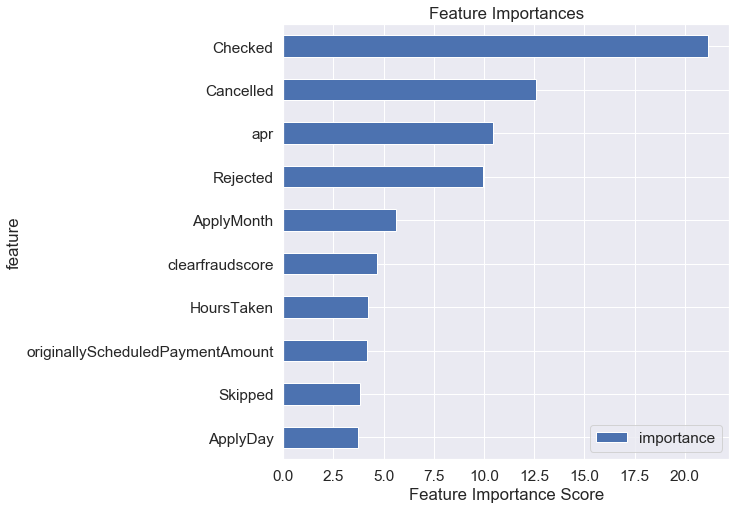

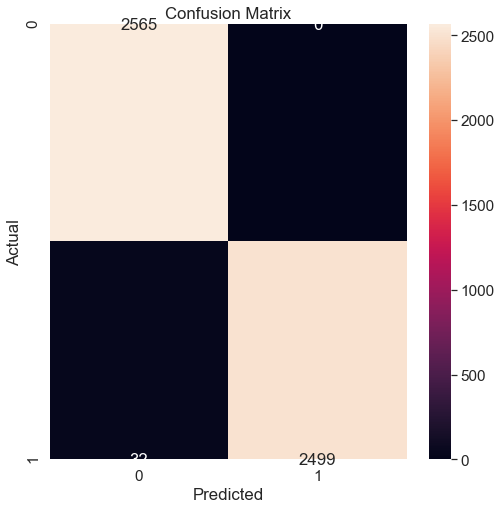

TP: 2499
TN: 2565
FP: 0
FN: 32
Classification Accuracy: 0.9937205651491365
F1 Score: 0.9936381709741551
AUC Score: 0.9936783879889373
Learning rate set to 0.03423
0:	learn: 0.6573324	total: 30.9ms	remaining: 30.8s
1:	learn: 0.6264392	total: 50.6ms	remaining: 25.2s
2:	learn: 0.5864233	total: 82.8ms	remaining: 27.5s
3:	learn: 0.5592719	total: 97.4ms	remaining: 24.3s
4:	learn: 0.5344293	total: 113ms	remaining: 22.6s
5:	learn: 0.5109910	total: 134ms	remaining: 22.2s
6:	learn: 0.4901257	total: 168ms	remaining: 23.9s
7:	learn: 0.4689556	total: 184ms	remaining: 22.8s
8:	learn: 0.4443256	total: 204ms	remaining: 22.5s
9:	learn: 0.4208042	total: 220ms	remaining: 21.7s
10:	learn: 0.3989350	total: 239ms	remaining: 21.5s
11:	learn: 0.3798756	total: 251ms	remaining: 20.7s
12:	learn: 0.3653703	total: 270ms	remaining: 20.5s
13:	learn: 0.3493645	total: 284ms	remaining: 20s
14:	learn: 0.3335091	total: 300ms	remaining: 19.7s
15:	learn: 0.3226909	total: 322ms	remaining: 19.8s
16:	learn: 0.3110546	total: 3

161:	learn: 0.0656785	total: 3.74s	remaining: 19.3s
162:	learn: 0.0653733	total: 3.76s	remaining: 19.3s
163:	learn: 0.0651577	total: 3.78s	remaining: 19.3s
164:	learn: 0.0649992	total: 3.8s	remaining: 19.3s
165:	learn: 0.0647127	total: 3.82s	remaining: 19.2s
166:	learn: 0.0644714	total: 3.85s	remaining: 19.2s
167:	learn: 0.0642636	total: 3.87s	remaining: 19.2s
168:	learn: 0.0640511	total: 3.9s	remaining: 19.2s
169:	learn: 0.0636944	total: 3.92s	remaining: 19.1s
170:	learn: 0.0635194	total: 3.95s	remaining: 19.1s
171:	learn: 0.0633316	total: 3.97s	remaining: 19.1s
172:	learn: 0.0631531	total: 3.99s	remaining: 19.1s
173:	learn: 0.0627991	total: 4.02s	remaining: 19.1s
174:	learn: 0.0626340	total: 4.04s	remaining: 19s
175:	learn: 0.0624473	total: 4.06s	remaining: 19s
176:	learn: 0.0622975	total: 4.09s	remaining: 19s
177:	learn: 0.0621038	total: 4.11s	remaining: 19s
178:	learn: 0.0620365	total: 4.14s	remaining: 19s
179:	learn: 0.0618759	total: 4.16s	remaining: 19s
180:	learn: 0.0617976	tota

327:	learn: 0.0407887	total: 7.75s	remaining: 15.9s
328:	learn: 0.0406142	total: 7.78s	remaining: 15.9s
329:	learn: 0.0404969	total: 7.81s	remaining: 15.9s
330:	learn: 0.0404174	total: 7.84s	remaining: 15.8s
331:	learn: 0.0402702	total: 7.87s	remaining: 15.8s
332:	learn: 0.0402384	total: 7.89s	remaining: 15.8s
333:	learn: 0.0402029	total: 7.91s	remaining: 15.8s
334:	learn: 0.0400725	total: 7.94s	remaining: 15.8s
335:	learn: 0.0399652	total: 7.97s	remaining: 15.7s
336:	learn: 0.0398882	total: 8s	remaining: 15.7s
337:	learn: 0.0397219	total: 8.03s	remaining: 15.7s
338:	learn: 0.0395512	total: 8.05s	remaining: 15.7s
339:	learn: 0.0393235	total: 8.08s	remaining: 15.7s
340:	learn: 0.0391641	total: 8.11s	remaining: 15.7s
341:	learn: 0.0390324	total: 8.14s	remaining: 15.7s
342:	learn: 0.0389777	total: 8.16s	remaining: 15.6s
343:	learn: 0.0389138	total: 8.18s	remaining: 15.6s
344:	learn: 0.0388316	total: 8.21s	remaining: 15.6s
345:	learn: 0.0387457	total: 8.24s	remaining: 15.6s
346:	learn: 0.0

492:	learn: 0.0282171	total: 12s	remaining: 12.3s
493:	learn: 0.0282005	total: 12s	remaining: 12.3s
494:	learn: 0.0280587	total: 12.1s	remaining: 12.3s
495:	learn: 0.0280356	total: 12.1s	remaining: 12.3s
496:	learn: 0.0279455	total: 12.1s	remaining: 12.3s
497:	learn: 0.0279158	total: 12.1s	remaining: 12.2s
498:	learn: 0.0278376	total: 12.2s	remaining: 12.2s
499:	learn: 0.0277895	total: 12.2s	remaining: 12.2s
500:	learn: 0.0277785	total: 12.2s	remaining: 12.2s
501:	learn: 0.0277283	total: 12.3s	remaining: 12.2s
502:	learn: 0.0277264	total: 12.3s	remaining: 12.1s
503:	learn: 0.0276379	total: 12.3s	remaining: 12.1s
504:	learn: 0.0275962	total: 12.3s	remaining: 12.1s
505:	learn: 0.0275749	total: 12.4s	remaining: 12.1s
506:	learn: 0.0275507	total: 12.4s	remaining: 12.1s
507:	learn: 0.0275444	total: 12.4s	remaining: 12s
508:	learn: 0.0275210	total: 12.4s	remaining: 12s
509:	learn: 0.0274654	total: 12.5s	remaining: 12s
510:	learn: 0.0273979	total: 12.5s	remaining: 12s
511:	learn: 0.0273066	to

654:	learn: 0.0204092	total: 16.5s	remaining: 8.67s
655:	learn: 0.0203755	total: 16.5s	remaining: 8.64s
656:	learn: 0.0203330	total: 16.5s	remaining: 8.62s
657:	learn: 0.0203259	total: 16.5s	remaining: 8.59s
658:	learn: 0.0203167	total: 16.5s	remaining: 8.56s
659:	learn: 0.0202809	total: 16.6s	remaining: 8.54s
660:	learn: 0.0202492	total: 16.6s	remaining: 8.52s
661:	learn: 0.0202171	total: 16.6s	remaining: 8.49s
662:	learn: 0.0201919	total: 16.7s	remaining: 8.47s
663:	learn: 0.0201213	total: 16.7s	remaining: 8.44s
664:	learn: 0.0201082	total: 16.7s	remaining: 8.41s
665:	learn: 0.0200941	total: 16.7s	remaining: 8.39s
666:	learn: 0.0200629	total: 16.8s	remaining: 8.36s
667:	learn: 0.0200290	total: 16.8s	remaining: 8.34s
668:	learn: 0.0199973	total: 16.8s	remaining: 8.33s
669:	learn: 0.0199607	total: 16.8s	remaining: 8.3s
670:	learn: 0.0199337	total: 16.9s	remaining: 8.28s
671:	learn: 0.0198936	total: 16.9s	remaining: 8.25s
672:	learn: 0.0198646	total: 16.9s	remaining: 8.22s
673:	learn: 0

820:	learn: 0.0158928	total: 20.5s	remaining: 4.46s
821:	learn: 0.0158767	total: 20.5s	remaining: 4.44s
822:	learn: 0.0158673	total: 20.5s	remaining: 4.41s
823:	learn: 0.0158379	total: 20.6s	remaining: 4.39s
824:	learn: 0.0158012	total: 20.6s	remaining: 4.37s
825:	learn: 0.0158012	total: 20.6s	remaining: 4.34s
826:	learn: 0.0157812	total: 20.6s	remaining: 4.31s
827:	learn: 0.0157684	total: 20.6s	remaining: 4.29s
828:	learn: 0.0157469	total: 20.7s	remaining: 4.26s
829:	learn: 0.0157076	total: 20.7s	remaining: 4.24s
830:	learn: 0.0156790	total: 20.7s	remaining: 4.21s
831:	learn: 0.0156495	total: 20.7s	remaining: 4.19s
832:	learn: 0.0156301	total: 20.8s	remaining: 4.16s
833:	learn: 0.0156160	total: 20.8s	remaining: 4.14s
834:	learn: 0.0156037	total: 20.8s	remaining: 4.11s
835:	learn: 0.0155969	total: 20.8s	remaining: 4.08s
836:	learn: 0.0155831	total: 20.9s	remaining: 4.06s
837:	learn: 0.0155381	total: 20.9s	remaining: 4.04s
838:	learn: 0.0155115	total: 20.9s	remaining: 4.01s
839:	learn: 

983:	learn: 0.0124653	total: 24.5s	remaining: 399ms
984:	learn: 0.0124590	total: 24.5s	remaining: 374ms
985:	learn: 0.0124367	total: 24.6s	remaining: 349ms
986:	learn: 0.0124262	total: 24.6s	remaining: 324ms
987:	learn: 0.0124158	total: 24.6s	remaining: 299ms
988:	learn: 0.0123748	total: 24.6s	remaining: 274ms
989:	learn: 0.0123629	total: 24.7s	remaining: 249ms
990:	learn: 0.0123386	total: 24.7s	remaining: 224ms
991:	learn: 0.0123217	total: 24.7s	remaining: 199ms
992:	learn: 0.0122985	total: 24.7s	remaining: 174ms
993:	learn: 0.0122890	total: 24.8s	remaining: 149ms
994:	learn: 0.0122674	total: 24.8s	remaining: 124ms
995:	learn: 0.0122457	total: 24.8s	remaining: 99.5ms
996:	learn: 0.0122254	total: 24.8s	remaining: 74.6ms
997:	learn: 0.0121887	total: 24.8s	remaining: 49.8ms
998:	learn: 0.0121809	total: 24.9s	remaining: 24.9ms
999:	learn: 0.0121809	total: 24.9s	remaining: 0us
Learning rate set to 0.03423
0:	learn: 0.6590863	total: 30.8ms	remaining: 30.7s
1:	learn: 0.6251677	total: 58.7ms	

146:	learn: 0.0743232	total: 3.33s	remaining: 19.3s
147:	learn: 0.0741228	total: 3.35s	remaining: 19.3s
148:	learn: 0.0738250	total: 3.37s	remaining: 19.3s
149:	learn: 0.0735951	total: 3.4s	remaining: 19.3s
150:	learn: 0.0734015	total: 3.41s	remaining: 19.2s
151:	learn: 0.0730713	total: 3.44s	remaining: 19.2s
152:	learn: 0.0728730	total: 3.46s	remaining: 19.1s
153:	learn: 0.0723371	total: 3.47s	remaining: 19.1s
154:	learn: 0.0718288	total: 3.49s	remaining: 19s
155:	learn: 0.0714425	total: 3.51s	remaining: 19s
156:	learn: 0.0711440	total: 3.54s	remaining: 19s
157:	learn: 0.0709854	total: 3.56s	remaining: 19s
158:	learn: 0.0707888	total: 3.59s	remaining: 19s
159:	learn: 0.0706332	total: 3.62s	remaining: 19s
160:	learn: 0.0704294	total: 3.64s	remaining: 18.9s
161:	learn: 0.0700648	total: 3.67s	remaining: 19s
162:	learn: 0.0700083	total: 3.7s	remaining: 19s
163:	learn: 0.0698632	total: 3.74s	remaining: 19.1s
164:	learn: 0.0696231	total: 3.78s	remaining: 19.1s
165:	learn: 0.0693462	total: 3

308:	learn: 0.0419593	total: 7.54s	remaining: 16.9s
309:	learn: 0.0418929	total: 7.6s	remaining: 16.9s
310:	learn: 0.0418233	total: 7.63s	remaining: 16.9s
311:	learn: 0.0417448	total: 7.66s	remaining: 16.9s
312:	learn: 0.0416764	total: 7.68s	remaining: 16.9s
313:	learn: 0.0415256	total: 7.71s	remaining: 16.8s
314:	learn: 0.0414450	total: 7.74s	remaining: 16.8s
315:	learn: 0.0413220	total: 7.77s	remaining: 16.8s
316:	learn: 0.0412192	total: 7.8s	remaining: 16.8s
317:	learn: 0.0410713	total: 7.81s	remaining: 16.8s
318:	learn: 0.0410066	total: 7.84s	remaining: 16.7s
319:	learn: 0.0409184	total: 7.87s	remaining: 16.7s
320:	learn: 0.0405668	total: 7.89s	remaining: 16.7s
321:	learn: 0.0403466	total: 7.91s	remaining: 16.7s
322:	learn: 0.0402325	total: 7.93s	remaining: 16.6s
323:	learn: 0.0401252	total: 7.96s	remaining: 16.6s
324:	learn: 0.0399176	total: 7.99s	remaining: 16.6s
325:	learn: 0.0398087	total: 8.02s	remaining: 16.6s
326:	learn: 0.0396812	total: 8.04s	remaining: 16.6s
327:	learn: 0.

468:	learn: 0.0288065	total: 11.6s	remaining: 13.1s
469:	learn: 0.0288000	total: 11.6s	remaining: 13.1s
470:	learn: 0.0287740	total: 11.6s	remaining: 13.1s
471:	learn: 0.0287467	total: 11.7s	remaining: 13s
472:	learn: 0.0286977	total: 11.7s	remaining: 13s
473:	learn: 0.0286863	total: 11.7s	remaining: 13s
474:	learn: 0.0286369	total: 11.7s	remaining: 13s
475:	learn: 0.0285564	total: 11.8s	remaining: 13s
476:	learn: 0.0285130	total: 11.8s	remaining: 12.9s
477:	learn: 0.0284465	total: 11.8s	remaining: 12.9s
478:	learn: 0.0283756	total: 11.8s	remaining: 12.9s
479:	learn: 0.0283405	total: 11.8s	remaining: 12.8s
480:	learn: 0.0283026	total: 11.9s	remaining: 12.8s
481:	learn: 0.0282280	total: 11.9s	remaining: 12.8s
482:	learn: 0.0281767	total: 11.9s	remaining: 12.7s
483:	learn: 0.0281433	total: 11.9s	remaining: 12.7s
484:	learn: 0.0280904	total: 12s	remaining: 12.7s
485:	learn: 0.0279792	total: 12s	remaining: 12.7s
486:	learn: 0.0279504	total: 12s	remaining: 12.7s
487:	learn: 0.0279163	total:

629:	learn: 0.0215577	total: 15.8s	remaining: 9.28s
630:	learn: 0.0215244	total: 15.8s	remaining: 9.26s
631:	learn: 0.0215205	total: 15.8s	remaining: 9.23s
632:	learn: 0.0215087	total: 15.9s	remaining: 9.2s
633:	learn: 0.0214896	total: 15.9s	remaining: 9.18s
634:	learn: 0.0214426	total: 15.9s	remaining: 9.15s
635:	learn: 0.0214196	total: 15.9s	remaining: 9.13s
636:	learn: 0.0213829	total: 16s	remaining: 9.1s
637:	learn: 0.0213829	total: 16s	remaining: 9.07s
638:	learn: 0.0213613	total: 16s	remaining: 9.05s
639:	learn: 0.0213580	total: 16s	remaining: 9.02s
640:	learn: 0.0213244	total: 16.1s	remaining: 9s
641:	learn: 0.0213200	total: 16.1s	remaining: 8.97s
642:	learn: 0.0213137	total: 16.1s	remaining: 8.95s
643:	learn: 0.0212768	total: 16.1s	remaining: 8.92s
644:	learn: 0.0212144	total: 16.2s	remaining: 8.89s
645:	learn: 0.0211511	total: 16.2s	remaining: 8.87s
646:	learn: 0.0211234	total: 16.2s	remaining: 8.85s
647:	learn: 0.0210974	total: 16.2s	remaining: 8.82s
648:	learn: 0.0210089	tot

788:	learn: 0.0166042	total: 19.9s	remaining: 5.31s
789:	learn: 0.0165415	total: 19.9s	remaining: 5.29s
790:	learn: 0.0164799	total: 19.9s	remaining: 5.27s
791:	learn: 0.0164435	total: 20s	remaining: 5.24s
792:	learn: 0.0164185	total: 20s	remaining: 5.22s
793:	learn: 0.0164034	total: 20s	remaining: 5.19s
794:	learn: 0.0163945	total: 20s	remaining: 5.17s
795:	learn: 0.0163909	total: 20.1s	remaining: 5.14s
796:	learn: 0.0163676	total: 20.1s	remaining: 5.12s
797:	learn: 0.0163406	total: 20.1s	remaining: 5.09s
798:	learn: 0.0163222	total: 20.1s	remaining: 5.07s
799:	learn: 0.0162885	total: 20.2s	remaining: 5.04s
800:	learn: 0.0162751	total: 20.2s	remaining: 5.02s
801:	learn: 0.0162383	total: 20.2s	remaining: 4.99s
802:	learn: 0.0162056	total: 20.2s	remaining: 4.97s
803:	learn: 0.0161902	total: 20.3s	remaining: 4.94s
804:	learn: 0.0161617	total: 20.3s	remaining: 4.91s
805:	learn: 0.0161242	total: 20.3s	remaining: 4.89s
806:	learn: 0.0161055	total: 20.3s	remaining: 4.86s
807:	learn: 0.016091

947:	learn: 0.0129207	total: 23.9s	remaining: 1.31s
948:	learn: 0.0128859	total: 23.9s	remaining: 1.28s
949:	learn: 0.0128418	total: 23.9s	remaining: 1.26s
950:	learn: 0.0128123	total: 24s	remaining: 1.23s
951:	learn: 0.0127859	total: 24s	remaining: 1.21s
952:	learn: 0.0127622	total: 24s	remaining: 1.18s
953:	learn: 0.0127563	total: 24s	remaining: 1.16s
954:	learn: 0.0127535	total: 24.1s	remaining: 1.13s
955:	learn: 0.0126734	total: 24.1s	remaining: 1.11s
956:	learn: 0.0126645	total: 24.1s	remaining: 1.08s
957:	learn: 0.0126516	total: 24.1s	remaining: 1.06s
958:	learn: 0.0125997	total: 24.2s	remaining: 1.03s
959:	learn: 0.0125667	total: 24.2s	remaining: 1.01s
960:	learn: 0.0125582	total: 24.2s	remaining: 981ms
961:	learn: 0.0125378	total: 24.2s	remaining: 956ms
962:	learn: 0.0125327	total: 24.2s	remaining: 931ms
963:	learn: 0.0125107	total: 24.3s	remaining: 906ms
964:	learn: 0.0124822	total: 24.3s	remaining: 881ms
965:	learn: 0.0124667	total: 24.3s	remaining: 856ms
966:	learn: 0.012459

113:	learn: 0.0794745	total: 2.32s	remaining: 18s
114:	learn: 0.0791695	total: 2.34s	remaining: 18s
115:	learn: 0.0789318	total: 2.37s	remaining: 18s
116:	learn: 0.0786498	total: 2.39s	remaining: 18s
117:	learn: 0.0780847	total: 2.42s	remaining: 18.1s
118:	learn: 0.0777399	total: 2.44s	remaining: 18.1s
119:	learn: 0.0773220	total: 2.47s	remaining: 18.1s
120:	learn: 0.0770949	total: 2.5s	remaining: 18.2s
121:	learn: 0.0766318	total: 2.53s	remaining: 18.2s
122:	learn: 0.0763857	total: 2.55s	remaining: 18.2s
123:	learn: 0.0761645	total: 2.57s	remaining: 18.2s
124:	learn: 0.0760291	total: 2.6s	remaining: 18.2s
125:	learn: 0.0754640	total: 2.62s	remaining: 18.1s
126:	learn: 0.0749628	total: 2.64s	remaining: 18.2s
127:	learn: 0.0746849	total: 2.67s	remaining: 18.2s
128:	learn: 0.0744611	total: 2.69s	remaining: 18.2s
129:	learn: 0.0741162	total: 2.71s	remaining: 18.2s
130:	learn: 0.0737706	total: 2.74s	remaining: 18.2s
131:	learn: 0.0733685	total: 2.76s	remaining: 18.2s
132:	learn: 0.0731556	

276:	learn: 0.0468149	total: 6.31s	remaining: 16.5s
277:	learn: 0.0467330	total: 6.35s	remaining: 16.5s
278:	learn: 0.0465666	total: 6.38s	remaining: 16.5s
279:	learn: 0.0463649	total: 6.4s	remaining: 16.5s
280:	learn: 0.0463075	total: 6.42s	remaining: 16.4s
281:	learn: 0.0461697	total: 6.45s	remaining: 16.4s
282:	learn: 0.0460353	total: 6.47s	remaining: 16.4s
283:	learn: 0.0459369	total: 6.48s	remaining: 16.3s
284:	learn: 0.0458055	total: 6.51s	remaining: 16.3s
285:	learn: 0.0456812	total: 6.54s	remaining: 16.3s
286:	learn: 0.0455240	total: 6.57s	remaining: 16.3s
287:	learn: 0.0454027	total: 6.59s	remaining: 16.3s
288:	learn: 0.0453227	total: 6.62s	remaining: 16.3s
289:	learn: 0.0451375	total: 6.65s	remaining: 16.3s
290:	learn: 0.0450901	total: 6.67s	remaining: 16.3s
291:	learn: 0.0450000	total: 6.7s	remaining: 16.2s
292:	learn: 0.0447101	total: 6.72s	remaining: 16.2s
293:	learn: 0.0445488	total: 6.75s	remaining: 16.2s
294:	learn: 0.0444159	total: 6.78s	remaining: 16.2s
295:	learn: 0.

438:	learn: 0.0319074	total: 10.4s	remaining: 13.2s
439:	learn: 0.0317806	total: 10.4s	remaining: 13.2s
440:	learn: 0.0317677	total: 10.4s	remaining: 13.2s
441:	learn: 0.0317337	total: 10.4s	remaining: 13.2s
442:	learn: 0.0316079	total: 10.5s	remaining: 13.2s
443:	learn: 0.0315385	total: 10.5s	remaining: 13.1s
444:	learn: 0.0315022	total: 10.5s	remaining: 13.1s
445:	learn: 0.0314633	total: 10.6s	remaining: 13.1s
446:	learn: 0.0314369	total: 10.6s	remaining: 13.1s
447:	learn: 0.0314195	total: 10.6s	remaining: 13.1s
448:	learn: 0.0314033	total: 10.6s	remaining: 13s
449:	learn: 0.0313908	total: 10.6s	remaining: 13s
450:	learn: 0.0313499	total: 10.7s	remaining: 13s
451:	learn: 0.0312108	total: 10.7s	remaining: 13s
452:	learn: 0.0311350	total: 10.7s	remaining: 12.9s
453:	learn: 0.0310424	total: 10.7s	remaining: 12.9s
454:	learn: 0.0309722	total: 10.8s	remaining: 12.9s
455:	learn: 0.0308911	total: 10.8s	remaining: 12.9s
456:	learn: 0.0308350	total: 10.8s	remaining: 12.8s
457:	learn: 0.030819

601:	learn: 0.0233929	total: 14.6s	remaining: 9.63s
602:	learn: 0.0233555	total: 14.6s	remaining: 9.61s
603:	learn: 0.0233215	total: 14.6s	remaining: 9.59s
604:	learn: 0.0233133	total: 14.6s	remaining: 9.56s
605:	learn: 0.0232904	total: 14.7s	remaining: 9.53s
606:	learn: 0.0232545	total: 14.7s	remaining: 9.51s
607:	learn: 0.0232436	total: 14.7s	remaining: 9.48s
608:	learn: 0.0232078	total: 14.7s	remaining: 9.46s
609:	learn: 0.0231678	total: 14.8s	remaining: 9.43s
610:	learn: 0.0231149	total: 14.8s	remaining: 9.41s
611:	learn: 0.0230744	total: 14.8s	remaining: 9.39s
612:	learn: 0.0230089	total: 14.8s	remaining: 9.37s
613:	learn: 0.0229699	total: 14.9s	remaining: 9.34s
614:	learn: 0.0229530	total: 14.9s	remaining: 9.32s
615:	learn: 0.0229486	total: 14.9s	remaining: 9.3s
616:	learn: 0.0228700	total: 14.9s	remaining: 9.28s
617:	learn: 0.0228337	total: 15s	remaining: 9.25s
618:	learn: 0.0227979	total: 15s	remaining: 9.23s
619:	learn: 0.0227567	total: 15s	remaining: 9.2s
620:	learn: 0.022669

765:	learn: 0.0180126	total: 18.7s	remaining: 5.71s
766:	learn: 0.0179940	total: 18.7s	remaining: 5.69s
767:	learn: 0.0179614	total: 18.8s	remaining: 5.67s
768:	learn: 0.0179367	total: 18.8s	remaining: 5.64s
769:	learn: 0.0178706	total: 18.8s	remaining: 5.62s
770:	learn: 0.0178527	total: 18.8s	remaining: 5.59s
771:	learn: 0.0178294	total: 18.9s	remaining: 5.57s
772:	learn: 0.0177509	total: 18.9s	remaining: 5.55s
773:	learn: 0.0177151	total: 18.9s	remaining: 5.53s
774:	learn: 0.0176848	total: 19s	remaining: 5.5s
775:	learn: 0.0176582	total: 19s	remaining: 5.48s
776:	learn: 0.0176390	total: 19s	remaining: 5.46s
777:	learn: 0.0176202	total: 19s	remaining: 5.43s
778:	learn: 0.0175811	total: 19.1s	remaining: 5.41s
779:	learn: 0.0175477	total: 19.1s	remaining: 5.39s
780:	learn: 0.0175069	total: 19.1s	remaining: 5.36s
781:	learn: 0.0174315	total: 19.1s	remaining: 5.34s
782:	learn: 0.0173950	total: 19.2s	remaining: 5.31s
783:	learn: 0.0173740	total: 19.2s	remaining: 5.29s
784:	learn: 0.0173589

932:	learn: 0.0139843	total: 23s	remaining: 1.65s
933:	learn: 0.0139742	total: 23s	remaining: 1.63s
934:	learn: 0.0139689	total: 23s	remaining: 1.6s
935:	learn: 0.0139280	total: 23s	remaining: 1.57s
936:	learn: 0.0139136	total: 23.1s	remaining: 1.55s
937:	learn: 0.0138962	total: 23.1s	remaining: 1.52s
938:	learn: 0.0138814	total: 23.1s	remaining: 1.5s
939:	learn: 0.0138658	total: 23.1s	remaining: 1.48s
940:	learn: 0.0138535	total: 23.2s	remaining: 1.45s
941:	learn: 0.0138451	total: 23.2s	remaining: 1.43s
942:	learn: 0.0138173	total: 23.2s	remaining: 1.4s
943:	learn: 0.0138035	total: 23.2s	remaining: 1.38s
944:	learn: 0.0137952	total: 23.2s	remaining: 1.35s
945:	learn: 0.0137793	total: 23.3s	remaining: 1.33s
946:	learn: 0.0137613	total: 23.3s	remaining: 1.3s
947:	learn: 0.0137372	total: 23.3s	remaining: 1.28s
948:	learn: 0.0137316	total: 23.3s	remaining: 1.25s
949:	learn: 0.0137191	total: 23.4s	remaining: 1.23s
950:	learn: 0.0137038	total: 23.4s	remaining: 1.2s
951:	learn: 0.0136747	tot

94:	learn: 0.0922498	total: 1.96s	remaining: 18.7s
95:	learn: 0.0919495	total: 1.99s	remaining: 18.7s
96:	learn: 0.0916873	total: 2.02s	remaining: 18.8s
97:	learn: 0.0915128	total: 2.04s	remaining: 18.7s
98:	learn: 0.0912008	total: 2.06s	remaining: 18.7s
99:	learn: 0.0906849	total: 2.09s	remaining: 18.8s
100:	learn: 0.0903157	total: 2.12s	remaining: 18.8s
101:	learn: 0.0898256	total: 2.15s	remaining: 18.9s
102:	learn: 0.0891153	total: 2.19s	remaining: 19.1s
103:	learn: 0.0888765	total: 2.21s	remaining: 19.1s
104:	learn: 0.0886872	total: 2.24s	remaining: 19.1s
105:	learn: 0.0880409	total: 2.27s	remaining: 19.2s
106:	learn: 0.0877112	total: 2.3s	remaining: 19.2s
107:	learn: 0.0872035	total: 2.33s	remaining: 19.2s
108:	learn: 0.0870090	total: 2.35s	remaining: 19.2s
109:	learn: 0.0865472	total: 2.37s	remaining: 19.2s
110:	learn: 0.0855879	total: 2.39s	remaining: 19.2s
111:	learn: 0.0853946	total: 2.42s	remaining: 19.2s
112:	learn: 0.0850606	total: 2.44s	remaining: 19.2s
113:	learn: 0.08456

257:	learn: 0.0483743	total: 6.2s	remaining: 17.8s
258:	learn: 0.0483497	total: 6.22s	remaining: 17.8s
259:	learn: 0.0482828	total: 6.24s	remaining: 17.8s
260:	learn: 0.0481714	total: 6.26s	remaining: 17.7s
261:	learn: 0.0481019	total: 6.28s	remaining: 17.7s
262:	learn: 0.0479488	total: 6.31s	remaining: 17.7s
263:	learn: 0.0478437	total: 6.34s	remaining: 17.7s
264:	learn: 0.0476962	total: 6.37s	remaining: 17.7s
265:	learn: 0.0475993	total: 6.39s	remaining: 17.6s
266:	learn: 0.0475172	total: 6.42s	remaining: 17.6s
267:	learn: 0.0473902	total: 6.43s	remaining: 17.6s
268:	learn: 0.0472162	total: 6.46s	remaining: 17.6s
269:	learn: 0.0470253	total: 6.49s	remaining: 17.5s
270:	learn: 0.0468389	total: 6.51s	remaining: 17.5s
271:	learn: 0.0466684	total: 6.54s	remaining: 17.5s
272:	learn: 0.0465856	total: 6.57s	remaining: 17.5s
273:	learn: 0.0464583	total: 6.59s	remaining: 17.5s
274:	learn: 0.0463486	total: 6.62s	remaining: 17.4s
275:	learn: 0.0462100	total: 6.63s	remaining: 17.4s
276:	learn: 0

419:	learn: 0.0323277	total: 10.2s	remaining: 14.1s
420:	learn: 0.0322642	total: 10.3s	remaining: 14.1s
421:	learn: 0.0322054	total: 10.3s	remaining: 14.1s
422:	learn: 0.0321579	total: 10.3s	remaining: 14.1s
423:	learn: 0.0321175	total: 10.3s	remaining: 14s
424:	learn: 0.0320653	total: 10.4s	remaining: 14s
425:	learn: 0.0320195	total: 10.4s	remaining: 14s
426:	learn: 0.0319425	total: 10.4s	remaining: 14s
427:	learn: 0.0319045	total: 10.4s	remaining: 13.9s
428:	learn: 0.0318394	total: 10.5s	remaining: 13.9s
429:	learn: 0.0317843	total: 10.5s	remaining: 13.9s
430:	learn: 0.0317290	total: 10.5s	remaining: 13.9s
431:	learn: 0.0317011	total: 10.5s	remaining: 13.8s
432:	learn: 0.0316671	total: 10.6s	remaining: 13.8s
433:	learn: 0.0316526	total: 10.6s	remaining: 13.8s
434:	learn: 0.0315401	total: 10.6s	remaining: 13.8s
435:	learn: 0.0314477	total: 10.6s	remaining: 13.8s
436:	learn: 0.0313667	total: 10.7s	remaining: 13.8s
437:	learn: 0.0313100	total: 10.7s	remaining: 13.8s
438:	learn: 0.031273

579:	learn: 0.0242986	total: 14.4s	remaining: 10.5s
580:	learn: 0.0242734	total: 14.5s	remaining: 10.4s
581:	learn: 0.0242260	total: 14.5s	remaining: 10.4s
582:	learn: 0.0241386	total: 14.5s	remaining: 10.4s
583:	learn: 0.0241159	total: 14.5s	remaining: 10.4s
584:	learn: 0.0240331	total: 14.6s	remaining: 10.3s
585:	learn: 0.0239537	total: 14.6s	remaining: 10.3s
586:	learn: 0.0239111	total: 14.6s	remaining: 10.3s
587:	learn: 0.0238904	total: 14.7s	remaining: 10.3s
588:	learn: 0.0238614	total: 14.7s	remaining: 10.2s
589:	learn: 0.0237517	total: 14.7s	remaining: 10.2s
590:	learn: 0.0237098	total: 14.7s	remaining: 10.2s
591:	learn: 0.0237004	total: 14.7s	remaining: 10.2s
592:	learn: 0.0236844	total: 14.8s	remaining: 10.1s
593:	learn: 0.0236222	total: 14.8s	remaining: 10.1s
594:	learn: 0.0235516	total: 14.8s	remaining: 10.1s
595:	learn: 0.0234850	total: 14.8s	remaining: 10.1s
596:	learn: 0.0234456	total: 14.9s	remaining: 10s
597:	learn: 0.0234272	total: 14.9s	remaining: 10s
598:	learn: 0.02

745:	learn: 0.0176376	total: 18.7s	remaining: 6.36s
746:	learn: 0.0176316	total: 18.7s	remaining: 6.34s
747:	learn: 0.0176111	total: 18.7s	remaining: 6.31s
748:	learn: 0.0175988	total: 18.8s	remaining: 6.29s
749:	learn: 0.0175751	total: 18.8s	remaining: 6.26s
750:	learn: 0.0175519	total: 18.8s	remaining: 6.24s
751:	learn: 0.0175206	total: 18.8s	remaining: 6.21s
752:	learn: 0.0175042	total: 18.9s	remaining: 6.19s
753:	learn: 0.0174262	total: 18.9s	remaining: 6.16s
754:	learn: 0.0173878	total: 18.9s	remaining: 6.14s
755:	learn: 0.0173496	total: 19s	remaining: 6.12s
756:	learn: 0.0173089	total: 19s	remaining: 6.09s
757:	learn: 0.0172450	total: 19s	remaining: 6.07s
758:	learn: 0.0171808	total: 19.1s	remaining: 6.05s
759:	learn: 0.0171498	total: 19.1s	remaining: 6.03s
760:	learn: 0.0171382	total: 19.1s	remaining: 6.01s
761:	learn: 0.0171171	total: 19.2s	remaining: 5.99s
762:	learn: 0.0170955	total: 19.2s	remaining: 5.97s
763:	learn: 0.0170615	total: 19.2s	remaining: 5.94s
764:	learn: 0.0170

908:	learn: 0.0131244	total: 23.3s	remaining: 2.33s
909:	learn: 0.0130476	total: 23.3s	remaining: 2.3s
910:	learn: 0.0130458	total: 23.3s	remaining: 2.28s
911:	learn: 0.0130342	total: 23.3s	remaining: 2.25s
912:	learn: 0.0130263	total: 23.4s	remaining: 2.23s
913:	learn: 0.0130036	total: 23.4s	remaining: 2.2s
914:	learn: 0.0129754	total: 23.4s	remaining: 2.17s
915:	learn: 0.0129645	total: 23.4s	remaining: 2.15s
916:	learn: 0.0129645	total: 23.4s	remaining: 2.12s
917:	learn: 0.0129629	total: 23.5s	remaining: 2.1s
918:	learn: 0.0129585	total: 23.5s	remaining: 2.07s
919:	learn: 0.0129245	total: 23.5s	remaining: 2.04s
920:	learn: 0.0129126	total: 23.5s	remaining: 2.02s
921:	learn: 0.0129002	total: 23.6s	remaining: 2s
922:	learn: 0.0128614	total: 23.6s	remaining: 1.97s
923:	learn: 0.0128463	total: 23.7s	remaining: 1.95s
924:	learn: 0.0128423	total: 23.7s	remaining: 1.92s
925:	learn: 0.0128300	total: 23.7s	remaining: 1.89s
926:	learn: 0.0128251	total: 23.7s	remaining: 1.87s
927:	learn: 0.0128

73:	learn: 0.1022136	total: 1.54s	remaining: 19.3s
74:	learn: 0.1020045	total: 1.56s	remaining: 19.3s
75:	learn: 0.1010000	total: 1.58s	remaining: 19.3s
76:	learn: 0.1004597	total: 1.6s	remaining: 19.1s
77:	learn: 0.0998452	total: 1.62s	remaining: 19.2s
78:	learn: 0.0993160	total: 1.65s	remaining: 19.2s
79:	learn: 0.0989277	total: 1.67s	remaining: 19.2s
80:	learn: 0.0983916	total: 1.69s	remaining: 19.2s
81:	learn: 0.0977752	total: 1.71s	remaining: 19.2s
82:	learn: 0.0969866	total: 1.74s	remaining: 19.2s
83:	learn: 0.0965111	total: 1.76s	remaining: 19.2s
84:	learn: 0.0962763	total: 1.79s	remaining: 19.3s
85:	learn: 0.0961046	total: 1.81s	remaining: 19.2s
86:	learn: 0.0957513	total: 1.83s	remaining: 19.2s
87:	learn: 0.0955817	total: 1.85s	remaining: 19.2s
88:	learn: 0.0948609	total: 1.88s	remaining: 19.2s
89:	learn: 0.0946130	total: 1.9s	remaining: 19.2s
90:	learn: 0.0939750	total: 1.93s	remaining: 19.3s
91:	learn: 0.0936339	total: 1.96s	remaining: 19.3s
92:	learn: 0.0933724	total: 1.99s

232:	learn: 0.0543671	total: 5.56s	remaining: 18.3s
233:	learn: 0.0542107	total: 5.59s	remaining: 18.3s
234:	learn: 0.0540127	total: 5.62s	remaining: 18.3s
235:	learn: 0.0538363	total: 5.64s	remaining: 18.3s
236:	learn: 0.0536233	total: 5.67s	remaining: 18.2s
237:	learn: 0.0532976	total: 5.69s	remaining: 18.2s
238:	learn: 0.0531287	total: 5.71s	remaining: 18.2s
239:	learn: 0.0530164	total: 5.74s	remaining: 18.2s
240:	learn: 0.0529142	total: 5.77s	remaining: 18.2s
241:	learn: 0.0526192	total: 5.79s	remaining: 18.1s
242:	learn: 0.0525172	total: 5.81s	remaining: 18.1s
243:	learn: 0.0523920	total: 5.83s	remaining: 18.1s
244:	learn: 0.0523073	total: 5.85s	remaining: 18s
245:	learn: 0.0519899	total: 5.88s	remaining: 18s
246:	learn: 0.0516464	total: 5.89s	remaining: 18s
247:	learn: 0.0513469	total: 5.92s	remaining: 18s
248:	learn: 0.0512046	total: 5.95s	remaining: 17.9s
249:	learn: 0.0510483	total: 5.98s	remaining: 17.9s
250:	learn: 0.0509269	total: 6s	remaining: 17.9s
251:	learn: 0.0506312	t

398:	learn: 0.0340636	total: 9.81s	remaining: 14.8s
399:	learn: 0.0339790	total: 9.83s	remaining: 14.8s
400:	learn: 0.0338803	total: 9.86s	remaining: 14.7s
401:	learn: 0.0337833	total: 9.88s	remaining: 14.7s
402:	learn: 0.0336444	total: 9.91s	remaining: 14.7s
403:	learn: 0.0335976	total: 9.93s	remaining: 14.7s
404:	learn: 0.0334508	total: 9.95s	remaining: 14.6s
405:	learn: 0.0334172	total: 9.98s	remaining: 14.6s
406:	learn: 0.0333627	total: 10s	remaining: 14.6s
407:	learn: 0.0332574	total: 10s	remaining: 14.6s
408:	learn: 0.0329964	total: 10.1s	remaining: 14.5s
409:	learn: 0.0329767	total: 10.1s	remaining: 14.5s
410:	learn: 0.0328470	total: 10.1s	remaining: 14.5s
411:	learn: 0.0326066	total: 10.1s	remaining: 14.4s
412:	learn: 0.0325507	total: 10.1s	remaining: 14.4s
413:	learn: 0.0325091	total: 10.2s	remaining: 14.4s
414:	learn: 0.0324566	total: 10.2s	remaining: 14.3s
415:	learn: 0.0323768	total: 10.2s	remaining: 14.3s
416:	learn: 0.0323148	total: 10.2s	remaining: 14.3s
417:	learn: 0.03

560:	learn: 0.0231287	total: 13.7s	remaining: 10.7s
561:	learn: 0.0230855	total: 13.7s	remaining: 10.7s
562:	learn: 0.0230055	total: 13.7s	remaining: 10.6s
563:	learn: 0.0229252	total: 13.7s	remaining: 10.6s
564:	learn: 0.0228960	total: 13.7s	remaining: 10.6s
565:	learn: 0.0228397	total: 13.8s	remaining: 10.6s
566:	learn: 0.0228155	total: 13.8s	remaining: 10.5s
567:	learn: 0.0227837	total: 13.8s	remaining: 10.5s
568:	learn: 0.0227555	total: 13.8s	remaining: 10.5s
569:	learn: 0.0227153	total: 13.8s	remaining: 10.4s
570:	learn: 0.0226897	total: 13.9s	remaining: 10.4s
571:	learn: 0.0226764	total: 13.9s	remaining: 10.4s
572:	learn: 0.0226326	total: 13.9s	remaining: 10.4s
573:	learn: 0.0226137	total: 13.9s	remaining: 10.4s
574:	learn: 0.0220647	total: 14s	remaining: 10.3s
575:	learn: 0.0220428	total: 14s	remaining: 10.3s
576:	learn: 0.0219763	total: 14s	remaining: 10.3s
577:	learn: 0.0219691	total: 14.1s	remaining: 10.3s
578:	learn: 0.0219259	total: 14.1s	remaining: 10.2s
579:	learn: 0.0218

720:	learn: 0.0150212	total: 17.9s	remaining: 6.92s
721:	learn: 0.0149794	total: 17.9s	remaining: 6.9s
722:	learn: 0.0149140	total: 17.9s	remaining: 6.88s
723:	learn: 0.0148762	total: 18s	remaining: 6.85s
724:	learn: 0.0148595	total: 18s	remaining: 6.82s
725:	learn: 0.0148510	total: 18s	remaining: 6.8s
726:	learn: 0.0148024	total: 18s	remaining: 6.78s
727:	learn: 0.0147919	total: 18.1s	remaining: 6.75s
728:	learn: 0.0147690	total: 18.1s	remaining: 6.73s
729:	learn: 0.0147414	total: 18.1s	remaining: 6.71s
730:	learn: 0.0147045	total: 18.2s	remaining: 6.68s
731:	learn: 0.0146932	total: 18.2s	remaining: 6.66s
732:	learn: 0.0146319	total: 18.2s	remaining: 6.63s
733:	learn: 0.0146224	total: 18.2s	remaining: 6.61s
734:	learn: 0.0146154	total: 18.3s	remaining: 6.59s
735:	learn: 0.0145784	total: 18.3s	remaining: 6.56s
736:	learn: 0.0145253	total: 18.3s	remaining: 6.54s
737:	learn: 0.0145108	total: 18.3s	remaining: 6.51s
738:	learn: 0.0145021	total: 18.4s	remaining: 6.49s
739:	learn: 0.0144881	

881:	learn: 0.0108654	total: 22.2s	remaining: 2.97s
882:	learn: 0.0108592	total: 22.2s	remaining: 2.94s
883:	learn: 0.0108434	total: 22.2s	remaining: 2.92s
884:	learn: 0.0108195	total: 22.3s	remaining: 2.89s
885:	learn: 0.0108071	total: 22.3s	remaining: 2.87s
886:	learn: 0.0107837	total: 22.3s	remaining: 2.84s
887:	learn: 0.0107637	total: 22.3s	remaining: 2.82s
888:	learn: 0.0107473	total: 22.4s	remaining: 2.79s
889:	learn: 0.0107413	total: 22.4s	remaining: 2.77s
890:	learn: 0.0107214	total: 22.4s	remaining: 2.74s
891:	learn: 0.0107147	total: 22.5s	remaining: 2.72s
892:	learn: 0.0106648	total: 22.5s	remaining: 2.69s
893:	learn: 0.0106537	total: 22.5s	remaining: 2.67s
894:	learn: 0.0106251	total: 22.5s	remaining: 2.64s
895:	learn: 0.0106167	total: 22.6s	remaining: 2.62s
896:	learn: 0.0105830	total: 22.6s	remaining: 2.59s
897:	learn: 0.0105719	total: 22.6s	remaining: 2.57s
898:	learn: 0.0105431	total: 22.7s	remaining: 2.54s
899:	learn: 0.0105348	total: 22.7s	remaining: 2.52s
900:	learn: 

40:	learn: 0.1378057	total: 791ms	remaining: 18.5s
41:	learn: 0.1356457	total: 818ms	remaining: 18.7s
42:	learn: 0.1349737	total: 845ms	remaining: 18.8s
43:	learn: 0.1325566	total: 860ms	remaining: 18.7s
44:	learn: 0.1309692	total: 879ms	remaining: 18.7s
45:	learn: 0.1288212	total: 896ms	remaining: 18.6s
46:	learn: 0.1268866	total: 915ms	remaining: 18.6s
47:	learn: 0.1251941	total: 936ms	remaining: 18.6s
48:	learn: 0.1236187	total: 956ms	remaining: 18.6s
49:	learn: 0.1223202	total: 985ms	remaining: 18.7s
50:	learn: 0.1217749	total: 1.01s	remaining: 18.9s
51:	learn: 0.1204677	total: 1.04s	remaining: 18.9s
52:	learn: 0.1193428	total: 1.06s	remaining: 18.9s
53:	learn: 0.1186417	total: 1.08s	remaining: 19s
54:	learn: 0.1181490	total: 1.11s	remaining: 19s
55:	learn: 0.1176371	total: 1.13s	remaining: 19s
56:	learn: 0.1165591	total: 1.15s	remaining: 19s
57:	learn: 0.1155691	total: 1.17s	remaining: 19s
58:	learn: 0.1148702	total: 1.2s	remaining: 19.1s
59:	learn: 0.1145335	total: 1.22s	remainin

206:	learn: 0.0585480	total: 5.07s	remaining: 19.4s
207:	learn: 0.0584596	total: 5.09s	remaining: 19.4s
208:	learn: 0.0583224	total: 5.12s	remaining: 19.4s
209:	learn: 0.0580408	total: 5.14s	remaining: 19.3s
210:	learn: 0.0578712	total: 5.16s	remaining: 19.3s
211:	learn: 0.0576300	total: 5.19s	remaining: 19.3s
212:	learn: 0.0573862	total: 5.21s	remaining: 19.2s
213:	learn: 0.0571508	total: 5.23s	remaining: 19.2s
214:	learn: 0.0568978	total: 5.26s	remaining: 19.2s
215:	learn: 0.0567258	total: 5.29s	remaining: 19.2s
216:	learn: 0.0566834	total: 5.32s	remaining: 19.2s
217:	learn: 0.0564798	total: 5.35s	remaining: 19.2s
218:	learn: 0.0562967	total: 5.38s	remaining: 19.2s
219:	learn: 0.0558704	total: 5.4s	remaining: 19.1s
220:	learn: 0.0556654	total: 5.42s	remaining: 19.1s
221:	learn: 0.0555506	total: 5.45s	remaining: 19.1s
222:	learn: 0.0553850	total: 5.48s	remaining: 19.1s
223:	learn: 0.0551779	total: 5.5s	remaining: 19.1s
224:	learn: 0.0550560	total: 5.53s	remaining: 19s
225:	learn: 0.05

373:	learn: 0.0354711	total: 9.77s	remaining: 16.3s
374:	learn: 0.0353868	total: 9.79s	remaining: 16.3s
375:	learn: 0.0352775	total: 9.82s	remaining: 16.3s
376:	learn: 0.0352394	total: 9.85s	remaining: 16.3s
377:	learn: 0.0352088	total: 9.88s	remaining: 16.3s
378:	learn: 0.0351483	total: 9.91s	remaining: 16.2s
379:	learn: 0.0350871	total: 9.93s	remaining: 16.2s
380:	learn: 0.0349622	total: 9.97s	remaining: 16.2s
381:	learn: 0.0348698	total: 9.98s	remaining: 16.2s
382:	learn: 0.0348348	total: 10s	remaining: 16.1s
383:	learn: 0.0347393	total: 10s	remaining: 16.1s
384:	learn: 0.0346789	total: 10s	remaining: 16s
385:	learn: 0.0346509	total: 10.1s	remaining: 16s
386:	learn: 0.0346020	total: 10.1s	remaining: 16s
387:	learn: 0.0344767	total: 10.1s	remaining: 15.9s
388:	learn: 0.0343545	total: 10.1s	remaining: 15.9s
389:	learn: 0.0343005	total: 10.2s	remaining: 15.9s
390:	learn: 0.0342456	total: 10.2s	remaining: 15.9s
391:	learn: 0.0341895	total: 10.2s	remaining: 15.8s
392:	learn: 0.0340929	to

534:	learn: 0.0257706	total: 13.8s	remaining: 12s
535:	learn: 0.0256994	total: 13.9s	remaining: 12s
536:	learn: 0.0256339	total: 13.9s	remaining: 12s
537:	learn: 0.0255753	total: 13.9s	remaining: 12s
538:	learn: 0.0255252	total: 14s	remaining: 11.9s
539:	learn: 0.0254704	total: 14s	remaining: 11.9s
540:	learn: 0.0254120	total: 14s	remaining: 11.9s
541:	learn: 0.0253775	total: 14s	remaining: 11.9s
542:	learn: 0.0253455	total: 14s	remaining: 11.8s
543:	learn: 0.0253321	total: 14.1s	remaining: 11.8s
544:	learn: 0.0253289	total: 14.1s	remaining: 11.8s
545:	learn: 0.0252325	total: 14.1s	remaining: 11.7s
546:	learn: 0.0252104	total: 14.2s	remaining: 11.7s
547:	learn: 0.0251631	total: 14.2s	remaining: 11.7s
548:	learn: 0.0251523	total: 14.2s	remaining: 11.7s
549:	learn: 0.0250943	total: 14.2s	remaining: 11.7s
550:	learn: 0.0250823	total: 14.3s	remaining: 11.6s
551:	learn: 0.0250775	total: 14.3s	remaining: 11.6s
552:	learn: 0.0250613	total: 14.3s	remaining: 11.6s
553:	learn: 0.0249564	total: 1

698:	learn: 0.0191964	total: 18.4s	remaining: 7.94s
699:	learn: 0.0191648	total: 18.5s	remaining: 7.91s
700:	learn: 0.0191333	total: 18.5s	remaining: 7.89s
701:	learn: 0.0191049	total: 18.5s	remaining: 7.86s
702:	learn: 0.0190847	total: 18.6s	remaining: 7.84s
703:	learn: 0.0190515	total: 18.6s	remaining: 7.82s
704:	learn: 0.0190288	total: 18.6s	remaining: 7.79s
705:	learn: 0.0190192	total: 18.7s	remaining: 7.77s
706:	learn: 0.0189974	total: 18.7s	remaining: 7.75s
707:	learn: 0.0189433	total: 18.7s	remaining: 7.72s
708:	learn: 0.0189371	total: 18.7s	remaining: 7.7s
709:	learn: 0.0188856	total: 18.8s	remaining: 7.68s
710:	learn: 0.0188763	total: 18.8s	remaining: 7.65s
711:	learn: 0.0188465	total: 18.9s	remaining: 7.63s
712:	learn: 0.0188272	total: 18.9s	remaining: 7.6s
713:	learn: 0.0187871	total: 18.9s	remaining: 7.57s
714:	learn: 0.0187718	total: 18.9s	remaining: 7.55s
715:	learn: 0.0187539	total: 19s	remaining: 7.53s
716:	learn: 0.0187473	total: 19s	remaining: 7.51s
717:	learn: 0.0187

859:	learn: 0.0143858	total: 23.2s	remaining: 3.77s
860:	learn: 0.0143571	total: 23.2s	remaining: 3.74s
861:	learn: 0.0143488	total: 23.2s	remaining: 3.72s
862:	learn: 0.0143488	total: 23.2s	remaining: 3.69s
863:	learn: 0.0143451	total: 23.3s	remaining: 3.66s
864:	learn: 0.0143096	total: 23.3s	remaining: 3.63s
865:	learn: 0.0143096	total: 23.3s	remaining: 3.6s
866:	learn: 0.0143017	total: 23.3s	remaining: 3.58s
867:	learn: 0.0142790	total: 23.4s	remaining: 3.55s
868:	learn: 0.0142653	total: 23.4s	remaining: 3.52s
869:	learn: 0.0142523	total: 23.4s	remaining: 3.5s
870:	learn: 0.0142402	total: 23.5s	remaining: 3.47s
871:	learn: 0.0142217	total: 23.5s	remaining: 3.45s
872:	learn: 0.0142050	total: 23.5s	remaining: 3.42s
873:	learn: 0.0141926	total: 23.6s	remaining: 3.4s
874:	learn: 0.0141682	total: 23.6s	remaining: 3.37s
875:	learn: 0.0141584	total: 23.6s	remaining: 3.34s
876:	learn: 0.0141232	total: 23.6s	remaining: 3.31s
877:	learn: 0.0141039	total: 23.7s	remaining: 3.29s
878:	learn: 0.0

25:	learn: 0.2053719	total: 568ms	remaining: 21.3s
26:	learn: 0.1975137	total: 590ms	remaining: 21.3s
27:	learn: 0.1913282	total: 614ms	remaining: 21.3s
28:	learn: 0.1837828	total: 635ms	remaining: 21.3s
29:	learn: 0.1770506	total: 650ms	remaining: 21s
30:	learn: 0.1719903	total: 668ms	remaining: 20.9s
31:	learn: 0.1671764	total: 687ms	remaining: 20.8s
32:	learn: 0.1628015	total: 702ms	remaining: 20.6s
33:	learn: 0.1585181	total: 722ms	remaining: 20.5s
34:	learn: 0.1548418	total: 744ms	remaining: 20.5s
35:	learn: 0.1516063	total: 767ms	remaining: 20.5s
36:	learn: 0.1480475	total: 786ms	remaining: 20.5s
37:	learn: 0.1448045	total: 803ms	remaining: 20.3s
38:	learn: 0.1422092	total: 830ms	remaining: 20.4s
39:	learn: 0.1399550	total: 849ms	remaining: 20.4s
40:	learn: 0.1369563	total: 875ms	remaining: 20.5s
41:	learn: 0.1341622	total: 897ms	remaining: 20.4s
42:	learn: 0.1326588	total: 931ms	remaining: 20.7s
43:	learn: 0.1316168	total: 966ms	remaining: 21s
44:	learn: 0.1300296	total: 991ms	r

188:	learn: 0.0603397	total: 5.08s	remaining: 21.8s
189:	learn: 0.0602276	total: 5.11s	remaining: 21.8s
190:	learn: 0.0601264	total: 5.13s	remaining: 21.7s
191:	learn: 0.0599615	total: 5.16s	remaining: 21.7s
192:	learn: 0.0595733	total: 5.18s	remaining: 21.7s
193:	learn: 0.0593658	total: 5.2s	remaining: 21.6s
194:	learn: 0.0564921	total: 5.23s	remaining: 21.6s
195:	learn: 0.0563684	total: 5.25s	remaining: 21.5s
196:	learn: 0.0561342	total: 5.28s	remaining: 21.5s
197:	learn: 0.0559305	total: 5.31s	remaining: 21.5s
198:	learn: 0.0556519	total: 5.34s	remaining: 21.5s
199:	learn: 0.0554429	total: 5.37s	remaining: 21.5s
200:	learn: 0.0553571	total: 5.4s	remaining: 21.5s
201:	learn: 0.0552092	total: 5.43s	remaining: 21.4s
202:	learn: 0.0550850	total: 5.46s	remaining: 21.4s
203:	learn: 0.0549451	total: 5.48s	remaining: 21.4s
204:	learn: 0.0547314	total: 5.51s	remaining: 21.4s
205:	learn: 0.0546505	total: 5.54s	remaining: 21.3s
206:	learn: 0.0545479	total: 5.56s	remaining: 21.3s
207:	learn: 0.

349:	learn: 0.0364747	total: 9.54s	remaining: 17.7s
350:	learn: 0.0363098	total: 9.57s	remaining: 17.7s
351:	learn: 0.0362620	total: 9.59s	remaining: 17.7s
352:	learn: 0.0361709	total: 9.61s	remaining: 17.6s
353:	learn: 0.0360918	total: 9.63s	remaining: 17.6s
354:	learn: 0.0359442	total: 9.65s	remaining: 17.5s
355:	learn: 0.0358345	total: 9.68s	remaining: 17.5s
356:	learn: 0.0357869	total: 9.7s	remaining: 17.5s
357:	learn: 0.0356497	total: 9.71s	remaining: 17.4s
358:	learn: 0.0355553	total: 9.74s	remaining: 17.4s
359:	learn: 0.0354257	total: 9.76s	remaining: 17.4s
360:	learn: 0.0353463	total: 9.77s	remaining: 17.3s
361:	learn: 0.0353137	total: 9.79s	remaining: 17.3s
362:	learn: 0.0350587	total: 9.82s	remaining: 17.2s
363:	learn: 0.0349970	total: 9.83s	remaining: 17.2s
364:	learn: 0.0348910	total: 9.86s	remaining: 17.1s
365:	learn: 0.0347970	total: 9.89s	remaining: 17.1s
366:	learn: 0.0347516	total: 9.92s	remaining: 17.1s
367:	learn: 0.0346845	total: 9.94s	remaining: 17.1s
368:	learn: 0

514:	learn: 0.0257018	total: 13.5s	remaining: 12.7s
515:	learn: 0.0256401	total: 13.5s	remaining: 12.7s
516:	learn: 0.0255865	total: 13.6s	remaining: 12.7s
517:	learn: 0.0255407	total: 13.6s	remaining: 12.6s
518:	learn: 0.0254986	total: 13.6s	remaining: 12.6s
519:	learn: 0.0254748	total: 13.6s	remaining: 12.6s
520:	learn: 0.0254724	total: 13.7s	remaining: 12.6s
521:	learn: 0.0254101	total: 13.7s	remaining: 12.5s
522:	learn: 0.0253820	total: 13.7s	remaining: 12.5s
523:	learn: 0.0253298	total: 13.7s	remaining: 12.5s
524:	learn: 0.0252641	total: 13.7s	remaining: 12.4s
525:	learn: 0.0251963	total: 13.8s	remaining: 12.4s
526:	learn: 0.0251636	total: 13.8s	remaining: 12.4s
527:	learn: 0.0250607	total: 13.8s	remaining: 12.4s
528:	learn: 0.0250126	total: 13.9s	remaining: 12.3s
529:	learn: 0.0249752	total: 13.9s	remaining: 12.3s
530:	learn: 0.0249457	total: 13.9s	remaining: 12.3s
531:	learn: 0.0248986	total: 13.9s	remaining: 12.3s
532:	learn: 0.0248913	total: 14s	remaining: 12.2s
533:	learn: 0.

675:	learn: 0.0193842	total: 17.6s	remaining: 8.43s
676:	learn: 0.0193409	total: 17.6s	remaining: 8.41s
677:	learn: 0.0193067	total: 17.6s	remaining: 8.38s
678:	learn: 0.0192949	total: 17.7s	remaining: 8.36s
679:	learn: 0.0192453	total: 17.7s	remaining: 8.33s
680:	learn: 0.0192056	total: 17.7s	remaining: 8.31s
681:	learn: 0.0191574	total: 17.8s	remaining: 8.28s
682:	learn: 0.0191358	total: 17.8s	remaining: 8.25s
683:	learn: 0.0191101	total: 17.8s	remaining: 8.23s
684:	learn: 0.0190594	total: 17.8s	remaining: 8.2s
685:	learn: 0.0190455	total: 17.9s	remaining: 8.18s
686:	learn: 0.0190329	total: 17.9s	remaining: 8.15s
687:	learn: 0.0190142	total: 17.9s	remaining: 8.12s
688:	learn: 0.0189865	total: 17.9s	remaining: 8.1s
689:	learn: 0.0189508	total: 18s	remaining: 8.07s
690:	learn: 0.0189156	total: 18s	remaining: 8.05s
691:	learn: 0.0188803	total: 18s	remaining: 8.02s
692:	learn: 0.0188404	total: 18.1s	remaining: 8s
693:	learn: 0.0187716	total: 18.1s	remaining: 7.98s
694:	learn: 0.0187227	t

841:	learn: 0.0144584	total: 22.5s	remaining: 4.23s
842:	learn: 0.0144257	total: 22.6s	remaining: 4.2s
843:	learn: 0.0144108	total: 22.6s	remaining: 4.17s
844:	learn: 0.0143963	total: 22.6s	remaining: 4.15s
845:	learn: 0.0143900	total: 22.6s	remaining: 4.12s
846:	learn: 0.0143900	total: 22.6s	remaining: 4.09s
847:	learn: 0.0143855	total: 22.7s	remaining: 4.06s
848:	learn: 0.0143658	total: 22.7s	remaining: 4.04s
849:	learn: 0.0143638	total: 22.7s	remaining: 4.01s
850:	learn: 0.0143432	total: 22.7s	remaining: 3.98s
851:	learn: 0.0143070	total: 22.8s	remaining: 3.95s
852:	learn: 0.0142891	total: 22.8s	remaining: 3.93s
853:	learn: 0.0142774	total: 22.8s	remaining: 3.9s
854:	learn: 0.0142456	total: 22.8s	remaining: 3.88s
855:	learn: 0.0142253	total: 22.9s	remaining: 3.85s
856:	learn: 0.0142018	total: 22.9s	remaining: 3.82s
857:	learn: 0.0141625	total: 22.9s	remaining: 3.79s
858:	learn: 0.0141439	total: 23s	remaining: 3.77s
859:	learn: 0.0141144	total: 23s	remaining: 3.74s
860:	learn: 0.0140

0:	learn: 0.6589199	total: 37.3ms	remaining: 37.3s
1:	learn: 0.6249302	total: 63.9ms	remaining: 31.9s
2:	learn: 0.5942753	total: 81.4ms	remaining: 27.1s
3:	learn: 0.5674422	total: 97.2ms	remaining: 24.2s
4:	learn: 0.5429395	total: 128ms	remaining: 25.4s
5:	learn: 0.5188684	total: 144ms	remaining: 23.8s
6:	learn: 0.4948862	total: 160ms	remaining: 22.8s
7:	learn: 0.4762569	total: 179ms	remaining: 22.2s
8:	learn: 0.4474888	total: 204ms	remaining: 22.5s
9:	learn: 0.4240206	total: 227ms	remaining: 22.5s
10:	learn: 0.4042859	total: 246ms	remaining: 22.1s
11:	learn: 0.3812967	total: 266ms	remaining: 21.9s
12:	learn: 0.3644454	total: 281ms	remaining: 21.3s
13:	learn: 0.3512776	total: 297ms	remaining: 20.9s
14:	learn: 0.3355066	total: 313ms	remaining: 20.6s
15:	learn: 0.3221078	total: 328ms	remaining: 20.2s
16:	learn: 0.3087930	total: 345ms	remaining: 19.9s
17:	learn: 0.2982134	total: 361ms	remaining: 19.7s
18:	learn: 0.2876293	total: 375ms	remaining: 19.4s
19:	learn: 0.2698923	total: 393ms	rem

161:	learn: 0.0666442	total: 3.64s	remaining: 18.8s
162:	learn: 0.0664388	total: 3.67s	remaining: 18.9s
163:	learn: 0.0663893	total: 3.69s	remaining: 18.8s
164:	learn: 0.0660725	total: 3.71s	remaining: 18.8s
165:	learn: 0.0657793	total: 3.74s	remaining: 18.8s
166:	learn: 0.0655798	total: 3.76s	remaining: 18.8s
167:	learn: 0.0650645	total: 3.79s	remaining: 18.8s
168:	learn: 0.0648292	total: 3.82s	remaining: 18.8s
169:	learn: 0.0644375	total: 3.84s	remaining: 18.7s
170:	learn: 0.0642910	total: 3.86s	remaining: 18.7s
171:	learn: 0.0641729	total: 3.88s	remaining: 18.7s
172:	learn: 0.0640400	total: 3.91s	remaining: 18.7s
173:	learn: 0.0635892	total: 3.93s	remaining: 18.7s
174:	learn: 0.0635317	total: 3.95s	remaining: 18.6s
175:	learn: 0.0632235	total: 3.98s	remaining: 18.7s
176:	learn: 0.0631480	total: 4.01s	remaining: 18.7s
177:	learn: 0.0628863	total: 4.04s	remaining: 18.7s
178:	learn: 0.0627172	total: 4.07s	remaining: 18.7s
179:	learn: 0.0625715	total: 4.09s	remaining: 18.6s
180:	learn: 

320:	learn: 0.0391568	total: 7.69s	remaining: 16.3s
321:	learn: 0.0390383	total: 7.71s	remaining: 16.2s
322:	learn: 0.0389132	total: 7.74s	remaining: 16.2s
323:	learn: 0.0388290	total: 7.77s	remaining: 16.2s
324:	learn: 0.0386989	total: 7.79s	remaining: 16.2s
325:	learn: 0.0385637	total: 7.82s	remaining: 16.2s
326:	learn: 0.0385276	total: 7.84s	remaining: 16.1s
327:	learn: 0.0385032	total: 7.86s	remaining: 16.1s
328:	learn: 0.0383866	total: 7.89s	remaining: 16.1s
329:	learn: 0.0382534	total: 7.92s	remaining: 16.1s
330:	learn: 0.0381089	total: 7.95s	remaining: 16.1s
331:	learn: 0.0379708	total: 7.97s	remaining: 16s
332:	learn: 0.0378690	total: 8s	remaining: 16s
333:	learn: 0.0378298	total: 8.02s	remaining: 16s
334:	learn: 0.0377764	total: 8.04s	remaining: 16s
335:	learn: 0.0376838	total: 8.06s	remaining: 15.9s
336:	learn: 0.0375544	total: 8.09s	remaining: 15.9s
337:	learn: 0.0373692	total: 8.12s	remaining: 15.9s
338:	learn: 0.0372191	total: 8.14s	remaining: 15.9s
339:	learn: 0.0371131	t

483:	learn: 0.0272856	total: 11.8s	remaining: 12.5s
484:	learn: 0.0271593	total: 11.8s	remaining: 12.5s
485:	learn: 0.0271367	total: 11.8s	remaining: 12.5s
486:	learn: 0.0270829	total: 11.8s	remaining: 12.5s
487:	learn: 0.0270682	total: 11.8s	remaining: 12.4s
488:	learn: 0.0270657	total: 11.9s	remaining: 12.4s
489:	learn: 0.0269934	total: 11.9s	remaining: 12.4s
490:	learn: 0.0269181	total: 11.9s	remaining: 12.4s
491:	learn: 0.0268827	total: 11.9s	remaining: 12.3s
492:	learn: 0.0268499	total: 12s	remaining: 12.3s
493:	learn: 0.0268271	total: 12s	remaining: 12.3s
494:	learn: 0.0268054	total: 12s	remaining: 12.3s
495:	learn: 0.0267605	total: 12s	remaining: 12.2s
496:	learn: 0.0266698	total: 12.1s	remaining: 12.2s
497:	learn: 0.0266110	total: 12.1s	remaining: 12.2s
498:	learn: 0.0265705	total: 12.1s	remaining: 12.2s
499:	learn: 0.0265052	total: 12.2s	remaining: 12.2s
500:	learn: 0.0264348	total: 12.2s	remaining: 12.1s
501:	learn: 0.0264251	total: 12.2s	remaining: 12.1s
502:	learn: 0.026381

642:	learn: 0.0208315	total: 15.6s	remaining: 8.64s
643:	learn: 0.0207788	total: 15.6s	remaining: 8.61s
644:	learn: 0.0207584	total: 15.6s	remaining: 8.58s
645:	learn: 0.0207271	total: 15.6s	remaining: 8.55s
646:	learn: 0.0206967	total: 15.6s	remaining: 8.53s
647:	learn: 0.0206834	total: 15.7s	remaining: 8.51s
648:	learn: 0.0206356	total: 15.7s	remaining: 8.49s
649:	learn: 0.0205766	total: 15.8s	remaining: 8.49s
650:	learn: 0.0205460	total: 15.8s	remaining: 8.47s
651:	learn: 0.0205234	total: 15.8s	remaining: 8.45s
652:	learn: 0.0204926	total: 15.8s	remaining: 8.42s
653:	learn: 0.0204649	total: 15.9s	remaining: 8.39s
654:	learn: 0.0204347	total: 15.9s	remaining: 8.37s
655:	learn: 0.0203826	total: 15.9s	remaining: 8.35s
656:	learn: 0.0203256	total: 15.9s	remaining: 8.32s
657:	learn: 0.0202913	total: 16s	remaining: 8.3s
658:	learn: 0.0202688	total: 16s	remaining: 8.28s
659:	learn: 0.0202110	total: 16s	remaining: 8.25s
660:	learn: 0.0201777	total: 16s	remaining: 8.22s
661:	learn: 0.0201630

807:	learn: 0.0158437	total: 19.8s	remaining: 4.7s
808:	learn: 0.0158060	total: 19.8s	remaining: 4.68s
809:	learn: 0.0157902	total: 19.8s	remaining: 4.65s
810:	learn: 0.0157549	total: 19.9s	remaining: 4.63s
811:	learn: 0.0157404	total: 19.9s	remaining: 4.6s
812:	learn: 0.0157263	total: 19.9s	remaining: 4.58s
813:	learn: 0.0157043	total: 19.9s	remaining: 4.56s
814:	learn: 0.0156728	total: 20s	remaining: 4.53s
815:	learn: 0.0156589	total: 20s	remaining: 4.5s
816:	learn: 0.0156469	total: 20s	remaining: 4.48s
817:	learn: 0.0156224	total: 20s	remaining: 4.45s
818:	learn: 0.0156055	total: 20s	remaining: 4.43s
819:	learn: 0.0155930	total: 20.1s	remaining: 4.4s
820:	learn: 0.0155803	total: 20.1s	remaining: 4.38s
821:	learn: 0.0155590	total: 20.1s	remaining: 4.36s
822:	learn: 0.0155316	total: 20.1s	remaining: 4.33s
823:	learn: 0.0155061	total: 20.2s	remaining: 4.31s
824:	learn: 0.0154590	total: 20.2s	remaining: 4.28s
825:	learn: 0.0154437	total: 20.2s	remaining: 4.26s
826:	learn: 0.0154261	tota

967:	learn: 0.0118830	total: 23.8s	remaining: 788ms
968:	learn: 0.0118659	total: 23.9s	remaining: 763ms
969:	learn: 0.0118480	total: 23.9s	remaining: 739ms
970:	learn: 0.0118201	total: 23.9s	remaining: 714ms
971:	learn: 0.0118095	total: 23.9s	remaining: 690ms
972:	learn: 0.0117904	total: 24s	remaining: 665ms
973:	learn: 0.0117816	total: 24s	remaining: 640ms
974:	learn: 0.0117643	total: 24s	remaining: 616ms
975:	learn: 0.0117241	total: 24s	remaining: 591ms
976:	learn: 0.0117022	total: 24.1s	remaining: 567ms
977:	learn: 0.0116910	total: 24.1s	remaining: 542ms
978:	learn: 0.0116738	total: 24.1s	remaining: 517ms
979:	learn: 0.0116434	total: 24.1s	remaining: 493ms
980:	learn: 0.0116317	total: 24.2s	remaining: 468ms
981:	learn: 0.0116070	total: 24.2s	remaining: 444ms
982:	learn: 0.0115989	total: 24.2s	remaining: 419ms
983:	learn: 0.0115900	total: 24.3s	remaining: 395ms
984:	learn: 0.0115771	total: 24.3s	remaining: 370ms
985:	learn: 0.0115702	total: 24.3s	remaining: 346ms
986:	learn: 0.011550

127:	learn: 0.0780389	total: 2.59s	remaining: 17.6s
128:	learn: 0.0777753	total: 2.61s	remaining: 17.6s
129:	learn: 0.0774180	total: 2.63s	remaining: 17.6s
130:	learn: 0.0771409	total: 2.65s	remaining: 17.6s
131:	learn: 0.0766882	total: 2.67s	remaining: 17.6s
132:	learn: 0.0764855	total: 2.69s	remaining: 17.6s
133:	learn: 0.0763411	total: 2.71s	remaining: 17.5s
134:	learn: 0.0761296	total: 2.73s	remaining: 17.5s
135:	learn: 0.0757025	total: 2.76s	remaining: 17.5s
136:	learn: 0.0753201	total: 2.79s	remaining: 17.5s
137:	learn: 0.0751532	total: 2.81s	remaining: 17.5s
138:	learn: 0.0749228	total: 2.83s	remaining: 17.6s
139:	learn: 0.0745959	total: 2.85s	remaining: 17.5s
140:	learn: 0.0743151	total: 2.87s	remaining: 17.5s
141:	learn: 0.0739862	total: 2.89s	remaining: 17.5s
142:	learn: 0.0737864	total: 2.92s	remaining: 17.5s
143:	learn: 0.0736522	total: 2.94s	remaining: 17.5s
144:	learn: 0.0729757	total: 2.96s	remaining: 17.4s
145:	learn: 0.0726607	total: 2.98s	remaining: 17.4s
146:	learn: 

286:	learn: 0.0455116	total: 6.38s	remaining: 15.8s
287:	learn: 0.0453984	total: 6.4s	remaining: 15.8s
288:	learn: 0.0453300	total: 6.42s	remaining: 15.8s
289:	learn: 0.0452025	total: 6.44s	remaining: 15.8s
290:	learn: 0.0450035	total: 6.46s	remaining: 15.7s
291:	learn: 0.0448768	total: 6.49s	remaining: 15.7s
292:	learn: 0.0448024	total: 6.51s	remaining: 15.7s
293:	learn: 0.0447042	total: 6.54s	remaining: 15.7s
294:	learn: 0.0446026	total: 6.56s	remaining: 15.7s
295:	learn: 0.0444684	total: 6.59s	remaining: 15.7s
296:	learn: 0.0443212	total: 6.61s	remaining: 15.6s
297:	learn: 0.0442582	total: 6.62s	remaining: 15.6s
298:	learn: 0.0441640	total: 6.65s	remaining: 15.6s
299:	learn: 0.0441141	total: 6.67s	remaining: 15.6s
300:	learn: 0.0439858	total: 6.7s	remaining: 15.6s
301:	learn: 0.0439260	total: 6.72s	remaining: 15.5s
302:	learn: 0.0438600	total: 6.75s	remaining: 15.5s
303:	learn: 0.0436570	total: 6.77s	remaining: 15.5s
304:	learn: 0.0435325	total: 6.8s	remaining: 15.5s
305:	learn: 0.0

447:	learn: 0.0301795	total: 10.2s	remaining: 12.6s
448:	learn: 0.0301531	total: 10.3s	remaining: 12.6s
449:	learn: 0.0301265	total: 10.3s	remaining: 12.6s
450:	learn: 0.0300491	total: 10.3s	remaining: 12.6s
451:	learn: 0.0299638	total: 10.3s	remaining: 12.5s
452:	learn: 0.0298850	total: 10.4s	remaining: 12.5s
453:	learn: 0.0298238	total: 10.4s	remaining: 12.5s
454:	learn: 0.0297767	total: 10.4s	remaining: 12.5s
455:	learn: 0.0296705	total: 10.4s	remaining: 12.5s
456:	learn: 0.0295685	total: 10.5s	remaining: 12.4s
457:	learn: 0.0295063	total: 10.5s	remaining: 12.4s
458:	learn: 0.0294481	total: 10.5s	remaining: 12.4s
459:	learn: 0.0293455	total: 10.5s	remaining: 12.4s
460:	learn: 0.0292884	total: 10.6s	remaining: 12.4s
461:	learn: 0.0292790	total: 10.6s	remaining: 12.3s
462:	learn: 0.0292544	total: 10.6s	remaining: 12.3s
463:	learn: 0.0291976	total: 10.6s	remaining: 12.3s
464:	learn: 0.0290601	total: 10.7s	remaining: 12.3s
465:	learn: 0.0290147	total: 10.7s	remaining: 12.3s
466:	learn: 

611:	learn: 0.0218586	total: 14.2s	remaining: 9.03s
612:	learn: 0.0218367	total: 14.3s	remaining: 9.01s
613:	learn: 0.0218259	total: 14.3s	remaining: 8.98s
614:	learn: 0.0217862	total: 14.3s	remaining: 8.96s
615:	learn: 0.0217470	total: 14.3s	remaining: 8.94s
616:	learn: 0.0217178	total: 14.4s	remaining: 8.93s
617:	learn: 0.0216988	total: 14.4s	remaining: 8.91s
618:	learn: 0.0216798	total: 14.4s	remaining: 8.88s
619:	learn: 0.0216035	total: 14.5s	remaining: 8.87s
620:	learn: 0.0216010	total: 14.5s	remaining: 8.84s
621:	learn: 0.0215374	total: 14.5s	remaining: 8.83s
622:	learn: 0.0215047	total: 14.6s	remaining: 8.81s
623:	learn: 0.0214967	total: 14.6s	remaining: 8.79s
624:	learn: 0.0214436	total: 14.6s	remaining: 8.77s
625:	learn: 0.0213810	total: 14.7s	remaining: 8.76s
626:	learn: 0.0213621	total: 14.7s	remaining: 8.74s
627:	learn: 0.0213415	total: 14.7s	remaining: 8.72s
628:	learn: 0.0213346	total: 14.7s	remaining: 8.7s
629:	learn: 0.0212854	total: 14.8s	remaining: 8.68s
630:	learn: 0

771:	learn: 0.0157052	total: 18.5s	remaining: 5.47s
772:	learn: 0.0156813	total: 18.5s	remaining: 5.45s
773:	learn: 0.0156569	total: 18.6s	remaining: 5.42s
774:	learn: 0.0156320	total: 18.6s	remaining: 5.4s
775:	learn: 0.0155943	total: 18.6s	remaining: 5.37s
776:	learn: 0.0155387	total: 18.6s	remaining: 5.35s
777:	learn: 0.0155238	total: 18.7s	remaining: 5.32s
778:	learn: 0.0154966	total: 18.7s	remaining: 5.3s
779:	learn: 0.0154909	total: 18.7s	remaining: 5.27s
780:	learn: 0.0154612	total: 18.7s	remaining: 5.25s
781:	learn: 0.0154612	total: 18.7s	remaining: 5.22s
782:	learn: 0.0154457	total: 18.8s	remaining: 5.2s
783:	learn: 0.0154106	total: 18.8s	remaining: 5.18s
784:	learn: 0.0153753	total: 18.8s	remaining: 5.15s
785:	learn: 0.0153412	total: 18.8s	remaining: 5.13s
786:	learn: 0.0153187	total: 18.9s	remaining: 5.1s
787:	learn: 0.0153011	total: 18.9s	remaining: 5.08s
788:	learn: 0.0152963	total: 18.9s	remaining: 5.05s
789:	learn: 0.0152398	total: 18.9s	remaining: 5.03s
790:	learn: 0.01

934:	learn: 0.0118430	total: 22.3s	remaining: 1.55s
935:	learn: 0.0118272	total: 22.4s	remaining: 1.53s
936:	learn: 0.0117989	total: 22.4s	remaining: 1.5s
937:	learn: 0.0117887	total: 22.4s	remaining: 1.48s
938:	learn: 0.0117794	total: 22.4s	remaining: 1.46s
939:	learn: 0.0117794	total: 22.5s	remaining: 1.43s
940:	learn: 0.0117699	total: 22.5s	remaining: 1.41s
941:	learn: 0.0117597	total: 22.5s	remaining: 1.39s
942:	learn: 0.0117586	total: 22.5s	remaining: 1.36s
943:	learn: 0.0117426	total: 22.6s	remaining: 1.34s
944:	learn: 0.0117202	total: 22.6s	remaining: 1.31s
945:	learn: 0.0117125	total: 22.6s	remaining: 1.29s
946:	learn: 0.0116888	total: 22.6s	remaining: 1.27s
947:	learn: 0.0116770	total: 22.6s	remaining: 1.24s
948:	learn: 0.0116740	total: 22.7s	remaining: 1.22s
949:	learn: 0.0116627	total: 22.7s	remaining: 1.19s
950:	learn: 0.0116496	total: 22.7s	remaining: 1.17s
951:	learn: 0.0116242	total: 22.7s	remaining: 1.15s
952:	learn: 0.0113503	total: 22.8s	remaining: 1.12s
953:	learn: 0

96:	learn: 0.0904284	total: 1.95s	remaining: 18.1s
97:	learn: 0.0898169	total: 1.97s	remaining: 18.1s
98:	learn: 0.0894597	total: 1.99s	remaining: 18.1s
99:	learn: 0.0890493	total: 2.01s	remaining: 18.1s
100:	learn: 0.0886976	total: 2.04s	remaining: 18.1s
101:	learn: 0.0882813	total: 2.07s	remaining: 18.2s
102:	learn: 0.0878636	total: 2.08s	remaining: 18.2s
103:	learn: 0.0875191	total: 2.11s	remaining: 18.2s
104:	learn: 0.0871674	total: 2.14s	remaining: 18.3s
105:	learn: 0.0868195	total: 2.17s	remaining: 18.3s
106:	learn: 0.0863282	total: 2.2s	remaining: 18.3s
107:	learn: 0.0857201	total: 2.22s	remaining: 18.3s
108:	learn: 0.0852869	total: 2.25s	remaining: 18.4s
109:	learn: 0.0850326	total: 2.27s	remaining: 18.3s
110:	learn: 0.0847672	total: 2.29s	remaining: 18.3s
111:	learn: 0.0843201	total: 2.32s	remaining: 18.4s
112:	learn: 0.0839450	total: 2.34s	remaining: 18.4s
113:	learn: 0.0836775	total: 2.36s	remaining: 18.4s
114:	learn: 0.0834773	total: 2.38s	remaining: 18.4s
115:	learn: 0.083

262:	learn: 0.0505397	total: 5.95s	remaining: 16.7s
263:	learn: 0.0504370	total: 5.97s	remaining: 16.6s
264:	learn: 0.0503729	total: 5.99s	remaining: 16.6s
265:	learn: 0.0503232	total: 6.02s	remaining: 16.6s
266:	learn: 0.0502338	total: 6.04s	remaining: 16.6s
267:	learn: 0.0501559	total: 6.06s	remaining: 16.6s
268:	learn: 0.0501349	total: 6.08s	remaining: 16.5s
269:	learn: 0.0500126	total: 6.11s	remaining: 16.5s
270:	learn: 0.0498674	total: 6.15s	remaining: 16.5s
271:	learn: 0.0498028	total: 6.17s	remaining: 16.5s
272:	learn: 0.0496446	total: 6.19s	remaining: 16.5s
273:	learn: 0.0495518	total: 6.22s	remaining: 16.5s
274:	learn: 0.0494820	total: 6.25s	remaining: 16.5s
275:	learn: 0.0493613	total: 6.27s	remaining: 16.4s
276:	learn: 0.0492612	total: 6.29s	remaining: 16.4s
277:	learn: 0.0491504	total: 6.31s	remaining: 16.4s
278:	learn: 0.0489270	total: 6.34s	remaining: 16.4s
279:	learn: 0.0487644	total: 6.37s	remaining: 16.4s
280:	learn: 0.0486135	total: 6.4s	remaining: 16.4s
281:	learn: 0

425:	learn: 0.0334684	total: 10.2s	remaining: 13.7s
426:	learn: 0.0334220	total: 10.2s	remaining: 13.7s
427:	learn: 0.0333805	total: 10.2s	remaining: 13.7s
428:	learn: 0.0333332	total: 10.3s	remaining: 13.6s
429:	learn: 0.0333116	total: 10.3s	remaining: 13.6s
430:	learn: 0.0332769	total: 10.3s	remaining: 13.6s
431:	learn: 0.0332056	total: 10.3s	remaining: 13.6s
432:	learn: 0.0331138	total: 10.3s	remaining: 13.5s
433:	learn: 0.0330780	total: 10.4s	remaining: 13.5s
434:	learn: 0.0330320	total: 10.4s	remaining: 13.5s
435:	learn: 0.0329981	total: 10.4s	remaining: 13.5s
436:	learn: 0.0329719	total: 10.4s	remaining: 13.4s
437:	learn: 0.0328558	total: 10.5s	remaining: 13.4s
438:	learn: 0.0327536	total: 10.5s	remaining: 13.4s
439:	learn: 0.0326902	total: 10.5s	remaining: 13.4s
440:	learn: 0.0326341	total: 10.5s	remaining: 13.4s
441:	learn: 0.0325677	total: 10.6s	remaining: 13.3s
442:	learn: 0.0325249	total: 10.6s	remaining: 13.3s
443:	learn: 0.0324708	total: 10.6s	remaining: 13.3s
444:	learn: 

587:	learn: 0.0220446	total: 14.2s	remaining: 9.93s
588:	learn: 0.0219745	total: 14.2s	remaining: 9.9s
589:	learn: 0.0219745	total: 14.2s	remaining: 9.87s
590:	learn: 0.0219486	total: 14.2s	remaining: 9.85s
591:	learn: 0.0219115	total: 14.3s	remaining: 9.82s
592:	learn: 0.0218899	total: 14.3s	remaining: 9.8s
593:	learn: 0.0218336	total: 14.3s	remaining: 9.78s
594:	learn: 0.0218029	total: 14.3s	remaining: 9.75s
595:	learn: 0.0217446	total: 14.4s	remaining: 9.73s
596:	learn: 0.0216828	total: 14.4s	remaining: 9.71s
597:	learn: 0.0216656	total: 14.4s	remaining: 9.69s
598:	learn: 0.0216290	total: 14.4s	remaining: 9.67s
599:	learn: 0.0215949	total: 14.5s	remaining: 9.65s
600:	learn: 0.0215693	total: 14.5s	remaining: 9.63s
601:	learn: 0.0215172	total: 14.5s	remaining: 9.6s
602:	learn: 0.0215120	total: 14.6s	remaining: 9.58s
603:	learn: 0.0215026	total: 14.6s	remaining: 9.56s
604:	learn: 0.0214216	total: 14.6s	remaining: 9.54s
605:	learn: 0.0213771	total: 14.6s	remaining: 9.51s
606:	learn: 0.0

750:	learn: 0.0156441	total: 18.4s	remaining: 6.1s
751:	learn: 0.0156249	total: 18.4s	remaining: 6.07s
752:	learn: 0.0156249	total: 18.4s	remaining: 6.04s
753:	learn: 0.0156071	total: 18.5s	remaining: 6.02s
754:	learn: 0.0155862	total: 18.5s	remaining: 6s
755:	learn: 0.0155586	total: 18.5s	remaining: 5.97s
756:	learn: 0.0155436	total: 18.5s	remaining: 5.95s
757:	learn: 0.0155098	total: 18.6s	remaining: 5.92s
758:	learn: 0.0154533	total: 18.6s	remaining: 5.9s
759:	learn: 0.0153989	total: 18.6s	remaining: 5.88s
760:	learn: 0.0153886	total: 18.6s	remaining: 5.86s
761:	learn: 0.0153580	total: 18.7s	remaining: 5.83s
762:	learn: 0.0153288	total: 18.7s	remaining: 5.81s
763:	learn: 0.0153052	total: 18.7s	remaining: 5.78s
764:	learn: 0.0152558	total: 18.8s	remaining: 5.76s
765:	learn: 0.0152118	total: 18.8s	remaining: 5.73s
766:	learn: 0.0148929	total: 18.8s	remaining: 5.71s
767:	learn: 0.0148929	total: 18.8s	remaining: 5.68s
768:	learn: 0.0148833	total: 18.8s	remaining: 5.66s
769:	learn: 0.014

912:	learn: 0.0108568	total: 22.6s	remaining: 2.15s
913:	learn: 0.0108254	total: 22.6s	remaining: 2.13s
914:	learn: 0.0108090	total: 22.7s	remaining: 2.1s
915:	learn: 0.0107984	total: 22.7s	remaining: 2.08s
916:	learn: 0.0107763	total: 22.7s	remaining: 2.06s
917:	learn: 0.0107536	total: 22.8s	remaining: 2.03s
918:	learn: 0.0107289	total: 22.8s	remaining: 2.01s
919:	learn: 0.0107232	total: 22.8s	remaining: 1.98s
920:	learn: 0.0107015	total: 22.9s	remaining: 1.96s
921:	learn: 0.0106972	total: 22.9s	remaining: 1.94s
922:	learn: 0.0106859	total: 22.9s	remaining: 1.91s
923:	learn: 0.0106721	total: 23s	remaining: 1.89s
924:	learn: 0.0106610	total: 23s	remaining: 1.86s
925:	learn: 0.0106430	total: 23s	remaining: 1.84s
926:	learn: 0.0106123	total: 23.1s	remaining: 1.82s
927:	learn: 0.0106050	total: 23.1s	remaining: 1.79s
928:	learn: 0.0105951	total: 23.1s	remaining: 1.77s
929:	learn: 0.0105877	total: 23.2s	remaining: 1.74s
930:	learn: 0.0105342	total: 23.2s	remaining: 1.72s
931:	learn: 0.01050

73:	learn: 0.1012708	total: 1.51s	remaining: 18.9s
74:	learn: 0.1007023	total: 1.53s	remaining: 18.9s
75:	learn: 0.1001780	total: 1.55s	remaining: 18.8s
76:	learn: 0.0996898	total: 1.56s	remaining: 18.7s
77:	learn: 0.0992793	total: 1.58s	remaining: 18.7s
78:	learn: 0.0987758	total: 1.6s	remaining: 18.7s
79:	learn: 0.0983683	total: 1.63s	remaining: 18.7s
80:	learn: 0.0980540	total: 1.65s	remaining: 18.8s
81:	learn: 0.0974483	total: 1.67s	remaining: 18.7s
82:	learn: 0.0971259	total: 1.7s	remaining: 18.8s
83:	learn: 0.0967380	total: 1.73s	remaining: 18.9s
84:	learn: 0.0963097	total: 1.76s	remaining: 18.9s
85:	learn: 0.0955445	total: 1.77s	remaining: 18.8s
86:	learn: 0.0951535	total: 1.79s	remaining: 18.8s
87:	learn: 0.0947233	total: 1.81s	remaining: 18.8s
88:	learn: 0.0943705	total: 1.84s	remaining: 18.8s
89:	learn: 0.0938422	total: 1.85s	remaining: 18.7s
90:	learn: 0.0935342	total: 1.87s	remaining: 18.7s
91:	learn: 0.0931679	total: 1.9s	remaining: 18.7s
92:	learn: 0.0926865	total: 1.93s	

235:	learn: 0.0522707	total: 5.48s	remaining: 17.7s
236:	learn: 0.0522028	total: 5.5s	remaining: 17.7s
237:	learn: 0.0519256	total: 5.53s	remaining: 17.7s
238:	learn: 0.0516992	total: 5.56s	remaining: 17.7s
239:	learn: 0.0516180	total: 5.58s	remaining: 17.7s
240:	learn: 0.0514125	total: 5.6s	remaining: 17.6s
241:	learn: 0.0512481	total: 5.63s	remaining: 17.6s
242:	learn: 0.0510307	total: 5.65s	remaining: 17.6s
243:	learn: 0.0509325	total: 5.68s	remaining: 17.6s
244:	learn: 0.0508771	total: 5.71s	remaining: 17.6s
245:	learn: 0.0486362	total: 5.74s	remaining: 17.6s
246:	learn: 0.0485496	total: 5.76s	remaining: 17.6s
247:	learn: 0.0483298	total: 5.79s	remaining: 17.6s
248:	learn: 0.0480985	total: 5.82s	remaining: 17.5s
249:	learn: 0.0479175	total: 5.84s	remaining: 17.5s
250:	learn: 0.0476291	total: 5.87s	remaining: 17.5s
251:	learn: 0.0475237	total: 5.91s	remaining: 17.6s
252:	learn: 0.0474144	total: 5.94s	remaining: 17.5s
253:	learn: 0.0472934	total: 5.95s	remaining: 17.5s
254:	learn: 0.

398:	learn: 0.0333465	total: 9.51s	remaining: 14.3s
399:	learn: 0.0332875	total: 9.53s	remaining: 14.3s
400:	learn: 0.0332452	total: 9.56s	remaining: 14.3s
401:	learn: 0.0331806	total: 9.58s	remaining: 14.3s
402:	learn: 0.0330318	total: 9.6s	remaining: 14.2s
403:	learn: 0.0330010	total: 9.62s	remaining: 14.2s
404:	learn: 0.0329610	total: 9.64s	remaining: 14.2s
405:	learn: 0.0328239	total: 9.66s	remaining: 14.1s
406:	learn: 0.0327464	total: 9.7s	remaining: 14.1s
407:	learn: 0.0325639	total: 9.72s	remaining: 14.1s
408:	learn: 0.0325404	total: 9.75s	remaining: 14.1s
409:	learn: 0.0324990	total: 9.78s	remaining: 14.1s
410:	learn: 0.0323990	total: 9.81s	remaining: 14.1s
411:	learn: 0.0323626	total: 9.83s	remaining: 14s
412:	learn: 0.0323035	total: 9.85s	remaining: 14s
413:	learn: 0.0322713	total: 9.88s	remaining: 14s
414:	learn: 0.0321460	total: 9.9s	remaining: 14s
415:	learn: 0.0320824	total: 9.93s	remaining: 13.9s
416:	learn: 0.0320466	total: 9.95s	remaining: 13.9s
417:	learn: 0.0320101	t

562:	learn: 0.0238857	total: 13.5s	remaining: 10.5s
563:	learn: 0.0238403	total: 13.5s	remaining: 10.5s
564:	learn: 0.0238051	total: 13.6s	remaining: 10.4s
565:	learn: 0.0237586	total: 13.6s	remaining: 10.4s
566:	learn: 0.0236749	total: 13.6s	remaining: 10.4s
567:	learn: 0.0236050	total: 13.7s	remaining: 10.4s
568:	learn: 0.0235644	total: 13.7s	remaining: 10.4s
569:	learn: 0.0234893	total: 13.7s	remaining: 10.3s
570:	learn: 0.0234200	total: 13.7s	remaining: 10.3s
571:	learn: 0.0233283	total: 13.8s	remaining: 10.3s
572:	learn: 0.0233022	total: 13.8s	remaining: 10.3s
573:	learn: 0.0232341	total: 13.8s	remaining: 10.3s
574:	learn: 0.0232173	total: 13.9s	remaining: 10.2s
575:	learn: 0.0231626	total: 13.9s	remaining: 10.2s
576:	learn: 0.0231433	total: 13.9s	remaining: 10.2s
577:	learn: 0.0230978	total: 14s	remaining: 10.2s
578:	learn: 0.0230588	total: 14s	remaining: 10.2s
579:	learn: 0.0230056	total: 14s	remaining: 10.1s
580:	learn: 0.0229158	total: 14s	remaining: 10.1s
581:	learn: 0.022892

726:	learn: 0.0172298	total: 17.8s	remaining: 6.67s
727:	learn: 0.0171684	total: 17.8s	remaining: 6.64s
728:	learn: 0.0171363	total: 17.8s	remaining: 6.62s
729:	learn: 0.0171223	total: 17.8s	remaining: 6.59s
730:	learn: 0.0170822	total: 17.9s	remaining: 6.57s
731:	learn: 0.0170217	total: 17.9s	remaining: 6.55s
732:	learn: 0.0169807	total: 17.9s	remaining: 6.52s
733:	learn: 0.0169398	total: 17.9s	remaining: 6.5s
734:	learn: 0.0169170	total: 18s	remaining: 6.48s
735:	learn: 0.0168861	total: 18s	remaining: 6.45s
736:	learn: 0.0168740	total: 18s	remaining: 6.43s
737:	learn: 0.0168444	total: 18s	remaining: 6.4s
738:	learn: 0.0168153	total: 18.1s	remaining: 6.38s
739:	learn: 0.0167741	total: 18.1s	remaining: 6.36s
740:	learn: 0.0167619	total: 18.1s	remaining: 6.33s
741:	learn: 0.0167337	total: 18.1s	remaining: 6.31s
742:	learn: 0.0166785	total: 18.2s	remaining: 6.29s
743:	learn: 0.0166457	total: 18.2s	remaining: 6.26s
744:	learn: 0.0166366	total: 18.2s	remaining: 6.24s
745:	learn: 0.0166171	

886:	learn: 0.0133308	total: 21.7s	remaining: 2.76s
887:	learn: 0.0133198	total: 21.7s	remaining: 2.74s
888:	learn: 0.0133093	total: 21.7s	remaining: 2.71s
889:	learn: 0.0130351	total: 21.8s	remaining: 2.69s
890:	learn: 0.0130080	total: 21.8s	remaining: 2.67s
891:	learn: 0.0129825	total: 21.8s	remaining: 2.64s
892:	learn: 0.0129533	total: 21.8s	remaining: 2.62s
893:	learn: 0.0129192	total: 21.9s	remaining: 2.59s
894:	learn: 0.0129115	total: 21.9s	remaining: 2.57s
895:	learn: 0.0128728	total: 21.9s	remaining: 2.54s
896:	learn: 0.0128323	total: 22s	remaining: 2.52s
897:	learn: 0.0128219	total: 22s	remaining: 2.5s
898:	learn: 0.0127847	total: 22s	remaining: 2.47s
899:	learn: 0.0127613	total: 22.1s	remaining: 2.45s
900:	learn: 0.0127299	total: 22.1s	remaining: 2.43s
901:	learn: 0.0127208	total: 22.1s	remaining: 2.4s
902:	learn: 0.0127128	total: 22.1s	remaining: 2.38s
903:	learn: 0.0127034	total: 22.2s	remaining: 2.35s
904:	learn: 0.0126740	total: 22.2s	remaining: 2.33s
905:	learn: 0.012664

52:	learn: 0.1186416	total: 975ms	remaining: 17.4s
53:	learn: 0.1175289	total: 1s	remaining: 17.5s
54:	learn: 0.1159184	total: 1.02s	remaining: 17.5s
55:	learn: 0.1149328	total: 1.03s	remaining: 17.5s
56:	learn: 0.1139107	total: 1.05s	remaining: 17.5s
57:	learn: 0.1128233	total: 1.07s	remaining: 17.4s
58:	learn: 0.1119229	total: 1.1s	remaining: 17.6s
59:	learn: 0.1113646	total: 1.13s	remaining: 17.7s
60:	learn: 0.1107531	total: 1.15s	remaining: 17.7s
61:	learn: 0.1099298	total: 1.16s	remaining: 17.6s
62:	learn: 0.1090693	total: 1.18s	remaining: 17.6s
63:	learn: 0.1086027	total: 1.21s	remaining: 17.7s
64:	learn: 0.1078565	total: 1.23s	remaining: 17.6s
65:	learn: 0.1063861	total: 1.24s	remaining: 17.6s
66:	learn: 0.1050514	total: 1.25s	remaining: 17.5s
67:	learn: 0.1043324	total: 1.28s	remaining: 17.5s
68:	learn: 0.1038971	total: 1.3s	remaining: 17.5s
69:	learn: 0.1032233	total: 1.32s	remaining: 17.5s
70:	learn: 0.1027382	total: 1.34s	remaining: 17.5s
71:	learn: 0.1016266	total: 1.36s	re

218:	learn: 0.0557923	total: 4.96s	remaining: 17.7s
219:	learn: 0.0556885	total: 4.99s	remaining: 17.7s
220:	learn: 0.0555174	total: 5.02s	remaining: 17.7s
221:	learn: 0.0552863	total: 5.06s	remaining: 17.7s
222:	learn: 0.0550638	total: 5.09s	remaining: 17.7s
223:	learn: 0.0548805	total: 5.11s	remaining: 17.7s
224:	learn: 0.0547037	total: 5.14s	remaining: 17.7s
225:	learn: 0.0545997	total: 5.17s	remaining: 17.7s
226:	learn: 0.0543932	total: 5.21s	remaining: 17.8s
227:	learn: 0.0542510	total: 5.24s	remaining: 17.8s
228:	learn: 0.0540852	total: 5.27s	remaining: 17.7s
229:	learn: 0.0539728	total: 5.3s	remaining: 17.7s
230:	learn: 0.0538686	total: 5.33s	remaining: 17.7s
231:	learn: 0.0536276	total: 5.36s	remaining: 17.7s
232:	learn: 0.0534710	total: 5.39s	remaining: 17.8s
233:	learn: 0.0533960	total: 5.42s	remaining: 17.7s
234:	learn: 0.0531868	total: 5.44s	remaining: 17.7s
235:	learn: 0.0530119	total: 5.47s	remaining: 17.7s
236:	learn: 0.0529026	total: 5.48s	remaining: 17.6s
237:	learn: 0

381:	learn: 0.0355824	total: 8.99s	remaining: 14.6s
382:	learn: 0.0354470	total: 9.02s	remaining: 14.5s
383:	learn: 0.0353900	total: 9.04s	remaining: 14.5s
384:	learn: 0.0352551	total: 9.07s	remaining: 14.5s
385:	learn: 0.0351475	total: 9.09s	remaining: 14.5s
386:	learn: 0.0351275	total: 9.11s	remaining: 14.4s
387:	learn: 0.0350927	total: 9.12s	remaining: 14.4s
388:	learn: 0.0350223	total: 9.15s	remaining: 14.4s
389:	learn: 0.0348797	total: 9.18s	remaining: 14.4s
390:	learn: 0.0347619	total: 9.21s	remaining: 14.3s
391:	learn: 0.0346878	total: 9.23s	remaining: 14.3s
392:	learn: 0.0346530	total: 9.25s	remaining: 14.3s
393:	learn: 0.0345720	total: 9.27s	remaining: 14.3s
394:	learn: 0.0345559	total: 9.29s	remaining: 14.2s
395:	learn: 0.0345025	total: 9.31s	remaining: 14.2s
396:	learn: 0.0343526	total: 9.34s	remaining: 14.2s
397:	learn: 0.0342332	total: 9.35s	remaining: 14.1s
398:	learn: 0.0341778	total: 9.38s	remaining: 14.1s
399:	learn: 0.0340722	total: 9.4s	remaining: 14.1s
400:	learn: 0

544:	learn: 0.0247150	total: 12.8s	remaining: 10.7s
545:	learn: 0.0246480	total: 12.9s	remaining: 10.7s
546:	learn: 0.0244547	total: 12.9s	remaining: 10.7s
547:	learn: 0.0244429	total: 12.9s	remaining: 10.6s
548:	learn: 0.0243918	total: 12.9s	remaining: 10.6s
549:	learn: 0.0243889	total: 13s	remaining: 10.6s
550:	learn: 0.0243624	total: 13s	remaining: 10.6s
551:	learn: 0.0243623	total: 13s	remaining: 10.5s
552:	learn: 0.0242894	total: 13s	remaining: 10.5s
553:	learn: 0.0242280	total: 13s	remaining: 10.5s
554:	learn: 0.0241929	total: 13.1s	remaining: 10.5s
555:	learn: 0.0241164	total: 13.1s	remaining: 10.4s
556:	learn: 0.0240928	total: 13.1s	remaining: 10.4s
557:	learn: 0.0240764	total: 13.1s	remaining: 10.4s
558:	learn: 0.0240660	total: 13.2s	remaining: 10.4s
559:	learn: 0.0240474	total: 13.2s	remaining: 10.4s
560:	learn: 0.0239925	total: 13.2s	remaining: 10.3s
561:	learn: 0.0239838	total: 13.2s	remaining: 10.3s
562:	learn: 0.0239367	total: 13.2s	remaining: 10.3s
563:	learn: 0.0238507	

710:	learn: 0.0179816	total: 16.8s	remaining: 6.83s
711:	learn: 0.0179416	total: 16.8s	remaining: 6.81s
712:	learn: 0.0178850	total: 16.9s	remaining: 6.79s
713:	learn: 0.0178462	total: 16.9s	remaining: 6.76s
714:	learn: 0.0178462	total: 16.9s	remaining: 6.74s
715:	learn: 0.0178096	total: 16.9s	remaining: 6.71s
716:	learn: 0.0177817	total: 17s	remaining: 6.69s
717:	learn: 0.0177527	total: 17s	remaining: 6.67s
718:	learn: 0.0176998	total: 17s	remaining: 6.64s
719:	learn: 0.0176802	total: 17s	remaining: 6.62s
720:	learn: 0.0176573	total: 17s	remaining: 6.6s
721:	learn: 0.0176363	total: 17.1s	remaining: 6.57s
722:	learn: 0.0176218	total: 17.1s	remaining: 6.55s
723:	learn: 0.0176092	total: 17.1s	remaining: 6.52s
724:	learn: 0.0176008	total: 17.1s	remaining: 6.5s
725:	learn: 0.0175769	total: 17.2s	remaining: 6.48s
726:	learn: 0.0175094	total: 17.2s	remaining: 6.45s
727:	learn: 0.0174630	total: 17.2s	remaining: 6.43s
728:	learn: 0.0174189	total: 17.2s	remaining: 6.41s
729:	learn: 0.0173350	to

873:	learn: 0.0124755	total: 20.8s	remaining: 3s
874:	learn: 0.0124573	total: 20.8s	remaining: 2.98s
875:	learn: 0.0124447	total: 20.9s	remaining: 2.96s
876:	learn: 0.0124321	total: 20.9s	remaining: 2.93s
877:	learn: 0.0124132	total: 20.9s	remaining: 2.91s
878:	learn: 0.0123914	total: 21s	remaining: 2.89s
879:	learn: 0.0123726	total: 21s	remaining: 2.86s
880:	learn: 0.0123726	total: 21s	remaining: 2.84s
881:	learn: 0.0123368	total: 21.1s	remaining: 2.82s
882:	learn: 0.0123245	total: 21.1s	remaining: 2.8s
883:	learn: 0.0123135	total: 21.1s	remaining: 2.77s
884:	learn: 0.0123006	total: 21.2s	remaining: 2.75s
885:	learn: 0.0122862	total: 21.2s	remaining: 2.73s
886:	learn: 0.0122659	total: 21.2s	remaining: 2.7s
887:	learn: 0.0122381	total: 21.2s	remaining: 2.68s
888:	learn: 0.0122222	total: 21.3s	remaining: 2.65s
889:	learn: 0.0122140	total: 21.3s	remaining: 2.63s
890:	learn: 0.0122006	total: 21.3s	remaining: 2.61s
891:	learn: 0.0121867	total: 21.3s	remaining: 2.58s
892:	learn: 0.0121672	t

41:	learn: 0.1377171	total: 765ms	remaining: 17.4s
42:	learn: 0.1354253	total: 793ms	remaining: 17.7s
43:	learn: 0.1326516	total: 808ms	remaining: 17.6s
44:	learn: 0.1305296	total: 827ms	remaining: 17.5s
45:	learn: 0.1288743	total: 863ms	remaining: 17.9s
46:	learn: 0.1270761	total: 879ms	remaining: 17.8s
47:	learn: 0.1263522	total: 909ms	remaining: 18s
48:	learn: 0.1247984	total: 944ms	remaining: 18.3s
49:	learn: 0.1234167	total: 964ms	remaining: 18.3s
50:	learn: 0.1219330	total: 988ms	remaining: 18.4s
51:	learn: 0.1206987	total: 1.01s	remaining: 18.4s
52:	learn: 0.1196662	total: 1.03s	remaining: 18.3s
53:	learn: 0.1180951	total: 1.05s	remaining: 18.4s
54:	learn: 0.1174096	total: 1.07s	remaining: 18.5s
55:	learn: 0.1159102	total: 1.1s	remaining: 18.5s
56:	learn: 0.1144086	total: 1.12s	remaining: 18.5s
57:	learn: 0.1134599	total: 1.14s	remaining: 18.5s
58:	learn: 0.1130103	total: 1.17s	remaining: 18.6s
59:	learn: 0.1123676	total: 1.19s	remaining: 18.7s
60:	learn: 0.1113314	total: 1.21s	

201:	learn: 0.0585192	total: 4.56s	remaining: 18s
202:	learn: 0.0583017	total: 4.59s	remaining: 18s
203:	learn: 0.0582468	total: 4.61s	remaining: 18s
204:	learn: 0.0580936	total: 4.63s	remaining: 17.9s
205:	learn: 0.0578177	total: 4.65s	remaining: 17.9s
206:	learn: 0.0575631	total: 4.68s	remaining: 17.9s
207:	learn: 0.0573601	total: 4.71s	remaining: 17.9s
208:	learn: 0.0572556	total: 4.73s	remaining: 17.9s
209:	learn: 0.0569640	total: 4.76s	remaining: 17.9s
210:	learn: 0.0568266	total: 4.79s	remaining: 17.9s
211:	learn: 0.0567256	total: 4.81s	remaining: 17.9s
212:	learn: 0.0564560	total: 4.84s	remaining: 17.9s
213:	learn: 0.0560920	total: 4.86s	remaining: 17.9s
214:	learn: 0.0559794	total: 4.88s	remaining: 17.8s
215:	learn: 0.0559060	total: 4.91s	remaining: 17.8s
216:	learn: 0.0557493	total: 4.93s	remaining: 17.8s
217:	learn: 0.0555913	total: 4.95s	remaining: 17.8s
218:	learn: 0.0553717	total: 4.97s	remaining: 17.7s
219:	learn: 0.0550260	total: 4.98s	remaining: 17.7s
220:	learn: 0.0548

361:	learn: 0.0368727	total: 8.39s	remaining: 14.8s
362:	learn: 0.0367600	total: 8.42s	remaining: 14.8s
363:	learn: 0.0367248	total: 8.44s	remaining: 14.8s
364:	learn: 0.0366754	total: 8.47s	remaining: 14.7s
365:	learn: 0.0365267	total: 8.49s	remaining: 14.7s
366:	learn: 0.0363796	total: 8.52s	remaining: 14.7s
367:	learn: 0.0362980	total: 8.55s	remaining: 14.7s
368:	learn: 0.0361749	total: 8.57s	remaining: 14.7s
369:	learn: 0.0360301	total: 8.59s	remaining: 14.6s
370:	learn: 0.0360080	total: 8.61s	remaining: 14.6s
371:	learn: 0.0358794	total: 8.63s	remaining: 14.6s
372:	learn: 0.0358489	total: 8.64s	remaining: 14.5s
373:	learn: 0.0356774	total: 8.66s	remaining: 14.5s
374:	learn: 0.0356228	total: 8.69s	remaining: 14.5s
375:	learn: 0.0354870	total: 8.72s	remaining: 14.5s
376:	learn: 0.0354483	total: 8.74s	remaining: 14.4s
377:	learn: 0.0353177	total: 8.77s	remaining: 14.4s
378:	learn: 0.0352504	total: 8.8s	remaining: 14.4s
379:	learn: 0.0351676	total: 8.82s	remaining: 14.4s
380:	learn: 0

524:	learn: 0.0255655	total: 12.4s	remaining: 11.2s
525:	learn: 0.0254814	total: 12.4s	remaining: 11.2s
526:	learn: 0.0254555	total: 12.4s	remaining: 11.2s
527:	learn: 0.0254232	total: 12.5s	remaining: 11.2s
528:	learn: 0.0253778	total: 12.5s	remaining: 11.1s
529:	learn: 0.0252650	total: 12.5s	remaining: 11.1s
530:	learn: 0.0251900	total: 12.6s	remaining: 11.1s
531:	learn: 0.0251174	total: 12.6s	remaining: 11.1s
532:	learn: 0.0250817	total: 12.6s	remaining: 11.1s
533:	learn: 0.0250252	total: 12.6s	remaining: 11s
534:	learn: 0.0250143	total: 12.7s	remaining: 11s
535:	learn: 0.0249757	total: 12.7s	remaining: 11s
536:	learn: 0.0249737	total: 12.7s	remaining: 11s
537:	learn: 0.0249397	total: 12.8s	remaining: 11s
538:	learn: 0.0249069	total: 12.8s	remaining: 10.9s
539:	learn: 0.0248877	total: 12.8s	remaining: 10.9s
540:	learn: 0.0248305	total: 12.8s	remaining: 10.9s
541:	learn: 0.0248226	total: 12.9s	remaining: 10.9s
542:	learn: 0.0248025	total: 12.9s	remaining: 10.9s
543:	learn: 0.0247462	

688:	learn: 0.0187586	total: 16.4s	remaining: 7.41s
689:	learn: 0.0187158	total: 16.4s	remaining: 7.38s
690:	learn: 0.0187030	total: 16.5s	remaining: 7.36s
691:	learn: 0.0186871	total: 16.5s	remaining: 7.33s
692:	learn: 0.0186624	total: 16.5s	remaining: 7.31s
693:	learn: 0.0186192	total: 16.5s	remaining: 7.28s
694:	learn: 0.0185931	total: 16.5s	remaining: 7.26s
695:	learn: 0.0185839	total: 16.6s	remaining: 7.24s
696:	learn: 0.0185508	total: 16.6s	remaining: 7.21s
697:	learn: 0.0185373	total: 16.6s	remaining: 7.19s
698:	learn: 0.0185173	total: 16.6s	remaining: 7.16s
699:	learn: 0.0184779	total: 16.7s	remaining: 7.14s
700:	learn: 0.0184417	total: 16.7s	remaining: 7.12s
701:	learn: 0.0183938	total: 16.7s	remaining: 7.09s
702:	learn: 0.0183836	total: 16.7s	remaining: 7.07s
703:	learn: 0.0183648	total: 16.8s	remaining: 7.05s
704:	learn: 0.0183217	total: 16.8s	remaining: 7.03s
705:	learn: 0.0182859	total: 16.8s	remaining: 7s
706:	learn: 0.0182724	total: 16.8s	remaining: 6.98s
707:	learn: 0.0

851:	learn: 0.0144513	total: 20.4s	remaining: 3.54s
852:	learn: 0.0144344	total: 20.4s	remaining: 3.52s
853:	learn: 0.0143965	total: 20.4s	remaining: 3.49s
854:	learn: 0.0143582	total: 20.5s	remaining: 3.47s
855:	learn: 0.0143470	total: 20.5s	remaining: 3.44s
856:	learn: 0.0143351	total: 20.5s	remaining: 3.42s
857:	learn: 0.0143097	total: 20.5s	remaining: 3.4s
858:	learn: 0.0142855	total: 20.6s	remaining: 3.37s
859:	learn: 0.0142582	total: 20.6s	remaining: 3.35s
860:	learn: 0.0142529	total: 20.6s	remaining: 3.33s
861:	learn: 0.0142251	total: 20.6s	remaining: 3.3s
862:	learn: 0.0142063	total: 20.7s	remaining: 3.28s
863:	learn: 0.0141485	total: 20.7s	remaining: 3.25s
864:	learn: 0.0141216	total: 20.7s	remaining: 3.23s
865:	learn: 0.0140497	total: 20.7s	remaining: 3.21s
866:	learn: 0.0140132	total: 20.8s	remaining: 3.18s
867:	learn: 0.0139772	total: 20.8s	remaining: 3.16s
868:	learn: 0.0139620	total: 20.8s	remaining: 3.13s
869:	learn: 0.0139407	total: 20.8s	remaining: 3.11s
870:	learn: 0.

12:	learn: 0.3741011	total: 275ms	remaining: 20.9s
13:	learn: 0.3587837	total: 291ms	remaining: 20.5s
14:	learn: 0.3435566	total: 303ms	remaining: 19.9s
15:	learn: 0.3303658	total: 315ms	remaining: 19.3s
16:	learn: 0.3169240	total: 330ms	remaining: 19.1s
17:	learn: 0.3056655	total: 348ms	remaining: 19s
18:	learn: 0.2967230	total: 364ms	remaining: 18.8s
19:	learn: 0.2798791	total: 378ms	remaining: 18.5s
20:	learn: 0.2654431	total: 396ms	remaining: 18.4s
21:	learn: 0.2510361	total: 408ms	remaining: 18.2s
22:	learn: 0.2388557	total: 421ms	remaining: 17.9s
23:	learn: 0.2281859	total: 435ms	remaining: 17.7s
24:	learn: 0.2176717	total: 457ms	remaining: 17.8s
25:	learn: 0.2088064	total: 472ms	remaining: 17.7s
26:	learn: 0.1996867	total: 487ms	remaining: 17.6s
27:	learn: 0.1923424	total: 502ms	remaining: 17.4s
28:	learn: 0.1845857	total: 522ms	remaining: 17.5s
29:	learn: 0.1773186	total: 540ms	remaining: 17.5s
30:	learn: 0.1719504	total: 554ms	remaining: 17.3s
31:	learn: 0.1669615	total: 571ms

175:	learn: 0.0635693	total: 3.84s	remaining: 18s
176:	learn: 0.0633870	total: 3.88s	remaining: 18s
177:	learn: 0.0631842	total: 3.91s	remaining: 18s
178:	learn: 0.0629697	total: 3.94s	remaining: 18.1s
179:	learn: 0.0627319	total: 3.97s	remaining: 18.1s
180:	learn: 0.0625623	total: 4s	remaining: 18.1s
181:	learn: 0.0624240	total: 4.03s	remaining: 18.1s
182:	learn: 0.0622358	total: 4.05s	remaining: 18.1s
183:	learn: 0.0621586	total: 4.07s	remaining: 18.1s
184:	learn: 0.0618279	total: 4.09s	remaining: 18s
185:	learn: 0.0616730	total: 4.12s	remaining: 18s
186:	learn: 0.0614736	total: 4.14s	remaining: 18s
187:	learn: 0.0611812	total: 4.16s	remaining: 18s
188:	learn: 0.0610800	total: 4.19s	remaining: 18s
189:	learn: 0.0608763	total: 4.22s	remaining: 18s
190:	learn: 0.0607339	total: 4.24s	remaining: 18s
191:	learn: 0.0605731	total: 4.27s	remaining: 18s
192:	learn: 0.0603418	total: 4.3s	remaining: 18s
193:	learn: 0.0601894	total: 4.32s	remaining: 18s
194:	learn: 0.0599847	total: 4.35s	remaini

342:	learn: 0.0393035	total: 8.04s	remaining: 15.4s
343:	learn: 0.0391911	total: 8.07s	remaining: 15.4s
344:	learn: 0.0391253	total: 8.09s	remaining: 15.4s
345:	learn: 0.0390415	total: 8.11s	remaining: 15.3s
346:	learn: 0.0389485	total: 8.14s	remaining: 15.3s
347:	learn: 0.0387806	total: 8.16s	remaining: 15.3s
348:	learn: 0.0386126	total: 8.18s	remaining: 15.3s
349:	learn: 0.0385043	total: 8.21s	remaining: 15.2s
350:	learn: 0.0384167	total: 8.24s	remaining: 15.2s
351:	learn: 0.0383964	total: 8.26s	remaining: 15.2s
352:	learn: 0.0382265	total: 8.28s	remaining: 15.2s
353:	learn: 0.0381511	total: 8.3s	remaining: 15.2s
354:	learn: 0.0380497	total: 8.33s	remaining: 15.1s
355:	learn: 0.0379611	total: 8.34s	remaining: 15.1s
356:	learn: 0.0378572	total: 8.37s	remaining: 15.1s
357:	learn: 0.0377663	total: 8.39s	remaining: 15.1s
358:	learn: 0.0376716	total: 8.43s	remaining: 15s
359:	learn: 0.0375190	total: 8.46s	remaining: 15s
360:	learn: 0.0373362	total: 8.48s	remaining: 15s
361:	learn: 0.03724

503:	learn: 0.0265586	total: 11.9s	remaining: 11.7s
504:	learn: 0.0264873	total: 11.9s	remaining: 11.7s
505:	learn: 0.0264844	total: 12s	remaining: 11.7s
506:	learn: 0.0264392	total: 12s	remaining: 11.7s
507:	learn: 0.0263955	total: 12s	remaining: 11.6s
508:	learn: 0.0263548	total: 12s	remaining: 11.6s
509:	learn: 0.0263505	total: 12s	remaining: 11.6s
510:	learn: 0.0263235	total: 12.1s	remaining: 11.6s
511:	learn: 0.0262827	total: 12.1s	remaining: 11.5s
512:	learn: 0.0262825	total: 12.1s	remaining: 11.5s
513:	learn: 0.0262247	total: 12.1s	remaining: 11.5s
514:	learn: 0.0261577	total: 12.2s	remaining: 11.5s
515:	learn: 0.0261079	total: 12.2s	remaining: 11.4s
516:	learn: 0.0260248	total: 12.2s	remaining: 11.4s
517:	learn: 0.0259897	total: 12.2s	remaining: 11.4s
518:	learn: 0.0259412	total: 12.3s	remaining: 11.4s
519:	learn: 0.0258807	total: 12.3s	remaining: 11.3s
520:	learn: 0.0257905	total: 12.3s	remaining: 11.3s
521:	learn: 0.0257219	total: 12.3s	remaining: 11.3s
522:	learn: 0.0256887	

664:	learn: 0.0191383	total: 15.8s	remaining: 7.94s
665:	learn: 0.0191129	total: 15.8s	remaining: 7.92s
666:	learn: 0.0190906	total: 15.8s	remaining: 7.89s
667:	learn: 0.0190703	total: 15.8s	remaining: 7.87s
668:	learn: 0.0190178	total: 15.9s	remaining: 7.85s
669:	learn: 0.0189888	total: 15.9s	remaining: 7.83s
670:	learn: 0.0189732	total: 15.9s	remaining: 7.8s
671:	learn: 0.0189445	total: 15.9s	remaining: 7.78s
672:	learn: 0.0188971	total: 16s	remaining: 7.76s
673:	learn: 0.0188607	total: 16s	remaining: 7.74s
674:	learn: 0.0188294	total: 16s	remaining: 7.71s
675:	learn: 0.0188019	total: 16s	remaining: 7.69s
676:	learn: 0.0187616	total: 16.1s	remaining: 7.67s
677:	learn: 0.0187231	total: 16.1s	remaining: 7.65s
678:	learn: 0.0187047	total: 16.1s	remaining: 7.63s
679:	learn: 0.0186685	total: 16.1s	remaining: 7.6s
680:	learn: 0.0186255	total: 16.2s	remaining: 7.58s
681:	learn: 0.0185991	total: 16.2s	remaining: 7.55s
682:	learn: 0.0185927	total: 16.2s	remaining: 7.53s
683:	learn: 0.0185839	

823:	learn: 0.0148718	total: 19.8s	remaining: 4.22s
824:	learn: 0.0148569	total: 19.8s	remaining: 4.2s
825:	learn: 0.0148257	total: 19.8s	remaining: 4.18s
826:	learn: 0.0147954	total: 19.9s	remaining: 4.16s
827:	learn: 0.0147663	total: 19.9s	remaining: 4.13s
828:	learn: 0.0147564	total: 19.9s	remaining: 4.11s
829:	learn: 0.0147434	total: 20s	remaining: 4.09s
830:	learn: 0.0147329	total: 20s	remaining: 4.07s
831:	learn: 0.0147005	total: 20s	remaining: 4.04s
832:	learn: 0.0146772	total: 20.1s	remaining: 4.02s
833:	learn: 0.0146663	total: 20.1s	remaining: 4s
834:	learn: 0.0146522	total: 20.1s	remaining: 3.97s
835:	learn: 0.0146302	total: 20.1s	remaining: 3.95s
836:	learn: 0.0146062	total: 20.2s	remaining: 3.93s
837:	learn: 0.0145747	total: 20.2s	remaining: 3.91s
838:	learn: 0.0145556	total: 20.2s	remaining: 3.88s
839:	learn: 0.0145095	total: 20.3s	remaining: 3.86s
840:	learn: 0.0144525	total: 20.3s	remaining: 3.84s
841:	learn: 0.0144308	total: 20.3s	remaining: 3.81s
842:	learn: 0.0144014	

989:	learn: 0.0112738	total: 24.2s	remaining: 244ms
990:	learn: 0.0112579	total: 24.2s	remaining: 220ms
991:	learn: 0.0112529	total: 24.2s	remaining: 195ms
992:	learn: 0.0112425	total: 24.3s	remaining: 171ms
993:	learn: 0.0112321	total: 24.3s	remaining: 147ms
994:	learn: 0.0112155	total: 24.3s	remaining: 122ms
995:	learn: 0.0112025	total: 24.3s	remaining: 97.7ms
996:	learn: 0.0111920	total: 24.4s	remaining: 73.3ms
997:	learn: 0.0111775	total: 24.4s	remaining: 48.8ms
998:	learn: 0.0111657	total: 24.4s	remaining: 24.4ms
999:	learn: 0.0111543	total: 24.4s	remaining: 0us
Learning rate set to 0.03423
0:	learn: 0.6588081	total: 31.3ms	remaining: 31.2s
1:	learn: 0.6260153	total: 65ms	remaining: 32.4s
2:	learn: 0.5948990	total: 84.4ms	remaining: 28.1s
3:	learn: 0.5676318	total: 113ms	remaining: 28.2s
4:	learn: 0.5385861	total: 130ms	remaining: 25.8s
5:	learn: 0.5161998	total: 148ms	remaining: 24.5s
6:	learn: 0.4942389	total: 162ms	remaining: 23s
7:	learn: 0.4749195	total: 178ms	remaining: 22.1

155:	learn: 0.0691361	total: 3.31s	remaining: 17.9s
156:	learn: 0.0688518	total: 3.34s	remaining: 17.9s
157:	learn: 0.0684933	total: 3.36s	remaining: 17.9s
158:	learn: 0.0681148	total: 3.39s	remaining: 17.9s
159:	learn: 0.0677979	total: 3.41s	remaining: 17.9s
160:	learn: 0.0674635	total: 3.44s	remaining: 17.9s
161:	learn: 0.0673031	total: 3.45s	remaining: 17.9s
162:	learn: 0.0670834	total: 3.48s	remaining: 17.9s
163:	learn: 0.0668299	total: 3.5s	remaining: 17.9s
164:	learn: 0.0664975	total: 3.53s	remaining: 17.9s
165:	learn: 0.0661703	total: 3.56s	remaining: 17.9s
166:	learn: 0.0660555	total: 3.59s	remaining: 17.9s
167:	learn: 0.0658637	total: 3.62s	remaining: 17.9s
168:	learn: 0.0655413	total: 3.64s	remaining: 17.9s
169:	learn: 0.0654048	total: 3.67s	remaining: 17.9s
170:	learn: 0.0653103	total: 3.69s	remaining: 17.9s
171:	learn: 0.0650867	total: 3.71s	remaining: 17.9s
172:	learn: 0.0648457	total: 3.73s	remaining: 17.9s
173:	learn: 0.0646316	total: 3.76s	remaining: 17.9s
174:	learn: 0

318:	learn: 0.0415794	total: 7.25s	remaining: 15.5s
319:	learn: 0.0415272	total: 7.28s	remaining: 15.5s
320:	learn: 0.0413694	total: 7.31s	remaining: 15.5s
321:	learn: 0.0412658	total: 7.33s	remaining: 15.4s
322:	learn: 0.0410672	total: 7.36s	remaining: 15.4s
323:	learn: 0.0410265	total: 7.38s	remaining: 15.4s
324:	learn: 0.0407981	total: 7.43s	remaining: 15.4s
325:	learn: 0.0406715	total: 7.46s	remaining: 15.4s
326:	learn: 0.0405053	total: 7.49s	remaining: 15.4s
327:	learn: 0.0403441	total: 7.51s	remaining: 15.4s
328:	learn: 0.0403186	total: 7.54s	remaining: 15.4s
329:	learn: 0.0402503	total: 7.56s	remaining: 15.4s
330:	learn: 0.0398502	total: 7.58s	remaining: 15.3s
331:	learn: 0.0397053	total: 7.61s	remaining: 15.3s
332:	learn: 0.0396619	total: 7.63s	remaining: 15.3s
333:	learn: 0.0394555	total: 7.65s	remaining: 15.3s
334:	learn: 0.0392746	total: 7.68s	remaining: 15.2s
335:	learn: 0.0392107	total: 7.7s	remaining: 15.2s
336:	learn: 0.0390535	total: 7.73s	remaining: 15.2s
337:	learn: 0

480:	learn: 0.0287849	total: 11.1s	remaining: 12s
481:	learn: 0.0286856	total: 11.1s	remaining: 11.9s
482:	learn: 0.0285864	total: 11.1s	remaining: 11.9s
483:	learn: 0.0285211	total: 11.2s	remaining: 11.9s
484:	learn: 0.0285089	total: 11.2s	remaining: 11.9s
485:	learn: 0.0284615	total: 11.2s	remaining: 11.9s
486:	learn: 0.0284340	total: 11.2s	remaining: 11.8s
487:	learn: 0.0283132	total: 11.3s	remaining: 11.8s
488:	learn: 0.0283025	total: 11.3s	remaining: 11.8s
489:	learn: 0.0282297	total: 11.3s	remaining: 11.8s
490:	learn: 0.0281360	total: 11.4s	remaining: 11.8s
491:	learn: 0.0280975	total: 11.4s	remaining: 11.8s
492:	learn: 0.0280531	total: 11.4s	remaining: 11.7s
493:	learn: 0.0279272	total: 11.4s	remaining: 11.7s
494:	learn: 0.0278795	total: 11.5s	remaining: 11.7s
495:	learn: 0.0278216	total: 11.5s	remaining: 11.7s
496:	learn: 0.0278060	total: 11.5s	remaining: 11.7s
497:	learn: 0.0277828	total: 11.5s	remaining: 11.6s
498:	learn: 0.0277483	total: 11.6s	remaining: 11.6s
499:	learn: 0.

645:	learn: 0.0197201	total: 15.1s	remaining: 8.3s
646:	learn: 0.0197036	total: 15.2s	remaining: 8.28s
647:	learn: 0.0196812	total: 15.2s	remaining: 8.25s
648:	learn: 0.0196288	total: 15.2s	remaining: 8.23s
649:	learn: 0.0195676	total: 15.2s	remaining: 8.21s
650:	learn: 0.0195066	total: 15.3s	remaining: 8.18s
651:	learn: 0.0194577	total: 15.3s	remaining: 8.16s
652:	learn: 0.0194120	total: 15.3s	remaining: 8.13s
653:	learn: 0.0193379	total: 15.3s	remaining: 8.11s
654:	learn: 0.0192083	total: 15.4s	remaining: 8.09s
655:	learn: 0.0191681	total: 15.4s	remaining: 8.06s
656:	learn: 0.0191521	total: 15.4s	remaining: 8.04s
657:	learn: 0.0191420	total: 15.4s	remaining: 8.01s
658:	learn: 0.0191135	total: 15.4s	remaining: 7.99s
659:	learn: 0.0190880	total: 15.5s	remaining: 7.96s
660:	learn: 0.0190772	total: 15.5s	remaining: 7.94s
661:	learn: 0.0190641	total: 15.5s	remaining: 7.92s
662:	learn: 0.0190566	total: 15.5s	remaining: 7.89s
663:	learn: 0.0190355	total: 15.5s	remaining: 7.87s
664:	learn: 0

810:	learn: 0.0147868	total: 19.5s	remaining: 4.54s
811:	learn: 0.0147796	total: 19.5s	remaining: 4.52s
812:	learn: 0.0147569	total: 19.6s	remaining: 4.5s
813:	learn: 0.0147326	total: 19.6s	remaining: 4.47s
814:	learn: 0.0146844	total: 19.6s	remaining: 4.45s
815:	learn: 0.0146423	total: 19.6s	remaining: 4.43s
816:	learn: 0.0146087	total: 19.7s	remaining: 4.41s
817:	learn: 0.0146073	total: 19.7s	remaining: 4.38s
818:	learn: 0.0145968	total: 19.7s	remaining: 4.36s
819:	learn: 0.0145878	total: 19.8s	remaining: 4.34s
820:	learn: 0.0145785	total: 19.8s	remaining: 4.31s
821:	learn: 0.0145657	total: 19.8s	remaining: 4.29s
822:	learn: 0.0145435	total: 19.8s	remaining: 4.27s
823:	learn: 0.0145072	total: 19.9s	remaining: 4.25s
824:	learn: 0.0144807	total: 19.9s	remaining: 4.22s
825:	learn: 0.0144618	total: 19.9s	remaining: 4.2s
826:	learn: 0.0144419	total: 20s	remaining: 4.17s
827:	learn: 0.0144065	total: 20s	remaining: 4.15s
828:	learn: 0.0143972	total: 20s	remaining: 4.13s
829:	learn: 0.014385

971:	learn: 0.0112946	total: 23.6s	remaining: 680ms
972:	learn: 0.0112737	total: 23.6s	remaining: 656ms
973:	learn: 0.0112587	total: 23.7s	remaining: 631ms
974:	learn: 0.0112587	total: 23.7s	remaining: 607ms
975:	learn: 0.0112545	total: 23.7s	remaining: 583ms
976:	learn: 0.0112422	total: 23.7s	remaining: 559ms
977:	learn: 0.0112199	total: 23.8s	remaining: 534ms
978:	learn: 0.0112147	total: 23.8s	remaining: 510ms
979:	learn: 0.0109381	total: 23.8s	remaining: 486ms
980:	learn: 0.0109250	total: 23.9s	remaining: 462ms
981:	learn: 0.0109009	total: 23.9s	remaining: 438ms
982:	learn: 0.0108724	total: 23.9s	remaining: 413ms
983:	learn: 0.0108555	total: 23.9s	remaining: 389ms
984:	learn: 0.0108445	total: 24s	remaining: 365ms
985:	learn: 0.0108226	total: 24s	remaining: 341ms
986:	learn: 0.0107958	total: 24s	remaining: 316ms
987:	learn: 0.0107883	total: 24.1s	remaining: 292ms
988:	learn: 0.0107799	total: 24.1s	remaining: 268ms
989:	learn: 0.0107749	total: 24.1s	remaining: 244ms
990:	learn: 0.0107

131:	learn: 0.0781955	total: 3.01s	remaining: 19.8s
132:	learn: 0.0780220	total: 3.05s	remaining: 19.9s
133:	learn: 0.0776542	total: 3.1s	remaining: 20s
134:	learn: 0.0772744	total: 3.14s	remaining: 20.1s
135:	learn: 0.0769198	total: 3.17s	remaining: 20.1s
136:	learn: 0.0766209	total: 3.2s	remaining: 20.2s
137:	learn: 0.0764880	total: 3.22s	remaining: 20.1s
138:	learn: 0.0760092	total: 3.26s	remaining: 20.2s
139:	learn: 0.0758803	total: 3.28s	remaining: 20.2s
140:	learn: 0.0756988	total: 3.3s	remaining: 20.1s
141:	learn: 0.0754664	total: 3.33s	remaining: 20.1s
142:	learn: 0.0750775	total: 3.37s	remaining: 20.2s
143:	learn: 0.0749128	total: 3.4s	remaining: 20.2s
144:	learn: 0.0747371	total: 3.44s	remaining: 20.3s
145:	learn: 0.0743517	total: 3.47s	remaining: 20.3s
146:	learn: 0.0741446	total: 3.5s	remaining: 20.3s
147:	learn: 0.0736717	total: 3.52s	remaining: 20.3s
148:	learn: 0.0734308	total: 3.55s	remaining: 20.3s
149:	learn: 0.0729751	total: 3.57s	remaining: 20.2s
150:	learn: 0.07276

297:	learn: 0.0461461	total: 7.26s	remaining: 17.1s
298:	learn: 0.0458464	total: 7.28s	remaining: 17.1s
299:	learn: 0.0458100	total: 7.3s	remaining: 17s
300:	learn: 0.0456490	total: 7.32s	remaining: 17s
301:	learn: 0.0455524	total: 7.35s	remaining: 17s
302:	learn: 0.0453889	total: 7.38s	remaining: 17s
303:	learn: 0.0451911	total: 7.4s	remaining: 17s
304:	learn: 0.0450481	total: 7.43s	remaining: 16.9s
305:	learn: 0.0449469	total: 7.47s	remaining: 16.9s
306:	learn: 0.0448138	total: 7.5s	remaining: 16.9s
307:	learn: 0.0446781	total: 7.52s	remaining: 16.9s
308:	learn: 0.0445412	total: 7.54s	remaining: 16.9s
309:	learn: 0.0443644	total: 7.57s	remaining: 16.8s
310:	learn: 0.0442410	total: 7.59s	remaining: 16.8s
311:	learn: 0.0440989	total: 7.62s	remaining: 16.8s
312:	learn: 0.0440448	total: 7.64s	remaining: 16.8s
313:	learn: 0.0439418	total: 7.66s	remaining: 16.7s
314:	learn: 0.0438170	total: 7.69s	remaining: 16.7s
315:	learn: 0.0437536	total: 7.71s	remaining: 16.7s
316:	learn: 0.0436014	tot

460:	learn: 0.0310391	total: 11.3s	remaining: 13.2s
461:	learn: 0.0309681	total: 11.3s	remaining: 13.2s
462:	learn: 0.0308816	total: 11.4s	remaining: 13.2s
463:	learn: 0.0308395	total: 11.4s	remaining: 13.2s
464:	learn: 0.0307716	total: 11.4s	remaining: 13.1s
465:	learn: 0.0306900	total: 11.5s	remaining: 13.1s
466:	learn: 0.0305635	total: 11.5s	remaining: 13.1s
467:	learn: 0.0305068	total: 11.5s	remaining: 13.1s
468:	learn: 0.0304552	total: 11.5s	remaining: 13.1s
469:	learn: 0.0304328	total: 11.6s	remaining: 13s
470:	learn: 0.0304328	total: 11.6s	remaining: 13s
471:	learn: 0.0304185	total: 11.6s	remaining: 13s
472:	learn: 0.0303858	total: 11.6s	remaining: 12.9s
473:	learn: 0.0303118	total: 11.6s	remaining: 12.9s
474:	learn: 0.0303066	total: 11.7s	remaining: 12.9s
475:	learn: 0.0302850	total: 11.7s	remaining: 12.8s
476:	learn: 0.0302486	total: 11.7s	remaining: 12.8s
477:	learn: 0.0302026	total: 11.7s	remaining: 12.8s
478:	learn: 0.0301420	total: 11.7s	remaining: 12.8s
479:	learn: 0.0300

625:	learn: 0.0227492	total: 15.5s	remaining: 9.27s
626:	learn: 0.0227000	total: 15.5s	remaining: 9.25s
627:	learn: 0.0226664	total: 15.6s	remaining: 9.22s
628:	learn: 0.0225788	total: 15.6s	remaining: 9.2s
629:	learn: 0.0225725	total: 15.6s	remaining: 9.17s
630:	learn: 0.0224987	total: 15.6s	remaining: 9.15s
631:	learn: 0.0224534	total: 15.7s	remaining: 9.13s
632:	learn: 0.0224196	total: 15.7s	remaining: 9.1s
633:	learn: 0.0224011	total: 15.7s	remaining: 9.08s
634:	learn: 0.0223819	total: 15.8s	remaining: 9.05s
635:	learn: 0.0223184	total: 15.8s	remaining: 9.03s
636:	learn: 0.0222830	total: 15.8s	remaining: 9s
637:	learn: 0.0222277	total: 15.8s	remaining: 8.97s
638:	learn: 0.0221644	total: 15.8s	remaining: 8.95s
639:	learn: 0.0221391	total: 15.9s	remaining: 8.92s
640:	learn: 0.0220792	total: 15.9s	remaining: 8.9s
641:	learn: 0.0220588	total: 15.9s	remaining: 8.87s
642:	learn: 0.0219955	total: 15.9s	remaining: 8.85s
643:	learn: 0.0219163	total: 16s	remaining: 8.82s
644:	learn: 0.021849

786:	learn: 0.0170389	total: 19.5s	remaining: 5.28s
787:	learn: 0.0170181	total: 19.5s	remaining: 5.25s
788:	learn: 0.0170065	total: 19.6s	remaining: 5.23s
789:	learn: 0.0169966	total: 19.6s	remaining: 5.2s
790:	learn: 0.0169786	total: 19.6s	remaining: 5.18s
791:	learn: 0.0169586	total: 19.6s	remaining: 5.15s
792:	learn: 0.0169461	total: 19.6s	remaining: 5.13s
793:	learn: 0.0169275	total: 19.7s	remaining: 5.1s
794:	learn: 0.0168421	total: 19.7s	remaining: 5.08s
795:	learn: 0.0168078	total: 19.7s	remaining: 5.05s
796:	learn: 0.0167679	total: 19.7s	remaining: 5.03s
797:	learn: 0.0167471	total: 19.8s	remaining: 5s
798:	learn: 0.0167115	total: 19.8s	remaining: 4.98s
799:	learn: 0.0166834	total: 19.8s	remaining: 4.95s
800:	learn: 0.0166628	total: 19.8s	remaining: 4.93s
801:	learn: 0.0166332	total: 19.9s	remaining: 4.9s
802:	learn: 0.0166190	total: 19.9s	remaining: 4.88s
803:	learn: 0.0165942	total: 19.9s	remaining: 4.85s
804:	learn: 0.0165823	total: 19.9s	remaining: 4.83s
805:	learn: 0.0165

946:	learn: 0.0127688	total: 23.3s	remaining: 1.3s
947:	learn: 0.0127641	total: 23.3s	remaining: 1.28s
948:	learn: 0.0127334	total: 23.4s	remaining: 1.26s
949:	learn: 0.0127242	total: 23.4s	remaining: 1.23s
950:	learn: 0.0127206	total: 23.4s	remaining: 1.21s
951:	learn: 0.0126965	total: 23.4s	remaining: 1.18s
952:	learn: 0.0126680	total: 23.5s	remaining: 1.16s
953:	learn: 0.0126511	total: 23.5s	remaining: 1.13s
954:	learn: 0.0126398	total: 23.5s	remaining: 1.11s
955:	learn: 0.0126102	total: 23.5s	remaining: 1.08s
956:	learn: 0.0125845	total: 23.6s	remaining: 1.06s
957:	learn: 0.0125799	total: 23.6s	remaining: 1.03s
958:	learn: 0.0125470	total: 23.6s	remaining: 1.01s
959:	learn: 0.0125121	total: 23.6s	remaining: 984ms
960:	learn: 0.0125039	total: 23.6s	remaining: 959ms
961:	learn: 0.0124799	total: 23.7s	remaining: 935ms
962:	learn: 0.0124501	total: 23.7s	remaining: 910ms
963:	learn: 0.0124187	total: 23.7s	remaining: 886ms
964:	learn: 0.0124063	total: 23.7s	remaining: 861ms
965:	learn: 0

108:	learn: 0.0858280	total: 2.39s	remaining: 19.5s
109:	learn: 0.0855681	total: 2.41s	remaining: 19.5s
110:	learn: 0.0852695	total: 2.43s	remaining: 19.5s
111:	learn: 0.0849468	total: 2.44s	remaining: 19.4s
112:	learn: 0.0844935	total: 2.47s	remaining: 19.4s
113:	learn: 0.0841294	total: 2.5s	remaining: 19.4s
114:	learn: 0.0838172	total: 2.53s	remaining: 19.5s
115:	learn: 0.0835242	total: 2.56s	remaining: 19.5s
116:	learn: 0.0830907	total: 2.59s	remaining: 19.5s
117:	learn: 0.0829426	total: 2.62s	remaining: 19.6s
118:	learn: 0.0826151	total: 2.64s	remaining: 19.6s
119:	learn: 0.0823920	total: 2.67s	remaining: 19.6s
120:	learn: 0.0820897	total: 2.69s	remaining: 19.5s
121:	learn: 0.0817888	total: 2.72s	remaining: 19.6s
122:	learn: 0.0814232	total: 2.74s	remaining: 19.6s
123:	learn: 0.0811492	total: 2.77s	remaining: 19.6s
124:	learn: 0.0810047	total: 2.8s	remaining: 19.6s
125:	learn: 0.0806315	total: 2.82s	remaining: 19.6s
126:	learn: 0.0802683	total: 2.85s	remaining: 19.6s
127:	learn: 0.

270:	learn: 0.0488015	total: 6.43s	remaining: 17.3s
271:	learn: 0.0485542	total: 6.45s	remaining: 17.3s
272:	learn: 0.0483081	total: 6.48s	remaining: 17.2s
273:	learn: 0.0482182	total: 6.5s	remaining: 17.2s
274:	learn: 0.0480978	total: 6.52s	remaining: 17.2s
275:	learn: 0.0479278	total: 6.54s	remaining: 17.2s
276:	learn: 0.0477537	total: 6.56s	remaining: 17.1s
277:	learn: 0.0476824	total: 6.59s	remaining: 17.1s
278:	learn: 0.0475269	total: 6.63s	remaining: 17.1s
279:	learn: 0.0473725	total: 6.65s	remaining: 17.1s
280:	learn: 0.0473134	total: 6.67s	remaining: 17.1s
281:	learn: 0.0471553	total: 6.69s	remaining: 17s
282:	learn: 0.0470687	total: 6.72s	remaining: 17s
283:	learn: 0.0468989	total: 6.75s	remaining: 17s
284:	learn: 0.0468107	total: 6.77s	remaining: 17s
285:	learn: 0.0466916	total: 6.8s	remaining: 17s
286:	learn: 0.0465462	total: 6.83s	remaining: 17s
287:	learn: 0.0460574	total: 6.85s	remaining: 16.9s
288:	learn: 0.0459770	total: 6.87s	remaining: 16.9s
289:	learn: 0.0459626	tota

432:	learn: 0.0325535	total: 10.7s	remaining: 14s
433:	learn: 0.0325335	total: 10.7s	remaining: 14s
434:	learn: 0.0324620	total: 10.7s	remaining: 13.9s
435:	learn: 0.0323864	total: 10.8s	remaining: 13.9s
436:	learn: 0.0323341	total: 10.8s	remaining: 13.9s
437:	learn: 0.0322986	total: 10.8s	remaining: 13.9s
438:	learn: 0.0322694	total: 10.8s	remaining: 13.9s
439:	learn: 0.0321732	total: 10.9s	remaining: 13.8s
440:	learn: 0.0320560	total: 10.9s	remaining: 13.8s
441:	learn: 0.0320215	total: 10.9s	remaining: 13.8s
442:	learn: 0.0319846	total: 10.9s	remaining: 13.7s
443:	learn: 0.0319700	total: 11s	remaining: 13.7s
444:	learn: 0.0318689	total: 11s	remaining: 13.7s
445:	learn: 0.0318488	total: 11s	remaining: 13.7s
446:	learn: 0.0317798	total: 11s	remaining: 13.7s
447:	learn: 0.0317094	total: 11.1s	remaining: 13.6s
448:	learn: 0.0316298	total: 11.1s	remaining: 13.6s
449:	learn: 0.0315252	total: 11.1s	remaining: 13.6s
450:	learn: 0.0313605	total: 11.1s	remaining: 13.5s
451:	learn: 0.0313257	to

597:	learn: 0.0235348	total: 14.7s	remaining: 9.89s
598:	learn: 0.0234663	total: 14.7s	remaining: 9.87s
599:	learn: 0.0234096	total: 14.8s	remaining: 9.84s
600:	learn: 0.0234026	total: 14.8s	remaining: 9.82s
601:	learn: 0.0233575	total: 14.8s	remaining: 9.79s
602:	learn: 0.0233260	total: 14.8s	remaining: 9.77s
603:	learn: 0.0233211	total: 14.9s	remaining: 9.74s
604:	learn: 0.0232838	total: 14.9s	remaining: 9.71s
605:	learn: 0.0232290	total: 14.9s	remaining: 9.69s
606:	learn: 0.0231418	total: 14.9s	remaining: 9.67s
607:	learn: 0.0231383	total: 14.9s	remaining: 9.64s
608:	learn: 0.0231254	total: 15s	remaining: 9.61s
609:	learn: 0.0230369	total: 15s	remaining: 9.58s
610:	learn: 0.0229861	total: 15s	remaining: 9.56s
611:	learn: 0.0229651	total: 15s	remaining: 9.54s
612:	learn: 0.0228990	total: 15.1s	remaining: 9.51s
613:	learn: 0.0228581	total: 15.1s	remaining: 9.49s
614:	learn: 0.0228449	total: 15.1s	remaining: 9.47s
615:	learn: 0.0228397	total: 15.2s	remaining: 9.45s
616:	learn: 0.022770

763:	learn: 0.0179011	total: 18.9s	remaining: 5.83s
764:	learn: 0.0178766	total: 18.9s	remaining: 5.8s
765:	learn: 0.0178636	total: 18.9s	remaining: 5.78s
766:	learn: 0.0178263	total: 18.9s	remaining: 5.75s
767:	learn: 0.0178026	total: 19s	remaining: 5.73s
768:	learn: 0.0177779	total: 19s	remaining: 5.71s
769:	learn: 0.0177500	total: 19s	remaining: 5.68s
770:	learn: 0.0177071	total: 19s	remaining: 5.66s
771:	learn: 0.0176627	total: 19.1s	remaining: 5.63s
772:	learn: 0.0176174	total: 19.1s	remaining: 5.61s
773:	learn: 0.0175933	total: 19.1s	remaining: 5.58s
774:	learn: 0.0175443	total: 19.2s	remaining: 5.56s
775:	learn: 0.0175168	total: 19.2s	remaining: 5.54s
776:	learn: 0.0174866	total: 19.2s	remaining: 5.51s
777:	learn: 0.0174655	total: 19.2s	remaining: 5.49s
778:	learn: 0.0174474	total: 19.3s	remaining: 5.46s
779:	learn: 0.0174092	total: 19.3s	remaining: 5.44s
780:	learn: 0.0173888	total: 19.3s	remaining: 5.41s
781:	learn: 0.0173664	total: 19.3s	remaining: 5.39s
782:	learn: 0.0173217

928:	learn: 0.0131842	total: 23.2s	remaining: 1.77s
929:	learn: 0.0131625	total: 23.2s	remaining: 1.75s
930:	learn: 0.0131573	total: 23.2s	remaining: 1.72s
931:	learn: 0.0131509	total: 23.2s	remaining: 1.7s
932:	learn: 0.0131233	total: 23.3s	remaining: 1.67s
933:	learn: 0.0131139	total: 23.3s	remaining: 1.65s
934:	learn: 0.0130756	total: 23.3s	remaining: 1.62s
935:	learn: 0.0130571	total: 23.3s	remaining: 1.59s
936:	learn: 0.0130215	total: 23.4s	remaining: 1.57s
937:	learn: 0.0130070	total: 23.4s	remaining: 1.54s
938:	learn: 0.0129777	total: 23.4s	remaining: 1.52s
939:	learn: 0.0129605	total: 23.4s	remaining: 1.5s
940:	learn: 0.0129492	total: 23.4s	remaining: 1.47s
941:	learn: 0.0129243	total: 23.5s	remaining: 1.45s
942:	learn: 0.0129051	total: 23.5s	remaining: 1.42s
943:	learn: 0.0128494	total: 23.5s	remaining: 1.4s
944:	learn: 0.0123808	total: 23.6s	remaining: 1.37s
945:	learn: 0.0123635	total: 23.6s	remaining: 1.34s
946:	learn: 0.0123484	total: 23.6s	remaining: 1.32s
947:	learn: 0.0

92:	learn: 0.0926854	total: 2.06s	remaining: 20.1s
93:	learn: 0.0916559	total: 2.08s	remaining: 20s
94:	learn: 0.0912129	total: 2.1s	remaining: 20s
95:	learn: 0.0906326	total: 2.13s	remaining: 20.1s
96:	learn: 0.0902860	total: 2.15s	remaining: 20s
97:	learn: 0.0899045	total: 2.17s	remaining: 19.9s
98:	learn: 0.0892604	total: 2.19s	remaining: 19.9s
99:	learn: 0.0884232	total: 2.21s	remaining: 19.8s
100:	learn: 0.0877794	total: 2.23s	remaining: 19.9s
101:	learn: 0.0873935	total: 2.26s	remaining: 19.9s
102:	learn: 0.0871566	total: 2.29s	remaining: 20s
103:	learn: 0.0867968	total: 2.31s	remaining: 19.9s
104:	learn: 0.0864233	total: 2.33s	remaining: 19.9s
105:	learn: 0.0862273	total: 2.36s	remaining: 19.9s
106:	learn: 0.0859722	total: 2.38s	remaining: 19.9s
107:	learn: 0.0856781	total: 2.4s	remaining: 19.9s
108:	learn: 0.0854684	total: 2.43s	remaining: 19.9s
109:	learn: 0.0849210	total: 2.45s	remaining: 19.9s
110:	learn: 0.0843557	total: 2.48s	remaining: 19.9s
111:	learn: 0.0838903	total: 2

256:	learn: 0.0491515	total: 6.12s	remaining: 17.7s
257:	learn: 0.0489936	total: 6.14s	remaining: 17.7s
258:	learn: 0.0489000	total: 6.17s	remaining: 17.6s
259:	learn: 0.0487793	total: 6.2s	remaining: 17.6s
260:	learn: 0.0486429	total: 6.23s	remaining: 17.6s
261:	learn: 0.0485347	total: 6.26s	remaining: 17.6s
262:	learn: 0.0483172	total: 6.3s	remaining: 17.6s
263:	learn: 0.0482373	total: 6.34s	remaining: 17.7s
264:	learn: 0.0481266	total: 6.37s	remaining: 17.7s
265:	learn: 0.0479811	total: 6.41s	remaining: 17.7s
266:	learn: 0.0477905	total: 6.44s	remaining: 17.7s
267:	learn: 0.0475662	total: 6.46s	remaining: 17.6s
268:	learn: 0.0474349	total: 6.48s	remaining: 17.6s
269:	learn: 0.0473786	total: 6.5s	remaining: 17.6s
270:	learn: 0.0472126	total: 6.54s	remaining: 17.6s
271:	learn: 0.0469571	total: 6.57s	remaining: 17.6s
272:	learn: 0.0467429	total: 6.59s	remaining: 17.5s
273:	learn: 0.0465649	total: 6.61s	remaining: 17.5s
274:	learn: 0.0465089	total: 6.63s	remaining: 17.5s
275:	learn: 0.0

415:	learn: 0.0324561	total: 10.2s	remaining: 14.3s
416:	learn: 0.0324093	total: 10.2s	remaining: 14.3s
417:	learn: 0.0322807	total: 10.2s	remaining: 14.3s
418:	learn: 0.0321369	total: 10.3s	remaining: 14.2s
419:	learn: 0.0321133	total: 10.3s	remaining: 14.2s
420:	learn: 0.0320719	total: 10.3s	remaining: 14.2s
421:	learn: 0.0319919	total: 10.3s	remaining: 14.2s
422:	learn: 0.0319364	total: 10.4s	remaining: 14.1s
423:	learn: 0.0319104	total: 10.4s	remaining: 14.1s
424:	learn: 0.0317525	total: 10.4s	remaining: 14.1s
425:	learn: 0.0317483	total: 10.4s	remaining: 14s
426:	learn: 0.0316124	total: 10.4s	remaining: 14s
427:	learn: 0.0315222	total: 10.5s	remaining: 14s
428:	learn: 0.0313936	total: 10.5s	remaining: 14s
429:	learn: 0.0313408	total: 10.5s	remaining: 13.9s
430:	learn: 0.0312465	total: 10.5s	remaining: 13.9s
431:	learn: 0.0310934	total: 10.6s	remaining: 13.9s
432:	learn: 0.0310177	total: 10.6s	remaining: 13.9s
433:	learn: 0.0309674	total: 10.6s	remaining: 13.9s
434:	learn: 0.030940

577:	learn: 0.0234150	total: 14.3s	remaining: 10.5s
578:	learn: 0.0233703	total: 14.4s	remaining: 10.4s
579:	learn: 0.0233118	total: 14.4s	remaining: 10.4s
580:	learn: 0.0233053	total: 14.4s	remaining: 10.4s
581:	learn: 0.0232479	total: 14.4s	remaining: 10.4s
582:	learn: 0.0231839	total: 14.5s	remaining: 10.3s
583:	learn: 0.0231229	total: 14.5s	remaining: 10.3s
584:	learn: 0.0230682	total: 14.5s	remaining: 10.3s
585:	learn: 0.0230311	total: 14.5s	remaining: 10.3s
586:	learn: 0.0230100	total: 14.6s	remaining: 10.3s
587:	learn: 0.0230100	total: 14.6s	remaining: 10.2s
588:	learn: 0.0229938	total: 14.6s	remaining: 10.2s
589:	learn: 0.0229719	total: 14.6s	remaining: 10.2s
590:	learn: 0.0229231	total: 14.7s	remaining: 10.2s
591:	learn: 0.0228523	total: 14.7s	remaining: 10.1s
592:	learn: 0.0228263	total: 14.7s	remaining: 10.1s
593:	learn: 0.0227918	total: 14.8s	remaining: 10.1s
594:	learn: 0.0227624	total: 14.8s	remaining: 10.1s
595:	learn: 0.0227027	total: 14.8s	remaining: 10s
596:	learn: 0.

740:	learn: 0.0178242	total: 18.8s	remaining: 6.56s
741:	learn: 0.0177662	total: 18.8s	remaining: 6.53s
742:	learn: 0.0177086	total: 18.8s	remaining: 6.51s
743:	learn: 0.0177013	total: 18.8s	remaining: 6.48s
744:	learn: 0.0176854	total: 18.9s	remaining: 6.46s
745:	learn: 0.0176730	total: 18.9s	remaining: 6.43s
746:	learn: 0.0176479	total: 18.9s	remaining: 6.41s
747:	learn: 0.0175988	total: 19s	remaining: 6.38s
748:	learn: 0.0175567	total: 19s	remaining: 6.36s
749:	learn: 0.0175008	total: 19s	remaining: 6.34s
750:	learn: 0.0174849	total: 19s	remaining: 6.31s
751:	learn: 0.0174558	total: 19.1s	remaining: 6.28s
752:	learn: 0.0174103	total: 19.1s	remaining: 6.26s
753:	learn: 0.0173865	total: 19.1s	remaining: 6.23s
754:	learn: 0.0173648	total: 19.1s	remaining: 6.21s
755:	learn: 0.0173543	total: 19.1s	remaining: 6.18s
756:	learn: 0.0173287	total: 19.2s	remaining: 6.15s
757:	learn: 0.0172955	total: 19.2s	remaining: 6.13s
758:	learn: 0.0172404	total: 19.2s	remaining: 6.1s
759:	learn: 0.0172054

900:	learn: 0.0138779	total: 22.6s	remaining: 2.48s
901:	learn: 0.0138611	total: 22.6s	remaining: 2.46s
902:	learn: 0.0138548	total: 22.7s	remaining: 2.44s
903:	learn: 0.0138163	total: 22.7s	remaining: 2.41s
904:	learn: 0.0137997	total: 22.7s	remaining: 2.39s
905:	learn: 0.0137787	total: 22.8s	remaining: 2.36s
906:	learn: 0.0137660	total: 22.8s	remaining: 2.33s
907:	learn: 0.0137566	total: 22.8s	remaining: 2.31s
908:	learn: 0.0137430	total: 22.8s	remaining: 2.29s
909:	learn: 0.0137356	total: 22.9s	remaining: 2.26s
910:	learn: 0.0137162	total: 22.9s	remaining: 2.24s
911:	learn: 0.0136945	total: 22.9s	remaining: 2.21s
912:	learn: 0.0136792	total: 23s	remaining: 2.19s
913:	learn: 0.0136578	total: 23s	remaining: 2.16s
914:	learn: 0.0136463	total: 23s	remaining: 2.14s
915:	learn: 0.0136135	total: 23s	remaining: 2.11s
916:	learn: 0.0135930	total: 23s	remaining: 2.09s
917:	learn: 0.0135690	total: 23.1s	remaining: 2.06s
918:	learn: 0.0135421	total: 23.1s	remaining: 2.04s
919:	learn: 0.0135206	

60:	learn: 0.1117224	total: 1.14s	remaining: 17.5s
61:	learn: 0.1106075	total: 1.16s	remaining: 17.5s
62:	learn: 0.1097736	total: 1.18s	remaining: 17.6s
63:	learn: 0.1091476	total: 1.2s	remaining: 17.5s
64:	learn: 0.1086611	total: 1.22s	remaining: 17.6s
65:	learn: 0.1077069	total: 1.24s	remaining: 17.5s
66:	learn: 0.1069292	total: 1.26s	remaining: 17.6s
67:	learn: 0.1062427	total: 1.27s	remaining: 17.5s
68:	learn: 0.1055221	total: 1.29s	remaining: 17.4s
69:	learn: 0.1050489	total: 1.32s	remaining: 17.6s
70:	learn: 0.1043148	total: 1.35s	remaining: 17.6s
71:	learn: 0.1037820	total: 1.38s	remaining: 17.8s
72:	learn: 0.1032893	total: 1.41s	remaining: 17.9s
73:	learn: 0.1029047	total: 1.44s	remaining: 18s
74:	learn: 0.1021696	total: 1.46s	remaining: 18.1s
75:	learn: 0.1015889	total: 1.49s	remaining: 18.1s
76:	learn: 0.1010317	total: 1.5s	remaining: 18s
77:	learn: 0.1005606	total: 1.52s	remaining: 17.9s
78:	learn: 0.1000983	total: 1.54s	remaining: 18s
79:	learn: 0.0997686	total: 1.57s	remai

225:	learn: 0.0542690	total: 5.16s	remaining: 17.7s
226:	learn: 0.0540760	total: 5.18s	remaining: 17.6s
227:	learn: 0.0539265	total: 5.21s	remaining: 17.6s
228:	learn: 0.0538005	total: 5.23s	remaining: 17.6s
229:	learn: 0.0537181	total: 5.26s	remaining: 17.6s
230:	learn: 0.0536340	total: 5.28s	remaining: 17.6s
231:	learn: 0.0535078	total: 5.3s	remaining: 17.6s
232:	learn: 0.0533616	total: 5.32s	remaining: 17.5s
233:	learn: 0.0533092	total: 5.35s	remaining: 17.5s
234:	learn: 0.0530040	total: 5.38s	remaining: 17.5s
235:	learn: 0.0529018	total: 5.41s	remaining: 17.5s
236:	learn: 0.0526984	total: 5.43s	remaining: 17.5s
237:	learn: 0.0525152	total: 5.46s	remaining: 17.5s
238:	learn: 0.0524460	total: 5.47s	remaining: 17.4s
239:	learn: 0.0522377	total: 5.49s	remaining: 17.4s
240:	learn: 0.0521664	total: 5.52s	remaining: 17.4s
241:	learn: 0.0520765	total: 5.54s	remaining: 17.4s
242:	learn: 0.0519830	total: 5.57s	remaining: 17.4s
243:	learn: 0.0518056	total: 5.6s	remaining: 17.3s
244:	learn: 0.

392:	learn: 0.0353124	total: 9.41s	remaining: 14.5s
393:	learn: 0.0351741	total: 9.44s	remaining: 14.5s
394:	learn: 0.0351422	total: 9.47s	remaining: 14.5s
395:	learn: 0.0350379	total: 9.49s	remaining: 14.5s
396:	learn: 0.0349917	total: 9.51s	remaining: 14.4s
397:	learn: 0.0349102	total: 9.54s	remaining: 14.4s
398:	learn: 0.0348931	total: 9.56s	remaining: 14.4s
399:	learn: 0.0348375	total: 9.59s	remaining: 14.4s
400:	learn: 0.0346994	total: 9.62s	remaining: 14.4s
401:	learn: 0.0346965	total: 9.64s	remaining: 14.3s
402:	learn: 0.0346554	total: 9.66s	remaining: 14.3s
403:	learn: 0.0346153	total: 9.69s	remaining: 14.3s
404:	learn: 0.0346033	total: 9.71s	remaining: 14.3s
405:	learn: 0.0345960	total: 9.73s	remaining: 14.2s
406:	learn: 0.0344216	total: 9.76s	remaining: 14.2s
407:	learn: 0.0343409	total: 9.79s	remaining: 14.2s
408:	learn: 0.0342520	total: 9.81s	remaining: 14.2s
409:	learn: 0.0342452	total: 9.83s	remaining: 14.1s
410:	learn: 0.0340772	total: 9.84s	remaining: 14.1s
411:	learn: 

558:	learn: 0.0248492	total: 13.4s	remaining: 10.6s
559:	learn: 0.0247734	total: 13.4s	remaining: 10.6s
560:	learn: 0.0247015	total: 13.5s	remaining: 10.5s
561:	learn: 0.0246554	total: 13.5s	remaining: 10.5s
562:	learn: 0.0246026	total: 13.5s	remaining: 10.5s
563:	learn: 0.0245460	total: 13.5s	remaining: 10.4s
564:	learn: 0.0245238	total: 13.5s	remaining: 10.4s
565:	learn: 0.0244989	total: 13.6s	remaining: 10.4s
566:	learn: 0.0244718	total: 13.6s	remaining: 10.4s
567:	learn: 0.0244445	total: 13.6s	remaining: 10.4s
568:	learn: 0.0244166	total: 13.6s	remaining: 10.3s
569:	learn: 0.0243724	total: 13.7s	remaining: 10.3s
570:	learn: 0.0243516	total: 13.7s	remaining: 10.3s
571:	learn: 0.0243195	total: 13.7s	remaining: 10.3s
572:	learn: 0.0243082	total: 13.8s	remaining: 10.3s
573:	learn: 0.0242467	total: 13.8s	remaining: 10.2s
574:	learn: 0.0241904	total: 13.8s	remaining: 10.2s
575:	learn: 0.0241283	total: 13.8s	remaining: 10.2s
576:	learn: 0.0241112	total: 13.9s	remaining: 10.2s
577:	learn: 

718:	learn: 0.0180764	total: 17.4s	remaining: 6.8s
719:	learn: 0.0180594	total: 17.4s	remaining: 6.79s
720:	learn: 0.0179871	total: 17.5s	remaining: 6.76s
721:	learn: 0.0179660	total: 17.5s	remaining: 6.74s
722:	learn: 0.0179126	total: 17.5s	remaining: 6.71s
723:	learn: 0.0178959	total: 17.6s	remaining: 6.69s
724:	learn: 0.0178480	total: 17.6s	remaining: 6.67s
725:	learn: 0.0178370	total: 17.6s	remaining: 6.64s
726:	learn: 0.0177644	total: 17.6s	remaining: 6.62s
727:	learn: 0.0177610	total: 17.7s	remaining: 6.6s
728:	learn: 0.0177447	total: 17.7s	remaining: 6.57s
729:	learn: 0.0177323	total: 17.7s	remaining: 6.55s
730:	learn: 0.0176742	total: 17.7s	remaining: 6.53s
731:	learn: 0.0176331	total: 17.8s	remaining: 6.5s
732:	learn: 0.0176055	total: 17.8s	remaining: 6.48s
733:	learn: 0.0175936	total: 17.8s	remaining: 6.46s
734:	learn: 0.0175728	total: 17.8s	remaining: 6.43s
735:	learn: 0.0175041	total: 17.9s	remaining: 6.41s
736:	learn: 0.0174606	total: 17.9s	remaining: 6.38s
737:	learn: 0.0

878:	learn: 0.0137315	total: 21.6s	remaining: 2.98s
879:	learn: 0.0137290	total: 21.7s	remaining: 2.96s
880:	learn: 0.0137155	total: 21.7s	remaining: 2.93s
881:	learn: 0.0136908	total: 21.7s	remaining: 2.91s
882:	learn: 0.0136752	total: 21.8s	remaining: 2.88s
883:	learn: 0.0136416	total: 21.8s	remaining: 2.86s
884:	learn: 0.0136203	total: 21.8s	remaining: 2.83s
885:	learn: 0.0135881	total: 21.9s	remaining: 2.81s
886:	learn: 0.0134943	total: 21.9s	remaining: 2.79s
887:	learn: 0.0134850	total: 21.9s	remaining: 2.77s
888:	learn: 0.0134813	total: 22s	remaining: 2.74s
889:	learn: 0.0134706	total: 22s	remaining: 2.72s
890:	learn: 0.0134607	total: 22.1s	remaining: 2.7s
891:	learn: 0.0134425	total: 22.1s	remaining: 2.68s
892:	learn: 0.0134131	total: 22.1s	remaining: 2.65s
893:	learn: 0.0133911	total: 22.2s	remaining: 2.63s
894:	learn: 0.0133690	total: 22.2s	remaining: 2.6s
895:	learn: 0.0133457	total: 22.2s	remaining: 2.58s
896:	learn: 0.0133317	total: 22.3s	remaining: 2.56s
897:	learn: 0.0132

42:	learn: 0.1338451	total: 775ms	remaining: 17.2s
43:	learn: 0.1321001	total: 797ms	remaining: 17.3s
44:	learn: 0.1297205	total: 818ms	remaining: 17.4s
45:	learn: 0.1281118	total: 837ms	remaining: 17.3s
46:	learn: 0.1272516	total: 866ms	remaining: 17.6s
47:	learn: 0.1266059	total: 891ms	remaining: 17.7s
48:	learn: 0.1260338	total: 925ms	remaining: 18s
49:	learn: 0.1247032	total: 949ms	remaining: 18s
50:	learn: 0.1229457	total: 975ms	remaining: 18.1s
51:	learn: 0.1209782	total: 996ms	remaining: 18.2s
52:	learn: 0.1199045	total: 1.02s	remaining: 18.3s
53:	learn: 0.1192381	total: 1.05s	remaining: 18.4s
54:	learn: 0.1178335	total: 1.07s	remaining: 18.3s
55:	learn: 0.1171100	total: 1.09s	remaining: 18.3s
56:	learn: 0.1159798	total: 1.11s	remaining: 18.3s
57:	learn: 0.1148277	total: 1.13s	remaining: 18.3s
58:	learn: 0.1138545	total: 1.14s	remaining: 18.3s
59:	learn: 0.1129529	total: 1.17s	remaining: 18.3s
60:	learn: 0.1122198	total: 1.19s	remaining: 18.4s
61:	learn: 0.1113711	total: 1.2s	re

204:	learn: 0.0594602	total: 4.56s	remaining: 17.7s
205:	learn: 0.0591444	total: 4.58s	remaining: 17.7s
206:	learn: 0.0589435	total: 4.61s	remaining: 17.7s
207:	learn: 0.0588143	total: 4.63s	remaining: 17.6s
208:	learn: 0.0585899	total: 4.66s	remaining: 17.6s
209:	learn: 0.0583120	total: 4.69s	remaining: 17.6s
210:	learn: 0.0582071	total: 4.71s	remaining: 17.6s
211:	learn: 0.0579587	total: 4.74s	remaining: 17.6s
212:	learn: 0.0578121	total: 4.76s	remaining: 17.6s
213:	learn: 0.0575964	total: 4.79s	remaining: 17.6s
214:	learn: 0.0575192	total: 4.81s	remaining: 17.6s
215:	learn: 0.0571334	total: 4.83s	remaining: 17.5s
216:	learn: 0.0569056	total: 4.86s	remaining: 17.5s
217:	learn: 0.0567322	total: 4.89s	remaining: 17.5s
218:	learn: 0.0565843	total: 4.92s	remaining: 17.5s
219:	learn: 0.0564137	total: 4.95s	remaining: 17.5s
220:	learn: 0.0562336	total: 4.97s	remaining: 17.5s
221:	learn: 0.0560322	total: 5s	remaining: 17.5s
222:	learn: 0.0558314	total: 5.02s	remaining: 17.5s
223:	learn: 0.0

369:	learn: 0.0380348	total: 8.73s	remaining: 14.9s
370:	learn: 0.0379962	total: 8.76s	remaining: 14.8s
371:	learn: 0.0379083	total: 8.78s	remaining: 14.8s
372:	learn: 0.0379024	total: 8.8s	remaining: 14.8s
373:	learn: 0.0378746	total: 8.81s	remaining: 14.8s
374:	learn: 0.0376825	total: 8.84s	remaining: 14.7s
375:	learn: 0.0375730	total: 8.86s	remaining: 14.7s
376:	learn: 0.0375246	total: 8.87s	remaining: 14.7s
377:	learn: 0.0374667	total: 8.88s	remaining: 14.6s
378:	learn: 0.0374481	total: 8.91s	remaining: 14.6s
379:	learn: 0.0372899	total: 8.94s	remaining: 14.6s
380:	learn: 0.0371922	total: 8.97s	remaining: 14.6s
381:	learn: 0.0370983	total: 8.99s	remaining: 14.5s
382:	learn: 0.0370240	total: 9.01s	remaining: 14.5s
383:	learn: 0.0368963	total: 9.04s	remaining: 14.5s
384:	learn: 0.0367691	total: 9.05s	remaining: 14.5s
385:	learn: 0.0366942	total: 9.07s	remaining: 14.4s
386:	learn: 0.0365908	total: 9.1s	remaining: 14.4s
387:	learn: 0.0364911	total: 9.13s	remaining: 14.4s
388:	learn: 0.

529:	learn: 0.0276293	total: 12.6s	remaining: 11.2s
530:	learn: 0.0275697	total: 12.6s	remaining: 11.2s
531:	learn: 0.0275416	total: 12.7s	remaining: 11.1s
532:	learn: 0.0274533	total: 12.7s	remaining: 11.1s
533:	learn: 0.0273549	total: 12.7s	remaining: 11.1s
534:	learn: 0.0273206	total: 12.8s	remaining: 11.1s
535:	learn: 0.0272622	total: 12.8s	remaining: 11.1s
536:	learn: 0.0272523	total: 12.8s	remaining: 11.1s
537:	learn: 0.0272246	total: 12.9s	remaining: 11s
538:	learn: 0.0271862	total: 12.9s	remaining: 11s
539:	learn: 0.0271561	total: 12.9s	remaining: 11s
540:	learn: 0.0271453	total: 13s	remaining: 11s
541:	learn: 0.0271006	total: 13s	remaining: 11s
542:	learn: 0.0270565	total: 13s	remaining: 11s
543:	learn: 0.0269821	total: 13s	remaining: 10.9s
544:	learn: 0.0269026	total: 13.1s	remaining: 10.9s
545:	learn: 0.0268662	total: 13.1s	remaining: 10.9s
546:	learn: 0.0267899	total: 13.1s	remaining: 10.9s
547:	learn: 0.0267418	total: 13.1s	remaining: 10.8s
548:	learn: 0.0266645	total: 13.

693:	learn: 0.0202847	total: 17.1s	remaining: 7.52s
694:	learn: 0.0202654	total: 17.1s	remaining: 7.49s
695:	learn: 0.0202575	total: 17.1s	remaining: 7.47s
696:	learn: 0.0202051	total: 17.1s	remaining: 7.44s
697:	learn: 0.0201733	total: 17.1s	remaining: 7.42s
698:	learn: 0.0200960	total: 17.2s	remaining: 7.39s
699:	learn: 0.0200323	total: 17.2s	remaining: 7.37s
700:	learn: 0.0200099	total: 17.2s	remaining: 7.35s
701:	learn: 0.0199692	total: 17.3s	remaining: 7.33s
702:	learn: 0.0199095	total: 17.3s	remaining: 7.3s
703:	learn: 0.0198706	total: 17.3s	remaining: 7.28s
704:	learn: 0.0198094	total: 17.3s	remaining: 7.25s
705:	learn: 0.0197831	total: 17.4s	remaining: 7.23s
706:	learn: 0.0197618	total: 17.4s	remaining: 7.21s
707:	learn: 0.0197318	total: 17.4s	remaining: 7.18s
708:	learn: 0.0196775	total: 17.4s	remaining: 7.16s
709:	learn: 0.0196186	total: 17.5s	remaining: 7.13s
710:	learn: 0.0195875	total: 17.5s	remaining: 7.11s
711:	learn: 0.0195306	total: 17.5s	remaining: 7.09s
712:	learn: 0

857:	learn: 0.0156947	total: 21.3s	remaining: 3.53s
858:	learn: 0.0156733	total: 21.3s	remaining: 3.5s
859:	learn: 0.0156379	total: 21.4s	remaining: 3.48s
860:	learn: 0.0156211	total: 21.4s	remaining: 3.45s
861:	learn: 0.0155625	total: 21.4s	remaining: 3.43s
862:	learn: 0.0155353	total: 21.4s	remaining: 3.4s
863:	learn: 0.0155228	total: 21.5s	remaining: 3.38s
864:	learn: 0.0154995	total: 21.5s	remaining: 3.35s
865:	learn: 0.0154579	total: 21.5s	remaining: 3.33s
866:	learn: 0.0154468	total: 21.5s	remaining: 3.3s
867:	learn: 0.0154126	total: 21.6s	remaining: 3.28s
868:	learn: 0.0153988	total: 21.6s	remaining: 3.25s
869:	learn: 0.0153198	total: 21.6s	remaining: 3.23s
870:	learn: 0.0152881	total: 21.6s	remaining: 3.2s
871:	learn: 0.0152586	total: 21.7s	remaining: 3.18s
872:	learn: 0.0152332	total: 21.7s	remaining: 3.15s
873:	learn: 0.0151846	total: 21.7s	remaining: 3.13s
874:	learn: 0.0151610	total: 21.7s	remaining: 3.1s
875:	learn: 0.0151285	total: 21.8s	remaining: 3.08s
876:	learn: 0.015

19:	learn: 0.2834636	total: 383ms	remaining: 18.8s
20:	learn: 0.2680926	total: 399ms	remaining: 18.6s
21:	learn: 0.2540785	total: 413ms	remaining: 18.3s
22:	learn: 0.2398571	total: 429ms	remaining: 18.2s
23:	learn: 0.2276406	total: 443ms	remaining: 18s
24:	learn: 0.2162818	total: 458ms	remaining: 17.9s
25:	learn: 0.2075165	total: 473ms	remaining: 17.7s
26:	learn: 0.1984572	total: 487ms	remaining: 17.6s
27:	learn: 0.1914075	total: 501ms	remaining: 17.4s
28:	learn: 0.1844507	total: 514ms	remaining: 17.2s
29:	learn: 0.1774856	total: 529ms	remaining: 17.1s
30:	learn: 0.1722670	total: 545ms	remaining: 17s
31:	learn: 0.1673814	total: 570ms	remaining: 17.3s
32:	learn: 0.1630346	total: 587ms	remaining: 17.2s
33:	learn: 0.1592204	total: 601ms	remaining: 17.1s
34:	learn: 0.1550076	total: 616ms	remaining: 17s
35:	learn: 0.1504247	total: 630ms	remaining: 16.9s
36:	learn: 0.1470989	total: 644ms	remaining: 16.8s
37:	learn: 0.1440667	total: 658ms	remaining: 16.7s
38:	learn: 0.1414391	total: 680ms	rem

185:	learn: 0.0618593	total: 4.38s	remaining: 19.2s
186:	learn: 0.0616957	total: 4.41s	remaining: 19.2s
187:	learn: 0.0614877	total: 4.43s	remaining: 19.1s
188:	learn: 0.0612862	total: 4.46s	remaining: 19.1s
189:	learn: 0.0612189	total: 4.48s	remaining: 19.1s
190:	learn: 0.0610022	total: 4.5s	remaining: 19.1s
191:	learn: 0.0608537	total: 4.53s	remaining: 19s
192:	learn: 0.0606661	total: 4.54s	remaining: 19s
193:	learn: 0.0605989	total: 4.56s	remaining: 19s
194:	learn: 0.0603775	total: 4.59s	remaining: 18.9s
195:	learn: 0.0601086	total: 4.61s	remaining: 18.9s
196:	learn: 0.0598124	total: 4.63s	remaining: 18.9s
197:	learn: 0.0596210	total: 4.66s	remaining: 18.9s
198:	learn: 0.0594309	total: 4.68s	remaining: 18.8s
199:	learn: 0.0592123	total: 4.7s	remaining: 18.8s
200:	learn: 0.0590403	total: 4.72s	remaining: 18.8s
201:	learn: 0.0588754	total: 4.75s	remaining: 18.7s
202:	learn: 0.0586885	total: 4.76s	remaining: 18.7s
203:	learn: 0.0584122	total: 4.79s	remaining: 18.7s
204:	learn: 0.058290

350:	learn: 0.0377711	total: 8.39s	remaining: 15.5s
351:	learn: 0.0376866	total: 8.41s	remaining: 15.5s
352:	learn: 0.0367314	total: 8.43s	remaining: 15.5s
353:	learn: 0.0365754	total: 8.46s	remaining: 15.4s
354:	learn: 0.0364819	total: 8.48s	remaining: 15.4s
355:	learn: 0.0364213	total: 8.51s	remaining: 15.4s
356:	learn: 0.0362926	total: 8.53s	remaining: 15.4s
357:	learn: 0.0362661	total: 8.55s	remaining: 15.3s
358:	learn: 0.0361228	total: 8.58s	remaining: 15.3s
359:	learn: 0.0360384	total: 8.61s	remaining: 15.3s
360:	learn: 0.0359070	total: 8.64s	remaining: 15.3s
361:	learn: 0.0358077	total: 8.66s	remaining: 15.3s
362:	learn: 0.0357717	total: 8.68s	remaining: 15.2s
363:	learn: 0.0356742	total: 8.7s	remaining: 15.2s
364:	learn: 0.0356092	total: 8.72s	remaining: 15.2s
365:	learn: 0.0355437	total: 8.75s	remaining: 15.2s
366:	learn: 0.0354783	total: 8.78s	remaining: 15.1s
367:	learn: 0.0354423	total: 8.8s	remaining: 15.1s
368:	learn: 0.0353531	total: 8.83s	remaining: 15.1s
369:	learn: 0.

510:	learn: 0.0252100	total: 12.5s	remaining: 11.9s
511:	learn: 0.0251970	total: 12.5s	remaining: 11.9s
512:	learn: 0.0251366	total: 12.5s	remaining: 11.9s
513:	learn: 0.0251153	total: 12.6s	remaining: 11.9s
514:	learn: 0.0250765	total: 12.6s	remaining: 11.8s
515:	learn: 0.0250304	total: 12.6s	remaining: 11.8s
516:	learn: 0.0250050	total: 12.6s	remaining: 11.8s
517:	learn: 0.0249846	total: 12.6s	remaining: 11.8s
518:	learn: 0.0249187	total: 12.7s	remaining: 11.7s
519:	learn: 0.0248617	total: 12.7s	remaining: 11.7s
520:	learn: 0.0248444	total: 12.7s	remaining: 11.7s
521:	learn: 0.0248149	total: 12.7s	remaining: 11.6s
522:	learn: 0.0247396	total: 12.7s	remaining: 11.6s
523:	learn: 0.0246880	total: 12.8s	remaining: 11.6s
524:	learn: 0.0246555	total: 12.8s	remaining: 11.6s
525:	learn: 0.0246008	total: 12.8s	remaining: 11.5s
526:	learn: 0.0245372	total: 12.8s	remaining: 11.5s
527:	learn: 0.0244966	total: 12.9s	remaining: 11.5s
528:	learn: 0.0244846	total: 12.9s	remaining: 11.5s
529:	learn: 

672:	learn: 0.0190398	total: 16.5s	remaining: 8s
673:	learn: 0.0190247	total: 16.5s	remaining: 7.98s
674:	learn: 0.0190104	total: 16.5s	remaining: 7.95s
675:	learn: 0.0189800	total: 16.5s	remaining: 7.92s
676:	learn: 0.0189706	total: 16.5s	remaining: 7.89s
677:	learn: 0.0189621	total: 16.6s	remaining: 7.87s
678:	learn: 0.0188902	total: 16.6s	remaining: 7.84s
679:	learn: 0.0188678	total: 16.6s	remaining: 7.81s
680:	learn: 0.0188393	total: 16.6s	remaining: 7.79s
681:	learn: 0.0187869	total: 16.7s	remaining: 7.76s
682:	learn: 0.0187647	total: 16.7s	remaining: 7.74s
683:	learn: 0.0186979	total: 16.7s	remaining: 7.72s
684:	learn: 0.0186703	total: 16.7s	remaining: 7.69s
685:	learn: 0.0186491	total: 16.8s	remaining: 7.67s
686:	learn: 0.0185666	total: 16.8s	remaining: 7.64s
687:	learn: 0.0185153	total: 16.8s	remaining: 7.61s
688:	learn: 0.0184547	total: 16.8s	remaining: 7.59s
689:	learn: 0.0184410	total: 16.8s	remaining: 7.57s
690:	learn: 0.0183645	total: 16.9s	remaining: 7.54s
691:	learn: 0.0

833:	learn: 0.0143855	total: 20.6s	remaining: 4.11s
834:	learn: 0.0143463	total: 20.7s	remaining: 4.08s
835:	learn: 0.0143136	total: 20.7s	remaining: 4.06s
836:	learn: 0.0143080	total: 20.7s	remaining: 4.03s
837:	learn: 0.0142848	total: 20.7s	remaining: 4.01s
838:	learn: 0.0142795	total: 20.7s	remaining: 3.98s
839:	learn: 0.0142695	total: 20.8s	remaining: 3.95s
840:	learn: 0.0142333	total: 20.8s	remaining: 3.93s
841:	learn: 0.0142245	total: 20.8s	remaining: 3.91s
842:	learn: 0.0141987	total: 20.9s	remaining: 3.88s
843:	learn: 0.0141783	total: 20.9s	remaining: 3.86s
844:	learn: 0.0141596	total: 20.9s	remaining: 3.84s
845:	learn: 0.0141438	total: 21s	remaining: 3.81s
846:	learn: 0.0141388	total: 21s	remaining: 3.79s
847:	learn: 0.0140989	total: 21s	remaining: 3.77s
848:	learn: 0.0140754	total: 21s	remaining: 3.74s
849:	learn: 0.0140565	total: 21.1s	remaining: 3.72s
850:	learn: 0.0140148	total: 21.1s	remaining: 3.69s
851:	learn: 0.0140148	total: 21.1s	remaining: 3.67s
852:	learn: 0.013994

993:	learn: 0.0111813	total: 24.7s	remaining: 149ms
994:	learn: 0.0111599	total: 24.7s	remaining: 124ms
995:	learn: 0.0111415	total: 24.7s	remaining: 99.4ms
996:	learn: 0.0111228	total: 24.8s	remaining: 74.5ms
997:	learn: 0.0111043	total: 24.8s	remaining: 49.7ms
998:	learn: 0.0110727	total: 24.8s	remaining: 24.8ms
999:	learn: 0.0110672	total: 24.8s	remaining: 0us
Learning rate set to 0.03423
0:	learn: 0.6577298	total: 31.2ms	remaining: 31.1s
1:	learn: 0.6266745	total: 51.5ms	remaining: 25.7s
2:	learn: 0.5875653	total: 82.2ms	remaining: 27.3s
3:	learn: 0.5601255	total: 102ms	remaining: 25.5s
4:	learn: 0.5350980	total: 118ms	remaining: 23.5s
5:	learn: 0.5114451	total: 135ms	remaining: 22.4s
6:	learn: 0.4896969	total: 162ms	remaining: 22.9s
7:	learn: 0.4682494	total: 179ms	remaining: 22.2s
8:	learn: 0.4452265	total: 204ms	remaining: 22.5s
9:	learn: 0.4204373	total: 221ms	remaining: 21.9s
10:	learn: 0.3984003	total: 240ms	remaining: 21.6s
11:	learn: 0.3809679	total: 253ms	remaining: 20.9s


157:	learn: 0.0671186	total: 3.59s	remaining: 19.2s
158:	learn: 0.0668084	total: 3.62s	remaining: 19.2s
159:	learn: 0.0666474	total: 3.65s	remaining: 19.2s
160:	learn: 0.0663157	total: 3.68s	remaining: 19.2s
161:	learn: 0.0657313	total: 3.71s	remaining: 19.2s
162:	learn: 0.0655454	total: 3.74s	remaining: 19.2s
163:	learn: 0.0654430	total: 3.76s	remaining: 19.2s
164:	learn: 0.0650590	total: 3.8s	remaining: 19.2s
165:	learn: 0.0649125	total: 3.81s	remaining: 19.2s
166:	learn: 0.0644063	total: 3.83s	remaining: 19.1s
167:	learn: 0.0642305	total: 3.85s	remaining: 19.1s
168:	learn: 0.0640763	total: 3.88s	remaining: 19.1s
169:	learn: 0.0639660	total: 3.9s	remaining: 19s
170:	learn: 0.0636947	total: 3.91s	remaining: 19s
171:	learn: 0.0634460	total: 3.94s	remaining: 19s
172:	learn: 0.0631734	total: 3.97s	remaining: 19s
173:	learn: 0.0629027	total: 4s	remaining: 19s
174:	learn: 0.0626597	total: 4.03s	remaining: 19s
175:	learn: 0.0625714	total: 4.05s	remaining: 19s
176:	learn: 0.0623545	total: 4.

317:	learn: 0.0414112	total: 7.84s	remaining: 16.8s
318:	learn: 0.0413535	total: 7.86s	remaining: 16.8s
319:	learn: 0.0412851	total: 7.88s	remaining: 16.8s
320:	learn: 0.0410426	total: 7.91s	remaining: 16.7s
321:	learn: 0.0410164	total: 7.94s	remaining: 16.7s
322:	learn: 0.0408905	total: 7.96s	remaining: 16.7s
323:	learn: 0.0408749	total: 7.99s	remaining: 16.7s
324:	learn: 0.0407808	total: 8.01s	remaining: 16.6s
325:	learn: 0.0407038	total: 8.02s	remaining: 16.6s
326:	learn: 0.0406158	total: 8.05s	remaining: 16.6s
327:	learn: 0.0404502	total: 8.08s	remaining: 16.5s
328:	learn: 0.0403811	total: 8.1s	remaining: 16.5s
329:	learn: 0.0403005	total: 8.13s	remaining: 16.5s
330:	learn: 0.0402231	total: 8.15s	remaining: 16.5s
331:	learn: 0.0402110	total: 8.17s	remaining: 16.4s
332:	learn: 0.0401062	total: 8.2s	remaining: 16.4s
333:	learn: 0.0400718	total: 8.22s	remaining: 16.4s
334:	learn: 0.0399424	total: 8.25s	remaining: 16.4s
335:	learn: 0.0398795	total: 8.28s	remaining: 16.4s
336:	learn: 0.

481:	learn: 0.0302067	total: 12.1s	remaining: 13s
482:	learn: 0.0301486	total: 12.1s	remaining: 13s
483:	learn: 0.0301486	total: 12.2s	remaining: 13s
484:	learn: 0.0301232	total: 12.2s	remaining: 12.9s
485:	learn: 0.0300723	total: 12.2s	remaining: 12.9s
486:	learn: 0.0300572	total: 12.2s	remaining: 12.9s
487:	learn: 0.0299781	total: 12.3s	remaining: 12.9s
488:	learn: 0.0299066	total: 12.3s	remaining: 12.8s
489:	learn: 0.0298697	total: 12.3s	remaining: 12.8s
490:	learn: 0.0298279	total: 12.4s	remaining: 12.8s
491:	learn: 0.0298112	total: 12.4s	remaining: 12.8s
492:	learn: 0.0297492	total: 12.4s	remaining: 12.8s
493:	learn: 0.0296892	total: 12.4s	remaining: 12.7s
494:	learn: 0.0296636	total: 12.4s	remaining: 12.7s
495:	learn: 0.0296136	total: 12.5s	remaining: 12.7s
496:	learn: 0.0295559	total: 12.5s	remaining: 12.6s
497:	learn: 0.0295208	total: 12.5s	remaining: 12.6s
498:	learn: 0.0295052	total: 12.5s	remaining: 12.6s
499:	learn: 0.0294499	total: 12.6s	remaining: 12.6s
500:	learn: 0.0294

642:	learn: 0.0235303	total: 16.1s	remaining: 8.94s
643:	learn: 0.0234362	total: 16.1s	remaining: 8.92s
644:	learn: 0.0233870	total: 16.2s	remaining: 8.9s
645:	learn: 0.0233763	total: 16.2s	remaining: 8.87s
646:	learn: 0.0233285	total: 16.2s	remaining: 8.85s
647:	learn: 0.0232850	total: 16.2s	remaining: 8.83s
648:	learn: 0.0232345	total: 16.3s	remaining: 8.8s
649:	learn: 0.0232022	total: 16.3s	remaining: 8.78s
650:	learn: 0.0230953	total: 16.3s	remaining: 8.75s
651:	learn: 0.0230459	total: 16.4s	remaining: 8.73s
652:	learn: 0.0229570	total: 16.4s	remaining: 8.7s
653:	learn: 0.0229282	total: 16.4s	remaining: 8.67s
654:	learn: 0.0228373	total: 16.4s	remaining: 8.65s
655:	learn: 0.0228178	total: 16.4s	remaining: 8.62s
656:	learn: 0.0227857	total: 16.5s	remaining: 8.6s
657:	learn: 0.0227458	total: 16.5s	remaining: 8.58s
658:	learn: 0.0226721	total: 16.5s	remaining: 8.55s
659:	learn: 0.0226352	total: 16.5s	remaining: 8.53s
660:	learn: 0.0226176	total: 16.6s	remaining: 8.5s
661:	learn: 0.022

801:	learn: 0.0174916	total: 19.9s	remaining: 4.92s
802:	learn: 0.0174892	total: 20s	remaining: 4.9s
803:	learn: 0.0174845	total: 20s	remaining: 4.87s
804:	learn: 0.0174202	total: 20s	remaining: 4.84s
805:	learn: 0.0173026	total: 20s	remaining: 4.82s
806:	learn: 0.0172716	total: 20s	remaining: 4.79s
807:	learn: 0.0172465	total: 20.1s	remaining: 4.77s
808:	learn: 0.0172286	total: 20.1s	remaining: 4.74s
809:	learn: 0.0172228	total: 20.1s	remaining: 4.71s
810:	learn: 0.0171891	total: 20.1s	remaining: 4.69s
811:	learn: 0.0171701	total: 20.2s	remaining: 4.67s
812:	learn: 0.0171669	total: 20.2s	remaining: 4.64s
813:	learn: 0.0171608	total: 20.2s	remaining: 4.61s
814:	learn: 0.0171293	total: 20.2s	remaining: 4.59s
815:	learn: 0.0171190	total: 20.2s	remaining: 4.56s
816:	learn: 0.0170775	total: 20.3s	remaining: 4.54s
817:	learn: 0.0170591	total: 20.3s	remaining: 4.51s
818:	learn: 0.0170572	total: 20.3s	remaining: 4.49s
819:	learn: 0.0170287	total: 20.3s	remaining: 4.46s
820:	learn: 0.0170154	t

961:	learn: 0.0131705	total: 23.8s	remaining: 939ms
962:	learn: 0.0131705	total: 23.8s	remaining: 914ms
963:	learn: 0.0131679	total: 23.8s	remaining: 890ms
964:	learn: 0.0131499	total: 23.8s	remaining: 865ms
965:	learn: 0.0131321	total: 23.9s	remaining: 840ms
966:	learn: 0.0131089	total: 23.9s	remaining: 815ms
967:	learn: 0.0130889	total: 23.9s	remaining: 790ms
968:	learn: 0.0130823	total: 23.9s	remaining: 766ms
969:	learn: 0.0130823	total: 24s	remaining: 741ms
970:	learn: 0.0130730	total: 24s	remaining: 717ms
971:	learn: 0.0130456	total: 24s	remaining: 692ms
972:	learn: 0.0130224	total: 24s	remaining: 667ms
973:	learn: 0.0129897	total: 24.1s	remaining: 642ms
974:	learn: 0.0129897	total: 24.1s	remaining: 617ms
975:	learn: 0.0129808	total: 24.1s	remaining: 593ms
976:	learn: 0.0129688	total: 24.1s	remaining: 568ms
977:	learn: 0.0129344	total: 24.2s	remaining: 543ms
978:	learn: 0.0129260	total: 24.2s	remaining: 519ms
979:	learn: 0.0129185	total: 24.2s	remaining: 494ms
980:	learn: 0.012902

122:	learn: 0.0787570	total: 2.85s	remaining: 20.3s
123:	learn: 0.0783985	total: 2.87s	remaining: 20.3s
124:	learn: 0.0780978	total: 2.9s	remaining: 20.3s
125:	learn: 0.0777452	total: 2.92s	remaining: 20.3s
126:	learn: 0.0770024	total: 2.94s	remaining: 20.2s
127:	learn: 0.0766752	total: 2.96s	remaining: 20.2s
128:	learn: 0.0763882	total: 2.98s	remaining: 20.1s
129:	learn: 0.0761116	total: 3s	remaining: 20.1s
130:	learn: 0.0760196	total: 3.04s	remaining: 20.1s
131:	learn: 0.0759068	total: 3.06s	remaining: 20.1s
132:	learn: 0.0756749	total: 3.08s	remaining: 20.1s
133:	learn: 0.0753119	total: 3.1s	remaining: 20s
134:	learn: 0.0751694	total: 3.11s	remaining: 19.9s
135:	learn: 0.0748792	total: 3.14s	remaining: 19.9s
136:	learn: 0.0746466	total: 3.17s	remaining: 19.9s
137:	learn: 0.0741453	total: 3.19s	remaining: 19.9s
138:	learn: 0.0739842	total: 3.22s	remaining: 19.9s
139:	learn: 0.0736024	total: 3.25s	remaining: 19.9s
140:	learn: 0.0731281	total: 3.27s	remaining: 19.9s
141:	learn: 0.07288

288:	learn: 0.0469517	total: 6.87s	remaining: 16.9s
289:	learn: 0.0468926	total: 6.89s	remaining: 16.9s
290:	learn: 0.0467893	total: 6.91s	remaining: 16.8s
291:	learn: 0.0464479	total: 6.93s	remaining: 16.8s
292:	learn: 0.0462363	total: 6.96s	remaining: 16.8s
293:	learn: 0.0460511	total: 6.98s	remaining: 16.8s
294:	learn: 0.0458939	total: 7s	remaining: 16.7s
295:	learn: 0.0457547	total: 7.02s	remaining: 16.7s
296:	learn: 0.0456127	total: 7.05s	remaining: 16.7s
297:	learn: 0.0453848	total: 7.08s	remaining: 16.7s
298:	learn: 0.0452542	total: 7.1s	remaining: 16.7s
299:	learn: 0.0451792	total: 7.13s	remaining: 16.6s
300:	learn: 0.0450094	total: 7.15s	remaining: 16.6s
301:	learn: 0.0449178	total: 7.18s	remaining: 16.6s
302:	learn: 0.0444549	total: 7.2s	remaining: 16.6s
303:	learn: 0.0439339	total: 7.21s	remaining: 16.5s
304:	learn: 0.0438781	total: 7.24s	remaining: 16.5s
305:	learn: 0.0437067	total: 7.27s	remaining: 16.5s
306:	learn: 0.0436124	total: 7.29s	remaining: 16.4s
307:	learn: 0.043

450:	learn: 0.0305956	total: 10.8s	remaining: 13.1s
451:	learn: 0.0305254	total: 10.8s	remaining: 13.1s
452:	learn: 0.0304595	total: 10.8s	remaining: 13.1s
453:	learn: 0.0303569	total: 10.9s	remaining: 13.1s
454:	learn: 0.0303281	total: 10.9s	remaining: 13s
455:	learn: 0.0303206	total: 10.9s	remaining: 13s
456:	learn: 0.0302811	total: 10.9s	remaining: 13s
457:	learn: 0.0302133	total: 10.9s	remaining: 13s
458:	learn: 0.0301726	total: 11s	remaining: 12.9s
459:	learn: 0.0300438	total: 11s	remaining: 12.9s
460:	learn: 0.0299273	total: 11s	remaining: 12.9s
461:	learn: 0.0298718	total: 11.1s	remaining: 12.9s
462:	learn: 0.0298370	total: 11.1s	remaining: 12.8s
463:	learn: 0.0298249	total: 11.1s	remaining: 12.8s
464:	learn: 0.0297672	total: 11.1s	remaining: 12.8s
465:	learn: 0.0297558	total: 11.1s	remaining: 12.8s
466:	learn: 0.0297009	total: 11.2s	remaining: 12.8s
467:	learn: 0.0296691	total: 11.2s	remaining: 12.7s
468:	learn: 0.0296346	total: 11.2s	remaining: 12.7s
469:	learn: 0.0295859	tota

611:	learn: 0.0227650	total: 14.8s	remaining: 9.4s
612:	learn: 0.0227472	total: 14.8s	remaining: 9.37s
613:	learn: 0.0227100	total: 14.9s	remaining: 9.35s
614:	learn: 0.0226742	total: 14.9s	remaining: 9.33s
615:	learn: 0.0225788	total: 14.9s	remaining: 9.3s
616:	learn: 0.0225295	total: 14.9s	remaining: 9.28s
617:	learn: 0.0224881	total: 15s	remaining: 9.25s
618:	learn: 0.0224541	total: 15s	remaining: 9.23s
619:	learn: 0.0224057	total: 15s	remaining: 9.21s
620:	learn: 0.0223722	total: 15s	remaining: 9.18s
621:	learn: 0.0223588	total: 15.1s	remaining: 9.16s
622:	learn: 0.0223196	total: 15.1s	remaining: 9.14s
623:	learn: 0.0223100	total: 15.1s	remaining: 9.12s
624:	learn: 0.0222938	total: 15.2s	remaining: 9.1s
625:	learn: 0.0222407	total: 15.2s	remaining: 9.07s
626:	learn: 0.0222107	total: 15.2s	remaining: 9.05s
627:	learn: 0.0221353	total: 15.2s	remaining: 9.02s
628:	learn: 0.0221270	total: 15.3s	remaining: 9s
629:	learn: 0.0220770	total: 15.3s	remaining: 8.98s
630:	learn: 0.0220454	tota

777:	learn: 0.0173616	total: 19.6s	remaining: 5.58s
778:	learn: 0.0173463	total: 19.6s	remaining: 5.56s
779:	learn: 0.0172878	total: 19.6s	remaining: 5.53s
780:	learn: 0.0172792	total: 19.6s	remaining: 5.51s
781:	learn: 0.0172420	total: 19.7s	remaining: 5.48s
782:	learn: 0.0172306	total: 19.7s	remaining: 5.45s
783:	learn: 0.0171777	total: 19.7s	remaining: 5.43s
784:	learn: 0.0171535	total: 19.7s	remaining: 5.41s
785:	learn: 0.0171218	total: 19.8s	remaining: 5.38s
786:	learn: 0.0171032	total: 19.8s	remaining: 5.36s
787:	learn: 0.0170851	total: 19.8s	remaining: 5.34s
788:	learn: 0.0170570	total: 19.9s	remaining: 5.31s
789:	learn: 0.0170306	total: 19.9s	remaining: 5.29s
790:	learn: 0.0169873	total: 19.9s	remaining: 5.26s
791:	learn: 0.0169513	total: 20s	remaining: 5.24s
792:	learn: 0.0169308	total: 20s	remaining: 5.22s
793:	learn: 0.0168960	total: 20s	remaining: 5.19s
794:	learn: 0.0168480	total: 20s	remaining: 5.17s
795:	learn: 0.0168348	total: 20.1s	remaining: 5.14s
796:	learn: 0.016815

941:	learn: 0.0131680	total: 23.7s	remaining: 1.46s
942:	learn: 0.0131596	total: 23.8s	remaining: 1.44s
943:	learn: 0.0131392	total: 23.8s	remaining: 1.41s
944:	learn: 0.0131312	total: 23.8s	remaining: 1.39s
945:	learn: 0.0130998	total: 23.9s	remaining: 1.36s
946:	learn: 0.0130787	total: 23.9s	remaining: 1.34s
947:	learn: 0.0130667	total: 23.9s	remaining: 1.31s
948:	learn: 0.0130414	total: 24s	remaining: 1.29s
949:	learn: 0.0130292	total: 24s	remaining: 1.26s
950:	learn: 0.0129966	total: 24s	remaining: 1.24s
951:	learn: 0.0129751	total: 24s	remaining: 1.21s
952:	learn: 0.0129560	total: 24.1s	remaining: 1.19s
953:	learn: 0.0129210	total: 24.1s	remaining: 1.16s
954:	learn: 0.0129056	total: 24.1s	remaining: 1.14s
955:	learn: 0.0128836	total: 24.1s	remaining: 1.11s
956:	learn: 0.0128749	total: 24.2s	remaining: 1.08s
957:	learn: 0.0128622	total: 24.2s	remaining: 1.06s
958:	learn: 0.0128563	total: 24.2s	remaining: 1.03s
959:	learn: 0.0128489	total: 24.2s	remaining: 1.01s
960:	learn: 0.012834

108:	learn: 0.0837145	total: 2.28s	remaining: 18.7s
109:	learn: 0.0833349	total: 2.3s	remaining: 18.6s
110:	learn: 0.0829791	total: 2.33s	remaining: 18.6s
111:	learn: 0.0827319	total: 2.36s	remaining: 18.7s
112:	learn: 0.0824021	total: 2.38s	remaining: 18.7s
113:	learn: 0.0817903	total: 2.4s	remaining: 18.7s
114:	learn: 0.0814535	total: 2.43s	remaining: 18.7s
115:	learn: 0.0811771	total: 2.46s	remaining: 18.7s
116:	learn: 0.0808007	total: 2.48s	remaining: 18.7s
117:	learn: 0.0802785	total: 2.52s	remaining: 18.8s
118:	learn: 0.0796906	total: 2.56s	remaining: 18.9s
119:	learn: 0.0792125	total: 2.6s	remaining: 19.1s
120:	learn: 0.0788834	total: 2.64s	remaining: 19.2s
121:	learn: 0.0787274	total: 2.68s	remaining: 19.3s
122:	learn: 0.0785001	total: 2.71s	remaining: 19.3s
123:	learn: 0.0781575	total: 2.74s	remaining: 19.3s
124:	learn: 0.0779087	total: 2.77s	remaining: 19.4s
125:	learn: 0.0775681	total: 2.79s	remaining: 19.4s
126:	learn: 0.0773889	total: 2.82s	remaining: 19.4s
127:	learn: 0.0

272:	learn: 0.0478055	total: 6.5s	remaining: 17.3s
273:	learn: 0.0474892	total: 6.52s	remaining: 17.3s
274:	learn: 0.0473968	total: 6.54s	remaining: 17.3s
275:	learn: 0.0473680	total: 6.57s	remaining: 17.2s
276:	learn: 0.0472895	total: 6.6s	remaining: 17.2s
277:	learn: 0.0472118	total: 6.62s	remaining: 17.2s
278:	learn: 0.0471206	total: 6.65s	remaining: 17.2s
279:	learn: 0.0470056	total: 6.66s	remaining: 17.1s
280:	learn: 0.0469377	total: 6.69s	remaining: 17.1s
281:	learn: 0.0468343	total: 6.72s	remaining: 17.1s
282:	learn: 0.0467223	total: 6.74s	remaining: 17.1s
283:	learn: 0.0465314	total: 6.76s	remaining: 17.1s
284:	learn: 0.0464965	total: 6.79s	remaining: 17s
285:	learn: 0.0464041	total: 6.81s	remaining: 17s
286:	learn: 0.0463316	total: 6.83s	remaining: 17s
287:	learn: 0.0460472	total: 6.86s	remaining: 17s
288:	learn: 0.0459313	total: 6.89s	remaining: 16.9s
289:	learn: 0.0457884	total: 6.91s	remaining: 16.9s
290:	learn: 0.0456678	total: 6.94s	remaining: 16.9s
291:	learn: 0.0455156	

436:	learn: 0.0332163	total: 10.9s	remaining: 14.1s
437:	learn: 0.0331920	total: 11s	remaining: 14.1s
438:	learn: 0.0331105	total: 11s	remaining: 14s
439:	learn: 0.0330863	total: 11s	remaining: 14s
440:	learn: 0.0329831	total: 11s	remaining: 14s
441:	learn: 0.0328656	total: 11.1s	remaining: 14s
442:	learn: 0.0328166	total: 11.1s	remaining: 13.9s
443:	learn: 0.0327826	total: 11.1s	remaining: 13.9s
444:	learn: 0.0327187	total: 11.1s	remaining: 13.9s
445:	learn: 0.0326335	total: 11.2s	remaining: 13.9s
446:	learn: 0.0325825	total: 11.2s	remaining: 13.8s
447:	learn: 0.0325127	total: 11.2s	remaining: 13.8s
448:	learn: 0.0324829	total: 11.2s	remaining: 13.8s
449:	learn: 0.0323888	total: 11.3s	remaining: 13.8s
450:	learn: 0.0323151	total: 11.3s	remaining: 13.7s
451:	learn: 0.0322674	total: 11.3s	remaining: 13.7s
452:	learn: 0.0322458	total: 11.3s	remaining: 13.7s
453:	learn: 0.0321400	total: 11.4s	remaining: 13.7s
454:	learn: 0.0320045	total: 11.4s	remaining: 13.7s
455:	learn: 0.0319395	total:

602:	learn: 0.0249292	total: 15.2s	remaining: 9.99s
603:	learn: 0.0249292	total: 15.2s	remaining: 9.97s
604:	learn: 0.0249112	total: 15.2s	remaining: 9.94s
605:	learn: 0.0248270	total: 15.2s	remaining: 9.91s
606:	learn: 0.0247322	total: 15.3s	remaining: 9.89s
607:	learn: 0.0247014	total: 15.3s	remaining: 9.87s
608:	learn: 0.0246791	total: 15.3s	remaining: 9.84s
609:	learn: 0.0245957	total: 15.4s	remaining: 9.82s
610:	learn: 0.0245205	total: 15.4s	remaining: 9.8s
611:	learn: 0.0245180	total: 15.4s	remaining: 9.78s
612:	learn: 0.0244681	total: 15.5s	remaining: 9.76s
613:	learn: 0.0244515	total: 15.5s	remaining: 9.73s
614:	learn: 0.0244317	total: 15.5s	remaining: 9.71s
615:	learn: 0.0243864	total: 15.5s	remaining: 9.69s
616:	learn: 0.0243528	total: 15.6s	remaining: 9.67s
617:	learn: 0.0242889	total: 15.6s	remaining: 9.65s
618:	learn: 0.0242017	total: 15.6s	remaining: 9.63s
619:	learn: 0.0241810	total: 15.7s	remaining: 9.61s
620:	learn: 0.0241382	total: 15.7s	remaining: 9.58s
621:	learn: 0

764:	learn: 0.0188111	total: 19.4s	remaining: 5.96s
765:	learn: 0.0187788	total: 19.4s	remaining: 5.93s
766:	learn: 0.0187189	total: 19.4s	remaining: 5.91s
767:	learn: 0.0186940	total: 19.5s	remaining: 5.88s
768:	learn: 0.0186716	total: 19.5s	remaining: 5.85s
769:	learn: 0.0186402	total: 19.5s	remaining: 5.83s
770:	learn: 0.0185982	total: 19.5s	remaining: 5.8s
771:	learn: 0.0185647	total: 19.6s	remaining: 5.78s
772:	learn: 0.0185082	total: 19.6s	remaining: 5.75s
773:	learn: 0.0184873	total: 19.6s	remaining: 5.72s
774:	learn: 0.0184561	total: 19.6s	remaining: 5.7s
775:	learn: 0.0184441	total: 19.6s	remaining: 5.67s
776:	learn: 0.0184373	total: 19.7s	remaining: 5.64s
777:	learn: 0.0183948	total: 19.7s	remaining: 5.62s
778:	learn: 0.0183523	total: 19.7s	remaining: 5.59s
779:	learn: 0.0183310	total: 19.7s	remaining: 5.57s
780:	learn: 0.0182964	total: 19.8s	remaining: 5.54s
781:	learn: 0.0182826	total: 19.8s	remaining: 5.51s
782:	learn: 0.0182717	total: 19.8s	remaining: 5.49s
783:	learn: 0.

929:	learn: 0.0149652	total: 23.4s	remaining: 1.76s
930:	learn: 0.0149178	total: 23.4s	remaining: 1.74s
931:	learn: 0.0149086	total: 23.5s	remaining: 1.71s
932:	learn: 0.0148608	total: 23.5s	remaining: 1.69s
933:	learn: 0.0148298	total: 23.5s	remaining: 1.66s
934:	learn: 0.0148009	total: 23.5s	remaining: 1.64s
935:	learn: 0.0147690	total: 23.6s	remaining: 1.61s
936:	learn: 0.0147500	total: 23.6s	remaining: 1.59s
937:	learn: 0.0147320	total: 23.6s	remaining: 1.56s
938:	learn: 0.0147133	total: 23.6s	remaining: 1.53s
939:	learn: 0.0146930	total: 23.7s	remaining: 1.51s
940:	learn: 0.0146882	total: 23.7s	remaining: 1.49s
941:	learn: 0.0146815	total: 23.7s	remaining: 1.46s
942:	learn: 0.0146290	total: 23.8s	remaining: 1.44s
943:	learn: 0.0146135	total: 23.8s	remaining: 1.41s
944:	learn: 0.0145849	total: 23.8s	remaining: 1.39s
945:	learn: 0.0145504	total: 23.9s	remaining: 1.36s
946:	learn: 0.0145332	total: 23.9s	remaining: 1.34s
947:	learn: 0.0145188	total: 23.9s	remaining: 1.31s
948:	learn: 

91:	learn: 0.0939793	total: 1.78s	remaining: 17.6s
92:	learn: 0.0935858	total: 1.82s	remaining: 17.7s
93:	learn: 0.0932529	total: 1.83s	remaining: 17.7s
94:	learn: 0.0925140	total: 1.86s	remaining: 17.7s
95:	learn: 0.0919351	total: 1.89s	remaining: 17.8s
96:	learn: 0.0912963	total: 1.92s	remaining: 17.9s
97:	learn: 0.0909610	total: 1.95s	remaining: 17.9s
98:	learn: 0.0906805	total: 1.97s	remaining: 17.9s
99:	learn: 0.0902549	total: 2s	remaining: 18s
100:	learn: 0.0899625	total: 2.03s	remaining: 18s
101:	learn: 0.0896750	total: 2.04s	remaining: 18s
102:	learn: 0.0893004	total: 2.07s	remaining: 18s
103:	learn: 0.0889348	total: 2.08s	remaining: 18s
104:	learn: 0.0883366	total: 2.11s	remaining: 18s
105:	learn: 0.0881523	total: 2.13s	remaining: 18s
106:	learn: 0.0875219	total: 2.16s	remaining: 18s
107:	learn: 0.0872735	total: 2.19s	remaining: 18.1s
108:	learn: 0.0868817	total: 2.24s	remaining: 18.3s
109:	learn: 0.0866195	total: 2.26s	remaining: 18.3s
110:	learn: 0.0862691	total: 2.28s	remai

257:	learn: 0.0494069	total: 5.84s	remaining: 16.8s
258:	learn: 0.0492822	total: 5.86s	remaining: 16.8s
259:	learn: 0.0491130	total: 5.9s	remaining: 16.8s
260:	learn: 0.0490262	total: 5.91s	remaining: 16.7s
261:	learn: 0.0489238	total: 5.93s	remaining: 16.7s
262:	learn: 0.0488126	total: 5.96s	remaining: 16.7s
263:	learn: 0.0485016	total: 5.99s	remaining: 16.7s
264:	learn: 0.0483514	total: 6.02s	remaining: 16.7s
265:	learn: 0.0481501	total: 6.05s	remaining: 16.7s
266:	learn: 0.0478801	total: 6.08s	remaining: 16.7s
267:	learn: 0.0477660	total: 6.1s	remaining: 16.7s
268:	learn: 0.0476613	total: 6.12s	remaining: 16.6s
269:	learn: 0.0475372	total: 6.15s	remaining: 16.6s
270:	learn: 0.0474879	total: 6.18s	remaining: 16.6s
271:	learn: 0.0472871	total: 6.2s	remaining: 16.6s
272:	learn: 0.0471569	total: 6.23s	remaining: 16.6s
273:	learn: 0.0469751	total: 6.26s	remaining: 16.6s
274:	learn: 0.0466672	total: 6.29s	remaining: 16.6s
275:	learn: 0.0464633	total: 6.32s	remaining: 16.6s
276:	learn: 0.0

417:	learn: 0.0344098	total: 10s	remaining: 13.9s
418:	learn: 0.0342657	total: 10s	remaining: 13.9s
419:	learn: 0.0341674	total: 10.1s	remaining: 13.9s
420:	learn: 0.0340932	total: 10.1s	remaining: 13.9s
421:	learn: 0.0340797	total: 10.1s	remaining: 13.8s
422:	learn: 0.0340582	total: 10.1s	remaining: 13.8s
423:	learn: 0.0340454	total: 10.1s	remaining: 13.8s
424:	learn: 0.0339804	total: 10.2s	remaining: 13.8s
425:	learn: 0.0339270	total: 10.2s	remaining: 13.7s
426:	learn: 0.0338193	total: 10.2s	remaining: 13.7s
427:	learn: 0.0337315	total: 10.3s	remaining: 13.7s
428:	learn: 0.0336100	total: 10.3s	remaining: 13.7s
429:	learn: 0.0335651	total: 10.3s	remaining: 13.7s
430:	learn: 0.0335420	total: 10.3s	remaining: 13.6s
431:	learn: 0.0334704	total: 10.4s	remaining: 13.6s
432:	learn: 0.0334073	total: 10.4s	remaining: 13.6s
433:	learn: 0.0333185	total: 10.4s	remaining: 13.6s
434:	learn: 0.0332776	total: 10.4s	remaining: 13.6s
435:	learn: 0.0332462	total: 10.5s	remaining: 13.5s
436:	learn: 0.03

577:	learn: 0.0256389	total: 14.4s	remaining: 10.5s
578:	learn: 0.0256362	total: 14.5s	remaining: 10.5s
579:	learn: 0.0256087	total: 14.5s	remaining: 10.5s
580:	learn: 0.0255438	total: 14.5s	remaining: 10.5s
581:	learn: 0.0255268	total: 14.6s	remaining: 10.5s
582:	learn: 0.0254905	total: 14.6s	remaining: 10.4s
583:	learn: 0.0254257	total: 14.6s	remaining: 10.4s
584:	learn: 0.0253491	total: 14.7s	remaining: 10.4s
585:	learn: 0.0252924	total: 14.7s	remaining: 10.4s
586:	learn: 0.0252490	total: 14.7s	remaining: 10.4s
587:	learn: 0.0251879	total: 14.8s	remaining: 10.3s
588:	learn: 0.0251630	total: 14.8s	remaining: 10.3s
589:	learn: 0.0250876	total: 14.8s	remaining: 10.3s
590:	learn: 0.0250458	total: 14.8s	remaining: 10.3s
591:	learn: 0.0250332	total: 14.9s	remaining: 10.2s
592:	learn: 0.0249501	total: 14.9s	remaining: 10.2s
593:	learn: 0.0248737	total: 14.9s	remaining: 10.2s
594:	learn: 0.0246157	total: 14.9s	remaining: 10.2s
595:	learn: 0.0245632	total: 15s	remaining: 10.1s
596:	learn: 0.

741:	learn: 0.0193127	total: 18.9s	remaining: 6.57s
742:	learn: 0.0192939	total: 18.9s	remaining: 6.54s
743:	learn: 0.0192571	total: 18.9s	remaining: 6.51s
744:	learn: 0.0192117	total: 19s	remaining: 6.49s
745:	learn: 0.0191710	total: 19s	remaining: 6.47s
746:	learn: 0.0191569	total: 19s	remaining: 6.44s
747:	learn: 0.0191533	total: 19s	remaining: 6.41s
748:	learn: 0.0191190	total: 19.1s	remaining: 6.39s
749:	learn: 0.0190651	total: 19.1s	remaining: 6.37s
750:	learn: 0.0190329	total: 19.1s	remaining: 6.34s
751:	learn: 0.0190152	total: 19.2s	remaining: 6.32s
752:	learn: 0.0189872	total: 19.2s	remaining: 6.29s
753:	learn: 0.0189603	total: 19.2s	remaining: 6.27s
754:	learn: 0.0189297	total: 19.2s	remaining: 6.24s
755:	learn: 0.0189238	total: 19.3s	remaining: 6.21s
756:	learn: 0.0188696	total: 19.3s	remaining: 6.19s
757:	learn: 0.0188586	total: 19.3s	remaining: 6.16s
758:	learn: 0.0188054	total: 19.3s	remaining: 6.14s
759:	learn: 0.0187904	total: 19.3s	remaining: 6.11s
760:	learn: 0.018768

900:	learn: 0.0153702	total: 22.7s	remaining: 2.49s
901:	learn: 0.0153522	total: 22.7s	remaining: 2.47s
902:	learn: 0.0153125	total: 22.7s	remaining: 2.44s
903:	learn: 0.0153007	total: 22.8s	remaining: 2.42s
904:	learn: 0.0152632	total: 22.8s	remaining: 2.39s
905:	learn: 0.0152632	total: 22.8s	remaining: 2.37s
906:	learn: 0.0152394	total: 22.8s	remaining: 2.34s
907:	learn: 0.0151836	total: 22.9s	remaining: 2.32s
908:	learn: 0.0151700	total: 22.9s	remaining: 2.29s
909:	learn: 0.0151466	total: 22.9s	remaining: 2.27s
910:	learn: 0.0151285	total: 22.9s	remaining: 2.24s
911:	learn: 0.0151094	total: 23s	remaining: 2.22s
912:	learn: 0.0150990	total: 23s	remaining: 2.19s
913:	learn: 0.0150882	total: 23s	remaining: 2.17s
914:	learn: 0.0150482	total: 23s	remaining: 2.14s
915:	learn: 0.0150482	total: 23.1s	remaining: 2.12s
916:	learn: 0.0150245	total: 23.1s	remaining: 2.09s
917:	learn: 0.0150156	total: 23.1s	remaining: 2.07s
918:	learn: 0.0150108	total: 23.2s	remaining: 2.04s
919:	learn: 0.015005

65:	learn: 0.1106218	total: 1.46s	remaining: 20.7s
66:	learn: 0.1102675	total: 1.49s	remaining: 20.8s
67:	learn: 0.1095963	total: 1.52s	remaining: 20.8s
68:	learn: 0.1090526	total: 1.54s	remaining: 20.8s
69:	learn: 0.1083478	total: 1.56s	remaining: 20.7s
70:	learn: 0.1075062	total: 1.57s	remaining: 20.6s
71:	learn: 0.1068646	total: 1.59s	remaining: 20.5s
72:	learn: 0.1063529	total: 1.61s	remaining: 20.5s
73:	learn: 0.1057569	total: 1.64s	remaining: 20.5s
74:	learn: 0.1054535	total: 1.67s	remaining: 20.6s
75:	learn: 0.1047425	total: 1.7s	remaining: 20.6s
76:	learn: 0.1036526	total: 1.72s	remaining: 20.7s
77:	learn: 0.1020969	total: 1.74s	remaining: 20.5s
78:	learn: 0.1011909	total: 1.76s	remaining: 20.5s
79:	learn: 0.1007688	total: 1.79s	remaining: 20.5s
80:	learn: 0.0991901	total: 1.8s	remaining: 20.5s
81:	learn: 0.0985470	total: 1.83s	remaining: 20.5s
82:	learn: 0.0973656	total: 1.84s	remaining: 20.3s
83:	learn: 0.0964526	total: 1.86s	remaining: 20.3s
84:	learn: 0.0959490	total: 1.88s

227:	learn: 0.0540577	total: 5.73s	remaining: 19.4s
228:	learn: 0.0539216	total: 5.75s	remaining: 19.4s
229:	learn: 0.0537430	total: 5.78s	remaining: 19.3s
230:	learn: 0.0536016	total: 5.8s	remaining: 19.3s
231:	learn: 0.0533745	total: 5.81s	remaining: 19.2s
232:	learn: 0.0532860	total: 5.84s	remaining: 19.2s
233:	learn: 0.0531596	total: 5.85s	remaining: 19.2s
234:	learn: 0.0530048	total: 5.87s	remaining: 19.1s
235:	learn: 0.0528789	total: 5.89s	remaining: 19.1s
236:	learn: 0.0526948	total: 5.92s	remaining: 19.1s
237:	learn: 0.0526460	total: 5.94s	remaining: 19s
238:	learn: 0.0525046	total: 5.96s	remaining: 19s
239:	learn: 0.0524526	total: 5.99s	remaining: 19s
240:	learn: 0.0522624	total: 6.02s	remaining: 19s
241:	learn: 0.0520282	total: 6.05s	remaining: 19s
242:	learn: 0.0518945	total: 6.08s	remaining: 18.9s
243:	learn: 0.0517612	total: 6.12s	remaining: 18.9s
244:	learn: 0.0516832	total: 6.15s	remaining: 18.9s
245:	learn: 0.0515276	total: 6.19s	remaining: 19s
246:	learn: 0.0514844	tot

394:	learn: 0.0361324	total: 9.79s	remaining: 15s
395:	learn: 0.0360329	total: 9.81s	remaining: 15s
396:	learn: 0.0359884	total: 9.83s	remaining: 14.9s
397:	learn: 0.0359076	total: 9.85s	remaining: 14.9s
398:	learn: 0.0358691	total: 9.88s	remaining: 14.9s
399:	learn: 0.0357854	total: 9.91s	remaining: 14.9s
400:	learn: 0.0357101	total: 9.93s	remaining: 14.8s
401:	learn: 0.0356449	total: 9.96s	remaining: 14.8s
402:	learn: 0.0355873	total: 9.99s	remaining: 14.8s
403:	learn: 0.0355490	total: 10s	remaining: 14.8s
404:	learn: 0.0355179	total: 10s	remaining: 14.8s
405:	learn: 0.0354144	total: 10.1s	remaining: 14.7s
406:	learn: 0.0353728	total: 10.1s	remaining: 14.7s
407:	learn: 0.0353313	total: 10.1s	remaining: 14.7s
408:	learn: 0.0353099	total: 10.1s	remaining: 14.7s
409:	learn: 0.0352437	total: 10.2s	remaining: 14.6s
410:	learn: 0.0351685	total: 10.2s	remaining: 14.6s
411:	learn: 0.0351318	total: 10.2s	remaining: 14.6s
412:	learn: 0.0350636	total: 10.3s	remaining: 14.6s
413:	learn: 0.035024

554:	learn: 0.0258394	total: 14s	remaining: 11.2s
555:	learn: 0.0258101	total: 14s	remaining: 11.2s
556:	learn: 0.0257597	total: 14s	remaining: 11.1s
557:	learn: 0.0257319	total: 14s	remaining: 11.1s
558:	learn: 0.0257026	total: 14s	remaining: 11.1s
559:	learn: 0.0256598	total: 14.1s	remaining: 11.1s
560:	learn: 0.0255316	total: 14.1s	remaining: 11s
561:	learn: 0.0255155	total: 14.1s	remaining: 11s
562:	learn: 0.0254883	total: 14.2s	remaining: 11s
563:	learn: 0.0253986	total: 14.2s	remaining: 11s
564:	learn: 0.0253620	total: 14.2s	remaining: 10.9s
565:	learn: 0.0252509	total: 14.2s	remaining: 10.9s
566:	learn: 0.0252093	total: 14.3s	remaining: 10.9s
567:	learn: 0.0251284	total: 14.3s	remaining: 10.9s
568:	learn: 0.0250539	total: 14.3s	remaining: 10.8s
569:	learn: 0.0250209	total: 14.3s	remaining: 10.8s
570:	learn: 0.0250176	total: 14.3s	remaining: 10.8s
571:	learn: 0.0249845	total: 14.4s	remaining: 10.8s
572:	learn: 0.0249235	total: 14.4s	remaining: 10.7s
573:	learn: 0.0249028	total: 1

717:	learn: 0.0192982	total: 18.1s	remaining: 7.13s
718:	learn: 0.0192572	total: 18.2s	remaining: 7.1s
719:	learn: 0.0192089	total: 18.2s	remaining: 7.07s
720:	learn: 0.0191835	total: 18.2s	remaining: 7.04s
721:	learn: 0.0191201	total: 18.2s	remaining: 7.02s
722:	learn: 0.0191137	total: 18.3s	remaining: 7s
723:	learn: 0.0190793	total: 18.3s	remaining: 6.97s
724:	learn: 0.0190608	total: 18.3s	remaining: 6.95s
725:	learn: 0.0190038	total: 18.4s	remaining: 6.93s
726:	learn: 0.0190038	total: 18.4s	remaining: 6.9s
727:	learn: 0.0189894	total: 18.4s	remaining: 6.87s
728:	learn: 0.0189407	total: 18.4s	remaining: 6.85s
729:	learn: 0.0189215	total: 18.4s	remaining: 6.82s
730:	learn: 0.0189153	total: 18.5s	remaining: 6.79s
731:	learn: 0.0188893	total: 18.5s	remaining: 6.76s
732:	learn: 0.0188780	total: 18.5s	remaining: 6.74s
733:	learn: 0.0188655	total: 18.5s	remaining: 6.72s
734:	learn: 0.0188551	total: 18.6s	remaining: 6.69s
735:	learn: 0.0188311	total: 18.6s	remaining: 6.66s
736:	learn: 0.018

884:	learn: 0.0143904	total: 22.8s	remaining: 2.96s
885:	learn: 0.0143790	total: 22.8s	remaining: 2.94s
886:	learn: 0.0143755	total: 22.9s	remaining: 2.91s
887:	learn: 0.0143518	total: 22.9s	remaining: 2.89s
888:	learn: 0.0143380	total: 22.9s	remaining: 2.86s
889:	learn: 0.0142885	total: 22.9s	remaining: 2.84s
890:	learn: 0.0142691	total: 23s	remaining: 2.81s
891:	learn: 0.0142589	total: 23s	remaining: 2.78s
892:	learn: 0.0142282	total: 23s	remaining: 2.76s
893:	learn: 0.0142025	total: 23s	remaining: 2.73s
894:	learn: 0.0141854	total: 23.1s	remaining: 2.7s
895:	learn: 0.0141694	total: 23.1s	remaining: 2.68s
896:	learn: 0.0141589	total: 23.1s	remaining: 2.65s
897:	learn: 0.0141562	total: 23.1s	remaining: 2.62s
898:	learn: 0.0141414	total: 23.1s	remaining: 2.6s
899:	learn: 0.0140885	total: 23.2s	remaining: 2.57s
900:	learn: 0.0140709	total: 23.2s	remaining: 2.55s
901:	learn: 0.0140499	total: 23.2s	remaining: 2.52s
902:	learn: 0.0140467	total: 23.2s	remaining: 2.5s
903:	learn: 0.0140327	t

45:	learn: 0.1306260	total: 948ms	remaining: 19.7s
46:	learn: 0.1285853	total: 966ms	remaining: 19.6s
47:	learn: 0.1276950	total: 996ms	remaining: 19.8s
48:	learn: 0.1258148	total: 1.02s	remaining: 19.8s
49:	learn: 0.1252422	total: 1.05s	remaining: 20s
50:	learn: 0.1244846	total: 1.08s	remaining: 20s
51:	learn: 0.1228963	total: 1.09s	remaining: 19.9s
52:	learn: 0.1218963	total: 1.12s	remaining: 20s
53:	learn: 0.1202917	total: 1.15s	remaining: 20.2s
54:	learn: 0.1197109	total: 1.18s	remaining: 20.2s
55:	learn: 0.1187589	total: 1.2s	remaining: 20.2s
56:	learn: 0.1171934	total: 1.21s	remaining: 20.1s
57:	learn: 0.1153953	total: 1.24s	remaining: 20.1s
58:	learn: 0.1137934	total: 1.26s	remaining: 20s
59:	learn: 0.1130141	total: 1.28s	remaining: 20s
60:	learn: 0.1124270	total: 1.3s	remaining: 20.1s
61:	learn: 0.1110007	total: 1.32s	remaining: 20s
62:	learn: 0.1103878	total: 1.35s	remaining: 20.1s
63:	learn: 0.1097793	total: 1.38s	remaining: 20.2s
64:	learn: 0.1090954	total: 1.41s	remaining: 

206:	learn: 0.0560472	total: 4.9s	remaining: 18.8s
207:	learn: 0.0559881	total: 4.93s	remaining: 18.8s
208:	learn: 0.0558389	total: 4.96s	remaining: 18.8s
209:	learn: 0.0556183	total: 5s	remaining: 18.8s
210:	learn: 0.0553453	total: 5.02s	remaining: 18.8s
211:	learn: 0.0551127	total: 5.05s	remaining: 18.8s
212:	learn: 0.0549356	total: 5.09s	remaining: 18.8s
213:	learn: 0.0546874	total: 5.12s	remaining: 18.8s
214:	learn: 0.0544602	total: 5.16s	remaining: 18.8s
215:	learn: 0.0542948	total: 5.2s	remaining: 18.9s
216:	learn: 0.0540555	total: 5.23s	remaining: 18.9s
217:	learn: 0.0539625	total: 5.26s	remaining: 18.9s
218:	learn: 0.0538328	total: 5.29s	remaining: 18.9s
219:	learn: 0.0536959	total: 5.31s	remaining: 18.8s
220:	learn: 0.0534880	total: 5.34s	remaining: 18.8s
221:	learn: 0.0532510	total: 5.37s	remaining: 18.8s
222:	learn: 0.0526969	total: 5.4s	remaining: 18.8s
223:	learn: 0.0525352	total: 5.42s	remaining: 18.8s
224:	learn: 0.0522876	total: 5.44s	remaining: 18.7s
225:	learn: 0.0521

370:	learn: 0.0361544	total: 9.07s	remaining: 15.4s
371:	learn: 0.0360765	total: 9.09s	remaining: 15.4s
372:	learn: 0.0359910	total: 9.12s	remaining: 15.3s
373:	learn: 0.0359513	total: 9.14s	remaining: 15.3s
374:	learn: 0.0359129	total: 9.16s	remaining: 15.3s
375:	learn: 0.0357994	total: 9.18s	remaining: 15.2s
376:	learn: 0.0357843	total: 9.2s	remaining: 15.2s
377:	learn: 0.0357593	total: 9.23s	remaining: 15.2s
378:	learn: 0.0357227	total: 9.26s	remaining: 15.2s
379:	learn: 0.0356323	total: 9.28s	remaining: 15.1s
380:	learn: 0.0354481	total: 9.3s	remaining: 15.1s
381:	learn: 0.0354000	total: 9.33s	remaining: 15.1s
382:	learn: 0.0352997	total: 9.35s	remaining: 15.1s
383:	learn: 0.0352448	total: 9.38s	remaining: 15s
384:	learn: 0.0351607	total: 9.4s	remaining: 15s
385:	learn: 0.0350335	total: 9.43s	remaining: 15s
386:	learn: 0.0349794	total: 9.46s	remaining: 15s
387:	learn: 0.0349304	total: 9.49s	remaining: 15s
388:	learn: 0.0349066	total: 9.51s	remaining: 14.9s
389:	learn: 0.0348394	tot

530:	learn: 0.0260457	total: 13.3s	remaining: 11.7s
531:	learn: 0.0260133	total: 13.3s	remaining: 11.7s
532:	learn: 0.0259703	total: 13.3s	remaining: 11.7s
533:	learn: 0.0259078	total: 13.3s	remaining: 11.7s
534:	learn: 0.0258766	total: 13.4s	remaining: 11.6s
535:	learn: 0.0257394	total: 13.4s	remaining: 11.6s
536:	learn: 0.0256951	total: 13.4s	remaining: 11.6s
537:	learn: 0.0256566	total: 13.5s	remaining: 11.6s
538:	learn: 0.0256033	total: 13.5s	remaining: 11.6s
539:	learn: 0.0255074	total: 13.5s	remaining: 11.5s
540:	learn: 0.0254848	total: 13.6s	remaining: 11.5s
541:	learn: 0.0254124	total: 13.6s	remaining: 11.5s
542:	learn: 0.0253734	total: 13.6s	remaining: 11.5s
543:	learn: 0.0253624	total: 13.6s	remaining: 11.4s
544:	learn: 0.0252701	total: 13.7s	remaining: 11.4s
545:	learn: 0.0252387	total: 13.7s	remaining: 11.4s
546:	learn: 0.0252302	total: 13.7s	remaining: 11.4s
547:	learn: 0.0252045	total: 13.7s	remaining: 11.3s
548:	learn: 0.0251829	total: 13.8s	remaining: 11.3s
549:	learn: 

692:	learn: 0.0189179	total: 17.7s	remaining: 7.84s
693:	learn: 0.0188647	total: 17.7s	remaining: 7.82s
694:	learn: 0.0187610	total: 17.8s	remaining: 7.79s
695:	learn: 0.0187476	total: 17.8s	remaining: 7.76s
696:	learn: 0.0187271	total: 17.8s	remaining: 7.74s
697:	learn: 0.0186849	total: 17.8s	remaining: 7.71s
698:	learn: 0.0186694	total: 17.9s	remaining: 7.69s
699:	learn: 0.0186489	total: 17.9s	remaining: 7.66s
700:	learn: 0.0186094	total: 17.9s	remaining: 7.64s
701:	learn: 0.0185805	total: 17.9s	remaining: 7.62s
702:	learn: 0.0185717	total: 18s	remaining: 7.59s
703:	learn: 0.0185243	total: 18s	remaining: 7.57s
704:	learn: 0.0184590	total: 18s	remaining: 7.54s
705:	learn: 0.0183962	total: 18.1s	remaining: 7.52s
706:	learn: 0.0183545	total: 18.1s	remaining: 7.49s
707:	learn: 0.0183323	total: 18.1s	remaining: 7.47s
708:	learn: 0.0183176	total: 18.1s	remaining: 7.45s
709:	learn: 0.0183113	total: 18.2s	remaining: 7.42s
710:	learn: 0.0182814	total: 18.2s	remaining: 7.4s
711:	learn: 0.01822

854:	learn: 0.0144222	total: 22s	remaining: 3.73s
855:	learn: 0.0144216	total: 22s	remaining: 3.71s
856:	learn: 0.0143756	total: 22.1s	remaining: 3.68s
857:	learn: 0.0143656	total: 22.1s	remaining: 3.66s
858:	learn: 0.0143620	total: 22.1s	remaining: 3.63s
859:	learn: 0.0143620	total: 22.2s	remaining: 3.61s
860:	learn: 0.0143459	total: 22.2s	remaining: 3.58s
861:	learn: 0.0143226	total: 22.2s	remaining: 3.56s
862:	learn: 0.0143154	total: 22.3s	remaining: 3.54s
863:	learn: 0.0142747	total: 22.3s	remaining: 3.51s
864:	learn: 0.0142539	total: 22.3s	remaining: 3.48s
865:	learn: 0.0142467	total: 22.3s	remaining: 3.46s
866:	learn: 0.0142356	total: 22.4s	remaining: 3.43s
867:	learn: 0.0142350	total: 22.4s	remaining: 3.4s
868:	learn: 0.0142198	total: 22.4s	remaining: 3.38s
869:	learn: 0.0142115	total: 22.4s	remaining: 3.35s
870:	learn: 0.0142107	total: 22.4s	remaining: 3.32s
871:	learn: 0.0141921	total: 22.5s	remaining: 3.3s
872:	learn: 0.0141865	total: 22.5s	remaining: 3.27s
873:	learn: 0.0141

15:	learn: 0.3216264	total: 439ms	remaining: 27s
16:	learn: 0.3092258	total: 456ms	remaining: 26.4s
17:	learn: 0.2993247	total: 474ms	remaining: 25.9s
18:	learn: 0.2900497	total: 492ms	remaining: 25.4s
19:	learn: 0.2812692	total: 507ms	remaining: 24.8s
20:	learn: 0.2737664	total: 521ms	remaining: 24.3s
21:	learn: 0.2579873	total: 538ms	remaining: 23.9s
22:	learn: 0.2449704	total: 556ms	remaining: 23.6s
23:	learn: 0.2315105	total: 576ms	remaining: 23.4s
24:	learn: 0.2212348	total: 602ms	remaining: 23.5s
25:	learn: 0.2116662	total: 622ms	remaining: 23.3s
26:	learn: 0.2034887	total: 640ms	remaining: 23.1s
27:	learn: 0.1960804	total: 660ms	remaining: 22.9s
28:	learn: 0.1886246	total: 680ms	remaining: 22.8s
29:	learn: 0.1825523	total: 707ms	remaining: 22.9s
30:	learn: 0.1768752	total: 723ms	remaining: 22.6s
31:	learn: 0.1716302	total: 749ms	remaining: 22.7s
32:	learn: 0.1663466	total: 768ms	remaining: 22.5s
33:	learn: 0.1619080	total: 792ms	remaining: 22.5s
34:	learn: 0.1580669	total: 828ms

181:	learn: 0.0635021	total: 4.5s	remaining: 20.2s
182:	learn: 0.0631192	total: 4.52s	remaining: 20.2s
183:	learn: 0.0629799	total: 4.55s	remaining: 20.2s
184:	learn: 0.0629023	total: 4.57s	remaining: 20.1s
185:	learn: 0.0627153	total: 4.6s	remaining: 20.1s
186:	learn: 0.0625844	total: 4.62s	remaining: 20.1s
187:	learn: 0.0623595	total: 4.65s	remaining: 20.1s
188:	learn: 0.0621602	total: 4.68s	remaining: 20.1s
189:	learn: 0.0619950	total: 4.7s	remaining: 20.1s
190:	learn: 0.0616972	total: 4.73s	remaining: 20s
191:	learn: 0.0614829	total: 4.76s	remaining: 20s
192:	learn: 0.0611631	total: 4.78s	remaining: 20s
193:	learn: 0.0607645	total: 4.8s	remaining: 19.9s
194:	learn: 0.0605895	total: 4.82s	remaining: 19.9s
195:	learn: 0.0604459	total: 4.85s	remaining: 19.9s
196:	learn: 0.0601210	total: 4.87s	remaining: 19.9s
197:	learn: 0.0599058	total: 4.89s	remaining: 19.8s
198:	learn: 0.0598278	total: 4.92s	remaining: 19.8s
199:	learn: 0.0597124	total: 4.95s	remaining: 19.8s
200:	learn: 0.0594586	

342:	learn: 0.0389847	total: 8.65s	remaining: 16.6s
343:	learn: 0.0389041	total: 8.67s	remaining: 16.5s
344:	learn: 0.0387542	total: 8.7s	remaining: 16.5s
345:	learn: 0.0386821	total: 8.72s	remaining: 16.5s
346:	learn: 0.0385815	total: 8.74s	remaining: 16.5s
347:	learn: 0.0384080	total: 8.77s	remaining: 16.4s
348:	learn: 0.0383445	total: 8.8s	remaining: 16.4s
349:	learn: 0.0382697	total: 8.82s	remaining: 16.4s
350:	learn: 0.0382051	total: 8.85s	remaining: 16.4s
351:	learn: 0.0380881	total: 8.87s	remaining: 16.3s
352:	learn: 0.0380511	total: 8.9s	remaining: 16.3s
353:	learn: 0.0379309	total: 8.92s	remaining: 16.3s
354:	learn: 0.0378888	total: 8.94s	remaining: 16.2s
355:	learn: 0.0378244	total: 8.95s	remaining: 16.2s
356:	learn: 0.0377425	total: 8.97s	remaining: 16.2s
357:	learn: 0.0376365	total: 9s	remaining: 16.1s
358:	learn: 0.0374948	total: 9.03s	remaining: 16.1s
359:	learn: 0.0373936	total: 9.06s	remaining: 16.1s
360:	learn: 0.0373622	total: 9.08s	remaining: 16.1s
361:	learn: 0.0372

508:	learn: 0.0281522	total: 12.9s	remaining: 12.4s
509:	learn: 0.0280819	total: 12.9s	remaining: 12.4s
510:	learn: 0.0280327	total: 12.9s	remaining: 12.4s
511:	learn: 0.0279898	total: 13s	remaining: 12.3s
512:	learn: 0.0279555	total: 13s	remaining: 12.3s
513:	learn: 0.0273262	total: 13s	remaining: 12.3s
514:	learn: 0.0272962	total: 13.1s	remaining: 12.3s
515:	learn: 0.0272321	total: 13.1s	remaining: 12.3s
516:	learn: 0.0272321	total: 13.1s	remaining: 12.2s
517:	learn: 0.0271801	total: 13.1s	remaining: 12.2s
518:	learn: 0.0270402	total: 13.2s	remaining: 12.2s
519:	learn: 0.0268304	total: 13.2s	remaining: 12.2s
520:	learn: 0.0267773	total: 13.2s	remaining: 12.1s
521:	learn: 0.0267236	total: 13.2s	remaining: 12.1s
522:	learn: 0.0266773	total: 13.3s	remaining: 12.1s
523:	learn: 0.0266647	total: 13.3s	remaining: 12.1s
524:	learn: 0.0265948	total: 13.3s	remaining: 12s
525:	learn: 0.0265404	total: 13.3s	remaining: 12s
526:	learn: 0.0264657	total: 13.4s	remaining: 12s
527:	learn: 0.0263614	to

669:	learn: 0.0196171	total: 17.1s	remaining: 8.44s
670:	learn: 0.0195846	total: 17.2s	remaining: 8.42s
671:	learn: 0.0195458	total: 17.2s	remaining: 8.39s
672:	learn: 0.0195035	total: 17.2s	remaining: 8.37s
673:	learn: 0.0194831	total: 17.2s	remaining: 8.34s
674:	learn: 0.0194663	total: 17.3s	remaining: 8.31s
675:	learn: 0.0194409	total: 17.3s	remaining: 8.28s
676:	learn: 0.0193985	total: 17.3s	remaining: 8.26s
677:	learn: 0.0193637	total: 17.3s	remaining: 8.24s
678:	learn: 0.0193573	total: 17.4s	remaining: 8.21s
679:	learn: 0.0193522	total: 17.4s	remaining: 8.18s
680:	learn: 0.0193296	total: 17.4s	remaining: 8.16s
681:	learn: 0.0192642	total: 17.4s	remaining: 8.13s
682:	learn: 0.0192456	total: 17.5s	remaining: 8.11s
683:	learn: 0.0192255	total: 17.5s	remaining: 8.08s
684:	learn: 0.0191556	total: 17.5s	remaining: 8.06s
685:	learn: 0.0191402	total: 17.5s	remaining: 8.03s
686:	learn: 0.0191004	total: 17.6s	remaining: 8.01s
687:	learn: 0.0190802	total: 17.6s	remaining: 7.98s
688:	learn: 

835:	learn: 0.0151129	total: 21.3s	remaining: 4.19s
836:	learn: 0.0150630	total: 21.4s	remaining: 4.16s
837:	learn: 0.0150416	total: 21.4s	remaining: 4.14s
838:	learn: 0.0150363	total: 21.4s	remaining: 4.11s
839:	learn: 0.0150311	total: 21.5s	remaining: 4.09s
840:	learn: 0.0150216	total: 21.5s	remaining: 4.06s
841:	learn: 0.0149999	total: 21.5s	remaining: 4.04s
842:	learn: 0.0149946	total: 21.5s	remaining: 4.01s
843:	learn: 0.0149873	total: 21.6s	remaining: 3.98s
844:	learn: 0.0149662	total: 21.6s	remaining: 3.96s
845:	learn: 0.0149573	total: 21.6s	remaining: 3.93s
846:	learn: 0.0149419	total: 21.6s	remaining: 3.91s
847:	learn: 0.0149297	total: 21.7s	remaining: 3.88s
848:	learn: 0.0149066	total: 21.7s	remaining: 3.86s
849:	learn: 0.0148822	total: 21.7s	remaining: 3.83s
850:	learn: 0.0148540	total: 21.7s	remaining: 3.81s
851:	learn: 0.0148398	total: 21.8s	remaining: 3.78s
852:	learn: 0.0148191	total: 21.8s	remaining: 3.76s
853:	learn: 0.0147890	total: 21.8s	remaining: 3.73s
854:	learn: 

996:	learn: 0.0116104	total: 25.6s	remaining: 77.1ms
997:	learn: 0.0116066	total: 25.7s	remaining: 51.4ms
998:	learn: 0.0116013	total: 25.7s	remaining: 25.7ms
999:	learn: 0.0115828	total: 25.7s	remaining: 0us
Learning rate set to 0.03423
0:	learn: 0.6547517	total: 39.4ms	remaining: 39.3s
1:	learn: 0.6235382	total: 73ms	remaining: 36.4s
2:	learn: 0.5896633	total: 92.2ms	remaining: 30.6s
3:	learn: 0.5595568	total: 122ms	remaining: 30.4s
4:	learn: 0.5328765	total: 141ms	remaining: 28.1s
5:	learn: 0.5097887	total: 154ms	remaining: 25.5s
6:	learn: 0.4893279	total: 171ms	remaining: 24.2s
7:	learn: 0.4683119	total: 187ms	remaining: 23.2s
8:	learn: 0.4540022	total: 207ms	remaining: 22.8s
9:	learn: 0.4275924	total: 226ms	remaining: 22.3s
10:	learn: 0.4061732	total: 245ms	remaining: 22s
11:	learn: 0.3855084	total: 259ms	remaining: 21.3s
12:	learn: 0.3675532	total: 269ms	remaining: 20.5s
13:	learn: 0.3519554	total: 285ms	remaining: 20.1s
14:	learn: 0.3380835	total: 301ms	remaining: 19.8s
15:	lear

158:	learn: 0.0672829	total: 3.83s	remaining: 20.2s
159:	learn: 0.0670502	total: 3.86s	remaining: 20.3s
160:	learn: 0.0669122	total: 3.89s	remaining: 20.3s
161:	learn: 0.0666236	total: 3.91s	remaining: 20.2s
162:	learn: 0.0664673	total: 3.93s	remaining: 20.2s
163:	learn: 0.0663634	total: 3.95s	remaining: 20.1s
164:	learn: 0.0662342	total: 3.97s	remaining: 20.1s
165:	learn: 0.0658512	total: 4s	remaining: 20.1s
166:	learn: 0.0654787	total: 4.03s	remaining: 20.1s
167:	learn: 0.0651649	total: 4.05s	remaining: 20.1s
168:	learn: 0.0650184	total: 4.08s	remaining: 20.1s
169:	learn: 0.0649115	total: 4.11s	remaining: 20s
170:	learn: 0.0645155	total: 4.13s	remaining: 20s
171:	learn: 0.0643778	total: 4.15s	remaining: 20s
172:	learn: 0.0641012	total: 4.18s	remaining: 20s
173:	learn: 0.0639419	total: 4.21s	remaining: 20s
174:	learn: 0.0637449	total: 4.24s	remaining: 20s
175:	learn: 0.0636812	total: 4.26s	remaining: 19.9s
176:	learn: 0.0634806	total: 4.28s	remaining: 19.9s
177:	learn: 0.0632857	total

319:	learn: 0.0401362	total: 8.46s	remaining: 18s
320:	learn: 0.0400819	total: 8.5s	remaining: 18s
321:	learn: 0.0400016	total: 8.53s	remaining: 18s
322:	learn: 0.0398869	total: 8.56s	remaining: 17.9s
323:	learn: 0.0396441	total: 8.57s	remaining: 17.9s
324:	learn: 0.0394182	total: 8.59s	remaining: 17.8s
325:	learn: 0.0393450	total: 8.61s	remaining: 17.8s
326:	learn: 0.0391909	total: 8.63s	remaining: 17.8s
327:	learn: 0.0390959	total: 8.66s	remaining: 17.7s
328:	learn: 0.0389057	total: 8.69s	remaining: 17.7s
329:	learn: 0.0387582	total: 8.71s	remaining: 17.7s
330:	learn: 0.0386914	total: 8.73s	remaining: 17.6s
331:	learn: 0.0385819	total: 8.76s	remaining: 17.6s
332:	learn: 0.0385417	total: 8.79s	remaining: 17.6s
333:	learn: 0.0384874	total: 8.81s	remaining: 17.6s
334:	learn: 0.0384555	total: 8.84s	remaining: 17.5s
335:	learn: 0.0384251	total: 8.87s	remaining: 17.5s
336:	learn: 0.0383930	total: 8.89s	remaining: 17.5s
337:	learn: 0.0383194	total: 8.91s	remaining: 17.5s
338:	learn: 0.03824

481:	learn: 0.0284178	total: 12.5s	remaining: 13.4s
482:	learn: 0.0283847	total: 12.5s	remaining: 13.4s
483:	learn: 0.0283168	total: 12.5s	remaining: 13.4s
484:	learn: 0.0282827	total: 12.6s	remaining: 13.3s
485:	learn: 0.0282213	total: 12.6s	remaining: 13.3s
486:	learn: 0.0281336	total: 12.6s	remaining: 13.3s
487:	learn: 0.0280442	total: 12.6s	remaining: 13.3s
488:	learn: 0.0280095	total: 12.7s	remaining: 13.2s
489:	learn: 0.0279984	total: 12.7s	remaining: 13.2s
490:	learn: 0.0279435	total: 12.7s	remaining: 13.2s
491:	learn: 0.0279030	total: 12.7s	remaining: 13.2s
492:	learn: 0.0278573	total: 12.8s	remaining: 13.1s
493:	learn: 0.0278342	total: 12.8s	remaining: 13.1s
494:	learn: 0.0278207	total: 12.8s	remaining: 13.1s
495:	learn: 0.0277752	total: 12.8s	remaining: 13s
496:	learn: 0.0277037	total: 12.9s	remaining: 13s
497:	learn: 0.0276854	total: 12.9s	remaining: 13s
498:	learn: 0.0276700	total: 12.9s	remaining: 13s
499:	learn: 0.0276644	total: 12.9s	remaining: 12.9s
500:	learn: 0.027583

643:	learn: 0.0217640	total: 16.7s	remaining: 9.21s
644:	learn: 0.0217159	total: 16.7s	remaining: 9.18s
645:	learn: 0.0216730	total: 16.7s	remaining: 9.16s
646:	learn: 0.0216408	total: 16.7s	remaining: 9.13s
647:	learn: 0.0216198	total: 16.8s	remaining: 9.11s
648:	learn: 0.0215934	total: 16.8s	remaining: 9.08s
649:	learn: 0.0215918	total: 16.8s	remaining: 9.05s
650:	learn: 0.0215090	total: 16.8s	remaining: 9.02s
651:	learn: 0.0214673	total: 16.9s	remaining: 8.99s
652:	learn: 0.0214172	total: 16.9s	remaining: 8.97s
653:	learn: 0.0214138	total: 16.9s	remaining: 8.94s
654:	learn: 0.0214008	total: 16.9s	remaining: 8.92s
655:	learn: 0.0213976	total: 17s	remaining: 8.89s
656:	learn: 0.0213529	total: 17s	remaining: 8.87s
657:	learn: 0.0213226	total: 17s	remaining: 8.85s
658:	learn: 0.0213163	total: 17s	remaining: 8.82s
659:	learn: 0.0213093	total: 17.1s	remaining: 8.79s
660:	learn: 0.0213046	total: 17.1s	remaining: 8.77s
661:	learn: 0.0212539	total: 17.1s	remaining: 8.74s
662:	learn: 0.021248

803:	learn: 0.0168658	total: 20.5s	remaining: 5s
804:	learn: 0.0168019	total: 20.5s	remaining: 4.98s
805:	learn: 0.0167877	total: 20.6s	remaining: 4.95s
806:	learn: 0.0166466	total: 20.6s	remaining: 4.92s
807:	learn: 0.0166137	total: 20.6s	remaining: 4.89s
808:	learn: 0.0166014	total: 20.6s	remaining: 4.87s
809:	learn: 0.0165709	total: 20.6s	remaining: 4.84s
810:	learn: 0.0165117	total: 20.7s	remaining: 4.82s
811:	learn: 0.0165084	total: 20.7s	remaining: 4.79s
812:	learn: 0.0165033	total: 20.7s	remaining: 4.76s
813:	learn: 0.0164909	total: 20.7s	remaining: 4.74s
814:	learn: 0.0164725	total: 20.8s	remaining: 4.71s
815:	learn: 0.0164469	total: 20.8s	remaining: 4.68s
816:	learn: 0.0164296	total: 20.8s	remaining: 4.66s
817:	learn: 0.0164100	total: 20.8s	remaining: 4.63s
818:	learn: 0.0163551	total: 20.8s	remaining: 4.61s
819:	learn: 0.0163209	total: 20.9s	remaining: 4.58s
820:	learn: 0.0162679	total: 20.9s	remaining: 4.56s
821:	learn: 0.0162354	total: 20.9s	remaining: 4.53s
822:	learn: 0.0

964:	learn: 0.0124765	total: 24.9s	remaining: 904ms
965:	learn: 0.0124589	total: 24.9s	remaining: 878ms
966:	learn: 0.0124533	total: 25s	remaining: 852ms
967:	learn: 0.0124231	total: 25s	remaining: 826ms
968:	learn: 0.0124169	total: 25s	remaining: 800ms
969:	learn: 0.0124075	total: 25s	remaining: 775ms
970:	learn: 0.0123679	total: 25.1s	remaining: 749ms
971:	learn: 0.0123584	total: 25.1s	remaining: 723ms
972:	learn: 0.0123442	total: 25.1s	remaining: 697ms
973:	learn: 0.0123272	total: 25.1s	remaining: 671ms
974:	learn: 0.0123181	total: 25.2s	remaining: 645ms
975:	learn: 0.0123138	total: 25.2s	remaining: 619ms
976:	learn: 0.0122778	total: 25.2s	remaining: 593ms
977:	learn: 0.0122613	total: 25.2s	remaining: 568ms
978:	learn: 0.0122546	total: 25.3s	remaining: 542ms
979:	learn: 0.0122341	total: 25.3s	remaining: 516ms
980:	learn: 0.0122209	total: 25.3s	remaining: 490ms
981:	learn: 0.0122037	total: 25.3s	remaining: 464ms
982:	learn: 0.0121871	total: 25.4s	remaining: 438ms
983:	learn: 0.012169

126:	learn: 0.0764553	total: 2.65s	remaining: 18.2s
127:	learn: 0.0761258	total: 2.68s	remaining: 18.2s
128:	learn: 0.0757419	total: 2.71s	remaining: 18.3s
129:	learn: 0.0752892	total: 2.73s	remaining: 18.3s
130:	learn: 0.0748836	total: 2.75s	remaining: 18.3s
131:	learn: 0.0746407	total: 2.78s	remaining: 18.3s
132:	learn: 0.0745043	total: 2.8s	remaining: 18.2s
133:	learn: 0.0743440	total: 2.83s	remaining: 18.3s
134:	learn: 0.0740111	total: 2.87s	remaining: 18.4s
135:	learn: 0.0737251	total: 2.9s	remaining: 18.4s
136:	learn: 0.0733690	total: 2.92s	remaining: 18.4s
137:	learn: 0.0730074	total: 2.95s	remaining: 18.4s
138:	learn: 0.0726502	total: 2.98s	remaining: 18.5s
139:	learn: 0.0723165	total: 3.02s	remaining: 18.5s
140:	learn: 0.0719639	total: 3.04s	remaining: 18.5s
141:	learn: 0.0716876	total: 3.06s	remaining: 18.5s
142:	learn: 0.0712416	total: 3.09s	remaining: 18.5s
143:	learn: 0.0710886	total: 3.12s	remaining: 18.6s
144:	learn: 0.0707229	total: 3.15s	remaining: 18.6s
145:	learn: 0.

289:	learn: 0.0447495	total: 6.89s	remaining: 16.9s
290:	learn: 0.0446180	total: 6.92s	remaining: 16.9s
291:	learn: 0.0444250	total: 6.93s	remaining: 16.8s
292:	learn: 0.0443721	total: 6.96s	remaining: 16.8s
293:	learn: 0.0442046	total: 6.99s	remaining: 16.8s
294:	learn: 0.0441591	total: 7.02s	remaining: 16.8s
295:	learn: 0.0440970	total: 7.04s	remaining: 16.7s
296:	learn: 0.0440283	total: 7.07s	remaining: 16.7s
297:	learn: 0.0438920	total: 7.11s	remaining: 16.7s
298:	learn: 0.0436441	total: 7.14s	remaining: 16.7s
299:	learn: 0.0434685	total: 7.17s	remaining: 16.7s
300:	learn: 0.0432745	total: 7.19s	remaining: 16.7s
301:	learn: 0.0431859	total: 7.21s	remaining: 16.7s
302:	learn: 0.0431026	total: 7.24s	remaining: 16.7s
303:	learn: 0.0430441	total: 7.27s	remaining: 16.6s
304:	learn: 0.0429041	total: 7.29s	remaining: 16.6s
305:	learn: 0.0428134	total: 7.32s	remaining: 16.6s
306:	learn: 0.0426637	total: 7.33s	remaining: 16.6s
307:	learn: 0.0426002	total: 7.36s	remaining: 16.5s
308:	learn: 

455:	learn: 0.0294963	total: 11.1s	remaining: 13.2s
456:	learn: 0.0294469	total: 11.1s	remaining: 13.2s
457:	learn: 0.0294373	total: 11.1s	remaining: 13.2s
458:	learn: 0.0294334	total: 11.1s	remaining: 13.1s
459:	learn: 0.0294169	total: 11.2s	remaining: 13.1s
460:	learn: 0.0293953	total: 11.2s	remaining: 13.1s
461:	learn: 0.0293535	total: 11.2s	remaining: 13s
462:	learn: 0.0293269	total: 11.2s	remaining: 13s
463:	learn: 0.0292516	total: 11.2s	remaining: 13s
464:	learn: 0.0291977	total: 11.3s	remaining: 13s
465:	learn: 0.0290601	total: 11.3s	remaining: 12.9s
466:	learn: 0.0290143	total: 11.3s	remaining: 12.9s
467:	learn: 0.0289618	total: 11.4s	remaining: 12.9s
468:	learn: 0.0289455	total: 11.4s	remaining: 12.9s
469:	learn: 0.0289204	total: 11.4s	remaining: 12.9s
470:	learn: 0.0288325	total: 11.4s	remaining: 12.8s
471:	learn: 0.0287539	total: 11.5s	remaining: 12.8s
472:	learn: 0.0286177	total: 11.5s	remaining: 12.8s
473:	learn: 0.0285996	total: 11.5s	remaining: 12.8s
474:	learn: 0.028599

617:	learn: 0.0212154	total: 15.2s	remaining: 9.4s
618:	learn: 0.0211526	total: 15.2s	remaining: 9.38s
619:	learn: 0.0211073	total: 15.3s	remaining: 9.35s
620:	learn: 0.0210604	total: 15.3s	remaining: 9.32s
621:	learn: 0.0209986	total: 15.3s	remaining: 9.29s
622:	learn: 0.0209094	total: 15.3s	remaining: 9.27s
623:	learn: 0.0208547	total: 15.3s	remaining: 9.25s
624:	learn: 0.0208075	total: 15.4s	remaining: 9.22s
625:	learn: 0.0207620	total: 15.4s	remaining: 9.2s
626:	learn: 0.0206148	total: 15.4s	remaining: 9.17s
627:	learn: 0.0204706	total: 15.4s	remaining: 9.14s
628:	learn: 0.0204280	total: 15.4s	remaining: 9.11s
629:	learn: 0.0203687	total: 15.5s	remaining: 9.08s
630:	learn: 0.0202977	total: 15.5s	remaining: 9.06s
631:	learn: 0.0202323	total: 15.5s	remaining: 9.03s
632:	learn: 0.0202056	total: 15.5s	remaining: 9.01s
633:	learn: 0.0201144	total: 15.6s	remaining: 8.98s
634:	learn: 0.0201101	total: 15.6s	remaining: 8.96s
635:	learn: 0.0200644	total: 15.6s	remaining: 8.94s
636:	learn: 0.

782:	learn: 0.0156427	total: 19.1s	remaining: 5.29s
783:	learn: 0.0156349	total: 19.1s	remaining: 5.27s
784:	learn: 0.0156301	total: 19.1s	remaining: 5.25s
785:	learn: 0.0156130	total: 19.2s	remaining: 5.22s
786:	learn: 0.0155979	total: 19.2s	remaining: 5.2s
787:	learn: 0.0155786	total: 19.2s	remaining: 5.17s
788:	learn: 0.0155578	total: 19.3s	remaining: 5.15s
789:	learn: 0.0155202	total: 19.3s	remaining: 5.13s
790:	learn: 0.0154843	total: 19.3s	remaining: 5.1s
791:	learn: 0.0154590	total: 19.3s	remaining: 5.08s
792:	learn: 0.0154484	total: 19.4s	remaining: 5.05s
793:	learn: 0.0154121	total: 19.4s	remaining: 5.02s
794:	learn: 0.0154045	total: 19.4s	remaining: 5s
795:	learn: 0.0153513	total: 19.4s	remaining: 4.97s
796:	learn: 0.0153021	total: 19.4s	remaining: 4.95s
797:	learn: 0.0152704	total: 19.5s	remaining: 4.93s
798:	learn: 0.0152614	total: 19.5s	remaining: 4.9s
799:	learn: 0.0152384	total: 19.5s	remaining: 4.88s
800:	learn: 0.0152384	total: 19.5s	remaining: 4.85s
801:	learn: 0.0152

945:	learn: 0.0122453	total: 23.2s	remaining: 1.32s
946:	learn: 0.0122176	total: 23.2s	remaining: 1.3s
947:	learn: 0.0122033	total: 23.2s	remaining: 1.27s
948:	learn: 0.0122033	total: 23.2s	remaining: 1.25s
949:	learn: 0.0122033	total: 23.3s	remaining: 1.22s
950:	learn: 0.0121840	total: 23.3s	remaining: 1.2s
951:	learn: 0.0121751	total: 23.3s	remaining: 1.18s
952:	learn: 0.0121658	total: 23.3s	remaining: 1.15s
953:	learn: 0.0121614	total: 23.4s	remaining: 1.13s
954:	learn: 0.0121408	total: 23.4s	remaining: 1.1s
955:	learn: 0.0121331	total: 23.4s	remaining: 1.08s
956:	learn: 0.0121150	total: 23.4s	remaining: 1.05s
957:	learn: 0.0121150	total: 23.5s	remaining: 1.03s
958:	learn: 0.0121043	total: 23.5s	remaining: 1s
959:	learn: 0.0120951	total: 23.5s	remaining: 979ms
960:	learn: 0.0120739	total: 23.5s	remaining: 955ms
961:	learn: 0.0120697	total: 23.6s	remaining: 931ms
962:	learn: 0.0120503	total: 23.6s	remaining: 906ms
963:	learn: 0.0120432	total: 23.6s	remaining: 882ms
964:	learn: 0.0120

110:	learn: 0.0833148	total: 2.5s	remaining: 20s
111:	learn: 0.0826953	total: 2.53s	remaining: 20.1s
112:	learn: 0.0824071	total: 2.55s	remaining: 20s
113:	learn: 0.0818487	total: 2.58s	remaining: 20.1s
114:	learn: 0.0814271	total: 2.62s	remaining: 20.2s
115:	learn: 0.0805242	total: 2.64s	remaining: 20.1s
116:	learn: 0.0800031	total: 2.67s	remaining: 20.2s
117:	learn: 0.0797069	total: 2.71s	remaining: 20.2s
118:	learn: 0.0793777	total: 2.74s	remaining: 20.3s
119:	learn: 0.0790225	total: 2.77s	remaining: 20.3s
120:	learn: 0.0788026	total: 2.8s	remaining: 20.4s
121:	learn: 0.0784241	total: 2.83s	remaining: 20.4s
122:	learn: 0.0777251	total: 2.86s	remaining: 20.4s
123:	learn: 0.0770406	total: 2.88s	remaining: 20.3s
124:	learn: 0.0766628	total: 2.92s	remaining: 20.4s
125:	learn: 0.0764653	total: 2.94s	remaining: 20.4s
126:	learn: 0.0757944	total: 2.97s	remaining: 20.4s
127:	learn: 0.0749969	total: 3s	remaining: 20.4s
128:	learn: 0.0743871	total: 3.02s	remaining: 20.4s
129:	learn: 0.0740820

275:	learn: 0.0447815	total: 6.78s	remaining: 17.8s
276:	learn: 0.0445862	total: 6.82s	remaining: 17.8s
277:	learn: 0.0444629	total: 6.84s	remaining: 17.8s
278:	learn: 0.0442832	total: 6.87s	remaining: 17.8s
279:	learn: 0.0440793	total: 6.9s	remaining: 17.7s
280:	learn: 0.0440002	total: 6.92s	remaining: 17.7s
281:	learn: 0.0439305	total: 6.95s	remaining: 17.7s
282:	learn: 0.0438008	total: 6.97s	remaining: 17.6s
283:	learn: 0.0436901	total: 6.99s	remaining: 17.6s
284:	learn: 0.0435506	total: 7.01s	remaining: 17.6s
285:	learn: 0.0435135	total: 7.03s	remaining: 17.6s
286:	learn: 0.0433808	total: 7.05s	remaining: 17.5s
287:	learn: 0.0432263	total: 7.08s	remaining: 17.5s
288:	learn: 0.0431269	total: 7.11s	remaining: 17.5s
289:	learn: 0.0430339	total: 7.13s	remaining: 17.5s
290:	learn: 0.0429869	total: 7.16s	remaining: 17.5s
291:	learn: 0.0429538	total: 7.19s	remaining: 17.4s
292:	learn: 0.0428066	total: 7.21s	remaining: 17.4s
293:	learn: 0.0427482	total: 7.23s	remaining: 17.4s
294:	learn: 0

436:	learn: 0.0305540	total: 10.8s	remaining: 14s
437:	learn: 0.0305245	total: 10.9s	remaining: 13.9s
438:	learn: 0.0304143	total: 10.9s	remaining: 13.9s
439:	learn: 0.0303874	total: 10.9s	remaining: 13.9s
440:	learn: 0.0303738	total: 10.9s	remaining: 13.8s
441:	learn: 0.0303642	total: 10.9s	remaining: 13.8s
442:	learn: 0.0302960	total: 10.9s	remaining: 13.8s
443:	learn: 0.0302302	total: 11s	remaining: 13.7s
444:	learn: 0.0301153	total: 11s	remaining: 13.7s
445:	learn: 0.0300464	total: 11s	remaining: 13.7s
446:	learn: 0.0300158	total: 11s	remaining: 13.7s
447:	learn: 0.0299475	total: 11.1s	remaining: 13.6s
448:	learn: 0.0299019	total: 11.1s	remaining: 13.6s
449:	learn: 0.0298419	total: 11.1s	remaining: 13.6s
450:	learn: 0.0297410	total: 11.1s	remaining: 13.5s
451:	learn: 0.0296644	total: 11.1s	remaining: 13.5s
452:	learn: 0.0296086	total: 11.2s	remaining: 13.5s
453:	learn: 0.0295548	total: 11.2s	remaining: 13.5s
454:	learn: 0.0295483	total: 11.2s	remaining: 13.4s
455:	learn: 0.0294908	

599:	learn: 0.0229243	total: 14.8s	remaining: 9.89s
600:	learn: 0.0228696	total: 14.9s	remaining: 9.87s
601:	learn: 0.0228363	total: 14.9s	remaining: 9.84s
602:	learn: 0.0228321	total: 14.9s	remaining: 9.81s
603:	learn: 0.0227460	total: 14.9s	remaining: 9.79s
604:	learn: 0.0227421	total: 14.9s	remaining: 9.76s
605:	learn: 0.0226690	total: 15s	remaining: 9.73s
606:	learn: 0.0226466	total: 15s	remaining: 9.7s
607:	learn: 0.0226231	total: 15s	remaining: 9.67s
608:	learn: 0.0226049	total: 15s	remaining: 9.65s
609:	learn: 0.0225424	total: 15.1s	remaining: 9.63s
610:	learn: 0.0225198	total: 15.1s	remaining: 9.61s
611:	learn: 0.0224603	total: 15.1s	remaining: 9.58s
612:	learn: 0.0224157	total: 15.1s	remaining: 9.56s
613:	learn: 0.0223939	total: 15.2s	remaining: 9.53s
614:	learn: 0.0223863	total: 15.2s	remaining: 9.51s
615:	learn: 0.0223507	total: 15.2s	remaining: 9.49s
616:	learn: 0.0223182	total: 15.2s	remaining: 9.46s
617:	learn: 0.0223054	total: 15.3s	remaining: 9.44s
618:	learn: 0.0222528

760:	learn: 0.0180330	total: 19s	remaining: 5.97s
761:	learn: 0.0179910	total: 19s	remaining: 5.95s
762:	learn: 0.0179511	total: 19.1s	remaining: 5.92s
763:	learn: 0.0179213	total: 19.1s	remaining: 5.9s
764:	learn: 0.0179099	total: 19.1s	remaining: 5.87s
765:	learn: 0.0178704	total: 19.2s	remaining: 5.85s
766:	learn: 0.0178446	total: 19.2s	remaining: 5.83s
767:	learn: 0.0178073	total: 19.2s	remaining: 5.81s
768:	learn: 0.0177770	total: 19.3s	remaining: 5.78s
769:	learn: 0.0177359	total: 19.3s	remaining: 5.76s
770:	learn: 0.0177153	total: 19.3s	remaining: 5.73s
771:	learn: 0.0176837	total: 19.3s	remaining: 5.71s
772:	learn: 0.0176545	total: 19.4s	remaining: 5.68s
773:	learn: 0.0176496	total: 19.4s	remaining: 5.66s
774:	learn: 0.0176247	total: 19.4s	remaining: 5.64s
775:	learn: 0.0175773	total: 19.4s	remaining: 5.61s
776:	learn: 0.0175659	total: 19.5s	remaining: 5.59s
777:	learn: 0.0175325	total: 19.5s	remaining: 5.56s
778:	learn: 0.0175154	total: 19.5s	remaining: 5.54s
779:	learn: 0.017

920:	learn: 0.0141710	total: 23.1s	remaining: 1.98s
921:	learn: 0.0141589	total: 23.1s	remaining: 1.96s
922:	learn: 0.0141527	total: 23.1s	remaining: 1.93s
923:	learn: 0.0141117	total: 23.2s	remaining: 1.9s
924:	learn: 0.0140763	total: 23.2s	remaining: 1.88s
925:	learn: 0.0140653	total: 23.2s	remaining: 1.85s
926:	learn: 0.0140641	total: 23.2s	remaining: 1.83s
927:	learn: 0.0140639	total: 23.2s	remaining: 1.8s
928:	learn: 0.0140543	total: 23.3s	remaining: 1.78s
929:	learn: 0.0140183	total: 23.3s	remaining: 1.75s
930:	learn: 0.0139851	total: 23.3s	remaining: 1.73s
931:	learn: 0.0139706	total: 23.3s	remaining: 1.7s
932:	learn: 0.0139472	total: 23.4s	remaining: 1.68s
933:	learn: 0.0139427	total: 23.4s	remaining: 1.65s
934:	learn: 0.0139427	total: 23.4s	remaining: 1.63s
935:	learn: 0.0139334	total: 23.4s	remaining: 1.6s
936:	learn: 0.0139333	total: 23.4s	remaining: 1.58s
937:	learn: 0.0139097	total: 23.5s	remaining: 1.55s
938:	learn: 0.0138907	total: 23.5s	remaining: 1.53s
939:	learn: 0.01

87:	learn: 0.0932095	total: 1.81s	remaining: 18.8s
88:	learn: 0.0927799	total: 1.84s	remaining: 18.9s
89:	learn: 0.0923419	total: 1.87s	remaining: 18.9s
90:	learn: 0.0915953	total: 1.89s	remaining: 18.9s
91:	learn: 0.0912323	total: 1.91s	remaining: 18.9s
92:	learn: 0.0909519	total: 1.93s	remaining: 18.9s
93:	learn: 0.0904062	total: 1.95s	remaining: 18.8s
94:	learn: 0.0900956	total: 1.97s	remaining: 18.8s
95:	learn: 0.0898052	total: 2s	remaining: 18.8s
96:	learn: 0.0890443	total: 2.04s	remaining: 19s
97:	learn: 0.0883502	total: 2.07s	remaining: 19.1s
98:	learn: 0.0880643	total: 2.09s	remaining: 19.1s
99:	learn: 0.0874667	total: 2.12s	remaining: 19s
100:	learn: 0.0872168	total: 2.14s	remaining: 19s
101:	learn: 0.0867925	total: 2.16s	remaining: 19s
102:	learn: 0.0865290	total: 2.19s	remaining: 19.1s
103:	learn: 0.0861419	total: 2.22s	remaining: 19.1s
104:	learn: 0.0858678	total: 2.23s	remaining: 19.1s
105:	learn: 0.0856910	total: 2.26s	remaining: 19s
106:	learn: 0.0854015	total: 2.29s	rem

253:	learn: 0.0490846	total: 6.04s	remaining: 17.7s
254:	learn: 0.0488276	total: 6.09s	remaining: 17.8s
255:	learn: 0.0487392	total: 6.12s	remaining: 17.8s
256:	learn: 0.0486651	total: 6.15s	remaining: 17.8s
257:	learn: 0.0485901	total: 6.17s	remaining: 17.8s
258:	learn: 0.0484294	total: 6.19s	remaining: 17.7s
259:	learn: 0.0482915	total: 6.22s	remaining: 17.7s
260:	learn: 0.0482233	total: 6.25s	remaining: 17.7s
261:	learn: 0.0480952	total: 6.27s	remaining: 17.7s
262:	learn: 0.0479854	total: 6.3s	remaining: 17.6s
263:	learn: 0.0478549	total: 6.32s	remaining: 17.6s
264:	learn: 0.0477887	total: 6.35s	remaining: 17.6s
265:	learn: 0.0475296	total: 6.39s	remaining: 17.6s
266:	learn: 0.0473868	total: 6.42s	remaining: 17.6s
267:	learn: 0.0472986	total: 6.45s	remaining: 17.6s
268:	learn: 0.0471486	total: 6.48s	remaining: 17.6s
269:	learn: 0.0469762	total: 6.51s	remaining: 17.6s
270:	learn: 0.0469481	total: 6.54s	remaining: 17.6s
271:	learn: 0.0468526	total: 6.57s	remaining: 17.6s
272:	learn: 0

416:	learn: 0.0331722	total: 10.6s	remaining: 14.9s
417:	learn: 0.0330889	total: 10.7s	remaining: 14.8s
418:	learn: 0.0330542	total: 10.7s	remaining: 14.8s
419:	learn: 0.0330384	total: 10.7s	remaining: 14.8s
420:	learn: 0.0330299	total: 10.7s	remaining: 14.8s
421:	learn: 0.0329987	total: 10.8s	remaining: 14.7s
422:	learn: 0.0329401	total: 10.8s	remaining: 14.7s
423:	learn: 0.0328892	total: 10.8s	remaining: 14.7s
424:	learn: 0.0327501	total: 10.8s	remaining: 14.7s
425:	learn: 0.0326920	total: 10.9s	remaining: 14.7s
426:	learn: 0.0326739	total: 10.9s	remaining: 14.7s
427:	learn: 0.0326028	total: 11s	remaining: 14.6s
428:	learn: 0.0325592	total: 11s	remaining: 14.6s
429:	learn: 0.0325314	total: 11s	remaining: 14.6s
430:	learn: 0.0324004	total: 11s	remaining: 14.5s
431:	learn: 0.0323377	total: 11s	remaining: 14.5s
432:	learn: 0.0322782	total: 11.1s	remaining: 14.5s
433:	learn: 0.0322187	total: 11.1s	remaining: 14.5s
434:	learn: 0.0320925	total: 11.1s	remaining: 14.4s
435:	learn: 0.0319469	

579:	learn: 0.0248401	total: 15.1s	remaining: 10.9s
580:	learn: 0.0247921	total: 15.2s	remaining: 10.9s
581:	learn: 0.0247524	total: 15.2s	remaining: 10.9s
582:	learn: 0.0247181	total: 15.2s	remaining: 10.9s
583:	learn: 0.0246558	total: 15.2s	remaining: 10.8s
584:	learn: 0.0246395	total: 15.2s	remaining: 10.8s
585:	learn: 0.0245768	total: 15.3s	remaining: 10.8s
586:	learn: 0.0245439	total: 15.3s	remaining: 10.8s
587:	learn: 0.0244832	total: 15.3s	remaining: 10.8s
588:	learn: 0.0244606	total: 15.4s	remaining: 10.7s
589:	learn: 0.0244262	total: 15.4s	remaining: 10.7s
590:	learn: 0.0243715	total: 15.4s	remaining: 10.7s
591:	learn: 0.0243396	total: 15.4s	remaining: 10.6s
592:	learn: 0.0243357	total: 15.5s	remaining: 10.6s
593:	learn: 0.0243073	total: 15.5s	remaining: 10.6s
594:	learn: 0.0242473	total: 15.5s	remaining: 10.6s
595:	learn: 0.0242017	total: 15.5s	remaining: 10.5s
596:	learn: 0.0241750	total: 15.6s	remaining: 10.5s
597:	learn: 0.0241433	total: 15.6s	remaining: 10.5s
598:	learn: 

739:	learn: 0.0187110	total: 19.3s	remaining: 6.79s
740:	learn: 0.0186838	total: 19.4s	remaining: 6.77s
741:	learn: 0.0186571	total: 19.4s	remaining: 6.75s
742:	learn: 0.0186051	total: 19.4s	remaining: 6.72s
743:	learn: 0.0185966	total: 19.5s	remaining: 6.7s
744:	learn: 0.0185808	total: 19.5s	remaining: 6.67s
745:	learn: 0.0185728	total: 19.5s	remaining: 6.64s
746:	learn: 0.0185486	total: 19.5s	remaining: 6.62s
747:	learn: 0.0185328	total: 19.6s	remaining: 6.59s
748:	learn: 0.0185265	total: 19.6s	remaining: 6.57s
749:	learn: 0.0184955	total: 19.6s	remaining: 6.54s
750:	learn: 0.0184638	total: 19.7s	remaining: 6.52s
751:	learn: 0.0184467	total: 19.7s	remaining: 6.49s
752:	learn: 0.0184217	total: 19.7s	remaining: 6.47s
753:	learn: 0.0183761	total: 19.7s	remaining: 6.44s
754:	learn: 0.0183569	total: 19.8s	remaining: 6.42s
755:	learn: 0.0183281	total: 19.8s	remaining: 6.39s
756:	learn: 0.0182814	total: 19.8s	remaining: 6.37s
757:	learn: 0.0182209	total: 19.9s	remaining: 6.34s
758:	learn: 0

901:	learn: 0.0146166	total: 23.7s	remaining: 2.58s
902:	learn: 0.0146067	total: 23.7s	remaining: 2.55s
903:	learn: 0.0146032	total: 23.8s	remaining: 2.52s
904:	learn: 0.0145712	total: 23.8s	remaining: 2.5s
905:	learn: 0.0145570	total: 23.8s	remaining: 2.47s
906:	learn: 0.0145443	total: 23.9s	remaining: 2.45s
907:	learn: 0.0145270	total: 23.9s	remaining: 2.42s
908:	learn: 0.0145027	total: 23.9s	remaining: 2.4s
909:	learn: 0.0144880	total: 24s	remaining: 2.37s
910:	learn: 0.0144476	total: 24s	remaining: 2.35s
911:	learn: 0.0144383	total: 24s	remaining: 2.32s
912:	learn: 0.0144259	total: 24.1s	remaining: 2.29s
913:	learn: 0.0143893	total: 24.1s	remaining: 2.27s
914:	learn: 0.0143730	total: 24.1s	remaining: 2.24s
915:	learn: 0.0143392	total: 24.2s	remaining: 2.21s
916:	learn: 0.0143302	total: 24.2s	remaining: 2.19s
917:	learn: 0.0143101	total: 24.2s	remaining: 2.16s
918:	learn: 0.0142909	total: 24.2s	remaining: 2.13s
919:	learn: 0.0142683	total: 24.3s	remaining: 2.11s
920:	learn: 0.014262

70:	learn: 0.1022736	total: 1.57s	remaining: 20.6s
71:	learn: 0.1018837	total: 1.59s	remaining: 20.6s
72:	learn: 0.1013055	total: 1.62s	remaining: 20.6s
73:	learn: 0.1007717	total: 1.65s	remaining: 20.6s
74:	learn: 0.1002657	total: 1.67s	remaining: 20.6s
75:	learn: 0.0998230	total: 1.69s	remaining: 20.6s
76:	learn: 0.0994124	total: 1.71s	remaining: 20.5s
77:	learn: 0.0989372	total: 1.74s	remaining: 20.5s
78:	learn: 0.0980317	total: 1.76s	remaining: 20.5s
79:	learn: 0.0976979	total: 1.79s	remaining: 20.5s
80:	learn: 0.0971774	total: 1.81s	remaining: 20.6s
81:	learn: 0.0967572	total: 1.85s	remaining: 20.7s
82:	learn: 0.0959454	total: 1.87s	remaining: 20.7s
83:	learn: 0.0957564	total: 1.89s	remaining: 20.6s
84:	learn: 0.0955232	total: 1.92s	remaining: 20.6s
85:	learn: 0.0951642	total: 1.94s	remaining: 20.6s
86:	learn: 0.0948637	total: 1.97s	remaining: 20.7s
87:	learn: 0.0946146	total: 1.99s	remaining: 20.6s
88:	learn: 0.0940293	total: 2.02s	remaining: 20.6s
89:	learn: 0.0935106	total: 2.0

230:	learn: 0.0543879	total: 5.66s	remaining: 18.8s
231:	learn: 0.0542817	total: 5.69s	remaining: 18.9s
232:	learn: 0.0539662	total: 5.71s	remaining: 18.8s
233:	learn: 0.0536968	total: 5.74s	remaining: 18.8s
234:	learn: 0.0535884	total: 5.76s	remaining: 18.8s
235:	learn: 0.0533721	total: 5.79s	remaining: 18.8s
236:	learn: 0.0532186	total: 5.82s	remaining: 18.7s
237:	learn: 0.0531309	total: 5.84s	remaining: 18.7s
238:	learn: 0.0529041	total: 5.87s	remaining: 18.7s
239:	learn: 0.0527422	total: 5.9s	remaining: 18.7s
240:	learn: 0.0527145	total: 5.92s	remaining: 18.6s
241:	learn: 0.0525731	total: 5.94s	remaining: 18.6s
242:	learn: 0.0523693	total: 5.97s	remaining: 18.6s
243:	learn: 0.0522060	total: 5.99s	remaining: 18.6s
244:	learn: 0.0520593	total: 6.01s	remaining: 18.5s
245:	learn: 0.0519493	total: 6.03s	remaining: 18.5s
246:	learn: 0.0517247	total: 6.06s	remaining: 18.5s
247:	learn: 0.0516243	total: 6.09s	remaining: 18.5s
248:	learn: 0.0515319	total: 6.12s	remaining: 18.4s
249:	learn: 0

395:	learn: 0.0357494	total: 9.95s	remaining: 15.2s
396:	learn: 0.0357122	total: 9.98s	remaining: 15.2s
397:	learn: 0.0355944	total: 10s	remaining: 15.1s
398:	learn: 0.0354866	total: 10s	remaining: 15.1s
399:	learn: 0.0353557	total: 10s	remaining: 15.1s
400:	learn: 0.0352222	total: 10.1s	remaining: 15s
401:	learn: 0.0351758	total: 10.1s	remaining: 15s
402:	learn: 0.0351567	total: 10.1s	remaining: 15s
403:	learn: 0.0350962	total: 10.2s	remaining: 15s
404:	learn: 0.0350514	total: 10.2s	remaining: 15s
405:	learn: 0.0348956	total: 10.2s	remaining: 14.9s
406:	learn: 0.0347736	total: 10.2s	remaining: 14.9s
407:	learn: 0.0346271	total: 10.3s	remaining: 14.9s
408:	learn: 0.0345848	total: 10.3s	remaining: 14.8s
409:	learn: 0.0345485	total: 10.3s	remaining: 14.8s
410:	learn: 0.0345397	total: 10.3s	remaining: 14.8s
411:	learn: 0.0345270	total: 10.3s	remaining: 14.8s
412:	learn: 0.0344533	total: 10.4s	remaining: 14.7s
413:	learn: 0.0343262	total: 10.4s	remaining: 14.7s
414:	learn: 0.0341776	total:

559:	learn: 0.0248556	total: 14.1s	remaining: 11.1s
560:	learn: 0.0247866	total: 14.2s	remaining: 11.1s
561:	learn: 0.0247567	total: 14.2s	remaining: 11.1s
562:	learn: 0.0247405	total: 14.2s	remaining: 11s
563:	learn: 0.0247096	total: 14.3s	remaining: 11s
564:	learn: 0.0246523	total: 14.3s	remaining: 11s
565:	learn: 0.0246079	total: 14.3s	remaining: 11s
566:	learn: 0.0245706	total: 14.3s	remaining: 10.9s
567:	learn: 0.0245397	total: 14.4s	remaining: 10.9s
568:	learn: 0.0245054	total: 14.4s	remaining: 10.9s
569:	learn: 0.0244573	total: 14.4s	remaining: 10.9s
570:	learn: 0.0243882	total: 14.5s	remaining: 10.9s
571:	learn: 0.0243443	total: 14.5s	remaining: 10.8s
572:	learn: 0.0243061	total: 14.5s	remaining: 10.8s
573:	learn: 0.0242635	total: 14.6s	remaining: 10.8s
574:	learn: 0.0241401	total: 14.6s	remaining: 10.8s
575:	learn: 0.0240492	total: 14.6s	remaining: 10.8s
576:	learn: 0.0234496	total: 14.7s	remaining: 10.7s
577:	learn: 0.0234083	total: 14.7s	remaining: 10.7s
578:	learn: 0.023358

718:	learn: 0.0177212	total: 18.5s	remaining: 7.24s
719:	learn: 0.0176713	total: 18.6s	remaining: 7.22s
720:	learn: 0.0176494	total: 18.6s	remaining: 7.2s
721:	learn: 0.0176052	total: 18.6s	remaining: 7.17s
722:	learn: 0.0175848	total: 18.7s	remaining: 7.15s
723:	learn: 0.0175491	total: 18.7s	remaining: 7.12s
724:	learn: 0.0175190	total: 18.7s	remaining: 7.09s
725:	learn: 0.0175056	total: 18.7s	remaining: 7.06s
726:	learn: 0.0174844	total: 18.7s	remaining: 7.04s
727:	learn: 0.0174740	total: 18.8s	remaining: 7.01s
728:	learn: 0.0174232	total: 18.8s	remaining: 6.98s
729:	learn: 0.0174048	total: 18.8s	remaining: 6.96s
730:	learn: 0.0173783	total: 18.8s	remaining: 6.93s
731:	learn: 0.0173484	total: 18.9s	remaining: 6.9s
732:	learn: 0.0173114	total: 18.9s	remaining: 6.88s
733:	learn: 0.0172363	total: 18.9s	remaining: 6.85s
734:	learn: 0.0171930	total: 18.9s	remaining: 6.83s
735:	learn: 0.0171756	total: 19s	remaining: 6.8s
736:	learn: 0.0171300	total: 19s	remaining: 6.78s
737:	learn: 0.01709

883:	learn: 0.0125297	total: 22.9s	remaining: 3.01s
884:	learn: 0.0125134	total: 23s	remaining: 2.98s
885:	learn: 0.0124765	total: 23s	remaining: 2.96s
886:	learn: 0.0124654	total: 23s	remaining: 2.93s
887:	learn: 0.0124438	total: 23s	remaining: 2.9s
888:	learn: 0.0124215	total: 23.1s	remaining: 2.88s
889:	learn: 0.0124136	total: 23.1s	remaining: 2.85s
890:	learn: 0.0124027	total: 23.1s	remaining: 2.83s
891:	learn: 0.0123874	total: 23.2s	remaining: 2.8s
892:	learn: 0.0123662	total: 23.2s	remaining: 2.78s
893:	learn: 0.0123393	total: 23.2s	remaining: 2.75s
894:	learn: 0.0123258	total: 23.2s	remaining: 2.73s
895:	learn: 0.0123182	total: 23.2s	remaining: 2.7s
896:	learn: 0.0123133	total: 23.3s	remaining: 2.67s
897:	learn: 0.0123006	total: 23.3s	remaining: 2.65s
898:	learn: 0.0122878	total: 23.3s	remaining: 2.62s
899:	learn: 0.0122779	total: 23.4s	remaining: 2.6s
900:	learn: 0.0122718	total: 23.4s	remaining: 2.57s
901:	learn: 0.0122624	total: 23.4s	remaining: 2.54s
902:	learn: 0.0122487	to

47:	learn: 0.1282354	total: 993ms	remaining: 19.7s
48:	learn: 0.1274457	total: 1.02s	remaining: 19.9s
49:	learn: 0.1253216	total: 1.05s	remaining: 20s
50:	learn: 0.1242903	total: 1.08s	remaining: 20.1s
51:	learn: 0.1235803	total: 1.11s	remaining: 20.2s
52:	learn: 0.1223485	total: 1.13s	remaining: 20.1s
53:	learn: 0.1205008	total: 1.15s	remaining: 20.1s
54:	learn: 0.1189125	total: 1.18s	remaining: 20.2s
55:	learn: 0.1175870	total: 1.2s	remaining: 20.3s
56:	learn: 0.1161755	total: 1.22s	remaining: 20.1s
57:	learn: 0.1151498	total: 1.23s	remaining: 20.1s
58:	learn: 0.1136639	total: 1.25s	remaining: 20s
59:	learn: 0.1127053	total: 1.27s	remaining: 19.9s
60:	learn: 0.1118984	total: 1.29s	remaining: 19.8s
61:	learn: 0.1112698	total: 1.31s	remaining: 19.8s
62:	learn: 0.1105157	total: 1.33s	remaining: 19.8s
63:	learn: 0.1100627	total: 1.36s	remaining: 20s
64:	learn: 0.1092690	total: 1.39s	remaining: 19.9s
65:	learn: 0.1087481	total: 1.41s	remaining: 20s
66:	learn: 0.1079043	total: 1.43s	remain

209:	learn: 0.0550637	total: 4.95s	remaining: 18.6s
210:	learn: 0.0549020	total: 4.99s	remaining: 18.6s
211:	learn: 0.0546984	total: 5.02s	remaining: 18.7s
212:	learn: 0.0544586	total: 5.04s	remaining: 18.6s
213:	learn: 0.0543587	total: 5.07s	remaining: 18.6s
214:	learn: 0.0539117	total: 5.09s	remaining: 18.6s
215:	learn: 0.0537606	total: 5.11s	remaining: 18.5s
216:	learn: 0.0536660	total: 5.13s	remaining: 18.5s
217:	learn: 0.0534285	total: 5.17s	remaining: 18.5s
218:	learn: 0.0533255	total: 5.19s	remaining: 18.5s
219:	learn: 0.0531841	total: 5.21s	remaining: 18.5s
220:	learn: 0.0530616	total: 5.23s	remaining: 18.4s
221:	learn: 0.0529462	total: 5.25s	remaining: 18.4s
222:	learn: 0.0528635	total: 5.28s	remaining: 18.4s
223:	learn: 0.0526879	total: 5.31s	remaining: 18.4s
224:	learn: 0.0524678	total: 5.34s	remaining: 18.4s
225:	learn: 0.0524186	total: 5.38s	remaining: 18.4s
226:	learn: 0.0522961	total: 5.41s	remaining: 18.4s
227:	learn: 0.0521961	total: 5.44s	remaining: 18.4s
228:	learn: 

375:	learn: 0.0363787	total: 9.19s	remaining: 15.3s
376:	learn: 0.0362809	total: 9.21s	remaining: 15.2s
377:	learn: 0.0362411	total: 9.23s	remaining: 15.2s
378:	learn: 0.0361579	total: 9.25s	remaining: 15.2s
379:	learn: 0.0360673	total: 9.28s	remaining: 15.1s
380:	learn: 0.0359619	total: 9.3s	remaining: 15.1s
381:	learn: 0.0359012	total: 9.33s	remaining: 15.1s
382:	learn: 0.0357425	total: 9.34s	remaining: 15.1s
383:	learn: 0.0357251	total: 9.37s	remaining: 15s
384:	learn: 0.0356884	total: 9.4s	remaining: 15s
385:	learn: 0.0355770	total: 9.42s	remaining: 15s
386:	learn: 0.0355527	total: 9.45s	remaining: 15s
387:	learn: 0.0354516	total: 9.48s	remaining: 15s
388:	learn: 0.0354192	total: 9.51s	remaining: 14.9s
389:	learn: 0.0353644	total: 9.53s	remaining: 14.9s
390:	learn: 0.0353095	total: 9.55s	remaining: 14.9s
391:	learn: 0.0352291	total: 9.58s	remaining: 14.9s
392:	learn: 0.0351271	total: 9.61s	remaining: 14.8s
393:	learn: 0.0350915	total: 9.63s	remaining: 14.8s
394:	learn: 0.0349231	to

536:	learn: 0.0266383	total: 13.6s	remaining: 11.7s
537:	learn: 0.0266122	total: 13.6s	remaining: 11.7s
538:	learn: 0.0265860	total: 13.6s	remaining: 11.6s
539:	learn: 0.0265451	total: 13.6s	remaining: 11.6s
540:	learn: 0.0264512	total: 13.6s	remaining: 11.6s
541:	learn: 0.0264148	total: 13.7s	remaining: 11.5s
542:	learn: 0.0263553	total: 13.7s	remaining: 11.5s
543:	learn: 0.0263468	total: 13.7s	remaining: 11.5s
544:	learn: 0.0262547	total: 13.7s	remaining: 11.5s
545:	learn: 0.0261992	total: 13.8s	remaining: 11.4s
546:	learn: 0.0261633	total: 13.8s	remaining: 11.4s
547:	learn: 0.0261133	total: 13.8s	remaining: 11.4s
548:	learn: 0.0260844	total: 13.8s	remaining: 11.4s
549:	learn: 0.0260297	total: 13.9s	remaining: 11.3s
550:	learn: 0.0259544	total: 13.9s	remaining: 11.3s
551:	learn: 0.0259210	total: 13.9s	remaining: 11.3s
552:	learn: 0.0258220	total: 14s	remaining: 11.3s
553:	learn: 0.0257586	total: 14s	remaining: 11.3s
554:	learn: 0.0257322	total: 14s	remaining: 11.2s
555:	learn: 0.0256

695:	learn: 0.0199186	total: 17.6s	remaining: 7.7s
696:	learn: 0.0198912	total: 17.6s	remaining: 7.67s
697:	learn: 0.0198616	total: 17.7s	remaining: 7.65s
698:	learn: 0.0198081	total: 17.7s	remaining: 7.62s
699:	learn: 0.0197684	total: 17.7s	remaining: 7.59s
700:	learn: 0.0197610	total: 17.7s	remaining: 7.57s
701:	learn: 0.0197200	total: 17.8s	remaining: 7.54s
702:	learn: 0.0196558	total: 17.8s	remaining: 7.52s
703:	learn: 0.0196319	total: 17.8s	remaining: 7.49s
704:	learn: 0.0196121	total: 17.8s	remaining: 7.46s
705:	learn: 0.0195864	total: 17.9s	remaining: 7.44s
706:	learn: 0.0195774	total: 17.9s	remaining: 7.42s
707:	learn: 0.0195701	total: 17.9s	remaining: 7.39s
708:	learn: 0.0195356	total: 17.9s	remaining: 7.36s
709:	learn: 0.0195146	total: 18s	remaining: 7.34s
710:	learn: 0.0194897	total: 18s	remaining: 7.31s
711:	learn: 0.0194618	total: 18s	remaining: 7.29s
712:	learn: 0.0194513	total: 18s	remaining: 7.26s
713:	learn: 0.0194388	total: 18.1s	remaining: 7.23s
714:	learn: 0.0194041

854:	learn: 0.0153586	total: 21.9s	remaining: 3.71s
855:	learn: 0.0153540	total: 21.9s	remaining: 3.68s
856:	learn: 0.0153185	total: 21.9s	remaining: 3.66s
857:	learn: 0.0152816	total: 21.9s	remaining: 3.63s
858:	learn: 0.0152281	total: 22s	remaining: 3.6s
859:	learn: 0.0152116	total: 22s	remaining: 3.58s
860:	learn: 0.0151733	total: 22s	remaining: 3.55s
861:	learn: 0.0151395	total: 22s	remaining: 3.53s
862:	learn: 0.0151007	total: 22.1s	remaining: 3.5s
863:	learn: 0.0150870	total: 22.1s	remaining: 3.48s
864:	learn: 0.0150717	total: 22.1s	remaining: 3.45s
865:	learn: 0.0150443	total: 22.1s	remaining: 3.43s
866:	learn: 0.0150215	total: 22.2s	remaining: 3.4s
867:	learn: 0.0149814	total: 22.2s	remaining: 3.38s
868:	learn: 0.0149631	total: 22.2s	remaining: 3.35s
869:	learn: 0.0149393	total: 22.2s	remaining: 3.32s
870:	learn: 0.0149392	total: 22.3s	remaining: 3.3s
871:	learn: 0.0149120	total: 22.3s	remaining: 3.27s
872:	learn: 0.0148997	total: 22.3s	remaining: 3.25s
873:	learn: 0.0148740	to

20:	learn: 0.2481999	total: 412ms	remaining: 19.2s
21:	learn: 0.2346126	total: 428ms	remaining: 19s
22:	learn: 0.2230635	total: 442ms	remaining: 18.8s
23:	learn: 0.2130667	total: 457ms	remaining: 18.6s
24:	learn: 0.2033648	total: 479ms	remaining: 18.7s
25:	learn: 0.1949777	total: 491ms	remaining: 18.4s
26:	learn: 0.1868283	total: 503ms	remaining: 18.1s
27:	learn: 0.1797450	total: 517ms	remaining: 17.9s
28:	learn: 0.1738516	total: 533ms	remaining: 17.9s
29:	learn: 0.1676873	total: 552ms	remaining: 17.9s
30:	learn: 0.1633261	total: 569ms	remaining: 17.8s
31:	learn: 0.1588377	total: 587ms	remaining: 17.8s
32:	learn: 0.1544939	total: 611ms	remaining: 17.9s
33:	learn: 0.1502012	total: 634ms	remaining: 18s
34:	learn: 0.1492436	total: 663ms	remaining: 18.3s
35:	learn: 0.1455244	total: 691ms	remaining: 18.5s
36:	learn: 0.1424237	total: 708ms	remaining: 18.4s
37:	learn: 0.1400135	total: 729ms	remaining: 18.4s
38:	learn: 0.1388511	total: 753ms	remaining: 18.6s
39:	learn: 0.1361664	total: 770ms	r

184:	learn: 0.0591020	total: 4.26s	remaining: 18.8s
185:	learn: 0.0588423	total: 4.29s	remaining: 18.8s
186:	learn: 0.0586955	total: 4.33s	remaining: 18.8s
187:	learn: 0.0584907	total: 4.35s	remaining: 18.8s
188:	learn: 0.0584270	total: 4.38s	remaining: 18.8s
189:	learn: 0.0582825	total: 4.41s	remaining: 18.8s
190:	learn: 0.0581363	total: 4.43s	remaining: 18.8s
191:	learn: 0.0579384	total: 4.46s	remaining: 18.8s
192:	learn: 0.0577139	total: 4.49s	remaining: 18.8s
193:	learn: 0.0576368	total: 4.5s	remaining: 18.7s
194:	learn: 0.0575840	total: 4.53s	remaining: 18.7s
195:	learn: 0.0574506	total: 4.55s	remaining: 18.6s
196:	learn: 0.0573059	total: 4.57s	remaining: 18.6s
197:	learn: 0.0571914	total: 4.59s	remaining: 18.6s
198:	learn: 0.0569827	total: 4.62s	remaining: 18.6s
199:	learn: 0.0568942	total: 4.65s	remaining: 18.6s
200:	learn: 0.0566517	total: 4.67s	remaining: 18.6s
201:	learn: 0.0565515	total: 4.68s	remaining: 18.5s
202:	learn: 0.0563064	total: 4.71s	remaining: 18.5s
203:	learn: 0

345:	learn: 0.0374466	total: 8.25s	remaining: 15.6s
346:	learn: 0.0373331	total: 8.28s	remaining: 15.6s
347:	learn: 0.0372353	total: 8.3s	remaining: 15.6s
348:	learn: 0.0371746	total: 8.33s	remaining: 15.5s
349:	learn: 0.0370300	total: 8.36s	remaining: 15.5s
350:	learn: 0.0368050	total: 8.39s	remaining: 15.5s
351:	learn: 0.0366599	total: 8.41s	remaining: 15.5s
352:	learn: 0.0364850	total: 8.44s	remaining: 15.5s
353:	learn: 0.0364449	total: 8.47s	remaining: 15.5s
354:	learn: 0.0363763	total: 8.48s	remaining: 15.4s
355:	learn: 0.0363253	total: 8.51s	remaining: 15.4s
356:	learn: 0.0362638	total: 8.53s	remaining: 15.4s
357:	learn: 0.0361533	total: 8.55s	remaining: 15.3s
358:	learn: 0.0360533	total: 8.58s	remaining: 15.3s
359:	learn: 0.0359598	total: 8.6s	remaining: 15.3s
360:	learn: 0.0358541	total: 8.63s	remaining: 15.3s
361:	learn: 0.0357649	total: 8.65s	remaining: 15.2s
362:	learn: 0.0356608	total: 8.67s	remaining: 15.2s
363:	learn: 0.0355393	total: 8.69s	remaining: 15.2s
364:	learn: 0.

509:	learn: 0.0258313	total: 12.4s	remaining: 11.9s
510:	learn: 0.0258060	total: 12.4s	remaining: 11.9s
511:	learn: 0.0257241	total: 12.4s	remaining: 11.9s
512:	learn: 0.0256823	total: 12.5s	remaining: 11.8s
513:	learn: 0.0256453	total: 12.5s	remaining: 11.8s
514:	learn: 0.0256002	total: 12.5s	remaining: 11.8s
515:	learn: 0.0255262	total: 12.5s	remaining: 11.8s
516:	learn: 0.0254301	total: 12.6s	remaining: 11.7s
517:	learn: 0.0253443	total: 12.6s	remaining: 11.7s
518:	learn: 0.0252876	total: 12.6s	remaining: 11.7s
519:	learn: 0.0252667	total: 12.6s	remaining: 11.7s
520:	learn: 0.0251995	total: 12.7s	remaining: 11.6s
521:	learn: 0.0251787	total: 12.7s	remaining: 11.6s
522:	learn: 0.0250958	total: 12.7s	remaining: 11.6s
523:	learn: 0.0250056	total: 12.7s	remaining: 11.6s
524:	learn: 0.0249852	total: 12.8s	remaining: 11.5s
525:	learn: 0.0249567	total: 12.8s	remaining: 11.5s
526:	learn: 0.0249333	total: 12.8s	remaining: 11.5s
527:	learn: 0.0248845	total: 12.8s	remaining: 11.5s
528:	learn: 

669:	learn: 0.0195174	total: 16.2s	remaining: 7.98s
670:	learn: 0.0194590	total: 16.2s	remaining: 7.96s
671:	learn: 0.0194179	total: 16.3s	remaining: 7.94s
672:	learn: 0.0193611	total: 16.3s	remaining: 7.92s
673:	learn: 0.0193168	total: 16.3s	remaining: 7.89s
674:	learn: 0.0192983	total: 16.3s	remaining: 7.87s
675:	learn: 0.0192524	total: 16.3s	remaining: 7.83s
676:	learn: 0.0192335	total: 16.4s	remaining: 7.8s
677:	learn: 0.0191866	total: 16.4s	remaining: 7.78s
678:	learn: 0.0191143	total: 16.4s	remaining: 7.76s
679:	learn: 0.0190858	total: 16.4s	remaining: 7.73s
680:	learn: 0.0190716	total: 16.5s	remaining: 7.71s
681:	learn: 0.0190398	total: 16.5s	remaining: 7.69s
682:	learn: 0.0189723	total: 16.5s	remaining: 7.66s
683:	learn: 0.0189397	total: 16.5s	remaining: 7.63s
684:	learn: 0.0189210	total: 16.5s	remaining: 7.61s
685:	learn: 0.0189004	total: 16.6s	remaining: 7.58s
686:	learn: 0.0188503	total: 16.6s	remaining: 7.56s
687:	learn: 0.0188385	total: 16.6s	remaining: 7.54s
688:	learn: 0

835:	learn: 0.0150420	total: 20.2s	remaining: 3.96s
836:	learn: 0.0150024	total: 20.2s	remaining: 3.94s
837:	learn: 0.0149795	total: 20.3s	remaining: 3.92s
838:	learn: 0.0149732	total: 20.3s	remaining: 3.89s
839:	learn: 0.0149597	total: 20.3s	remaining: 3.87s
840:	learn: 0.0149365	total: 20.3s	remaining: 3.84s
841:	learn: 0.0148911	total: 20.4s	remaining: 3.82s
842:	learn: 0.0148800	total: 20.4s	remaining: 3.79s
843:	learn: 0.0148706	total: 20.4s	remaining: 3.77s
844:	learn: 0.0148605	total: 20.4s	remaining: 3.75s
845:	learn: 0.0148398	total: 20.4s	remaining: 3.72s
846:	learn: 0.0148315	total: 20.5s	remaining: 3.7s
847:	learn: 0.0148053	total: 20.5s	remaining: 3.67s
848:	learn: 0.0147947	total: 20.5s	remaining: 3.65s
849:	learn: 0.0147748	total: 20.5s	remaining: 3.63s
850:	learn: 0.0147512	total: 20.6s	remaining: 3.6s
851:	learn: 0.0147303	total: 20.6s	remaining: 3.58s
852:	learn: 0.0147090	total: 20.6s	remaining: 3.55s
853:	learn: 0.0146945	total: 20.6s	remaining: 3.53s
854:	learn: 0.

994:	learn: 0.0120176	total: 24.2s	remaining: 122ms
995:	learn: 0.0120096	total: 24.2s	remaining: 97.3ms
996:	learn: 0.0120010	total: 24.3s	remaining: 73ms
997:	learn: 0.0119795	total: 24.3s	remaining: 48.7ms
998:	learn: 0.0119547	total: 24.3s	remaining: 24.3ms
999:	learn: 0.0119547	total: 24.3s	remaining: 0us
Learning rate set to 0.034231
0:	learn: 0.6537845	total: 29.6ms	remaining: 29.6s
1:	learn: 0.6243799	total: 51.9ms	remaining: 25.9s
2:	learn: 0.5948213	total: 70.8ms	remaining: 23.5s
3:	learn: 0.5629141	total: 89.9ms	remaining: 22.4s
4:	learn: 0.5385040	total: 119ms	remaining: 23.7s
5:	learn: 0.5194495	total: 137ms	remaining: 22.7s
6:	learn: 0.4996547	total: 167ms	remaining: 23.7s
7:	learn: 0.4776139	total: 183ms	remaining: 22.7s
8:	learn: 0.4612501	total: 203ms	remaining: 22.3s
9:	learn: 0.4353321	total: 224ms	remaining: 22.1s
10:	learn: 0.4125382	total: 244ms	remaining: 21.9s
11:	learn: 0.3925967	total: 264ms	remaining: 21.7s
12:	learn: 0.3753192	total: 288ms	remaining: 21.8s
1

155:	learn: 0.0632851	total: 3.7s	remaining: 20s
156:	learn: 0.0631890	total: 3.75s	remaining: 20.1s
157:	learn: 0.0629700	total: 3.76s	remaining: 20.1s
158:	learn: 0.0628971	total: 3.78s	remaining: 20s
159:	learn: 0.0626801	total: 3.8s	remaining: 20s
160:	learn: 0.0624980	total: 3.83s	remaining: 19.9s
161:	learn: 0.0624074	total: 3.85s	remaining: 19.9s
162:	learn: 0.0622258	total: 3.88s	remaining: 19.9s
163:	learn: 0.0621230	total: 3.91s	remaining: 19.9s
164:	learn: 0.0619077	total: 3.93s	remaining: 19.9s
165:	learn: 0.0614258	total: 3.96s	remaining: 19.9s
166:	learn: 0.0611365	total: 3.98s	remaining: 19.9s
167:	learn: 0.0608499	total: 4.01s	remaining: 19.9s
168:	learn: 0.0607199	total: 4.04s	remaining: 19.9s
169:	learn: 0.0605485	total: 4.07s	remaining: 19.9s
170:	learn: 0.0603997	total: 4.1s	remaining: 19.9s
171:	learn: 0.0602683	total: 4.13s	remaining: 19.9s
172:	learn: 0.0602135	total: 4.15s	remaining: 19.8s
173:	learn: 0.0600873	total: 4.17s	remaining: 19.8s
174:	learn: 0.0599967

318:	learn: 0.0385014	total: 7.77s	remaining: 16.6s
319:	learn: 0.0383393	total: 7.79s	remaining: 16.6s
320:	learn: 0.0381880	total: 7.82s	remaining: 16.6s
321:	learn: 0.0381483	total: 7.85s	remaining: 16.5s
322:	learn: 0.0380165	total: 7.88s	remaining: 16.5s
323:	learn: 0.0379081	total: 7.91s	remaining: 16.5s
324:	learn: 0.0377342	total: 7.94s	remaining: 16.5s
325:	learn: 0.0377078	total: 7.96s	remaining: 16.5s
326:	learn: 0.0375805	total: 7.99s	remaining: 16.4s
327:	learn: 0.0374629	total: 8.01s	remaining: 16.4s
328:	learn: 0.0374081	total: 8.04s	remaining: 16.4s
329:	learn: 0.0372822	total: 8.06s	remaining: 16.4s
330:	learn: 0.0371895	total: 8.08s	remaining: 16.3s
331:	learn: 0.0370648	total: 8.1s	remaining: 16.3s
332:	learn: 0.0369602	total: 8.11s	remaining: 16.3s
333:	learn: 0.0368818	total: 8.14s	remaining: 16.2s
334:	learn: 0.0367612	total: 8.17s	remaining: 16.2s
335:	learn: 0.0366045	total: 8.19s	remaining: 16.2s
336:	learn: 0.0365319	total: 8.21s	remaining: 16.2s
337:	learn: 0

485:	learn: 0.0257127	total: 11.8s	remaining: 12.5s
486:	learn: 0.0256747	total: 11.8s	remaining: 12.4s
487:	learn: 0.0256333	total: 11.8s	remaining: 12.4s
488:	learn: 0.0250663	total: 11.9s	remaining: 12.4s
489:	learn: 0.0250180	total: 11.9s	remaining: 12.4s
490:	learn: 0.0249370	total: 11.9s	remaining: 12.3s
491:	learn: 0.0249046	total: 11.9s	remaining: 12.3s
492:	learn: 0.0248423	total: 12s	remaining: 12.3s
493:	learn: 0.0247865	total: 12s	remaining: 12.3s
494:	learn: 0.0247549	total: 12s	remaining: 12.3s
495:	learn: 0.0247255	total: 12.1s	remaining: 12.2s
496:	learn: 0.0246505	total: 12.1s	remaining: 12.2s
497:	learn: 0.0246131	total: 12.1s	remaining: 12.2s
498:	learn: 0.0245689	total: 12.1s	remaining: 12.2s
499:	learn: 0.0245303	total: 12.2s	remaining: 12.2s
500:	learn: 0.0244474	total: 12.2s	remaining: 12.1s
501:	learn: 0.0243641	total: 12.2s	remaining: 12.1s
502:	learn: 0.0242911	total: 12.2s	remaining: 12.1s
503:	learn: 0.0242676	total: 12.3s	remaining: 12.1s
504:	learn: 0.0241

651:	learn: 0.0175331	total: 16.1s	remaining: 8.58s
652:	learn: 0.0174828	total: 16.1s	remaining: 8.55s
653:	learn: 0.0174762	total: 16.1s	remaining: 8.52s
654:	learn: 0.0174501	total: 16.1s	remaining: 8.5s
655:	learn: 0.0174395	total: 16.2s	remaining: 8.48s
656:	learn: 0.0173857	total: 16.2s	remaining: 8.45s
657:	learn: 0.0173614	total: 16.2s	remaining: 8.43s
658:	learn: 0.0173249	total: 16.2s	remaining: 8.4s
659:	learn: 0.0172920	total: 16.3s	remaining: 8.38s
660:	learn: 0.0172579	total: 16.3s	remaining: 8.36s
661:	learn: 0.0172085	total: 16.3s	remaining: 8.33s
662:	learn: 0.0169246	total: 16.3s	remaining: 8.31s
663:	learn: 0.0168867	total: 16.4s	remaining: 8.29s
664:	learn: 0.0168706	total: 16.4s	remaining: 8.26s
665:	learn: 0.0168645	total: 16.4s	remaining: 8.23s
666:	learn: 0.0168117	total: 16.4s	remaining: 8.21s
667:	learn: 0.0168051	total: 16.5s	remaining: 8.19s
668:	learn: 0.0167865	total: 16.5s	remaining: 8.16s
669:	learn: 0.0167791	total: 16.5s	remaining: 8.14s
670:	learn: 0.

814:	learn: 0.0129609	total: 20.4s	remaining: 4.62s
815:	learn: 0.0129056	total: 20.4s	remaining: 4.59s
816:	learn: 0.0128798	total: 20.4s	remaining: 4.57s
817:	learn: 0.0128513	total: 20.4s	remaining: 4.55s
818:	learn: 0.0128463	total: 20.5s	remaining: 4.52s
819:	learn: 0.0128094	total: 20.5s	remaining: 4.49s
820:	learn: 0.0127954	total: 20.5s	remaining: 4.47s
821:	learn: 0.0127767	total: 20.5s	remaining: 4.44s
822:	learn: 0.0127577	total: 20.6s	remaining: 4.42s
823:	learn: 0.0127464	total: 20.6s	remaining: 4.39s
824:	learn: 0.0127288	total: 20.6s	remaining: 4.37s
825:	learn: 0.0127128	total: 20.6s	remaining: 4.34s
826:	learn: 0.0126957	total: 20.6s	remaining: 4.32s
827:	learn: 0.0126893	total: 20.7s	remaining: 4.29s
828:	learn: 0.0126482	total: 20.7s	remaining: 4.27s
829:	learn: 0.0126168	total: 20.7s	remaining: 4.24s
830:	learn: 0.0126020	total: 20.7s	remaining: 4.22s
831:	learn: 0.0125762	total: 20.8s	remaining: 4.19s
832:	learn: 0.0125598	total: 20.8s	remaining: 4.17s
833:	learn: 

977:	learn: 0.0087292	total: 24.6s	remaining: 553ms
978:	learn: 0.0087214	total: 24.6s	remaining: 528ms
979:	learn: 0.0087171	total: 24.6s	remaining: 503ms
980:	learn: 0.0086984	total: 24.7s	remaining: 478ms
981:	learn: 0.0086854	total: 24.7s	remaining: 453ms
982:	learn: 0.0086743	total: 24.7s	remaining: 428ms
983:	learn: 0.0086743	total: 24.7s	remaining: 402ms
984:	learn: 0.0086624	total: 24.8s	remaining: 377ms
985:	learn: 0.0086624	total: 24.8s	remaining: 352ms
986:	learn: 0.0086624	total: 24.8s	remaining: 327ms
987:	learn: 0.0086624	total: 24.8s	remaining: 301ms
988:	learn: 0.0086535	total: 24.8s	remaining: 276ms
989:	learn: 0.0086478	total: 24.9s	remaining: 251ms
990:	learn: 0.0086240	total: 24.9s	remaining: 226ms
991:	learn: 0.0086240	total: 24.9s	remaining: 201ms
992:	learn: 0.0086175	total: 25s	remaining: 176ms
993:	learn: 0.0086037	total: 25s	remaining: 151ms
994:	learn: 0.0085976	total: 25s	remaining: 126ms
995:	learn: 0.0085853	total: 25s	remaining: 101ms
996:	learn: 0.008585

142:	learn: 0.0682583	total: 3.6s	remaining: 21.6s
143:	learn: 0.0679467	total: 3.64s	remaining: 21.6s
144:	learn: 0.0676204	total: 3.67s	remaining: 21.6s
145:	learn: 0.0671801	total: 3.69s	remaining: 21.6s
146:	learn: 0.0669585	total: 3.72s	remaining: 21.6s
147:	learn: 0.0666273	total: 3.75s	remaining: 21.6s
148:	learn: 0.0665305	total: 3.78s	remaining: 21.6s
149:	learn: 0.0662861	total: 3.8s	remaining: 21.5s
150:	learn: 0.0659623	total: 3.83s	remaining: 21.5s
151:	learn: 0.0656017	total: 3.85s	remaining: 21.5s
152:	learn: 0.0654850	total: 3.87s	remaining: 21.4s
153:	learn: 0.0653341	total: 3.89s	remaining: 21.4s
154:	learn: 0.0650548	total: 3.93s	remaining: 21.4s
155:	learn: 0.0648803	total: 3.97s	remaining: 21.5s
156:	learn: 0.0646278	total: 4s	remaining: 21.5s
157:	learn: 0.0644270	total: 4.04s	remaining: 21.5s
158:	learn: 0.0642162	total: 4.06s	remaining: 21.5s
159:	learn: 0.0639982	total: 4.09s	remaining: 21.5s
160:	learn: 0.0637827	total: 4.12s	remaining: 21.5s
161:	learn: 0.063

305:	learn: 0.0413129	total: 7.97s	remaining: 18.1s
306:	learn: 0.0412005	total: 8.01s	remaining: 18.1s
307:	learn: 0.0410211	total: 8.04s	remaining: 18.1s
308:	learn: 0.0409231	total: 8.08s	remaining: 18.1s
309:	learn: 0.0408221	total: 8.1s	remaining: 18s
310:	learn: 0.0407561	total: 8.13s	remaining: 18s
311:	learn: 0.0406255	total: 8.16s	remaining: 18s
312:	learn: 0.0405287	total: 8.19s	remaining: 18s
313:	learn: 0.0404704	total: 8.22s	remaining: 18s
314:	learn: 0.0404480	total: 8.24s	remaining: 17.9s
315:	learn: 0.0403142	total: 8.27s	remaining: 17.9s
316:	learn: 0.0402615	total: 8.3s	remaining: 17.9s
317:	learn: 0.0400434	total: 8.33s	remaining: 17.9s
318:	learn: 0.0399167	total: 8.36s	remaining: 17.9s
319:	learn: 0.0398612	total: 8.4s	remaining: 17.9s
320:	learn: 0.0397711	total: 8.44s	remaining: 17.9s
321:	learn: 0.0396723	total: 8.47s	remaining: 17.8s
322:	learn: 0.0395043	total: 8.49s	remaining: 17.8s
323:	learn: 0.0393579	total: 8.53s	remaining: 17.8s
324:	learn: 0.0392021	tot

467:	learn: 0.0270264	total: 12.2s	remaining: 13.9s
468:	learn: 0.0269568	total: 12.3s	remaining: 13.9s
469:	learn: 0.0268797	total: 12.3s	remaining: 13.8s
470:	learn: 0.0267658	total: 12.3s	remaining: 13.8s
471:	learn: 0.0267530	total: 12.3s	remaining: 13.8s
472:	learn: 0.0267185	total: 12.3s	remaining: 13.7s
473:	learn: 0.0267036	total: 12.4s	remaining: 13.7s
474:	learn: 0.0266519	total: 12.4s	remaining: 13.7s
475:	learn: 0.0266039	total: 12.4s	remaining: 13.7s
476:	learn: 0.0266029	total: 12.4s	remaining: 13.6s
477:	learn: 0.0265560	total: 12.4s	remaining: 13.6s
478:	learn: 0.0264951	total: 12.5s	remaining: 13.6s
479:	learn: 0.0264468	total: 12.5s	remaining: 13.5s
480:	learn: 0.0263906	total: 12.5s	remaining: 13.5s
481:	learn: 0.0263565	total: 12.5s	remaining: 13.5s
482:	learn: 0.0263151	total: 12.6s	remaining: 13.4s
483:	learn: 0.0262557	total: 12.6s	remaining: 13.4s
484:	learn: 0.0262439	total: 12.6s	remaining: 13.4s
485:	learn: 0.0262068	total: 12.6s	remaining: 13.3s
486:	learn: 

631:	learn: 0.0205805	total: 16.3s	remaining: 9.49s
632:	learn: 0.0205600	total: 16.3s	remaining: 9.47s
633:	learn: 0.0205203	total: 16.4s	remaining: 9.44s
634:	learn: 0.0205081	total: 16.4s	remaining: 9.42s
635:	learn: 0.0204824	total: 16.4s	remaining: 9.39s
636:	learn: 0.0204514	total: 16.4s	remaining: 9.37s
637:	learn: 0.0204422	total: 16.5s	remaining: 9.34s
638:	learn: 0.0204169	total: 16.5s	remaining: 9.32s
639:	learn: 0.0204078	total: 16.5s	remaining: 9.3s
640:	learn: 0.0203806	total: 16.6s	remaining: 9.27s
641:	learn: 0.0203253	total: 16.6s	remaining: 9.25s
642:	learn: 0.0203216	total: 16.6s	remaining: 9.22s
643:	learn: 0.0202909	total: 16.6s	remaining: 9.2s
644:	learn: 0.0202705	total: 16.7s	remaining: 9.17s
645:	learn: 0.0202324	total: 16.7s	remaining: 9.14s
646:	learn: 0.0201599	total: 16.7s	remaining: 9.12s
647:	learn: 0.0200939	total: 16.7s	remaining: 9.09s
648:	learn: 0.0200854	total: 16.8s	remaining: 9.07s
649:	learn: 0.0200447	total: 16.8s	remaining: 9.03s
650:	learn: 0.

796:	learn: 0.0160708	total: 20.5s	remaining: 5.22s
797:	learn: 0.0160642	total: 20.5s	remaining: 5.2s
798:	learn: 0.0159998	total: 20.6s	remaining: 5.17s
799:	learn: 0.0159768	total: 20.6s	remaining: 5.15s
800:	learn: 0.0159768	total: 20.6s	remaining: 5.12s
801:	learn: 0.0159715	total: 20.6s	remaining: 5.09s
802:	learn: 0.0159556	total: 20.7s	remaining: 5.07s
803:	learn: 0.0159254	total: 20.7s	remaining: 5.04s
804:	learn: 0.0158967	total: 20.7s	remaining: 5.01s
805:	learn: 0.0158547	total: 20.7s	remaining: 4.99s
806:	learn: 0.0158361	total: 20.8s	remaining: 4.96s
807:	learn: 0.0158040	total: 20.8s	remaining: 4.94s
808:	learn: 0.0157662	total: 20.8s	remaining: 4.91s
809:	learn: 0.0157034	total: 20.8s	remaining: 4.89s
810:	learn: 0.0156733	total: 20.9s	remaining: 4.86s
811:	learn: 0.0156689	total: 20.9s	remaining: 4.83s
812:	learn: 0.0156475	total: 20.9s	remaining: 4.81s
813:	learn: 0.0156328	total: 20.9s	remaining: 4.78s
814:	learn: 0.0156190	total: 20.9s	remaining: 4.75s
815:	learn: 0

960:	learn: 0.0127147	total: 24.9s	remaining: 1.01s
961:	learn: 0.0127074	total: 25s	remaining: 986ms
962:	learn: 0.0126778	total: 25s	remaining: 961ms
963:	learn: 0.0126483	total: 25s	remaining: 935ms
964:	learn: 0.0126349	total: 25.1s	remaining: 909ms
965:	learn: 0.0126349	total: 25.1s	remaining: 882ms
966:	learn: 0.0126148	total: 25.1s	remaining: 856ms
967:	learn: 0.0125804	total: 25.1s	remaining: 830ms
968:	learn: 0.0125754	total: 25.1s	remaining: 804ms
969:	learn: 0.0125602	total: 25.2s	remaining: 778ms
970:	learn: 0.0121149	total: 25.2s	remaining: 752ms
971:	learn: 0.0120895	total: 25.2s	remaining: 726ms
972:	learn: 0.0120830	total: 25.2s	remaining: 700ms
973:	learn: 0.0120551	total: 25.3s	remaining: 674ms
974:	learn: 0.0120454	total: 25.3s	remaining: 648ms
975:	learn: 0.0120350	total: 25.3s	remaining: 622ms
976:	learn: 0.0120295	total: 25.3s	remaining: 596ms
977:	learn: 0.0120107	total: 25.4s	remaining: 570ms
978:	learn: 0.0120065	total: 25.4s	remaining: 545ms
979:	learn: 0.0115

121:	learn: 0.0762813	total: 2.75s	remaining: 19.8s
122:	learn: 0.0761411	total: 2.77s	remaining: 19.7s
123:	learn: 0.0758813	total: 2.8s	remaining: 19.8s
124:	learn: 0.0754281	total: 2.83s	remaining: 19.8s
125:	learn: 0.0749790	total: 2.85s	remaining: 19.8s
126:	learn: 0.0746190	total: 2.88s	remaining: 19.8s
127:	learn: 0.0741017	total: 2.91s	remaining: 19.8s
128:	learn: 0.0738953	total: 2.94s	remaining: 19.8s
129:	learn: 0.0736763	total: 2.96s	remaining: 19.8s
130:	learn: 0.0734684	total: 2.99s	remaining: 19.8s
131:	learn: 0.0730375	total: 3.01s	remaining: 19.8s
132:	learn: 0.0725815	total: 3.04s	remaining: 19.8s
133:	learn: 0.0724595	total: 3.06s	remaining: 19.8s
134:	learn: 0.0723044	total: 3.08s	remaining: 19.8s
135:	learn: 0.0720137	total: 3.1s	remaining: 19.7s
136:	learn: 0.0718956	total: 3.13s	remaining: 19.7s
137:	learn: 0.0715993	total: 3.16s	remaining: 19.7s
138:	learn: 0.0713443	total: 3.18s	remaining: 19.7s
139:	learn: 0.0709980	total: 3.21s	remaining: 19.7s
140:	learn: 0.

281:	learn: 0.0453891	total: 6.75s	remaining: 17.2s
282:	learn: 0.0452351	total: 6.79s	remaining: 17.2s
283:	learn: 0.0450577	total: 6.81s	remaining: 17.2s
284:	learn: 0.0449699	total: 6.84s	remaining: 17.2s
285:	learn: 0.0448731	total: 6.86s	remaining: 17.1s
286:	learn: 0.0447672	total: 6.89s	remaining: 17.1s
287:	learn: 0.0446377	total: 6.9s	remaining: 17.1s
288:	learn: 0.0445707	total: 6.93s	remaining: 17s
289:	learn: 0.0443717	total: 6.95s	remaining: 17s
290:	learn: 0.0442358	total: 6.98s	remaining: 17s
291:	learn: 0.0440911	total: 7s	remaining: 17s
292:	learn: 0.0440036	total: 7.03s	remaining: 17s
293:	learn: 0.0438503	total: 7.05s	remaining: 16.9s
294:	learn: 0.0437505	total: 7.08s	remaining: 16.9s
295:	learn: 0.0436330	total: 7.09s	remaining: 16.9s
296:	learn: 0.0434837	total: 7.13s	remaining: 16.9s
297:	learn: 0.0432981	total: 7.15s	remaining: 16.8s
298:	learn: 0.0431011	total: 7.18s	remaining: 16.8s
299:	learn: 0.0430385	total: 7.2s	remaining: 16.8s
300:	learn: 0.0429958	total

445:	learn: 0.0301506	total: 10.9s	remaining: 13.6s
446:	learn: 0.0300266	total: 11s	remaining: 13.6s
447:	learn: 0.0299836	total: 11s	remaining: 13.5s
448:	learn: 0.0298621	total: 11s	remaining: 13.5s
449:	learn: 0.0298050	total: 11s	remaining: 13.5s
450:	learn: 0.0297371	total: 11.1s	remaining: 13.5s
451:	learn: 0.0297131	total: 11.1s	remaining: 13.5s
452:	learn: 0.0296696	total: 11.1s	remaining: 13.4s
453:	learn: 0.0296301	total: 11.2s	remaining: 13.4s
454:	learn: 0.0295919	total: 11.2s	remaining: 13.4s
455:	learn: 0.0295309	total: 11.2s	remaining: 13.4s
456:	learn: 0.0294691	total: 11.2s	remaining: 13.3s
457:	learn: 0.0293894	total: 11.3s	remaining: 13.3s
458:	learn: 0.0293537	total: 11.3s	remaining: 13.3s
459:	learn: 0.0292969	total: 11.3s	remaining: 13.3s
460:	learn: 0.0292393	total: 11.3s	remaining: 13.3s
461:	learn: 0.0291673	total: 11.4s	remaining: 13.2s
462:	learn: 0.0291252	total: 11.4s	remaining: 13.2s
463:	learn: 0.0290991	total: 11.4s	remaining: 13.2s
464:	learn: 0.029035

606:	learn: 0.0225258	total: 15.3s	remaining: 9.92s
607:	learn: 0.0224325	total: 15.4s	remaining: 9.9s
608:	learn: 0.0223884	total: 15.4s	remaining: 9.88s
609:	learn: 0.0223613	total: 15.4s	remaining: 9.86s
610:	learn: 0.0223233	total: 15.4s	remaining: 9.83s
611:	learn: 0.0222977	total: 15.5s	remaining: 9.8s
612:	learn: 0.0222457	total: 15.5s	remaining: 9.77s
613:	learn: 0.0222251	total: 15.5s	remaining: 9.75s
614:	learn: 0.0221957	total: 15.5s	remaining: 9.73s
615:	learn: 0.0221349	total: 15.6s	remaining: 9.71s
616:	learn: 0.0220794	total: 15.6s	remaining: 9.68s
617:	learn: 0.0220145	total: 15.6s	remaining: 9.65s
618:	learn: 0.0219340	total: 15.6s	remaining: 9.63s
619:	learn: 0.0218785	total: 15.7s	remaining: 9.6s
620:	learn: 0.0218503	total: 15.7s	remaining: 9.58s
621:	learn: 0.0218208	total: 15.7s	remaining: 9.56s
622:	learn: 0.0217458	total: 15.8s	remaining: 9.54s
623:	learn: 0.0217070	total: 15.8s	remaining: 9.51s
624:	learn: 0.0216615	total: 15.8s	remaining: 9.48s
625:	learn: 0.0

772:	learn: 0.0150354	total: 19.5s	remaining: 5.73s
773:	learn: 0.0150054	total: 19.5s	remaining: 5.71s
774:	learn: 0.0149947	total: 19.6s	remaining: 5.68s
775:	learn: 0.0149716	total: 19.6s	remaining: 5.66s
776:	learn: 0.0149517	total: 19.6s	remaining: 5.63s
777:	learn: 0.0149036	total: 19.6s	remaining: 5.6s
778:	learn: 0.0148854	total: 19.7s	remaining: 5.58s
779:	learn: 0.0148686	total: 19.7s	remaining: 5.55s
780:	learn: 0.0148537	total: 19.7s	remaining: 5.53s
781:	learn: 0.0148316	total: 19.7s	remaining: 5.5s
782:	learn: 0.0148119	total: 19.8s	remaining: 5.48s
783:	learn: 0.0147895	total: 19.8s	remaining: 5.45s
784:	learn: 0.0147114	total: 19.8s	remaining: 5.42s
785:	learn: 0.0147080	total: 19.8s	remaining: 5.4s
786:	learn: 0.0146919	total: 19.9s	remaining: 5.37s
787:	learn: 0.0146543	total: 19.9s	remaining: 5.35s
788:	learn: 0.0146382	total: 19.9s	remaining: 5.32s
789:	learn: 0.0146325	total: 19.9s	remaining: 5.3s
790:	learn: 0.0146062	total: 20s	remaining: 5.27s
791:	learn: 0.0145

934:	learn: 0.0106176	total: 23.4s	remaining: 1.62s
935:	learn: 0.0106066	total: 23.4s	remaining: 1.6s
936:	learn: 0.0105939	total: 23.4s	remaining: 1.57s
937:	learn: 0.0105651	total: 23.4s	remaining: 1.55s
938:	learn: 0.0105588	total: 23.5s	remaining: 1.52s
939:	learn: 0.0105379	total: 23.5s	remaining: 1.5s
940:	learn: 0.0105229	total: 23.5s	remaining: 1.47s
941:	learn: 0.0105191	total: 23.5s	remaining: 1.45s
942:	learn: 0.0105074	total: 23.6s	remaining: 1.42s
943:	learn: 0.0104880	total: 23.6s	remaining: 1.4s
944:	learn: 0.0104820	total: 23.6s	remaining: 1.37s
945:	learn: 0.0104820	total: 23.6s	remaining: 1.35s
946:	learn: 0.0104671	total: 23.6s	remaining: 1.32s
947:	learn: 0.0104574	total: 23.7s	remaining: 1.3s
948:	learn: 0.0104447	total: 23.7s	remaining: 1.27s
949:	learn: 0.0104214	total: 23.7s	remaining: 1.25s
950:	learn: 0.0101213	total: 23.7s	remaining: 1.22s
951:	learn: 0.0100753	total: 23.8s	remaining: 1.2s
952:	learn: 0.0100699	total: 23.8s	remaining: 1.17s
953:	learn: 0.010

94:	learn: 0.0899996	total: 2.1s	remaining: 20s
95:	learn: 0.0891633	total: 2.12s	remaining: 20s
96:	learn: 0.0881482	total: 2.13s	remaining: 19.9s
97:	learn: 0.0878076	total: 2.16s	remaining: 19.8s
98:	learn: 0.0870948	total: 2.17s	remaining: 19.8s
99:	learn: 0.0867624	total: 2.2s	remaining: 19.8s
100:	learn: 0.0864401	total: 2.23s	remaining: 19.8s
101:	learn: 0.0856049	total: 2.24s	remaining: 19.8s
102:	learn: 0.0852191	total: 2.27s	remaining: 19.7s
103:	learn: 0.0846628	total: 2.3s	remaining: 19.8s
104:	learn: 0.0844389	total: 2.32s	remaining: 19.8s
105:	learn: 0.0839044	total: 2.35s	remaining: 19.8s
106:	learn: 0.0836183	total: 2.38s	remaining: 19.8s
107:	learn: 0.0832339	total: 2.4s	remaining: 19.8s
108:	learn: 0.0830714	total: 2.43s	remaining: 19.9s
109:	learn: 0.0828187	total: 2.46s	remaining: 19.9s
110:	learn: 0.0822552	total: 2.49s	remaining: 19.9s
111:	learn: 0.0820178	total: 2.52s	remaining: 20s
112:	learn: 0.0814608	total: 2.55s	remaining: 20s
113:	learn: 0.0810455	total: 2

257:	learn: 0.0492626	total: 6.75s	remaining: 19.4s
258:	learn: 0.0491448	total: 6.78s	remaining: 19.4s
259:	learn: 0.0490139	total: 6.81s	remaining: 19.4s
260:	learn: 0.0488944	total: 6.83s	remaining: 19.3s
261:	learn: 0.0488190	total: 6.86s	remaining: 19.3s
262:	learn: 0.0484763	total: 6.88s	remaining: 19.3s
263:	learn: 0.0483209	total: 6.91s	remaining: 19.3s
264:	learn: 0.0482236	total: 6.95s	remaining: 19.3s
265:	learn: 0.0481638	total: 6.97s	remaining: 19.2s
266:	learn: 0.0480718	total: 6.99s	remaining: 19.2s
267:	learn: 0.0479836	total: 7.02s	remaining: 19.2s
268:	learn: 0.0478033	total: 7.04s	remaining: 19.1s
269:	learn: 0.0476560	total: 7.07s	remaining: 19.1s
270:	learn: 0.0475341	total: 7.09s	remaining: 19.1s
271:	learn: 0.0474348	total: 7.1s	remaining: 19s
272:	learn: 0.0473210	total: 7.14s	remaining: 19s
273:	learn: 0.0471136	total: 7.16s	remaining: 19s
274:	learn: 0.0469420	total: 7.18s	remaining: 18.9s
275:	learn: 0.0468498	total: 7.21s	remaining: 18.9s
276:	learn: 0.04677

419:	learn: 0.0323389	total: 11.2s	remaining: 15.4s
420:	learn: 0.0322819	total: 11.2s	remaining: 15.4s
421:	learn: 0.0322447	total: 11.2s	remaining: 15.4s
422:	learn: 0.0322115	total: 11.3s	remaining: 15.4s
423:	learn: 0.0321761	total: 11.3s	remaining: 15.3s
424:	learn: 0.0320746	total: 11.3s	remaining: 15.3s
425:	learn: 0.0320351	total: 11.3s	remaining: 15.3s
426:	learn: 0.0319930	total: 11.4s	remaining: 15.3s
427:	learn: 0.0319104	total: 11.4s	remaining: 15.2s
428:	learn: 0.0318594	total: 11.4s	remaining: 15.2s
429:	learn: 0.0317637	total: 11.4s	remaining: 15.2s
430:	learn: 0.0316624	total: 11.5s	remaining: 15.1s
431:	learn: 0.0316414	total: 11.5s	remaining: 15.1s
432:	learn: 0.0316093	total: 11.5s	remaining: 15.1s
433:	learn: 0.0315149	total: 11.5s	remaining: 15s
434:	learn: 0.0314489	total: 11.6s	remaining: 15s
435:	learn: 0.0314226	total: 11.6s	remaining: 15s
436:	learn: 0.0313749	total: 11.6s	remaining: 14.9s
437:	learn: 0.0312838	total: 11.6s	remaining: 14.9s
438:	learn: 0.0311

583:	learn: 0.0240069	total: 15.6s	remaining: 11.1s
584:	learn: 0.0239762	total: 15.6s	remaining: 11.1s
585:	learn: 0.0239658	total: 15.7s	remaining: 11.1s
586:	learn: 0.0239134	total: 15.7s	remaining: 11s
587:	learn: 0.0238121	total: 15.7s	remaining: 11s
588:	learn: 0.0237489	total: 15.7s	remaining: 11s
589:	learn: 0.0236868	total: 15.8s	remaining: 10.9s
590:	learn: 0.0236137	total: 15.8s	remaining: 10.9s
591:	learn: 0.0235208	total: 15.8s	remaining: 10.9s
592:	learn: 0.0234960	total: 15.8s	remaining: 10.9s
593:	learn: 0.0234655	total: 15.9s	remaining: 10.8s
594:	learn: 0.0234160	total: 15.9s	remaining: 10.8s
595:	learn: 0.0233855	total: 15.9s	remaining: 10.8s
596:	learn: 0.0233368	total: 16s	remaining: 10.8s
597:	learn: 0.0233021	total: 16s	remaining: 10.8s
598:	learn: 0.0232580	total: 16s	remaining: 10.7s
599:	learn: 0.0232202	total: 16s	remaining: 10.7s
600:	learn: 0.0231794	total: 16.1s	remaining: 10.7s
601:	learn: 0.0231234	total: 16.1s	remaining: 10.6s
602:	learn: 0.0230979	tota

745:	learn: 0.0184493	total: 19.8s	remaining: 6.75s
746:	learn: 0.0184445	total: 19.8s	remaining: 6.72s
747:	learn: 0.0184196	total: 19.9s	remaining: 6.69s
748:	learn: 0.0183817	total: 19.9s	remaining: 6.66s
749:	learn: 0.0183461	total: 19.9s	remaining: 6.64s
750:	learn: 0.0182991	total: 19.9s	remaining: 6.61s
751:	learn: 0.0182886	total: 19.9s	remaining: 6.58s
752:	learn: 0.0182626	total: 20s	remaining: 6.55s
753:	learn: 0.0182065	total: 20s	remaining: 6.52s
754:	learn: 0.0181494	total: 20s	remaining: 6.5s
755:	learn: 0.0181177	total: 20.1s	remaining: 6.47s
756:	learn: 0.0181041	total: 20.1s	remaining: 6.45s
757:	learn: 0.0180705	total: 20.1s	remaining: 6.42s
758:	learn: 0.0180440	total: 20.1s	remaining: 6.39s
759:	learn: 0.0180115	total: 20.2s	remaining: 6.37s
760:	learn: 0.0179754	total: 20.2s	remaining: 6.34s
761:	learn: 0.0179652	total: 20.2s	remaining: 6.32s
762:	learn: 0.0179501	total: 20.3s	remaining: 6.29s
763:	learn: 0.0179078	total: 20.3s	remaining: 6.27s
764:	learn: 0.01786

908:	learn: 0.0136768	total: 24.3s	remaining: 2.43s
909:	learn: 0.0136693	total: 24.3s	remaining: 2.4s
910:	learn: 0.0136518	total: 24.3s	remaining: 2.38s
911:	learn: 0.0136087	total: 24.3s	remaining: 2.35s
912:	learn: 0.0135823	total: 24.4s	remaining: 2.32s
913:	learn: 0.0135532	total: 24.4s	remaining: 2.29s
914:	learn: 0.0135432	total: 24.4s	remaining: 2.27s
915:	learn: 0.0135290	total: 24.4s	remaining: 2.24s
916:	learn: 0.0135125	total: 24.5s	remaining: 2.21s
917:	learn: 0.0135125	total: 24.5s	remaining: 2.19s
918:	learn: 0.0134999	total: 24.5s	remaining: 2.16s
919:	learn: 0.0134651	total: 24.5s	remaining: 2.13s
920:	learn: 0.0134581	total: 24.6s	remaining: 2.11s
921:	learn: 0.0134339	total: 24.6s	remaining: 2.08s
922:	learn: 0.0128805	total: 24.6s	remaining: 2.05s
923:	learn: 0.0128371	total: 24.6s	remaining: 2.03s
924:	learn: 0.0128197	total: 24.7s	remaining: 2s
925:	learn: 0.0127721	total: 24.7s	remaining: 1.97s
926:	learn: 0.0127570	total: 24.7s	remaining: 1.95s
927:	learn: 0.01

73:	learn: 0.0982354	total: 1.55s	remaining: 19.4s
74:	learn: 0.0971909	total: 1.56s	remaining: 19.3s
75:	learn: 0.0965850	total: 1.59s	remaining: 19.3s
76:	learn: 0.0962240	total: 1.61s	remaining: 19.3s
77:	learn: 0.0958147	total: 1.64s	remaining: 19.4s
78:	learn: 0.0947871	total: 1.67s	remaining: 19.4s
79:	learn: 0.0943653	total: 1.69s	remaining: 19.4s
80:	learn: 0.0934189	total: 1.72s	remaining: 19.5s
81:	learn: 0.0930093	total: 1.75s	remaining: 19.6s
82:	learn: 0.0921381	total: 1.78s	remaining: 19.6s
83:	learn: 0.0917126	total: 1.8s	remaining: 19.6s
84:	learn: 0.0913570	total: 1.83s	remaining: 19.7s
85:	learn: 0.0906571	total: 1.84s	remaining: 19.6s
86:	learn: 0.0901755	total: 1.87s	remaining: 19.6s
87:	learn: 0.0894329	total: 1.88s	remaining: 19.5s
88:	learn: 0.0890784	total: 1.91s	remaining: 19.5s
89:	learn: 0.0886667	total: 1.94s	remaining: 19.6s
90:	learn: 0.0881458	total: 1.96s	remaining: 19.6s
91:	learn: 0.0874993	total: 1.99s	remaining: 19.6s
92:	learn: 0.0867640	total: 2.01

232:	learn: 0.0504174	total: 5.8s	remaining: 19.1s
233:	learn: 0.0503141	total: 5.83s	remaining: 19.1s
234:	learn: 0.0501774	total: 5.85s	remaining: 19s
235:	learn: 0.0499294	total: 5.88s	remaining: 19s
236:	learn: 0.0496780	total: 5.9s	remaining: 19s
237:	learn: 0.0496021	total: 5.93s	remaining: 19s
238:	learn: 0.0493521	total: 5.96s	remaining: 19s
239:	learn: 0.0492242	total: 5.99s	remaining: 19s
240:	learn: 0.0489617	total: 6.02s	remaining: 18.9s
241:	learn: 0.0489007	total: 6.04s	remaining: 18.9s
242:	learn: 0.0488157	total: 6.07s	remaining: 18.9s
243:	learn: 0.0487182	total: 6.08s	remaining: 18.9s
244:	learn: 0.0485136	total: 6.11s	remaining: 18.8s
245:	learn: 0.0483133	total: 6.13s	remaining: 18.8s
246:	learn: 0.0481833	total: 6.15s	remaining: 18.8s
247:	learn: 0.0481406	total: 6.18s	remaining: 18.7s
248:	learn: 0.0480547	total: 6.21s	remaining: 18.7s
249:	learn: 0.0477578	total: 6.22s	remaining: 18.7s
250:	learn: 0.0476237	total: 6.24s	remaining: 18.6s
251:	learn: 0.0475226	tota

397:	learn: 0.0327548	total: 10.2s	remaining: 15.5s
398:	learn: 0.0327023	total: 10.3s	remaining: 15.4s
399:	learn: 0.0326760	total: 10.3s	remaining: 15.4s
400:	learn: 0.0326223	total: 10.3s	remaining: 15.4s
401:	learn: 0.0325309	total: 10.3s	remaining: 15.4s
402:	learn: 0.0323969	total: 10.4s	remaining: 15.4s
403:	learn: 0.0323604	total: 10.4s	remaining: 15.3s
404:	learn: 0.0322923	total: 10.4s	remaining: 15.3s
405:	learn: 0.0321896	total: 10.5s	remaining: 15.3s
406:	learn: 0.0320155	total: 10.5s	remaining: 15.3s
407:	learn: 0.0319871	total: 10.5s	remaining: 15.3s
408:	learn: 0.0319551	total: 10.5s	remaining: 15.2s
409:	learn: 0.0319234	total: 10.6s	remaining: 15.2s
410:	learn: 0.0318278	total: 10.6s	remaining: 15.2s
411:	learn: 0.0317709	total: 10.6s	remaining: 15.2s
412:	learn: 0.0317417	total: 10.7s	remaining: 15.2s
413:	learn: 0.0316585	total: 10.7s	remaining: 15.1s
414:	learn: 0.0316062	total: 10.7s	remaining: 15.1s
415:	learn: 0.0315746	total: 10.7s	remaining: 15.1s
416:	learn: 

562:	learn: 0.0233552	total: 14.7s	remaining: 11.4s
563:	learn: 0.0233294	total: 14.7s	remaining: 11.4s
564:	learn: 0.0233256	total: 14.8s	remaining: 11.4s
565:	learn: 0.0233029	total: 14.8s	remaining: 11.3s
566:	learn: 0.0232883	total: 14.8s	remaining: 11.3s
567:	learn: 0.0232587	total: 14.8s	remaining: 11.3s
568:	learn: 0.0232224	total: 14.9s	remaining: 11.2s
569:	learn: 0.0232063	total: 14.9s	remaining: 11.2s
570:	learn: 0.0231814	total: 14.9s	remaining: 11.2s
571:	learn: 0.0231566	total: 14.9s	remaining: 11.2s
572:	learn: 0.0231095	total: 15s	remaining: 11.1s
573:	learn: 0.0230898	total: 15s	remaining: 11.1s
574:	learn: 0.0230254	total: 15s	remaining: 11.1s
575:	learn: 0.0229457	total: 15s	remaining: 11.1s
576:	learn: 0.0228548	total: 15.1s	remaining: 11s
577:	learn: 0.0228109	total: 15.1s	remaining: 11s
578:	learn: 0.0227662	total: 15.1s	remaining: 11s
579:	learn: 0.0227195	total: 15.1s	remaining: 11s
580:	learn: 0.0226783	total: 15.2s	remaining: 10.9s
581:	learn: 0.0226399	total:

727:	learn: 0.0176778	total: 19s	remaining: 7.08s
728:	learn: 0.0176630	total: 19s	remaining: 7.06s
729:	learn: 0.0176292	total: 19s	remaining: 7.04s
730:	learn: 0.0176158	total: 19.1s	remaining: 7.01s
731:	learn: 0.0175964	total: 19.1s	remaining: 6.98s
732:	learn: 0.0175964	total: 19.1s	remaining: 6.95s
733:	learn: 0.0175942	total: 19.1s	remaining: 6.93s
734:	learn: 0.0175648	total: 19.1s	remaining: 6.9s
735:	learn: 0.0175271	total: 19.2s	remaining: 6.88s
736:	learn: 0.0175043	total: 19.2s	remaining: 6.85s
737:	learn: 0.0174967	total: 19.2s	remaining: 6.82s
738:	learn: 0.0174545	total: 19.2s	remaining: 6.79s
739:	learn: 0.0174110	total: 19.3s	remaining: 6.76s
740:	learn: 0.0174059	total: 19.3s	remaining: 6.73s
741:	learn: 0.0173828	total: 19.3s	remaining: 6.71s
742:	learn: 0.0173593	total: 19.3s	remaining: 6.68s
743:	learn: 0.0173365	total: 19.3s	remaining: 6.65s
744:	learn: 0.0173100	total: 19.4s	remaining: 6.63s
745:	learn: 0.0172834	total: 19.4s	remaining: 6.6s
746:	learn: 0.017261

891:	learn: 0.0137331	total: 23.2s	remaining: 2.81s
892:	learn: 0.0136781	total: 23.2s	remaining: 2.78s
893:	learn: 0.0136567	total: 23.3s	remaining: 2.76s
894:	learn: 0.0136353	total: 23.3s	remaining: 2.73s
895:	learn: 0.0136132	total: 23.3s	remaining: 2.7s
896:	learn: 0.0135867	total: 23.3s	remaining: 2.68s
897:	learn: 0.0135629	total: 23.3s	remaining: 2.65s
898:	learn: 0.0135474	total: 23.4s	remaining: 2.62s
899:	learn: 0.0135229	total: 23.4s	remaining: 2.6s
900:	learn: 0.0135109	total: 23.4s	remaining: 2.57s
901:	learn: 0.0134858	total: 23.5s	remaining: 2.55s
902:	learn: 0.0134588	total: 23.5s	remaining: 2.52s
903:	learn: 0.0134257	total: 23.5s	remaining: 2.5s
904:	learn: 0.0134069	total: 23.5s	remaining: 2.47s
905:	learn: 0.0133887	total: 23.6s	remaining: 2.44s
906:	learn: 0.0133869	total: 23.6s	remaining: 2.42s
907:	learn: 0.0133611	total: 23.6s	remaining: 2.39s
908:	learn: 0.0133348	total: 23.7s	remaining: 2.37s
909:	learn: 0.0133096	total: 23.7s	remaining: 2.35s
910:	learn: 0.0

57:	learn: 0.1087407	total: 1.16s	remaining: 18.8s
58:	learn: 0.1082145	total: 1.19s	remaining: 18.9s
59:	learn: 0.1070914	total: 1.21s	remaining: 18.9s
60:	learn: 0.1062966	total: 1.23s	remaining: 18.9s
61:	learn: 0.1053436	total: 1.25s	remaining: 19s
62:	learn: 0.1043436	total: 1.27s	remaining: 18.9s
63:	learn: 0.1035063	total: 1.29s	remaining: 18.9s
64:	learn: 0.1028784	total: 1.31s	remaining: 18.9s
65:	learn: 0.1020635	total: 1.33s	remaining: 18.9s
66:	learn: 0.1014822	total: 1.35s	remaining: 18.8s
67:	learn: 0.1006478	total: 1.38s	remaining: 18.9s
68:	learn: 0.0999561	total: 1.4s	remaining: 18.9s
69:	learn: 0.0992325	total: 1.42s	remaining: 18.8s
70:	learn: 0.0985718	total: 1.43s	remaining: 18.7s
71:	learn: 0.0981504	total: 1.45s	remaining: 18.7s
72:	learn: 0.0976697	total: 1.47s	remaining: 18.7s
73:	learn: 0.0972724	total: 1.49s	remaining: 18.7s
74:	learn: 0.0967388	total: 1.53s	remaining: 18.8s
75:	learn: 0.0958748	total: 1.55s	remaining: 18.9s
76:	learn: 0.0953182	total: 1.57s	

224:	learn: 0.0526625	total: 5.2s	remaining: 17.9s
225:	learn: 0.0524660	total: 5.23s	remaining: 17.9s
226:	learn: 0.0524283	total: 5.25s	remaining: 17.9s
227:	learn: 0.0522971	total: 5.27s	remaining: 17.9s
228:	learn: 0.0521537	total: 5.3s	remaining: 17.8s
229:	learn: 0.0520109	total: 5.32s	remaining: 17.8s
230:	learn: 0.0517891	total: 5.35s	remaining: 17.8s
231:	learn: 0.0516265	total: 5.37s	remaining: 17.8s
232:	learn: 0.0514328	total: 5.4s	remaining: 17.8s
233:	learn: 0.0513523	total: 5.43s	remaining: 17.8s
234:	learn: 0.0511951	total: 5.45s	remaining: 17.7s
235:	learn: 0.0509311	total: 5.47s	remaining: 17.7s
236:	learn: 0.0509108	total: 5.5s	remaining: 17.7s
237:	learn: 0.0501389	total: 5.51s	remaining: 17.7s
238:	learn: 0.0495024	total: 5.53s	remaining: 17.6s
239:	learn: 0.0493853	total: 5.56s	remaining: 17.6s
240:	learn: 0.0492888	total: 5.6s	remaining: 17.6s
241:	learn: 0.0491166	total: 5.62s	remaining: 17.6s
242:	learn: 0.0489968	total: 5.64s	remaining: 17.6s
243:	learn: 0.048

387:	learn: 0.0328278	total: 9.39s	remaining: 14.8s
388:	learn: 0.0327102	total: 9.42s	remaining: 14.8s
389:	learn: 0.0326514	total: 9.44s	remaining: 14.8s
390:	learn: 0.0326015	total: 9.46s	remaining: 14.7s
391:	learn: 0.0325431	total: 9.49s	remaining: 14.7s
392:	learn: 0.0323995	total: 9.52s	remaining: 14.7s
393:	learn: 0.0323614	total: 9.54s	remaining: 14.7s
394:	learn: 0.0323147	total: 9.57s	remaining: 14.7s
395:	learn: 0.0322277	total: 9.61s	remaining: 14.7s
396:	learn: 0.0320862	total: 9.63s	remaining: 14.6s
397:	learn: 0.0320461	total: 9.65s	remaining: 14.6s
398:	learn: 0.0319429	total: 9.68s	remaining: 14.6s
399:	learn: 0.0319259	total: 9.7s	remaining: 14.5s
400:	learn: 0.0318449	total: 9.73s	remaining: 14.5s
401:	learn: 0.0316902	total: 9.75s	remaining: 14.5s
402:	learn: 0.0316552	total: 9.78s	remaining: 14.5s
403:	learn: 0.0315830	total: 9.81s	remaining: 14.5s
404:	learn: 0.0314423	total: 9.84s	remaining: 14.5s
405:	learn: 0.0314310	total: 9.87s	remaining: 14.4s
406:	learn: 0

552:	learn: 0.0242078	total: 13.5s	remaining: 10.9s
553:	learn: 0.0241187	total: 13.5s	remaining: 10.9s
554:	learn: 0.0240953	total: 13.5s	remaining: 10.8s
555:	learn: 0.0240892	total: 13.5s	remaining: 10.8s
556:	learn: 0.0240713	total: 13.6s	remaining: 10.8s
557:	learn: 0.0239728	total: 13.6s	remaining: 10.8s
558:	learn: 0.0239272	total: 13.6s	remaining: 10.7s
559:	learn: 0.0239038	total: 13.6s	remaining: 10.7s
560:	learn: 0.0238738	total: 13.7s	remaining: 10.7s
561:	learn: 0.0238050	total: 13.7s	remaining: 10.7s
562:	learn: 0.0237648	total: 13.7s	remaining: 10.6s
563:	learn: 0.0236939	total: 13.7s	remaining: 10.6s
564:	learn: 0.0236495	total: 13.8s	remaining: 10.6s
565:	learn: 0.0235683	total: 13.8s	remaining: 10.6s
566:	learn: 0.0235506	total: 13.8s	remaining: 10.6s
567:	learn: 0.0235363	total: 13.9s	remaining: 10.5s
568:	learn: 0.0235171	total: 13.9s	remaining: 10.5s
569:	learn: 0.0235138	total: 13.9s	remaining: 10.5s
570:	learn: 0.0234793	total: 13.9s	remaining: 10.5s
571:	learn: 

715:	learn: 0.0179765	total: 17.7s	remaining: 7.04s
716:	learn: 0.0179463	total: 17.8s	remaining: 7.02s
717:	learn: 0.0179311	total: 17.8s	remaining: 6.99s
718:	learn: 0.0178938	total: 17.8s	remaining: 6.97s
719:	learn: 0.0178905	total: 17.9s	remaining: 6.94s
720:	learn: 0.0178464	total: 17.9s	remaining: 6.91s
721:	learn: 0.0178392	total: 17.9s	remaining: 6.89s
722:	learn: 0.0178214	total: 17.9s	remaining: 6.86s
723:	learn: 0.0178137	total: 17.9s	remaining: 6.84s
724:	learn: 0.0177867	total: 18s	remaining: 6.81s
725:	learn: 0.0177523	total: 18s	remaining: 6.79s
726:	learn: 0.0177253	total: 18s	remaining: 6.76s
727:	learn: 0.0177022	total: 18s	remaining: 6.73s
728:	learn: 0.0176486	total: 18.1s	remaining: 6.71s
729:	learn: 0.0176240	total: 18.1s	remaining: 6.69s
730:	learn: 0.0175784	total: 18.1s	remaining: 6.66s
731:	learn: 0.0175627	total: 18.1s	remaining: 6.64s
732:	learn: 0.0175500	total: 18.2s	remaining: 6.62s
733:	learn: 0.0174887	total: 18.2s	remaining: 6.59s
734:	learn: 0.017465

878:	learn: 0.0140390	total: 22s	remaining: 3.03s
879:	learn: 0.0140203	total: 22s	remaining: 3s
880:	learn: 0.0140067	total: 22s	remaining: 2.98s
881:	learn: 0.0139771	total: 22.1s	remaining: 2.95s
882:	learn: 0.0139285	total: 22.1s	remaining: 2.93s
883:	learn: 0.0138849	total: 22.1s	remaining: 2.9s
884:	learn: 0.0138502	total: 22.1s	remaining: 2.88s
885:	learn: 0.0138378	total: 22.2s	remaining: 2.85s
886:	learn: 0.0138295	total: 22.2s	remaining: 2.83s
887:	learn: 0.0137987	total: 22.2s	remaining: 2.8s
888:	learn: 0.0137655	total: 22.3s	remaining: 2.78s
889:	learn: 0.0137373	total: 22.3s	remaining: 2.75s
890:	learn: 0.0136980	total: 22.3s	remaining: 2.73s
891:	learn: 0.0136863	total: 22.3s	remaining: 2.7s
892:	learn: 0.0136467	total: 22.4s	remaining: 2.68s
893:	learn: 0.0136467	total: 22.4s	remaining: 2.65s
894:	learn: 0.0136068	total: 22.4s	remaining: 2.63s
895:	learn: 0.0136021	total: 22.4s	remaining: 2.6s
896:	learn: 0.0135511	total: 22.5s	remaining: 2.58s
897:	learn: 0.0135092	tot

37:	learn: 0.1420115	total: 790ms	remaining: 20s
38:	learn: 0.1394342	total: 812ms	remaining: 20s
39:	learn: 0.1367546	total: 828ms	remaining: 19.9s
40:	learn: 0.1344058	total: 845ms	remaining: 19.8s
41:	learn: 0.1323978	total: 864ms	remaining: 19.7s
42:	learn: 0.1315830	total: 889ms	remaining: 19.8s
43:	learn: 0.1294504	total: 919ms	remaining: 20s
44:	learn: 0.1271162	total: 940ms	remaining: 20s
45:	learn: 0.1264225	total: 976ms	remaining: 20.2s
46:	learn: 0.1256916	total: 1s	remaining: 20.3s
47:	learn: 0.1243036	total: 1.02s	remaining: 20.3s
48:	learn: 0.1229701	total: 1.04s	remaining: 20.1s
49:	learn: 0.1219715	total: 1.06s	remaining: 20.1s
50:	learn: 0.1211380	total: 1.08s	remaining: 20.2s
51:	learn: 0.1197064	total: 1.1s	remaining: 20.1s
52:	learn: 0.1181993	total: 1.12s	remaining: 20s
53:	learn: 0.1175992	total: 1.15s	remaining: 20.1s
54:	learn: 0.1170294	total: 1.18s	remaining: 20.2s
55:	learn: 0.1157839	total: 1.21s	remaining: 20.3s
56:	learn: 0.1152300	total: 1.23s	remaining: 

198:	learn: 0.0574304	total: 4.71s	remaining: 19s
199:	learn: 0.0572717	total: 4.74s	remaining: 18.9s
200:	learn: 0.0570901	total: 4.75s	remaining: 18.9s
201:	learn: 0.0558606	total: 4.78s	remaining: 18.9s
202:	learn: 0.0556003	total: 4.81s	remaining: 18.9s
203:	learn: 0.0554748	total: 4.83s	remaining: 18.9s
204:	learn: 0.0553408	total: 4.86s	remaining: 18.8s
205:	learn: 0.0552306	total: 4.89s	remaining: 18.8s
206:	learn: 0.0550903	total: 4.92s	remaining: 18.9s
207:	learn: 0.0548485	total: 4.95s	remaining: 18.8s
208:	learn: 0.0546251	total: 4.97s	remaining: 18.8s
209:	learn: 0.0544675	total: 4.98s	remaining: 18.7s
210:	learn: 0.0542654	total: 5.01s	remaining: 18.7s
211:	learn: 0.0541631	total: 5.04s	remaining: 18.7s
212:	learn: 0.0540155	total: 5.07s	remaining: 18.7s
213:	learn: 0.0538406	total: 5.09s	remaining: 18.7s
214:	learn: 0.0537151	total: 5.11s	remaining: 18.7s
215:	learn: 0.0535642	total: 5.14s	remaining: 18.7s
216:	learn: 0.0533489	total: 5.17s	remaining: 18.7s
217:	learn: 0.

358:	learn: 0.0337257	total: 8.87s	remaining: 15.8s
359:	learn: 0.0336713	total: 8.9s	remaining: 15.8s
360:	learn: 0.0335654	total: 8.93s	remaining: 15.8s
361:	learn: 0.0334609	total: 8.96s	remaining: 15.8s
362:	learn: 0.0334285	total: 8.98s	remaining: 15.8s
363:	learn: 0.0333521	total: 9.01s	remaining: 15.7s
364:	learn: 0.0333342	total: 9.03s	remaining: 15.7s
365:	learn: 0.0333148	total: 9.04s	remaining: 15.7s
366:	learn: 0.0332225	total: 9.08s	remaining: 15.7s
367:	learn: 0.0331939	total: 9.11s	remaining: 15.7s
368:	learn: 0.0331672	total: 9.14s	remaining: 15.6s
369:	learn: 0.0330649	total: 9.16s	remaining: 15.6s
370:	learn: 0.0330537	total: 9.19s	remaining: 15.6s
371:	learn: 0.0329674	total: 9.21s	remaining: 15.6s
372:	learn: 0.0328491	total: 9.22s	remaining: 15.5s
373:	learn: 0.0328053	total: 9.24s	remaining: 15.5s
374:	learn: 0.0327246	total: 9.27s	remaining: 15.5s
375:	learn: 0.0326514	total: 9.3s	remaining: 15.4s
376:	learn: 0.0325818	total: 9.32s	remaining: 15.4s
377:	learn: 0.

517:	learn: 0.0245711	total: 12.8s	remaining: 11.9s
518:	learn: 0.0245132	total: 12.8s	remaining: 11.9s
519:	learn: 0.0244913	total: 12.9s	remaining: 11.9s
520:	learn: 0.0244421	total: 12.9s	remaining: 11.9s
521:	learn: 0.0244108	total: 12.9s	remaining: 11.8s
522:	learn: 0.0244069	total: 12.9s	remaining: 11.8s
523:	learn: 0.0243498	total: 13s	remaining: 11.8s
524:	learn: 0.0242866	total: 13s	remaining: 11.8s
525:	learn: 0.0242347	total: 13s	remaining: 11.7s
526:	learn: 0.0241941	total: 13.1s	remaining: 11.7s
527:	learn: 0.0241303	total: 13.1s	remaining: 11.7s
528:	learn: 0.0240946	total: 13.1s	remaining: 11.7s
529:	learn: 0.0240287	total: 13.1s	remaining: 11.6s
530:	learn: 0.0240055	total: 13.2s	remaining: 11.6s
531:	learn: 0.0239634	total: 13.2s	remaining: 11.6s
532:	learn: 0.0238966	total: 13.2s	remaining: 11.6s
533:	learn: 0.0238344	total: 13.2s	remaining: 11.6s
534:	learn: 0.0236661	total: 13.3s	remaining: 11.5s
535:	learn: 0.0236630	total: 13.3s	remaining: 11.5s
536:	learn: 0.0236

682:	learn: 0.0180058	total: 16.9s	remaining: 7.87s
683:	learn: 0.0179724	total: 17s	remaining: 7.84s
684:	learn: 0.0179437	total: 17s	remaining: 7.82s
685:	learn: 0.0179437	total: 17s	remaining: 7.79s
686:	learn: 0.0179232	total: 17s	remaining: 7.77s
687:	learn: 0.0178660	total: 17.1s	remaining: 7.74s
688:	learn: 0.0178221	total: 17.1s	remaining: 7.71s
689:	learn: 0.0177907	total: 17.1s	remaining: 7.69s
690:	learn: 0.0177508	total: 17.2s	remaining: 7.67s
691:	learn: 0.0177166	total: 17.2s	remaining: 7.65s
692:	learn: 0.0177110	total: 17.2s	remaining: 7.63s
693:	learn: 0.0176825	total: 17.2s	remaining: 7.6s
694:	learn: 0.0176651	total: 17.3s	remaining: 7.58s
695:	learn: 0.0176282	total: 17.3s	remaining: 7.55s
696:	learn: 0.0176152	total: 17.3s	remaining: 7.53s
697:	learn: 0.0176108	total: 17.3s	remaining: 7.5s
698:	learn: 0.0175764	total: 17.4s	remaining: 7.48s
699:	learn: 0.0175522	total: 17.4s	remaining: 7.46s
700:	learn: 0.0175112	total: 17.4s	remaining: 7.43s
701:	learn: 0.0174957	

843:	learn: 0.0142351	total: 21s	remaining: 3.88s
844:	learn: 0.0142351	total: 21s	remaining: 3.85s
845:	learn: 0.0142262	total: 21s	remaining: 3.83s
846:	learn: 0.0142020	total: 21s	remaining: 3.8s
847:	learn: 0.0141677	total: 21.1s	remaining: 3.77s
848:	learn: 0.0141677	total: 21.1s	remaining: 3.75s
849:	learn: 0.0141391	total: 21.1s	remaining: 3.73s
850:	learn: 0.0141124	total: 21.2s	remaining: 3.7s
851:	learn: 0.0140865	total: 21.2s	remaining: 3.68s
852:	learn: 0.0140694	total: 21.2s	remaining: 3.66s
853:	learn: 0.0140438	total: 21.2s	remaining: 3.63s
854:	learn: 0.0140294	total: 21.3s	remaining: 3.61s
855:	learn: 0.0139906	total: 21.3s	remaining: 3.58s
856:	learn: 0.0139725	total: 21.3s	remaining: 3.56s
857:	learn: 0.0139420	total: 21.4s	remaining: 3.54s
858:	learn: 0.0139056	total: 21.4s	remaining: 3.51s
859:	learn: 0.0138752	total: 21.4s	remaining: 3.49s
860:	learn: 0.0138660	total: 21.5s	remaining: 3.46s
861:	learn: 0.0138582	total: 21.5s	remaining: 3.44s
862:	learn: 0.0138582	

7:	learn: 0.4734715	total: 195ms	remaining: 24.2s
8:	learn: 0.4479089	total: 222ms	remaining: 24.5s
9:	learn: 0.4238390	total: 241ms	remaining: 23.9s
10:	learn: 0.4011642	total: 260ms	remaining: 23.4s
11:	learn: 0.3815128	total: 272ms	remaining: 22.4s
12:	learn: 0.3644846	total: 286ms	remaining: 21.7s
13:	learn: 0.3500142	total: 299ms	remaining: 21s
14:	learn: 0.3357578	total: 314ms	remaining: 20.6s
15:	learn: 0.3228843	total: 327ms	remaining: 20.1s
16:	learn: 0.3118004	total: 342ms	remaining: 19.7s
17:	learn: 0.3006542	total: 354ms	remaining: 19.3s
18:	learn: 0.2808937	total: 368ms	remaining: 19s
19:	learn: 0.2650544	total: 384ms	remaining: 18.8s
20:	learn: 0.2519183	total: 398ms	remaining: 18.5s
21:	learn: 0.2386604	total: 415ms	remaining: 18.4s
22:	learn: 0.2271813	total: 428ms	remaining: 18.2s
23:	learn: 0.2169067	total: 445ms	remaining: 18.1s
24:	learn: 0.2067204	total: 458ms	remaining: 17.9s
25:	learn: 0.1992898	total: 473ms	remaining: 17.7s
26:	learn: 0.1921578	total: 490ms	rema

168:	learn: 0.0633131	total: 3.78s	remaining: 18.6s
169:	learn: 0.0631408	total: 3.81s	remaining: 18.6s
170:	learn: 0.0629437	total: 3.82s	remaining: 18.5s
171:	learn: 0.0625413	total: 3.84s	remaining: 18.5s
172:	learn: 0.0624542	total: 3.87s	remaining: 18.5s
173:	learn: 0.0623540	total: 3.89s	remaining: 18.5s
174:	learn: 0.0621887	total: 3.92s	remaining: 18.5s
175:	learn: 0.0620982	total: 3.95s	remaining: 18.5s
176:	learn: 0.0619750	total: 3.97s	remaining: 18.5s
177:	learn: 0.0616857	total: 3.99s	remaining: 18.4s
178:	learn: 0.0615318	total: 4.02s	remaining: 18.4s
179:	learn: 0.0612967	total: 4.05s	remaining: 18.4s
180:	learn: 0.0611188	total: 4.06s	remaining: 18.4s
181:	learn: 0.0609549	total: 4.09s	remaining: 18.4s
182:	learn: 0.0607150	total: 4.12s	remaining: 18.4s
183:	learn: 0.0605753	total: 4.14s	remaining: 18.4s
184:	learn: 0.0603292	total: 4.17s	remaining: 18.4s
185:	learn: 0.0601728	total: 4.2s	remaining: 18.4s
186:	learn: 0.0599939	total: 4.22s	remaining: 18.4s
187:	learn: 0

329:	learn: 0.0402970	total: 7.74s	remaining: 15.7s
330:	learn: 0.0402023	total: 7.76s	remaining: 15.7s
331:	learn: 0.0400352	total: 7.79s	remaining: 15.7s
332:	learn: 0.0398004	total: 7.81s	remaining: 15.7s
333:	learn: 0.0397317	total: 7.84s	remaining: 15.6s
334:	learn: 0.0396735	total: 7.86s	remaining: 15.6s
335:	learn: 0.0395999	total: 7.89s	remaining: 15.6s
336:	learn: 0.0394816	total: 7.92s	remaining: 15.6s
337:	learn: 0.0394434	total: 7.93s	remaining: 15.5s
338:	learn: 0.0392815	total: 7.96s	remaining: 15.5s
339:	learn: 0.0392727	total: 7.98s	remaining: 15.5s
340:	learn: 0.0391739	total: 8s	remaining: 15.5s
341:	learn: 0.0391005	total: 8.02s	remaining: 15.4s
342:	learn: 0.0389321	total: 8.04s	remaining: 15.4s
343:	learn: 0.0388792	total: 8.06s	remaining: 15.4s
344:	learn: 0.0386436	total: 8.09s	remaining: 15.4s
345:	learn: 0.0385090	total: 8.12s	remaining: 15.3s
346:	learn: 0.0384329	total: 8.13s	remaining: 15.3s
347:	learn: 0.0383836	total: 8.14s	remaining: 15.3s
348:	learn: 0.0

493:	learn: 0.0289443	total: 11.7s	remaining: 12s
494:	learn: 0.0289120	total: 11.7s	remaining: 12s
495:	learn: 0.0288200	total: 11.8s	remaining: 12s
496:	learn: 0.0287659	total: 11.8s	remaining: 11.9s
497:	learn: 0.0287619	total: 11.8s	remaining: 11.9s
498:	learn: 0.0286372	total: 11.8s	remaining: 11.9s
499:	learn: 0.0285907	total: 11.9s	remaining: 11.9s
500:	learn: 0.0285644	total: 11.9s	remaining: 11.8s
501:	learn: 0.0285322	total: 11.9s	remaining: 11.8s
502:	learn: 0.0284941	total: 12s	remaining: 11.8s
503:	learn: 0.0284719	total: 12s	remaining: 11.8s
504:	learn: 0.0283721	total: 12s	remaining: 11.8s
505:	learn: 0.0282540	total: 12s	remaining: 11.7s
506:	learn: 0.0281780	total: 12s	remaining: 11.7s
507:	learn: 0.0281348	total: 12.1s	remaining: 11.7s
508:	learn: 0.0280712	total: 12.1s	remaining: 11.7s
509:	learn: 0.0280443	total: 12.1s	remaining: 11.7s
510:	learn: 0.0280053	total: 12.2s	remaining: 11.6s
511:	learn: 0.0279859	total: 12.2s	remaining: 11.6s
512:	learn: 0.0278918	total:

659:	learn: 0.0194282	total: 16s	remaining: 8.26s
660:	learn: 0.0194056	total: 16.1s	remaining: 8.24s
661:	learn: 0.0193976	total: 16.1s	remaining: 8.21s
662:	learn: 0.0193398	total: 16.1s	remaining: 8.19s
663:	learn: 0.0192832	total: 16.1s	remaining: 8.17s
664:	learn: 0.0192096	total: 16.2s	remaining: 8.14s
665:	learn: 0.0192022	total: 16.2s	remaining: 8.12s
666:	learn: 0.0191648	total: 16.2s	remaining: 8.1s
667:	learn: 0.0191384	total: 16.3s	remaining: 8.08s
668:	learn: 0.0191173	total: 16.3s	remaining: 8.06s
669:	learn: 0.0191059	total: 16.3s	remaining: 8.03s
670:	learn: 0.0190930	total: 16.3s	remaining: 8.01s
671:	learn: 0.0190519	total: 16.4s	remaining: 7.98s
672:	learn: 0.0190215	total: 16.4s	remaining: 7.96s
673:	learn: 0.0189559	total: 16.4s	remaining: 7.94s
674:	learn: 0.0189532	total: 16.4s	remaining: 7.92s
675:	learn: 0.0189458	total: 16.5s	remaining: 7.89s
676:	learn: 0.0189235	total: 16.5s	remaining: 7.86s
677:	learn: 0.0188534	total: 16.5s	remaining: 7.84s
678:	learn: 0.0

823:	learn: 0.0157972	total: 20.3s	remaining: 4.33s
824:	learn: 0.0157735	total: 20.3s	remaining: 4.3s
825:	learn: 0.0157734	total: 20.3s	remaining: 4.27s
826:	learn: 0.0157710	total: 20.3s	remaining: 4.25s
827:	learn: 0.0157568	total: 20.3s	remaining: 4.22s
828:	learn: 0.0157567	total: 20.3s	remaining: 4.2s
829:	learn: 0.0157280	total: 20.4s	remaining: 4.17s
830:	learn: 0.0157194	total: 20.4s	remaining: 4.15s
831:	learn: 0.0157194	total: 20.4s	remaining: 4.12s
832:	learn: 0.0156881	total: 20.4s	remaining: 4.1s
833:	learn: 0.0156597	total: 20.5s	remaining: 4.07s
834:	learn: 0.0156580	total: 20.5s	remaining: 4.05s
835:	learn: 0.0156440	total: 20.5s	remaining: 4.03s
836:	learn: 0.0156257	total: 20.6s	remaining: 4s
837:	learn: 0.0155809	total: 20.6s	remaining: 3.98s
838:	learn: 0.0155595	total: 20.6s	remaining: 3.96s
839:	learn: 0.0155171	total: 20.6s	remaining: 3.93s
840:	learn: 0.0154882	total: 20.7s	remaining: 3.91s
841:	learn: 0.0154388	total: 20.7s	remaining: 3.88s
842:	learn: 0.0154

982:	learn: 0.0118381	total: 24.1s	remaining: 418ms
983:	learn: 0.0118208	total: 24.2s	remaining: 393ms
984:	learn: 0.0118002	total: 24.2s	remaining: 368ms
985:	learn: 0.0117690	total: 24.2s	remaining: 344ms
986:	learn: 0.0117690	total: 24.2s	remaining: 319ms
987:	learn: 0.0117631	total: 24.2s	remaining: 294ms
988:	learn: 0.0117535	total: 24.3s	remaining: 270ms
989:	learn: 0.0117535	total: 24.3s	remaining: 245ms
990:	learn: 0.0117435	total: 24.3s	remaining: 221ms
991:	learn: 0.0117288	total: 24.3s	remaining: 196ms
992:	learn: 0.0117288	total: 24.4s	remaining: 172ms
993:	learn: 0.0117099	total: 24.4s	remaining: 147ms
994:	learn: 0.0116818	total: 24.4s	remaining: 123ms
995:	learn: 0.0116643	total: 24.4s	remaining: 98.1ms
996:	learn: 0.0116268	total: 24.4s	remaining: 73.6ms
997:	learn: 0.0116090	total: 24.5s	remaining: 49ms
998:	learn: 0.0115972	total: 24.5s	remaining: 24.5ms
999:	learn: 0.0115778	total: 24.5s	remaining: 0us
Learning rate set to 0.034231
0:	learn: 0.6596333	total: 32.2ms	

145:	learn: 0.0700638	total: 3.33s	remaining: 19.5s
146:	learn: 0.0695910	total: 3.37s	remaining: 19.6s
147:	learn: 0.0694105	total: 3.4s	remaining: 19.6s
148:	learn: 0.0691409	total: 3.44s	remaining: 19.6s
149:	learn: 0.0689034	total: 3.47s	remaining: 19.7s
150:	learn: 0.0686435	total: 3.5s	remaining: 19.7s
151:	learn: 0.0684419	total: 3.54s	remaining: 19.8s
152:	learn: 0.0683357	total: 3.57s	remaining: 19.8s
153:	learn: 0.0681305	total: 3.6s	remaining: 19.8s
154:	learn: 0.0679710	total: 3.64s	remaining: 19.8s
155:	learn: 0.0676476	total: 3.68s	remaining: 19.9s
156:	learn: 0.0674956	total: 3.7s	remaining: 19.9s
157:	learn: 0.0672043	total: 3.73s	remaining: 19.9s
158:	learn: 0.0669153	total: 3.75s	remaining: 19.8s
159:	learn: 0.0666563	total: 3.78s	remaining: 19.8s
160:	learn: 0.0663377	total: 3.81s	remaining: 19.8s
161:	learn: 0.0661500	total: 3.83s	remaining: 19.8s
162:	learn: 0.0660261	total: 3.85s	remaining: 19.8s
163:	learn: 0.0658512	total: 3.88s	remaining: 19.8s
164:	learn: 0.06

305:	learn: 0.0422586	total: 7.59s	remaining: 17.2s
306:	learn: 0.0421330	total: 7.63s	remaining: 17.2s
307:	learn: 0.0420514	total: 7.66s	remaining: 17.2s
308:	learn: 0.0418963	total: 7.68s	remaining: 17.2s
309:	learn: 0.0417358	total: 7.71s	remaining: 17.2s
310:	learn: 0.0416857	total: 7.74s	remaining: 17.1s
311:	learn: 0.0415863	total: 7.76s	remaining: 17.1s
312:	learn: 0.0415032	total: 7.78s	remaining: 17.1s
313:	learn: 0.0412804	total: 7.81s	remaining: 17.1s
314:	learn: 0.0412308	total: 7.84s	remaining: 17s
315:	learn: 0.0411518	total: 7.86s	remaining: 17s
316:	learn: 0.0409999	total: 7.88s	remaining: 17s
317:	learn: 0.0409641	total: 7.9s	remaining: 16.9s
318:	learn: 0.0409096	total: 7.92s	remaining: 16.9s
319:	learn: 0.0407610	total: 7.95s	remaining: 16.9s
320:	learn: 0.0406965	total: 7.97s	remaining: 16.9s
321:	learn: 0.0405990	total: 8s	remaining: 16.8s
322:	learn: 0.0404276	total: 8.03s	remaining: 16.8s
323:	learn: 0.0403866	total: 8.05s	remaining: 16.8s
324:	learn: 0.0402721	

465:	learn: 0.0287911	total: 11.5s	remaining: 13.2s
466:	learn: 0.0287446	total: 11.5s	remaining: 13.2s
467:	learn: 0.0286113	total: 11.5s	remaining: 13.1s
468:	learn: 0.0285683	total: 11.6s	remaining: 13.1s
469:	learn: 0.0285417	total: 11.6s	remaining: 13.1s
470:	learn: 0.0284882	total: 11.6s	remaining: 13s
471:	learn: 0.0283804	total: 11.6s	remaining: 13s
472:	learn: 0.0283626	total: 11.7s	remaining: 13s
473:	learn: 0.0282149	total: 11.7s	remaining: 13s
474:	learn: 0.0281566	total: 11.7s	remaining: 13s
475:	learn: 0.0280856	total: 11.8s	remaining: 12.9s
476:	learn: 0.0280341	total: 11.8s	remaining: 12.9s
477:	learn: 0.0279530	total: 11.8s	remaining: 12.9s
478:	learn: 0.0279433	total: 11.8s	remaining: 12.9s
479:	learn: 0.0278551	total: 11.8s	remaining: 12.8s
480:	learn: 0.0278104	total: 11.9s	remaining: 12.8s
481:	learn: 0.0276420	total: 11.9s	remaining: 12.8s
482:	learn: 0.0275995	total: 11.9s	remaining: 12.8s
483:	learn: 0.0275362	total: 12s	remaining: 12.8s
484:	learn: 0.0274579	to

626:	learn: 0.0213663	total: 15.7s	remaining: 9.35s
627:	learn: 0.0213519	total: 15.8s	remaining: 9.34s
628:	learn: 0.0213180	total: 15.8s	remaining: 9.31s
629:	learn: 0.0212978	total: 15.8s	remaining: 9.29s
630:	learn: 0.0212605	total: 15.9s	remaining: 9.27s
631:	learn: 0.0212336	total: 15.9s	remaining: 9.25s
632:	learn: 0.0212229	total: 15.9s	remaining: 9.22s
633:	learn: 0.0211697	total: 15.9s	remaining: 9.19s
634:	learn: 0.0210880	total: 16s	remaining: 9.17s
635:	learn: 0.0210572	total: 16s	remaining: 9.14s
636:	learn: 0.0209955	total: 16s	remaining: 9.12s
637:	learn: 0.0209206	total: 16s	remaining: 9.1s
638:	learn: 0.0208958	total: 16.1s	remaining: 9.07s
639:	learn: 0.0208384	total: 16.1s	remaining: 9.05s
640:	learn: 0.0207615	total: 16.1s	remaining: 9.03s
641:	learn: 0.0206726	total: 16.1s	remaining: 9s
642:	learn: 0.0206391	total: 16.2s	remaining: 8.97s
643:	learn: 0.0206192	total: 16.2s	remaining: 8.95s
644:	learn: 0.0205919	total: 16.2s	remaining: 8.92s
645:	learn: 0.0205421	to

791:	learn: 0.0163984	total: 20s	remaining: 5.25s
792:	learn: 0.0163876	total: 20s	remaining: 5.22s
793:	learn: 0.0163260	total: 20s	remaining: 5.2s
794:	learn: 0.0163225	total: 20.1s	remaining: 5.18s
795:	learn: 0.0163205	total: 20.1s	remaining: 5.16s
796:	learn: 0.0163112	total: 20.2s	remaining: 5.13s
797:	learn: 0.0162948	total: 20.2s	remaining: 5.11s
798:	learn: 0.0162788	total: 20.2s	remaining: 5.08s
799:	learn: 0.0162696	total: 20.2s	remaining: 5.05s
800:	learn: 0.0162696	total: 20.2s	remaining: 5.03s
801:	learn: 0.0162426	total: 20.3s	remaining: 5s
802:	learn: 0.0162426	total: 20.3s	remaining: 4.97s
803:	learn: 0.0162078	total: 20.3s	remaining: 4.95s
804:	learn: 0.0161332	total: 20.3s	remaining: 4.92s
805:	learn: 0.0161275	total: 20.4s	remaining: 4.9s
806:	learn: 0.0160991	total: 20.4s	remaining: 4.88s
807:	learn: 0.0160805	total: 20.4s	remaining: 4.85s
808:	learn: 0.0160676	total: 20.4s	remaining: 4.83s
809:	learn: 0.0160301	total: 20.5s	remaining: 4.8s
810:	learn: 0.0160104	to

950:	learn: 0.0137127	total: 23.9s	remaining: 1.23s
951:	learn: 0.0137127	total: 23.9s	remaining: 1.2s
952:	learn: 0.0137127	total: 23.9s	remaining: 1.18s
953:	learn: 0.0137126	total: 23.9s	remaining: 1.15s
954:	learn: 0.0136925	total: 23.9s	remaining: 1.13s
955:	learn: 0.0136826	total: 23.9s	remaining: 1.1s
956:	learn: 0.0136826	total: 23.9s	remaining: 1.08s
957:	learn: 0.0136826	total: 24s	remaining: 1.05s
958:	learn: 0.0136745	total: 24s	remaining: 1.02s
959:	learn: 0.0136495	total: 24s	remaining: 1s
960:	learn: 0.0136495	total: 24s	remaining: 975ms
961:	learn: 0.0136357	total: 24s	remaining: 950ms
962:	learn: 0.0136119	total: 24.1s	remaining: 925ms
963:	learn: 0.0136118	total: 24.1s	remaining: 900ms
964:	learn: 0.0136020	total: 24.1s	remaining: 875ms
965:	learn: 0.0136020	total: 24.1s	remaining: 849ms
966:	learn: 0.0135671	total: 24.1s	remaining: 824ms
967:	learn: 0.0135516	total: 24.2s	remaining: 799ms
968:	learn: 0.0135363	total: 24.2s	remaining: 774ms
969:	learn: 0.0134800	total

111:	learn: 0.0804948	total: 2.33s	remaining: 18.5s
112:	learn: 0.0800689	total: 2.36s	remaining: 18.5s
113:	learn: 0.0796823	total: 2.38s	remaining: 18.5s
114:	learn: 0.0793258	total: 2.41s	remaining: 18.5s
115:	learn: 0.0790349	total: 2.42s	remaining: 18.4s
116:	learn: 0.0787087	total: 2.44s	remaining: 18.5s
117:	learn: 0.0781477	total: 2.46s	remaining: 18.4s
118:	learn: 0.0776566	total: 2.48s	remaining: 18.4s
119:	learn: 0.0771271	total: 2.51s	remaining: 18.4s
120:	learn: 0.0768012	total: 2.54s	remaining: 18.4s
121:	learn: 0.0766040	total: 2.56s	remaining: 18.5s
122:	learn: 0.0761029	total: 2.58s	remaining: 18.4s
123:	learn: 0.0759289	total: 2.6s	remaining: 18.4s
124:	learn: 0.0754150	total: 2.62s	remaining: 18.3s
125:	learn: 0.0752807	total: 2.63s	remaining: 18.3s
126:	learn: 0.0750484	total: 2.65s	remaining: 18.2s
127:	learn: 0.0746791	total: 2.67s	remaining: 18.2s
128:	learn: 0.0743675	total: 2.69s	remaining: 18.2s
129:	learn: 0.0741444	total: 2.71s	remaining: 18.1s
130:	learn: 0

274:	learn: 0.0460312	total: 6.4s	remaining: 16.9s
275:	learn: 0.0459496	total: 6.42s	remaining: 16.8s
276:	learn: 0.0458719	total: 6.44s	remaining: 16.8s
277:	learn: 0.0457968	total: 6.46s	remaining: 16.8s
278:	learn: 0.0456735	total: 6.48s	remaining: 16.7s
279:	learn: 0.0455217	total: 6.5s	remaining: 16.7s
280:	learn: 0.0454547	total: 6.52s	remaining: 16.7s
281:	learn: 0.0453356	total: 6.55s	remaining: 16.7s
282:	learn: 0.0452654	total: 6.57s	remaining: 16.6s
283:	learn: 0.0451622	total: 6.59s	remaining: 16.6s
284:	learn: 0.0450189	total: 6.61s	remaining: 16.6s
285:	learn: 0.0448607	total: 6.65s	remaining: 16.6s
286:	learn: 0.0447636	total: 6.67s	remaining: 16.6s
287:	learn: 0.0446001	total: 6.69s	remaining: 16.5s
288:	learn: 0.0445311	total: 6.72s	remaining: 16.5s
289:	learn: 0.0443252	total: 6.74s	remaining: 16.5s
290:	learn: 0.0442042	total: 6.77s	remaining: 16.5s
291:	learn: 0.0441380	total: 6.79s	remaining: 16.5s
292:	learn: 0.0440118	total: 6.82s	remaining: 16.4s
293:	learn: 0.

440:	learn: 0.0307792	total: 10.8s	remaining: 13.7s
441:	learn: 0.0307209	total: 10.8s	remaining: 13.7s
442:	learn: 0.0306671	total: 10.9s	remaining: 13.7s
443:	learn: 0.0305458	total: 10.9s	remaining: 13.6s
444:	learn: 0.0304905	total: 10.9s	remaining: 13.6s
445:	learn: 0.0303773	total: 11s	remaining: 13.6s
446:	learn: 0.0303560	total: 11s	remaining: 13.6s
447:	learn: 0.0303058	total: 11s	remaining: 13.6s
448:	learn: 0.0302896	total: 11.1s	remaining: 13.6s
449:	learn: 0.0302471	total: 11.1s	remaining: 13.5s
450:	learn: 0.0302220	total: 11.1s	remaining: 13.5s
451:	learn: 0.0301774	total: 11.1s	remaining: 13.5s
452:	learn: 0.0301263	total: 11.2s	remaining: 13.5s
453:	learn: 0.0300843	total: 11.2s	remaining: 13.5s
454:	learn: 0.0299523	total: 11.2s	remaining: 13.5s
455:	learn: 0.0298308	total: 11.3s	remaining: 13.4s
456:	learn: 0.0298134	total: 11.3s	remaining: 13.4s
457:	learn: 0.0296743	total: 11.3s	remaining: 13.4s
458:	learn: 0.0296414	total: 11.3s	remaining: 13.4s
459:	learn: 0.0295

605:	learn: 0.0222911	total: 15.1s	remaining: 9.79s
606:	learn: 0.0222422	total: 15.1s	remaining: 9.77s
607:	learn: 0.0222055	total: 15.1s	remaining: 9.75s
608:	learn: 0.0221750	total: 15.1s	remaining: 9.72s
609:	learn: 0.0220712	total: 15.2s	remaining: 9.7s
610:	learn: 0.0220031	total: 15.2s	remaining: 9.67s
611:	learn: 0.0219861	total: 15.2s	remaining: 9.64s
612:	learn: 0.0219507	total: 15.2s	remaining: 9.61s
613:	learn: 0.0218987	total: 15.3s	remaining: 9.59s
614:	learn: 0.0218808	total: 15.3s	remaining: 9.57s
615:	learn: 0.0218500	total: 15.3s	remaining: 9.54s
616:	learn: 0.0218122	total: 15.3s	remaining: 9.51s
617:	learn: 0.0217174	total: 15.3s	remaining: 9.48s
618:	learn: 0.0217057	total: 15.4s	remaining: 9.46s
619:	learn: 0.0216505	total: 15.4s	remaining: 9.43s
620:	learn: 0.0216134	total: 15.4s	remaining: 9.4s
621:	learn: 0.0215689	total: 15.4s	remaining: 9.38s
622:	learn: 0.0215420	total: 15.5s	remaining: 9.36s
623:	learn: 0.0215091	total: 15.5s	remaining: 9.33s
624:	learn: 0.

766:	learn: 0.0166062	total: 19s	remaining: 5.78s
767:	learn: 0.0165815	total: 19.1s	remaining: 5.76s
768:	learn: 0.0165539	total: 19.1s	remaining: 5.74s
769:	learn: 0.0165413	total: 19.1s	remaining: 5.71s
770:	learn: 0.0165180	total: 19.1s	remaining: 5.69s
771:	learn: 0.0165128	total: 19.2s	remaining: 5.66s
772:	learn: 0.0164991	total: 19.2s	remaining: 5.64s
773:	learn: 0.0164694	total: 19.2s	remaining: 5.61s
774:	learn: 0.0164379	total: 19.3s	remaining: 5.59s
775:	learn: 0.0164088	total: 19.3s	remaining: 5.57s
776:	learn: 0.0163766	total: 19.3s	remaining: 5.54s
777:	learn: 0.0163528	total: 19.3s	remaining: 5.52s
778:	learn: 0.0163199	total: 19.4s	remaining: 5.5s
779:	learn: 0.0163104	total: 19.4s	remaining: 5.47s
780:	learn: 0.0163008	total: 19.4s	remaining: 5.45s
781:	learn: 0.0162945	total: 19.5s	remaining: 5.42s
782:	learn: 0.0162837	total: 19.5s	remaining: 5.4s
783:	learn: 0.0162325	total: 19.5s	remaining: 5.37s
784:	learn: 0.0162325	total: 19.5s	remaining: 5.35s
785:	learn: 0.01

929:	learn: 0.0132241	total: 23.1s	remaining: 1.74s
930:	learn: 0.0132127	total: 23.2s	remaining: 1.72s
931:	learn: 0.0131954	total: 23.2s	remaining: 1.69s
932:	learn: 0.0131834	total: 23.2s	remaining: 1.67s
933:	learn: 0.0131800	total: 23.2s	remaining: 1.64s
934:	learn: 0.0131566	total: 23.2s	remaining: 1.61s
935:	learn: 0.0131488	total: 23.3s	remaining: 1.59s
936:	learn: 0.0131389	total: 23.3s	remaining: 1.56s
937:	learn: 0.0131224	total: 23.3s	remaining: 1.54s
938:	learn: 0.0131135	total: 23.3s	remaining: 1.52s
939:	learn: 0.0130979	total: 23.4s	remaining: 1.49s
940:	learn: 0.0130845	total: 23.4s	remaining: 1.47s
941:	learn: 0.0130689	total: 23.4s	remaining: 1.44s
942:	learn: 0.0130513	total: 23.4s	remaining: 1.42s
943:	learn: 0.0130481	total: 23.5s	remaining: 1.39s
944:	learn: 0.0130437	total: 23.5s	remaining: 1.37s
945:	learn: 0.0130434	total: 23.5s	remaining: 1.34s
946:	learn: 0.0130351	total: 23.5s	remaining: 1.32s
947:	learn: 0.0130351	total: 23.6s	remaining: 1.29s
948:	learn: 

93:	learn: 0.0879893	total: 2.23s	remaining: 21.5s
94:	learn: 0.0870915	total: 2.25s	remaining: 21.4s
95:	learn: 0.0867930	total: 2.26s	remaining: 21.3s
96:	learn: 0.0861370	total: 2.28s	remaining: 21.2s
97:	learn: 0.0856755	total: 2.3s	remaining: 21.2s
98:	learn: 0.0851247	total: 2.32s	remaining: 21.1s
99:	learn: 0.0847336	total: 2.35s	remaining: 21.1s
100:	learn: 0.0842895	total: 2.37s	remaining: 21.1s
101:	learn: 0.0838430	total: 2.39s	remaining: 21.1s
102:	learn: 0.0833391	total: 2.41s	remaining: 21s
103:	learn: 0.0830563	total: 2.44s	remaining: 21.1s
104:	learn: 0.0828231	total: 2.47s	remaining: 21s
105:	learn: 0.0822062	total: 2.5s	remaining: 21.1s
106:	learn: 0.0819190	total: 2.52s	remaining: 21.1s
107:	learn: 0.0815602	total: 2.55s	remaining: 21.1s
108:	learn: 0.0811434	total: 2.58s	remaining: 21.1s
109:	learn: 0.0806556	total: 2.6s	remaining: 21s
110:	learn: 0.0801273	total: 2.63s	remaining: 21.1s
111:	learn: 0.0798708	total: 2.65s	remaining: 21.1s
112:	learn: 0.0796090	total:

256:	learn: 0.0464998	total: 6.19s	remaining: 17.9s
257:	learn: 0.0464019	total: 6.22s	remaining: 17.9s
258:	learn: 0.0463524	total: 6.25s	remaining: 17.9s
259:	learn: 0.0462576	total: 6.28s	remaining: 17.9s
260:	learn: 0.0460917	total: 6.3s	remaining: 17.8s
261:	learn: 0.0459091	total: 6.32s	remaining: 17.8s
262:	learn: 0.0458160	total: 6.35s	remaining: 17.8s
263:	learn: 0.0456849	total: 6.38s	remaining: 17.8s
264:	learn: 0.0455037	total: 6.41s	remaining: 17.8s
265:	learn: 0.0453615	total: 6.43s	remaining: 17.7s
266:	learn: 0.0452565	total: 6.45s	remaining: 17.7s
267:	learn: 0.0451321	total: 6.47s	remaining: 17.7s
268:	learn: 0.0450069	total: 6.49s	remaining: 17.6s
269:	learn: 0.0449400	total: 6.51s	remaining: 17.6s
270:	learn: 0.0447890	total: 6.53s	remaining: 17.6s
271:	learn: 0.0446817	total: 6.58s	remaining: 17.6s
272:	learn: 0.0445007	total: 6.61s	remaining: 17.6s
273:	learn: 0.0444500	total: 6.63s	remaining: 17.6s
274:	learn: 0.0443660	total: 6.65s	remaining: 17.5s
275:	learn: 0

416:	learn: 0.0308475	total: 10.3s	remaining: 14.3s
417:	learn: 0.0308139	total: 10.3s	remaining: 14.3s
418:	learn: 0.0307849	total: 10.3s	remaining: 14.3s
419:	learn: 0.0307040	total: 10.3s	remaining: 14.3s
420:	learn: 0.0306272	total: 10.4s	remaining: 14.3s
421:	learn: 0.0305300	total: 10.4s	remaining: 14.2s
422:	learn: 0.0304817	total: 10.4s	remaining: 14.2s
423:	learn: 0.0303574	total: 10.5s	remaining: 14.2s
424:	learn: 0.0302553	total: 10.5s	remaining: 14.2s
425:	learn: 0.0302293	total: 10.5s	remaining: 14.2s
426:	learn: 0.0301961	total: 10.5s	remaining: 14.1s
427:	learn: 0.0301671	total: 10.6s	remaining: 14.1s
428:	learn: 0.0300844	total: 10.6s	remaining: 14.1s
429:	learn: 0.0299455	total: 10.6s	remaining: 14.1s
430:	learn: 0.0298900	total: 10.6s	remaining: 14.1s
431:	learn: 0.0298414	total: 10.7s	remaining: 14s
432:	learn: 0.0298088	total: 10.7s	remaining: 14s
433:	learn: 0.0297671	total: 10.7s	remaining: 14s
434:	learn: 0.0297082	total: 10.8s	remaining: 14s
435:	learn: 0.029683

582:	learn: 0.0227265	total: 14.5s	remaining: 10.3s
583:	learn: 0.0226815	total: 14.5s	remaining: 10.3s
584:	learn: 0.0226429	total: 14.5s	remaining: 10.3s
585:	learn: 0.0225850	total: 14.5s	remaining: 10.3s
586:	learn: 0.0225709	total: 14.6s	remaining: 10.2s
587:	learn: 0.0225468	total: 14.6s	remaining: 10.2s
588:	learn: 0.0225140	total: 14.6s	remaining: 10.2s
589:	learn: 0.0224907	total: 14.6s	remaining: 10.2s
590:	learn: 0.0224706	total: 14.7s	remaining: 10.1s
591:	learn: 0.0223785	total: 14.7s	remaining: 10.1s
592:	learn: 0.0223538	total: 14.7s	remaining: 10.1s
593:	learn: 0.0223260	total: 14.7s	remaining: 10.1s
594:	learn: 0.0222817	total: 14.8s	remaining: 10s
595:	learn: 0.0222437	total: 14.8s	remaining: 10s
596:	learn: 0.0222068	total: 14.8s	remaining: 9.99s
597:	learn: 0.0221603	total: 14.8s	remaining: 9.97s
598:	learn: 0.0221020	total: 14.9s	remaining: 9.95s
599:	learn: 0.0220663	total: 14.9s	remaining: 9.93s
600:	learn: 0.0220545	total: 14.9s	remaining: 9.9s
601:	learn: 0.022

746:	learn: 0.0171928	total: 18.9s	remaining: 6.4s
747:	learn: 0.0171709	total: 18.9s	remaining: 6.37s
748:	learn: 0.0171194	total: 18.9s	remaining: 6.35s
749:	learn: 0.0170889	total: 19s	remaining: 6.32s
750:	learn: 0.0170695	total: 19s	remaining: 6.3s
751:	learn: 0.0170215	total: 19s	remaining: 6.28s
752:	learn: 0.0169830	total: 19.1s	remaining: 6.25s
753:	learn: 0.0169544	total: 19.1s	remaining: 6.22s
754:	learn: 0.0169378	total: 19.1s	remaining: 6.2s
755:	learn: 0.0169222	total: 19.1s	remaining: 6.17s
756:	learn: 0.0168804	total: 19.1s	remaining: 6.14s
757:	learn: 0.0168335	total: 19.2s	remaining: 6.12s
758:	learn: 0.0168106	total: 19.2s	remaining: 6.09s
759:	learn: 0.0167669	total: 19.2s	remaining: 6.07s
760:	learn: 0.0167242	total: 19.2s	remaining: 6.04s
761:	learn: 0.0166924	total: 19.3s	remaining: 6.02s
762:	learn: 0.0166619	total: 19.3s	remaining: 5.99s
763:	learn: 0.0166297	total: 19.3s	remaining: 5.97s
764:	learn: 0.0165870	total: 19.3s	remaining: 5.94s
765:	learn: 0.0165676

906:	learn: 0.0136827	total: 22.9s	remaining: 2.35s
907:	learn: 0.0136505	total: 22.9s	remaining: 2.33s
908:	learn: 0.0136312	total: 23s	remaining: 2.3s
909:	learn: 0.0136097	total: 23s	remaining: 2.27s
910:	learn: 0.0135888	total: 23s	remaining: 2.25s
911:	learn: 0.0135605	total: 23s	remaining: 2.22s
912:	learn: 0.0135323	total: 23.1s	remaining: 2.2s
913:	learn: 0.0135133	total: 23.1s	remaining: 2.17s
914:	learn: 0.0135014	total: 23.1s	remaining: 2.15s
915:	learn: 0.0134370	total: 23.1s	remaining: 2.12s
916:	learn: 0.0134323	total: 23.2s	remaining: 2.1s
917:	learn: 0.0133971	total: 23.2s	remaining: 2.07s
918:	learn: 0.0133866	total: 23.2s	remaining: 2.05s
919:	learn: 0.0133794	total: 23.2s	remaining: 2.02s
920:	learn: 0.0133716	total: 23.3s	remaining: 2s
921:	learn: 0.0133555	total: 23.3s	remaining: 1.97s
922:	learn: 0.0133393	total: 23.3s	remaining: 1.95s
923:	learn: 0.0133314	total: 23.3s	remaining: 1.92s
924:	learn: 0.0133159	total: 23.4s	remaining: 1.89s
925:	learn: 0.0132993	tota

73:	learn: 0.0978353	total: 1.55s	remaining: 19.4s
74:	learn: 0.0974797	total: 1.57s	remaining: 19.4s
75:	learn: 0.0962037	total: 1.59s	remaining: 19.3s
76:	learn: 0.0958667	total: 1.61s	remaining: 19.3s
77:	learn: 0.0949730	total: 1.63s	remaining: 19.3s
78:	learn: 0.0945035	total: 1.66s	remaining: 19.3s
79:	learn: 0.0942224	total: 1.68s	remaining: 19.3s
80:	learn: 0.0937374	total: 1.71s	remaining: 19.4s
81:	learn: 0.0930364	total: 1.74s	remaining: 19.5s
82:	learn: 0.0919296	total: 1.75s	remaining: 19.4s
83:	learn: 0.0915982	total: 1.77s	remaining: 19.4s
84:	learn: 0.0909800	total: 1.81s	remaining: 19.4s
85:	learn: 0.0906705	total: 1.83s	remaining: 19.4s
86:	learn: 0.0900708	total: 1.85s	remaining: 19.4s
87:	learn: 0.0896719	total: 1.87s	remaining: 19.4s
88:	learn: 0.0890519	total: 1.89s	remaining: 19.4s
89:	learn: 0.0884867	total: 1.91s	remaining: 19.3s
90:	learn: 0.0874653	total: 1.93s	remaining: 19.3s
91:	learn: 0.0869833	total: 1.95s	remaining: 19.3s
92:	learn: 0.0865983	total: 1.9

234:	learn: 0.0501196	total: 5.58s	remaining: 18.2s
235:	learn: 0.0500646	total: 5.61s	remaining: 18.2s
236:	learn: 0.0499787	total: 5.63s	remaining: 18.1s
237:	learn: 0.0497748	total: 5.66s	remaining: 18.1s
238:	learn: 0.0496422	total: 5.69s	remaining: 18.1s
239:	learn: 0.0494716	total: 5.72s	remaining: 18.1s
240:	learn: 0.0493295	total: 5.74s	remaining: 18.1s
241:	learn: 0.0491877	total: 5.77s	remaining: 18.1s
242:	learn: 0.0490829	total: 5.8s	remaining: 18.1s
243:	learn: 0.0489880	total: 5.84s	remaining: 18.1s
244:	learn: 0.0488702	total: 5.87s	remaining: 18.1s
245:	learn: 0.0487685	total: 5.89s	remaining: 18.1s
246:	learn: 0.0487102	total: 5.91s	remaining: 18s
247:	learn: 0.0485716	total: 5.94s	remaining: 18s
248:	learn: 0.0483472	total: 5.98s	remaining: 18s
249:	learn: 0.0482134	total: 6.01s	remaining: 18s
250:	learn: 0.0481424	total: 6.04s	remaining: 18s
251:	learn: 0.0480076	total: 6.07s	remaining: 18s
252:	learn: 0.0479386	total: 6.08s	remaining: 18s
253:	learn: 0.0476880	total

398:	learn: 0.0321090	total: 10.2s	remaining: 15.4s
399:	learn: 0.0320523	total: 10.3s	remaining: 15.4s
400:	learn: 0.0319881	total: 10.3s	remaining: 15.4s
401:	learn: 0.0318098	total: 10.3s	remaining: 15.4s
402:	learn: 0.0317495	total: 10.4s	remaining: 15.3s
403:	learn: 0.0316980	total: 10.4s	remaining: 15.3s
404:	learn: 0.0316117	total: 10.4s	remaining: 15.3s
405:	learn: 0.0315724	total: 10.4s	remaining: 15.3s
406:	learn: 0.0314716	total: 10.5s	remaining: 15.2s
407:	learn: 0.0314191	total: 10.5s	remaining: 15.2s
408:	learn: 0.0313542	total: 10.5s	remaining: 15.2s
409:	learn: 0.0312882	total: 10.5s	remaining: 15.1s
410:	learn: 0.0312415	total: 10.6s	remaining: 15.1s
411:	learn: 0.0311844	total: 10.6s	remaining: 15.1s
412:	learn: 0.0311400	total: 10.6s	remaining: 15.1s
413:	learn: 0.0310757	total: 10.6s	remaining: 15.1s
414:	learn: 0.0310133	total: 10.7s	remaining: 15s
415:	learn: 0.0309652	total: 10.7s	remaining: 15s
416:	learn: 0.0308288	total: 10.7s	remaining: 15s
417:	learn: 0.0307

557:	learn: 0.0237368	total: 14.1s	remaining: 11.1s
558:	learn: 0.0236944	total: 14.1s	remaining: 11.1s
559:	learn: 0.0236697	total: 14.1s	remaining: 11.1s
560:	learn: 0.0236415	total: 14.1s	remaining: 11s
561:	learn: 0.0235410	total: 14.1s	remaining: 11s
562:	learn: 0.0235271	total: 14.2s	remaining: 11s
563:	learn: 0.0234564	total: 14.2s	remaining: 11s
564:	learn: 0.0234499	total: 14.2s	remaining: 11s
565:	learn: 0.0229394	total: 14.3s	remaining: 10.9s
566:	learn: 0.0228978	total: 14.3s	remaining: 10.9s
567:	learn: 0.0228807	total: 14.3s	remaining: 10.9s
568:	learn: 0.0228303	total: 14.3s	remaining: 10.9s
569:	learn: 0.0227706	total: 14.4s	remaining: 10.8s
570:	learn: 0.0227307	total: 14.4s	remaining: 10.8s
571:	learn: 0.0227285	total: 14.4s	remaining: 10.8s
572:	learn: 0.0226858	total: 14.4s	remaining: 10.8s
573:	learn: 0.0226210	total: 14.5s	remaining: 10.7s
574:	learn: 0.0226006	total: 14.5s	remaining: 10.7s
575:	learn: 0.0224981	total: 14.5s	remaining: 10.7s
576:	learn: 0.0224079	

721:	learn: 0.0169830	total: 18s	remaining: 6.93s
722:	learn: 0.0169830	total: 18s	remaining: 6.9s
723:	learn: 0.0169700	total: 18.1s	remaining: 6.88s
724:	learn: 0.0169700	total: 18.1s	remaining: 6.85s
725:	learn: 0.0169415	total: 18.1s	remaining: 6.83s
726:	learn: 0.0169251	total: 18.1s	remaining: 6.8s
727:	learn: 0.0169251	total: 18.1s	remaining: 6.77s
728:	learn: 0.0169178	total: 18.1s	remaining: 6.75s
729:	learn: 0.0168967	total: 18.2s	remaining: 6.72s
730:	learn: 0.0168806	total: 18.2s	remaining: 6.7s
731:	learn: 0.0168090	total: 18.2s	remaining: 6.67s
732:	learn: 0.0167421	total: 18.2s	remaining: 6.64s
733:	learn: 0.0167419	total: 18.3s	remaining: 6.61s
734:	learn: 0.0167419	total: 18.3s	remaining: 6.59s
735:	learn: 0.0167236	total: 18.3s	remaining: 6.56s
736:	learn: 0.0166997	total: 18.3s	remaining: 6.53s
737:	learn: 0.0164260	total: 18.3s	remaining: 6.51s
738:	learn: 0.0163559	total: 18.4s	remaining: 6.49s
739:	learn: 0.0163293	total: 18.4s	remaining: 6.46s
740:	learn: 0.01632

886:	learn: 0.0133142	total: 21.7s	remaining: 2.76s
887:	learn: 0.0133072	total: 21.7s	remaining: 2.74s
888:	learn: 0.0132963	total: 21.7s	remaining: 2.71s
889:	learn: 0.0132377	total: 21.8s	remaining: 2.69s
890:	learn: 0.0132232	total: 21.8s	remaining: 2.66s
891:	learn: 0.0132232	total: 21.8s	remaining: 2.64s
892:	learn: 0.0132137	total: 21.8s	remaining: 2.62s
893:	learn: 0.0131757	total: 21.9s	remaining: 2.59s
894:	learn: 0.0131553	total: 21.9s	remaining: 2.57s
895:	learn: 0.0131340	total: 21.9s	remaining: 2.54s
896:	learn: 0.0131278	total: 21.9s	remaining: 2.52s
897:	learn: 0.0131052	total: 22s	remaining: 2.5s
898:	learn: 0.0130946	total: 22s	remaining: 2.47s
899:	learn: 0.0130849	total: 22s	remaining: 2.45s
900:	learn: 0.0130766	total: 22s	remaining: 2.42s
901:	learn: 0.0130709	total: 22.1s	remaining: 2.4s
902:	learn: 0.0130572	total: 22.1s	remaining: 2.37s
903:	learn: 0.0130470	total: 22.1s	remaining: 2.35s
904:	learn: 0.0130286	total: 22.1s	remaining: 2.32s
905:	learn: 0.0130020	

45:	learn: 0.1234248	total: 888ms	remaining: 18.4s
46:	learn: 0.1216549	total: 907ms	remaining: 18.4s
47:	learn: 0.1204401	total: 929ms	remaining: 18.4s
48:	learn: 0.1197195	total: 965ms	remaining: 18.7s
49:	learn: 0.1183271	total: 986ms	remaining: 18.7s
50:	learn: 0.1176503	total: 1.02s	remaining: 19s
51:	learn: 0.1159665	total: 1.03s	remaining: 18.8s
52:	learn: 0.1151440	total: 1.07s	remaining: 19.1s
53:	learn: 0.1142900	total: 1.11s	remaining: 19.5s
54:	learn: 0.1132655	total: 1.13s	remaining: 19.5s
55:	learn: 0.1128669	total: 1.16s	remaining: 19.6s
56:	learn: 0.1120596	total: 1.18s	remaining: 19.6s
57:	learn: 0.1110651	total: 1.2s	remaining: 19.5s
58:	learn: 0.1091098	total: 1.22s	remaining: 19.5s
59:	learn: 0.1082962	total: 1.25s	remaining: 19.6s
60:	learn: 0.1069058	total: 1.27s	remaining: 19.5s
61:	learn: 0.1057936	total: 1.29s	remaining: 19.5s
62:	learn: 0.1051329	total: 1.32s	remaining: 19.6s
63:	learn: 0.1038057	total: 1.34s	remaining: 19.5s
64:	learn: 0.1024329	total: 1.35s	

208:	learn: 0.0555022	total: 4.87s	remaining: 18.4s
209:	learn: 0.0553176	total: 4.9s	remaining: 18.5s
210:	learn: 0.0553133	total: 4.92s	remaining: 18.4s
211:	learn: 0.0550201	total: 4.94s	remaining: 18.4s
212:	learn: 0.0548430	total: 4.97s	remaining: 18.4s
213:	learn: 0.0544955	total: 4.99s	remaining: 18.3s
214:	learn: 0.0543917	total: 5.01s	remaining: 18.3s
215:	learn: 0.0541828	total: 5.04s	remaining: 18.3s
216:	learn: 0.0539850	total: 5.07s	remaining: 18.3s
217:	learn: 0.0537531	total: 5.1s	remaining: 18.3s
218:	learn: 0.0536286	total: 5.12s	remaining: 18.3s
219:	learn: 0.0534684	total: 5.14s	remaining: 18.2s
220:	learn: 0.0533517	total: 5.17s	remaining: 18.2s
221:	learn: 0.0531877	total: 5.19s	remaining: 18.2s
222:	learn: 0.0530914	total: 5.21s	remaining: 18.2s
223:	learn: 0.0528606	total: 5.25s	remaining: 18.2s
224:	learn: 0.0527475	total: 5.27s	remaining: 18.2s
225:	learn: 0.0526618	total: 5.3s	remaining: 18.2s
226:	learn: 0.0525921	total: 5.33s	remaining: 18.1s
227:	learn: 0.0

373:	learn: 0.0355593	total: 9.03s	remaining: 15.1s
374:	learn: 0.0354745	total: 9.06s	remaining: 15.1s
375:	learn: 0.0353972	total: 9.09s	remaining: 15.1s
376:	learn: 0.0353422	total: 9.12s	remaining: 15.1s
377:	learn: 0.0352493	total: 9.14s	remaining: 15s
378:	learn: 0.0351914	total: 9.17s	remaining: 15s
379:	learn: 0.0351338	total: 9.19s	remaining: 15s
380:	learn: 0.0350719	total: 9.22s	remaining: 15s
381:	learn: 0.0350202	total: 9.25s	remaining: 15s
382:	learn: 0.0349448	total: 9.28s	remaining: 14.9s
383:	learn: 0.0349041	total: 9.31s	remaining: 14.9s
384:	learn: 0.0348928	total: 9.33s	remaining: 14.9s
385:	learn: 0.0348146	total: 9.36s	remaining: 14.9s
386:	learn: 0.0346674	total: 9.38s	remaining: 14.9s
387:	learn: 0.0346429	total: 9.42s	remaining: 14.9s
388:	learn: 0.0345936	total: 9.45s	remaining: 14.8s
389:	learn: 0.0345027	total: 9.48s	remaining: 14.8s
390:	learn: 0.0344245	total: 9.51s	remaining: 14.8s
391:	learn: 0.0343038	total: 9.53s	remaining: 14.8s
392:	learn: 0.0342312	

534:	learn: 0.0235197	total: 13s	remaining: 11.3s
535:	learn: 0.0234899	total: 13s	remaining: 11.3s
536:	learn: 0.0234348	total: 13.1s	remaining: 11.3s
537:	learn: 0.0234050	total: 13.1s	remaining: 11.2s
538:	learn: 0.0233935	total: 13.1s	remaining: 11.2s
539:	learn: 0.0233542	total: 13.1s	remaining: 11.2s
540:	learn: 0.0233237	total: 13.1s	remaining: 11.2s
541:	learn: 0.0233156	total: 13.2s	remaining: 11.1s
542:	learn: 0.0232829	total: 13.2s	remaining: 11.1s
543:	learn: 0.0232260	total: 13.2s	remaining: 11.1s
544:	learn: 0.0232125	total: 13.2s	remaining: 11.1s
545:	learn: 0.0231622	total: 13.3s	remaining: 11s
546:	learn: 0.0231178	total: 13.3s	remaining: 11s
547:	learn: 0.0230776	total: 13.3s	remaining: 11s
548:	learn: 0.0230598	total: 13.3s	remaining: 11s
549:	learn: 0.0229803	total: 13.4s	remaining: 10.9s
550:	learn: 0.0229333	total: 13.4s	remaining: 10.9s
551:	learn: 0.0228969	total: 13.4s	remaining: 10.9s
552:	learn: 0.0228531	total: 13.4s	remaining: 10.9s
553:	learn: 0.0227735	to

698:	learn: 0.0178808	total: 17.7s	remaining: 7.62s
699:	learn: 0.0178488	total: 17.7s	remaining: 7.59s
700:	learn: 0.0178351	total: 17.7s	remaining: 7.56s
701:	learn: 0.0178329	total: 17.7s	remaining: 7.53s
702:	learn: 0.0177992	total: 17.8s	remaining: 7.5s
703:	learn: 0.0177755	total: 17.8s	remaining: 7.48s
704:	learn: 0.0177322	total: 17.8s	remaining: 7.45s
705:	learn: 0.0177131	total: 17.8s	remaining: 7.42s
706:	learn: 0.0176950	total: 17.9s	remaining: 7.4s
707:	learn: 0.0176492	total: 17.9s	remaining: 7.38s
708:	learn: 0.0176196	total: 17.9s	remaining: 7.36s
709:	learn: 0.0175823	total: 17.9s	remaining: 7.33s
710:	learn: 0.0175529	total: 18s	remaining: 7.3s
711:	learn: 0.0174819	total: 18s	remaining: 7.28s
712:	learn: 0.0174652	total: 18s	remaining: 7.25s
713:	learn: 0.0174414	total: 18s	remaining: 7.23s
714:	learn: 0.0173974	total: 18.1s	remaining: 7.2s
715:	learn: 0.0173709	total: 18.1s	remaining: 7.18s
716:	learn: 0.0173136	total: 18.1s	remaining: 7.15s
717:	learn: 0.0172982	to

858:	learn: 0.0133926	total: 21.5s	remaining: 3.53s
859:	learn: 0.0133800	total: 21.5s	remaining: 3.5s
860:	learn: 0.0133653	total: 21.5s	remaining: 3.48s
861:	learn: 0.0133238	total: 21.6s	remaining: 3.45s
862:	learn: 0.0132941	total: 21.6s	remaining: 3.43s
863:	learn: 0.0132652	total: 21.6s	remaining: 3.4s
864:	learn: 0.0132624	total: 21.7s	remaining: 3.38s
865:	learn: 0.0132344	total: 21.7s	remaining: 3.35s
866:	learn: 0.0132251	total: 21.7s	remaining: 3.33s
867:	learn: 0.0131929	total: 21.7s	remaining: 3.3s
868:	learn: 0.0131623	total: 21.8s	remaining: 3.28s
869:	learn: 0.0131341	total: 21.8s	remaining: 3.25s
870:	learn: 0.0131073	total: 21.8s	remaining: 3.23s
871:	learn: 0.0130786	total: 21.8s	remaining: 3.2s
872:	learn: 0.0130587	total: 21.9s	remaining: 3.18s
873:	learn: 0.0130366	total: 21.9s	remaining: 3.15s
874:	learn: 0.0130278	total: 21.9s	remaining: 3.13s
875:	learn: 0.0130243	total: 21.9s	remaining: 3.1s
876:	learn: 0.0130072	total: 22s	remaining: 3.08s
877:	learn: 0.01298

17:	learn: 0.3008485	total: 386ms	remaining: 21.1s
18:	learn: 0.2818893	total: 403ms	remaining: 20.8s
19:	learn: 0.2661506	total: 419ms	remaining: 20.5s
20:	learn: 0.2529232	total: 434ms	remaining: 20.2s
21:	learn: 0.2392191	total: 448ms	remaining: 19.9s
22:	learn: 0.2272260	total: 461ms	remaining: 19.6s
23:	learn: 0.2153544	total: 475ms	remaining: 19.3s
24:	learn: 0.2050067	total: 487ms	remaining: 19s
25:	learn: 0.1953440	total: 500ms	remaining: 18.7s
26:	learn: 0.1883592	total: 519ms	remaining: 18.7s
27:	learn: 0.1822895	total: 535ms	remaining: 18.6s
28:	learn: 0.1766808	total: 550ms	remaining: 18.4s
29:	learn: 0.1714710	total: 574ms	remaining: 18.5s
30:	learn: 0.1666149	total: 597ms	remaining: 18.7s
31:	learn: 0.1607818	total: 612ms	remaining: 18.5s
32:	learn: 0.1554953	total: 626ms	remaining: 18.3s
33:	learn: 0.1524579	total: 646ms	remaining: 18.4s
34:	learn: 0.1491314	total: 664ms	remaining: 18.3s
35:	learn: 0.1448151	total: 682ms	remaining: 18.3s
36:	learn: 0.1418166	total: 699ms

180:	learn: 0.0607884	total: 4.18s	remaining: 18.9s
181:	learn: 0.0606017	total: 4.21s	remaining: 18.9s
182:	learn: 0.0603646	total: 4.22s	remaining: 18.9s
183:	learn: 0.0600848	total: 4.25s	remaining: 18.8s
184:	learn: 0.0599096	total: 4.27s	remaining: 18.8s
185:	learn: 0.0596804	total: 4.29s	remaining: 18.8s
186:	learn: 0.0595455	total: 4.31s	remaining: 18.8s
187:	learn: 0.0593409	total: 4.33s	remaining: 18.7s
188:	learn: 0.0590885	total: 4.37s	remaining: 18.7s
189:	learn: 0.0589265	total: 4.39s	remaining: 18.7s
190:	learn: 0.0589012	total: 4.4s	remaining: 18.6s
191:	learn: 0.0587529	total: 4.42s	remaining: 18.6s
192:	learn: 0.0586524	total: 4.43s	remaining: 18.5s
193:	learn: 0.0584681	total: 4.46s	remaining: 18.5s
194:	learn: 0.0581973	total: 4.49s	remaining: 18.5s
195:	learn: 0.0579856	total: 4.51s	remaining: 18.5s
196:	learn: 0.0578187	total: 4.54s	remaining: 18.5s
197:	learn: 0.0577076	total: 4.57s	remaining: 18.5s
198:	learn: 0.0575195	total: 4.6s	remaining: 18.5s
199:	learn: 0.

342:	learn: 0.0360263	total: 8.45s	remaining: 16.2s
343:	learn: 0.0359004	total: 8.48s	remaining: 16.2s
344:	learn: 0.0358591	total: 8.51s	remaining: 16.2s
345:	learn: 0.0357193	total: 8.54s	remaining: 16.1s
346:	learn: 0.0355979	total: 8.56s	remaining: 16.1s
347:	learn: 0.0355386	total: 8.59s	remaining: 16.1s
348:	learn: 0.0355026	total: 8.61s	remaining: 16.1s
349:	learn: 0.0350688	total: 8.64s	remaining: 16s
350:	learn: 0.0350121	total: 8.67s	remaining: 16s
351:	learn: 0.0348925	total: 8.69s	remaining: 16s
352:	learn: 0.0348537	total: 8.71s	remaining: 16s
353:	learn: 0.0348120	total: 8.73s	remaining: 15.9s
354:	learn: 0.0347564	total: 8.76s	remaining: 15.9s
355:	learn: 0.0347310	total: 8.78s	remaining: 15.9s
356:	learn: 0.0346006	total: 8.82s	remaining: 15.9s
357:	learn: 0.0344815	total: 8.85s	remaining: 15.9s
358:	learn: 0.0344137	total: 8.87s	remaining: 15.8s
359:	learn: 0.0343576	total: 8.9s	remaining: 15.8s
360:	learn: 0.0343370	total: 8.92s	remaining: 15.8s
361:	learn: 0.0342751

506:	learn: 0.0249390	total: 12.5s	remaining: 12.2s
507:	learn: 0.0248110	total: 12.5s	remaining: 12.1s
508:	learn: 0.0247831	total: 12.6s	remaining: 12.1s
509:	learn: 0.0247405	total: 12.6s	remaining: 12.1s
510:	learn: 0.0246948	total: 12.6s	remaining: 12.1s
511:	learn: 0.0246710	total: 12.6s	remaining: 12s
512:	learn: 0.0246150	total: 12.7s	remaining: 12s
513:	learn: 0.0245861	total: 12.7s	remaining: 12s
514:	learn: 0.0245697	total: 12.7s	remaining: 12s
515:	learn: 0.0245441	total: 12.7s	remaining: 11.9s
516:	learn: 0.0244254	total: 12.8s	remaining: 11.9s
517:	learn: 0.0243593	total: 12.8s	remaining: 11.9s
518:	learn: 0.0242690	total: 12.8s	remaining: 11.9s
519:	learn: 0.0241986	total: 12.8s	remaining: 11.9s
520:	learn: 0.0241744	total: 12.9s	remaining: 11.8s
521:	learn: 0.0241466	total: 12.9s	remaining: 11.8s
522:	learn: 0.0240928	total: 12.9s	remaining: 11.8s
523:	learn: 0.0240319	total: 12.9s	remaining: 11.8s
524:	learn: 0.0239934	total: 13s	remaining: 11.7s
525:	learn: 0.0239719	

670:	learn: 0.0184915	total: 17.1s	remaining: 8.4s
671:	learn: 0.0184306	total: 17.2s	remaining: 8.38s
672:	learn: 0.0184159	total: 17.2s	remaining: 8.35s
673:	learn: 0.0183915	total: 17.2s	remaining: 8.32s
674:	learn: 0.0183663	total: 17.2s	remaining: 8.3s
675:	learn: 0.0183471	total: 17.3s	remaining: 8.28s
676:	learn: 0.0182789	total: 17.3s	remaining: 8.26s
677:	learn: 0.0182681	total: 17.3s	remaining: 8.23s
678:	learn: 0.0182615	total: 17.4s	remaining: 8.21s
679:	learn: 0.0182499	total: 17.4s	remaining: 8.18s
680:	learn: 0.0181872	total: 17.4s	remaining: 8.16s
681:	learn: 0.0181600	total: 17.5s	remaining: 8.14s
682:	learn: 0.0181279	total: 17.5s	remaining: 8.12s
683:	learn: 0.0181089	total: 17.5s	remaining: 8.1s
684:	learn: 0.0180911	total: 17.6s	remaining: 8.08s
685:	learn: 0.0180704	total: 17.6s	remaining: 8.05s
686:	learn: 0.0180623	total: 17.6s	remaining: 8.02s
687:	learn: 0.0180243	total: 17.6s	remaining: 8s
688:	learn: 0.0180081	total: 17.7s	remaining: 7.98s
689:	learn: 0.0179

831:	learn: 0.0149680	total: 21.6s	remaining: 4.37s
832:	learn: 0.0149679	total: 21.7s	remaining: 4.35s
833:	learn: 0.0149679	total: 21.7s	remaining: 4.32s
834:	learn: 0.0149670	total: 21.7s	remaining: 4.29s
835:	learn: 0.0149463	total: 21.8s	remaining: 4.27s
836:	learn: 0.0149455	total: 21.8s	remaining: 4.24s
837:	learn: 0.0149449	total: 21.8s	remaining: 4.21s
838:	learn: 0.0149255	total: 21.8s	remaining: 4.19s
839:	learn: 0.0149161	total: 21.8s	remaining: 4.16s
840:	learn: 0.0149161	total: 21.9s	remaining: 4.13s
841:	learn: 0.0149081	total: 21.9s	remaining: 4.11s
842:	learn: 0.0149076	total: 21.9s	remaining: 4.08s
843:	learn: 0.0149075	total: 21.9s	remaining: 4.05s
844:	learn: 0.0149070	total: 21.9s	remaining: 4.02s
845:	learn: 0.0149064	total: 21.9s	remaining: 3.99s
846:	learn: 0.0148720	total: 22s	remaining: 3.97s
847:	learn: 0.0148420	total: 22s	remaining: 3.94s
848:	learn: 0.0148420	total: 22s	remaining: 3.91s
849:	learn: 0.0148419	total: 22s	remaining: 3.88s
850:	learn: 0.014841

994:	learn: 0.0131710	total: 25s	remaining: 126ms
995:	learn: 0.0131512	total: 25.1s	remaining: 101ms
996:	learn: 0.0131214	total: 25.1s	remaining: 75.5ms
997:	learn: 0.0131198	total: 25.1s	remaining: 50.3ms
998:	learn: 0.0131198	total: 25.1s	remaining: 25.2ms
999:	learn: 0.0131161	total: 25.2s	remaining: 0us
Learning rate set to 0.034231
0:	learn: 0.6586541	total: 37.4ms	remaining: 37.3s
1:	learn: 0.6252137	total: 61.7ms	remaining: 30.8s
2:	learn: 0.5916788	total: 93.4ms	remaining: 31s
3:	learn: 0.5628148	total: 125ms	remaining: 31s
4:	learn: 0.5358160	total: 141ms	remaining: 28s
5:	learn: 0.5128647	total: 158ms	remaining: 26.2s
6:	learn: 0.4930632	total: 175ms	remaining: 24.8s
7:	learn: 0.4717584	total: 195ms	remaining: 24.2s
8:	learn: 0.4468259	total: 219ms	remaining: 24.1s
9:	learn: 0.4242672	total: 237ms	remaining: 23.5s
10:	learn: 0.4027699	total: 254ms	remaining: 22.8s
11:	learn: 0.3836035	total: 267ms	remaining: 22s
12:	learn: 0.3666849	total: 284ms	remaining: 21.6s
13:	learn: 

156:	learn: 0.0634846	total: 3.65s	remaining: 19.6s
157:	learn: 0.0630577	total: 3.67s	remaining: 19.6s
158:	learn: 0.0628212	total: 3.7s	remaining: 19.6s
159:	learn: 0.0623995	total: 3.73s	remaining: 19.6s
160:	learn: 0.0622521	total: 3.75s	remaining: 19.6s
161:	learn: 0.0620373	total: 3.78s	remaining: 19.5s
162:	learn: 0.0617826	total: 3.8s	remaining: 19.5s
163:	learn: 0.0614936	total: 3.82s	remaining: 19.5s
164:	learn: 0.0613329	total: 3.85s	remaining: 19.5s
165:	learn: 0.0609153	total: 3.89s	remaining: 19.5s
166:	learn: 0.0606283	total: 3.92s	remaining: 19.5s
167:	learn: 0.0604095	total: 3.94s	remaining: 19.5s
168:	learn: 0.0601878	total: 3.97s	remaining: 19.5s
169:	learn: 0.0600914	total: 3.98s	remaining: 19.5s
170:	learn: 0.0598877	total: 4s	remaining: 19.4s
171:	learn: 0.0596749	total: 4.03s	remaining: 19.4s
172:	learn: 0.0595215	total: 4.06s	remaining: 19.4s
173:	learn: 0.0592001	total: 4.09s	remaining: 19.4s
174:	learn: 0.0590732	total: 4.11s	remaining: 19.4s
175:	learn: 0.058

315:	learn: 0.0396644	total: 7.68s	remaining: 16.6s
316:	learn: 0.0395300	total: 7.71s	remaining: 16.6s
317:	learn: 0.0394536	total: 7.74s	remaining: 16.6s
318:	learn: 0.0393683	total: 7.76s	remaining: 16.6s
319:	learn: 0.0392291	total: 7.79s	remaining: 16.6s
320:	learn: 0.0391352	total: 7.82s	remaining: 16.5s
321:	learn: 0.0390366	total: 7.84s	remaining: 16.5s
322:	learn: 0.0389245	total: 7.87s	remaining: 16.5s
323:	learn: 0.0387664	total: 7.9s	remaining: 16.5s
324:	learn: 0.0386677	total: 7.92s	remaining: 16.5s
325:	learn: 0.0385075	total: 7.95s	remaining: 16.4s
326:	learn: 0.0384080	total: 7.97s	remaining: 16.4s
327:	learn: 0.0382918	total: 8s	remaining: 16.4s
328:	learn: 0.0382165	total: 8.02s	remaining: 16.4s
329:	learn: 0.0380781	total: 8.04s	remaining: 16.3s
330:	learn: 0.0378775	total: 8.08s	remaining: 16.3s
331:	learn: 0.0377348	total: 8.12s	remaining: 16.3s
332:	learn: 0.0376610	total: 8.14s	remaining: 16.3s
333:	learn: 0.0375892	total: 8.16s	remaining: 16.3s
334:	learn: 0.03

476:	learn: 0.0270051	total: 11.9s	remaining: 13.1s
477:	learn: 0.0269578	total: 12s	remaining: 13.1s
478:	learn: 0.0269464	total: 12s	remaining: 13.1s
479:	learn: 0.0268201	total: 12s	remaining: 13s
480:	learn: 0.0267273	total: 12.1s	remaining: 13s
481:	learn: 0.0266675	total: 12.1s	remaining: 13s
482:	learn: 0.0266343	total: 12.1s	remaining: 13s
483:	learn: 0.0265889	total: 12.2s	remaining: 13s
484:	learn: 0.0265341	total: 12.2s	remaining: 13s
485:	learn: 0.0265095	total: 12.2s	remaining: 12.9s
486:	learn: 0.0264739	total: 12.3s	remaining: 12.9s
487:	learn: 0.0264517	total: 12.3s	remaining: 12.9s
488:	learn: 0.0263950	total: 12.3s	remaining: 12.9s
489:	learn: 0.0262927	total: 12.3s	remaining: 12.8s
490:	learn: 0.0262019	total: 12.4s	remaining: 12.8s
491:	learn: 0.0261464	total: 12.4s	remaining: 12.8s
492:	learn: 0.0261090	total: 12.4s	remaining: 12.8s
493:	learn: 0.0260569	total: 12.4s	remaining: 12.7s
494:	learn: 0.0260512	total: 12.4s	remaining: 12.7s
495:	learn: 0.0259806	total: 1

639:	learn: 0.0203452	total: 16.2s	remaining: 9.14s
640:	learn: 0.0202971	total: 16.3s	remaining: 9.12s
641:	learn: 0.0202603	total: 16.3s	remaining: 9.09s
642:	learn: 0.0201959	total: 16.3s	remaining: 9.07s
643:	learn: 0.0201638	total: 16.4s	remaining: 9.04s
644:	learn: 0.0201338	total: 16.4s	remaining: 9.02s
645:	learn: 0.0201000	total: 16.4s	remaining: 8.99s
646:	learn: 0.0200479	total: 16.4s	remaining: 8.97s
647:	learn: 0.0200028	total: 16.5s	remaining: 8.95s
648:	learn: 0.0199356	total: 16.5s	remaining: 8.92s
649:	learn: 0.0199046	total: 16.5s	remaining: 8.9s
650:	learn: 0.0198964	total: 16.6s	remaining: 8.87s
651:	learn: 0.0198588	total: 16.6s	remaining: 8.85s
652:	learn: 0.0198436	total: 16.6s	remaining: 8.82s
653:	learn: 0.0198047	total: 16.6s	remaining: 8.79s
654:	learn: 0.0197814	total: 16.7s	remaining: 8.77s
655:	learn: 0.0197537	total: 16.7s	remaining: 8.75s
656:	learn: 0.0196768	total: 16.7s	remaining: 8.72s
657:	learn: 0.0196402	total: 16.7s	remaining: 8.7s
658:	learn: 0.

798:	learn: 0.0157301	total: 20.7s	remaining: 5.2s
799:	learn: 0.0156890	total: 20.7s	remaining: 5.18s
800:	learn: 0.0156797	total: 20.8s	remaining: 5.16s
801:	learn: 0.0156635	total: 20.8s	remaining: 5.13s
802:	learn: 0.0156335	total: 20.8s	remaining: 5.1s
803:	learn: 0.0156238	total: 20.8s	remaining: 5.08s
804:	learn: 0.0156017	total: 20.9s	remaining: 5.05s
805:	learn: 0.0155758	total: 20.9s	remaining: 5.03s
806:	learn: 0.0155553	total: 20.9s	remaining: 5s
807:	learn: 0.0155103	total: 20.9s	remaining: 4.97s
808:	learn: 0.0154854	total: 21s	remaining: 4.95s
809:	learn: 0.0154623	total: 21s	remaining: 4.92s
810:	learn: 0.0154476	total: 21s	remaining: 4.89s
811:	learn: 0.0154265	total: 21s	remaining: 4.87s
812:	learn: 0.0153948	total: 21.1s	remaining: 4.84s
813:	learn: 0.0153745	total: 21.1s	remaining: 4.82s
814:	learn: 0.0153423	total: 21.1s	remaining: 4.79s
815:	learn: 0.0153124	total: 21.1s	remaining: 4.77s
816:	learn: 0.0152969	total: 21.2s	remaining: 4.74s
817:	learn: 0.0152735	tot

958:	learn: 0.0125127	total: 25.1s	remaining: 1.07s
959:	learn: 0.0124934	total: 25.2s	remaining: 1.05s
960:	learn: 0.0124826	total: 25.2s	remaining: 1.02s
961:	learn: 0.0124652	total: 25.2s	remaining: 996ms
962:	learn: 0.0124434	total: 25.3s	remaining: 970ms
963:	learn: 0.0124271	total: 25.3s	remaining: 944ms
964:	learn: 0.0124119	total: 25.3s	remaining: 918ms
965:	learn: 0.0123826	total: 25.4s	remaining: 892ms
966:	learn: 0.0123715	total: 25.4s	remaining: 866ms
967:	learn: 0.0123374	total: 25.4s	remaining: 840ms
968:	learn: 0.0123233	total: 25.4s	remaining: 813ms
969:	learn: 0.0122889	total: 25.4s	remaining: 787ms
970:	learn: 0.0122881	total: 25.5s	remaining: 761ms
971:	learn: 0.0122616	total: 25.5s	remaining: 734ms
972:	learn: 0.0122478	total: 25.5s	remaining: 708ms
973:	learn: 0.0122111	total: 25.6s	remaining: 682ms
974:	learn: 0.0122037	total: 25.6s	remaining: 656ms
975:	learn: 0.0121746	total: 25.6s	remaining: 630ms
976:	learn: 0.0121700	total: 25.6s	remaining: 603ms
977:	learn: 

In [246]:
from matplotlib import pyplot as plt
import seaborn as sns

print('########### Catboost ###############')
feat_imp = pd.DataFrame({'importance':catModel.feature_importances_})    
feat_imp['feature'] = xtrain.columns
feat_imp.sort_values(by='importance', ascending=False, inplace=True)
feat_imp = feat_imp[:10].iloc[:xtrain.shape[1]]
    
feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('feature', drop=True)
feat_imp.plot.barh(title="Feature Importances", figsize=(8,8))
plt.xlabel('Feature Importance Score')
plt.show()

accuracy_score = evalClassModel(catModel, ytest, y_pred_class, True)

In [313]:
cat.best_params_

{'colsample_bylevel': 0.8430726336825362,
 'depth': 10,
 'l2_leaf_reg': 3,
 'learning_rate': 0.1}

# Performance Comparison

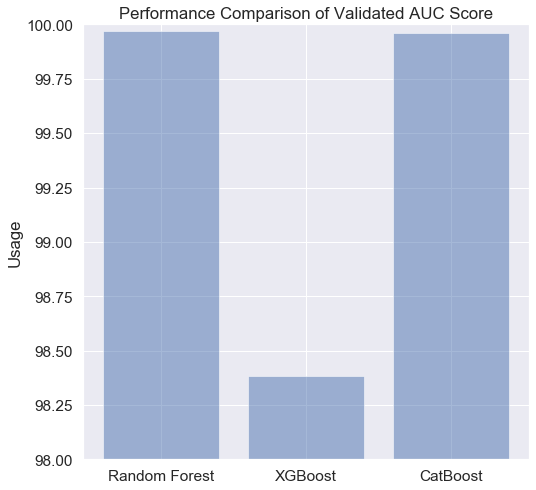

In [289]:
objects = ('Random Forest', 'XGBoost', 'CatBoost')
y_pos = np.arange(len(objects))
performance = [0.9997014516492291*100,0.9838478286685368*100,0.9995952539874287*100]

plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Usage')
plt.ylim([98.0, 100.0])
plt.title('Performance Comparison of Validated AUC Score')

plt.show()

# Things to improve
* Understand the dataset more detailed from business domain and create additional columns for it. 
* Increase the size of dataset for better and reliable performance of models.
* Visualize count of loan of State on map by setting polygon of each state. 
* Try more models.
* Ensemble and Stack models.
* For our case, we need to reduce false negative cases. So, would spend more time on how to reduce false negative cases.